In [55]:
import pandas as pd
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV

# Data download

In [2]:
train = pd.read_csv(r'C:\Users\Yevhen\Downloads\train.csv')

test = pd.read_csv(r'C:\Users\Yevhen\Downloads\test.csv')

gender_submission = pd.read_csv(r'C:\Users\Yevhen\Downloads\gender_submission.csv')

In [3]:
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
test.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [5]:
gender_submission.head()

,PassengerId,Survived
0,892,0
1,893,1
2,894,0
3,895,0
4,896,1


# Data research

In [6]:
print('Shape train data is', train.shape)

Shape train data is (891, 12)


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [8]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Name         418 non-null    object 
 3   Sex          418 non-null    object 
 4   Age          332 non-null    float64
 5   SibSp        418 non-null    int64  
 6   Parch        418 non-null    int64  
 7   Ticket       418 non-null    object 
 8   Fare         417 non-null    float64
 9   Cabin        91 non-null     object 
 10  Embarked     418 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 36.0+ KB


In [9]:
train.describe().drop('PassengerId', 1)

,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


Text(0.5, 1.0, 'Correlation heatmap')

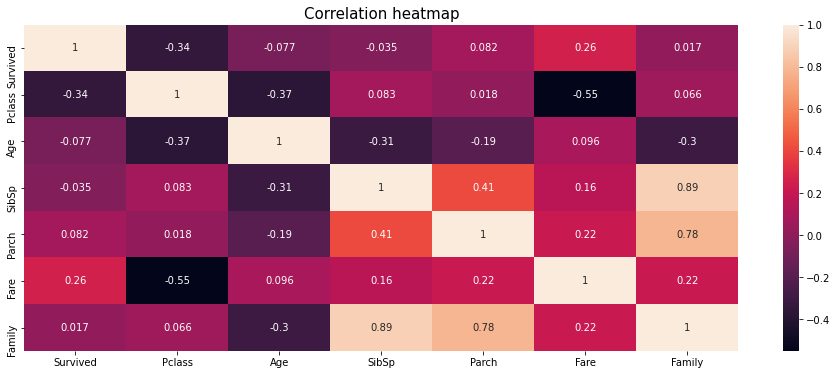

In [40]:
# Build correlation heatmap
plt.figure(figsize = (16,6))
heatmap = sns.heatmap(train.drop(['PassengerId'], 1).corr(), annot = True)
heatmap.set_title('Correlation heatmap', fontdict = {'fontsize': 15})

In [41]:
# Percent of survivors
count_of_survivors = len(train[train['Survived'] == 1])
number_of_people = train.shape[0]

print(f'Percent of survivors: {round(train.Survived.mean(), 2)} %')

Percent of survivors: 0.38 %


In [42]:
# Percent of women survivor
women = train.loc[train['Sex'] == 'female']['Survived']
count_of_survivors_women = sum(women)
rate_women = round(women.mean(), 2)

print(f'Percent of women survivors {count_of_survivors_women} / {len(women) }: {rate_women} %')

Percent of women survivors 233 / 314: 0.74 %


In [43]:
# Percent of men survivors
men = train.loc[train['Sex'] == 'male']['Survived']
count_of_survivors_men = sum(men)
rate_men = round(men.mean(), 2)

print(f'Percent of men survivors {count_of_survivors_men} / {len(men) }: {rate_men} %')

Percent of men survivors 109 / 577: 0.19 %


In [44]:
# Сomplete information about the survivors
print(f'Percent of survivors {count_of_survivors}/{number_of_people}: {round(train.Survived.mean(), 2)} %')
print(f'Percent of women survivors {count_of_survivors_women}/{len(women) }: {rate_women} %')
print(f'Percent of men survivors {count_of_survivors_men}/{len(men) }: {rate_men} %')

Percent of survivors 342/891: 0.38 %
Percent of women survivors 233/314: 0.74 %
Percent of men survivors 109/577: 0.19 %


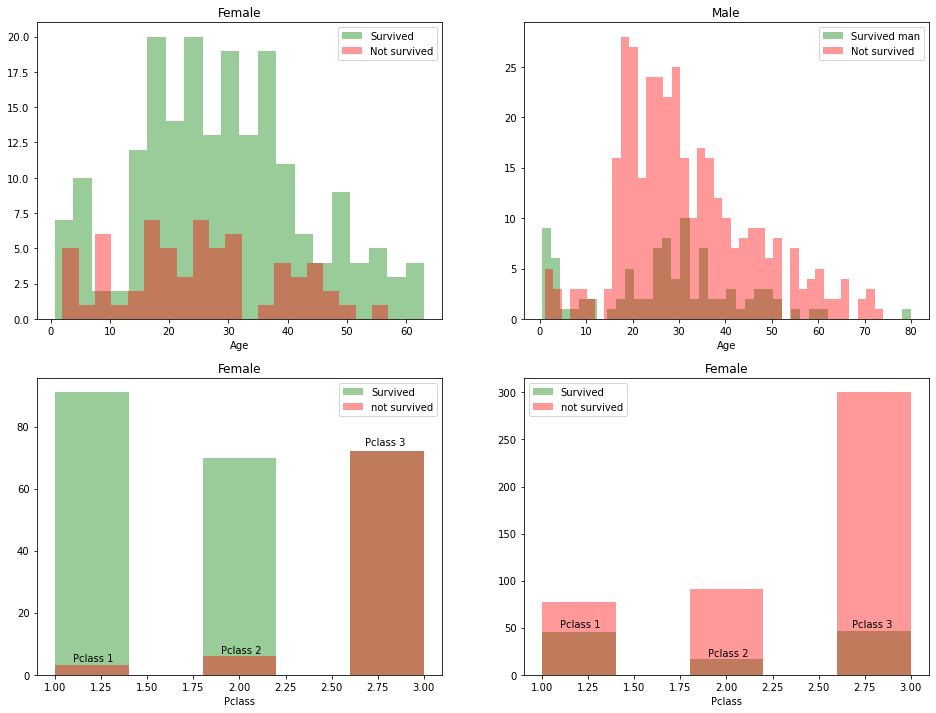

In [45]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (16, 12))

woman = train[train['Sex'] == 'female']
man = train[train['Sex'] == 'male']

#plot survived woman age
ax = sns.distplot(woman[woman['Survived'] == 1].Age.dropna(), ax = axes[0][0], 
                  label = 'Survived', bins=20, color = 'green', kde =False)

#plot not survived woman age
ax = sns.distplot(woman[woman['Survived'] == 0].Age.dropna(), ax = axes[0][0], 
                  label = 'Not survived', bins=20, color = 'red', kde =False)


ax.set_title('Female')
ax.legend()

#plot survived man age
ax = sns.distplot(man[man['Survived'] == 1].Age.dropna(), ax = axes[0][1], 
                  label = 'Survived man',bins=40, color = 'green', kde =False)

#plot not survived man age
ax = sns.distplot(man[man['Survived'] == 0].Age.dropna(), ax = axes[0][1], 
                  label = 'Not survived',bins=40, color = 'red', kde =False)


ax.set_title('Male')
ax.legend()


#plot survived woman Pclass
ax = sns.distplot(woman[woman['Survived'] == 1].Pclass, ax = axes[1][0], 
                  bins = 5, kde = False, color = 'green', label = 'Survived')

#plot not survived woman Pclass
ax = sns.distplot(woman[woman['Survived'] == 0].Pclass, ax = axes[1][0], 
                  bins = 5, kde = False, color = 'red', label = 'not survived')

ax.text(1.1, 4.2, 'Pclass 1')
ax.text(1.9, 6.9, 'Pclass 2')
ax.text(2.68, 74, 'Pclass 3')

ax.set_title('Female')
ax.legend()

#plot survived man Pclass
ax = sns.distplot(man[man['Survived'] == 1].Pclass, ax = axes[1][1], 
                  bins = 5, kde = False, color = 'green', label = 'Survived')

#plot not survived man Pclass
ax = sns.distplot(man[man['Survived'] == 0].Pclass, ax = axes[1][1], 
                  bins = 5, kde = False, color = 'red', label = 'not survived')

ax.text(1.1, 50, 'Pclass 1')
ax.text(1.9, 20, 'Pclass 2')
ax.text(2.68, 50, 'Pclass 3')

ax.set_title('Female')
ax.legend()




<font size="3">Looking at the facts, the older the person, the worse the chances, and if a man, the chances are even smaller and the larger the P-class, the chances decrease.
<br>Percent of survivors 342/891: 0.38 %
<br>Percent of women survivors 233/314: 0.74 %
<br>Percent of men survivors 109/577: 0.19 %

# Data processing

In [46]:
def encoding_age_and_sex(age, sex):
    """
    Encodes age and gender into one information.
    
    Converts the value to:

    - Age < 18 and Sex == 'female' >> 'girl'
    - Age < 18 and Sex == 'male' >> 'boy'
    - 18 >= Age <= 25 and Sex == 'female' >> 'young adulthood woman'
    - 18 >= Age <= 25 and Sex == 'male' >> 'young adulthood man'
    - 25 >= Age <= 60  and Sex == 'female' >> 'woman'
    - 25 >= Age <= 60  and Sex == 'male' >> 'man'
    - Age >= 60 and Sex == 'female' >> 'old woman'
    - Age >= 60 and Sex == 'male' >> 'old man'
    
    
    Return
    --------
    
    encoding_arr: encoded array with string data.
    
    """
    encoding_arr = []
    
    for index in range(len(age)):
        obj_age = age[index]
        obj_sex = sex[index]
    
        if obj_age < 18 and obj_sex == 'female':
            encoding_arr.append('girl')
        elif obj_age < 18 and obj_sex == 'male':
            encoding_arr.append('boy')
        elif obj_age >= 18 and obj_age <= 25 and obj_sex == 'female':
            encoding_arr.append('young adulthood woman')
        elif obj_age >= 18 and obj_age <= 25 and obj_sex == 'male':
            encoding_arr.append('young adulthood man')
        elif obj_age > 25 and obj_age < 60 and obj_sex == 'female':
            encoding_arr.append('woman')
        elif obj_age > 25 and obj_age < 65 and obj_sex == 'male':
            encoding_arr.append('man')
        elif obj_age >= 60 and obj_sex == 'female':
            encoding_arr.append('old woman')
        elif obj_age >= 65 and obj_sex == 'male':
            encoding_arr.append('old man')
        
    return encoding_arr
    

In [47]:
def preparation_titanic_data(train_data, test_data):    
    """
    Processes and cleans titanic data.
    
    Creates a column: 'Family' = 'SibSp' + 'Parch'.
    
    Changes the columnn: encodes age and gender into one information
    def encoding_age_and_sex(age, sex).
    
    Removes columns: 'SibSp', 'Parch', 'Name', 'Ticket', 'Cabin', 'PassengerId', 'Sex'.
    
    
    
    Return
    --------
    X_train, y_train, test_data
    
    
    """
    #preparation train
    train_data['Family'] = train_data['SibSp'] + train_data['Parch'] 
    train_data = train_data.drop(['SibSp', 'Parch', 'Name', 'Ticket', 'Cabin', 'PassengerId'], 1)
    
    numerical_colums = []
    for column in train_data.drop('Survived', 1).columns:
        if train[column].dtypes != 'object':
            numerical_colums.append(column)
    
    for column in numerical_colums:
        train_data[column] = train_data[column].fillna(train_data[column].median())
    
    train_data = train_data.dropna()
    
    #preparation test
    test_data['Family'] = test_data['SibSp'] + test_data['Parch'] 
    test_data = test.drop(['Name', 'Ticket', 'Cabin', 'PassengerId', 'SibSp', 'Parch'],1)
    
    for column in numerical_colums:
        test_data[column] = test_data[column].fillna(train_data[column].median())
    
    #-----
    train_data.Age = encoding_age_and_sex(list(train_data.Age), list(train_data.Sex))
    test_data.Age = encoding_age_and_sex(list(test_data.Age), list(test_data.Sex))
    
    X_train = train_data.drop(['Survived', 'Sex'], 1)
    y_train = train_data.Survived
    
    return X_train, y_train, test_data.drop('Sex',1)

# Mashine learning

In [56]:
X_train, y_train, test_data = preparation_titanic_data(train, test)

In [57]:
CBC = CatBoostClassifier(cat_features = [1, 3], task_type='GPU')


In [58]:
param_grid = {
    'iterations': [100, 200, 300, 400, 500],
    'depth': [4, 5, 6, 7, 8],    
    'learning_rate': [0.1, 0.05, 0.01]
}

In [64]:
pg = GridSearchCV(CBC, param_grid, scoring = 'accuracy')

In [65]:
pg.fit(X_train, y_train)

0:	learn: 0.6381050	total: 8.24ms	remaining: 816ms
1:	learn: 0.6015922	total: 16.6ms	remaining: 812ms
2:	learn: 0.5599367	total: 24.6ms	remaining: 794ms
3:	learn: 0.5263247	total: 32.6ms	remaining: 783ms
4:	learn: 0.5002576	total: 40.4ms	remaining: 767ms
5:	learn: 0.4807689	total: 48.5ms	remaining: 760ms
6:	learn: 0.4675332	total: 57.9ms	remaining: 769ms
7:	learn: 0.4578772	total: 65.3ms	remaining: 751ms
8:	learn: 0.4473592	total: 72.6ms	remaining: 734ms
9:	learn: 0.4391294	total: 81.1ms	remaining: 730ms
10:	learn: 0.4351108	total: 89.5ms	remaining: 724ms
11:	learn: 0.4296939	total: 98.5ms	remaining: 722ms
12:	learn: 0.4244273	total: 106ms	remaining: 710ms
13:	learn: 0.4215472	total: 114ms	remaining: 698ms
14:	learn: 0.4185744	total: 121ms	remaining: 685ms
15:	learn: 0.4176878	total: 128ms	remaining: 672ms
16:	learn: 0.4150781	total: 135ms	remaining: 659ms
17:	learn: 0.4131224	total: 142ms	remaining: 647ms
18:	learn: 0.4117871	total: 149ms	remaining: 637ms
19:	learn: 0.4101669	total: 1

61:	learn: 0.3659729	total: 370ms	remaining: 227ms
62:	learn: 0.3646808	total: 376ms	remaining: 221ms
63:	learn: 0.3644706	total: 384ms	remaining: 216ms
64:	learn: 0.3640083	total: 390ms	remaining: 210ms
65:	learn: 0.3630548	total: 395ms	remaining: 204ms
66:	learn: 0.3626305	total: 403ms	remaining: 198ms
67:	learn: 0.3622569	total: 410ms	remaining: 193ms
68:	learn: 0.3612141	total: 417ms	remaining: 188ms
69:	learn: 0.3605511	total: 425ms	remaining: 182ms
70:	learn: 0.3600458	total: 431ms	remaining: 176ms
71:	learn: 0.3598274	total: 437ms	remaining: 170ms
72:	learn: 0.3590246	total: 443ms	remaining: 164ms
73:	learn: 0.3574314	total: 450ms	remaining: 158ms
74:	learn: 0.3571122	total: 457ms	remaining: 152ms
75:	learn: 0.3567763	total: 463ms	remaining: 146ms
76:	learn: 0.3560315	total: 469ms	remaining: 140ms
77:	learn: 0.3556623	total: 475ms	remaining: 134ms
78:	learn: 0.3550882	total: 481ms	remaining: 128ms
79:	learn: 0.3533849	total: 486ms	remaining: 122ms
80:	learn: 0.3531880	total: 492

24:	learn: 0.4110312	total: 189ms	remaining: 568ms
25:	learn: 0.4100097	total: 196ms	remaining: 557ms
26:	learn: 0.4090783	total: 204ms	remaining: 552ms
27:	learn: 0.4082468	total: 211ms	remaining: 544ms
28:	learn: 0.4075124	total: 217ms	remaining: 531ms
29:	learn: 0.4074408	total: 223ms	remaining: 520ms
30:	learn: 0.4066422	total: 230ms	remaining: 511ms
31:	learn: 0.4049890	total: 235ms	remaining: 500ms
32:	learn: 0.4044187	total: 242ms	remaining: 491ms
33:	learn: 0.4041040	total: 248ms	remaining: 481ms
34:	learn: 0.4040125	total: 256ms	remaining: 475ms
35:	learn: 0.4001564	total: 262ms	remaining: 465ms
36:	learn: 0.3984423	total: 268ms	remaining: 456ms
37:	learn: 0.3983341	total: 276ms	remaining: 450ms
38:	learn: 0.3974895	total: 282ms	remaining: 440ms
39:	learn: 0.3970825	total: 288ms	remaining: 432ms
40:	learn: 0.3969296	total: 294ms	remaining: 423ms
41:	learn: 0.3965702	total: 299ms	remaining: 413ms
42:	learn: 0.3945223	total: 305ms	remaining: 404ms
43:	learn: 0.3938745	total: 310

85:	learn: 0.3742578	total: 543ms	remaining: 88.5ms
86:	learn: 0.3739347	total: 551ms	remaining: 82.4ms
87:	learn: 0.3735110	total: 557ms	remaining: 76ms
88:	learn: 0.3734152	total: 563ms	remaining: 69.6ms
89:	learn: 0.3726567	total: 570ms	remaining: 63.3ms
90:	learn: 0.3720417	total: 576ms	remaining: 57ms
91:	learn: 0.3713898	total: 582ms	remaining: 50.6ms
92:	learn: 0.3709744	total: 588ms	remaining: 44.2ms
93:	learn: 0.3707860	total: 594ms	remaining: 37.9ms
94:	learn: 0.3703126	total: 601ms	remaining: 31.6ms
95:	learn: 0.3700378	total: 606ms	remaining: 25.3ms
96:	learn: 0.3695753	total: 613ms	remaining: 19ms
97:	learn: 0.3681909	total: 621ms	remaining: 12.7ms
98:	learn: 0.3671458	total: 627ms	remaining: 6.33ms
99:	learn: 0.3669939	total: 633ms	remaining: 0us
0:	learn: 0.6641744	total: 8.11ms	remaining: 802ms
1:	learn: 0.6400115	total: 16.3ms	remaining: 798ms
2:	learn: 0.6121586	total: 22.8ms	remaining: 736ms
3:	learn: 0.5866374	total: 28.6ms	remaining: 687ms
4:	learn: 0.5673244	total

57:	learn: 0.3982096	total: 366ms	remaining: 265ms
58:	learn: 0.3962105	total: 374ms	remaining: 260ms
59:	learn: 0.3955455	total: 382ms	remaining: 255ms
60:	learn: 0.3950992	total: 392ms	remaining: 251ms
61:	learn: 0.3948452	total: 401ms	remaining: 246ms
62:	learn: 0.3935279	total: 409ms	remaining: 240ms
63:	learn: 0.3933038	total: 416ms	remaining: 234ms
64:	learn: 0.3929491	total: 423ms	remaining: 228ms
65:	learn: 0.3928664	total: 430ms	remaining: 221ms
66:	learn: 0.3925612	total: 438ms	remaining: 216ms
67:	learn: 0.3924467	total: 445ms	remaining: 209ms
68:	learn: 0.3921634	total: 452ms	remaining: 203ms
69:	learn: 0.3920485	total: 459ms	remaining: 197ms
70:	learn: 0.3919065	total: 466ms	remaining: 190ms
71:	learn: 0.3915489	total: 473ms	remaining: 184ms
72:	learn: 0.3909648	total: 480ms	remaining: 177ms
73:	learn: 0.3908239	total: 487ms	remaining: 171ms
74:	learn: 0.3897619	total: 494ms	remaining: 165ms
75:	learn: 0.3895706	total: 500ms	remaining: 158ms
76:	learn: 0.3893519	total: 506

30:	learn: 0.4275600	total: 196ms	remaining: 436ms
31:	learn: 0.4260224	total: 203ms	remaining: 432ms
32:	learn: 0.4252045	total: 210ms	remaining: 426ms
33:	learn: 0.4247265	total: 216ms	remaining: 419ms
34:	learn: 0.4238488	total: 222ms	remaining: 412ms
35:	learn: 0.4234607	total: 227ms	remaining: 404ms
36:	learn: 0.4222877	total: 234ms	remaining: 398ms
37:	learn: 0.4206041	total: 239ms	remaining: 390ms
38:	learn: 0.4197000	total: 245ms	remaining: 383ms
39:	learn: 0.4193296	total: 251ms	remaining: 377ms
40:	learn: 0.4191028	total: 257ms	remaining: 369ms
41:	learn: 0.4185096	total: 262ms	remaining: 362ms
42:	learn: 0.4176713	total: 268ms	remaining: 356ms
43:	learn: 0.4172549	total: 276ms	remaining: 351ms
44:	learn: 0.4170461	total: 283ms	remaining: 346ms
45:	learn: 0.4164523	total: 288ms	remaining: 338ms
46:	learn: 0.4162539	total: 294ms	remaining: 331ms
47:	learn: 0.4156224	total: 301ms	remaining: 326ms
48:	learn: 0.4154953	total: 309ms	remaining: 322ms
49:	learn: 0.4152437	total: 316

0:	learn: 0.6782968	total: 5.76ms	remaining: 571ms
1:	learn: 0.6647506	total: 11.7ms	remaining: 574ms
2:	learn: 0.6484653	total: 17.1ms	remaining: 551ms
3:	learn: 0.6325840	total: 22.5ms	remaining: 539ms
4:	learn: 0.6194782	total: 28.9ms	remaining: 549ms
5:	learn: 0.6059232	total: 35.2ms	remaining: 551ms
6:	learn: 0.5940384	total: 41.6ms	remaining: 553ms
7:	learn: 0.5829552	total: 49.7ms	remaining: 571ms
8:	learn: 0.5719264	total: 55.9ms	remaining: 565ms
9:	learn: 0.5620443	total: 61.6ms	remaining: 554ms
10:	learn: 0.5527242	total: 67.8ms	remaining: 548ms
11:	learn: 0.5441128	total: 73.9ms	remaining: 542ms
12:	learn: 0.5365511	total: 79.7ms	remaining: 533ms
13:	learn: 0.5291605	total: 84.4ms	remaining: 519ms
14:	learn: 0.5226853	total: 89ms	remaining: 504ms
15:	learn: 0.5166671	total: 94.2ms	remaining: 495ms
16:	learn: 0.5107460	total: 99.8ms	remaining: 487ms
17:	learn: 0.5051227	total: 105ms	remaining: 480ms
18:	learn: 0.4997489	total: 111ms	remaining: 473ms
19:	learn: 0.4946372	total

83:	learn: 0.4061846	total: 549ms	remaining: 105ms
84:	learn: 0.4059047	total: 556ms	remaining: 98.2ms
85:	learn: 0.4054709	total: 562ms	remaining: 91.6ms
86:	learn: 0.4052365	total: 571ms	remaining: 85.2ms
87:	learn: 0.4048431	total: 577ms	remaining: 78.6ms
88:	learn: 0.4046433	total: 583ms	remaining: 72.1ms
89:	learn: 0.4043934	total: 589ms	remaining: 65.4ms
90:	learn: 0.4041165	total: 594ms	remaining: 58.8ms
91:	learn: 0.4039672	total: 600ms	remaining: 52.2ms
92:	learn: 0.4038538	total: 606ms	remaining: 45.6ms
93:	learn: 0.4033041	total: 611ms	remaining: 39ms
94:	learn: 0.4025581	total: 618ms	remaining: 32.5ms
95:	learn: 0.4025214	total: 623ms	remaining: 26ms
96:	learn: 0.4022270	total: 629ms	remaining: 19.4ms
97:	learn: 0.4017992	total: 634ms	remaining: 12.9ms
98:	learn: 0.4016026	total: 640ms	remaining: 6.47ms
99:	learn: 0.4013789	total: 647ms	remaining: 0us
0:	learn: 0.6781184	total: 7.4ms	remaining: 733ms
1:	learn: 0.6653779	total: 15.9ms	remaining: 778ms
2:	learn: 0.6499514	tot

57:	learn: 0.4267299	total: 369ms	remaining: 267ms
58:	learn: 0.4262685	total: 374ms	remaining: 260ms
59:	learn: 0.4259533	total: 381ms	remaining: 254ms
60:	learn: 0.4250472	total: 387ms	remaining: 247ms
61:	learn: 0.4244532	total: 394ms	remaining: 242ms
62:	learn: 0.4241624	total: 400ms	remaining: 235ms
63:	learn: 0.4238328	total: 407ms	remaining: 229ms
64:	learn: 0.4230260	total: 413ms	remaining: 223ms
65:	learn: 0.4225803	total: 420ms	remaining: 216ms
66:	learn: 0.4221281	total: 426ms	remaining: 210ms
67:	learn: 0.4217715	total: 434ms	remaining: 204ms
68:	learn: 0.4213862	total: 440ms	remaining: 198ms
69:	learn: 0.4211326	total: 446ms	remaining: 191ms
70:	learn: 0.4206678	total: 453ms	remaining: 185ms
71:	learn: 0.4204812	total: 459ms	remaining: 178ms
72:	learn: 0.4200273	total: 464ms	remaining: 172ms
73:	learn: 0.4197321	total: 470ms	remaining: 165ms
74:	learn: 0.4195570	total: 478ms	remaining: 159ms
75:	learn: 0.4194149	total: 485ms	remaining: 153ms
76:	learn: 0.4192947	total: 494

30:	learn: 0.5993847	total: 194ms	remaining: 433ms
31:	learn: 0.5971592	total: 201ms	remaining: 426ms
32:	learn: 0.5947564	total: 208ms	remaining: 422ms
33:	learn: 0.5924584	total: 213ms	remaining: 414ms
34:	learn: 0.5900990	total: 219ms	remaining: 406ms
35:	learn: 0.5877997	total: 223ms	remaining: 397ms
36:	learn: 0.5855087	total: 228ms	remaining: 389ms
37:	learn: 0.5834430	total: 235ms	remaining: 383ms
38:	learn: 0.5812939	total: 241ms	remaining: 378ms
39:	learn: 0.5791702	total: 248ms	remaining: 372ms
40:	learn: 0.5770476	total: 254ms	remaining: 365ms
41:	learn: 0.5749394	total: 259ms	remaining: 358ms
42:	learn: 0.5727911	total: 266ms	remaining: 352ms
43:	learn: 0.5708240	total: 272ms	remaining: 347ms
44:	learn: 0.5688377	total: 280ms	remaining: 342ms
45:	learn: 0.5670251	total: 286ms	remaining: 336ms
46:	learn: 0.5650704	total: 292ms	remaining: 329ms
47:	learn: 0.5631989	total: 301ms	remaining: 326ms
48:	learn: 0.5612950	total: 309ms	remaining: 322ms
49:	learn: 0.5594664	total: 317

0:	learn: 0.6900832	total: 8.11ms	remaining: 803ms
1:	learn: 0.6872858	total: 14.9ms	remaining: 728ms
2:	learn: 0.6837823	total: 21.2ms	remaining: 684ms
3:	learn: 0.6801302	total: 26.9ms	remaining: 645ms
4:	learn: 0.6765912	total: 33.6ms	remaining: 638ms
5:	learn: 0.6732003	total: 40.2ms	remaining: 629ms
6:	learn: 0.6699154	total: 46.1ms	remaining: 612ms
7:	learn: 0.6667310	total: 52.9ms	remaining: 609ms
8:	learn: 0.6632689	total: 58.8ms	remaining: 595ms
9:	learn: 0.6601455	total: 64.7ms	remaining: 582ms
10:	learn: 0.6568892	total: 70.7ms	remaining: 572ms
11:	learn: 0.6537239	total: 76.6ms	remaining: 562ms
12:	learn: 0.6507518	total: 82.6ms	remaining: 552ms
13:	learn: 0.6476604	total: 88.7ms	remaining: 545ms
14:	learn: 0.6447308	total: 94ms	remaining: 532ms
15:	learn: 0.6417811	total: 102ms	remaining: 535ms
16:	learn: 0.6390188	total: 109ms	remaining: 532ms
17:	learn: 0.6362777	total: 115ms	remaining: 522ms
18:	learn: 0.6335616	total: 120ms	remaining: 513ms
19:	learn: 0.6308832	total: 

83:	learn: 0.5154803	total: 547ms	remaining: 104ms
84:	learn: 0.5142383	total: 554ms	remaining: 97.8ms
85:	learn: 0.5131024	total: 560ms	remaining: 91.2ms
86:	learn: 0.5120132	total: 567ms	remaining: 84.8ms
87:	learn: 0.5110182	total: 574ms	remaining: 78.2ms
88:	learn: 0.5099682	total: 579ms	remaining: 71.6ms
89:	learn: 0.5088707	total: 585ms	remaining: 65ms
90:	learn: 0.5078892	total: 592ms	remaining: 58.5ms
91:	learn: 0.5070515	total: 597ms	remaining: 52ms
92:	learn: 0.5060300	total: 603ms	remaining: 45.4ms
93:	learn: 0.5051082	total: 609ms	remaining: 38.9ms
94:	learn: 0.5040590	total: 615ms	remaining: 32.4ms
95:	learn: 0.5032398	total: 621ms	remaining: 25.9ms
96:	learn: 0.5023110	total: 626ms	remaining: 19.4ms
97:	learn: 0.5013400	total: 632ms	remaining: 12.9ms
98:	learn: 0.5004752	total: 638ms	remaining: 6.45ms
99:	learn: 0.4994263	total: 644ms	remaining: 0us
0:	learn: 0.6900850	total: 6.18ms	remaining: 612ms
1:	learn: 0.6872553	total: 10.8ms	remaining: 530ms
2:	learn: 0.6838034	to

47:	learn: 0.3602595	total: 809ms	remaining: 2.56s
48:	learn: 0.3601564	total: 824ms	remaining: 2.54s
49:	learn: 0.3597416	total: 840ms	remaining: 2.52s
50:	learn: 0.3591451	total: 856ms	remaining: 2.5s
51:	learn: 0.3581426	total: 873ms	remaining: 2.48s
52:	learn: 0.3562069	total: 890ms	remaining: 2.47s
53:	learn: 0.3558262	total: 906ms	remaining: 2.45s
54:	learn: 0.3554559	total: 922ms	remaining: 2.43s
55:	learn: 0.3546189	total: 936ms	remaining: 2.4s
56:	learn: 0.3536428	total: 952ms	remaining: 2.39s
57:	learn: 0.3531443	total: 969ms	remaining: 2.37s
58:	learn: 0.3527120	total: 984ms	remaining: 2.35s
59:	learn: 0.3516447	total: 1s	remaining: 2.34s
60:	learn: 0.3515194	total: 1.02s	remaining: 2.32s
61:	learn: 0.3511359	total: 1.03s	remaining: 2.3s
62:	learn: 0.3508364	total: 1.05s	remaining: 2.29s
63:	learn: 0.3497093	total: 1.07s	remaining: 2.28s
64:	learn: 0.3493085	total: 1.09s	remaining: 2.26s
65:	learn: 0.3487879	total: 1.11s	remaining: 2.25s
66:	learn: 0.3454950	total: 1.13s	rem

11:	learn: 0.4056367	total: 239ms	remaining: 3.74s
12:	learn: 0.3992588	total: 258ms	remaining: 3.71s
13:	learn: 0.3938728	total: 278ms	remaining: 3.69s
14:	learn: 0.3906040	total: 295ms	remaining: 3.64s
15:	learn: 0.3879523	total: 311ms	remaining: 3.58s
16:	learn: 0.3865314	total: 329ms	remaining: 3.54s
17:	learn: 0.3819365	total: 353ms	remaining: 3.56s
18:	learn: 0.3804217	total: 371ms	remaining: 3.54s
19:	learn: 0.3778519	total: 388ms	remaining: 3.49s
20:	learn: 0.3771940	total: 408ms	remaining: 3.48s
21:	learn: 0.3748158	total: 426ms	remaining: 3.44s
22:	learn: 0.3744041	total: 441ms	remaining: 3.39s
23:	learn: 0.3729568	total: 457ms	remaining: 3.35s
24:	learn: 0.3718907	total: 474ms	remaining: 3.32s
25:	learn: 0.3707193	total: 492ms	remaining: 3.29s
26:	learn: 0.3701291	total: 509ms	remaining: 3.26s
27:	learn: 0.3692345	total: 524ms	remaining: 3.22s
28:	learn: 0.3684722	total: 540ms	remaining: 3.18s
29:	learn: 0.3680575	total: 556ms	remaining: 3.15s
30:	learn: 0.3677469	total: 572

174:	learn: 0.2573137	total: 3.16s	remaining: 452ms
175:	learn: 0.2564039	total: 3.18s	remaining: 434ms
176:	learn: 0.2561129	total: 3.2s	remaining: 415ms
177:	learn: 0.2555319	total: 3.21s	remaining: 397ms
178:	learn: 0.2550423	total: 3.23s	remaining: 378ms
179:	learn: 0.2550117	total: 3.24s	remaining: 360ms
180:	learn: 0.2549014	total: 3.26s	remaining: 342ms
181:	learn: 0.2541318	total: 3.27s	remaining: 324ms
182:	learn: 0.2539944	total: 3.29s	remaining: 306ms
183:	learn: 0.2536840	total: 3.31s	remaining: 288ms
184:	learn: 0.2535693	total: 3.32s	remaining: 269ms
185:	learn: 0.2516868	total: 3.34s	remaining: 251ms
186:	learn: 0.2516150	total: 3.36s	remaining: 234ms
187:	learn: 0.2510503	total: 3.38s	remaining: 216ms
188:	learn: 0.2507066	total: 3.39s	remaining: 198ms
189:	learn: 0.2506277	total: 3.41s	remaining: 179ms
190:	learn: 0.2493251	total: 3.43s	remaining: 162ms
191:	learn: 0.2490300	total: 3.44s	remaining: 144ms
192:	learn: 0.2486478	total: 3.46s	remaining: 126ms
193:	learn: 0

140:	learn: 0.3058864	total: 2.43s	remaining: 1.02s
141:	learn: 0.3051831	total: 2.44s	remaining: 999ms
142:	learn: 0.3048464	total: 2.46s	remaining: 981ms
143:	learn: 0.3047831	total: 2.47s	remaining: 962ms
144:	learn: 0.3046172	total: 2.49s	remaining: 944ms
145:	learn: 0.3028846	total: 2.51s	remaining: 927ms
146:	learn: 0.3027107	total: 2.52s	remaining: 909ms
147:	learn: 0.3025599	total: 2.54s	remaining: 892ms
148:	learn: 0.3019964	total: 2.55s	remaining: 873ms
149:	learn: 0.3019150	total: 2.57s	remaining: 855ms
150:	learn: 0.3015392	total: 2.58s	remaining: 837ms
151:	learn: 0.2994887	total: 2.6s	remaining: 821ms
152:	learn: 0.2987654	total: 2.61s	remaining: 802ms
153:	learn: 0.2983331	total: 2.63s	remaining: 786ms
154:	learn: 0.2982747	total: 2.65s	remaining: 768ms
155:	learn: 0.2975971	total: 2.66s	remaining: 751ms
156:	learn: 0.2971657	total: 2.67s	remaining: 733ms
157:	learn: 0.2966836	total: 2.69s	remaining: 715ms
158:	learn: 0.2959989	total: 2.71s	remaining: 698ms
159:	learn: 0

108:	learn: 0.3383651	total: 1.81s	remaining: 1.51s
109:	learn: 0.3380057	total: 1.83s	remaining: 1.5s
110:	learn: 0.3374311	total: 1.85s	remaining: 1.48s
111:	learn: 0.3373649	total: 1.87s	remaining: 1.47s
112:	learn: 0.3367615	total: 1.88s	remaining: 1.45s
113:	learn: 0.3362407	total: 1.9s	remaining: 1.43s
114:	learn: 0.3356448	total: 1.91s	remaining: 1.41s
115:	learn: 0.3353351	total: 1.93s	remaining: 1.39s
116:	learn: 0.3348546	total: 1.94s	remaining: 1.38s
117:	learn: 0.3346345	total: 1.96s	remaining: 1.36s
118:	learn: 0.3334970	total: 1.98s	remaining: 1.34s
119:	learn: 0.3330468	total: 1.99s	remaining: 1.33s
120:	learn: 0.3325341	total: 2.01s	remaining: 1.31s
121:	learn: 0.3319725	total: 2.02s	remaining: 1.29s
122:	learn: 0.3318400	total: 2.04s	remaining: 1.28s
123:	learn: 0.3317123	total: 2.05s	remaining: 1.26s
124:	learn: 0.3308561	total: 2.07s	remaining: 1.24s
125:	learn: 0.3306252	total: 2.09s	remaining: 1.23s
126:	learn: 0.3302248	total: 2.1s	remaining: 1.21s
127:	learn: 0.3

70:	learn: 0.3457721	total: 1.18s	remaining: 2.14s
71:	learn: 0.3452786	total: 1.19s	remaining: 2.12s
72:	learn: 0.3446635	total: 1.21s	remaining: 2.1s
73:	learn: 0.3441564	total: 1.23s	remaining: 2.09s
74:	learn: 0.3437573	total: 1.24s	remaining: 2.07s
75:	learn: 0.3435299	total: 1.26s	remaining: 2.05s
76:	learn: 0.3432702	total: 1.27s	remaining: 2.03s
77:	learn: 0.3424785	total: 1.29s	remaining: 2.02s
78:	learn: 0.3422021	total: 1.31s	remaining: 2.01s
79:	learn: 0.3404859	total: 1.33s	remaining: 2s
80:	learn: 0.3380990	total: 1.35s	remaining: 1.99s
81:	learn: 0.3375281	total: 1.37s	remaining: 1.97s
82:	learn: 0.3374070	total: 1.39s	remaining: 1.96s
83:	learn: 0.3345299	total: 1.41s	remaining: 1.95s
84:	learn: 0.3336212	total: 1.43s	remaining: 1.93s
85:	learn: 0.3335096	total: 1.45s	remaining: 1.92s
86:	learn: 0.3329626	total: 1.46s	remaining: 1.9s
87:	learn: 0.3300675	total: 1.48s	remaining: 1.89s
88:	learn: 0.3298860	total: 1.5s	remaining: 1.87s
89:	learn: 0.3290667	total: 1.51s	rem

31:	learn: 0.4084825	total: 597ms	remaining: 3.14s
32:	learn: 0.4081843	total: 617ms	remaining: 3.12s
33:	learn: 0.4080361	total: 635ms	remaining: 3.1s
34:	learn: 0.4067612	total: 652ms	remaining: 3.07s
35:	learn: 0.4054432	total: 669ms	remaining: 3.05s
36:	learn: 0.4042601	total: 689ms	remaining: 3.04s
37:	learn: 0.4023013	total: 709ms	remaining: 3.02s
38:	learn: 0.4008508	total: 727ms	remaining: 3s
39:	learn: 0.3984030	total: 747ms	remaining: 2.99s
40:	learn: 0.3966616	total: 768ms	remaining: 2.98s
41:	learn: 0.3951084	total: 788ms	remaining: 2.96s
42:	learn: 0.3938654	total: 810ms	remaining: 2.96s
43:	learn: 0.3921940	total: 831ms	remaining: 2.95s
44:	learn: 0.3907756	total: 853ms	remaining: 2.94s
45:	learn: 0.3906132	total: 872ms	remaining: 2.92s
46:	learn: 0.3898606	total: 891ms	remaining: 2.9s
47:	learn: 0.3895655	total: 908ms	remaining: 2.88s
48:	learn: 0.3875605	total: 930ms	remaining: 2.87s
49:	learn: 0.3872812	total: 947ms	remaining: 2.84s
50:	learn: 0.3871376	total: 962ms	re

0:	learn: 0.6525668	total: 17.8ms	remaining: 3.54s
1:	learn: 0.6239112	total: 36.1ms	remaining: 3.57s
2:	learn: 0.6016962	total: 52.4ms	remaining: 3.44s
3:	learn: 0.5842396	total: 68.6ms	remaining: 3.36s
4:	learn: 0.5704362	total: 84.9ms	remaining: 3.31s
5:	learn: 0.5571365	total: 102ms	remaining: 3.31s
6:	learn: 0.5479433	total: 120ms	remaining: 3.3s
7:	learn: 0.5395467	total: 138ms	remaining: 3.31s
8:	learn: 0.5330384	total: 155ms	remaining: 3.3s
9:	learn: 0.5099287	total: 171ms	remaining: 3.26s
10:	learn: 0.4904567	total: 189ms	remaining: 3.25s
11:	learn: 0.4868100	total: 207ms	remaining: 3.24s
12:	learn: 0.4738379	total: 224ms	remaining: 3.22s
13:	learn: 0.4661984	total: 246ms	remaining: 3.27s
14:	learn: 0.4559975	total: 267ms	remaining: 3.3s
15:	learn: 0.4487065	total: 289ms	remaining: 3.32s
16:	learn: 0.4422491	total: 309ms	remaining: 3.33s
17:	learn: 0.4376602	total: 329ms	remaining: 3.33s
18:	learn: 0.4322416	total: 348ms	remaining: 3.32s
19:	learn: 0.4273929	total: 368ms	remai

171:	learn: 0.3101055	total: 2.91s	remaining: 474ms
172:	learn: 0.3100395	total: 2.93s	remaining: 457ms
173:	learn: 0.3096384	total: 2.95s	remaining: 441ms
174:	learn: 0.3091294	total: 2.97s	remaining: 424ms
175:	learn: 0.3086982	total: 2.98s	remaining: 407ms
176:	learn: 0.3084664	total: 3s	remaining: 390ms
177:	learn: 0.3082847	total: 3.02s	remaining: 373ms
178:	learn: 0.3079711	total: 3.03s	remaining: 356ms
179:	learn: 0.3077177	total: 3.05s	remaining: 339ms
180:	learn: 0.3075119	total: 3.07s	remaining: 322ms
181:	learn: 0.3060802	total: 3.09s	remaining: 305ms
182:	learn: 0.3057781	total: 3.1s	remaining: 288ms
183:	learn: 0.3056014	total: 3.12s	remaining: 271ms
184:	learn: 0.3055313	total: 3.14s	remaining: 254ms
185:	learn: 0.3053315	total: 3.15s	remaining: 237ms
186:	learn: 0.3049287	total: 3.17s	remaining: 220ms
187:	learn: 0.3044973	total: 3.18s	remaining: 203ms
188:	learn: 0.3040826	total: 3.2s	remaining: 186ms
189:	learn: 0.3036903	total: 3.21s	remaining: 169ms
190:	learn: 0.303

139:	learn: 0.3495643	total: 2.38s	remaining: 1.02s
140:	learn: 0.3495009	total: 2.4s	remaining: 1s
141:	learn: 0.3488438	total: 2.41s	remaining: 985ms
142:	learn: 0.3482303	total: 2.43s	remaining: 968ms
143:	learn: 0.3480305	total: 2.44s	remaining: 950ms
144:	learn: 0.3478557	total: 2.46s	remaining: 933ms
145:	learn: 0.3477558	total: 2.48s	remaining: 916ms
146:	learn: 0.3476387	total: 2.49s	remaining: 899ms
147:	learn: 0.3469810	total: 2.51s	remaining: 882ms
148:	learn: 0.3466585	total: 2.53s	remaining: 865ms
149:	learn: 0.3464742	total: 2.54s	remaining: 848ms
150:	learn: 0.3461821	total: 2.56s	remaining: 831ms
151:	learn: 0.3461087	total: 2.58s	remaining: 816ms
152:	learn: 0.3454077	total: 2.6s	remaining: 799ms
153:	learn: 0.3452945	total: 2.62s	remaining: 781ms
154:	learn: 0.3451504	total: 2.63s	remaining: 763ms
155:	learn: 0.3448804	total: 2.64s	remaining: 746ms
156:	learn: 0.3445284	total: 2.66s	remaining: 728ms
157:	learn: 0.3440290	total: 2.67s	remaining: 711ms
158:	learn: 0.343

101:	learn: 0.3772261	total: 1.81s	remaining: 1.74s
102:	learn: 0.3769841	total: 1.83s	remaining: 1.72s
103:	learn: 0.3768375	total: 1.84s	remaining: 1.7s
104:	learn: 0.3763095	total: 1.86s	remaining: 1.68s
105:	learn: 0.3758884	total: 1.88s	remaining: 1.67s
106:	learn: 0.3756267	total: 1.9s	remaining: 1.65s
107:	learn: 0.3750667	total: 1.91s	remaining: 1.63s
108:	learn: 0.3744576	total: 1.92s	remaining: 1.61s
109:	learn: 0.3741984	total: 1.94s	remaining: 1.59s
110:	learn: 0.3731774	total: 1.96s	remaining: 1.57s
111:	learn: 0.3731012	total: 1.97s	remaining: 1.55s
112:	learn: 0.3730612	total: 1.99s	remaining: 1.53s
113:	learn: 0.3726480	total: 2s	remaining: 1.51s
114:	learn: 0.3725026	total: 2.02s	remaining: 1.49s
115:	learn: 0.3724220	total: 2.03s	remaining: 1.47s
116:	learn: 0.3721253	total: 2.05s	remaining: 1.46s
117:	learn: 0.3720033	total: 2.07s	remaining: 1.44s
118:	learn: 0.3718036	total: 2.08s	remaining: 1.42s
119:	learn: 0.3715607	total: 2.09s	remaining: 1.4s
120:	learn: 0.3710

66:	learn: 0.3801963	total: 1.17s	remaining: 2.33s
67:	learn: 0.3787878	total: 1.19s	remaining: 2.31s
68:	learn: 0.3783314	total: 1.21s	remaining: 2.29s
69:	learn: 0.3780101	total: 1.22s	remaining: 2.27s
70:	learn: 0.3779358	total: 1.24s	remaining: 2.26s
71:	learn: 0.3777708	total: 1.26s	remaining: 2.23s
72:	learn: 0.3767752	total: 1.27s	remaining: 2.21s
73:	learn: 0.3765805	total: 1.28s	remaining: 2.19s
74:	learn: 0.3759067	total: 1.3s	remaining: 2.17s
75:	learn: 0.3757374	total: 1.31s	remaining: 2.15s
76:	learn: 0.3756634	total: 1.33s	remaining: 2.13s
77:	learn: 0.3755377	total: 1.34s	remaining: 2.1s
78:	learn: 0.3751602	total: 1.36s	remaining: 2.08s
79:	learn: 0.3750050	total: 1.38s	remaining: 2.06s
80:	learn: 0.3735544	total: 1.4s	remaining: 2.05s
81:	learn: 0.3731544	total: 1.41s	remaining: 2.03s
82:	learn: 0.3729431	total: 1.43s	remaining: 2.02s
83:	learn: 0.3721698	total: 1.45s	remaining: 2s
84:	learn: 0.3719294	total: 1.47s	remaining: 1.99s
85:	learn: 0.3718047	total: 1.49s	rem

36:	learn: 0.4518972	total: 635ms	remaining: 2.79s
37:	learn: 0.4492944	total: 652ms	remaining: 2.78s
38:	learn: 0.4468082	total: 669ms	remaining: 2.76s
39:	learn: 0.4435735	total: 686ms	remaining: 2.74s
40:	learn: 0.4398071	total: 703ms	remaining: 2.73s
41:	learn: 0.4382725	total: 722ms	remaining: 2.71s
42:	learn: 0.4362687	total: 742ms	remaining: 2.71s
43:	learn: 0.4346496	total: 762ms	remaining: 2.7s
44:	learn: 0.4324925	total: 780ms	remaining: 2.69s
45:	learn: 0.4303431	total: 797ms	remaining: 2.67s
46:	learn: 0.4287726	total: 814ms	remaining: 2.65s
47:	learn: 0.4269285	total: 831ms	remaining: 2.63s
48:	learn: 0.4245858	total: 851ms	remaining: 2.62s
49:	learn: 0.4231255	total: 869ms	remaining: 2.6s
50:	learn: 0.4216724	total: 886ms	remaining: 2.59s
51:	learn: 0.4201947	total: 903ms	remaining: 2.57s
52:	learn: 0.4187871	total: 919ms	remaining: 2.55s
53:	learn: 0.4174263	total: 935ms	remaining: 2.53s
54:	learn: 0.4163238	total: 951ms	remaining: 2.51s
55:	learn: 0.4152032	total: 968ms

0:	learn: 0.6721201	total: 15.7ms	remaining: 3.12s
1:	learn: 0.6553508	total: 30.8ms	remaining: 3.05s
2:	learn: 0.6407502	total: 44.9ms	remaining: 2.94s
3:	learn: 0.6279965	total: 58.7ms	remaining: 2.87s
4:	learn: 0.6166153	total: 72.8ms	remaining: 2.84s
5:	learn: 0.6049707	total: 88.5ms	remaining: 2.86s
6:	learn: 0.5941026	total: 103ms	remaining: 2.85s
7:	learn: 0.5851948	total: 116ms	remaining: 2.79s
8:	learn: 0.5774545	total: 132ms	remaining: 2.8s
9:	learn: 0.5700341	total: 148ms	remaining: 2.82s
10:	learn: 0.5636381	total: 164ms	remaining: 2.81s
11:	learn: 0.5580610	total: 179ms	remaining: 2.8s
12:	learn: 0.5527465	total: 193ms	remaining: 2.78s
13:	learn: 0.5478894	total: 210ms	remaining: 2.79s
14:	learn: 0.5441472	total: 224ms	remaining: 2.77s
15:	learn: 0.5407423	total: 240ms	remaining: 2.76s
16:	learn: 0.5369559	total: 258ms	remaining: 2.77s
17:	learn: 0.5341849	total: 274ms	remaining: 2.77s
18:	learn: 0.5215096	total: 291ms	remaining: 2.78s
19:	learn: 0.5100469	total: 309ms	rem

171:	learn: 0.3541984	total: 2.91s	remaining: 474ms
172:	learn: 0.3540580	total: 2.93s	remaining: 457ms
173:	learn: 0.3538994	total: 2.94s	remaining: 440ms
174:	learn: 0.3537617	total: 2.96s	remaining: 422ms
175:	learn: 0.3535829	total: 2.97s	remaining: 406ms
176:	learn: 0.3533963	total: 2.99s	remaining: 389ms
177:	learn: 0.3532598	total: 3.01s	remaining: 372ms
178:	learn: 0.3531445	total: 3.02s	remaining: 355ms
179:	learn: 0.3528704	total: 3.04s	remaining: 338ms
180:	learn: 0.3528106	total: 3.06s	remaining: 321ms
181:	learn: 0.3526671	total: 3.07s	remaining: 304ms
182:	learn: 0.3525176	total: 3.09s	remaining: 287ms
183:	learn: 0.3518131	total: 3.11s	remaining: 270ms
184:	learn: 0.3516627	total: 3.13s	remaining: 254ms
185:	learn: 0.3509497	total: 3.15s	remaining: 237ms
186:	learn: 0.3502236	total: 3.16s	remaining: 220ms
187:	learn: 0.3500782	total: 3.18s	remaining: 203ms
188:	learn: 0.3497860	total: 3.19s	remaining: 186ms
189:	learn: 0.3494643	total: 3.21s	remaining: 169ms
190:	learn: 

138:	learn: 0.3861205	total: 2.35s	remaining: 1.03s
139:	learn: 0.3856844	total: 2.37s	remaining: 1.01s
140:	learn: 0.3849977	total: 2.39s	remaining: 999ms
141:	learn: 0.3847598	total: 2.4s	remaining: 981ms
142:	learn: 0.3843160	total: 2.42s	remaining: 964ms
143:	learn: 0.3842050	total: 2.43s	remaining: 946ms
144:	learn: 0.3837101	total: 2.45s	remaining: 928ms
145:	learn: 0.3833470	total: 2.46s	remaining: 910ms
146:	learn: 0.3831100	total: 2.48s	remaining: 893ms
147:	learn: 0.3827127	total: 2.49s	remaining: 876ms
148:	learn: 0.3817723	total: 2.51s	remaining: 860ms
149:	learn: 0.3815165	total: 2.53s	remaining: 843ms
150:	learn: 0.3812082	total: 2.55s	remaining: 829ms
151:	learn: 0.3803925	total: 2.58s	remaining: 814ms
152:	learn: 0.3800163	total: 2.59s	remaining: 797ms
153:	learn: 0.3799535	total: 2.61s	remaining: 780ms
154:	learn: 0.3797751	total: 2.62s	remaining: 762ms
155:	learn: 0.3790900	total: 2.64s	remaining: 745ms
156:	learn: 0.3789098	total: 2.65s	remaining: 727ms
157:	learn: 0

103:	learn: 0.4026589	total: 1.8s	remaining: 1.66s
104:	learn: 0.4019661	total: 1.82s	remaining: 1.65s
105:	learn: 0.4013854	total: 1.84s	remaining: 1.63s
106:	learn: 0.4013368	total: 1.86s	remaining: 1.61s
107:	learn: 0.4012179	total: 1.88s	remaining: 1.6s
108:	learn: 0.4008716	total: 1.9s	remaining: 1.58s
109:	learn: 0.4007106	total: 1.92s	remaining: 1.57s
110:	learn: 0.4004113	total: 1.94s	remaining: 1.55s
111:	learn: 0.4003461	total: 1.96s	remaining: 1.54s
112:	learn: 0.4000608	total: 1.98s	remaining: 1.52s
113:	learn: 0.4000282	total: 2s	remaining: 1.51s
114:	learn: 0.3995988	total: 2.01s	remaining: 1.49s
115:	learn: 0.3984612	total: 2.03s	remaining: 1.47s
116:	learn: 0.3984266	total: 2.05s	remaining: 1.45s
117:	learn: 0.3983778	total: 2.06s	remaining: 1.43s
118:	learn: 0.3979563	total: 2.08s	remaining: 1.42s
119:	learn: 0.3979551	total: 2.09s	remaining: 1.4s
120:	learn: 0.3971156	total: 2.11s	remaining: 1.38s
121:	learn: 0.3969224	total: 2.12s	remaining: 1.36s
122:	learn: 0.39654

67:	learn: 0.4127710	total: 1.25s	remaining: 2.42s
68:	learn: 0.4120395	total: 1.27s	remaining: 2.41s
69:	learn: 0.4116239	total: 1.29s	remaining: 2.39s
70:	learn: 0.4107557	total: 1.31s	remaining: 2.38s
71:	learn: 0.4101035	total: 1.33s	remaining: 2.36s
72:	learn: 0.4095082	total: 1.35s	remaining: 2.35s
73:	learn: 0.4087658	total: 1.37s	remaining: 2.33s
74:	learn: 0.4082011	total: 1.39s	remaining: 2.31s
75:	learn: 0.4078730	total: 1.4s	remaining: 2.28s
76:	learn: 0.4078338	total: 1.42s	remaining: 2.27s
77:	learn: 0.4075974	total: 1.44s	remaining: 2.25s
78:	learn: 0.4074783	total: 1.46s	remaining: 2.23s
79:	learn: 0.4065012	total: 1.48s	remaining: 2.22s
80:	learn: 0.4053301	total: 1.5s	remaining: 2.2s
81:	learn: 0.4052301	total: 1.51s	remaining: 2.18s
82:	learn: 0.4049210	total: 1.53s	remaining: 2.16s
83:	learn: 0.4047169	total: 1.55s	remaining: 2.14s
84:	learn: 0.4043935	total: 1.57s	remaining: 2.12s
85:	learn: 0.4036101	total: 1.59s	remaining: 2.11s
86:	learn: 0.4029471	total: 1.61s	

34:	learn: 0.5984315	total: 585ms	remaining: 2.76s
35:	learn: 0.5965499	total: 604ms	remaining: 2.75s
36:	learn: 0.5947406	total: 620ms	remaining: 2.73s
37:	learn: 0.5929110	total: 636ms	remaining: 2.71s
38:	learn: 0.5912442	total: 651ms	remaining: 2.69s
39:	learn: 0.5895775	total: 665ms	remaining: 2.66s
40:	learn: 0.5880165	total: 680ms	remaining: 2.64s
41:	learn: 0.5864638	total: 696ms	remaining: 2.62s
42:	learn: 0.5849464	total: 712ms	remaining: 2.6s
43:	learn: 0.5834530	total: 728ms	remaining: 2.58s
44:	learn: 0.5819864	total: 746ms	remaining: 2.57s
45:	learn: 0.5803930	total: 763ms	remaining: 2.56s
46:	learn: 0.5789447	total: 781ms	remaining: 2.54s
47:	learn: 0.5775574	total: 802ms	remaining: 2.54s
48:	learn: 0.5762412	total: 820ms	remaining: 2.53s
49:	learn: 0.5749481	total: 838ms	remaining: 2.51s
50:	learn: 0.5736672	total: 855ms	remaining: 2.5s
51:	learn: 0.5723874	total: 873ms	remaining: 2.48s
52:	learn: 0.5711203	total: 890ms	remaining: 2.47s
53:	learn: 0.5699077	total: 912ms

0:	learn: 0.6888235	total: 17.3ms	remaining: 3.43s
1:	learn: 0.6850409	total: 33ms	remaining: 3.27s
2:	learn: 0.6809564	total: 47.7ms	remaining: 3.13s
3:	learn: 0.6775307	total: 63ms	remaining: 3.09s
4:	learn: 0.6741814	total: 77.7ms	remaining: 3.03s
5:	learn: 0.6705631	total: 96.3ms	remaining: 3.11s
6:	learn: 0.6668566	total: 112ms	remaining: 3.07s
7:	learn: 0.6631525	total: 125ms	remaining: 3.01s
8:	learn: 0.6599682	total: 141ms	remaining: 3s
9:	learn: 0.6566487	total: 157ms	remaining: 2.98s
10:	learn: 0.6531962	total: 172ms	remaining: 2.95s
11:	learn: 0.6501946	total: 187ms	remaining: 2.92s
12:	learn: 0.6470228	total: 201ms	remaining: 2.9s
13:	learn: 0.6439067	total: 219ms	remaining: 2.91s
14:	learn: 0.6408879	total: 233ms	remaining: 2.88s
15:	learn: 0.6381538	total: 251ms	remaining: 2.89s
16:	learn: 0.6355082	total: 265ms	remaining: 2.85s
17:	learn: 0.6327684	total: 279ms	remaining: 2.82s
18:	learn: 0.6301777	total: 294ms	remaining: 2.8s
19:	learn: 0.6274803	total: 309ms	remaining:

161:	learn: 0.4523124	total: 2.76s	remaining: 647ms
162:	learn: 0.4516278	total: 2.78s	remaining: 631ms
163:	learn: 0.4509382	total: 2.8s	remaining: 614ms
164:	learn: 0.4502785	total: 2.81s	remaining: 597ms
165:	learn: 0.4495490	total: 2.83s	remaining: 580ms
166:	learn: 0.4489823	total: 2.85s	remaining: 564ms
167:	learn: 0.4480577	total: 2.87s	remaining: 547ms
168:	learn: 0.4474547	total: 2.89s	remaining: 530ms
169:	learn: 0.4469037	total: 2.91s	remaining: 513ms
170:	learn: 0.4462054	total: 2.93s	remaining: 497ms
171:	learn: 0.4457373	total: 2.95s	remaining: 480ms
172:	learn: 0.4451327	total: 2.97s	remaining: 463ms
173:	learn: 0.4445461	total: 2.99s	remaining: 446ms
174:	learn: 0.4436524	total: 3.01s	remaining: 429ms
175:	learn: 0.4430302	total: 3.02s	remaining: 413ms
176:	learn: 0.4421786	total: 3.04s	remaining: 395ms
177:	learn: 0.4416403	total: 3.06s	remaining: 378ms
178:	learn: 0.4410648	total: 3.08s	remaining: 361ms
179:	learn: 0.4405687	total: 3.1s	remaining: 344ms
180:	learn: 0.

130:	learn: 0.4991280	total: 2.2s	remaining: 1.16s
131:	learn: 0.4978753	total: 2.22s	remaining: 1.14s
132:	learn: 0.4976488	total: 2.24s	remaining: 1.13s
133:	learn: 0.4967031	total: 2.26s	remaining: 1.11s
134:	learn: 0.4964301	total: 2.28s	remaining: 1.1s
135:	learn: 0.4952965	total: 2.3s	remaining: 1.08s
136:	learn: 0.4941719	total: 2.33s	remaining: 1.07s
137:	learn: 0.4939440	total: 2.35s	remaining: 1.05s
138:	learn: 0.4937324	total: 2.37s	remaining: 1.04s
139:	learn: 0.4925562	total: 2.39s	remaining: 1.02s
140:	learn: 0.4914672	total: 2.41s	remaining: 1.01s
141:	learn: 0.4904430	total: 2.43s	remaining: 993ms
142:	learn: 0.4896962	total: 2.45s	remaining: 977ms
143:	learn: 0.4888814	total: 2.47s	remaining: 961ms
144:	learn: 0.4879939	total: 2.49s	remaining: 944ms
145:	learn: 0.4872082	total: 2.51s	remaining: 928ms
146:	learn: 0.4861303	total: 2.53s	remaining: 912ms
147:	learn: 0.4852803	total: 2.55s	remaining: 895ms
148:	learn: 0.4843554	total: 2.57s	remaining: 879ms
149:	learn: 0.4

100:	learn: 0.5180831	total: 1.64s	remaining: 1.6s
101:	learn: 0.5175260	total: 1.65s	remaining: 1.59s
102:	learn: 0.5168753	total: 1.67s	remaining: 1.57s
103:	learn: 0.5163015	total: 1.68s	remaining: 1.55s
104:	learn: 0.5158022	total: 1.7s	remaining: 1.54s
105:	learn: 0.5140195	total: 1.72s	remaining: 1.52s
106:	learn: 0.5136406	total: 1.74s	remaining: 1.51s
107:	learn: 0.5132444	total: 1.76s	remaining: 1.5s
108:	learn: 0.5128262	total: 1.77s	remaining: 1.48s
109:	learn: 0.5123618	total: 1.79s	remaining: 1.46s
110:	learn: 0.5118742	total: 1.81s	remaining: 1.45s
111:	learn: 0.5114519	total: 1.82s	remaining: 1.43s
112:	learn: 0.5097671	total: 1.84s	remaining: 1.42s
113:	learn: 0.5093530	total: 1.86s	remaining: 1.4s
114:	learn: 0.5089696	total: 1.88s	remaining: 1.39s
115:	learn: 0.5072533	total: 1.89s	remaining: 1.37s
116:	learn: 0.5068212	total: 1.91s	remaining: 1.35s
117:	learn: 0.5063665	total: 1.93s	remaining: 1.34s
118:	learn: 0.5049081	total: 1.95s	remaining: 1.32s
119:	learn: 0.50

64:	learn: 0.5574252	total: 1.04s	remaining: 2.16s
65:	learn: 0.5563501	total: 1.05s	remaining: 2.14s
66:	learn: 0.5554411	total: 1.07s	remaining: 2.12s
67:	learn: 0.5543228	total: 1.08s	remaining: 2.11s
68:	learn: 0.5532876	total: 1.1s	remaining: 2.09s
69:	learn: 0.5523986	total: 1.11s	remaining: 2.07s
70:	learn: 0.5514803	total: 1.13s	remaining: 2.05s
71:	learn: 0.5505010	total: 1.14s	remaining: 2.03s
72:	learn: 0.5495951	total: 1.16s	remaining: 2.02s
73:	learn: 0.5486611	total: 1.17s	remaining: 2s
74:	learn: 0.5477387	total: 1.19s	remaining: 1.98s
75:	learn: 0.5469942	total: 1.2s	remaining: 1.96s
76:	learn: 0.5462568	total: 1.22s	remaining: 1.95s
77:	learn: 0.5455594	total: 1.24s	remaining: 1.93s
78:	learn: 0.5447358	total: 1.25s	remaining: 1.92s
79:	learn: 0.5439568	total: 1.27s	remaining: 1.9s
80:	learn: 0.5431481	total: 1.28s	remaining: 1.88s
81:	learn: 0.5425225	total: 1.29s	remaining: 1.86s
82:	learn: 0.5418340	total: 1.31s	remaining: 1.85s
83:	learn: 0.5411025	total: 1.32s	rem

32:	learn: 0.3740534	total: 603ms	remaining: 4.88s
33:	learn: 0.3739919	total: 619ms	remaining: 4.84s
34:	learn: 0.3720384	total: 637ms	remaining: 4.82s
35:	learn: 0.3718740	total: 651ms	remaining: 4.78s
36:	learn: 0.3706797	total: 666ms	remaining: 4.73s
37:	learn: 0.3705054	total: 680ms	remaining: 4.68s
38:	learn: 0.3697808	total: 696ms	remaining: 4.66s
39:	learn: 0.3693895	total: 711ms	remaining: 4.62s
40:	learn: 0.3693044	total: 727ms	remaining: 4.59s
41:	learn: 0.3674710	total: 745ms	remaining: 4.58s
42:	learn: 0.3655365	total: 764ms	remaining: 4.56s
43:	learn: 0.3649641	total: 782ms	remaining: 4.55s
44:	learn: 0.3634439	total: 806ms	remaining: 4.57s
45:	learn: 0.3632299	total: 821ms	remaining: 4.53s
46:	learn: 0.3624502	total: 836ms	remaining: 4.5s
47:	learn: 0.3602595	total: 852ms	remaining: 4.47s
48:	learn: 0.3601564	total: 866ms	remaining: 4.44s
49:	learn: 0.3597416	total: 882ms	remaining: 4.41s
50:	learn: 0.3591451	total: 896ms	remaining: 4.37s
51:	learn: 0.3581426	total: 911m

201:	learn: 0.2676536	total: 3.5s	remaining: 1.7s
202:	learn: 0.2669505	total: 3.52s	remaining: 1.68s
203:	learn: 0.2667161	total: 3.54s	remaining: 1.66s
204:	learn: 0.2661262	total: 3.55s	remaining: 1.65s
205:	learn: 0.2659118	total: 3.57s	remaining: 1.63s
206:	learn: 0.2647710	total: 3.59s	remaining: 1.61s
207:	learn: 0.2609622	total: 3.61s	remaining: 1.59s
208:	learn: 0.2608132	total: 3.62s	remaining: 1.58s
209:	learn: 0.2606082	total: 3.63s	remaining: 1.56s
210:	learn: 0.2605370	total: 3.65s	remaining: 1.54s
211:	learn: 0.2603261	total: 3.66s	remaining: 1.52s
212:	learn: 0.2602920	total: 3.68s	remaining: 1.5s
213:	learn: 0.2599898	total: 3.7s	remaining: 1.49s
214:	learn: 0.2598885	total: 3.71s	remaining: 1.47s
215:	learn: 0.2598058	total: 3.73s	remaining: 1.45s
216:	learn: 0.2597250	total: 3.74s	remaining: 1.43s
217:	learn: 0.2595629	total: 3.76s	remaining: 1.41s
218:	learn: 0.2590603	total: 3.77s	remaining: 1.4s
219:	learn: 0.2590009	total: 3.79s	remaining: 1.38s
220:	learn: 0.257

61:	learn: 0.3332441	total: 1.06s	remaining: 4.07s
62:	learn: 0.3328894	total: 1.08s	remaining: 4.05s
63:	learn: 0.3314922	total: 1.09s	remaining: 4.03s
64:	learn: 0.3314486	total: 1.11s	remaining: 4s
65:	learn: 0.3311296	total: 1.12s	remaining: 3.98s
66:	learn: 0.3300056	total: 1.14s	remaining: 3.96s
67:	learn: 0.3298650	total: 1.15s	remaining: 3.94s
68:	learn: 0.3296675	total: 1.17s	remaining: 3.91s
69:	learn: 0.3293885	total: 1.18s	remaining: 3.89s
70:	learn: 0.3286023	total: 1.2s	remaining: 3.87s
71:	learn: 0.3283962	total: 1.21s	remaining: 3.84s
72:	learn: 0.3274426	total: 1.23s	remaining: 3.83s
73:	learn: 0.3272845	total: 1.25s	remaining: 3.82s
74:	learn: 0.3248599	total: 1.27s	remaining: 3.81s
75:	learn: 0.3243861	total: 1.29s	remaining: 3.8s
76:	learn: 0.3233226	total: 1.3s	remaining: 3.78s
77:	learn: 0.3225256	total: 1.32s	remaining: 3.75s
78:	learn: 0.3218302	total: 1.33s	remaining: 3.73s
79:	learn: 0.3190964	total: 1.35s	remaining: 3.71s
80:	learn: 0.3165042	total: 1.37s	rem

221:	learn: 0.2380079	total: 3.95s	remaining: 1.39s
222:	learn: 0.2378893	total: 3.97s	remaining: 1.37s
223:	learn: 0.2375692	total: 3.99s	remaining: 1.35s
224:	learn: 0.2372068	total: 4.01s	remaining: 1.34s
225:	learn: 0.2370921	total: 4.02s	remaining: 1.32s
226:	learn: 0.2366071	total: 4.04s	remaining: 1.3s
227:	learn: 0.2364979	total: 4.06s	remaining: 1.28s
228:	learn: 0.2361627	total: 4.08s	remaining: 1.26s
229:	learn: 0.2357959	total: 4.1s	remaining: 1.25s
230:	learn: 0.2356360	total: 4.11s	remaining: 1.23s
231:	learn: 0.2349315	total: 4.13s	remaining: 1.21s
232:	learn: 0.2347680	total: 4.15s	remaining: 1.19s
233:	learn: 0.2344984	total: 4.17s	remaining: 1.18s
234:	learn: 0.2340196	total: 4.18s	remaining: 1.16s
235:	learn: 0.2338645	total: 4.2s	remaining: 1.14s
236:	learn: 0.2325137	total: 4.21s	remaining: 1.12s
237:	learn: 0.2323649	total: 4.23s	remaining: 1.1s
238:	learn: 0.2321762	total: 4.24s	remaining: 1.08s
239:	learn: 0.2320649	total: 4.26s	remaining: 1.06s
240:	learn: 0.23

88:	learn: 0.3412492	total: 1.58s	remaining: 3.75s
89:	learn: 0.3398334	total: 1.6s	remaining: 3.74s
90:	learn: 0.3394749	total: 1.62s	remaining: 3.71s
91:	learn: 0.3378107	total: 1.63s	remaining: 3.69s
92:	learn: 0.3374868	total: 1.65s	remaining: 3.67s
93:	learn: 0.3373908	total: 1.67s	remaining: 3.65s
94:	learn: 0.3372506	total: 1.68s	remaining: 3.63s
95:	learn: 0.3368683	total: 1.7s	remaining: 3.6s
96:	learn: 0.3364095	total: 1.71s	remaining: 3.59s
97:	learn: 0.3362207	total: 1.73s	remaining: 3.57s
98:	learn: 0.3355603	total: 1.75s	remaining: 3.55s
99:	learn: 0.3351885	total: 1.76s	remaining: 3.52s
100:	learn: 0.3348226	total: 1.78s	remaining: 3.5s
101:	learn: 0.3343793	total: 1.8s	remaining: 3.49s
102:	learn: 0.3338990	total: 1.81s	remaining: 3.47s
103:	learn: 0.3328950	total: 1.83s	remaining: 3.45s
104:	learn: 0.3323025	total: 1.85s	remaining: 3.43s
105:	learn: 0.3319698	total: 1.86s	remaining: 3.41s
106:	learn: 0.3317166	total: 1.88s	remaining: 3.39s
107:	learn: 0.3312226	total: 

247:	learn: 0.2566188	total: 4.3s	remaining: 901ms
248:	learn: 0.2562481	total: 4.31s	remaining: 883ms
249:	learn: 0.2555507	total: 4.33s	remaining: 866ms
250:	learn: 0.2552233	total: 4.35s	remaining: 849ms
251:	learn: 0.2550699	total: 4.36s	remaining: 831ms
252:	learn: 0.2548562	total: 4.39s	remaining: 815ms
253:	learn: 0.2545277	total: 4.41s	remaining: 798ms
254:	learn: 0.2542123	total: 4.43s	remaining: 782ms
255:	learn: 0.2539666	total: 4.45s	remaining: 765ms
256:	learn: 0.2537484	total: 4.47s	remaining: 749ms
257:	learn: 0.2534624	total: 4.49s	remaining: 731ms
258:	learn: 0.2534146	total: 4.51s	remaining: 714ms
259:	learn: 0.2528749	total: 4.52s	remaining: 696ms
260:	learn: 0.2527186	total: 4.54s	remaining: 679ms
261:	learn: 0.2518700	total: 4.56s	remaining: 662ms
262:	learn: 0.2509653	total: 4.58s	remaining: 644ms
263:	learn: 0.2508995	total: 4.6s	remaining: 627ms
264:	learn: 0.2501330	total: 4.62s	remaining: 610ms
265:	learn: 0.2500738	total: 4.64s	remaining: 593ms
266:	learn: 0.

112:	learn: 0.3367615	total: 1.98s	remaining: 3.27s
113:	learn: 0.3362407	total: 1.99s	remaining: 3.25s
114:	learn: 0.3356448	total: 2.01s	remaining: 3.23s
115:	learn: 0.3353351	total: 2.02s	remaining: 3.21s
116:	learn: 0.3348546	total: 2.04s	remaining: 3.19s
117:	learn: 0.3346345	total: 2.06s	remaining: 3.17s
118:	learn: 0.3334970	total: 2.07s	remaining: 3.15s
119:	learn: 0.3330468	total: 2.09s	remaining: 3.13s
120:	learn: 0.3325341	total: 2.1s	remaining: 3.11s
121:	learn: 0.3319725	total: 2.12s	remaining: 3.09s
122:	learn: 0.3318400	total: 2.13s	remaining: 3.06s
123:	learn: 0.3317123	total: 2.14s	remaining: 3.04s
124:	learn: 0.3308561	total: 2.16s	remaining: 3.02s
125:	learn: 0.3306252	total: 2.18s	remaining: 3s
126:	learn: 0.3302248	total: 2.19s	remaining: 2.99s
127:	learn: 0.3285726	total: 2.21s	remaining: 2.97s
128:	learn: 0.3283268	total: 2.23s	remaining: 2.96s
129:	learn: 0.3277885	total: 2.25s	remaining: 2.94s
130:	learn: 0.3274088	total: 2.26s	remaining: 2.92s
131:	learn: 0.32

281:	learn: 0.2670175	total: 4.87s	remaining: 311ms
282:	learn: 0.2669337	total: 4.88s	remaining: 293ms
283:	learn: 0.2662925	total: 4.9s	remaining: 276ms
284:	learn: 0.2661588	total: 4.92s	remaining: 259ms
285:	learn: 0.2657757	total: 4.93s	remaining: 241ms
286:	learn: 0.2657290	total: 4.95s	remaining: 224ms
287:	learn: 0.2654617	total: 4.96s	remaining: 207ms
288:	learn: 0.2652143	total: 4.98s	remaining: 190ms
289:	learn: 0.2651772	total: 4.99s	remaining: 172ms
290:	learn: 0.2651469	total: 5.01s	remaining: 155ms
291:	learn: 0.2649475	total: 5.02s	remaining: 138ms
292:	learn: 0.2645325	total: 5.04s	remaining: 120ms
293:	learn: 0.2644353	total: 5.05s	remaining: 103ms
294:	learn: 0.2643671	total: 5.07s	remaining: 86ms
295:	learn: 0.2642315	total: 5.09s	remaining: 68.8ms
296:	learn: 0.2640210	total: 5.11s	remaining: 51.6ms
297:	learn: 0.2639746	total: 5.12s	remaining: 34.4ms
298:	learn: 0.2637361	total: 5.14s	remaining: 17.2ms
299:	learn: 0.2636126	total: 5.15s	remaining: 0us
0:	learn: 0.

151:	learn: 0.2936798	total: 2.75s	remaining: 2.68s
152:	learn: 0.2930540	total: 2.77s	remaining: 2.66s
153:	learn: 0.2929127	total: 2.78s	remaining: 2.64s
154:	learn: 0.2927186	total: 2.8s	remaining: 2.62s
155:	learn: 0.2923617	total: 2.82s	remaining: 2.6s
156:	learn: 0.2922732	total: 2.84s	remaining: 2.58s
157:	learn: 0.2921972	total: 2.85s	remaining: 2.56s
158:	learn: 0.2920868	total: 2.87s	remaining: 2.55s
159:	learn: 0.2900260	total: 2.9s	remaining: 2.53s
160:	learn: 0.2896758	total: 2.91s	remaining: 2.52s
161:	learn: 0.2888158	total: 2.93s	remaining: 2.5s
162:	learn: 0.2883176	total: 2.96s	remaining: 2.48s
163:	learn: 0.2878934	total: 2.98s	remaining: 2.47s
164:	learn: 0.2871419	total: 2.99s	remaining: 2.45s
165:	learn: 0.2867820	total: 3.01s	remaining: 2.43s
166:	learn: 0.2858315	total: 3.02s	remaining: 2.41s
167:	learn: 0.2848339	total: 3.04s	remaining: 2.39s
168:	learn: 0.2845727	total: 3.06s	remaining: 2.37s
169:	learn: 0.2845438	total: 3.07s	remaining: 2.35s
170:	learn: 0.28

12:	learn: 0.4861475	total: 242ms	remaining: 5.34s
13:	learn: 0.4751523	total: 262ms	remaining: 5.35s
14:	learn: 0.4668701	total: 282ms	remaining: 5.35s
15:	learn: 0.4606361	total: 302ms	remaining: 5.37s
16:	learn: 0.4592386	total: 321ms	remaining: 5.34s
17:	learn: 0.4545329	total: 341ms	remaining: 5.34s
18:	learn: 0.4495684	total: 361ms	remaining: 5.34s
19:	learn: 0.4447109	total: 382ms	remaining: 5.34s
20:	learn: 0.4436314	total: 400ms	remaining: 5.31s
21:	learn: 0.4407365	total: 420ms	remaining: 5.3s
22:	learn: 0.4362140	total: 437ms	remaining: 5.26s
23:	learn: 0.4321738	total: 453ms	remaining: 5.21s
24:	learn: 0.4284471	total: 469ms	remaining: 5.16s
25:	learn: 0.4256002	total: 491ms	remaining: 5.17s
26:	learn: 0.4239652	total: 511ms	remaining: 5.17s
27:	learn: 0.4210610	total: 534ms	remaining: 5.19s
28:	learn: 0.4187571	total: 558ms	remaining: 5.22s
29:	learn: 0.4159519	total: 581ms	remaining: 5.23s
30:	learn: 0.4127678	total: 604ms	remaining: 5.24s
31:	learn: 0.4084825	total: 625m

178:	learn: 0.3281556	total: 3.05s	remaining: 2.06s
179:	learn: 0.3273147	total: 3.07s	remaining: 2.04s
180:	learn: 0.3268050	total: 3.09s	remaining: 2.03s
181:	learn: 0.3263474	total: 3.1s	remaining: 2.01s
182:	learn: 0.3261594	total: 3.12s	remaining: 1.99s
183:	learn: 0.3259724	total: 3.13s	remaining: 1.98s
184:	learn: 0.3255956	total: 3.15s	remaining: 1.96s
185:	learn: 0.3254945	total: 3.16s	remaining: 1.94s
186:	learn: 0.3253189	total: 3.18s	remaining: 1.92s
187:	learn: 0.3251681	total: 3.19s	remaining: 1.9s
188:	learn: 0.3250289	total: 3.21s	remaining: 1.88s
189:	learn: 0.3247717	total: 3.23s	remaining: 1.87s
190:	learn: 0.3245573	total: 3.24s	remaining: 1.85s
191:	learn: 0.3237925	total: 3.26s	remaining: 1.83s
192:	learn: 0.3232116	total: 3.27s	remaining: 1.81s
193:	learn: 0.3230252	total: 3.29s	remaining: 1.8s
194:	learn: 0.3229815	total: 3.3s	remaining: 1.78s
195:	learn: 0.3228690	total: 3.31s	remaining: 1.76s
196:	learn: 0.3221539	total: 3.33s	remaining: 1.74s
197:	learn: 0.32

45:	learn: 0.3805090	total: 815ms	remaining: 4.5s
46:	learn: 0.3796851	total: 830ms	remaining: 4.47s
47:	learn: 0.3794009	total: 845ms	remaining: 4.44s
48:	learn: 0.3775358	total: 866ms	remaining: 4.43s
49:	learn: 0.3774121	total: 884ms	remaining: 4.42s
50:	learn: 0.3771761	total: 899ms	remaining: 4.39s
51:	learn: 0.3768856	total: 915ms	remaining: 4.36s
52:	learn: 0.3765818	total: 930ms	remaining: 4.34s
53:	learn: 0.3758433	total: 945ms	remaining: 4.3s
54:	learn: 0.3756456	total: 960ms	remaining: 4.28s
55:	learn: 0.3745881	total: 976ms	remaining: 4.25s
56:	learn: 0.3738952	total: 998ms	remaining: 4.25s
57:	learn: 0.3718547	total: 1.02s	remaining: 4.25s
58:	learn: 0.3694764	total: 1.04s	remaining: 4.24s
59:	learn: 0.3678354	total: 1.05s	remaining: 4.21s
60:	learn: 0.3673131	total: 1.07s	remaining: 4.18s
61:	learn: 0.3670668	total: 1.08s	remaining: 4.15s
62:	learn: 0.3663392	total: 1.1s	remaining: 4.12s
63:	learn: 0.3660028	total: 1.11s	remaining: 4.1s
64:	learn: 0.3658986	total: 1.13s	r

209:	learn: 0.2987956	total: 3.52s	remaining: 1.51s
210:	learn: 0.2987294	total: 3.53s	remaining: 1.49s
211:	learn: 0.2982590	total: 3.55s	remaining: 1.48s
212:	learn: 0.2979744	total: 3.57s	remaining: 1.46s
213:	learn: 0.2978186	total: 3.59s	remaining: 1.44s
214:	learn: 0.2977498	total: 3.61s	remaining: 1.43s
215:	learn: 0.2973933	total: 3.62s	remaining: 1.41s
216:	learn: 0.2973341	total: 3.64s	remaining: 1.39s
217:	learn: 0.2971492	total: 3.65s	remaining: 1.37s
218:	learn: 0.2970199	total: 3.67s	remaining: 1.35s
219:	learn: 0.2969248	total: 3.68s	remaining: 1.34s
220:	learn: 0.2966751	total: 3.69s	remaining: 1.32s
221:	learn: 0.2965621	total: 3.71s	remaining: 1.3s
222:	learn: 0.2964193	total: 3.73s	remaining: 1.29s
223:	learn: 0.2961453	total: 3.74s	remaining: 1.27s
224:	learn: 0.2956347	total: 3.77s	remaining: 1.25s
225:	learn: 0.2948613	total: 3.79s	remaining: 1.24s
226:	learn: 0.2944184	total: 3.81s	remaining: 1.23s
227:	learn: 0.2941996	total: 3.83s	remaining: 1.21s
228:	learn: 0

71:	learn: 0.3897818	total: 1.37s	remaining: 4.34s
72:	learn: 0.3895542	total: 1.38s	remaining: 4.3s
73:	learn: 0.3885115	total: 1.4s	remaining: 4.28s
74:	learn: 0.3881316	total: 1.42s	remaining: 4.27s
75:	learn: 0.3864679	total: 1.44s	remaining: 4.26s
76:	learn: 0.3860602	total: 1.46s	remaining: 4.23s
77:	learn: 0.3856381	total: 1.48s	remaining: 4.21s
78:	learn: 0.3853105	total: 1.5s	remaining: 4.19s
79:	learn: 0.3846670	total: 1.51s	remaining: 4.17s
80:	learn: 0.3831689	total: 1.53s	remaining: 4.14s
81:	learn: 0.3821803	total: 1.55s	remaining: 4.13s
82:	learn: 0.3819881	total: 1.57s	remaining: 4.11s
83:	learn: 0.3816315	total: 1.59s	remaining: 4.08s
84:	learn: 0.3806237	total: 1.6s	remaining: 4.05s
85:	learn: 0.3801248	total: 1.62s	remaining: 4.03s
86:	learn: 0.3796252	total: 1.64s	remaining: 4.02s
87:	learn: 0.3784334	total: 1.66s	remaining: 4s
88:	learn: 0.3783420	total: 1.67s	remaining: 3.97s
89:	learn: 0.3771398	total: 1.69s	remaining: 3.95s
90:	learn: 0.3766104	total: 1.71s	rema

237:	learn: 0.3190244	total: 4.14s	remaining: 1.08s
238:	learn: 0.3188775	total: 4.16s	remaining: 1.06s
239:	learn: 0.3187871	total: 4.18s	remaining: 1.04s
240:	learn: 0.3187397	total: 4.19s	remaining: 1.03s
241:	learn: 0.3186029	total: 4.21s	remaining: 1.01s
242:	learn: 0.3183753	total: 4.22s	remaining: 991ms
243:	learn: 0.3182805	total: 4.24s	remaining: 972ms
244:	learn: 0.3182241	total: 4.25s	remaining: 954ms
245:	learn: 0.3178604	total: 4.27s	remaining: 937ms
246:	learn: 0.3173141	total: 4.28s	remaining: 919ms
247:	learn: 0.3171777	total: 4.3s	remaining: 901ms
248:	learn: 0.3170251	total: 4.31s	remaining: 883ms
249:	learn: 0.3166973	total: 4.34s	remaining: 868ms
250:	learn: 0.3166659	total: 4.36s	remaining: 850ms
251:	learn: 0.3162721	total: 4.37s	remaining: 833ms
252:	learn: 0.3159085	total: 4.39s	remaining: 815ms
253:	learn: 0.3158337	total: 4.4s	remaining: 798ms
254:	learn: 0.3151686	total: 4.42s	remaining: 781ms
255:	learn: 0.3148960	total: 4.44s	remaining: 763ms
256:	learn: 0.

102:	learn: 0.3769841	total: 1.72s	remaining: 3.29s
103:	learn: 0.3768375	total: 1.74s	remaining: 3.28s
104:	learn: 0.3763095	total: 1.75s	remaining: 3.26s
105:	learn: 0.3758884	total: 1.77s	remaining: 3.24s
106:	learn: 0.3756267	total: 1.79s	remaining: 3.22s
107:	learn: 0.3750667	total: 1.8s	remaining: 3.2s
108:	learn: 0.3744576	total: 1.81s	remaining: 3.18s
109:	learn: 0.3741984	total: 1.83s	remaining: 3.17s
110:	learn: 0.3731774	total: 1.85s	remaining: 3.15s
111:	learn: 0.3731012	total: 1.87s	remaining: 3.13s
112:	learn: 0.3730612	total: 1.88s	remaining: 3.12s
113:	learn: 0.3726480	total: 1.9s	remaining: 3.1s
114:	learn: 0.3725026	total: 1.92s	remaining: 3.08s
115:	learn: 0.3724220	total: 1.93s	remaining: 3.06s
116:	learn: 0.3721253	total: 1.95s	remaining: 3.05s
117:	learn: 0.3720033	total: 1.97s	remaining: 3.04s
118:	learn: 0.3718036	total: 1.98s	remaining: 3.01s
119:	learn: 0.3715607	total: 2s	remaining: 3s
120:	learn: 0.3710406	total: 2.01s	remaining: 2.98s
121:	learn: 0.3705658	

265:	learn: 0.3225171	total: 4.44s	remaining: 568ms
266:	learn: 0.3219516	total: 4.46s	remaining: 551ms
267:	learn: 0.3217209	total: 4.48s	remaining: 535ms
268:	learn: 0.3216654	total: 4.5s	remaining: 518ms
269:	learn: 0.3214539	total: 4.52s	remaining: 502ms
270:	learn: 0.3212886	total: 4.53s	remaining: 485ms
271:	learn: 0.3212189	total: 4.55s	remaining: 468ms
272:	learn: 0.3210045	total: 4.57s	remaining: 452ms
273:	learn: 0.3208759	total: 4.58s	remaining: 435ms
274:	learn: 0.3200329	total: 4.6s	remaining: 418ms
275:	learn: 0.3198820	total: 4.61s	remaining: 401ms
276:	learn: 0.3193699	total: 4.63s	remaining: 385ms
277:	learn: 0.3192277	total: 4.65s	remaining: 368ms
278:	learn: 0.3190039	total: 4.67s	remaining: 351ms
279:	learn: 0.3185004	total: 4.68s	remaining: 335ms
280:	learn: 0.3183338	total: 4.7s	remaining: 318ms
281:	learn: 0.3179687	total: 4.71s	remaining: 301ms
282:	learn: 0.3171109	total: 4.73s	remaining: 284ms
283:	learn: 0.3163837	total: 4.75s	remaining: 268ms
284:	learn: 0.3

127:	learn: 0.3505929	total: 2.19s	remaining: 2.94s
128:	learn: 0.3503944	total: 2.21s	remaining: 2.93s
129:	learn: 0.3503001	total: 2.23s	remaining: 2.91s
130:	learn: 0.3498769	total: 2.24s	remaining: 2.89s
131:	learn: 0.3492180	total: 2.26s	remaining: 2.87s
132:	learn: 0.3488815	total: 2.27s	remaining: 2.85s
133:	learn: 0.3486653	total: 2.29s	remaining: 2.84s
134:	learn: 0.3486006	total: 2.31s	remaining: 2.82s
135:	learn: 0.3480764	total: 2.32s	remaining: 2.8s
136:	learn: 0.3476692	total: 2.34s	remaining: 2.79s
137:	learn: 0.3472254	total: 2.36s	remaining: 2.77s
138:	learn: 0.3470433	total: 2.38s	remaining: 2.76s
139:	learn: 0.3459637	total: 2.4s	remaining: 2.74s
140:	learn: 0.3453593	total: 2.41s	remaining: 2.72s
141:	learn: 0.3448806	total: 2.43s	remaining: 2.71s
142:	learn: 0.3444025	total: 2.45s	remaining: 2.69s
143:	learn: 0.3440505	total: 2.46s	remaining: 2.67s
144:	learn: 0.3436552	total: 2.48s	remaining: 2.65s
145:	learn: 0.3430784	total: 2.5s	remaining: 2.64s
146:	learn: 0.3

290:	learn: 0.2933403	total: 4.93s	remaining: 152ms
291:	learn: 0.2932980	total: 4.94s	remaining: 135ms
292:	learn: 0.2930099	total: 4.96s	remaining: 119ms
293:	learn: 0.2929130	total: 4.98s	remaining: 102ms
294:	learn: 0.2927962	total: 4.99s	remaining: 84.6ms
295:	learn: 0.2923787	total: 5.01s	remaining: 67.7ms
296:	learn: 0.2923298	total: 5.02s	remaining: 50.7ms
297:	learn: 0.2922481	total: 5.04s	remaining: 33.8ms
298:	learn: 0.2921030	total: 5.05s	remaining: 16.9ms
299:	learn: 0.2920812	total: 5.07s	remaining: 0us
0:	learn: 0.6751239	total: 19.4ms	remaining: 5.8s
1:	learn: 0.6589398	total: 35.5ms	remaining: 5.29s
2:	learn: 0.6441289	total: 53.5ms	remaining: 5.3s
3:	learn: 0.6308820	total: 72.7ms	remaining: 5.38s
4:	learn: 0.6191202	total: 90.3ms	remaining: 5.33s
5:	learn: 0.6082072	total: 107ms	remaining: 5.26s
6:	learn: 0.5978627	total: 124ms	remaining: 5.21s
7:	learn: 0.5890073	total: 142ms	remaining: 5.19s
8:	learn: 0.5813300	total: 159ms	remaining: 5.15s
9:	learn: 0.5743041	tota

157:	learn: 0.3699943	total: 2.8s	remaining: 2.52s
158:	learn: 0.3699370	total: 2.81s	remaining: 2.5s
159:	learn: 0.3697411	total: 2.83s	remaining: 2.48s
160:	learn: 0.3695186	total: 2.85s	remaining: 2.46s
161:	learn: 0.3692495	total: 2.86s	remaining: 2.44s
162:	learn: 0.3682502	total: 2.88s	remaining: 2.42s
163:	learn: 0.3676828	total: 2.9s	remaining: 2.4s
164:	learn: 0.3675137	total: 2.92s	remaining: 2.38s
165:	learn: 0.3672438	total: 2.93s	remaining: 2.36s
166:	learn: 0.3671069	total: 2.94s	remaining: 2.34s
167:	learn: 0.3670125	total: 2.96s	remaining: 2.32s
168:	learn: 0.3669038	total: 2.97s	remaining: 2.31s
169:	learn: 0.3666804	total: 2.99s	remaining: 2.29s
170:	learn: 0.3664737	total: 3s	remaining: 2.27s
171:	learn: 0.3659159	total: 3.02s	remaining: 2.25s
172:	learn: 0.3658631	total: 3.04s	remaining: 2.23s
173:	learn: 0.3651204	total: 3.05s	remaining: 2.21s
174:	learn: 0.3649845	total: 3.07s	remaining: 2.19s
175:	learn: 0.3647046	total: 3.08s	remaining: 2.17s
176:	learn: 0.36467

24:	learn: 0.4825665	total: 426ms	remaining: 4.68s
25:	learn: 0.4756933	total: 444ms	remaining: 4.68s
26:	learn: 0.4704586	total: 464ms	remaining: 4.69s
27:	learn: 0.4658406	total: 482ms	remaining: 4.68s
28:	learn: 0.4617547	total: 499ms	remaining: 4.66s
29:	learn: 0.4579019	total: 516ms	remaining: 4.65s
30:	learn: 0.4542333	total: 536ms	remaining: 4.65s
31:	learn: 0.4507940	total: 555ms	remaining: 4.65s
32:	learn: 0.4476128	total: 573ms	remaining: 4.64s
33:	learn: 0.4449173	total: 590ms	remaining: 4.62s
34:	learn: 0.4423820	total: 609ms	remaining: 4.61s
35:	learn: 0.4417966	total: 626ms	remaining: 4.59s
36:	learn: 0.4392059	total: 644ms	remaining: 4.58s
37:	learn: 0.4370902	total: 661ms	remaining: 4.56s
38:	learn: 0.4340440	total: 678ms	remaining: 4.54s
39:	learn: 0.4301880	total: 696ms	remaining: 4.52s
40:	learn: 0.4272333	total: 715ms	remaining: 4.51s
41:	learn: 0.4256523	total: 736ms	remaining: 4.52s
42:	learn: 0.4241352	total: 754ms	remaining: 4.51s
43:	learn: 0.4227969	total: 773

189:	learn: 0.3494643	total: 3.31s	remaining: 1.92s
190:	learn: 0.3494260	total: 3.32s	remaining: 1.9s
191:	learn: 0.3486923	total: 3.34s	remaining: 1.88s
192:	learn: 0.3485279	total: 3.35s	remaining: 1.86s
193:	learn: 0.3484690	total: 3.37s	remaining: 1.84s
194:	learn: 0.3483584	total: 3.39s	remaining: 1.83s
195:	learn: 0.3481654	total: 3.42s	remaining: 1.81s
196:	learn: 0.3477541	total: 3.43s	remaining: 1.79s
197:	learn: 0.3476088	total: 3.45s	remaining: 1.78s
198:	learn: 0.3474386	total: 3.46s	remaining: 1.76s
199:	learn: 0.3471452	total: 3.48s	remaining: 1.74s
200:	learn: 0.3470862	total: 3.49s	remaining: 1.72s
201:	learn: 0.3470263	total: 3.51s	remaining: 1.7s
202:	learn: 0.3468929	total: 3.53s	remaining: 1.69s
203:	learn: 0.3463896	total: 3.54s	remaining: 1.67s
204:	learn: 0.3463540	total: 3.56s	remaining: 1.65s
205:	learn: 0.3461565	total: 3.57s	remaining: 1.63s
206:	learn: 0.3461194	total: 3.58s	remaining: 1.61s
207:	learn: 0.3460065	total: 3.6s	remaining: 1.59s
208:	learn: 0.3

52:	learn: 0.4300143	total: 997ms	remaining: 4.64s
53:	learn: 0.4289922	total: 1.01s	remaining: 4.62s
54:	learn: 0.4271637	total: 1.04s	remaining: 4.62s
55:	learn: 0.4264377	total: 1.05s	remaining: 4.6s
56:	learn: 0.4247982	total: 1.07s	remaining: 4.57s
57:	learn: 0.4236231	total: 1.09s	remaining: 4.54s
58:	learn: 0.4233001	total: 1.1s	remaining: 4.5s
59:	learn: 0.4221324	total: 1.12s	remaining: 4.47s
60:	learn: 0.4219667	total: 1.13s	remaining: 4.44s
61:	learn: 0.4215674	total: 1.15s	remaining: 4.41s
62:	learn: 0.4211138	total: 1.16s	remaining: 4.38s
63:	learn: 0.4204469	total: 1.18s	remaining: 4.35s
64:	learn: 0.4202218	total: 1.2s	remaining: 4.33s
65:	learn: 0.4195681	total: 1.22s	remaining: 4.31s
66:	learn: 0.4185915	total: 1.23s	remaining: 4.29s
67:	learn: 0.4176916	total: 1.25s	remaining: 4.27s
68:	learn: 0.4168255	total: 1.27s	remaining: 4.27s
69:	learn: 0.4159333	total: 1.3s	remaining: 4.27s
70:	learn: 0.4153954	total: 1.32s	remaining: 4.27s
71:	learn: 0.4151384	total: 1.34s	re

220:	learn: 0.3613298	total: 4s	remaining: 1.43s
221:	learn: 0.3610678	total: 4.01s	remaining: 1.41s
222:	learn: 0.3608616	total: 4.03s	remaining: 1.39s
223:	learn: 0.3607015	total: 4.04s	remaining: 1.37s
224:	learn: 0.3605828	total: 4.06s	remaining: 1.35s
225:	learn: 0.3604689	total: 4.08s	remaining: 1.33s
226:	learn: 0.3598400	total: 4.1s	remaining: 1.32s
227:	learn: 0.3596367	total: 4.11s	remaining: 1.3s
228:	learn: 0.3596124	total: 4.13s	remaining: 1.28s
229:	learn: 0.3595211	total: 4.15s	remaining: 1.26s
230:	learn: 0.3594450	total: 4.17s	remaining: 1.25s
231:	learn: 0.3594294	total: 4.19s	remaining: 1.23s
232:	learn: 0.3592434	total: 4.21s	remaining: 1.21s
233:	learn: 0.3590172	total: 4.23s	remaining: 1.19s
234:	learn: 0.3588459	total: 4.25s	remaining: 1.17s
235:	learn: 0.3586088	total: 4.26s	remaining: 1.16s
236:	learn: 0.3583134	total: 4.28s	remaining: 1.14s
237:	learn: 0.3581328	total: 4.3s	remaining: 1.12s
238:	learn: 0.3578067	total: 4.32s	remaining: 1.1s
239:	learn: 0.35758

81:	learn: 0.4109367	total: 1.43s	remaining: 3.79s
82:	learn: 0.4107446	total: 1.45s	remaining: 3.79s
83:	learn: 0.4104222	total: 1.47s	remaining: 3.77s
84:	learn: 0.4101921	total: 1.49s	remaining: 3.76s
85:	learn: 0.4093631	total: 1.5s	remaining: 3.74s
86:	learn: 0.4088314	total: 1.52s	remaining: 3.73s
87:	learn: 0.4083528	total: 1.54s	remaining: 3.71s
88:	learn: 0.4081133	total: 1.55s	remaining: 3.68s
89:	learn: 0.4077781	total: 1.57s	remaining: 3.66s
90:	learn: 0.4070568	total: 1.59s	remaining: 3.65s
91:	learn: 0.4063223	total: 1.61s	remaining: 3.63s
92:	learn: 0.4057529	total: 1.63s	remaining: 3.62s
93:	learn: 0.4056059	total: 1.64s	remaining: 3.6s
94:	learn: 0.4053796	total: 1.66s	remaining: 3.58s
95:	learn: 0.4050835	total: 1.68s	remaining: 3.56s
96:	learn: 0.4043746	total: 1.69s	remaining: 3.54s
97:	learn: 0.4038703	total: 1.71s	remaining: 3.52s
98:	learn: 0.4036658	total: 1.72s	remaining: 3.5s
99:	learn: 0.4036414	total: 1.74s	remaining: 3.48s
100:	learn: 0.4035166	total: 1.75s

249:	learn: 0.3672817	total: 4.34s	remaining: 868ms
250:	learn: 0.3670790	total: 4.36s	remaining: 851ms
251:	learn: 0.3666499	total: 4.38s	remaining: 833ms
252:	learn: 0.3666380	total: 4.39s	remaining: 815ms
253:	learn: 0.3659881	total: 4.41s	remaining: 798ms
254:	learn: 0.3659153	total: 4.42s	remaining: 780ms
255:	learn: 0.3658973	total: 4.43s	remaining: 762ms
256:	learn: 0.3658543	total: 4.45s	remaining: 745ms
257:	learn: 0.3657547	total: 4.47s	remaining: 727ms
258:	learn: 0.3656596	total: 4.48s	remaining: 709ms
259:	learn: 0.3655796	total: 4.49s	remaining: 691ms
260:	learn: 0.3651250	total: 4.51s	remaining: 674ms
261:	learn: 0.3650935	total: 4.53s	remaining: 657ms
262:	learn: 0.3647540	total: 4.54s	remaining: 639ms
263:	learn: 0.3644154	total: 4.56s	remaining: 622ms
264:	learn: 0.3643574	total: 4.58s	remaining: 605ms
265:	learn: 0.3641398	total: 4.6s	remaining: 588ms
266:	learn: 0.3638826	total: 4.62s	remaining: 571ms
267:	learn: 0.3633329	total: 4.64s	remaining: 554ms
268:	learn: 0

116:	learn: 0.3910267	total: 2.04s	remaining: 3.19s
117:	learn: 0.3901180	total: 2.06s	remaining: 3.18s
118:	learn: 0.3896035	total: 2.08s	remaining: 3.16s
119:	learn: 0.3892421	total: 2.09s	remaining: 3.14s
120:	learn: 0.3890319	total: 2.11s	remaining: 3.12s
121:	learn: 0.3887314	total: 2.13s	remaining: 3.11s
122:	learn: 0.3885835	total: 2.15s	remaining: 3.09s
123:	learn: 0.3883626	total: 2.16s	remaining: 3.07s
124:	learn: 0.3882322	total: 2.18s	remaining: 3.05s
125:	learn: 0.3878589	total: 2.19s	remaining: 3.03s
126:	learn: 0.3876093	total: 2.21s	remaining: 3.01s
127:	learn: 0.3875514	total: 2.23s	remaining: 2.99s
128:	learn: 0.3869400	total: 2.24s	remaining: 2.98s
129:	learn: 0.3866927	total: 2.26s	remaining: 2.95s
130:	learn: 0.3864032	total: 2.28s	remaining: 2.94s
131:	learn: 0.3859383	total: 2.29s	remaining: 2.92s
132:	learn: 0.3859370	total: 2.31s	remaining: 2.9s
133:	learn: 0.3857292	total: 2.33s	remaining: 2.89s
134:	learn: 0.3847008	total: 2.35s	remaining: 2.87s
135:	learn: 0

281:	learn: 0.3465785	total: 4.77s	remaining: 304ms
282:	learn: 0.3461318	total: 4.79s	remaining: 288ms
283:	learn: 0.3453789	total: 4.81s	remaining: 271ms
284:	learn: 0.3451229	total: 4.83s	remaining: 254ms
285:	learn: 0.3451037	total: 4.85s	remaining: 237ms
286:	learn: 0.3448305	total: 4.86s	remaining: 220ms
287:	learn: 0.3446074	total: 4.88s	remaining: 203ms
288:	learn: 0.3438637	total: 4.9s	remaining: 186ms
289:	learn: 0.3436129	total: 4.92s	remaining: 170ms
290:	learn: 0.3432773	total: 4.94s	remaining: 153ms
291:	learn: 0.3432343	total: 4.96s	remaining: 136ms
292:	learn: 0.3423398	total: 4.97s	remaining: 119ms
293:	learn: 0.3422591	total: 4.99s	remaining: 102ms
294:	learn: 0.3421949	total: 5s	remaining: 84.8ms
295:	learn: 0.3419678	total: 5.02s	remaining: 67.9ms
296:	learn: 0.3418383	total: 5.03s	remaining: 50.9ms
297:	learn: 0.3417873	total: 5.05s	remaining: 33.9ms
298:	learn: 0.3416565	total: 5.07s	remaining: 16.9ms
299:	learn: 0.3416456	total: 5.08s	remaining: 0us
0:	learn: 0.6

152:	learn: 0.4696950	total: 2.6s	remaining: 2.5s
153:	learn: 0.4695088	total: 2.62s	remaining: 2.48s
154:	learn: 0.4685545	total: 2.64s	remaining: 2.47s
155:	learn: 0.4678843	total: 2.65s	remaining: 2.45s
156:	learn: 0.4670912	total: 2.67s	remaining: 2.43s
157:	learn: 0.4666212	total: 2.69s	remaining: 2.41s
158:	learn: 0.4658662	total: 2.7s	remaining: 2.4s
159:	learn: 0.4650430	total: 2.72s	remaining: 2.38s
160:	learn: 0.4644293	total: 2.73s	remaining: 2.36s
161:	learn: 0.4642597	total: 2.75s	remaining: 2.34s
162:	learn: 0.4637587	total: 2.77s	remaining: 2.32s
163:	learn: 0.4631991	total: 2.79s	remaining: 2.31s
164:	learn: 0.4623054	total: 2.8s	remaining: 2.29s
165:	learn: 0.4614817	total: 2.82s	remaining: 2.28s
166:	learn: 0.4607976	total: 2.84s	remaining: 2.26s
167:	learn: 0.4598928	total: 2.86s	remaining: 2.25s
168:	learn: 0.4592387	total: 2.88s	remaining: 2.23s
169:	learn: 0.4586209	total: 2.9s	remaining: 2.22s
170:	learn: 0.4579284	total: 2.92s	remaining: 2.2s
171:	learn: 0.45717

12:	learn: 0.6470228	total: 221ms	remaining: 4.88s
13:	learn: 0.6439067	total: 238ms	remaining: 4.85s
14:	learn: 0.6408879	total: 255ms	remaining: 4.84s
15:	learn: 0.6381538	total: 275ms	remaining: 4.89s
16:	learn: 0.6355082	total: 296ms	remaining: 4.92s
17:	learn: 0.6327684	total: 315ms	remaining: 4.93s
18:	learn: 0.6301777	total: 334ms	remaining: 4.94s
19:	learn: 0.6274803	total: 355ms	remaining: 4.97s
20:	learn: 0.6251729	total: 376ms	remaining: 4.99s
21:	learn: 0.6226334	total: 396ms	remaining: 5s
22:	learn: 0.6200789	total: 416ms	remaining: 5.01s
23:	learn: 0.6176242	total: 434ms	remaining: 4.99s
24:	learn: 0.6151508	total: 448ms	remaining: 4.93s
25:	learn: 0.6127495	total: 462ms	remaining: 4.87s
26:	learn: 0.6105380	total: 478ms	remaining: 4.84s
27:	learn: 0.6082930	total: 495ms	remaining: 4.8s
28:	learn: 0.6062177	total: 507ms	remaining: 4.74s
29:	learn: 0.6039670	total: 526ms	remaining: 4.73s
30:	learn: 0.6019672	total: 546ms	remaining: 4.74s
31:	learn: 0.5999519	total: 566ms	r

182:	learn: 0.4388925	total: 3.22s	remaining: 2.06s
183:	learn: 0.4382016	total: 3.24s	remaining: 2.04s
184:	learn: 0.4376937	total: 3.26s	remaining: 2.03s
185:	learn: 0.4373676	total: 3.28s	remaining: 2.01s
186:	learn: 0.4369630	total: 3.3s	remaining: 1.99s
187:	learn: 0.4365115	total: 3.31s	remaining: 1.97s
188:	learn: 0.4359901	total: 3.33s	remaining: 1.96s
189:	learn: 0.4354829	total: 3.35s	remaining: 1.94s
190:	learn: 0.4350376	total: 3.36s	remaining: 1.92s
191:	learn: 0.4345411	total: 3.38s	remaining: 1.9s
192:	learn: 0.4341308	total: 3.4s	remaining: 1.88s
193:	learn: 0.4336180	total: 3.42s	remaining: 1.87s
194:	learn: 0.4331656	total: 3.43s	remaining: 1.85s
195:	learn: 0.4327080	total: 3.45s	remaining: 1.83s
196:	learn: 0.4321960	total: 3.47s	remaining: 1.81s
197:	learn: 0.4318424	total: 3.49s	remaining: 1.8s
198:	learn: 0.4313799	total: 3.51s	remaining: 1.78s
199:	learn: 0.4309925	total: 3.53s	remaining: 1.76s
200:	learn: 0.4306723	total: 3.55s	remaining: 1.75s
201:	learn: 0.43

49:	learn: 0.5718389	total: 811ms	remaining: 4.05s
50:	learn: 0.5705801	total: 827ms	remaining: 4.04s
51:	learn: 0.5693097	total: 847ms	remaining: 4.04s
52:	learn: 0.5679473	total: 862ms	remaining: 4.02s
53:	learn: 0.5667475	total: 879ms	remaining: 4s
54:	learn: 0.5654195	total: 894ms	remaining: 3.98s
55:	learn: 0.5641066	total: 909ms	remaining: 3.96s
56:	learn: 0.5630229	total: 926ms	remaining: 3.95s
57:	learn: 0.5617804	total: 942ms	remaining: 3.93s
58:	learn: 0.5605764	total: 955ms	remaining: 3.9s
59:	learn: 0.5594416	total: 971ms	remaining: 3.88s
60:	learn: 0.5584206	total: 986ms	remaining: 3.86s
61:	learn: 0.5574221	total: 1s	remaining: 3.85s
62:	learn: 0.5564539	total: 1.02s	remaining: 3.84s
63:	learn: 0.5555028	total: 1.04s	remaining: 3.82s
64:	learn: 0.5545680	total: 1.05s	remaining: 3.8s
65:	learn: 0.5536061	total: 1.06s	remaining: 3.77s
66:	learn: 0.5526809	total: 1.08s	remaining: 3.76s
67:	learn: 0.5517594	total: 1.09s	remaining: 3.73s
68:	learn: 0.5508751	total: 1.11s	remai

215:	learn: 0.4470179	total: 3.72s	remaining: 1.45s
216:	learn: 0.4467307	total: 3.74s	remaining: 1.43s
217:	learn: 0.4463565	total: 3.76s	remaining: 1.41s
218:	learn: 0.4460591	total: 3.78s	remaining: 1.4s
219:	learn: 0.4457294	total: 3.8s	remaining: 1.38s
220:	learn: 0.4453195	total: 3.82s	remaining: 1.36s
221:	learn: 0.4448747	total: 3.84s	remaining: 1.35s
222:	learn: 0.4446142	total: 3.86s	remaining: 1.33s
223:	learn: 0.4442842	total: 3.88s	remaining: 1.32s
224:	learn: 0.4439239	total: 3.9s	remaining: 1.3s
225:	learn: 0.4435790	total: 3.92s	remaining: 1.28s
226:	learn: 0.4433507	total: 3.94s	remaining: 1.26s
227:	learn: 0.4429069	total: 3.95s	remaining: 1.25s
228:	learn: 0.4426535	total: 3.97s	remaining: 1.23s
229:	learn: 0.4422493	total: 4s	remaining: 1.22s
230:	learn: 0.4419699	total: 4.02s	remaining: 1.2s
231:	learn: 0.4415986	total: 4.04s	remaining: 1.18s
232:	learn: 0.4413752	total: 4.07s	remaining: 1.17s
233:	learn: 0.4411133	total: 4.09s	remaining: 1.15s
234:	learn: 0.440828

75:	learn: 0.5364202	total: 1.2s	remaining: 3.54s
76:	learn: 0.5356285	total: 1.22s	remaining: 3.52s
77:	learn: 0.5348554	total: 1.23s	remaining: 3.51s
78:	learn: 0.5339516	total: 1.25s	remaining: 3.5s
79:	learn: 0.5330951	total: 1.27s	remaining: 3.49s
80:	learn: 0.5323086	total: 1.28s	remaining: 3.47s
81:	learn: 0.5315659	total: 1.3s	remaining: 3.45s
82:	learn: 0.5307178	total: 1.31s	remaining: 3.43s
83:	learn: 0.5300671	total: 1.33s	remaining: 3.41s
84:	learn: 0.5293291	total: 1.34s	remaining: 3.39s
85:	learn: 0.5286718	total: 1.35s	remaining: 3.37s
86:	learn: 0.5280788	total: 1.37s	remaining: 3.35s
87:	learn: 0.5274491	total: 1.38s	remaining: 3.34s
88:	learn: 0.5267069	total: 1.4s	remaining: 3.32s
89:	learn: 0.5260872	total: 1.42s	remaining: 3.31s
90:	learn: 0.5254341	total: 1.43s	remaining: 3.29s
91:	learn: 0.5247763	total: 1.45s	remaining: 3.27s
92:	learn: 0.5241460	total: 1.46s	remaining: 3.25s
93:	learn: 0.5234738	total: 1.47s	remaining: 3.23s
94:	learn: 0.5229206	total: 1.49s	r

237:	learn: 0.4381725	total: 4.12s	remaining: 1.07s
238:	learn: 0.4381265	total: 4.13s	remaining: 1.05s
239:	learn: 0.4376513	total: 4.15s	remaining: 1.04s
240:	learn: 0.4373433	total: 4.16s	remaining: 1.02s
241:	learn: 0.4369081	total: 4.18s	remaining: 1s
242:	learn: 0.4365961	total: 4.2s	remaining: 985ms
243:	learn: 0.4362772	total: 4.21s	remaining: 967ms
244:	learn: 0.4357589	total: 4.23s	remaining: 950ms
245:	learn: 0.4354734	total: 4.25s	remaining: 932ms
246:	learn: 0.4352350	total: 4.26s	remaining: 915ms
247:	learn: 0.4348351	total: 4.28s	remaining: 897ms
248:	learn: 0.4345485	total: 4.29s	remaining: 880ms
249:	learn: 0.4342438	total: 4.31s	remaining: 863ms
250:	learn: 0.4339606	total: 4.33s	remaining: 845ms
251:	learn: 0.4337303	total: 4.35s	remaining: 828ms
252:	learn: 0.4335747	total: 4.37s	remaining: 811ms
253:	learn: 0.4332865	total: 4.38s	remaining: 794ms
254:	learn: 0.4331197	total: 4.4s	remaining: 776ms
255:	learn: 0.4330805	total: 4.41s	remaining: 758ms
256:	learn: 0.433

103:	learn: 0.5248611	total: 1.73s	remaining: 3.26s
104:	learn: 0.5243699	total: 1.75s	remaining: 3.24s
105:	learn: 0.5222270	total: 1.76s	remaining: 3.22s
106:	learn: 0.5218296	total: 1.78s	remaining: 3.21s
107:	learn: 0.5213487	total: 1.79s	remaining: 3.19s
108:	learn: 0.5208511	total: 1.81s	remaining: 3.17s
109:	learn: 0.5187931	total: 1.83s	remaining: 3.16s
110:	learn: 0.5181335	total: 1.84s	remaining: 3.14s
111:	learn: 0.5177396	total: 1.86s	remaining: 3.12s
112:	learn: 0.5157507	total: 1.88s	remaining: 3.11s
113:	learn: 0.5153631	total: 1.9s	remaining: 3.09s
114:	learn: 0.5149957	total: 1.91s	remaining: 3.08s
115:	learn: 0.5131334	total: 1.93s	remaining: 3.06s
116:	learn: 0.5113001	total: 1.95s	remaining: 3.05s
117:	learn: 0.5095074	total: 1.97s	remaining: 3.04s
118:	learn: 0.5077297	total: 1.99s	remaining: 3.03s
119:	learn: 0.5059599	total: 2.01s	remaining: 3.01s
120:	learn: 0.5042474	total: 2.02s	remaining: 2.99s
121:	learn: 0.5039531	total: 2.04s	remaining: 2.97s
122:	learn: 0

269:	learn: 0.4245589	total: 4.67s	remaining: 519ms
270:	learn: 0.4241769	total: 4.69s	remaining: 502ms
271:	learn: 0.4239466	total: 4.71s	remaining: 485ms
272:	learn: 0.4237571	total: 4.73s	remaining: 467ms
273:	learn: 0.4237263	total: 4.74s	remaining: 450ms
274:	learn: 0.4233910	total: 4.76s	remaining: 433ms
275:	learn: 0.4233556	total: 4.78s	remaining: 415ms
276:	learn: 0.4231986	total: 4.79s	remaining: 398ms
277:	learn: 0.4229482	total: 4.81s	remaining: 380ms
278:	learn: 0.4228006	total: 4.82s	remaining: 363ms
279:	learn: 0.4226278	total: 4.84s	remaining: 346ms
280:	learn: 0.4224451	total: 4.86s	remaining: 329ms
281:	learn: 0.4221469	total: 4.88s	remaining: 311ms
282:	learn: 0.4219550	total: 4.89s	remaining: 294ms
283:	learn: 0.4217571	total: 4.91s	remaining: 277ms
284:	learn: 0.4215159	total: 4.93s	remaining: 259ms
285:	learn: 0.4213157	total: 4.95s	remaining: 242ms
286:	learn: 0.4211038	total: 4.96s	remaining: 225ms
287:	learn: 0.4208705	total: 4.98s	remaining: 208ms
288:	learn: 

134:	learn: 0.3062741	total: 2.33s	remaining: 4.58s
135:	learn: 0.3060281	total: 2.35s	remaining: 4.56s
136:	learn: 0.3055958	total: 2.37s	remaining: 4.55s
137:	learn: 0.3047653	total: 2.38s	remaining: 4.53s
138:	learn: 0.3044858	total: 2.4s	remaining: 4.51s
139:	learn: 0.3044269	total: 2.42s	remaining: 4.49s
140:	learn: 0.3043136	total: 2.43s	remaining: 4.47s
141:	learn: 0.3042618	total: 2.45s	remaining: 4.45s
142:	learn: 0.3032362	total: 2.47s	remaining: 4.43s
143:	learn: 0.3030086	total: 2.48s	remaining: 4.41s
144:	learn: 0.3029810	total: 2.5s	remaining: 4.4s
145:	learn: 0.3026625	total: 2.52s	remaining: 4.38s
146:	learn: 0.3021345	total: 2.54s	remaining: 4.37s
147:	learn: 0.3005653	total: 2.55s	remaining: 4.34s
148:	learn: 0.3001413	total: 2.56s	remaining: 4.32s
149:	learn: 0.3000670	total: 2.58s	remaining: 4.3s
150:	learn: 0.2997778	total: 2.6s	remaining: 4.28s
151:	learn: 0.2984189	total: 2.62s	remaining: 4.27s
152:	learn: 0.2956656	total: 2.63s	remaining: 4.25s
153:	learn: 0.295

294:	learn: 0.2277908	total: 5.04s	remaining: 1.79s
295:	learn: 0.2275670	total: 5.07s	remaining: 1.78s
296:	learn: 0.2273511	total: 5.08s	remaining: 1.76s
297:	learn: 0.2269692	total: 5.1s	remaining: 1.75s
298:	learn: 0.2261729	total: 5.12s	remaining: 1.73s
299:	learn: 0.2252080	total: 5.14s	remaining: 1.71s
300:	learn: 0.2249968	total: 5.15s	remaining: 1.69s
301:	learn: 0.2249024	total: 5.17s	remaining: 1.68s
302:	learn: 0.2248517	total: 5.18s	remaining: 1.66s
303:	learn: 0.2247967	total: 5.2s	remaining: 1.64s
304:	learn: 0.2247629	total: 5.21s	remaining: 1.62s
305:	learn: 0.2246955	total: 5.23s	remaining: 1.61s
306:	learn: 0.2243982	total: 5.25s	remaining: 1.59s
307:	learn: 0.2243829	total: 5.26s	remaining: 1.57s
308:	learn: 0.2241527	total: 5.28s	remaining: 1.55s
309:	learn: 0.2240698	total: 5.29s	remaining: 1.54s
310:	learn: 0.2240336	total: 5.31s	remaining: 1.52s
311:	learn: 0.2237536	total: 5.32s	remaining: 1.5s
312:	learn: 0.2236952	total: 5.34s	remaining: 1.48s
313:	learn: 0.2

62:	learn: 0.3328894	total: 1.2s	remaining: 6.41s
63:	learn: 0.3314922	total: 1.21s	remaining: 6.37s
64:	learn: 0.3314486	total: 1.23s	remaining: 6.33s
65:	learn: 0.3311296	total: 1.25s	remaining: 6.31s
66:	learn: 0.3300056	total: 1.27s	remaining: 6.3s
67:	learn: 0.3298650	total: 1.28s	remaining: 6.26s
68:	learn: 0.3296675	total: 1.3s	remaining: 6.22s
69:	learn: 0.3293885	total: 1.31s	remaining: 6.18s
70:	learn: 0.3286023	total: 1.33s	remaining: 6.16s
71:	learn: 0.3283962	total: 1.34s	remaining: 6.12s
72:	learn: 0.3274426	total: 1.36s	remaining: 6.09s
73:	learn: 0.3272845	total: 1.38s	remaining: 6.06s
74:	learn: 0.3248599	total: 1.39s	remaining: 6.04s
75:	learn: 0.3243861	total: 1.41s	remaining: 6.03s
76:	learn: 0.3233226	total: 1.43s	remaining: 6s
77:	learn: 0.3225256	total: 1.44s	remaining: 5.96s
78:	learn: 0.3218302	total: 1.46s	remaining: 5.93s
79:	learn: 0.3190964	total: 1.48s	remaining: 5.93s
80:	learn: 0.3165042	total: 1.5s	remaining: 5.91s
81:	learn: 0.3155320	total: 1.52s	rema

223:	learn: 0.2375692	total: 3.92s	remaining: 3.08s
224:	learn: 0.2372068	total: 3.94s	remaining: 3.06s
225:	learn: 0.2370921	total: 3.96s	remaining: 3.04s
226:	learn: 0.2366071	total: 3.97s	remaining: 3.03s
227:	learn: 0.2364979	total: 3.99s	remaining: 3.01s
228:	learn: 0.2361627	total: 4.01s	remaining: 2.99s
229:	learn: 0.2357959	total: 4.03s	remaining: 2.98s
230:	learn: 0.2356360	total: 4.04s	remaining: 2.96s
231:	learn: 0.2349315	total: 4.06s	remaining: 2.94s
232:	learn: 0.2347680	total: 4.07s	remaining: 2.92s
233:	learn: 0.2344984	total: 4.09s	remaining: 2.9s
234:	learn: 0.2340196	total: 4.11s	remaining: 2.88s
235:	learn: 0.2338645	total: 4.13s	remaining: 2.87s
236:	learn: 0.2325137	total: 4.14s	remaining: 2.85s
237:	learn: 0.2323649	total: 4.16s	remaining: 2.83s
238:	learn: 0.2321762	total: 4.18s	remaining: 2.81s
239:	learn: 0.2320649	total: 4.2s	remaining: 2.8s
240:	learn: 0.2319467	total: 4.21s	remaining: 2.78s
241:	learn: 0.2315907	total: 4.23s	remaining: 2.76s
242:	learn: 0.2

391:	learn: 0.1821513	total: 6.87s	remaining: 140ms
392:	learn: 0.1820811	total: 6.89s	remaining: 123ms
393:	learn: 0.1820501	total: 6.9s	remaining: 105ms
394:	learn: 0.1819735	total: 6.92s	remaining: 87.6ms
395:	learn: 0.1819331	total: 6.94s	remaining: 70.1ms
396:	learn: 0.1816156	total: 6.96s	remaining: 52.6ms
397:	learn: 0.1815281	total: 6.98s	remaining: 35.1ms
398:	learn: 0.1815011	total: 7s	remaining: 17.5ms
399:	learn: 0.1814331	total: 7.02s	remaining: 0us
0:	learn: 0.6228209	total: 15.9ms	remaining: 6.35s
1:	learn: 0.5812346	total: 32.7ms	remaining: 6.51s
2:	learn: 0.5550397	total: 51.3ms	remaining: 6.79s
3:	learn: 0.5385812	total: 70.7ms	remaining: 7s
4:	learn: 0.5260410	total: 87.2ms	remaining: 6.89s
5:	learn: 0.4929175	total: 106ms	remaining: 6.96s
6:	learn: 0.4776750	total: 124ms	remaining: 6.94s
7:	learn: 0.4634793	total: 140ms	remaining: 6.85s
8:	learn: 0.4541656	total: 158ms	remaining: 6.87s
9:	learn: 0.4437985	total: 176ms	remaining: 6.87s
10:	learn: 0.4377077	total: 194

154:	learn: 0.2982747	total: 2.56s	remaining: 4.05s
155:	learn: 0.2975971	total: 2.58s	remaining: 4.04s
156:	learn: 0.2971657	total: 2.6s	remaining: 4.03s
157:	learn: 0.2966836	total: 2.62s	remaining: 4.01s
158:	learn: 0.2959989	total: 2.64s	remaining: 4s
159:	learn: 0.2954544	total: 2.66s	remaining: 3.98s
160:	learn: 0.2948606	total: 2.68s	remaining: 3.97s
161:	learn: 0.2948005	total: 2.69s	remaining: 3.96s
162:	learn: 0.2944998	total: 2.71s	remaining: 3.94s
163:	learn: 0.2943917	total: 2.73s	remaining: 3.93s
164:	learn: 0.2922324	total: 2.75s	remaining: 3.92s
165:	learn: 0.2920171	total: 2.77s	remaining: 3.9s
166:	learn: 0.2908845	total: 2.78s	remaining: 3.88s
167:	learn: 0.2905989	total: 2.8s	remaining: 3.87s
168:	learn: 0.2904691	total: 2.82s	remaining: 3.85s
169:	learn: 0.2900275	total: 2.83s	remaining: 3.83s
170:	learn: 0.2888451	total: 2.85s	remaining: 3.82s
171:	learn: 0.2881454	total: 2.87s	remaining: 3.8s
172:	learn: 0.2879343	total: 2.88s	remaining: 3.79s
173:	learn: 0.28742

316:	learn: 0.2321609	total: 5.29s	remaining: 1.39s
317:	learn: 0.2321443	total: 5.31s	remaining: 1.37s
318:	learn: 0.2319323	total: 5.33s	remaining: 1.35s
319:	learn: 0.2314093	total: 5.34s	remaining: 1.34s
320:	learn: 0.2312949	total: 5.36s	remaining: 1.32s
321:	learn: 0.2305064	total: 5.38s	remaining: 1.3s
322:	learn: 0.2295365	total: 5.39s	remaining: 1.29s
323:	learn: 0.2295174	total: 5.41s	remaining: 1.27s
324:	learn: 0.2289703	total: 5.43s	remaining: 1.25s
325:	learn: 0.2289034	total: 5.45s	remaining: 1.24s
326:	learn: 0.2288463	total: 5.46s	remaining: 1.22s
327:	learn: 0.2286616	total: 5.48s	remaining: 1.2s
328:	learn: 0.2283312	total: 5.5s	remaining: 1.19s
329:	learn: 0.2282818	total: 5.52s	remaining: 1.17s
330:	learn: 0.2279097	total: 5.53s	remaining: 1.15s
331:	learn: 0.2278927	total: 5.54s	remaining: 1.14s
332:	learn: 0.2277766	total: 5.56s	remaining: 1.12s
333:	learn: 0.2276330	total: 5.58s	remaining: 1.1s
334:	learn: 0.2274197	total: 5.59s	remaining: 1.08s
335:	learn: 0.22

78:	learn: 0.3564037	total: 1.39s	remaining: 5.64s
79:	learn: 0.3560203	total: 1.4s	remaining: 5.62s
80:	learn: 0.3547212	total: 1.42s	remaining: 5.61s
81:	learn: 0.3546269	total: 1.45s	remaining: 5.61s
82:	learn: 0.3545538	total: 1.47s	remaining: 5.6s
83:	learn: 0.3544771	total: 1.49s	remaining: 5.59s
84:	learn: 0.3540503	total: 1.51s	remaining: 5.58s
85:	learn: 0.3538772	total: 1.52s	remaining: 5.57s
86:	learn: 0.3537538	total: 1.55s	remaining: 5.56s
87:	learn: 0.3530198	total: 1.56s	remaining: 5.55s
88:	learn: 0.3526417	total: 1.58s	remaining: 5.52s
89:	learn: 0.3520682	total: 1.6s	remaining: 5.51s
90:	learn: 0.3503747	total: 1.62s	remaining: 5.5s
91:	learn: 0.3476721	total: 1.64s	remaining: 5.5s
92:	learn: 0.3471578	total: 1.66s	remaining: 5.48s
93:	learn: 0.3468779	total: 1.68s	remaining: 5.47s
94:	learn: 0.3463496	total: 1.7s	remaining: 5.46s
95:	learn: 0.3459823	total: 1.72s	remaining: 5.44s
96:	learn: 0.3438583	total: 1.74s	remaining: 5.43s
97:	learn: 0.3429338	total: 1.76s	rem

247:	learn: 0.2793468	total: 4.46s	remaining: 2.73s
248:	learn: 0.2791838	total: 4.47s	remaining: 2.71s
249:	learn: 0.2791827	total: 4.49s	remaining: 2.69s
250:	learn: 0.2786242	total: 4.51s	remaining: 2.67s
251:	learn: 0.2783742	total: 4.52s	remaining: 2.65s
252:	learn: 0.2783634	total: 4.54s	remaining: 2.63s
253:	learn: 0.2783530	total: 4.55s	remaining: 2.62s
254:	learn: 0.2774298	total: 4.57s	remaining: 2.6s
255:	learn: 0.2773773	total: 4.59s	remaining: 2.58s
256:	learn: 0.2765505	total: 4.61s	remaining: 2.56s
257:	learn: 0.2755275	total: 4.62s	remaining: 2.54s
258:	learn: 0.2754474	total: 4.64s	remaining: 2.52s
259:	learn: 0.2752551	total: 4.66s	remaining: 2.51s
260:	learn: 0.2751064	total: 4.68s	remaining: 2.49s
261:	learn: 0.2750509	total: 4.69s	remaining: 2.47s
262:	learn: 0.2746304	total: 4.71s	remaining: 2.46s
263:	learn: 0.2738993	total: 4.73s	remaining: 2.44s
264:	learn: 0.2738012	total: 4.75s	remaining: 2.42s
265:	learn: 0.2732849	total: 4.77s	remaining: 2.4s
266:	learn: 0.

12:	learn: 0.4185725	total: 216ms	remaining: 6.43s
13:	learn: 0.4155621	total: 233ms	remaining: 6.43s
14:	learn: 0.4147341	total: 249ms	remaining: 6.39s
15:	learn: 0.4073581	total: 267ms	remaining: 6.4s
16:	learn: 0.4055724	total: 286ms	remaining: 6.45s
17:	learn: 0.4051034	total: 301ms	remaining: 6.38s
18:	learn: 0.4042832	total: 316ms	remaining: 6.34s
19:	learn: 0.3998531	total: 332ms	remaining: 6.31s
20:	learn: 0.3996549	total: 346ms	remaining: 6.25s
21:	learn: 0.3977442	total: 363ms	remaining: 6.23s
22:	learn: 0.3944695	total: 380ms	remaining: 6.24s
23:	learn: 0.3908481	total: 401ms	remaining: 6.29s
24:	learn: 0.3891546	total: 421ms	remaining: 6.32s
25:	learn: 0.3883499	total: 441ms	remaining: 6.34s
26:	learn: 0.3882245	total: 457ms	remaining: 6.31s
27:	learn: 0.3871933	total: 478ms	remaining: 6.35s
28:	learn: 0.3855439	total: 501ms	remaining: 6.4s
29:	learn: 0.3843292	total: 521ms	remaining: 6.43s
30:	learn: 0.3836679	total: 542ms	remaining: 6.45s
31:	learn: 0.3819201	total: 565ms

173:	learn: 0.2812391	total: 2.98s	remaining: 3.86s
174:	learn: 0.2811948	total: 2.99s	remaining: 3.85s
175:	learn: 0.2808581	total: 3.01s	remaining: 3.83s
176:	learn: 0.2807236	total: 3.02s	remaining: 3.81s
177:	learn: 0.2802594	total: 3.04s	remaining: 3.79s
178:	learn: 0.2790338	total: 3.05s	remaining: 3.77s
179:	learn: 0.2788873	total: 3.07s	remaining: 3.75s
180:	learn: 0.2785929	total: 3.08s	remaining: 3.73s
181:	learn: 0.2785221	total: 3.1s	remaining: 3.71s
182:	learn: 0.2783327	total: 3.11s	remaining: 3.69s
183:	learn: 0.2775088	total: 3.13s	remaining: 3.68s
184:	learn: 0.2773004	total: 3.15s	remaining: 3.66s
185:	learn: 0.2769917	total: 3.16s	remaining: 3.64s
186:	learn: 0.2765682	total: 3.18s	remaining: 3.62s
187:	learn: 0.2764290	total: 3.2s	remaining: 3.6s
188:	learn: 0.2755287	total: 3.21s	remaining: 3.58s
189:	learn: 0.2752045	total: 3.23s	remaining: 3.57s
190:	learn: 0.2750854	total: 3.24s	remaining: 3.55s
191:	learn: 0.2749563	total: 3.26s	remaining: 3.53s
192:	learn: 0.2

339:	learn: 0.2248943	total: 5.67s	remaining: 1s
340:	learn: 0.2247748	total: 5.69s	remaining: 985ms
341:	learn: 0.2247546	total: 5.71s	remaining: 968ms
342:	learn: 0.2244318	total: 5.72s	remaining: 951ms
343:	learn: 0.2243906	total: 5.73s	remaining: 934ms
344:	learn: 0.2243048	total: 5.75s	remaining: 917ms
345:	learn: 0.2242508	total: 5.76s	remaining: 900ms
346:	learn: 0.2239050	total: 5.78s	remaining: 883ms
347:	learn: 0.2236430	total: 5.79s	remaining: 866ms
348:	learn: 0.2235686	total: 5.81s	remaining: 849ms
349:	learn: 0.2229379	total: 5.82s	remaining: 832ms
350:	learn: 0.2228471	total: 5.84s	remaining: 815ms
351:	learn: 0.2220878	total: 5.86s	remaining: 799ms
352:	learn: 0.2219289	total: 5.88s	remaining: 783ms
353:	learn: 0.2209076	total: 5.89s	remaining: 766ms
354:	learn: 0.2201007	total: 5.91s	remaining: 749ms
355:	learn: 0.2198254	total: 5.93s	remaining: 733ms
356:	learn: 0.2192511	total: 5.95s	remaining: 716ms
357:	learn: 0.2190404	total: 5.96s	remaining: 699ms
358:	learn: 0.2

103:	learn: 0.3572980	total: 1.76s	remaining: 5.02s
104:	learn: 0.3569002	total: 1.78s	remaining: 5s
105:	learn: 0.3560436	total: 1.8s	remaining: 5s
106:	learn: 0.3558481	total: 1.82s	remaining: 4.98s
107:	learn: 0.3557229	total: 1.83s	remaining: 4.95s
108:	learn: 0.3546683	total: 1.85s	remaining: 4.93s
109:	learn: 0.3544606	total: 1.86s	remaining: 4.91s
110:	learn: 0.3543010	total: 1.88s	remaining: 4.88s
111:	learn: 0.3541222	total: 1.89s	remaining: 4.86s
112:	learn: 0.3537254	total: 1.9s	remaining: 4.84s
113:	learn: 0.3528939	total: 1.92s	remaining: 4.82s
114:	learn: 0.3523120	total: 1.94s	remaining: 4.8s
115:	learn: 0.3519741	total: 1.95s	remaining: 4.79s
116:	learn: 0.3518765	total: 1.97s	remaining: 4.77s
117:	learn: 0.3517845	total: 1.99s	remaining: 4.75s
118:	learn: 0.3512302	total: 2s	remaining: 4.73s
119:	learn: 0.3507690	total: 2.02s	remaining: 4.71s
120:	learn: 0.3493578	total: 2.04s	remaining: 4.7s
121:	learn: 0.3491892	total: 2.05s	remaining: 4.68s
122:	learn: 0.3483705	tot

267:	learn: 0.3008726	total: 4.63s	remaining: 2.28s
268:	learn: 0.3007731	total: 4.65s	remaining: 2.27s
269:	learn: 0.3007615	total: 4.67s	remaining: 2.25s
270:	learn: 0.3002386	total: 4.69s	remaining: 2.23s
271:	learn: 0.2999093	total: 4.71s	remaining: 2.21s
272:	learn: 0.2998346	total: 4.72s	remaining: 2.2s
273:	learn: 0.2995969	total: 4.74s	remaining: 2.18s
274:	learn: 0.2993129	total: 4.75s	remaining: 2.16s
275:	learn: 0.2992138	total: 4.76s	remaining: 2.14s
276:	learn: 0.2988872	total: 4.78s	remaining: 2.12s
277:	learn: 0.2978850	total: 4.8s	remaining: 2.11s
278:	learn: 0.2976171	total: 4.81s	remaining: 2.09s
279:	learn: 0.2975737	total: 4.83s	remaining: 2.07s
280:	learn: 0.2974879	total: 4.85s	remaining: 2.05s
281:	learn: 0.2973165	total: 4.86s	remaining: 2.03s
282:	learn: 0.2971873	total: 4.88s	remaining: 2.02s
283:	learn: 0.2970386	total: 4.89s	remaining: 2s
284:	learn: 0.2968183	total: 4.91s	remaining: 1.98s
285:	learn: 0.2965796	total: 4.92s	remaining: 1.96s
286:	learn: 0.296

34:	learn: 0.3931828	total: 613ms	remaining: 6.4s
35:	learn: 0.3926520	total: 629ms	remaining: 6.36s
36:	learn: 0.3919107	total: 643ms	remaining: 6.3s
37:	learn: 0.3907331	total: 660ms	remaining: 6.29s
38:	learn: 0.3904871	total: 675ms	remaining: 6.24s
39:	learn: 0.3892484	total: 691ms	remaining: 6.22s
40:	learn: 0.3865559	total: 708ms	remaining: 6.2s
41:	learn: 0.3851419	total: 729ms	remaining: 6.21s
42:	learn: 0.3842033	total: 747ms	remaining: 6.21s
43:	learn: 0.3821512	total: 766ms	remaining: 6.2s
44:	learn: 0.3809635	total: 784ms	remaining: 6.19s
45:	learn: 0.3805090	total: 804ms	remaining: 6.18s
46:	learn: 0.3796851	total: 823ms	remaining: 6.18s
47:	learn: 0.3794009	total: 839ms	remaining: 6.15s
48:	learn: 0.3775358	total: 857ms	remaining: 6.14s
49:	learn: 0.3774121	total: 875ms	remaining: 6.12s
50:	learn: 0.3771761	total: 890ms	remaining: 6.09s
51:	learn: 0.3768856	total: 907ms	remaining: 6.07s
52:	learn: 0.3765818	total: 925ms	remaining: 6.05s
53:	learn: 0.3758433	total: 941ms	r

197:	learn: 0.3016148	total: 3.34s	remaining: 3.41s
198:	learn: 0.3013078	total: 3.36s	remaining: 3.39s
199:	learn: 0.3010135	total: 3.37s	remaining: 3.37s
200:	learn: 0.3009422	total: 3.39s	remaining: 3.36s
201:	learn: 0.3008169	total: 3.41s	remaining: 3.34s
202:	learn: 0.3006583	total: 3.43s	remaining: 3.33s
203:	learn: 0.3002551	total: 3.44s	remaining: 3.31s
204:	learn: 0.3002208	total: 3.46s	remaining: 3.29s
205:	learn: 0.3000907	total: 3.47s	remaining: 3.27s
206:	learn: 0.3000333	total: 3.49s	remaining: 3.25s
207:	learn: 0.2992234	total: 3.51s	remaining: 3.24s
208:	learn: 0.2991419	total: 3.52s	remaining: 3.22s
209:	learn: 0.2987956	total: 3.54s	remaining: 3.2s
210:	learn: 0.2987294	total: 3.56s	remaining: 3.18s
211:	learn: 0.2982590	total: 3.57s	remaining: 3.17s
212:	learn: 0.2979744	total: 3.59s	remaining: 3.15s
213:	learn: 0.2978186	total: 3.61s	remaining: 3.13s
214:	learn: 0.2977498	total: 3.62s	remaining: 3.12s
215:	learn: 0.2973933	total: 3.64s	remaining: 3.1s
216:	learn: 0.

357:	learn: 0.2580628	total: 6.09s	remaining: 715ms
358:	learn: 0.2578557	total: 6.11s	remaining: 698ms
359:	learn: 0.2575002	total: 6.13s	remaining: 681ms
360:	learn: 0.2574633	total: 6.14s	remaining: 664ms
361:	learn: 0.2568161	total: 6.17s	remaining: 647ms
362:	learn: 0.2567222	total: 6.18s	remaining: 630ms
363:	learn: 0.2561831	total: 6.2s	remaining: 614ms
364:	learn: 0.2560799	total: 6.22s	remaining: 597ms
365:	learn: 0.2560512	total: 6.24s	remaining: 580ms
366:	learn: 0.2554137	total: 6.26s	remaining: 563ms
367:	learn: 0.2552991	total: 6.28s	remaining: 546ms
368:	learn: 0.2548730	total: 6.3s	remaining: 529ms
369:	learn: 0.2544723	total: 6.32s	remaining: 513ms
370:	learn: 0.2543381	total: 6.34s	remaining: 495ms
371:	learn: 0.2542695	total: 6.36s	remaining: 478ms
372:	learn: 0.2541081	total: 6.37s	remaining: 461ms
373:	learn: 0.2538868	total: 6.39s	remaining: 444ms
374:	learn: 0.2537286	total: 6.41s	remaining: 427ms
375:	learn: 0.2535557	total: 6.42s	remaining: 410ms
376:	learn: 0.

126:	learn: 0.3549782	total: 2.17s	remaining: 4.66s
127:	learn: 0.3546655	total: 2.19s	remaining: 4.64s
128:	learn: 0.3545995	total: 2.21s	remaining: 4.63s
129:	learn: 0.3539747	total: 2.22s	remaining: 4.62s
130:	learn: 0.3532034	total: 2.24s	remaining: 4.6s
131:	learn: 0.3527747	total: 2.26s	remaining: 4.58s
132:	learn: 0.3524763	total: 2.27s	remaining: 4.56s
133:	learn: 0.3522667	total: 2.29s	remaining: 4.54s
134:	learn: 0.3518711	total: 2.3s	remaining: 4.52s
135:	learn: 0.3512275	total: 2.32s	remaining: 4.5s
136:	learn: 0.3508717	total: 2.34s	remaining: 4.49s
137:	learn: 0.3501705	total: 2.36s	remaining: 4.48s
138:	learn: 0.3500904	total: 2.38s	remaining: 4.46s
139:	learn: 0.3495643	total: 2.39s	remaining: 4.44s
140:	learn: 0.3495009	total: 2.41s	remaining: 4.42s
141:	learn: 0.3488438	total: 2.42s	remaining: 4.4s
142:	learn: 0.3482303	total: 2.44s	remaining: 4.38s
143:	learn: 0.3480305	total: 2.45s	remaining: 4.36s
144:	learn: 0.3478557	total: 2.47s	remaining: 4.34s
145:	learn: 0.34

292:	learn: 0.3053100	total: 5.07s	remaining: 1.85s
293:	learn: 0.3050427	total: 5.08s	remaining: 1.83s
294:	learn: 0.3048496	total: 5.11s	remaining: 1.82s
295:	learn: 0.3043469	total: 5.13s	remaining: 1.8s
296:	learn: 0.3042795	total: 5.15s	remaining: 1.78s
297:	learn: 0.3035813	total: 5.17s	remaining: 1.77s
298:	learn: 0.3035408	total: 5.19s	remaining: 1.75s
299:	learn: 0.3034792	total: 5.2s	remaining: 1.73s
300:	learn: 0.3034566	total: 5.22s	remaining: 1.72s
301:	learn: 0.3033130	total: 5.24s	remaining: 1.7s
302:	learn: 0.3017193	total: 5.25s	remaining: 1.68s
303:	learn: 0.3014829	total: 5.27s	remaining: 1.67s
304:	learn: 0.3012580	total: 5.29s	remaining: 1.65s
305:	learn: 0.3011825	total: 5.31s	remaining: 1.63s
306:	learn: 0.3010261	total: 5.33s	remaining: 1.61s
307:	learn: 0.3009032	total: 5.34s	remaining: 1.6s
308:	learn: 0.3008129	total: 5.36s	remaining: 1.58s
309:	learn: 0.3007682	total: 5.38s	remaining: 1.56s
310:	learn: 0.3007096	total: 5.39s	remaining: 1.54s
311:	learn: 0.30

57:	learn: 0.4018920	total: 992ms	remaining: 5.85s
58:	learn: 0.4017906	total: 1.01s	remaining: 5.83s
59:	learn: 0.4012284	total: 1.02s	remaining: 5.79s
60:	learn: 0.4006395	total: 1.04s	remaining: 5.78s
61:	learn: 0.3995482	total: 1.06s	remaining: 5.76s
62:	learn: 0.3989431	total: 1.07s	remaining: 5.75s
63:	learn: 0.3985626	total: 1.09s	remaining: 5.75s
64:	learn: 0.3984381	total: 1.11s	remaining: 5.75s
65:	learn: 0.3978425	total: 1.13s	remaining: 5.74s
66:	learn: 0.3976034	total: 1.15s	remaining: 5.74s
67:	learn: 0.3957140	total: 1.18s	remaining: 5.74s
68:	learn: 0.3956126	total: 1.2s	remaining: 5.75s
69:	learn: 0.3949888	total: 1.22s	remaining: 5.76s
70:	learn: 0.3948395	total: 1.24s	remaining: 5.73s
71:	learn: 0.3942390	total: 1.25s	remaining: 5.7s
72:	learn: 0.3932951	total: 1.26s	remaining: 5.66s
73:	learn: 0.3907141	total: 1.28s	remaining: 5.64s
74:	learn: 0.3903518	total: 1.3s	remaining: 5.62s
75:	learn: 0.3902237	total: 1.31s	remaining: 5.6s
76:	learn: 0.3899619	total: 1.33s	r

223:	learn: 0.3327973	total: 3.77s	remaining: 2.97s
224:	learn: 0.3326344	total: 3.8s	remaining: 2.95s
225:	learn: 0.3323082	total: 3.82s	remaining: 2.94s
226:	learn: 0.3320546	total: 3.83s	remaining: 2.92s
227:	learn: 0.3319487	total: 3.85s	remaining: 2.9s
228:	learn: 0.3313857	total: 3.87s	remaining: 2.89s
229:	learn: 0.3308560	total: 3.88s	remaining: 2.87s
230:	learn: 0.3308184	total: 3.9s	remaining: 2.85s
231:	learn: 0.3307203	total: 3.91s	remaining: 2.83s
232:	learn: 0.3305625	total: 3.92s	remaining: 2.81s
233:	learn: 0.3300274	total: 3.94s	remaining: 2.8s
234:	learn: 0.3298100	total: 3.96s	remaining: 2.78s
235:	learn: 0.3297205	total: 3.98s	remaining: 2.76s
236:	learn: 0.3296941	total: 3.99s	remaining: 2.75s
237:	learn: 0.3292363	total: 4.01s	remaining: 2.73s
238:	learn: 0.3288297	total: 4.02s	remaining: 2.71s
239:	learn: 0.3285930	total: 4.04s	remaining: 2.69s
240:	learn: 0.3285202	total: 4.05s	remaining: 2.67s
241:	learn: 0.3282418	total: 4.07s	remaining: 2.65s
242:	learn: 0.32

383:	learn: 0.2957466	total: 6.48s	remaining: 270ms
384:	learn: 0.2955245	total: 6.5s	remaining: 253ms
385:	learn: 0.2952638	total: 6.52s	remaining: 236ms
386:	learn: 0.2950938	total: 6.54s	remaining: 220ms
387:	learn: 0.2949981	total: 6.55s	remaining: 203ms
388:	learn: 0.2949832	total: 6.57s	remaining: 186ms
389:	learn: 0.2948491	total: 6.58s	remaining: 169ms
390:	learn: 0.2947140	total: 6.6s	remaining: 152ms
391:	learn: 0.2945616	total: 6.61s	remaining: 135ms
392:	learn: 0.2944743	total: 6.63s	remaining: 118ms
393:	learn: 0.2944009	total: 6.64s	remaining: 101ms
394:	learn: 0.2940409	total: 6.66s	remaining: 84.3ms
395:	learn: 0.2938009	total: 6.68s	remaining: 67.5ms
396:	learn: 0.2937482	total: 6.7s	remaining: 50.6ms
397:	learn: 0.2934522	total: 6.71s	remaining: 33.7ms
398:	learn: 0.2934342	total: 6.73s	remaining: 16.9ms
399:	learn: 0.2934041	total: 6.75s	remaining: 0us
0:	learn: 0.6577553	total: 22.6ms	remaining: 9.03s
1:	learn: 0.6287769	total: 40.6ms	remaining: 8.08s
2:	learn: 0.60

150:	learn: 0.3420193	total: 2.58s	remaining: 4.26s
151:	learn: 0.3417744	total: 2.6s	remaining: 4.24s
152:	learn: 0.3406512	total: 2.62s	remaining: 4.22s
153:	learn: 0.3404275	total: 2.63s	remaining: 4.21s
154:	learn: 0.3401735	total: 2.65s	remaining: 4.19s
155:	learn: 0.3396526	total: 2.67s	remaining: 4.17s
156:	learn: 0.3392864	total: 2.69s	remaining: 4.16s
157:	learn: 0.3391201	total: 2.7s	remaining: 4.14s
158:	learn: 0.3388237	total: 2.72s	remaining: 4.12s
159:	learn: 0.3386168	total: 2.73s	remaining: 4.1s
160:	learn: 0.3384084	total: 2.75s	remaining: 4.08s
161:	learn: 0.3381714	total: 2.77s	remaining: 4.07s
162:	learn: 0.3375174	total: 2.78s	remaining: 4.05s
163:	learn: 0.3369760	total: 2.8s	remaining: 4.03s
164:	learn: 0.3366360	total: 2.82s	remaining: 4.01s
165:	learn: 0.3359225	total: 2.83s	remaining: 4s
166:	learn: 0.3358804	total: 2.85s	remaining: 3.98s
167:	learn: 0.3340463	total: 2.87s	remaining: 3.96s
168:	learn: 0.3336799	total: 2.89s	remaining: 3.95s
169:	learn: 0.33359

311:	learn: 0.2905689	total: 5.29s	remaining: 1.49s
312:	learn: 0.2904534	total: 5.31s	remaining: 1.48s
313:	learn: 0.2904213	total: 5.32s	remaining: 1.46s
314:	learn: 0.2901948	total: 5.34s	remaining: 1.44s
315:	learn: 0.2900618	total: 5.36s	remaining: 1.43s
316:	learn: 0.2898333	total: 5.38s	remaining: 1.41s
317:	learn: 0.2894871	total: 5.4s	remaining: 1.39s
318:	learn: 0.2889100	total: 5.43s	remaining: 1.38s
319:	learn: 0.2888609	total: 5.45s	remaining: 1.36s
320:	learn: 0.2880240	total: 5.47s	remaining: 1.35s
321:	learn: 0.2879788	total: 5.49s	remaining: 1.33s
322:	learn: 0.2876105	total: 5.5s	remaining: 1.31s
323:	learn: 0.2875163	total: 5.52s	remaining: 1.29s
324:	learn: 0.2874570	total: 5.54s	remaining: 1.28s
325:	learn: 0.2874090	total: 5.55s	remaining: 1.26s
326:	learn: 0.2871302	total: 5.57s	remaining: 1.24s
327:	learn: 0.2867173	total: 5.58s	remaining: 1.23s
328:	learn: 0.2866050	total: 5.6s	remaining: 1.21s
329:	learn: 0.2865290	total: 5.62s	remaining: 1.19s
330:	learn: 0.2

79:	learn: 0.3988076	total: 1.37s	remaining: 5.49s
80:	learn: 0.3982352	total: 1.39s	remaining: 5.48s
81:	learn: 0.3979911	total: 1.41s	remaining: 5.46s
82:	learn: 0.3976551	total: 1.42s	remaining: 5.43s
83:	learn: 0.3971048	total: 1.44s	remaining: 5.42s
84:	learn: 0.3968431	total: 1.46s	remaining: 5.4s
85:	learn: 0.3957711	total: 1.48s	remaining: 5.39s
86:	learn: 0.3952673	total: 1.5s	remaining: 5.38s
87:	learn: 0.3944748	total: 1.51s	remaining: 5.36s
88:	learn: 0.3943105	total: 1.53s	remaining: 5.34s
89:	learn: 0.3935093	total: 1.55s	remaining: 5.33s
90:	learn: 0.3933658	total: 1.57s	remaining: 5.33s
91:	learn: 0.3927592	total: 1.59s	remaining: 5.31s
92:	learn: 0.3922124	total: 1.6s	remaining: 5.29s
93:	learn: 0.3917689	total: 1.62s	remaining: 5.27s
94:	learn: 0.3916426	total: 1.64s	remaining: 5.25s
95:	learn: 0.3904061	total: 1.65s	remaining: 5.23s
96:	learn: 0.3898029	total: 1.67s	remaining: 5.21s
97:	learn: 0.3897389	total: 1.68s	remaining: 5.18s
98:	learn: 0.3897131	total: 1.7s	r

243:	learn: 0.3505424	total: 4.05s	remaining: 2.59s
244:	learn: 0.3501157	total: 4.07s	remaining: 2.58s
245:	learn: 0.3500112	total: 4.09s	remaining: 2.56s
246:	learn: 0.3498154	total: 4.1s	remaining: 2.54s
247:	learn: 0.3496035	total: 4.12s	remaining: 2.53s
248:	learn: 0.3494852	total: 4.14s	remaining: 2.51s
249:	learn: 0.3494531	total: 4.16s	remaining: 2.49s
250:	learn: 0.3492458	total: 4.17s	remaining: 2.48s
251:	learn: 0.3485167	total: 4.19s	remaining: 2.46s
252:	learn: 0.3483518	total: 4.21s	remaining: 2.44s
253:	learn: 0.3482551	total: 4.22s	remaining: 2.43s
254:	learn: 0.3480063	total: 4.24s	remaining: 2.41s
255:	learn: 0.3477947	total: 4.26s	remaining: 2.4s
256:	learn: 0.3475308	total: 4.27s	remaining: 2.38s
257:	learn: 0.3474760	total: 4.29s	remaining: 2.36s
258:	learn: 0.3474375	total: 4.31s	remaining: 2.34s
259:	learn: 0.3473805	total: 4.33s	remaining: 2.33s
260:	learn: 0.3472894	total: 4.35s	remaining: 2.31s
261:	learn: 0.3471212	total: 4.37s	remaining: 2.3s
262:	learn: 0.3

13:	learn: 0.5478894	total: 228ms	remaining: 6.29s
14:	learn: 0.5441472	total: 248ms	remaining: 6.36s
15:	learn: 0.5407423	total: 265ms	remaining: 6.35s
16:	learn: 0.5369559	total: 280ms	remaining: 6.31s
17:	learn: 0.5341849	total: 296ms	remaining: 6.27s
18:	learn: 0.5215096	total: 316ms	remaining: 6.33s
19:	learn: 0.5100469	total: 335ms	remaining: 6.36s
20:	learn: 0.5079253	total: 351ms	remaining: 6.33s
21:	learn: 0.5059235	total: 368ms	remaining: 6.33s
22:	learn: 0.4973202	total: 388ms	remaining: 6.37s
23:	learn: 0.4894454	total: 408ms	remaining: 6.4s
24:	learn: 0.4825665	total: 427ms	remaining: 6.41s
25:	learn: 0.4756933	total: 451ms	remaining: 6.49s
26:	learn: 0.4704586	total: 473ms	remaining: 6.53s
27:	learn: 0.4658406	total: 492ms	remaining: 6.54s
28:	learn: 0.4617547	total: 510ms	remaining: 6.52s
29:	learn: 0.4579019	total: 527ms	remaining: 6.5s
30:	learn: 0.4542333	total: 547ms	remaining: 6.51s
31:	learn: 0.4507940	total: 565ms	remaining: 6.5s
32:	learn: 0.4476128	total: 583ms	

181:	learn: 0.3526671	total: 3.2s	remaining: 3.83s
182:	learn: 0.3525176	total: 3.22s	remaining: 3.81s
183:	learn: 0.3518131	total: 3.23s	remaining: 3.79s
184:	learn: 0.3516627	total: 3.25s	remaining: 3.77s
185:	learn: 0.3509497	total: 3.26s	remaining: 3.75s
186:	learn: 0.3502236	total: 3.28s	remaining: 3.73s
187:	learn: 0.3500782	total: 3.29s	remaining: 3.71s
188:	learn: 0.3497860	total: 3.31s	remaining: 3.69s
189:	learn: 0.3494643	total: 3.32s	remaining: 3.67s
190:	learn: 0.3494260	total: 3.34s	remaining: 3.65s
191:	learn: 0.3486923	total: 3.35s	remaining: 3.63s
192:	learn: 0.3485279	total: 3.37s	remaining: 3.61s
193:	learn: 0.3484690	total: 3.38s	remaining: 3.59s
194:	learn: 0.3483584	total: 3.4s	remaining: 3.58s
195:	learn: 0.3481654	total: 3.42s	remaining: 3.56s
196:	learn: 0.3477541	total: 3.44s	remaining: 3.54s
197:	learn: 0.3476088	total: 3.45s	remaining: 3.52s
198:	learn: 0.3474386	total: 3.47s	remaining: 3.5s
199:	learn: 0.3471452	total: 3.48s	remaining: 3.48s
200:	learn: 0.3

346:	learn: 0.3169044	total: 6.13s	remaining: 937ms
347:	learn: 0.3168573	total: 6.15s	remaining: 919ms
348:	learn: 0.3164652	total: 6.17s	remaining: 901ms
349:	learn: 0.3162573	total: 6.18s	remaining: 884ms
350:	learn: 0.3161384	total: 6.21s	remaining: 866ms
351:	learn: 0.3159681	total: 6.22s	remaining: 849ms
352:	learn: 0.3159588	total: 6.24s	remaining: 830ms
353:	learn: 0.3155852	total: 6.25s	remaining: 813ms
354:	learn: 0.3155269	total: 6.27s	remaining: 795ms
355:	learn: 0.3153473	total: 6.28s	remaining: 777ms
356:	learn: 0.3152109	total: 6.3s	remaining: 759ms
357:	learn: 0.3149505	total: 6.32s	remaining: 741ms
358:	learn: 0.3148271	total: 6.33s	remaining: 724ms
359:	learn: 0.3146462	total: 6.36s	remaining: 707ms
360:	learn: 0.3144591	total: 6.38s	remaining: 689ms
361:	learn: 0.3138634	total: 6.4s	remaining: 672ms
362:	learn: 0.3137467	total: 6.41s	remaining: 654ms
363:	learn: 0.3133500	total: 6.43s	remaining: 636ms
364:	learn: 0.3133234	total: 6.45s	remaining: 618ms
365:	learn: 0.

117:	learn: 0.3935155	total: 2.17s	remaining: 5.18s
118:	learn: 0.3933208	total: 2.18s	remaining: 5.16s
119:	learn: 0.3929378	total: 2.2s	remaining: 5.13s
120:	learn: 0.3926172	total: 2.21s	remaining: 5.11s
121:	learn: 0.3923099	total: 2.23s	remaining: 5.09s
122:	learn: 0.3913953	total: 2.25s	remaining: 5.07s
123:	learn: 0.3908063	total: 2.27s	remaining: 5.05s
124:	learn: 0.3906954	total: 2.29s	remaining: 5.03s
125:	learn: 0.3903218	total: 2.31s	remaining: 5.01s
126:	learn: 0.3902372	total: 2.32s	remaining: 4.99s
127:	learn: 0.3896516	total: 2.34s	remaining: 4.98s
128:	learn: 0.3893863	total: 2.36s	remaining: 4.96s
129:	learn: 0.3889481	total: 2.38s	remaining: 4.94s
130:	learn: 0.3886993	total: 2.4s	remaining: 4.92s
131:	learn: 0.3885683	total: 2.41s	remaining: 4.89s
132:	learn: 0.3884233	total: 2.43s	remaining: 4.88s
133:	learn: 0.3880580	total: 2.45s	remaining: 4.86s
134:	learn: 0.3878475	total: 2.47s	remaining: 4.85s
135:	learn: 0.3871902	total: 2.49s	remaining: 4.83s
136:	learn: 0.

281:	learn: 0.3464791	total: 4.96s	remaining: 2.08s
282:	learn: 0.3454116	total: 4.98s	remaining: 2.06s
283:	learn: 0.3453661	total: 5s	remaining: 2.04s
284:	learn: 0.3449917	total: 5.02s	remaining: 2.02s
285:	learn: 0.3447627	total: 5.03s	remaining: 2.01s
286:	learn: 0.3446751	total: 5.04s	remaining: 1.99s
287:	learn: 0.3441789	total: 5.06s	remaining: 1.97s
288:	learn: 0.3440790	total: 5.08s	remaining: 1.95s
289:	learn: 0.3438928	total: 5.1s	remaining: 1.93s
290:	learn: 0.3438093	total: 5.11s	remaining: 1.91s
291:	learn: 0.3437055	total: 5.12s	remaining: 1.9s
292:	learn: 0.3435098	total: 5.14s	remaining: 1.88s
293:	learn: 0.3433349	total: 5.16s	remaining: 1.86s
294:	learn: 0.3433069	total: 5.17s	remaining: 1.84s
295:	learn: 0.3430807	total: 5.19s	remaining: 1.82s
296:	learn: 0.3429605	total: 5.21s	remaining: 1.8s
297:	learn: 0.3424869	total: 5.22s	remaining: 1.79s
298:	learn: 0.3423266	total: 5.24s	remaining: 1.77s
299:	learn: 0.3422105	total: 5.26s	remaining: 1.75s
300:	learn: 0.3421

45:	learn: 0.4396008	total: 803ms	remaining: 6.18s
46:	learn: 0.4380909	total: 820ms	remaining: 6.16s
47:	learn: 0.4352944	total: 838ms	remaining: 6.14s
48:	learn: 0.4339296	total: 856ms	remaining: 6.13s
49:	learn: 0.4322911	total: 874ms	remaining: 6.12s
50:	learn: 0.4298670	total: 892ms	remaining: 6.1s
51:	learn: 0.4296445	total: 907ms	remaining: 6.07s
52:	learn: 0.4277991	total: 926ms	remaining: 6.07s
53:	learn: 0.4277011	total: 941ms	remaining: 6.03s
54:	learn: 0.4264014	total: 960ms	remaining: 6.02s
55:	learn: 0.4253318	total: 979ms	remaining: 6.01s
56:	learn: 0.4244332	total: 1s	remaining: 6.02s
57:	learn: 0.4226126	total: 1.02s	remaining: 5.99s
58:	learn: 0.4225730	total: 1.03s	remaining: 5.96s
59:	learn: 0.4211142	total: 1.05s	remaining: 5.93s
60:	learn: 0.4208173	total: 1.06s	remaining: 5.9s
61:	learn: 0.4207347	total: 1.08s	remaining: 5.87s
62:	learn: 0.4204075	total: 1.09s	remaining: 5.84s
63:	learn: 0.4195467	total: 1.11s	remaining: 5.83s
64:	learn: 0.4194651	total: 1.13s	re

214:	learn: 0.3732675	total: 3.73s	remaining: 3.21s
215:	learn: 0.3732020	total: 3.75s	remaining: 3.19s
216:	learn: 0.3729352	total: 3.77s	remaining: 3.18s
217:	learn: 0.3727958	total: 3.79s	remaining: 3.16s
218:	learn: 0.3727764	total: 3.8s	remaining: 3.14s
219:	learn: 0.3726382	total: 3.82s	remaining: 3.12s
220:	learn: 0.3724889	total: 3.84s	remaining: 3.11s
221:	learn: 0.3722511	total: 3.86s	remaining: 3.1s
222:	learn: 0.3721586	total: 3.88s	remaining: 3.08s
223:	learn: 0.3720996	total: 3.89s	remaining: 3.06s
224:	learn: 0.3720038	total: 3.91s	remaining: 3.04s
225:	learn: 0.3715546	total: 3.93s	remaining: 3.03s
226:	learn: 0.3714484	total: 3.95s	remaining: 3.01s
227:	learn: 0.3713820	total: 3.97s	remaining: 2.99s
228:	learn: 0.3708900	total: 3.98s	remaining: 2.97s
229:	learn: 0.3707826	total: 4s	remaining: 2.96s
230:	learn: 0.3704611	total: 4.02s	remaining: 2.94s
231:	learn: 0.3703934	total: 4.03s	remaining: 2.92s
232:	learn: 0.3703651	total: 4.05s	remaining: 2.9s
233:	learn: 0.3701

376:	learn: 0.3456814	total: 6.55s	remaining: 400ms
377:	learn: 0.3453446	total: 6.57s	remaining: 382ms
378:	learn: 0.3452928	total: 6.59s	remaining: 365ms
379:	learn: 0.3452414	total: 6.61s	remaining: 348ms
380:	learn: 0.3449432	total: 6.63s	remaining: 331ms
381:	learn: 0.3447044	total: 6.65s	remaining: 313ms
382:	learn: 0.3446051	total: 6.67s	remaining: 296ms
383:	learn: 0.3445517	total: 6.68s	remaining: 278ms
384:	learn: 0.3442992	total: 6.7s	remaining: 261ms
385:	learn: 0.3440605	total: 6.71s	remaining: 243ms
386:	learn: 0.3436398	total: 6.73s	remaining: 226ms
387:	learn: 0.3434223	total: 6.74s	remaining: 209ms
388:	learn: 0.3433176	total: 6.76s	remaining: 191ms
389:	learn: 0.3432894	total: 6.78s	remaining: 174ms
390:	learn: 0.3431868	total: 6.79s	remaining: 156ms
391:	learn: 0.3430438	total: 6.81s	remaining: 139ms
392:	learn: 0.3429529	total: 6.83s	remaining: 122ms
393:	learn: 0.3428767	total: 6.84s	remaining: 104ms
394:	learn: 0.3426318	total: 6.86s	remaining: 86.8ms
395:	learn: 

139:	learn: 0.3833040	total: 2.52s	remaining: 4.68s
140:	learn: 0.3831539	total: 2.54s	remaining: 4.66s
141:	learn: 0.3829050	total: 2.55s	remaining: 4.64s
142:	learn: 0.3826738	total: 2.57s	remaining: 4.62s
143:	learn: 0.3819394	total: 2.59s	remaining: 4.6s
144:	learn: 0.3817085	total: 2.61s	remaining: 4.58s
145:	learn: 0.3814543	total: 2.63s	remaining: 4.57s
146:	learn: 0.3811420	total: 2.65s	remaining: 4.56s
147:	learn: 0.3809191	total: 2.67s	remaining: 4.55s
148:	learn: 0.3807124	total: 2.69s	remaining: 4.53s
149:	learn: 0.3804597	total: 2.71s	remaining: 4.52s
150:	learn: 0.3802095	total: 2.73s	remaining: 4.5s
151:	learn: 0.3800466	total: 2.75s	remaining: 4.48s
152:	learn: 0.3796646	total: 2.76s	remaining: 4.46s
153:	learn: 0.3792599	total: 2.78s	remaining: 4.44s
154:	learn: 0.3791562	total: 2.8s	remaining: 4.42s
155:	learn: 0.3787986	total: 2.81s	remaining: 4.4s
156:	learn: 0.3782722	total: 2.83s	remaining: 4.38s
157:	learn: 0.3780326	total: 2.84s	remaining: 4.35s
158:	learn: 0.37

308:	learn: 0.3402935	total: 5.44s	remaining: 1.6s
309:	learn: 0.3400674	total: 5.46s	remaining: 1.58s
310:	learn: 0.3400029	total: 5.47s	remaining: 1.57s
311:	learn: 0.3399352	total: 5.49s	remaining: 1.55s
312:	learn: 0.3397984	total: 5.5s	remaining: 1.53s
313:	learn: 0.3393923	total: 5.52s	remaining: 1.51s
314:	learn: 0.3392766	total: 5.54s	remaining: 1.5s
315:	learn: 0.3391410	total: 5.56s	remaining: 1.48s
316:	learn: 0.3389718	total: 5.58s	remaining: 1.46s
317:	learn: 0.3381859	total: 5.6s	remaining: 1.44s
318:	learn: 0.3379694	total: 5.62s	remaining: 1.43s
319:	learn: 0.3379182	total: 5.63s	remaining: 1.41s
320:	learn: 0.3374524	total: 5.65s	remaining: 1.39s
321:	learn: 0.3372238	total: 5.67s	remaining: 1.37s
322:	learn: 0.3370092	total: 5.68s	remaining: 1.35s
323:	learn: 0.3369006	total: 5.7s	remaining: 1.34s
324:	learn: 0.3366334	total: 5.71s	remaining: 1.32s
325:	learn: 0.3361579	total: 5.73s	remaining: 1.3s
326:	learn: 0.3359336	total: 5.75s	remaining: 1.28s
327:	learn: 0.3356

71:	learn: 0.5494771	total: 1.19s	remaining: 5.4s
72:	learn: 0.5485308	total: 1.21s	remaining: 5.4s
73:	learn: 0.5477675	total: 1.22s	remaining: 5.38s
74:	learn: 0.5468974	total: 1.24s	remaining: 5.36s
75:	learn: 0.5460314	total: 1.25s	remaining: 5.33s
76:	learn: 0.5452077	total: 1.26s	remaining: 5.3s
77:	learn: 0.5444392	total: 1.28s	remaining: 5.28s
78:	learn: 0.5437055	total: 1.29s	remaining: 5.26s
79:	learn: 0.5429865	total: 1.31s	remaining: 5.24s
80:	learn: 0.5422513	total: 1.32s	remaining: 5.21s
81:	learn: 0.5415851	total: 1.34s	remaining: 5.19s
82:	learn: 0.5408874	total: 1.35s	remaining: 5.17s
83:	learn: 0.5401947	total: 1.37s	remaining: 5.14s
84:	learn: 0.5379106	total: 1.39s	remaining: 5.14s
85:	learn: 0.5357082	total: 1.4s	remaining: 5.13s
86:	learn: 0.5350344	total: 1.42s	remaining: 5.11s
87:	learn: 0.5328180	total: 1.44s	remaining: 5.09s
88:	learn: 0.5323036	total: 1.45s	remaining: 5.07s
89:	learn: 0.5317715	total: 1.47s	remaining: 5.06s
90:	learn: 0.5312030	total: 1.48s	r

236:	learn: 0.4289992	total: 4.16s	remaining: 2.86s
237:	learn: 0.4287315	total: 4.18s	remaining: 2.85s
238:	learn: 0.4284509	total: 4.21s	remaining: 2.83s
239:	learn: 0.4279617	total: 4.22s	remaining: 2.81s
240:	learn: 0.4276321	total: 4.24s	remaining: 2.8s
241:	learn: 0.4273505	total: 4.26s	remaining: 2.78s
242:	learn: 0.4269206	total: 4.27s	remaining: 2.76s
243:	learn: 0.4265646	total: 4.29s	remaining: 2.74s
244:	learn: 0.4263726	total: 4.31s	remaining: 2.73s
245:	learn: 0.4261319	total: 4.33s	remaining: 2.71s
246:	learn: 0.4260096	total: 4.35s	remaining: 2.69s
247:	learn: 0.4257776	total: 4.37s	remaining: 2.68s
248:	learn: 0.4254777	total: 4.4s	remaining: 2.67s
249:	learn: 0.4252499	total: 4.41s	remaining: 2.65s
250:	learn: 0.4249836	total: 4.43s	remaining: 2.63s
251:	learn: 0.4247451	total: 4.45s	remaining: 2.61s
252:	learn: 0.4245044	total: 4.47s	remaining: 2.6s
253:	learn: 0.4242049	total: 4.49s	remaining: 2.58s
254:	learn: 0.4237083	total: 4.51s	remaining: 2.56s
255:	learn: 0.4

0:	learn: 0.6888235	total: 16ms	remaining: 6.4s
1:	learn: 0.6850409	total: 31.9ms	remaining: 6.34s
2:	learn: 0.6809564	total: 47.2ms	remaining: 6.24s
3:	learn: 0.6775307	total: 63.1ms	remaining: 6.24s
4:	learn: 0.6741814	total: 77.4ms	remaining: 6.11s
5:	learn: 0.6705631	total: 93.3ms	remaining: 6.13s
6:	learn: 0.6668566	total: 109ms	remaining: 6.14s
7:	learn: 0.6631525	total: 124ms	remaining: 6.07s
8:	learn: 0.6599682	total: 138ms	remaining: 5.98s
9:	learn: 0.6566487	total: 154ms	remaining: 6.02s
10:	learn: 0.6531962	total: 171ms	remaining: 6.06s
11:	learn: 0.6501946	total: 189ms	remaining: 6.1s
12:	learn: 0.6470228	total: 206ms	remaining: 6.12s
13:	learn: 0.6439067	total: 221ms	remaining: 6.1s
14:	learn: 0.6408879	total: 235ms	remaining: 6.04s
15:	learn: 0.6381538	total: 250ms	remaining: 6s
16:	learn: 0.6355082	total: 265ms	remaining: 5.98s
17:	learn: 0.6327684	total: 280ms	remaining: 5.94s
18:	learn: 0.6301777	total: 293ms	remaining: 5.88s
19:	learn: 0.6274803	total: 308ms	remaining

163:	learn: 0.4509382	total: 2.75s	remaining: 3.96s
164:	learn: 0.4502785	total: 2.77s	remaining: 3.94s
165:	learn: 0.4495490	total: 2.79s	remaining: 3.94s
166:	learn: 0.4489823	total: 2.81s	remaining: 3.92s
167:	learn: 0.4480577	total: 2.83s	remaining: 3.92s
168:	learn: 0.4474547	total: 2.85s	remaining: 3.9s
169:	learn: 0.4469037	total: 2.87s	remaining: 3.88s
170:	learn: 0.4462054	total: 2.89s	remaining: 3.87s
171:	learn: 0.4457373	total: 2.92s	remaining: 3.86s
172:	learn: 0.4451327	total: 2.94s	remaining: 3.85s
173:	learn: 0.4445461	total: 2.96s	remaining: 3.84s
174:	learn: 0.4436524	total: 2.98s	remaining: 3.83s
175:	learn: 0.4430302	total: 3s	remaining: 3.82s
176:	learn: 0.4421786	total: 3.02s	remaining: 3.81s
177:	learn: 0.4416403	total: 3.04s	remaining: 3.8s
178:	learn: 0.4410648	total: 3.07s	remaining: 3.79s
179:	learn: 0.4405687	total: 3.09s	remaining: 3.78s
180:	learn: 0.4400288	total: 3.11s	remaining: 3.77s
181:	learn: 0.4394739	total: 3.14s	remaining: 3.76s
182:	learn: 0.438

326:	learn: 0.3981008	total: 5.88s	remaining: 1.31s
327:	learn: 0.3978167	total: 5.89s	remaining: 1.29s
328:	learn: 0.3976114	total: 5.91s	remaining: 1.27s
329:	learn: 0.3975528	total: 5.93s	remaining: 1.26s
330:	learn: 0.3974832	total: 5.94s	remaining: 1.24s
331:	learn: 0.3970728	total: 5.96s	remaining: 1.22s
332:	learn: 0.3970419	total: 5.97s	remaining: 1.2s
333:	learn: 0.3969819	total: 5.99s	remaining: 1.18s
334:	learn: 0.3966970	total: 6.01s	remaining: 1.17s
335:	learn: 0.3966243	total: 6.02s	remaining: 1.15s
336:	learn: 0.3964986	total: 6.04s	remaining: 1.13s
337:	learn: 0.3963413	total: 6.06s	remaining: 1.11s
338:	learn: 0.3963062	total: 6.08s	remaining: 1.09s
339:	learn: 0.3962741	total: 6.09s	remaining: 1.07s
340:	learn: 0.3961396	total: 6.11s	remaining: 1.06s
341:	learn: 0.3959753	total: 6.13s	remaining: 1.04s
342:	learn: 0.3959401	total: 6.15s	remaining: 1.02s
343:	learn: 0.3956189	total: 6.18s	remaining: 1s
344:	learn: 0.3954057	total: 6.2s	remaining: 988ms
345:	learn: 0.395

92:	learn: 0.5334492	total: 1.58s	remaining: 5.23s
93:	learn: 0.5328082	total: 1.6s	remaining: 5.21s
94:	learn: 0.5323205	total: 1.62s	remaining: 5.19s
95:	learn: 0.5314608	total: 1.63s	remaining: 5.17s
96:	learn: 0.5294970	total: 1.65s	remaining: 5.17s
97:	learn: 0.5290207	total: 1.67s	remaining: 5.15s
98:	learn: 0.5285353	total: 1.69s	remaining: 5.13s
99:	learn: 0.5268286	total: 1.71s	remaining: 5.13s
100:	learn: 0.5250382	total: 1.73s	remaining: 5.12s
101:	learn: 0.5244655	total: 1.74s	remaining: 5.09s
102:	learn: 0.5227435	total: 1.76s	remaining: 5.08s
103:	learn: 0.5222571	total: 1.78s	remaining: 5.05s
104:	learn: 0.5217867	total: 1.79s	remaining: 5.03s
105:	learn: 0.5200661	total: 1.81s	remaining: 5.03s
106:	learn: 0.5196020	total: 1.83s	remaining: 5.01s
107:	learn: 0.5192128	total: 1.84s	remaining: 4.99s
108:	learn: 0.5188363	total: 1.86s	remaining: 4.98s
109:	learn: 0.5173019	total: 1.88s	remaining: 4.96s
110:	learn: 0.5168411	total: 1.89s	remaining: 4.93s
111:	learn: 0.5165073

254:	learn: 0.4350738	total: 4.56s	remaining: 2.59s
255:	learn: 0.4347441	total: 4.58s	remaining: 2.58s
256:	learn: 0.4344562	total: 4.6s	remaining: 2.56s
257:	learn: 0.4341377	total: 4.63s	remaining: 2.54s
258:	learn: 0.4338547	total: 4.65s	remaining: 2.53s
259:	learn: 0.4336286	total: 4.67s	remaining: 2.51s
260:	learn: 0.4333522	total: 4.68s	remaining: 2.5s
261:	learn: 0.4330501	total: 4.71s	remaining: 2.48s
262:	learn: 0.4328112	total: 4.72s	remaining: 2.46s
263:	learn: 0.4325022	total: 4.74s	remaining: 2.44s
264:	learn: 0.4322850	total: 4.76s	remaining: 2.43s
265:	learn: 0.4321443	total: 4.78s	remaining: 2.41s
266:	learn: 0.4317906	total: 4.8s	remaining: 2.39s
267:	learn: 0.4315886	total: 4.82s	remaining: 2.37s
268:	learn: 0.4312326	total: 4.84s	remaining: 2.36s
269:	learn: 0.4309258	total: 4.86s	remaining: 2.34s
270:	learn: 0.4307452	total: 4.88s	remaining: 2.32s
271:	learn: 0.4305077	total: 4.89s	remaining: 2.3s
272:	learn: 0.4303348	total: 4.91s	remaining: 2.28s
273:	learn: 0.43

13:	learn: 0.6429446	total: 229ms	remaining: 6.31s
14:	learn: 0.6399058	total: 244ms	remaining: 6.26s
15:	learn: 0.6369255	total: 261ms	remaining: 6.26s
16:	learn: 0.6340665	total: 279ms	remaining: 6.29s
17:	learn: 0.6311951	total: 298ms	remaining: 6.33s
18:	learn: 0.6284600	total: 315ms	remaining: 6.32s
19:	learn: 0.6257105	total: 332ms	remaining: 6.32s
20:	learn: 0.6230102	total: 350ms	remaining: 6.31s
21:	learn: 0.6204952	total: 367ms	remaining: 6.3s
22:	learn: 0.6180431	total: 384ms	remaining: 6.3s
23:	learn: 0.6154644	total: 402ms	remaining: 6.29s
24:	learn: 0.6128389	total: 421ms	remaining: 6.31s
25:	learn: 0.6104939	total: 437ms	remaining: 6.28s
26:	learn: 0.6080221	total: 456ms	remaining: 6.3s
27:	learn: 0.6057234	total: 472ms	remaining: 6.27s
28:	learn: 0.6034683	total: 486ms	remaining: 6.22s
29:	learn: 0.6011885	total: 502ms	remaining: 6.2s
30:	learn: 0.5986344	total: 517ms	remaining: 6.15s
31:	learn: 0.5966292	total: 531ms	remaining: 6.1s
32:	learn: 0.5946145	total: 545ms	re

175:	learn: 0.4632080	total: 2.95s	remaining: 3.76s
176:	learn: 0.4623592	total: 2.97s	remaining: 3.74s
177:	learn: 0.4617855	total: 2.98s	remaining: 3.72s
178:	learn: 0.4614153	total: 3s	remaining: 3.71s
179:	learn: 0.4606348	total: 3.02s	remaining: 3.69s
180:	learn: 0.4598231	total: 3.04s	remaining: 3.67s
181:	learn: 0.4592782	total: 3.05s	remaining: 3.66s
182:	learn: 0.4587623	total: 3.07s	remaining: 3.64s
183:	learn: 0.4579820	total: 3.09s	remaining: 3.62s
184:	learn: 0.4575336	total: 3.1s	remaining: 3.61s
185:	learn: 0.4571012	total: 3.12s	remaining: 3.59s
186:	learn: 0.4569923	total: 3.13s	remaining: 3.57s
187:	learn: 0.4562485	total: 3.15s	remaining: 3.56s
188:	learn: 0.4557934	total: 3.17s	remaining: 3.54s
189:	learn: 0.4553379	total: 3.19s	remaining: 3.52s
190:	learn: 0.4552351	total: 3.2s	remaining: 3.5s
191:	learn: 0.4547814	total: 3.22s	remaining: 3.49s
192:	learn: 0.4541647	total: 3.24s	remaining: 3.47s
193:	learn: 0.4537272	total: 3.25s	remaining: 3.46s
194:	learn: 0.4531

341:	learn: 0.4173441	total: 6.03s	remaining: 1.02s
342:	learn: 0.4170219	total: 6.05s	remaining: 1s
343:	learn: 0.4170023	total: 6.07s	remaining: 988ms
344:	learn: 0.4169762	total: 6.09s	remaining: 970ms
345:	learn: 0.4169705	total: 6.11s	remaining: 953ms
346:	learn: 0.4169564	total: 6.12s	remaining: 935ms
347:	learn: 0.4168845	total: 6.14s	remaining: 917ms
348:	learn: 0.4168413	total: 6.15s	remaining: 899ms
349:	learn: 0.4167017	total: 6.17s	remaining: 881ms
350:	learn: 0.4166633	total: 6.18s	remaining: 863ms
351:	learn: 0.4165703	total: 6.2s	remaining: 846ms
352:	learn: 0.4165574	total: 6.22s	remaining: 828ms
353:	learn: 0.4165265	total: 6.24s	remaining: 810ms
354:	learn: 0.4165148	total: 6.25s	remaining: 792ms
355:	learn: 0.4164961	total: 6.27s	remaining: 775ms
356:	learn: 0.4161449	total: 6.28s	remaining: 757ms
357:	learn: 0.4159934	total: 6.3s	remaining: 739ms
358:	learn: 0.4158061	total: 6.32s	remaining: 722ms
359:	learn: 0.4155838	total: 6.34s	remaining: 705ms
360:	learn: 0.415

107:	learn: 0.5213487	total: 1.78s	remaining: 4.8s
108:	learn: 0.5208511	total: 1.79s	remaining: 4.78s
109:	learn: 0.5187931	total: 1.81s	remaining: 4.77s
110:	learn: 0.5181335	total: 1.82s	remaining: 4.74s
111:	learn: 0.5177396	total: 1.84s	remaining: 4.72s
112:	learn: 0.5157507	total: 1.85s	remaining: 4.71s
113:	learn: 0.5153631	total: 1.87s	remaining: 4.69s
114:	learn: 0.5149957	total: 1.89s	remaining: 4.68s
115:	learn: 0.5131334	total: 1.91s	remaining: 4.69s
116:	learn: 0.5113001	total: 1.94s	remaining: 4.68s
117:	learn: 0.5095074	total: 1.95s	remaining: 4.67s
118:	learn: 0.5077297	total: 1.97s	remaining: 4.65s
119:	learn: 0.5059599	total: 1.99s	remaining: 4.65s
120:	learn: 0.5042474	total: 2.01s	remaining: 4.63s
121:	learn: 0.5039531	total: 2.03s	remaining: 4.62s
122:	learn: 0.5023849	total: 2.04s	remaining: 4.6s
123:	learn: 0.5021316	total: 2.06s	remaining: 4.59s
124:	learn: 0.5018093	total: 2.08s	remaining: 4.58s
125:	learn: 0.5001664	total: 2.1s	remaining: 4.57s
126:	learn: 0.4

268:	learn: 0.4246135	total: 4.77s	remaining: 2.32s
269:	learn: 0.4245589	total: 4.79s	remaining: 2.31s
270:	learn: 0.4241769	total: 4.8s	remaining: 2.29s
271:	learn: 0.4239466	total: 4.82s	remaining: 2.27s
272:	learn: 0.4237571	total: 4.84s	remaining: 2.25s
273:	learn: 0.4237263	total: 4.86s	remaining: 2.23s
274:	learn: 0.4233910	total: 4.88s	remaining: 2.22s
275:	learn: 0.4233556	total: 4.89s	remaining: 2.2s
276:	learn: 0.4231986	total: 4.91s	remaining: 2.18s
277:	learn: 0.4229482	total: 4.93s	remaining: 2.16s
278:	learn: 0.4228006	total: 4.95s	remaining: 2.15s
279:	learn: 0.4226278	total: 4.97s	remaining: 2.13s
280:	learn: 0.4224451	total: 4.99s	remaining: 2.11s
281:	learn: 0.4221469	total: 5.01s	remaining: 2.1s
282:	learn: 0.4219550	total: 5.03s	remaining: 2.08s
283:	learn: 0.4217571	total: 5.04s	remaining: 2.06s
284:	learn: 0.4215159	total: 5.06s	remaining: 2.04s
285:	learn: 0.4213157	total: 5.08s	remaining: 2.02s
286:	learn: 0.4211038	total: 5.09s	remaining: 2s
287:	learn: 0.4208

27:	learn: 0.4131874	total: 862ms	remaining: 14.5s
28:	learn: 0.4059507	total: 894ms	remaining: 14.5s
29:	learn: 0.4058005	total: 923ms	remaining: 14.5s
30:	learn: 0.4028741	total: 951ms	remaining: 14.4s
31:	learn: 0.3994243	total: 979ms	remaining: 14.3s
32:	learn: 0.3990922	total: 1s	remaining: 14.2s
33:	learn: 0.3978007	total: 1.03s	remaining: 14.1s
34:	learn: 0.3964874	total: 1.06s	remaining: 14.2s
35:	learn: 0.3951813	total: 1.09s	remaining: 14.1s
36:	learn: 0.3945163	total: 1.12s	remaining: 14s
37:	learn: 0.3943223	total: 1.15s	remaining: 14s
38:	learn: 0.3935144	total: 1.18s	remaining: 13.9s
39:	learn: 0.3930359	total: 1.2s	remaining: 13.9s
40:	learn: 0.3923606	total: 1.23s	remaining: 13.8s
41:	learn: 0.3921672	total: 1.26s	remaining: 13.8s
42:	learn: 0.3917000	total: 1.29s	remaining: 13.7s
43:	learn: 0.3916949	total: 1.32s	remaining: 13.7s
44:	learn: 0.3915180	total: 1.35s	remaining: 13.6s
45:	learn: 0.3914843	total: 1.38s	remaining: 13.6s
46:	learn: 0.3901884	total: 1.42s	remai

189:	learn: 0.3355039	total: 5.75s	remaining: 9.38s
190:	learn: 0.3350323	total: 5.78s	remaining: 9.35s
191:	learn: 0.3345482	total: 5.81s	remaining: 9.31s
192:	learn: 0.3345458	total: 5.83s	remaining: 9.27s
193:	learn: 0.3341455	total: 5.86s	remaining: 9.24s
194:	learn: 0.3341442	total: 5.88s	remaining: 9.2s
195:	learn: 0.3337297	total: 5.91s	remaining: 9.17s
196:	learn: 0.3334284	total: 5.95s	remaining: 9.15s
197:	learn: 0.3334227	total: 5.98s	remaining: 9.12s
198:	learn: 0.3334223	total: 6s	remaining: 9.08s
199:	learn: 0.3332663	total: 6.04s	remaining: 9.06s
200:	learn: 0.3330317	total: 6.08s	remaining: 9.04s
201:	learn: 0.3321265	total: 6.11s	remaining: 9.02s
202:	learn: 0.3319551	total: 6.15s	remaining: 8.99s
203:	learn: 0.3319457	total: 6.18s	remaining: 8.97s
204:	learn: 0.3319443	total: 6.21s	remaining: 8.94s
205:	learn: 0.3319438	total: 6.24s	remaining: 8.9s
206:	learn: 0.3312210	total: 6.26s	remaining: 8.87s
207:	learn: 0.3312209	total: 6.29s	remaining: 8.83s
208:	learn: 0.331

354:	learn: 0.3060113	total: 10.6s	remaining: 4.31s
355:	learn: 0.3059169	total: 10.6s	remaining: 4.28s
356:	learn: 0.3052534	total: 10.6s	remaining: 4.25s
357:	learn: 0.3051636	total: 10.6s	remaining: 4.22s
358:	learn: 0.3051605	total: 10.7s	remaining: 4.19s
359:	learn: 0.3051586	total: 10.7s	remaining: 4.16s
360:	learn: 0.3050707	total: 10.7s	remaining: 4.13s
361:	learn: 0.3043757	total: 10.7s	remaining: 4.1s
362:	learn: 0.3043419	total: 10.8s	remaining: 4.07s
363:	learn: 0.3043156	total: 10.8s	remaining: 4.04s
364:	learn: 0.3041335	total: 10.8s	remaining: 4.01s
365:	learn: 0.3039885	total: 10.9s	remaining: 3.98s
366:	learn: 0.3038044	total: 10.9s	remaining: 3.95s
367:	learn: 0.3038029	total: 10.9s	remaining: 3.92s
368:	learn: 0.3037829	total: 11s	remaining: 3.9s
369:	learn: 0.3037336	total: 11s	remaining: 3.87s
370:	learn: 0.3037212	total: 11s	remaining: 3.84s
371:	learn: 0.3037056	total: 11.1s	remaining: 3.81s
372:	learn: 0.3036955	total: 11.1s	remaining: 3.77s
373:	learn: 0.303579

15:	learn: 0.4063547	total: 483ms	remaining: 14.6s
16:	learn: 0.4037153	total: 513ms	remaining: 14.6s
17:	learn: 0.4018917	total: 539ms	remaining: 14.4s
18:	learn: 0.3992470	total: 568ms	remaining: 14.4s
19:	learn: 0.3986391	total: 596ms	remaining: 14.3s
20:	learn: 0.3971955	total: 624ms	remaining: 14.2s
21:	learn: 0.3970314	total: 652ms	remaining: 14.2s
22:	learn: 0.3969084	total: 682ms	remaining: 14.1s
23:	learn: 0.3924597	total: 714ms	remaining: 14.2s
24:	learn: 0.3907625	total: 748ms	remaining: 14.2s
25:	learn: 0.3885564	total: 778ms	remaining: 14.2s
26:	learn: 0.3883003	total: 804ms	remaining: 14.1s
27:	learn: 0.3882482	total: 828ms	remaining: 14s
28:	learn: 0.3882078	total: 852ms	remaining: 13.8s
29:	learn: 0.3881076	total: 879ms	remaining: 13.8s
30:	learn: 0.3880295	total: 913ms	remaining: 13.8s
31:	learn: 0.3880146	total: 943ms	remaining: 13.8s
32:	learn: 0.3869989	total: 970ms	remaining: 13.7s
33:	learn: 0.3868428	total: 999ms	remaining: 13.7s
34:	learn: 0.3858735	total: 1.03s

182:	learn: 0.3330405	total: 5.16s	remaining: 8.94s
183:	learn: 0.3314366	total: 5.2s	remaining: 8.92s
184:	learn: 0.3313276	total: 5.22s	remaining: 8.9s
185:	learn: 0.3312777	total: 5.26s	remaining: 8.88s
186:	learn: 0.3312511	total: 5.29s	remaining: 8.86s
187:	learn: 0.3312506	total: 5.32s	remaining: 8.82s
188:	learn: 0.3312502	total: 5.34s	remaining: 8.79s
189:	learn: 0.3312301	total: 5.38s	remaining: 8.78s
190:	learn: 0.3312279	total: 5.41s	remaining: 8.74s
191:	learn: 0.3312278	total: 5.43s	remaining: 8.71s
192:	learn: 0.3312278	total: 5.46s	remaining: 8.68s
193:	learn: 0.3312151	total: 5.49s	remaining: 8.66s
194:	learn: 0.3311522	total: 5.52s	remaining: 8.64s
195:	learn: 0.3311515	total: 5.55s	remaining: 8.61s
196:	learn: 0.3302965	total: 5.58s	remaining: 8.58s
197:	learn: 0.3302503	total: 5.62s	remaining: 8.57s
198:	learn: 0.3302485	total: 5.64s	remaining: 8.54s
199:	learn: 0.3302336	total: 5.67s	remaining: 8.51s
200:	learn: 0.3302326	total: 5.7s	remaining: 8.48s
201:	learn: 0.3

344:	learn: 0.3038083	total: 9.64s	remaining: 4.33s
345:	learn: 0.3036683	total: 9.67s	remaining: 4.3s
346:	learn: 0.3035786	total: 9.7s	remaining: 4.28s
347:	learn: 0.3029748	total: 9.73s	remaining: 4.25s
348:	learn: 0.3028587	total: 9.76s	remaining: 4.22s
349:	learn: 0.3026205	total: 9.79s	remaining: 4.19s
350:	learn: 0.3026170	total: 9.81s	remaining: 4.16s
351:	learn: 0.3026147	total: 9.83s	remaining: 4.13s
352:	learn: 0.3026132	total: 9.86s	remaining: 4.1s
353:	learn: 0.3026086	total: 9.88s	remaining: 4.08s
354:	learn: 0.3026043	total: 9.91s	remaining: 4.05s
355:	learn: 0.3026034	total: 9.93s	remaining: 4.02s
356:	learn: 0.3025994	total: 9.95s	remaining: 3.99s
357:	learn: 0.3025957	total: 9.97s	remaining: 3.96s
358:	learn: 0.3025923	total: 10s	remaining: 3.93s
359:	learn: 0.3015460	total: 10s	remaining: 3.9s
360:	learn: 0.3015064	total: 10.1s	remaining: 3.87s
361:	learn: 0.3015034	total: 10.1s	remaining: 3.85s
362:	learn: 0.3002184	total: 10.1s	remaining: 3.82s
363:	learn: 0.300197

8:	learn: 0.4640882	total: 242ms	remaining: 13.2s
9:	learn: 0.4558478	total: 279ms	remaining: 13.7s
10:	learn: 0.4495741	total: 311ms	remaining: 13.8s
11:	learn: 0.4446221	total: 342ms	remaining: 13.9s
12:	learn: 0.4435374	total: 367ms	remaining: 13.7s
13:	learn: 0.4338351	total: 400ms	remaining: 13.9s
14:	learn: 0.4298851	total: 429ms	remaining: 13.9s
15:	learn: 0.4281737	total: 461ms	remaining: 14s
16:	learn: 0.4276627	total: 489ms	remaining: 13.9s
17:	learn: 0.4274914	total: 517ms	remaining: 13.8s
18:	learn: 0.4255065	total: 548ms	remaining: 13.9s
19:	learn: 0.4207017	total: 577ms	remaining: 13.9s
20:	learn: 0.4194082	total: 604ms	remaining: 13.8s
21:	learn: 0.4188896	total: 632ms	remaining: 13.7s
22:	learn: 0.4178672	total: 665ms	remaining: 13.8s
23:	learn: 0.4127906	total: 694ms	remaining: 13.8s
24:	learn: 0.4126145	total: 725ms	remaining: 13.8s
25:	learn: 0.4120899	total: 759ms	remaining: 13.8s
26:	learn: 0.4108088	total: 797ms	remaining: 14s
27:	learn: 0.4100336	total: 829ms	rem

169:	learn: 0.3423110	total: 5s	remaining: 9.7s
170:	learn: 0.3422551	total: 5.02s	remaining: 9.66s
171:	learn: 0.3421303	total: 5.06s	remaining: 9.64s
172:	learn: 0.3415851	total: 5.09s	remaining: 9.62s
173:	learn: 0.3413672	total: 5.12s	remaining: 9.6s
174:	learn: 0.3413061	total: 5.15s	remaining: 9.57s
175:	learn: 0.3408399	total: 5.18s	remaining: 9.54s
176:	learn: 0.3404453	total: 5.21s	remaining: 9.51s
177:	learn: 0.3403481	total: 5.25s	remaining: 9.49s
178:	learn: 0.3400739	total: 5.28s	remaining: 9.47s
179:	learn: 0.3397901	total: 5.31s	remaining: 9.44s
180:	learn: 0.3397357	total: 5.34s	remaining: 9.42s
181:	learn: 0.3388288	total: 5.38s	remaining: 9.4s
182:	learn: 0.3385556	total: 5.41s	remaining: 9.38s
183:	learn: 0.3374398	total: 5.45s	remaining: 9.36s
184:	learn: 0.3374279	total: 5.48s	remaining: 9.33s
185:	learn: 0.3370167	total: 5.51s	remaining: 9.3s
186:	learn: 0.3369733	total: 5.53s	remaining: 9.26s
187:	learn: 0.3362443	total: 5.56s	remaining: 9.23s
188:	learn: 0.33581

335:	learn: 0.3055879	total: 9.91s	remaining: 4.84s
336:	learn: 0.3055492	total: 9.94s	remaining: 4.81s
337:	learn: 0.3055487	total: 9.97s	remaining: 4.78s
338:	learn: 0.3052578	total: 10s	remaining: 4.75s
339:	learn: 0.3049148	total: 10s	remaining: 4.72s
340:	learn: 0.3046763	total: 10.1s	remaining: 4.69s
341:	learn: 0.3046540	total: 10.1s	remaining: 4.66s
342:	learn: 0.3042999	total: 10.1s	remaining: 4.63s
343:	learn: 0.3042875	total: 10.1s	remaining: 4.6s
344:	learn: 0.3039490	total: 10.2s	remaining: 4.57s
345:	learn: 0.3039461	total: 10.2s	remaining: 4.54s
346:	learn: 0.3039433	total: 10.2s	remaining: 4.51s
347:	learn: 0.3038787	total: 10.3s	remaining: 4.48s
348:	learn: 0.3038355	total: 10.3s	remaining: 4.45s
349:	learn: 0.3038073	total: 10.3s	remaining: 4.42s
350:	learn: 0.3037914	total: 10.3s	remaining: 4.39s
351:	learn: 0.3037527	total: 10.4s	remaining: 4.36s
352:	learn: 0.3033675	total: 10.4s	remaining: 4.33s
353:	learn: 0.3033668	total: 10.4s	remaining: 4.3s
354:	learn: 0.3033

498:	learn: 0.2789700	total: 14.7s	remaining: 29.4ms
499:	learn: 0.2789698	total: 14.7s	remaining: 0us
0:	learn: 0.6218943	total: 27.8ms	remaining: 13.9s
1:	learn: 0.5831549	total: 52.9ms	remaining: 13.2s
2:	learn: 0.5536798	total: 80.3ms	remaining: 13.3s
3:	learn: 0.5335982	total: 109ms	remaining: 13.5s
4:	learn: 0.5172995	total: 137ms	remaining: 13.6s
5:	learn: 0.5106527	total: 164ms	remaining: 13.5s
6:	learn: 0.4839960	total: 194ms	remaining: 13.6s
7:	learn: 0.4812325	total: 222ms	remaining: 13.7s
8:	learn: 0.4639512	total: 256ms	remaining: 14s
9:	learn: 0.4505293	total: 285ms	remaining: 13.9s
10:	learn: 0.4450471	total: 313ms	remaining: 13.9s
11:	learn: 0.4421481	total: 344ms	remaining: 14s
12:	learn: 0.4388280	total: 373ms	remaining: 14s
13:	learn: 0.4308900	total: 405ms	remaining: 14.1s
14:	learn: 0.4284948	total: 438ms	remaining: 14.2s
15:	learn: 0.4269842	total: 469ms	remaining: 14.2s
16:	learn: 0.4264361	total: 497ms	remaining: 14.1s
17:	learn: 0.4261430	total: 522ms	remaining

161:	learn: 0.3485594	total: 4.83s	remaining: 10.1s
162:	learn: 0.3485406	total: 4.86s	remaining: 10s
163:	learn: 0.3485289	total: 4.89s	remaining: 10s
164:	learn: 0.3478195	total: 4.91s	remaining: 9.98s
165:	learn: 0.3475571	total: 4.94s	remaining: 9.94s
166:	learn: 0.3473903	total: 4.97s	remaining: 9.91s
167:	learn: 0.3473902	total: 4.99s	remaining: 9.87s
168:	learn: 0.3473049	total: 5.02s	remaining: 9.83s
169:	learn: 0.3472387	total: 5.06s	remaining: 9.81s
170:	learn: 0.3471894	total: 5.08s	remaining: 9.78s
171:	learn: 0.3471081	total: 5.11s	remaining: 9.75s
172:	learn: 0.3457016	total: 5.15s	remaining: 9.73s
173:	learn: 0.3450619	total: 5.18s	remaining: 9.7s
174:	learn: 0.3447862	total: 5.21s	remaining: 9.68s
175:	learn: 0.3447237	total: 5.24s	remaining: 9.64s
176:	learn: 0.3445836	total: 5.27s	remaining: 9.61s
177:	learn: 0.3445331	total: 5.29s	remaining: 9.58s
178:	learn: 0.3443311	total: 5.32s	remaining: 9.54s
179:	learn: 0.3442948	total: 5.35s	remaining: 9.5s
180:	learn: 0.3441

323:	learn: 0.3004460	total: 9.72s	remaining: 5.28s
324:	learn: 0.3004327	total: 9.75s	remaining: 5.25s
325:	learn: 0.3004326	total: 9.77s	remaining: 5.21s
326:	learn: 0.3003476	total: 9.79s	remaining: 5.18s
327:	learn: 0.3002936	total: 9.83s	remaining: 5.15s
328:	learn: 0.3002059	total: 9.85s	remaining: 5.12s
329:	learn: 0.2999999	total: 9.88s	remaining: 5.09s
330:	learn: 0.2999329	total: 9.91s	remaining: 5.06s
331:	learn: 0.2998599	total: 9.94s	remaining: 5.03s
332:	learn: 0.2997698	total: 9.96s	remaining: 5s
333:	learn: 0.2995520	total: 9.99s	remaining: 4.97s
334:	learn: 0.2994480	total: 10s	remaining: 4.93s
335:	learn: 0.2992542	total: 10s	remaining: 4.9s
336:	learn: 0.2992375	total: 10.1s	remaining: 4.87s
337:	learn: 0.2992370	total: 10.1s	remaining: 4.84s
338:	learn: 0.2992244	total: 10.1s	remaining: 4.81s
339:	learn: 0.2991997	total: 10.2s	remaining: 4.78s
340:	learn: 0.2990439	total: 10.2s	remaining: 4.75s
341:	learn: 0.2989660	total: 10.2s	remaining: 4.72s
342:	learn: 0.298893

486:	learn: 0.2789670	total: 14.5s	remaining: 388ms
487:	learn: 0.2789215	total: 14.6s	remaining: 358ms
488:	learn: 0.2788222	total: 14.6s	remaining: 328ms
489:	learn: 0.2787448	total: 14.6s	remaining: 299ms
490:	learn: 0.2787200	total: 14.7s	remaining: 269ms
491:	learn: 0.2786778	total: 14.7s	remaining: 239ms
492:	learn: 0.2784978	total: 14.7s	remaining: 209ms
493:	learn: 0.2784883	total: 14.7s	remaining: 179ms
494:	learn: 0.2784192	total: 14.8s	remaining: 149ms
495:	learn: 0.2777861	total: 14.8s	remaining: 119ms
496:	learn: 0.2775014	total: 14.8s	remaining: 89.6ms
497:	learn: 0.2774904	total: 14.9s	remaining: 59.7ms
498:	learn: 0.2774806	total: 14.9s	remaining: 29.9ms
499:	learn: 0.2773731	total: 14.9s	remaining: 0us
0:	learn: 0.6273245	total: 30.6ms	remaining: 15.3s
1:	learn: 0.5880877	total: 54.6ms	remaining: 13.6s
2:	learn: 0.5623098	total: 83.2ms	remaining: 13.8s
3:	learn: 0.5082851	total: 112ms	remaining: 13.9s
4:	learn: 0.5001778	total: 141ms	remaining: 13.9s
5:	learn: 0.494131

148:	learn: 0.3614186	total: 4.52s	remaining: 10.6s
149:	learn: 0.3608144	total: 4.55s	remaining: 10.6s
150:	learn: 0.3602759	total: 4.58s	remaining: 10.6s
151:	learn: 0.3602677	total: 4.61s	remaining: 10.6s
152:	learn: 0.3602616	total: 4.63s	remaining: 10.5s
153:	learn: 0.3574387	total: 4.66s	remaining: 10.5s
154:	learn: 0.3565251	total: 4.69s	remaining: 10.4s
155:	learn: 0.3565063	total: 4.71s	remaining: 10.4s
156:	learn: 0.3564356	total: 4.74s	remaining: 10.4s
157:	learn: 0.3562480	total: 4.77s	remaining: 10.3s
158:	learn: 0.3547057	total: 4.79s	remaining: 10.3s
159:	learn: 0.3543635	total: 4.83s	remaining: 10.3s
160:	learn: 0.3515866	total: 4.86s	remaining: 10.2s
161:	learn: 0.3514085	total: 4.88s	remaining: 10.2s
162:	learn: 0.3512235	total: 4.91s	remaining: 10.2s
163:	learn: 0.3502675	total: 4.94s	remaining: 10.1s
164:	learn: 0.3500855	total: 4.97s	remaining: 10.1s
165:	learn: 0.3497213	total: 5s	remaining: 10.1s
166:	learn: 0.3492595	total: 5.03s	remaining: 10s
167:	learn: 0.349

309:	learn: 0.3177501	total: 9.27s	remaining: 5.68s
310:	learn: 0.3176831	total: 9.3s	remaining: 5.65s
311:	learn: 0.3176672	total: 9.33s	remaining: 5.62s
312:	learn: 0.3176643	total: 9.36s	remaining: 5.59s
313:	learn: 0.3175617	total: 9.38s	remaining: 5.56s
314:	learn: 0.3174347	total: 9.41s	remaining: 5.53s
315:	learn: 0.3174184	total: 9.43s	remaining: 5.49s
316:	learn: 0.3174053	total: 9.46s	remaining: 5.46s
317:	learn: 0.3174049	total: 9.49s	remaining: 5.43s
318:	learn: 0.3173941	total: 9.52s	remaining: 5.4s
319:	learn: 0.3173353	total: 9.54s	remaining: 5.37s
320:	learn: 0.3173213	total: 9.57s	remaining: 5.34s
321:	learn: 0.3171673	total: 9.6s	remaining: 5.3s
322:	learn: 0.3171605	total: 9.63s	remaining: 5.27s
323:	learn: 0.3150320	total: 9.66s	remaining: 5.25s
324:	learn: 0.3147413	total: 9.69s	remaining: 5.22s
325:	learn: 0.3146840	total: 9.72s	remaining: 5.19s
326:	learn: 0.3137937	total: 9.75s	remaining: 5.16s
327:	learn: 0.3137502	total: 9.78s	remaining: 5.13s
328:	learn: 0.31

471:	learn: 0.2834724	total: 13.9s	remaining: 825ms
472:	learn: 0.2827187	total: 13.9s	remaining: 795ms
473:	learn: 0.2818972	total: 14s	remaining: 766ms
474:	learn: 0.2818572	total: 14s	remaining: 736ms
475:	learn: 0.2818317	total: 14s	remaining: 707ms
476:	learn: 0.2813895	total: 14s	remaining: 677ms
477:	learn: 0.2813794	total: 14.1s	remaining: 647ms
478:	learn: 0.2813457	total: 14.1s	remaining: 618ms
479:	learn: 0.2812749	total: 14.1s	remaining: 588ms
480:	learn: 0.2809092	total: 14.1s	remaining: 559ms
481:	learn: 0.2808959	total: 14.2s	remaining: 529ms
482:	learn: 0.2808919	total: 14.2s	remaining: 500ms
483:	learn: 0.2806876	total: 14.2s	remaining: 470ms
484:	learn: 0.2802753	total: 14.3s	remaining: 441ms
485:	learn: 0.2801192	total: 14.3s	remaining: 411ms
486:	learn: 0.2800518	total: 14.3s	remaining: 382ms
487:	learn: 0.2791793	total: 14.3s	remaining: 353ms
488:	learn: 0.2791783	total: 14.4s	remaining: 323ms
489:	learn: 0.2791586	total: 14.4s	remaining: 294ms
490:	learn: 0.278709

138:	learn: 0.3799668	total: 4.09s	remaining: 10.6s
139:	learn: 0.3795588	total: 4.11s	remaining: 10.6s
140:	learn: 0.3790968	total: 4.14s	remaining: 10.5s
141:	learn: 0.3790884	total: 4.17s	remaining: 10.5s
142:	learn: 0.3789964	total: 4.2s	remaining: 10.5s
143:	learn: 0.3788734	total: 4.23s	remaining: 10.5s
144:	learn: 0.3788710	total: 4.26s	remaining: 10.4s
145:	learn: 0.3785530	total: 4.29s	remaining: 10.4s
146:	learn: 0.3785438	total: 4.32s	remaining: 10.4s
147:	learn: 0.3777973	total: 4.34s	remaining: 10.3s
148:	learn: 0.3770273	total: 4.37s	remaining: 10.3s
149:	learn: 0.3768174	total: 4.4s	remaining: 10.3s
150:	learn: 0.3766085	total: 4.42s	remaining: 10.2s
151:	learn: 0.3755357	total: 4.45s	remaining: 10.2s
152:	learn: 0.3752301	total: 4.48s	remaining: 10.2s
153:	learn: 0.3748900	total: 4.51s	remaining: 10.1s
154:	learn: 0.3746251	total: 4.54s	remaining: 10.1s
155:	learn: 0.3746189	total: 4.57s	remaining: 10.1s
156:	learn: 0.3745653	total: 4.59s	remaining: 10s
157:	learn: 0.37

299:	learn: 0.3491391	total: 9s	remaining: 6s
300:	learn: 0.3488301	total: 9.04s	remaining: 5.98s
301:	learn: 0.3487831	total: 9.08s	remaining: 5.95s
302:	learn: 0.3487447	total: 9.11s	remaining: 5.92s
303:	learn: 0.3483139	total: 9.15s	remaining: 5.9s
304:	learn: 0.3482418	total: 9.19s	remaining: 5.87s
305:	learn: 0.3481109	total: 9.23s	remaining: 5.85s
306:	learn: 0.3481064	total: 9.26s	remaining: 5.82s
307:	learn: 0.3480700	total: 9.3s	remaining: 5.79s
308:	learn: 0.3480511	total: 9.33s	remaining: 5.77s
309:	learn: 0.3479314	total: 9.37s	remaining: 5.74s
310:	learn: 0.3478116	total: 9.4s	remaining: 5.71s
311:	learn: 0.3477749	total: 9.44s	remaining: 5.69s
312:	learn: 0.3477358	total: 9.47s	remaining: 5.66s
313:	learn: 0.3477216	total: 9.51s	remaining: 5.63s
314:	learn: 0.3474127	total: 9.55s	remaining: 5.61s
315:	learn: 0.3470374	total: 9.59s	remaining: 5.58s
316:	learn: 0.3470092	total: 9.63s	remaining: 5.56s
317:	learn: 0.3469876	total: 9.66s	remaining: 5.53s
318:	learn: 0.3468675

463:	learn: 0.3279926	total: 14.2s	remaining: 1.1s
464:	learn: 0.3275721	total: 14.3s	remaining: 1.07s
465:	learn: 0.3275088	total: 14.3s	remaining: 1.04s
466:	learn: 0.3274687	total: 14.3s	remaining: 1.01s
467:	learn: 0.3266965	total: 14.4s	remaining: 982ms
468:	learn: 0.3266576	total: 14.4s	remaining: 951ms
469:	learn: 0.3266259	total: 14.4s	remaining: 921ms
470:	learn: 0.3265993	total: 14.5s	remaining: 890ms
471:	learn: 0.3265743	total: 14.5s	remaining: 860ms
472:	learn: 0.3265523	total: 14.5s	remaining: 829ms
473:	learn: 0.3265267	total: 14.6s	remaining: 799ms
474:	learn: 0.3264881	total: 14.6s	remaining: 768ms
475:	learn: 0.3264599	total: 14.6s	remaining: 737ms
476:	learn: 0.3263974	total: 14.7s	remaining: 706ms
477:	learn: 0.3263760	total: 14.7s	remaining: 676ms
478:	learn: 0.3263479	total: 14.7s	remaining: 645ms
479:	learn: 0.3263266	total: 14.7s	remaining: 614ms
480:	learn: 0.3263192	total: 14.8s	remaining: 584ms
481:	learn: 0.3259191	total: 14.8s	remaining: 553ms
482:	learn: 0

127:	learn: 0.3687365	total: 3.83s	remaining: 11.1s
128:	learn: 0.3687112	total: 3.85s	remaining: 11.1s
129:	learn: 0.3680956	total: 3.88s	remaining: 11s
130:	learn: 0.3680602	total: 3.91s	remaining: 11s
131:	learn: 0.3675203	total: 3.94s	remaining: 11s
132:	learn: 0.3673327	total: 3.97s	remaining: 11s
133:	learn: 0.3671826	total: 4s	remaining: 10.9s
134:	learn: 0.3671604	total: 4.02s	remaining: 10.9s
135:	learn: 0.3671602	total: 4.05s	remaining: 10.8s
136:	learn: 0.3670606	total: 4.08s	remaining: 10.8s
137:	learn: 0.3668777	total: 4.1s	remaining: 10.8s
138:	learn: 0.3666855	total: 4.13s	remaining: 10.7s
139:	learn: 0.3664192	total: 4.16s	remaining: 10.7s
140:	learn: 0.3663998	total: 4.2s	remaining: 10.7s
141:	learn: 0.3661367	total: 4.23s	remaining: 10.7s
142:	learn: 0.3661193	total: 4.25s	remaining: 10.6s
143:	learn: 0.3661187	total: 4.28s	remaining: 10.6s
144:	learn: 0.3661012	total: 4.31s	remaining: 10.6s
145:	learn: 0.3659567	total: 4.34s	remaining: 10.5s
146:	learn: 0.3659420	tot

289:	learn: 0.3408727	total: 8.5s	remaining: 6.16s
290:	learn: 0.3407890	total: 8.53s	remaining: 6.13s
291:	learn: 0.3407685	total: 8.56s	remaining: 6.09s
292:	learn: 0.3404938	total: 8.58s	remaining: 6.06s
293:	learn: 0.3404208	total: 8.61s	remaining: 6.03s
294:	learn: 0.3404045	total: 8.63s	remaining: 6s
295:	learn: 0.3403239	total: 8.66s	remaining: 5.97s
296:	learn: 0.3402383	total: 8.69s	remaining: 5.94s
297:	learn: 0.3391180	total: 8.72s	remaining: 5.91s
298:	learn: 0.3390423	total: 8.76s	remaining: 5.89s
299:	learn: 0.3389978	total: 8.79s	remaining: 5.86s
300:	learn: 0.3384432	total: 8.82s	remaining: 5.83s
301:	learn: 0.3381735	total: 8.84s	remaining: 5.8s
302:	learn: 0.3381492	total: 8.87s	remaining: 5.77s
303:	learn: 0.3379683	total: 8.9s	remaining: 5.74s
304:	learn: 0.3379582	total: 8.93s	remaining: 5.71s
305:	learn: 0.3353086	total: 8.96s	remaining: 5.68s
306:	learn: 0.3351320	total: 8.99s	remaining: 5.65s
307:	learn: 0.3351126	total: 9.02s	remaining: 5.62s
308:	learn: 0.3350

449:	learn: 0.3144455	total: 13.3s	remaining: 1.48s
450:	learn: 0.3144442	total: 13.3s	remaining: 1.45s
451:	learn: 0.3144424	total: 13.4s	remaining: 1.42s
452:	learn: 0.3144117	total: 13.4s	remaining: 1.39s
453:	learn: 0.3143757	total: 13.4s	remaining: 1.36s
454:	learn: 0.3143416	total: 13.4s	remaining: 1.33s
455:	learn: 0.3143400	total: 13.5s	remaining: 1.3s
456:	learn: 0.3143384	total: 13.5s	remaining: 1.27s
457:	learn: 0.3143194	total: 13.5s	remaining: 1.24s
458:	learn: 0.3141599	total: 13.6s	remaining: 1.21s
459:	learn: 0.3141581	total: 13.6s	remaining: 1.18s
460:	learn: 0.3139725	total: 13.6s	remaining: 1.15s
461:	learn: 0.3139709	total: 13.6s	remaining: 1.12s
462:	learn: 0.3139698	total: 13.7s	remaining: 1.09s
463:	learn: 0.3139696	total: 13.7s	remaining: 1.06s
464:	learn: 0.3139575	total: 13.7s	remaining: 1.03s
465:	learn: 0.3139559	total: 13.7s	remaining: 1s
466:	learn: 0.3139106	total: 13.8s	remaining: 973ms
467:	learn: 0.3139091	total: 13.8s	remaining: 943ms
468:	learn: 0.31

111:	learn: 0.3926942	total: 3.29s	remaining: 11.4s
112:	learn: 0.3924484	total: 3.32s	remaining: 11.4s
113:	learn: 0.3921484	total: 3.36s	remaining: 11.4s
114:	learn: 0.3920267	total: 3.39s	remaining: 11.3s
115:	learn: 0.3920211	total: 3.42s	remaining: 11.3s
116:	learn: 0.3916822	total: 3.45s	remaining: 11.3s
117:	learn: 0.3912774	total: 3.48s	remaining: 11.3s
118:	learn: 0.3911607	total: 3.52s	remaining: 11.3s
119:	learn: 0.3910949	total: 3.54s	remaining: 11.2s
120:	learn: 0.3909258	total: 3.57s	remaining: 11.2s
121:	learn: 0.3898851	total: 3.6s	remaining: 11.2s
122:	learn: 0.3895492	total: 3.63s	remaining: 11.1s
123:	learn: 0.3893466	total: 3.66s	remaining: 11.1s
124:	learn: 0.3884402	total: 3.69s	remaining: 11.1s
125:	learn: 0.3884326	total: 3.71s	remaining: 11s
126:	learn: 0.3884286	total: 3.74s	remaining: 11s
127:	learn: 0.3884270	total: 3.77s	remaining: 10.9s
128:	learn: 0.3871580	total: 3.8s	remaining: 10.9s
129:	learn: 0.3867071	total: 3.82s	remaining: 10.9s
130:	learn: 0.3865

274:	learn: 0.3657429	total: 7.97s	remaining: 6.52s
275:	learn: 0.3647269	total: 8s	remaining: 6.49s
276:	learn: 0.3647267	total: 8.02s	remaining: 6.46s
277:	learn: 0.3641343	total: 8.05s	remaining: 6.43s
278:	learn: 0.3632005	total: 8.07s	remaining: 6.4s
279:	learn: 0.3632005	total: 8.1s	remaining: 6.36s
280:	learn: 0.3631940	total: 8.13s	remaining: 6.33s
281:	learn: 0.3631939	total: 8.15s	remaining: 6.3s
282:	learn: 0.3631378	total: 8.18s	remaining: 6.27s
283:	learn: 0.3629871	total: 8.21s	remaining: 6.25s
284:	learn: 0.3629647	total: 8.24s	remaining: 6.21s
285:	learn: 0.3625127	total: 8.27s	remaining: 6.19s
286:	learn: 0.3623107	total: 8.3s	remaining: 6.16s
287:	learn: 0.3622241	total: 8.33s	remaining: 6.13s
288:	learn: 0.3622185	total: 8.37s	remaining: 6.11s
289:	learn: 0.3621633	total: 8.39s	remaining: 6.08s
290:	learn: 0.3621632	total: 8.42s	remaining: 6.04s
291:	learn: 0.3621097	total: 8.44s	remaining: 6.01s
292:	learn: 0.3621038	total: 8.48s	remaining: 5.99s
293:	learn: 0.36207

433:	learn: 0.3584254	total: 12.2s	remaining: 1.86s
434:	learn: 0.3584201	total: 12.2s	remaining: 1.83s
435:	learn: 0.3584201	total: 12.3s	remaining: 1.8s
436:	learn: 0.3584150	total: 12.3s	remaining: 1.77s
437:	learn: 0.3584102	total: 12.3s	remaining: 1.74s
438:	learn: 0.3584102	total: 12.3s	remaining: 1.71s
439:	learn: 0.3584091	total: 12.4s	remaining: 1.69s
440:	learn: 0.3584091	total: 12.4s	remaining: 1.66s
441:	learn: 0.3584091	total: 12.4s	remaining: 1.63s
442:	learn: 0.3583946	total: 12.4s	remaining: 1.6s
443:	learn: 0.3583946	total: 12.5s	remaining: 1.57s
444:	learn: 0.3583426	total: 12.5s	remaining: 1.54s
445:	learn: 0.3577307	total: 12.5s	remaining: 1.52s
446:	learn: 0.3577305	total: 12.6s	remaining: 1.49s
447:	learn: 0.3570655	total: 12.6s	remaining: 1.46s
448:	learn: 0.3570654	total: 12.6s	remaining: 1.43s
449:	learn: 0.3570245	total: 12.6s	remaining: 1.41s
450:	learn: 0.3570129	total: 12.7s	remaining: 1.38s
451:	learn: 0.3570128	total: 12.7s	remaining: 1.35s
452:	learn: 0.

96:	learn: 0.3932847	total: 2.91s	remaining: 12.1s
97:	learn: 0.3932256	total: 2.94s	remaining: 12s
98:	learn: 0.3932025	total: 2.96s	remaining: 12s
99:	learn: 0.3931803	total: 2.99s	remaining: 11.9s
100:	learn: 0.3931321	total: 3.02s	remaining: 11.9s
101:	learn: 0.3928473	total: 3.05s	remaining: 11.9s
102:	learn: 0.3927553	total: 3.09s	remaining: 11.9s
103:	learn: 0.3925199	total: 3.12s	remaining: 11.9s
104:	learn: 0.3922491	total: 3.15s	remaining: 11.8s
105:	learn: 0.3910901	total: 3.18s	remaining: 11.8s
106:	learn: 0.3910231	total: 3.21s	remaining: 11.8s
107:	learn: 0.3909278	total: 3.23s	remaining: 11.7s
108:	learn: 0.3908859	total: 3.26s	remaining: 11.7s
109:	learn: 0.3901062	total: 3.29s	remaining: 11.7s
110:	learn: 0.3900592	total: 3.31s	remaining: 11.6s
111:	learn: 0.3900478	total: 3.34s	remaining: 11.6s
112:	learn: 0.3898804	total: 3.37s	remaining: 11.5s
113:	learn: 0.3897086	total: 3.4s	remaining: 11.5s
114:	learn: 0.3894362	total: 3.43s	remaining: 11.5s
115:	learn: 0.3894235

257:	learn: 0.3584989	total: 7.67s	remaining: 7.19s
258:	learn: 0.3583200	total: 7.7s	remaining: 7.17s
259:	learn: 0.3583128	total: 7.72s	remaining: 7.13s
260:	learn: 0.3582229	total: 7.75s	remaining: 7.1s
261:	learn: 0.3575564	total: 7.78s	remaining: 7.07s
262:	learn: 0.3574055	total: 7.82s	remaining: 7.05s
263:	learn: 0.3570862	total: 7.86s	remaining: 7.02s
264:	learn: 0.3568909	total: 7.89s	remaining: 7s
265:	learn: 0.3568884	total: 7.92s	remaining: 6.97s
266:	learn: 0.3566643	total: 7.95s	remaining: 6.94s
267:	learn: 0.3564671	total: 7.98s	remaining: 6.91s
268:	learn: 0.3564599	total: 8.01s	remaining: 6.88s
269:	learn: 0.3564348	total: 8.04s	remaining: 6.84s
270:	learn: 0.3561792	total: 8.07s	remaining: 6.82s
271:	learn: 0.3559070	total: 8.1s	remaining: 6.79s
272:	learn: 0.3559022	total: 8.13s	remaining: 6.76s
273:	learn: 0.3558975	total: 8.16s	remaining: 6.73s
274:	learn: 0.3556481	total: 8.19s	remaining: 6.7s
275:	learn: 0.3555582	total: 8.22s	remaining: 6.67s
276:	learn: 0.35531

420:	learn: 0.3267323	total: 12.8s	remaining: 2.4s
421:	learn: 0.3266582	total: 12.8s	remaining: 2.37s
422:	learn: 0.3266348	total: 12.8s	remaining: 2.34s
423:	learn: 0.3265509	total: 12.9s	remaining: 2.31s
424:	learn: 0.3264071	total: 12.9s	remaining: 2.28s
425:	learn: 0.3263753	total: 12.9s	remaining: 2.25s
426:	learn: 0.3260887	total: 13s	remaining: 2.21s
427:	learn: 0.3257250	total: 13s	remaining: 2.18s
428:	learn: 0.3257157	total: 13s	remaining: 2.15s
429:	learn: 0.3256775	total: 13s	remaining: 2.12s
430:	learn: 0.3256223	total: 13.1s	remaining: 2.09s
431:	learn: 0.3256076	total: 13.1s	remaining: 2.06s
432:	learn: 0.3255874	total: 13.1s	remaining: 2.03s
433:	learn: 0.3255702	total: 13.2s	remaining: 2s
434:	learn: 0.3255414	total: 13.2s	remaining: 1.97s
435:	learn: 0.3255313	total: 13.2s	remaining: 1.94s
436:	learn: 0.3255280	total: 13.2s	remaining: 1.91s
437:	learn: 0.3255111	total: 13.3s	remaining: 1.88s
438:	learn: 0.3254983	total: 13.3s	remaining: 1.85s
439:	learn: 0.3254904	to

87:	learn: 0.3933395	total: 2.66s	remaining: 12.5s
88:	learn: 0.3929060	total: 2.69s	remaining: 12.4s
89:	learn: 0.3928403	total: 2.72s	remaining: 12.4s
90:	learn: 0.3928292	total: 2.75s	remaining: 12.3s
91:	learn: 0.3928091	total: 2.77s	remaining: 12.3s
92:	learn: 0.3926716	total: 2.8s	remaining: 12.3s
93:	learn: 0.3924974	total: 2.83s	remaining: 12.2s
94:	learn: 0.3924749	total: 2.85s	remaining: 12.2s
95:	learn: 0.3914828	total: 2.88s	remaining: 12.1s
96:	learn: 0.3914742	total: 2.91s	remaining: 12.1s
97:	learn: 0.3914676	total: 2.93s	remaining: 12s
98:	learn: 0.3914284	total: 2.96s	remaining: 12s
99:	learn: 0.3912398	total: 2.99s	remaining: 11.9s
100:	learn: 0.3908175	total: 3.02s	remaining: 11.9s
101:	learn: 0.3901580	total: 3.05s	remaining: 11.9s
102:	learn: 0.3899642	total: 3.08s	remaining: 11.9s
103:	learn: 0.3899426	total: 3.11s	remaining: 11.8s
104:	learn: 0.3897301	total: 3.14s	remaining: 11.8s
105:	learn: 0.3897075	total: 3.18s	remaining: 11.8s
106:	learn: 0.3897052	total: 3

247:	learn: 0.3600851	total: 7.52s	remaining: 7.64s
248:	learn: 0.3600814	total: 7.55s	remaining: 7.61s
249:	learn: 0.3600784	total: 7.57s	remaining: 7.57s
250:	learn: 0.3600686	total: 7.6s	remaining: 7.54s
251:	learn: 0.3600610	total: 7.63s	remaining: 7.51s
252:	learn: 0.3600520	total: 7.66s	remaining: 7.48s
253:	learn: 0.3592217	total: 7.7s	remaining: 7.46s
254:	learn: 0.3591785	total: 7.73s	remaining: 7.43s
255:	learn: 0.3591737	total: 7.77s	remaining: 7.4s
256:	learn: 0.3591638	total: 7.81s	remaining: 7.39s
257:	learn: 0.3587000	total: 7.86s	remaining: 7.37s
258:	learn: 0.3586855	total: 7.9s	remaining: 7.35s
259:	learn: 0.3585800	total: 7.93s	remaining: 7.32s
260:	learn: 0.3585539	total: 7.96s	remaining: 7.29s
261:	learn: 0.3585521	total: 8s	remaining: 7.27s
262:	learn: 0.3585180	total: 8.04s	remaining: 7.25s
263:	learn: 0.3576363	total: 8.08s	remaining: 7.23s
264:	learn: 0.3574220	total: 8.12s	remaining: 7.2s
265:	learn: 0.3574199	total: 8.16s	remaining: 7.18s
266:	learn: 0.357390

408:	learn: 0.3449652	total: 12.4s	remaining: 2.76s
409:	learn: 0.3449441	total: 12.4s	remaining: 2.73s
410:	learn: 0.3449387	total: 12.5s	remaining: 2.7s
411:	learn: 0.3446064	total: 12.5s	remaining: 2.67s
412:	learn: 0.3446023	total: 12.5s	remaining: 2.64s
413:	learn: 0.3445973	total: 12.6s	remaining: 2.61s
414:	learn: 0.3444660	total: 12.6s	remaining: 2.58s
415:	learn: 0.3443862	total: 12.6s	remaining: 2.55s
416:	learn: 0.3438586	total: 12.6s	remaining: 2.52s
417:	learn: 0.3436698	total: 12.7s	remaining: 2.49s
418:	learn: 0.3436526	total: 12.7s	remaining: 2.46s
419:	learn: 0.3436470	total: 12.7s	remaining: 2.42s
420:	learn: 0.3431055	total: 12.8s	remaining: 2.4s
421:	learn: 0.3419695	total: 12.8s	remaining: 2.37s
422:	learn: 0.3419591	total: 12.8s	remaining: 2.34s
423:	learn: 0.3419071	total: 12.9s	remaining: 2.31s
424:	learn: 0.3418273	total: 12.9s	remaining: 2.28s
425:	learn: 0.3417147	total: 12.9s	remaining: 2.25s
426:	learn: 0.3417112	total: 13s	remaining: 2.22s
427:	learn: 0.34

69:	learn: 0.4238950	total: 2.17s	remaining: 13.3s
70:	learn: 0.4229344	total: 2.19s	remaining: 13.3s
71:	learn: 0.4224085	total: 2.22s	remaining: 13.2s
72:	learn: 0.4220250	total: 2.25s	remaining: 13.2s
73:	learn: 0.4220245	total: 2.27s	remaining: 13.1s
74:	learn: 0.4220242	total: 2.3s	remaining: 13s
75:	learn: 0.4215651	total: 2.33s	remaining: 13s
76:	learn: 0.4205950	total: 2.36s	remaining: 13s
77:	learn: 0.4201421	total: 2.39s	remaining: 12.9s
78:	learn: 0.4197031	total: 2.42s	remaining: 12.9s
79:	learn: 0.4194198	total: 2.45s	remaining: 12.9s
80:	learn: 0.4188220	total: 2.49s	remaining: 12.9s
81:	learn: 0.4182245	total: 2.52s	remaining: 12.9s
82:	learn: 0.4178588	total: 2.55s	remaining: 12.8s
83:	learn: 0.4178412	total: 2.57s	remaining: 12.7s
84:	learn: 0.4169906	total: 2.6s	remaining: 12.7s
85:	learn: 0.4164897	total: 2.63s	remaining: 12.7s
86:	learn: 0.4162551	total: 2.66s	remaining: 12.6s
87:	learn: 0.4158426	total: 2.69s	remaining: 12.6s
88:	learn: 0.4157910	total: 2.71s	remai

232:	learn: 0.3853953	total: 6.88s	remaining: 7.88s
233:	learn: 0.3853249	total: 6.91s	remaining: 7.85s
234:	learn: 0.3853053	total: 6.95s	remaining: 7.84s
235:	learn: 0.3852371	total: 6.99s	remaining: 7.81s
236:	learn: 0.3852221	total: 7.01s	remaining: 7.78s
237:	learn: 0.3848096	total: 7.05s	remaining: 7.76s
238:	learn: 0.3846169	total: 7.09s	remaining: 7.75s
239:	learn: 0.3844600	total: 7.13s	remaining: 7.73s
240:	learn: 0.3840837	total: 7.18s	remaining: 7.71s
241:	learn: 0.3838082	total: 7.21s	remaining: 7.69s
242:	learn: 0.3837097	total: 7.25s	remaining: 7.66s
243:	learn: 0.3836224	total: 7.28s	remaining: 7.63s
244:	learn: 0.3836220	total: 7.3s	remaining: 7.6s
245:	learn: 0.3834228	total: 7.33s	remaining: 7.57s
246:	learn: 0.3832622	total: 7.36s	remaining: 7.54s
247:	learn: 0.3832615	total: 7.39s	remaining: 7.51s
248:	learn: 0.3832609	total: 7.41s	remaining: 7.47s
249:	learn: 0.3830860	total: 7.45s	remaining: 7.45s
250:	learn: 0.3828768	total: 7.47s	remaining: 7.42s
251:	learn: 0.

396:	learn: 0.3680515	total: 11.9s	remaining: 3.07s
397:	learn: 0.3680059	total: 11.9s	remaining: 3.04s
398:	learn: 0.3677772	total: 11.9s	remaining: 3.01s
399:	learn: 0.3677765	total: 11.9s	remaining: 2.98s
400:	learn: 0.3677160	total: 12s	remaining: 2.95s
401:	learn: 0.3676442	total: 12s	remaining: 2.92s
402:	learn: 0.3674660	total: 12s	remaining: 2.89s
403:	learn: 0.3672862	total: 12s	remaining: 2.86s
404:	learn: 0.3670677	total: 12.1s	remaining: 2.83s
405:	learn: 0.3668803	total: 12.1s	remaining: 2.8s
406:	learn: 0.3668802	total: 12.1s	remaining: 2.77s
407:	learn: 0.3668799	total: 12.2s	remaining: 2.74s
408:	learn: 0.3667411	total: 12.2s	remaining: 2.71s
409:	learn: 0.3663239	total: 12.2s	remaining: 2.69s
410:	learn: 0.3663235	total: 12.3s	remaining: 2.66s
411:	learn: 0.3663148	total: 12.3s	remaining: 2.63s
412:	learn: 0.3662151	total: 12.3s	remaining: 2.6s
413:	learn: 0.3661518	total: 12.4s	remaining: 2.57s
414:	learn: 0.3661516	total: 12.4s	remaining: 2.54s
415:	learn: 0.3661221	

57:	learn: 0.4197366	total: 1.72s	remaining: 13.1s
58:	learn: 0.4186408	total: 1.75s	remaining: 13s
59:	learn: 0.4158066	total: 1.77s	remaining: 13s
60:	learn: 0.4157103	total: 1.8s	remaining: 12.9s
61:	learn: 0.4152817	total: 1.82s	remaining: 12.9s
62:	learn: 0.4141468	total: 1.85s	remaining: 12.9s
63:	learn: 0.4140261	total: 1.88s	remaining: 12.8s
64:	learn: 0.4138862	total: 1.91s	remaining: 12.8s
65:	learn: 0.4130851	total: 1.94s	remaining: 12.8s
66:	learn: 0.4122325	total: 1.98s	remaining: 12.8s
67:	learn: 0.4112277	total: 2.01s	remaining: 12.8s
68:	learn: 0.4105397	total: 2.04s	remaining: 12.8s
69:	learn: 0.4105025	total: 2.07s	remaining: 12.7s
70:	learn: 0.4102329	total: 2.1s	remaining: 12.7s
71:	learn: 0.4094629	total: 2.13s	remaining: 12.6s
72:	learn: 0.4091046	total: 2.16s	remaining: 12.6s
73:	learn: 0.4080752	total: 2.19s	remaining: 12.6s
74:	learn: 0.4080059	total: 2.22s	remaining: 12.6s
75:	learn: 0.4072919	total: 2.24s	remaining: 12.5s
76:	learn: 0.4064213	total: 2.27s	rem

222:	learn: 0.3705151	total: 6.6s	remaining: 8.2s
223:	learn: 0.3703770	total: 6.63s	remaining: 8.16s
224:	learn: 0.3698875	total: 6.66s	remaining: 8.14s
225:	learn: 0.3698807	total: 6.68s	remaining: 8.1s
226:	learn: 0.3698439	total: 6.71s	remaining: 8.07s
227:	learn: 0.3696702	total: 6.74s	remaining: 8.04s
228:	learn: 0.3695062	total: 6.78s	remaining: 8.02s
229:	learn: 0.3692321	total: 6.81s	remaining: 8s
230:	learn: 0.3690879	total: 6.85s	remaining: 7.98s
231:	learn: 0.3690641	total: 6.88s	remaining: 7.95s
232:	learn: 0.3689531	total: 6.92s	remaining: 7.93s
233:	learn: 0.3688825	total: 6.96s	remaining: 7.91s
234:	learn: 0.3688458	total: 6.99s	remaining: 7.88s
235:	learn: 0.3688369	total: 7.02s	remaining: 7.86s
236:	learn: 0.3688284	total: 7.06s	remaining: 7.83s
237:	learn: 0.3687952	total: 7.09s	remaining: 7.81s
238:	learn: 0.3687703	total: 7.13s	remaining: 7.78s
239:	learn: 0.3687701	total: 7.16s	remaining: 7.75s
240:	learn: 0.3687698	total: 7.19s	remaining: 7.72s
241:	learn: 0.3686

385:	learn: 0.3557871	total: 11.4s	remaining: 3.37s
386:	learn: 0.3556221	total: 11.4s	remaining: 3.34s
387:	learn: 0.3555954	total: 11.5s	remaining: 3.31s
388:	learn: 0.3555581	total: 11.5s	remaining: 3.28s
389:	learn: 0.3553441	total: 11.5s	remaining: 3.25s
390:	learn: 0.3551932	total: 11.6s	remaining: 3.22s
391:	learn: 0.3551856	total: 11.6s	remaining: 3.19s
392:	learn: 0.3549872	total: 11.6s	remaining: 3.16s
393:	learn: 0.3549625	total: 11.7s	remaining: 3.13s
394:	learn: 0.3548269	total: 11.7s	remaining: 3.1s
395:	learn: 0.3547932	total: 11.7s	remaining: 3.08s
396:	learn: 0.3547163	total: 11.7s	remaining: 3.04s
397:	learn: 0.3546937	total: 11.8s	remaining: 3.01s
398:	learn: 0.3542543	total: 11.8s	remaining: 2.98s
399:	learn: 0.3542486	total: 11.8s	remaining: 2.95s
400:	learn: 0.3542146	total: 11.8s	remaining: 2.92s
401:	learn: 0.3540972	total: 11.9s	remaining: 2.89s
402:	learn: 0.3540944	total: 11.9s	remaining: 2.86s
403:	learn: 0.3540632	total: 11.9s	remaining: 2.83s
404:	learn: 0

49:	learn: 0.4427258	total: 1.54s	remaining: 13.8s
50:	learn: 0.4410302	total: 1.57s	remaining: 13.8s
51:	learn: 0.4395146	total: 1.6s	remaining: 13.8s
52:	learn: 0.4378013	total: 1.64s	remaining: 13.9s
53:	learn: 0.4367104	total: 1.67s	remaining: 13.8s
54:	learn: 0.4353266	total: 1.7s	remaining: 13.8s
55:	learn: 0.4343051	total: 1.73s	remaining: 13.7s
56:	learn: 0.4329005	total: 1.76s	remaining: 13.7s
57:	learn: 0.4326495	total: 1.79s	remaining: 13.7s
58:	learn: 0.4312310	total: 1.83s	remaining: 13.7s
59:	learn: 0.4308228	total: 1.86s	remaining: 13.6s
60:	learn: 0.4301721	total: 1.88s	remaining: 13.6s
61:	learn: 0.4292106	total: 1.91s	remaining: 13.5s
62:	learn: 0.4291267	total: 1.94s	remaining: 13.5s
63:	learn: 0.4282763	total: 1.97s	remaining: 13.4s
64:	learn: 0.4279415	total: 2s	remaining: 13.4s
65:	learn: 0.4272634	total: 2.04s	remaining: 13.4s
66:	learn: 0.4251777	total: 2.08s	remaining: 13.5s
67:	learn: 0.4245131	total: 2.12s	remaining: 13.5s
68:	learn: 0.4238067	total: 2.15s	re

210:	learn: 0.3956235	total: 6.98s	remaining: 9.55s
211:	learn: 0.3956063	total: 7s	remaining: 9.51s
212:	learn: 0.3955671	total: 7.03s	remaining: 9.48s
213:	learn: 0.3955293	total: 7.06s	remaining: 9.44s
214:	learn: 0.3955288	total: 7.09s	remaining: 9.4s
215:	learn: 0.3953935	total: 7.12s	remaining: 9.37s
216:	learn: 0.3953901	total: 7.15s	remaining: 9.33s
217:	learn: 0.3953882	total: 7.18s	remaining: 9.29s
218:	learn: 0.3948568	total: 7.21s	remaining: 9.25s
219:	learn: 0.3948568	total: 7.24s	remaining: 9.21s
220:	learn: 0.3948555	total: 7.26s	remaining: 9.17s
221:	learn: 0.3946325	total: 7.3s	remaining: 9.14s
222:	learn: 0.3946004	total: 7.32s	remaining: 9.1s
223:	learn: 0.3946003	total: 7.35s	remaining: 9.05s
224:	learn: 0.3945696	total: 7.38s	remaining: 9.01s
225:	learn: 0.3945408	total: 7.4s	remaining: 8.98s
226:	learn: 0.3945082	total: 7.44s	remaining: 8.95s
227:	learn: 0.3944692	total: 7.47s	remaining: 8.91s
228:	learn: 0.3943307	total: 7.5s	remaining: 8.87s
229:	learn: 0.394304

373:	learn: 0.3770897	total: 12s	remaining: 4.06s
374:	learn: 0.3770525	total: 12.1s	remaining: 4.03s
375:	learn: 0.3766647	total: 12.1s	remaining: 4s
376:	learn: 0.3765943	total: 12.2s	remaining: 3.96s
377:	learn: 0.3765100	total: 12.2s	remaining: 3.93s
378:	learn: 0.3762791	total: 12.2s	remaining: 3.9s
379:	learn: 0.3760651	total: 12.3s	remaining: 3.87s
380:	learn: 0.3760352	total: 12.3s	remaining: 3.83s
381:	learn: 0.3760318	total: 12.3s	remaining: 3.8s
382:	learn: 0.3760142	total: 12.3s	remaining: 3.77s
383:	learn: 0.3759997	total: 12.4s	remaining: 3.74s
384:	learn: 0.3759965	total: 12.4s	remaining: 3.71s
385:	learn: 0.3759313	total: 12.4s	remaining: 3.67s
386:	learn: 0.3756174	total: 12.5s	remaining: 3.64s
387:	learn: 0.3755284	total: 12.5s	remaining: 3.61s
388:	learn: 0.3755104	total: 12.5s	remaining: 3.57s
389:	learn: 0.3754937	total: 12.5s	remaining: 3.54s
390:	learn: 0.3754936	total: 12.6s	remaining: 3.51s
391:	learn: 0.3754906	total: 12.6s	remaining: 3.47s
392:	learn: 0.37549

35:	learn: 0.4680623	total: 1.08s	remaining: 14s
36:	learn: 0.4676358	total: 1.11s	remaining: 13.9s
37:	learn: 0.4654361	total: 1.14s	remaining: 13.9s
38:	learn: 0.4651752	total: 1.18s	remaining: 13.9s
39:	learn: 0.4621146	total: 1.21s	remaining: 13.9s
40:	learn: 0.4600348	total: 1.23s	remaining: 13.8s
41:	learn: 0.4596945	total: 1.26s	remaining: 13.7s
42:	learn: 0.4581847	total: 1.29s	remaining: 13.7s
43:	learn: 0.4550019	total: 1.32s	remaining: 13.7s
44:	learn: 0.4525265	total: 1.35s	remaining: 13.6s
45:	learn: 0.4505528	total: 1.38s	remaining: 13.6s
46:	learn: 0.4478587	total: 1.41s	remaining: 13.6s
47:	learn: 0.4454583	total: 1.44s	remaining: 13.6s
48:	learn: 0.4430091	total: 1.47s	remaining: 13.6s
49:	learn: 0.4414766	total: 1.5s	remaining: 13.5s
50:	learn: 0.4400944	total: 1.53s	remaining: 13.5s
51:	learn: 0.4389824	total: 1.56s	remaining: 13.5s
52:	learn: 0.4389344	total: 1.59s	remaining: 13.4s
53:	learn: 0.4381111	total: 1.62s	remaining: 13.4s
54:	learn: 0.4362383	total: 1.66s	

196:	learn: 0.3944737	total: 5.93s	remaining: 9.12s
197:	learn: 0.3944633	total: 5.95s	remaining: 9.07s
198:	learn: 0.3943628	total: 5.98s	remaining: 9.04s
199:	learn: 0.3943390	total: 6s	remaining: 9.01s
200:	learn: 0.3940254	total: 6.04s	remaining: 8.98s
201:	learn: 0.3934709	total: 6.06s	remaining: 8.95s
202:	learn: 0.3934461	total: 6.09s	remaining: 8.91s
203:	learn: 0.3933955	total: 6.12s	remaining: 8.88s
204:	learn: 0.3933666	total: 6.15s	remaining: 8.85s
205:	learn: 0.3928472	total: 6.18s	remaining: 8.82s
206:	learn: 0.3923239	total: 6.21s	remaining: 8.79s
207:	learn: 0.3922578	total: 6.24s	remaining: 8.76s
208:	learn: 0.3921531	total: 6.27s	remaining: 8.73s
209:	learn: 0.3921158	total: 6.31s	remaining: 8.71s
210:	learn: 0.3920991	total: 6.33s	remaining: 8.68s
211:	learn: 0.3919794	total: 6.37s	remaining: 8.65s
212:	learn: 0.3918741	total: 6.4s	remaining: 8.62s
213:	learn: 0.3917493	total: 6.43s	remaining: 8.6s
214:	learn: 0.3917310	total: 6.46s	remaining: 8.57s
215:	learn: 0.391

361:	learn: 0.3768177	total: 10.9s	remaining: 4.15s
362:	learn: 0.3768139	total: 10.9s	remaining: 4.12s
363:	learn: 0.3767254	total: 10.9s	remaining: 4.09s
364:	learn: 0.3766980	total: 11s	remaining: 4.06s
365:	learn: 0.3764127	total: 11s	remaining: 4.03s
366:	learn: 0.3763466	total: 11s	remaining: 4s
367:	learn: 0.3761377	total: 11.1s	remaining: 3.97s
368:	learn: 0.3761041	total: 11.1s	remaining: 3.94s
369:	learn: 0.3759256	total: 11.1s	remaining: 3.91s
370:	learn: 0.3757178	total: 11.2s	remaining: 3.88s
371:	learn: 0.3756236	total: 11.2s	remaining: 3.85s
372:	learn: 0.3755421	total: 11.2s	remaining: 3.83s
373:	learn: 0.3752117	total: 11.3s	remaining: 3.79s
374:	learn: 0.3751449	total: 11.3s	remaining: 3.77s
375:	learn: 0.3749426	total: 11.3s	remaining: 3.74s
376:	learn: 0.3746523	total: 11.4s	remaining: 3.71s
377:	learn: 0.3743896	total: 11.4s	remaining: 3.68s
378:	learn: 0.3743865	total: 11.4s	remaining: 3.65s
379:	learn: 0.3743120	total: 11.5s	remaining: 3.62s
380:	learn: 0.3742261

24:	learn: 0.5007446	total: 701ms	remaining: 13.3s
25:	learn: 0.4995438	total: 726ms	remaining: 13.2s
26:	learn: 0.4922721	total: 759ms	remaining: 13.3s
27:	learn: 0.4913034	total: 787ms	remaining: 13.3s
28:	learn: 0.4855468	total: 815ms	remaining: 13.2s
29:	learn: 0.4846888	total: 840ms	remaining: 13.2s
30:	learn: 0.4795278	total: 869ms	remaining: 13.1s
31:	learn: 0.4757329	total: 898ms	remaining: 13.1s
32:	learn: 0.4707968	total: 927ms	remaining: 13.1s
33:	learn: 0.4702207	total: 953ms	remaining: 13.1s
34:	learn: 0.4680426	total: 981ms	remaining: 13s
35:	learn: 0.4643925	total: 1.01s	remaining: 13s
36:	learn: 0.4618628	total: 1.04s	remaining: 13s
37:	learn: 0.4614062	total: 1.07s	remaining: 13s
38:	learn: 0.4566607	total: 1.09s	remaining: 12.9s
39:	learn: 0.4542746	total: 1.13s	remaining: 13s
40:	learn: 0.4539218	total: 1.16s	remaining: 13s
41:	learn: 0.4517440	total: 1.19s	remaining: 13s
42:	learn: 0.4502988	total: 1.22s	remaining: 13s
43:	learn: 0.4499947	total: 1.25s	remaining: 12

189:	learn: 0.3987862	total: 5.41s	remaining: 8.82s
190:	learn: 0.3987729	total: 5.43s	remaining: 8.79s
191:	learn: 0.3987629	total: 5.46s	remaining: 8.76s
192:	learn: 0.3985972	total: 5.49s	remaining: 8.73s
193:	learn: 0.3985878	total: 5.52s	remaining: 8.7s
194:	learn: 0.3985786	total: 5.55s	remaining: 8.68s
195:	learn: 0.3985679	total: 5.57s	remaining: 8.65s
196:	learn: 0.3985579	total: 5.6s	remaining: 8.62s
197:	learn: 0.3984354	total: 5.63s	remaining: 8.59s
198:	learn: 0.3984323	total: 5.66s	remaining: 8.57s
199:	learn: 0.3981840	total: 5.7s	remaining: 8.54s
200:	learn: 0.3981768	total: 5.72s	remaining: 8.52s
201:	learn: 0.3979815	total: 5.75s	remaining: 8.49s
202:	learn: 0.3979786	total: 5.78s	remaining: 8.46s
203:	learn: 0.3979704	total: 5.81s	remaining: 8.43s
204:	learn: 0.3979629	total: 5.84s	remaining: 8.4s
205:	learn: 0.3979605	total: 5.87s	remaining: 8.37s
206:	learn: 0.3979538	total: 5.89s	remaining: 8.34s
207:	learn: 0.3979475	total: 5.92s	remaining: 8.31s
208:	learn: 0.39

351:	learn: 0.3887734	total: 10.3s	remaining: 4.33s
352:	learn: 0.3887704	total: 10.3s	remaining: 4.3s
353:	learn: 0.3887662	total: 10.4s	remaining: 4.28s
354:	learn: 0.3887255	total: 10.4s	remaining: 4.25s
355:	learn: 0.3887235	total: 10.4s	remaining: 4.22s
356:	learn: 0.3885822	total: 10.5s	remaining: 4.19s
357:	learn: 0.3885563	total: 10.5s	remaining: 4.16s
358:	learn: 0.3885546	total: 10.5s	remaining: 4.13s
359:	learn: 0.3885530	total: 10.5s	remaining: 4.1s
360:	learn: 0.3885430	total: 10.6s	remaining: 4.07s
361:	learn: 0.3883226	total: 10.6s	remaining: 4.04s
362:	learn: 0.3882805	total: 10.6s	remaining: 4.01s
363:	learn: 0.3882757	total: 10.7s	remaining: 3.99s
364:	learn: 0.3882410	total: 10.7s	remaining: 3.96s
365:	learn: 0.3882393	total: 10.7s	remaining: 3.92s
366:	learn: 0.3878890	total: 10.8s	remaining: 3.9s
367:	learn: 0.3878841	total: 10.8s	remaining: 3.87s
368:	learn: 0.3878385	total: 10.8s	remaining: 3.84s
369:	learn: 0.3875510	total: 10.9s	remaining: 3.81s
370:	learn: 0.3

15:	learn: 0.6420209	total: 441ms	remaining: 13.3s
16:	learn: 0.6393860	total: 471ms	remaining: 13.4s
17:	learn: 0.6368326	total: 500ms	remaining: 13.4s
18:	learn: 0.6343977	total: 529ms	remaining: 13.4s
19:	learn: 0.6319320	total: 556ms	remaining: 13.3s
20:	learn: 0.6295125	total: 584ms	remaining: 13.3s
21:	learn: 0.6271637	total: 612ms	remaining: 13.3s
22:	learn: 0.6249717	total: 643ms	remaining: 13.3s
23:	learn: 0.6225318	total: 674ms	remaining: 13.4s
24:	learn: 0.6203604	total: 705ms	remaining: 13.4s
25:	learn: 0.6181362	total: 736ms	remaining: 13.4s
26:	learn: 0.6159465	total: 764ms	remaining: 13.4s
27:	learn: 0.6139462	total: 791ms	remaining: 13.3s
28:	learn: 0.6120419	total: 820ms	remaining: 13.3s
29:	learn: 0.6101903	total: 845ms	remaining: 13.2s
30:	learn: 0.6080816	total: 876ms	remaining: 13.3s
31:	learn: 0.6061594	total: 905ms	remaining: 13.2s
32:	learn: 0.6043781	total: 931ms	remaining: 13.2s
33:	learn: 0.6023449	total: 960ms	remaining: 13.2s
34:	learn: 0.6006984	total: 984

177:	learn: 0.4707792	total: 5.36s	remaining: 9.69s
178:	learn: 0.4704496	total: 5.38s	remaining: 9.66s
179:	learn: 0.4700776	total: 5.41s	remaining: 9.62s
180:	learn: 0.4693116	total: 5.44s	remaining: 9.59s
181:	learn: 0.4689233	total: 5.47s	remaining: 9.56s
182:	learn: 0.4685616	total: 5.5s	remaining: 9.53s
183:	learn: 0.4681296	total: 5.53s	remaining: 9.49s
184:	learn: 0.4680642	total: 5.55s	remaining: 9.45s
185:	learn: 0.4669816	total: 5.58s	remaining: 9.42s
186:	learn: 0.4662961	total: 5.61s	remaining: 9.39s
187:	learn: 0.4656976	total: 5.64s	remaining: 9.37s
188:	learn: 0.4653399	total: 5.68s	remaining: 9.34s
189:	learn: 0.4652451	total: 5.71s	remaining: 9.31s
190:	learn: 0.4651874	total: 5.73s	remaining: 9.27s
191:	learn: 0.4650824	total: 5.76s	remaining: 9.24s
192:	learn: 0.4647946	total: 5.79s	remaining: 9.2s
193:	learn: 0.4647043	total: 5.81s	remaining: 9.17s
194:	learn: 0.4641288	total: 5.84s	remaining: 9.14s
195:	learn: 0.4639729	total: 5.87s	remaining: 9.11s
196:	learn: 0.

337:	learn: 0.4263091	total: 10.4s	remaining: 4.99s
338:	learn: 0.4259614	total: 10.4s	remaining: 4.96s
339:	learn: 0.4259191	total: 10.5s	remaining: 4.93s
340:	learn: 0.4258175	total: 10.5s	remaining: 4.9s
341:	learn: 0.4257243	total: 10.5s	remaining: 4.87s
342:	learn: 0.4256268	total: 10.6s	remaining: 4.84s
343:	learn: 0.4255249	total: 10.6s	remaining: 4.81s
344:	learn: 0.4255087	total: 10.6s	remaining: 4.78s
345:	learn: 0.4253972	total: 10.7s	remaining: 4.75s
346:	learn: 0.4252337	total: 10.7s	remaining: 4.71s
347:	learn: 0.4250843	total: 10.7s	remaining: 4.68s
348:	learn: 0.4248897	total: 10.8s	remaining: 4.66s
349:	learn: 0.4245700	total: 10.8s	remaining: 4.63s
350:	learn: 0.4244608	total: 10.8s	remaining: 4.59s
351:	learn: 0.4244424	total: 10.9s	remaining: 4.56s
352:	learn: 0.4243452	total: 10.9s	remaining: 4.53s
353:	learn: 0.4242540	total: 10.9s	remaining: 4.5s
354:	learn: 0.4240399	total: 11s	remaining: 4.47s
355:	learn: 0.4239519	total: 11s	remaining: 4.45s
356:	learn: 0.4237

498:	learn: 0.4126767	total: 15.4s	remaining: 30.8ms
499:	learn: 0.4124656	total: 15.4s	remaining: 0us
0:	learn: 0.6889836	total: 26.5ms	remaining: 13.2s
1:	learn: 0.6850876	total: 52.6ms	remaining: 13.1s
2:	learn: 0.6815018	total: 80ms	remaining: 13.3s
3:	learn: 0.6781721	total: 108ms	remaining: 13.4s
4:	learn: 0.6749220	total: 134ms	remaining: 13.3s
5:	learn: 0.6712943	total: 162ms	remaining: 13.3s
6:	learn: 0.6679288	total: 189ms	remaining: 13.3s
7:	learn: 0.6645538	total: 217ms	remaining: 13.3s
8:	learn: 0.6613413	total: 248ms	remaining: 13.6s
9:	learn: 0.6582666	total: 279ms	remaining: 13.7s
10:	learn: 0.6550212	total: 311ms	remaining: 13.8s
11:	learn: 0.6519804	total: 337ms	remaining: 13.7s
12:	learn: 0.6490063	total: 359ms	remaining: 13.4s
13:	learn: 0.6459237	total: 386ms	remaining: 13.4s
14:	learn: 0.6429647	total: 412ms	remaining: 13.3s
15:	learn: 0.6400844	total: 442ms	remaining: 13.4s
16:	learn: 0.6372432	total: 473ms	remaining: 13.4s
17:	learn: 0.6344299	total: 506ms	remai

164:	learn: 0.4601316	total: 4.88s	remaining: 9.9s
165:	learn: 0.4599700	total: 4.9s	remaining: 9.87s
166:	learn: 0.4594465	total: 4.93s	remaining: 9.83s
167:	learn: 0.4584182	total: 4.96s	remaining: 9.8s
168:	learn: 0.4576838	total: 4.99s	remaining: 9.77s
169:	learn: 0.4571272	total: 5.02s	remaining: 9.74s
170:	learn: 0.4564575	total: 5.05s	remaining: 9.71s
171:	learn: 0.4556745	total: 5.07s	remaining: 9.68s
172:	learn: 0.4553087	total: 5.1s	remaining: 9.64s
173:	learn: 0.4546802	total: 5.13s	remaining: 9.61s
174:	learn: 0.4539829	total: 5.16s	remaining: 9.58s
175:	learn: 0.4533223	total: 5.19s	remaining: 9.55s
176:	learn: 0.4529791	total: 5.22s	remaining: 9.52s
177:	learn: 0.4522142	total: 5.25s	remaining: 9.49s
178:	learn: 0.4515803	total: 5.27s	remaining: 9.46s
179:	learn: 0.4511977	total: 5.3s	remaining: 9.43s
180:	learn: 0.4510979	total: 5.33s	remaining: 9.39s
181:	learn: 0.4507330	total: 5.35s	remaining: 9.36s
182:	learn: 0.4501173	total: 5.38s	remaining: 9.32s
183:	learn: 0.450

324:	learn: 0.4173397	total: 9.77s	remaining: 5.26s
325:	learn: 0.4173204	total: 9.8s	remaining: 5.23s
326:	learn: 0.4172394	total: 9.83s	remaining: 5.2s
327:	learn: 0.4172101	total: 9.85s	remaining: 5.17s
328:	learn: 0.4169248	total: 9.88s	remaining: 5.14s
329:	learn: 0.4166400	total: 9.91s	remaining: 5.11s
330:	learn: 0.4165302	total: 9.94s	remaining: 5.08s
331:	learn: 0.4165180	total: 9.97s	remaining: 5.04s
332:	learn: 0.4164542	total: 10s	remaining: 5.01s
333:	learn: 0.4161054	total: 10s	remaining: 4.98s
334:	learn: 0.4158472	total: 10.1s	remaining: 4.95s
335:	learn: 0.4158019	total: 10.1s	remaining: 4.92s
336:	learn: 0.4156301	total: 10.1s	remaining: 4.89s
337:	learn: 0.4153985	total: 10.2s	remaining: 4.87s
338:	learn: 0.4153501	total: 10.2s	remaining: 4.84s
339:	learn: 0.4153368	total: 10.2s	remaining: 4.8s
340:	learn: 0.4151268	total: 10.2s	remaining: 4.78s
341:	learn: 0.4151004	total: 10.3s	remaining: 4.75s
342:	learn: 0.4150900	total: 10.3s	remaining: 4.71s
343:	learn: 0.41507

486:	learn: 0.4010438	total: 14.5s	remaining: 386ms
487:	learn: 0.4009637	total: 14.5s	remaining: 356ms
488:	learn: 0.4008142	total: 14.5s	remaining: 327ms
489:	learn: 0.4008027	total: 14.5s	remaining: 297ms
490:	learn: 0.4007415	total: 14.6s	remaining: 267ms
491:	learn: 0.4005764	total: 14.6s	remaining: 238ms
492:	learn: 0.4005653	total: 14.6s	remaining: 208ms
493:	learn: 0.4004945	total: 14.7s	remaining: 178ms
494:	learn: 0.4004806	total: 14.7s	remaining: 149ms
495:	learn: 0.4004764	total: 14.7s	remaining: 119ms
496:	learn: 0.4004657	total: 14.8s	remaining: 89.1ms
497:	learn: 0.4003067	total: 14.8s	remaining: 59.4ms
498:	learn: 0.4002241	total: 14.8s	remaining: 29.7ms
499:	learn: 0.4001403	total: 14.9s	remaining: 0us
0:	learn: 0.6891064	total: 34ms	remaining: 17s
1:	learn: 0.6853845	total: 64.9ms	remaining: 16.2s
2:	learn: 0.6815897	total: 101ms	remaining: 16.7s
3:	learn: 0.6777955	total: 134ms	remaining: 16.7s
4:	learn: 0.6743331	total: 170ms	remaining: 16.9s
5:	learn: 0.6709248	tot

149:	learn: 0.4869057	total: 4.21s	remaining: 9.82s
150:	learn: 0.4861659	total: 4.24s	remaining: 9.79s
151:	learn: 0.4854365	total: 4.27s	remaining: 9.77s
152:	learn: 0.4847695	total: 4.3s	remaining: 9.75s
153:	learn: 0.4841206	total: 4.33s	remaining: 9.73s
154:	learn: 0.4834808	total: 4.36s	remaining: 9.7s
155:	learn: 0.4827983	total: 4.39s	remaining: 9.67s
156:	learn: 0.4822851	total: 4.41s	remaining: 9.64s
157:	learn: 0.4815222	total: 4.45s	remaining: 9.62s
158:	learn: 0.4808177	total: 4.48s	remaining: 9.6s
159:	learn: 0.4801132	total: 4.51s	remaining: 9.59s
160:	learn: 0.4794217	total: 4.54s	remaining: 9.57s
161:	learn: 0.4787138	total: 4.58s	remaining: 9.55s
162:	learn: 0.4786121	total: 4.61s	remaining: 9.53s
163:	learn: 0.4778311	total: 4.64s	remaining: 9.51s
164:	learn: 0.4772492	total: 4.68s	remaining: 9.49s
165:	learn: 0.4771066	total: 4.71s	remaining: 9.47s
166:	learn: 0.4770188	total: 4.73s	remaining: 9.44s
167:	learn: 0.4769057	total: 4.76s	remaining: 9.41s
168:	learn: 0.4

314:	learn: 0.4305720	total: 9.34s	remaining: 5.49s
315:	learn: 0.4303450	total: 9.38s	remaining: 5.46s
316:	learn: 0.4301204	total: 9.41s	remaining: 5.43s
317:	learn: 0.4301162	total: 9.44s	remaining: 5.4s
318:	learn: 0.4300472	total: 9.47s	remaining: 5.38s
319:	learn: 0.4297721	total: 9.51s	remaining: 5.35s
320:	learn: 0.4296892	total: 9.55s	remaining: 5.33s
321:	learn: 0.4296004	total: 9.59s	remaining: 5.3s
322:	learn: 0.4292955	total: 9.63s	remaining: 5.28s
323:	learn: 0.4291896	total: 9.66s	remaining: 5.25s
324:	learn: 0.4290183	total: 9.7s	remaining: 5.22s
325:	learn: 0.4288891	total: 9.74s	remaining: 5.2s
326:	learn: 0.4288382	total: 9.77s	remaining: 5.17s
327:	learn: 0.4286026	total: 9.81s	remaining: 5.14s
328:	learn: 0.4284394	total: 9.85s	remaining: 5.12s
329:	learn: 0.4282702	total: 9.88s	remaining: 5.09s
330:	learn: 0.4281009	total: 9.92s	remaining: 5.07s
331:	learn: 0.4279527	total: 9.96s	remaining: 5.04s
332:	learn: 0.4279334	total: 9.99s	remaining: 5.01s
333:	learn: 0.42

479:	learn: 0.4162847	total: 14.5s	remaining: 606ms
480:	learn: 0.4160628	total: 14.6s	remaining: 575ms
481:	learn: 0.4160104	total: 14.6s	remaining: 545ms
482:	learn: 0.4159692	total: 14.6s	remaining: 515ms
483:	learn: 0.4159607	total: 14.7s	remaining: 485ms
484:	learn: 0.4159019	total: 14.7s	remaining: 454ms
485:	learn: 0.4158810	total: 14.7s	remaining: 424ms
486:	learn: 0.4158287	total: 14.8s	remaining: 394ms
487:	learn: 0.4156964	total: 14.8s	remaining: 364ms
488:	learn: 0.4156657	total: 14.8s	remaining: 333ms
489:	learn: 0.4154696	total: 14.9s	remaining: 303ms
490:	learn: 0.4154521	total: 14.9s	remaining: 273ms
491:	learn: 0.4154494	total: 14.9s	remaining: 242ms
492:	learn: 0.4154365	total: 14.9s	remaining: 212ms
493:	learn: 0.4153386	total: 15s	remaining: 182ms
494:	learn: 0.4152831	total: 15s	remaining: 152ms
495:	learn: 0.4152811	total: 15s	remaining: 121ms
496:	learn: 0.4152793	total: 15.1s	remaining: 90.9ms
497:	learn: 0.4152343	total: 15.1s	remaining: 60.6ms
498:	learn: 0.41

143:	learn: 0.4915665	total: 4.25s	remaining: 10.5s
144:	learn: 0.4903453	total: 4.28s	remaining: 10.5s
145:	learn: 0.4891823	total: 4.32s	remaining: 10.5s
146:	learn: 0.4881569	total: 4.35s	remaining: 10.4s
147:	learn: 0.4879749	total: 4.38s	remaining: 10.4s
148:	learn: 0.4878043	total: 4.41s	remaining: 10.4s
149:	learn: 0.4869173	total: 4.44s	remaining: 10.4s
150:	learn: 0.4859028	total: 4.48s	remaining: 10.4s
151:	learn: 0.4857107	total: 4.51s	remaining: 10.3s
152:	learn: 0.4855703	total: 4.54s	remaining: 10.3s
153:	learn: 0.4853985	total: 4.57s	remaining: 10.3s
154:	learn: 0.4852457	total: 4.6s	remaining: 10.2s
155:	learn: 0.4850542	total: 4.63s	remaining: 10.2s
156:	learn: 0.4848682	total: 4.67s	remaining: 10.2s
157:	learn: 0.4838213	total: 4.71s	remaining: 10.2s
158:	learn: 0.4836727	total: 4.74s	remaining: 10.2s
159:	learn: 0.4834372	total: 4.77s	remaining: 10.1s
160:	learn: 0.4824500	total: 4.8s	remaining: 10.1s
161:	learn: 0.4819161	total: 4.84s	remaining: 10.1s
162:	learn: 0.

306:	learn: 0.4300018	total: 9.32s	remaining: 5.86s
307:	learn: 0.4299380	total: 9.36s	remaining: 5.83s
308:	learn: 0.4298830	total: 9.39s	remaining: 5.8s
309:	learn: 0.4297966	total: 9.42s	remaining: 5.78s
310:	learn: 0.4297133	total: 9.45s	remaining: 5.75s
311:	learn: 0.4295293	total: 9.48s	remaining: 5.71s
312:	learn: 0.4291182	total: 9.52s	remaining: 5.68s
313:	learn: 0.4289179	total: 9.55s	remaining: 5.66s
314:	learn: 0.4288325	total: 9.58s	remaining: 5.62s
315:	learn: 0.4287488	total: 9.61s	remaining: 5.59s
316:	learn: 0.4285457	total: 9.64s	remaining: 5.57s
317:	learn: 0.4284682	total: 9.67s	remaining: 5.53s
318:	learn: 0.4282852	total: 9.7s	remaining: 5.5s
319:	learn: 0.4280429	total: 9.73s	remaining: 5.47s
320:	learn: 0.4277982	total: 9.77s	remaining: 5.45s
321:	learn: 0.4276286	total: 9.8s	remaining: 5.42s
322:	learn: 0.4275313	total: 9.83s	remaining: 5.38s
323:	learn: 0.4273725	total: 9.86s	remaining: 5.36s
324:	learn: 0.4272434	total: 9.89s	remaining: 5.33s
325:	learn: 0.42

466:	learn: 0.4147297	total: 14.2s	remaining: 1s
467:	learn: 0.4147155	total: 14.2s	remaining: 974ms
468:	learn: 0.4146839	total: 14.3s	remaining: 944ms
469:	learn: 0.4146527	total: 14.3s	remaining: 914ms
470:	learn: 0.4146198	total: 14.3s	remaining: 884ms
471:	learn: 0.4145787	total: 14.4s	remaining: 853ms
472:	learn: 0.4145482	total: 14.4s	remaining: 823ms
473:	learn: 0.4144898	total: 14.5s	remaining: 793ms
474:	learn: 0.4144773	total: 14.5s	remaining: 762ms
475:	learn: 0.4144624	total: 14.5s	remaining: 732ms
476:	learn: 0.4144372	total: 14.5s	remaining: 701ms
477:	learn: 0.4143216	total: 14.6s	remaining: 671ms
478:	learn: 0.4143051	total: 14.6s	remaining: 640ms
479:	learn: 0.4142714	total: 14.6s	remaining: 610ms
480:	learn: 0.4142531	total: 14.7s	remaining: 579ms
481:	learn: 0.4142183	total: 14.7s	remaining: 549ms
482:	learn: 0.4140653	total: 14.7s	remaining: 518ms
483:	learn: 0.4140303	total: 14.8s	remaining: 488ms
484:	learn: 0.4140016	total: 14.8s	remaining: 457ms
485:	learn: 0.4

129:	learn: 0.4995598	total: 3.78s	remaining: 10.8s
130:	learn: 0.4981481	total: 3.81s	remaining: 10.7s
131:	learn: 0.4979467	total: 3.84s	remaining: 10.7s
132:	learn: 0.4963499	total: 3.87s	remaining: 10.7s
133:	learn: 0.4961581	total: 3.9s	remaining: 10.7s
134:	learn: 0.4959129	total: 3.94s	remaining: 10.6s
135:	learn: 0.4952491	total: 3.98s	remaining: 10.6s
136:	learn: 0.4942481	total: 4.01s	remaining: 10.6s
137:	learn: 0.4931379	total: 4.04s	remaining: 10.6s
138:	learn: 0.4928698	total: 4.07s	remaining: 10.6s
139:	learn: 0.4926207	total: 4.09s	remaining: 10.5s
140:	learn: 0.4915356	total: 4.13s	remaining: 10.5s
141:	learn: 0.4906851	total: 4.16s	remaining: 10.5s
142:	learn: 0.4905107	total: 4.19s	remaining: 10.5s
143:	learn: 0.4893615	total: 4.22s	remaining: 10.4s
144:	learn: 0.4891977	total: 4.24s	remaining: 10.4s
145:	learn: 0.4881666	total: 4.27s	remaining: 10.4s
146:	learn: 0.4870353	total: 4.3s	remaining: 10.3s
147:	learn: 0.4868632	total: 4.33s	remaining: 10.3s
148:	learn: 0.

294:	learn: 0.4326374	total: 8.86s	remaining: 6.15s
295:	learn: 0.4324279	total: 8.88s	remaining: 6.12s
296:	learn: 0.4322764	total: 8.91s	remaining: 6.09s
297:	learn: 0.4320905	total: 8.94s	remaining: 6.06s
298:	learn: 0.4318647	total: 8.97s	remaining: 6.03s
299:	learn: 0.4318429	total: 9s	remaining: 6s
300:	learn: 0.4316585	total: 9.03s	remaining: 5.97s
301:	learn: 0.4315001	total: 9.07s	remaining: 5.95s
302:	learn: 0.4310631	total: 9.1s	remaining: 5.92s
303:	learn: 0.4310378	total: 9.13s	remaining: 5.89s
304:	learn: 0.4308561	total: 9.16s	remaining: 5.86s
305:	learn: 0.4307238	total: 9.19s	remaining: 5.83s
306:	learn: 0.4306778	total: 9.22s	remaining: 5.8s
307:	learn: 0.4304910	total: 9.25s	remaining: 5.77s
308:	learn: 0.4301426	total: 9.28s	remaining: 5.74s
309:	learn: 0.4298641	total: 9.32s	remaining: 5.71s
310:	learn: 0.4295893	total: 9.35s	remaining: 5.68s
311:	learn: 0.4294170	total: 9.38s	remaining: 5.65s
312:	learn: 0.4293963	total: 9.41s	remaining: 5.62s
313:	learn: 0.429295

456:	learn: 0.4148363	total: 13.8s	remaining: 1.3s
457:	learn: 0.4148330	total: 13.8s	remaining: 1.27s
458:	learn: 0.4147942	total: 13.9s	remaining: 1.24s
459:	learn: 0.4147421	total: 13.9s	remaining: 1.21s
460:	learn: 0.4146941	total: 13.9s	remaining: 1.18s
461:	learn: 0.4143754	total: 14s	remaining: 1.15s
462:	learn: 0.4143645	total: 14s	remaining: 1.12s
463:	learn: 0.4143047	total: 14s	remaining: 1.09s
464:	learn: 0.4141282	total: 14s	remaining: 1.06s
465:	learn: 0.4140592	total: 14.1s	remaining: 1.03s
466:	learn: 0.4140434	total: 14.1s	remaining: 996ms
467:	learn: 0.4139945	total: 14.1s	remaining: 966ms
468:	learn: 0.4139883	total: 14.2s	remaining: 936ms
469:	learn: 0.4139140	total: 14.2s	remaining: 906ms
470:	learn: 0.4138786	total: 14.2s	remaining: 875ms
471:	learn: 0.4138657	total: 14.2s	remaining: 845ms
472:	learn: 0.4138582	total: 14.3s	remaining: 815ms
473:	learn: 0.4138180	total: 14.3s	remaining: 784ms
474:	learn: 0.4137208	total: 14.3s	remaining: 754ms
475:	learn: 0.4136693

21:	learn: 0.3880607	total: 190ms	remaining: 673ms
22:	learn: 0.3867852	total: 199ms	remaining: 666ms
23:	learn: 0.3862255	total: 206ms	remaining: 653ms
24:	learn: 0.3844253	total: 215ms	remaining: 644ms
25:	learn: 0.3839343	total: 223ms	remaining: 636ms
26:	learn: 0.3833946	total: 232ms	remaining: 627ms
27:	learn: 0.3826225	total: 240ms	remaining: 616ms
28:	learn: 0.3818937	total: 247ms	remaining: 606ms
29:	learn: 0.3810263	total: 255ms	remaining: 596ms
30:	learn: 0.3806551	total: 264ms	remaining: 587ms
31:	learn: 0.3778941	total: 271ms	remaining: 575ms
32:	learn: 0.3768096	total: 279ms	remaining: 566ms
33:	learn: 0.3762681	total: 286ms	remaining: 555ms
34:	learn: 0.3751652	total: 294ms	remaining: 547ms
35:	learn: 0.3743717	total: 301ms	remaining: 536ms
36:	learn: 0.3737396	total: 309ms	remaining: 526ms
37:	learn: 0.3718416	total: 317ms	remaining: 517ms
38:	learn: 0.3704768	total: 324ms	remaining: 507ms
39:	learn: 0.3702454	total: 332ms	remaining: 498ms
40:	learn: 0.3690916	total: 340

0:	learn: 0.6369523	total: 9.03ms	remaining: 894ms
1:	learn: 0.5877873	total: 15.1ms	remaining: 742ms
2:	learn: 0.5505355	total: 20.7ms	remaining: 669ms
3:	learn: 0.5212598	total: 27.5ms	remaining: 660ms
4:	learn: 0.4992937	total: 34.1ms	remaining: 647ms
5:	learn: 0.4859022	total: 41.6ms	remaining: 652ms
6:	learn: 0.4709498	total: 48.2ms	remaining: 640ms
7:	learn: 0.4594627	total: 55.3ms	remaining: 636ms
8:	learn: 0.4509592	total: 61.8ms	remaining: 625ms
9:	learn: 0.4451513	total: 68.4ms	remaining: 616ms
10:	learn: 0.4362163	total: 75.1ms	remaining: 607ms
11:	learn: 0.4315513	total: 81.7ms	remaining: 599ms
12:	learn: 0.4289637	total: 89ms	remaining: 596ms
13:	learn: 0.4260375	total: 95.8ms	remaining: 589ms
14:	learn: 0.4230072	total: 103ms	remaining: 583ms
15:	learn: 0.4214435	total: 109ms	remaining: 574ms
16:	learn: 0.4201713	total: 116ms	remaining: 565ms
17:	learn: 0.4181571	total: 123ms	remaining: 559ms
18:	learn: 0.4167467	total: 129ms	remaining: 551ms
19:	learn: 0.4155935	total: 1

77:	learn: 0.3641942	total: 554ms	remaining: 156ms
78:	learn: 0.3636664	total: 560ms	remaining: 149ms
79:	learn: 0.3632287	total: 567ms	remaining: 142ms
80:	learn: 0.3626660	total: 573ms	remaining: 134ms
81:	learn: 0.3619266	total: 580ms	remaining: 127ms
82:	learn: 0.3599496	total: 586ms	remaining: 120ms
83:	learn: 0.3593484	total: 594ms	remaining: 113ms
84:	learn: 0.3588328	total: 602ms	remaining: 106ms
85:	learn: 0.3575837	total: 610ms	remaining: 99.3ms
86:	learn: 0.3574233	total: 618ms	remaining: 92.3ms
87:	learn: 0.3564355	total: 625ms	remaining: 85.2ms
88:	learn: 0.3563394	total: 632ms	remaining: 78.1ms
89:	learn: 0.3553504	total: 639ms	remaining: 71ms
90:	learn: 0.3545929	total: 646ms	remaining: 63.9ms
91:	learn: 0.3540717	total: 654ms	remaining: 56.9ms
92:	learn: 0.3536317	total: 661ms	remaining: 49.8ms
93:	learn: 0.3530631	total: 668ms	remaining: 42.6ms
94:	learn: 0.3518844	total: 674ms	remaining: 35.5ms
95:	learn: 0.3510650	total: 681ms	remaining: 28.4ms
96:	learn: 0.3505151	t

52:	learn: 0.3899266	total: 375ms	remaining: 332ms
53:	learn: 0.3890244	total: 383ms	remaining: 326ms
54:	learn: 0.3885018	total: 390ms	remaining: 319ms
55:	learn: 0.3882126	total: 398ms	remaining: 312ms
56:	learn: 0.3877718	total: 405ms	remaining: 306ms
57:	learn: 0.3874184	total: 412ms	remaining: 298ms
58:	learn: 0.3856803	total: 418ms	remaining: 291ms
59:	learn: 0.3846618	total: 426ms	remaining: 284ms
60:	learn: 0.3838852	total: 433ms	remaining: 277ms
61:	learn: 0.3831010	total: 441ms	remaining: 270ms
62:	learn: 0.3809974	total: 449ms	remaining: 264ms
63:	learn: 0.3808515	total: 457ms	remaining: 257ms
64:	learn: 0.3798850	total: 463ms	remaining: 249ms
65:	learn: 0.3794242	total: 469ms	remaining: 242ms
66:	learn: 0.3786964	total: 476ms	remaining: 234ms
67:	learn: 0.3784344	total: 482ms	remaining: 227ms
68:	learn: 0.3778391	total: 488ms	remaining: 219ms
69:	learn: 0.3775685	total: 494ms	remaining: 212ms
70:	learn: 0.3768535	total: 501ms	remaining: 205ms
71:	learn: 0.3765667	total: 507

24:	learn: 0.4289177	total: 192ms	remaining: 576ms
25:	learn: 0.4277567	total: 200ms	remaining: 570ms
26:	learn: 0.4260659	total: 209ms	remaining: 564ms
27:	learn: 0.4247666	total: 217ms	remaining: 558ms
28:	learn: 0.4233170	total: 226ms	remaining: 552ms
29:	learn: 0.4213702	total: 234ms	remaining: 546ms
30:	learn: 0.4208478	total: 242ms	remaining: 539ms
31:	learn: 0.4189544	total: 250ms	remaining: 532ms
32:	learn: 0.4178648	total: 259ms	remaining: 525ms
33:	learn: 0.4167748	total: 267ms	remaining: 518ms
34:	learn: 0.4155603	total: 275ms	remaining: 511ms
35:	learn: 0.4146910	total: 284ms	remaining: 505ms
36:	learn: 0.4140755	total: 292ms	remaining: 498ms
37:	learn: 0.4135847	total: 301ms	remaining: 491ms
38:	learn: 0.4127262	total: 309ms	remaining: 483ms
39:	learn: 0.4114447	total: 317ms	remaining: 476ms
40:	learn: 0.4108681	total: 325ms	remaining: 468ms
41:	learn: 0.4100419	total: 334ms	remaining: 461ms
42:	learn: 0.4095030	total: 342ms	remaining: 454ms
43:	learn: 0.4086365	total: 351

94:	learn: 0.3810232	total: 743ms	remaining: 39.1ms
95:	learn: 0.3806490	total: 751ms	remaining: 31.3ms
96:	learn: 0.3800237	total: 759ms	remaining: 23.5ms
97:	learn: 0.3793326	total: 767ms	remaining: 15.6ms
98:	learn: 0.3787490	total: 775ms	remaining: 7.83ms
99:	learn: 0.3783151	total: 783ms	remaining: 0us
0:	learn: 0.6781978	total: 7.52ms	remaining: 745ms
1:	learn: 0.6613855	total: 14.4ms	remaining: 704ms
2:	learn: 0.6454041	total: 21.1ms	remaining: 682ms
3:	learn: 0.6299919	total: 28.7ms	remaining: 688ms
4:	learn: 0.6160186	total: 34.3ms	remaining: 653ms
5:	learn: 0.6032416	total: 40.1ms	remaining: 629ms
6:	learn: 0.5918101	total: 46.6ms	remaining: 619ms
7:	learn: 0.5803930	total: 53.2ms	remaining: 611ms
8:	learn: 0.5698343	total: 59.8ms	remaining: 605ms
9:	learn: 0.5597754	total: 66.2ms	remaining: 596ms
10:	learn: 0.5514463	total: 72.8ms	remaining: 589ms
11:	learn: 0.5426484	total: 79.6ms	remaining: 583ms
12:	learn: 0.5347381	total: 85.8ms	remaining: 574ms
13:	learn: 0.5271704	tota

80:	learn: 0.3975509	total: 557ms	remaining: 131ms
81:	learn: 0.3973541	total: 566ms	remaining: 124ms
82:	learn: 0.3969393	total: 575ms	remaining: 118ms
83:	learn: 0.3966613	total: 583ms	remaining: 111ms
84:	learn: 0.3961441	total: 590ms	remaining: 104ms
85:	learn: 0.3958593	total: 597ms	remaining: 97.2ms
86:	learn: 0.3954568	total: 604ms	remaining: 90.2ms
87:	learn: 0.3945787	total: 610ms	remaining: 83.2ms
88:	learn: 0.3938904	total: 617ms	remaining: 76.2ms
89:	learn: 0.3935924	total: 624ms	remaining: 69.3ms
90:	learn: 0.3930229	total: 631ms	remaining: 62.4ms
91:	learn: 0.3927645	total: 638ms	remaining: 55.5ms
92:	learn: 0.3924647	total: 644ms	remaining: 48.5ms
93:	learn: 0.3922651	total: 651ms	remaining: 41.5ms
94:	learn: 0.3918694	total: 657ms	remaining: 34.6ms
95:	learn: 0.3916737	total: 664ms	remaining: 27.7ms
96:	learn: 0.3914673	total: 672ms	remaining: 20.8ms
97:	learn: 0.3909482	total: 679ms	remaining: 13.9ms
98:	learn: 0.3906626	total: 686ms	remaining: 6.92ms
99:	learn: 0.3903

54:	learn: 0.4241522	total: 380ms	remaining: 311ms
55:	learn: 0.4233128	total: 387ms	remaining: 304ms
56:	learn: 0.4226941	total: 393ms	remaining: 296ms
57:	learn: 0.4222509	total: 399ms	remaining: 289ms
58:	learn: 0.4219044	total: 405ms	remaining: 282ms
59:	learn: 0.4214425	total: 412ms	remaining: 275ms
60:	learn: 0.4204411	total: 418ms	remaining: 267ms
61:	learn: 0.4200355	total: 425ms	remaining: 260ms
62:	learn: 0.4196137	total: 431ms	remaining: 253ms
63:	learn: 0.4192650	total: 437ms	remaining: 246ms
64:	learn: 0.4185364	total: 444ms	remaining: 239ms
65:	learn: 0.4178472	total: 450ms	remaining: 232ms
66:	learn: 0.4171985	total: 456ms	remaining: 225ms
67:	learn: 0.4165265	total: 462ms	remaining: 218ms
68:	learn: 0.4157213	total: 469ms	remaining: 211ms
69:	learn: 0.4154548	total: 475ms	remaining: 204ms
70:	learn: 0.4145896	total: 482ms	remaining: 197ms
71:	learn: 0.4140898	total: 488ms	remaining: 190ms
72:	learn: 0.4135717	total: 494ms	remaining: 183ms
73:	learn: 0.4131268	total: 500

27:	learn: 0.6072195	total: 193ms	remaining: 496ms
28:	learn: 0.6046392	total: 199ms	remaining: 488ms
29:	learn: 0.6022377	total: 206ms	remaining: 481ms
30:	learn: 0.5997279	total: 213ms	remaining: 474ms
31:	learn: 0.5974060	total: 220ms	remaining: 467ms
32:	learn: 0.5951462	total: 227ms	remaining: 460ms
33:	learn: 0.5927390	total: 234ms	remaining: 455ms
34:	learn: 0.5904787	total: 240ms	remaining: 445ms
35:	learn: 0.5881531	total: 246ms	remaining: 437ms
36:	learn: 0.5859045	total: 253ms	remaining: 431ms
37:	learn: 0.5836510	total: 260ms	remaining: 425ms
38:	learn: 0.5816051	total: 266ms	remaining: 416ms
39:	learn: 0.5794965	total: 271ms	remaining: 407ms
40:	learn: 0.5773359	total: 278ms	remaining: 400ms
41:	learn: 0.5751403	total: 284ms	remaining: 393ms
42:	learn: 0.5731048	total: 291ms	remaining: 385ms
43:	learn: 0.5709619	total: 299ms	remaining: 380ms
44:	learn: 0.5689217	total: 306ms	remaining: 374ms
45:	learn: 0.5670555	total: 313ms	remaining: 367ms
46:	learn: 0.5651173	total: 320

98:	learn: 0.4911824	total: 729ms	remaining: 7.36ms
99:	learn: 0.4902409	total: 738ms	remaining: 0us
0:	learn: 0.6901686	total: 9.36ms	remaining: 926ms
1:	learn: 0.6868070	total: 15.8ms	remaining: 772ms
2:	learn: 0.6833109	total: 22.3ms	remaining: 721ms
3:	learn: 0.6799367	total: 30.2ms	remaining: 725ms
4:	learn: 0.6766075	total: 37ms	remaining: 703ms
5:	learn: 0.6731693	total: 43.9ms	remaining: 688ms
6:	learn: 0.6696351	total: 50.8ms	remaining: 675ms
7:	learn: 0.6662986	total: 59.9ms	remaining: 689ms
8:	learn: 0.6629862	total: 67.2ms	remaining: 679ms
9:	learn: 0.6597257	total: 75.6ms	remaining: 681ms
10:	learn: 0.6566442	total: 82.4ms	remaining: 666ms
11:	learn: 0.6537025	total: 88.6ms	remaining: 650ms
12:	learn: 0.6504728	total: 94.7ms	remaining: 634ms
13:	learn: 0.6474244	total: 101ms	remaining: 620ms
14:	learn: 0.6445681	total: 108ms	remaining: 609ms
15:	learn: 0.6416768	total: 114ms	remaining: 598ms
16:	learn: 0.6388238	total: 120ms	remaining: 587ms
17:	learn: 0.6358823	total: 127

81:	learn: 0.5166874	total: 560ms	remaining: 123ms
82:	learn: 0.5156202	total: 567ms	remaining: 116ms
83:	learn: 0.5144155	total: 573ms	remaining: 109ms
84:	learn: 0.5132309	total: 580ms	remaining: 102ms
85:	learn: 0.5120971	total: 586ms	remaining: 95.5ms
86:	learn: 0.5108913	total: 594ms	remaining: 88.8ms
87:	learn: 0.5099234	total: 602ms	remaining: 82.1ms
88:	learn: 0.5087883	total: 609ms	remaining: 75.2ms
89:	learn: 0.5077634	total: 615ms	remaining: 68.4ms
90:	learn: 0.5067196	total: 623ms	remaining: 61.6ms
91:	learn: 0.5058041	total: 629ms	remaining: 54.7ms
92:	learn: 0.5048374	total: 635ms	remaining: 47.8ms
93:	learn: 0.5037906	total: 642ms	remaining: 41ms
94:	learn: 0.5027086	total: 650ms	remaining: 34.2ms
95:	learn: 0.5016563	total: 657ms	remaining: 27.4ms
96:	learn: 0.5006243	total: 664ms	remaining: 20.5ms
97:	learn: 0.4995387	total: 672ms	remaining: 13.7ms
98:	learn: 0.4985375	total: 679ms	remaining: 6.86ms
99:	learn: 0.4976338	total: 686ms	remaining: 0us
0:	learn: 0.6901107	t

52:	learn: 0.3306293	total: 1.04s	remaining: 2.88s
53:	learn: 0.3294284	total: 1.06s	remaining: 2.87s
54:	learn: 0.3287370	total: 1.07s	remaining: 2.84s
55:	learn: 0.3282459	total: 1.09s	remaining: 2.81s
56:	learn: 0.3277297	total: 1.11s	remaining: 2.78s
57:	learn: 0.3267068	total: 1.13s	remaining: 2.76s
58:	learn: 0.3262735	total: 1.15s	remaining: 2.74s
59:	learn: 0.3221537	total: 1.16s	remaining: 2.72s
60:	learn: 0.3217697	total: 1.18s	remaining: 2.69s
61:	learn: 0.3195229	total: 1.2s	remaining: 2.67s
62:	learn: 0.3184125	total: 1.22s	remaining: 2.65s
63:	learn: 0.3179094	total: 1.24s	remaining: 2.63s
64:	learn: 0.3168513	total: 1.25s	remaining: 2.6s
65:	learn: 0.3153500	total: 1.27s	remaining: 2.59s
66:	learn: 0.3140849	total: 1.29s	remaining: 2.57s
67:	learn: 0.3131340	total: 1.32s	remaining: 2.56s
68:	learn: 0.3127320	total: 1.33s	remaining: 2.53s
69:	learn: 0.3123212	total: 1.35s	remaining: 2.51s
70:	learn: 0.3100834	total: 1.37s	remaining: 2.5s
71:	learn: 0.3091543	total: 1.39s	

19:	learn: 0.3641399	total: 449ms	remaining: 4.04s
20:	learn: 0.3628886	total: 470ms	remaining: 4.01s
21:	learn: 0.3617685	total: 491ms	remaining: 3.97s
22:	learn: 0.3589255	total: 514ms	remaining: 3.96s
23:	learn: 0.3582030	total: 533ms	remaining: 3.91s
24:	learn: 0.3579143	total: 553ms	remaining: 3.87s
25:	learn: 0.3571309	total: 573ms	remaining: 3.83s
26:	learn: 0.3546031	total: 595ms	remaining: 3.81s
27:	learn: 0.3516087	total: 619ms	remaining: 3.8s
28:	learn: 0.3504170	total: 638ms	remaining: 3.76s
29:	learn: 0.3496085	total: 658ms	remaining: 3.73s
30:	learn: 0.3478066	total: 682ms	remaining: 3.72s
31:	learn: 0.3465703	total: 701ms	remaining: 3.68s
32:	learn: 0.3434765	total: 723ms	remaining: 3.66s
33:	learn: 0.3401402	total: 745ms	remaining: 3.63s
34:	learn: 0.3379598	total: 766ms	remaining: 3.61s
35:	learn: 0.3371070	total: 787ms	remaining: 3.58s
36:	learn: 0.3363224	total: 808ms	remaining: 3.56s
37:	learn: 0.3359701	total: 826ms	remaining: 3.52s
38:	learn: 0.3353741	total: 845m

179:	learn: 0.2136018	total: 3.52s	remaining: 391ms
180:	learn: 0.2134385	total: 3.53s	remaining: 371ms
181:	learn: 0.2129931	total: 3.55s	remaining: 351ms
182:	learn: 0.2129197	total: 3.57s	remaining: 332ms
183:	learn: 0.2123079	total: 3.59s	remaining: 312ms
184:	learn: 0.2115896	total: 3.61s	remaining: 293ms
185:	learn: 0.2115014	total: 3.63s	remaining: 273ms
186:	learn: 0.2107463	total: 3.65s	remaining: 254ms
187:	learn: 0.2103538	total: 3.67s	remaining: 234ms
188:	learn: 0.2099566	total: 3.69s	remaining: 215ms
189:	learn: 0.2098450	total: 3.7s	remaining: 195ms
190:	learn: 0.2097520	total: 3.72s	remaining: 175ms
191:	learn: 0.2096184	total: 3.74s	remaining: 156ms
192:	learn: 0.2089046	total: 3.76s	remaining: 136ms
193:	learn: 0.2081034	total: 3.78s	remaining: 117ms
194:	learn: 0.2080499	total: 3.81s	remaining: 97.6ms
195:	learn: 0.2075998	total: 3.82s	remaining: 78ms
196:	learn: 0.2071120	total: 3.84s	remaining: 58.5ms
197:	learn: 0.2070932	total: 3.86s	remaining: 39ms
198:	learn: 0

144:	learn: 0.2715667	total: 2.87s	remaining: 1.09s
145:	learn: 0.2714328	total: 2.89s	remaining: 1.07s
146:	learn: 0.2713420	total: 2.91s	remaining: 1.05s
147:	learn: 0.2705695	total: 2.93s	remaining: 1.03s
148:	learn: 0.2703695	total: 2.95s	remaining: 1.01s
149:	learn: 0.2701960	total: 2.96s	remaining: 988ms
150:	learn: 0.2698754	total: 2.98s	remaining: 967ms
151:	learn: 0.2688825	total: 3s	remaining: 948ms
152:	learn: 0.2686641	total: 3.02s	remaining: 927ms
153:	learn: 0.2670188	total: 3.04s	remaining: 907ms
154:	learn: 0.2668066	total: 3.05s	remaining: 887ms
155:	learn: 0.2665654	total: 3.07s	remaining: 866ms
156:	learn: 0.2665234	total: 3.09s	remaining: 846ms
157:	learn: 0.2659182	total: 3.1s	remaining: 825ms
158:	learn: 0.2658875	total: 3.12s	remaining: 804ms
159:	learn: 0.2646554	total: 3.14s	remaining: 785ms
160:	learn: 0.2638775	total: 3.16s	remaining: 765ms
161:	learn: 0.2625479	total: 3.18s	remaining: 746ms
162:	learn: 0.2622937	total: 3.19s	remaining: 725ms
163:	learn: 0.26

109:	learn: 0.3057135	total: 2.27s	remaining: 1.86s
110:	learn: 0.3047687	total: 2.3s	remaining: 1.84s
111:	learn: 0.3045798	total: 2.32s	remaining: 1.82s
112:	learn: 0.3038514	total: 2.34s	remaining: 1.8s
113:	learn: 0.3031336	total: 2.36s	remaining: 1.78s
114:	learn: 0.3030057	total: 2.38s	remaining: 1.75s
115:	learn: 0.3026891	total: 2.39s	remaining: 1.73s
116:	learn: 0.3009654	total: 2.41s	remaining: 1.71s
117:	learn: 0.3008248	total: 2.43s	remaining: 1.69s
118:	learn: 0.3001875	total: 2.45s	remaining: 1.67s
119:	learn: 0.2995825	total: 2.47s	remaining: 1.65s
120:	learn: 0.2975523	total: 2.49s	remaining: 1.62s
121:	learn: 0.2970314	total: 2.51s	remaining: 1.6s
122:	learn: 0.2961076	total: 2.53s	remaining: 1.58s
123:	learn: 0.2953774	total: 2.55s	remaining: 1.56s
124:	learn: 0.2944747	total: 2.57s	remaining: 1.54s
125:	learn: 0.2941278	total: 2.58s	remaining: 1.52s
126:	learn: 0.2940332	total: 2.6s	remaining: 1.5s
127:	learn: 0.2921868	total: 2.62s	remaining: 1.47s
128:	learn: 0.291

70:	learn: 0.3200628	total: 1.42s	remaining: 2.58s
71:	learn: 0.3192265	total: 1.44s	remaining: 2.56s
72:	learn: 0.3185957	total: 1.46s	remaining: 2.53s
73:	learn: 0.3181119	total: 1.47s	remaining: 2.51s
74:	learn: 0.3175492	total: 1.49s	remaining: 2.48s
75:	learn: 0.3173800	total: 1.51s	remaining: 2.46s
76:	learn: 0.3170665	total: 1.52s	remaining: 2.44s
77:	learn: 0.3168500	total: 1.55s	remaining: 2.42s
78:	learn: 0.3165810	total: 1.57s	remaining: 2.4s
79:	learn: 0.3155143	total: 1.6s	remaining: 2.4s
80:	learn: 0.3153293	total: 1.62s	remaining: 2.38s
81:	learn: 0.3147530	total: 1.64s	remaining: 2.35s
82:	learn: 0.3141761	total: 1.65s	remaining: 2.33s
83:	learn: 0.3101595	total: 1.68s	remaining: 2.32s
84:	learn: 0.3093695	total: 1.7s	remaining: 2.3s
85:	learn: 0.3085496	total: 1.72s	remaining: 2.27s
86:	learn: 0.3063911	total: 1.74s	remaining: 2.25s
87:	learn: 0.3042458	total: 1.76s	remaining: 2.24s
88:	learn: 0.3021239	total: 1.78s	remaining: 2.22s
89:	learn: 0.3012499	total: 1.8s	rem

37:	learn: 0.3894848	total: 838ms	remaining: 3.57s
38:	learn: 0.3883991	total: 863ms	remaining: 3.56s
39:	learn: 0.3859932	total: 880ms	remaining: 3.52s
40:	learn: 0.3846943	total: 901ms	remaining: 3.49s
41:	learn: 0.3839436	total: 918ms	remaining: 3.45s
42:	learn: 0.3832333	total: 935ms	remaining: 3.41s
43:	learn: 0.3830384	total: 954ms	remaining: 3.38s
44:	learn: 0.3798701	total: 976ms	remaining: 3.36s
45:	learn: 0.3795595	total: 994ms	remaining: 3.33s
46:	learn: 0.3782440	total: 1.01s	remaining: 3.3s
47:	learn: 0.3764794	total: 1.03s	remaining: 3.27s
48:	learn: 0.3750746	total: 1.05s	remaining: 3.24s
49:	learn: 0.3740179	total: 1.07s	remaining: 3.22s
50:	learn: 0.3732065	total: 1.09s	remaining: 3.18s
51:	learn: 0.3729966	total: 1.1s	remaining: 3.15s
52:	learn: 0.3724172	total: 1.12s	remaining: 3.12s
53:	learn: 0.3708998	total: 1.15s	remaining: 3.1s
54:	learn: 0.3703525	total: 1.17s	remaining: 3.08s
55:	learn: 0.3695063	total: 1.19s	remaining: 3.06s
56:	learn: 0.3684238	total: 1.21s	

197:	learn: 0.2922077	total: 3.99s	remaining: 40.3ms
198:	learn: 0.2920264	total: 4.01s	remaining: 20.2ms
199:	learn: 0.2918238	total: 4.03s	remaining: 0us
0:	learn: 0.6518350	total: 21.2ms	remaining: 4.22s
1:	learn: 0.6223323	total: 42.4ms	remaining: 4.19s
2:	learn: 0.5989006	total: 64.5ms	remaining: 4.24s
3:	learn: 0.5814960	total: 84.7ms	remaining: 4.15s
4:	learn: 0.5674645	total: 105ms	remaining: 4.1s
5:	learn: 0.5554390	total: 126ms	remaining: 4.06s
6:	learn: 0.5453634	total: 152ms	remaining: 4.19s
7:	learn: 0.5369103	total: 181ms	remaining: 4.35s
8:	learn: 0.5306767	total: 208ms	remaining: 4.42s
9:	learn: 0.5262583	total: 232ms	remaining: 4.41s
10:	learn: 0.5054141	total: 259ms	remaining: 4.46s
11:	learn: 0.4866136	total: 287ms	remaining: 4.5s
12:	learn: 0.4724188	total: 317ms	remaining: 4.55s
13:	learn: 0.4646482	total: 343ms	remaining: 4.55s
14:	learn: 0.4535431	total: 373ms	remaining: 4.6s
15:	learn: 0.4471339	total: 395ms	remaining: 4.55s
16:	learn: 0.4404649	total: 423ms	rem

165:	learn: 0.2945627	total: 3.51s	remaining: 720ms
166:	learn: 0.2935765	total: 3.53s	remaining: 699ms
167:	learn: 0.2916504	total: 3.56s	remaining: 678ms
168:	learn: 0.2915493	total: 3.58s	remaining: 657ms
169:	learn: 0.2910417	total: 3.6s	remaining: 636ms
170:	learn: 0.2906860	total: 3.63s	remaining: 615ms
171:	learn: 0.2894667	total: 3.65s	remaining: 595ms
172:	learn: 0.2891627	total: 3.67s	remaining: 574ms
173:	learn: 0.2889889	total: 3.7s	remaining: 553ms
174:	learn: 0.2889007	total: 3.72s	remaining: 531ms
175:	learn: 0.2886083	total: 3.74s	remaining: 510ms
176:	learn: 0.2883372	total: 3.75s	remaining: 488ms
177:	learn: 0.2878278	total: 3.77s	remaining: 466ms
178:	learn: 0.2877165	total: 3.79s	remaining: 444ms
179:	learn: 0.2869748	total: 3.8s	remaining: 423ms
180:	learn: 0.2867050	total: 3.82s	remaining: 401ms
181:	learn: 0.2861578	total: 3.83s	remaining: 379ms
182:	learn: 0.2860137	total: 3.85s	remaining: 358ms
183:	learn: 0.2858610	total: 3.87s	remaining: 336ms
184:	learn: 0.2

126:	learn: 0.3313868	total: 2.56s	remaining: 1.47s
127:	learn: 0.3309253	total: 2.58s	remaining: 1.45s
128:	learn: 0.3302793	total: 2.6s	remaining: 1.43s
129:	learn: 0.3296606	total: 2.61s	remaining: 1.41s
130:	learn: 0.3294898	total: 2.63s	remaining: 1.39s
131:	learn: 0.3292119	total: 2.65s	remaining: 1.36s
132:	learn: 0.3287239	total: 2.67s	remaining: 1.34s
133:	learn: 0.3284675	total: 2.69s	remaining: 1.32s
134:	learn: 0.3281368	total: 2.7s	remaining: 1.3s
135:	learn: 0.3273589	total: 2.72s	remaining: 1.28s
136:	learn: 0.3242767	total: 2.74s	remaining: 1.26s
137:	learn: 0.3239948	total: 2.76s	remaining: 1.24s
138:	learn: 0.3235049	total: 2.78s	remaining: 1.22s
139:	learn: 0.3229307	total: 2.8s	remaining: 1.2s
140:	learn: 0.3225733	total: 2.82s	remaining: 1.18s
141:	learn: 0.3218821	total: 2.84s	remaining: 1.16s
142:	learn: 0.3216061	total: 2.86s	remaining: 1.14s
143:	learn: 0.3213156	total: 2.88s	remaining: 1.12s
144:	learn: 0.3209540	total: 2.89s	remaining: 1.1s
145:	learn: 0.3198

95:	learn: 0.3598189	total: 1.8s	remaining: 1.95s
96:	learn: 0.3595635	total: 1.82s	remaining: 1.93s
97:	learn: 0.3595005	total: 1.84s	remaining: 1.92s
98:	learn: 0.3586522	total: 1.87s	remaining: 1.91s
99:	learn: 0.3582058	total: 1.89s	remaining: 1.89s
100:	learn: 0.3581175	total: 1.91s	remaining: 1.87s
101:	learn: 0.3577601	total: 1.93s	remaining: 1.85s
102:	learn: 0.3568807	total: 1.95s	remaining: 1.84s
103:	learn: 0.3561284	total: 1.98s	remaining: 1.82s
104:	learn: 0.3550943	total: 2s	remaining: 1.81s
105:	learn: 0.3541607	total: 2.03s	remaining: 1.8s
106:	learn: 0.3536813	total: 2.05s	remaining: 1.78s
107:	learn: 0.3533890	total: 2.08s	remaining: 1.77s
108:	learn: 0.3524144	total: 2.1s	remaining: 1.75s
109:	learn: 0.3513540	total: 2.12s	remaining: 1.73s
110:	learn: 0.3511240	total: 2.13s	remaining: 1.71s
111:	learn: 0.3510225	total: 2.15s	remaining: 1.69s
112:	learn: 0.3508941	total: 2.17s	remaining: 1.67s
113:	learn: 0.3494009	total: 2.18s	remaining: 1.65s
114:	learn: 0.3493077	t

60:	learn: 0.3746402	total: 1.23s	remaining: 2.79s
61:	learn: 0.3735278	total: 1.25s	remaining: 2.78s
62:	learn: 0.3726699	total: 1.27s	remaining: 2.76s
63:	learn: 0.3718254	total: 1.3s	remaining: 2.75s
64:	learn: 0.3715389	total: 1.31s	remaining: 2.73s
65:	learn: 0.3695704	total: 1.33s	remaining: 2.71s
66:	learn: 0.3687476	total: 1.35s	remaining: 2.69s
67:	learn: 0.3686178	total: 1.37s	remaining: 2.66s
68:	learn: 0.3673764	total: 1.39s	remaining: 2.63s
69:	learn: 0.3668272	total: 1.4s	remaining: 2.61s
70:	learn: 0.3657823	total: 1.42s	remaining: 2.58s
71:	learn: 0.3654992	total: 1.44s	remaining: 2.56s
72:	learn: 0.3643349	total: 1.46s	remaining: 2.54s
73:	learn: 0.3633986	total: 1.48s	remaining: 2.51s
74:	learn: 0.3628685	total: 1.49s	remaining: 2.48s
75:	learn: 0.3616752	total: 1.51s	remaining: 2.46s
76:	learn: 0.3611484	total: 1.53s	remaining: 2.44s
77:	learn: 0.3606750	total: 1.54s	remaining: 2.41s
78:	learn: 0.3603397	total: 1.56s	remaining: 2.39s
79:	learn: 0.3593493	total: 1.58s

22:	learn: 0.4896465	total: 420ms	remaining: 3.23s
23:	learn: 0.4879047	total: 440ms	remaining: 3.23s
24:	learn: 0.4840840	total: 462ms	remaining: 3.24s
25:	learn: 0.4792343	total: 485ms	remaining: 3.25s
26:	learn: 0.4735907	total: 508ms	remaining: 3.25s
27:	learn: 0.4693709	total: 531ms	remaining: 3.26s
28:	learn: 0.4682873	total: 551ms	remaining: 3.25s
29:	learn: 0.4646369	total: 572ms	remaining: 3.24s
30:	learn: 0.4615064	total: 595ms	remaining: 3.24s
31:	learn: 0.4579110	total: 616ms	remaining: 3.23s
32:	learn: 0.4534482	total: 641ms	remaining: 3.24s
33:	learn: 0.4505965	total: 666ms	remaining: 3.25s
34:	learn: 0.4480521	total: 690ms	remaining: 3.25s
35:	learn: 0.4459920	total: 712ms	remaining: 3.25s
36:	learn: 0.4437630	total: 735ms	remaining: 3.24s
37:	learn: 0.4409175	total: 758ms	remaining: 3.23s
38:	learn: 0.4365352	total: 783ms	remaining: 3.23s
39:	learn: 0.4338486	total: 804ms	remaining: 3.22s
40:	learn: 0.4321453	total: 828ms	remaining: 3.21s
41:	learn: 0.4301512	total: 850

189:	learn: 0.3392869	total: 3.96s	remaining: 208ms
190:	learn: 0.3392265	total: 3.98s	remaining: 188ms
191:	learn: 0.3388224	total: 4s	remaining: 167ms
192:	learn: 0.3386054	total: 4.02s	remaining: 146ms
193:	learn: 0.3382072	total: 4.04s	remaining: 125ms
194:	learn: 0.3380891	total: 4.06s	remaining: 104ms
195:	learn: 0.3372355	total: 4.08s	remaining: 83.3ms
196:	learn: 0.3366793	total: 4.11s	remaining: 62.5ms
197:	learn: 0.3364627	total: 4.13s	remaining: 41.7ms
198:	learn: 0.3360595	total: 4.15s	remaining: 20.8ms
199:	learn: 0.3357302	total: 4.17s	remaining: 0us
0:	learn: 0.6717375	total: 16.7ms	remaining: 3.31s
1:	learn: 0.6544080	total: 33.9ms	remaining: 3.35s
2:	learn: 0.6389945	total: 50ms	remaining: 3.29s
3:	learn: 0.6262313	total: 66.1ms	remaining: 3.24s
4:	learn: 0.6147203	total: 82.7ms	remaining: 3.22s
5:	learn: 0.6037418	total: 99.1ms	remaining: 3.2s
6:	learn: 0.5923092	total: 115ms	remaining: 3.16s
7:	learn: 0.5835553	total: 133ms	remaining: 3.2s
8:	learn: 0.5759372	total: 

150:	learn: 0.3442408	total: 3.04s	remaining: 987ms
151:	learn: 0.3440678	total: 3.06s	remaining: 966ms
152:	learn: 0.3439153	total: 3.07s	remaining: 945ms
153:	learn: 0.3437972	total: 3.09s	remaining: 924ms
154:	learn: 0.3432585	total: 3.11s	remaining: 904ms
155:	learn: 0.3431463	total: 3.13s	remaining: 883ms
156:	learn: 0.3429744	total: 3.15s	remaining: 862ms
157:	learn: 0.3426719	total: 3.17s	remaining: 842ms
158:	learn: 0.3423371	total: 3.19s	remaining: 822ms
159:	learn: 0.3422070	total: 3.21s	remaining: 803ms
160:	learn: 0.3417707	total: 3.23s	remaining: 783ms
161:	learn: 0.3416775	total: 3.25s	remaining: 763ms
162:	learn: 0.3410697	total: 3.27s	remaining: 743ms
163:	learn: 0.3407487	total: 3.29s	remaining: 723ms
164:	learn: 0.3403436	total: 3.31s	remaining: 702ms
165:	learn: 0.3398922	total: 3.33s	remaining: 682ms
166:	learn: 0.3391557	total: 3.35s	remaining: 663ms
167:	learn: 0.3389919	total: 3.37s	remaining: 642ms
168:	learn: 0.3388229	total: 3.39s	remaining: 622ms
169:	learn: 

111:	learn: 0.3835152	total: 2.26s	remaining: 1.78s
112:	learn: 0.3831743	total: 2.28s	remaining: 1.76s
113:	learn: 0.3829439	total: 2.3s	remaining: 1.74s
114:	learn: 0.3826778	total: 2.32s	remaining: 1.72s
115:	learn: 0.3823488	total: 2.34s	remaining: 1.7s
116:	learn: 0.3819657	total: 2.36s	remaining: 1.67s
117:	learn: 0.3813028	total: 2.38s	remaining: 1.65s
118:	learn: 0.3807725	total: 2.4s	remaining: 1.63s
119:	learn: 0.3802231	total: 2.42s	remaining: 1.61s
120:	learn: 0.3798261	total: 2.44s	remaining: 1.59s
121:	learn: 0.3791168	total: 2.46s	remaining: 1.57s
122:	learn: 0.3788687	total: 2.48s	remaining: 1.55s
123:	learn: 0.3781640	total: 2.5s	remaining: 1.53s
124:	learn: 0.3777268	total: 2.52s	remaining: 1.51s
125:	learn: 0.3772248	total: 2.54s	remaining: 1.49s
126:	learn: 0.3769353	total: 2.56s	remaining: 1.47s
127:	learn: 0.3763343	total: 2.58s	remaining: 1.45s
128:	learn: 0.3761915	total: 2.6s	remaining: 1.43s
129:	learn: 0.3761097	total: 2.61s	remaining: 1.41s
130:	learn: 0.375

72:	learn: 0.4058075	total: 1.4s	remaining: 2.43s
73:	learn: 0.4041060	total: 1.42s	remaining: 2.41s
74:	learn: 0.4039869	total: 1.44s	remaining: 2.39s
75:	learn: 0.4028548	total: 1.46s	remaining: 2.38s
76:	learn: 0.4023319	total: 1.47s	remaining: 2.35s
77:	learn: 0.4018852	total: 1.49s	remaining: 2.33s
78:	learn: 0.4008947	total: 1.51s	remaining: 2.31s
79:	learn: 0.4002713	total: 1.53s	remaining: 2.29s
80:	learn: 0.4001068	total: 1.55s	remaining: 2.28s
81:	learn: 0.3997645	total: 1.57s	remaining: 2.25s
82:	learn: 0.3992202	total: 1.59s	remaining: 2.24s
83:	learn: 0.3981840	total: 1.61s	remaining: 2.22s
84:	learn: 0.3973347	total: 1.63s	remaining: 2.21s
85:	learn: 0.3970148	total: 1.65s	remaining: 2.18s
86:	learn: 0.3967605	total: 1.67s	remaining: 2.17s
87:	learn: 0.3961603	total: 1.7s	remaining: 2.16s
88:	learn: 0.3953969	total: 1.73s	remaining: 2.15s
89:	learn: 0.3952957	total: 1.75s	remaining: 2.14s
90:	learn: 0.3945593	total: 1.77s	remaining: 2.13s
91:	learn: 0.3945448	total: 1.79s

38:	learn: 0.4375282	total: 786ms	remaining: 3.25s
39:	learn: 0.4342307	total: 806ms	remaining: 3.23s
40:	learn: 0.4324523	total: 824ms	remaining: 3.19s
41:	learn: 0.4283396	total: 843ms	remaining: 3.17s
42:	learn: 0.4267273	total: 861ms	remaining: 3.14s
43:	learn: 0.4263650	total: 879ms	remaining: 3.12s
44:	learn: 0.4239838	total: 899ms	remaining: 3.1s
45:	learn: 0.4231974	total: 917ms	remaining: 3.07s
46:	learn: 0.4218843	total: 937ms	remaining: 3.05s
47:	learn: 0.4212158	total: 951ms	remaining: 3.01s
48:	learn: 0.4200559	total: 971ms	remaining: 2.99s
49:	learn: 0.4185702	total: 989ms	remaining: 2.97s
50:	learn: 0.4180081	total: 1.01s	remaining: 2.94s
51:	learn: 0.4176708	total: 1.02s	remaining: 2.92s
52:	learn: 0.4167931	total: 1.04s	remaining: 2.89s
53:	learn: 0.4166169	total: 1.06s	remaining: 2.87s
54:	learn: 0.4160635	total: 1.08s	remaining: 2.84s
55:	learn: 0.4149452	total: 1.1s	remaining: 2.82s
56:	learn: 0.4129427	total: 1.11s	remaining: 2.8s
57:	learn: 0.4127445	total: 1.13s	

0:	learn: 0.6891572	total: 19.1ms	remaining: 3.81s
1:	learn: 0.6851986	total: 37ms	remaining: 3.66s
2:	learn: 0.6814476	total: 53.4ms	remaining: 3.51s
3:	learn: 0.6777887	total: 70.1ms	remaining: 3.43s
4:	learn: 0.6741487	total: 86.6ms	remaining: 3.38s
5:	learn: 0.6707755	total: 104ms	remaining: 3.36s
6:	learn: 0.6673726	total: 120ms	remaining: 3.3s
7:	learn: 0.6639843	total: 136ms	remaining: 3.26s
8:	learn: 0.6607977	total: 153ms	remaining: 3.25s
9:	learn: 0.6577472	total: 170ms	remaining: 3.23s
10:	learn: 0.6545945	total: 187ms	remaining: 3.21s
11:	learn: 0.6516724	total: 204ms	remaining: 3.19s
12:	learn: 0.6488143	total: 221ms	remaining: 3.18s
13:	learn: 0.6458624	total: 238ms	remaining: 3.16s
14:	learn: 0.6428604	total: 254ms	remaining: 3.14s
15:	learn: 0.6401175	total: 273ms	remaining: 3.14s
16:	learn: 0.6372651	total: 291ms	remaining: 3.13s
17:	learn: 0.6347164	total: 307ms	remaining: 3.1s
18:	learn: 0.6319777	total: 324ms	remaining: 3.08s
19:	learn: 0.6293001	total: 343ms	remain

167:	learn: 0.4526639	total: 3.27s	remaining: 622ms
168:	learn: 0.4521006	total: 3.28s	remaining: 602ms
169:	learn: 0.4514438	total: 3.3s	remaining: 583ms
170:	learn: 0.4508365	total: 3.32s	remaining: 563ms
171:	learn: 0.4502867	total: 3.34s	remaining: 544ms
172:	learn: 0.4493472	total: 3.36s	remaining: 525ms
173:	learn: 0.4491918	total: 3.38s	remaining: 505ms
174:	learn: 0.4486300	total: 3.4s	remaining: 486ms
175:	learn: 0.4480312	total: 3.42s	remaining: 467ms
176:	learn: 0.4473068	total: 3.44s	remaining: 447ms
177:	learn: 0.4467745	total: 3.46s	remaining: 428ms
178:	learn: 0.4462919	total: 3.48s	remaining: 408ms
179:	learn: 0.4456209	total: 3.5s	remaining: 389ms
180:	learn: 0.4451362	total: 3.52s	remaining: 370ms
181:	learn: 0.4442655	total: 3.54s	remaining: 350ms
182:	learn: 0.4441608	total: 3.56s	remaining: 331ms
183:	learn: 0.4436505	total: 3.58s	remaining: 312ms
184:	learn: 0.4429668	total: 3.6s	remaining: 292ms
185:	learn: 0.4424735	total: 3.62s	remaining: 273ms
186:	learn: 0.44

130:	learn: 0.4721681	total: 2.66s	remaining: 1.4s
131:	learn: 0.4708384	total: 2.69s	remaining: 1.38s
132:	learn: 0.4696730	total: 2.71s	remaining: 1.36s
133:	learn: 0.4687752	total: 2.73s	remaining: 1.34s
134:	learn: 0.4673514	total: 2.75s	remaining: 1.32s
135:	learn: 0.4664295	total: 2.77s	remaining: 1.3s
136:	learn: 0.4652354	total: 2.79s	remaining: 1.28s
137:	learn: 0.4642001	total: 2.81s	remaining: 1.26s
138:	learn: 0.4631858	total: 2.83s	remaining: 1.24s
139:	learn: 0.4623411	total: 2.85s	remaining: 1.22s
140:	learn: 0.4614301	total: 2.87s	remaining: 1.2s
141:	learn: 0.4607886	total: 2.89s	remaining: 1.18s
142:	learn: 0.4599814	total: 2.91s	remaining: 1.16s
143:	learn: 0.4591755	total: 2.93s	remaining: 1.14s
144:	learn: 0.4582007	total: 2.95s	remaining: 1.12s
145:	learn: 0.4573260	total: 2.97s	remaining: 1.1s
146:	learn: 0.4563565	total: 2.99s	remaining: 1.08s
147:	learn: 0.4552472	total: 3.01s	remaining: 1.06s
148:	learn: 0.4544496	total: 3.03s	remaining: 1.04s
149:	learn: 0.45

98:	learn: 0.5221123	total: 1.75s	remaining: 1.78s
99:	learn: 0.5216840	total: 1.77s	remaining: 1.77s
100:	learn: 0.5212182	total: 1.78s	remaining: 1.75s
101:	learn: 0.5193783	total: 1.8s	remaining: 1.73s
102:	learn: 0.5175378	total: 1.83s	remaining: 1.72s
103:	learn: 0.5171201	total: 1.85s	remaining: 1.7s
104:	learn: 0.5154310	total: 1.87s	remaining: 1.69s
105:	learn: 0.5148569	total: 1.88s	remaining: 1.67s
106:	learn: 0.5144943	total: 1.9s	remaining: 1.65s
107:	learn: 0.5129041	total: 1.92s	remaining: 1.64s
108:	learn: 0.5112686	total: 1.94s	remaining: 1.62s
109:	learn: 0.5095898	total: 1.97s	remaining: 1.61s
110:	learn: 0.5092011	total: 1.98s	remaining: 1.59s
111:	learn: 0.5075967	total: 2s	remaining: 1.57s
112:	learn: 0.5060022	total: 2.02s	remaining: 1.56s
113:	learn: 0.5056379	total: 2.04s	remaining: 1.54s
114:	learn: 0.5052842	total: 2.06s	remaining: 1.52s
115:	learn: 0.5037220	total: 2.08s	remaining: 1.5s
116:	learn: 0.5034116	total: 2.1s	remaining: 1.49s
117:	learn: 0.5031115	

69:	learn: 0.5382669	total: 1.23s	remaining: 2.28s
70:	learn: 0.5371193	total: 1.24s	remaining: 2.25s
71:	learn: 0.5361652	total: 1.26s	remaining: 2.24s
72:	learn: 0.5352136	total: 1.28s	remaining: 2.22s
73:	learn: 0.5343819	total: 1.29s	remaining: 2.2s
74:	learn: 0.5335195	total: 1.31s	remaining: 2.18s
75:	learn: 0.5325842	total: 1.33s	remaining: 2.16s
76:	learn: 0.5316328	total: 1.34s	remaining: 2.15s
77:	learn: 0.5306966	total: 1.36s	remaining: 2.13s
78:	learn: 0.5297689	total: 1.38s	remaining: 2.11s
79:	learn: 0.5289802	total: 1.4s	remaining: 2.1s
80:	learn: 0.5282379	total: 1.42s	remaining: 2.08s
81:	learn: 0.5274878	total: 1.43s	remaining: 2.06s
82:	learn: 0.5266436	total: 1.45s	remaining: 2.04s
83:	learn: 0.5257657	total: 1.46s	remaining: 2.02s
84:	learn: 0.5251226	total: 1.48s	remaining: 2.01s
85:	learn: 0.5244122	total: 1.5s	remaining: 1.99s
86:	learn: 0.5237863	total: 1.52s	remaining: 1.97s
87:	learn: 0.5231501	total: 1.53s	remaining: 1.95s
88:	learn: 0.5224389	total: 1.55s	r

32:	learn: 0.6005260	total: 613ms	remaining: 3.1s
33:	learn: 0.5986509	total: 632ms	remaining: 3.08s
34:	learn: 0.5969055	total: 651ms	remaining: 3.07s
35:	learn: 0.5950287	total: 670ms	remaining: 3.05s
36:	learn: 0.5932233	total: 691ms	remaining: 3.05s
37:	learn: 0.5914307	total: 709ms	remaining: 3.02s
38:	learn: 0.5898385	total: 726ms	remaining: 3s
39:	learn: 0.5882215	total: 747ms	remaining: 2.99s
40:	learn: 0.5865514	total: 769ms	remaining: 2.98s
41:	learn: 0.5847944	total: 791ms	remaining: 2.98s
42:	learn: 0.5830957	total: 810ms	remaining: 2.96s
43:	learn: 0.5816416	total: 831ms	remaining: 2.94s
44:	learn: 0.5802149	total: 851ms	remaining: 2.93s
45:	learn: 0.5786715	total: 872ms	remaining: 2.92s
46:	learn: 0.5772489	total: 892ms	remaining: 2.9s
47:	learn: 0.5756766	total: 910ms	remaining: 2.88s
48:	learn: 0.5742763	total: 932ms	remaining: 2.87s
49:	learn: 0.5729313	total: 954ms	remaining: 2.86s
50:	learn: 0.5716328	total: 974ms	remaining: 2.85s
51:	learn: 0.5702915	total: 994ms	re

198:	learn: 0.4390529	total: 3.87s	remaining: 19.5ms
199:	learn: 0.4384850	total: 3.9s	remaining: 0us
0:	learn: 0.6224332	total: 19.1ms	remaining: 5.7s
1:	learn: 0.5794082	total: 38.8ms	remaining: 5.78s
2:	learn: 0.5526166	total: 57.5ms	remaining: 5.69s
3:	learn: 0.5343188	total: 75.4ms	remaining: 5.58s
4:	learn: 0.5226351	total: 93.1ms	remaining: 5.49s
5:	learn: 0.4864171	total: 113ms	remaining: 5.56s
6:	learn: 0.4702278	total: 135ms	remaining: 5.63s
7:	learn: 0.4539766	total: 155ms	remaining: 5.66s
8:	learn: 0.4378726	total: 175ms	remaining: 5.67s
9:	learn: 0.4271739	total: 195ms	remaining: 5.64s
10:	learn: 0.4211382	total: 214ms	remaining: 5.61s
11:	learn: 0.4130809	total: 235ms	remaining: 5.65s
12:	learn: 0.4084594	total: 254ms	remaining: 5.61s
13:	learn: 0.4022107	total: 275ms	remaining: 5.63s
14:	learn: 0.3980921	total: 297ms	remaining: 5.64s
15:	learn: 0.3931743	total: 318ms	remaining: 5.65s
16:	learn: 0.3893814	total: 341ms	remaining: 5.67s
17:	learn: 0.3862333	total: 362ms	rem

163:	learn: 0.2411637	total: 3.13s	remaining: 2.6s
164:	learn: 0.2408800	total: 3.15s	remaining: 2.58s
165:	learn: 0.2405198	total: 3.17s	remaining: 2.56s
166:	learn: 0.2391254	total: 3.19s	remaining: 2.54s
167:	learn: 0.2390265	total: 3.22s	remaining: 2.53s
168:	learn: 0.2389627	total: 3.24s	remaining: 2.51s
169:	learn: 0.2384925	total: 3.26s	remaining: 2.49s
170:	learn: 0.2380606	total: 3.28s	remaining: 2.47s
171:	learn: 0.2368989	total: 3.3s	remaining: 2.46s
172:	learn: 0.2367610	total: 3.32s	remaining: 2.44s
173:	learn: 0.2365615	total: 3.35s	remaining: 2.42s
174:	learn: 0.2363569	total: 3.37s	remaining: 2.4s
175:	learn: 0.2361196	total: 3.38s	remaining: 2.38s
176:	learn: 0.2357354	total: 3.4s	remaining: 2.37s
177:	learn: 0.2356466	total: 3.42s	remaining: 2.35s
178:	learn: 0.2338873	total: 3.45s	remaining: 2.33s
179:	learn: 0.2311927	total: 3.47s	remaining: 2.31s
180:	learn: 0.2306485	total: 3.48s	remaining: 2.29s
181:	learn: 0.2304183	total: 3.5s	remaining: 2.27s
182:	learn: 0.229

25:	learn: 0.3571309	total: 608ms	remaining: 6.4s
26:	learn: 0.3546031	total: 631ms	remaining: 6.38s
27:	learn: 0.3516087	total: 656ms	remaining: 6.37s
28:	learn: 0.3504170	total: 675ms	remaining: 6.31s
29:	learn: 0.3496085	total: 693ms	remaining: 6.24s
30:	learn: 0.3478066	total: 713ms	remaining: 6.19s
31:	learn: 0.3465703	total: 740ms	remaining: 6.19s
32:	learn: 0.3434765	total: 766ms	remaining: 6.2s
33:	learn: 0.3401402	total: 793ms	remaining: 6.2s
34:	learn: 0.3379598	total: 814ms	remaining: 6.16s
35:	learn: 0.3371070	total: 834ms	remaining: 6.11s
36:	learn: 0.3363224	total: 854ms	remaining: 6.07s
37:	learn: 0.3359701	total: 878ms	remaining: 6.05s
38:	learn: 0.3353741	total: 903ms	remaining: 6.04s
39:	learn: 0.3349315	total: 924ms	remaining: 6s
40:	learn: 0.3346129	total: 946ms	remaining: 5.97s
41:	learn: 0.3340503	total: 965ms	remaining: 5.92s
42:	learn: 0.3333987	total: 983ms	remaining: 5.88s
43:	learn: 0.3323934	total: 1s	remaining: 5.84s
44:	learn: 0.3310958	total: 1.03s	remain

191:	learn: 0.2096184	total: 3.91s	remaining: 2.2s
192:	learn: 0.2089046	total: 3.94s	remaining: 2.18s
193:	learn: 0.2081034	total: 3.96s	remaining: 2.16s
194:	learn: 0.2080499	total: 3.98s	remaining: 2.14s
195:	learn: 0.2075998	total: 3.99s	remaining: 2.12s
196:	learn: 0.2071120	total: 4.01s	remaining: 2.1s
197:	learn: 0.2070932	total: 4.03s	remaining: 2.08s
198:	learn: 0.2065496	total: 4.05s	remaining: 2.06s
199:	learn: 0.2060303	total: 4.07s	remaining: 2.04s
200:	learn: 0.2060151	total: 4.1s	remaining: 2.02s
201:	learn: 0.2049141	total: 4.12s	remaining: 2s
202:	learn: 0.2048259	total: 4.14s	remaining: 1.98s
203:	learn: 0.2047475	total: 4.16s	remaining: 1.96s
204:	learn: 0.2043467	total: 4.17s	remaining: 1.93s
205:	learn: 0.2042454	total: 4.19s	remaining: 1.91s
206:	learn: 0.2030266	total: 4.22s	remaining: 1.9s
207:	learn: 0.2027564	total: 4.24s	remaining: 1.88s
208:	learn: 0.2017616	total: 4.26s	remaining: 1.86s
209:	learn: 0.2014823	total: 4.29s	remaining: 1.84s
210:	learn: 0.20141

57:	learn: 0.3329742	total: 1.23s	remaining: 5.13s
58:	learn: 0.3324614	total: 1.25s	remaining: 5.1s
59:	learn: 0.3320717	total: 1.27s	remaining: 5.07s
60:	learn: 0.3306994	total: 1.29s	remaining: 5.05s
61:	learn: 0.3299093	total: 1.31s	remaining: 5.03s
62:	learn: 0.3293292	total: 1.33s	remaining: 4.99s
63:	learn: 0.3290401	total: 1.34s	remaining: 4.96s
64:	learn: 0.3284048	total: 1.36s	remaining: 4.92s
65:	learn: 0.3273475	total: 1.38s	remaining: 4.9s
66:	learn: 0.3269850	total: 1.4s	remaining: 4.87s
67:	learn: 0.3248878	total: 1.42s	remaining: 4.86s
68:	learn: 0.3248218	total: 1.44s	remaining: 4.82s
69:	learn: 0.3240377	total: 1.46s	remaining: 4.79s
70:	learn: 0.3233761	total: 1.48s	remaining: 4.77s
71:	learn: 0.3229919	total: 1.5s	remaining: 4.76s
72:	learn: 0.3218865	total: 1.52s	remaining: 4.73s
73:	learn: 0.3206343	total: 1.54s	remaining: 4.7s
74:	learn: 0.3202876	total: 1.56s	remaining: 4.67s
75:	learn: 0.3191478	total: 1.57s	remaining: 4.64s
76:	learn: 0.3185471	total: 1.59s	re

222:	learn: 0.2326224	total: 4.67s	remaining: 1.61s
223:	learn: 0.2325292	total: 4.69s	remaining: 1.59s
224:	learn: 0.2313324	total: 4.71s	remaining: 1.57s
225:	learn: 0.2310454	total: 4.74s	remaining: 1.55s
226:	learn: 0.2308284	total: 4.76s	remaining: 1.53s
227:	learn: 0.2306423	total: 4.78s	remaining: 1.51s
228:	learn: 0.2306010	total: 4.8s	remaining: 1.49s
229:	learn: 0.2305527	total: 4.83s	remaining: 1.47s
230:	learn: 0.2304939	total: 4.85s	remaining: 1.45s
231:	learn: 0.2302646	total: 4.88s	remaining: 1.43s
232:	learn: 0.2302013	total: 4.9s	remaining: 1.41s
233:	learn: 0.2299363	total: 4.92s	remaining: 1.39s
234:	learn: 0.2297765	total: 4.94s	remaining: 1.37s
235:	learn: 0.2294787	total: 4.96s	remaining: 1.34s
236:	learn: 0.2293772	total: 4.98s	remaining: 1.32s
237:	learn: 0.2280678	total: 5s	remaining: 1.3s
238:	learn: 0.2278502	total: 5.01s	remaining: 1.28s
239:	learn: 0.2276759	total: 5.03s	remaining: 1.26s
240:	learn: 0.2276311	total: 5.05s	remaining: 1.24s
241:	learn: 0.2275

82:	learn: 0.3269980	total: 1.66s	remaining: 4.35s
83:	learn: 0.3258259	total: 1.69s	remaining: 4.33s
84:	learn: 0.3246722	total: 1.71s	remaining: 4.31s
85:	learn: 0.3242178	total: 1.72s	remaining: 4.29s
86:	learn: 0.3233639	total: 1.74s	remaining: 4.26s
87:	learn: 0.3229435	total: 1.76s	remaining: 4.23s
88:	learn: 0.3213010	total: 1.77s	remaining: 4.21s
89:	learn: 0.3206332	total: 1.79s	remaining: 4.18s
90:	learn: 0.3203625	total: 1.81s	remaining: 4.15s
91:	learn: 0.3191541	total: 1.83s	remaining: 4.13s
92:	learn: 0.3168536	total: 1.84s	remaining: 4.11s
93:	learn: 0.3158948	total: 1.87s	remaining: 4.09s
94:	learn: 0.3146760	total: 1.89s	remaining: 4.07s
95:	learn: 0.3140797	total: 1.9s	remaining: 4.05s
96:	learn: 0.3137266	total: 1.92s	remaining: 4.02s
97:	learn: 0.3135026	total: 1.94s	remaining: 4s
98:	learn: 0.3114270	total: 1.96s	remaining: 3.98s
99:	learn: 0.3107984	total: 1.98s	remaining: 3.96s
100:	learn: 0.3105451	total: 2s	remaining: 3.94s
101:	learn: 0.3099151	total: 2.01s	re

244:	learn: 0.2283485	total: 5.02s	remaining: 1.13s
245:	learn: 0.2281747	total: 5.04s	remaining: 1.11s
246:	learn: 0.2278969	total: 5.06s	remaining: 1.09s
247:	learn: 0.2276878	total: 5.08s	remaining: 1.06s
248:	learn: 0.2273946	total: 5.1s	remaining: 1.04s
249:	learn: 0.2271268	total: 5.12s	remaining: 1.02s
250:	learn: 0.2268941	total: 5.14s	remaining: 1s
251:	learn: 0.2266767	total: 5.15s	remaining: 982ms
252:	learn: 0.2265429	total: 5.17s	remaining: 960ms
253:	learn: 0.2264151	total: 5.19s	remaining: 939ms
254:	learn: 0.2260587	total: 5.21s	remaining: 919ms
255:	learn: 0.2258903	total: 5.23s	remaining: 899ms
256:	learn: 0.2256848	total: 5.25s	remaining: 879ms
257:	learn: 0.2248302	total: 5.27s	remaining: 858ms
258:	learn: 0.2242977	total: 5.29s	remaining: 837ms
259:	learn: 0.2242392	total: 5.3s	remaining: 816ms
260:	learn: 0.2240431	total: 5.32s	remaining: 795ms
261:	learn: 0.2227957	total: 5.34s	remaining: 775ms
262:	learn: 0.2215007	total: 5.37s	remaining: 756ms
263:	learn: 0.220

109:	learn: 0.2869843	total: 2.19s	remaining: 3.78s
110:	learn: 0.2848898	total: 2.22s	remaining: 3.77s
111:	learn: 0.2839298	total: 2.24s	remaining: 3.76s
112:	learn: 0.2830141	total: 2.26s	remaining: 3.74s
113:	learn: 0.2828257	total: 2.28s	remaining: 3.71s
114:	learn: 0.2825243	total: 2.29s	remaining: 3.69s
115:	learn: 0.2809810	total: 2.31s	remaining: 3.67s
116:	learn: 0.2805611	total: 2.33s	remaining: 3.64s
117:	learn: 0.2792214	total: 2.35s	remaining: 3.62s
118:	learn: 0.2784647	total: 2.37s	remaining: 3.6s
119:	learn: 0.2771056	total: 2.38s	remaining: 3.57s
120:	learn: 0.2749522	total: 2.4s	remaining: 3.56s
121:	learn: 0.2747578	total: 2.43s	remaining: 3.54s
122:	learn: 0.2746484	total: 2.45s	remaining: 3.52s
123:	learn: 0.2742620	total: 2.47s	remaining: 3.5s
124:	learn: 0.2740721	total: 2.48s	remaining: 3.48s
125:	learn: 0.2740585	total: 2.5s	remaining: 3.46s
126:	learn: 0.2736548	total: 2.52s	remaining: 3.43s
127:	learn: 0.2733746	total: 2.54s	remaining: 3.41s
128:	learn: 0.27

270:	learn: 0.2061081	total: 5.36s	remaining: 574ms
271:	learn: 0.2059600	total: 5.38s	remaining: 554ms
272:	learn: 0.2057772	total: 5.4s	remaining: 535ms
273:	learn: 0.2056934	total: 5.43s	remaining: 515ms
274:	learn: 0.2056242	total: 5.45s	remaining: 496ms
275:	learn: 0.2054723	total: 5.48s	remaining: 476ms
276:	learn: 0.2052835	total: 5.5s	remaining: 457ms
277:	learn: 0.2050331	total: 5.52s	remaining: 437ms
278:	learn: 0.2049329	total: 5.55s	remaining: 417ms
279:	learn: 0.2041874	total: 5.57s	remaining: 398ms
280:	learn: 0.2034132	total: 5.59s	remaining: 378ms
281:	learn: 0.2032457	total: 5.61s	remaining: 358ms
282:	learn: 0.2031451	total: 5.63s	remaining: 338ms
283:	learn: 0.2030722	total: 5.65s	remaining: 319ms
284:	learn: 0.2029083	total: 5.68s	remaining: 299ms
285:	learn: 0.2025141	total: 5.7s	remaining: 279ms
286:	learn: 0.2022405	total: 5.72s	remaining: 259ms
287:	learn: 0.2020253	total: 5.75s	remaining: 240ms
288:	learn: 0.2018583	total: 5.77s	remaining: 220ms
289:	learn: 0.2

140:	learn: 0.3165422	total: 2.84s	remaining: 3.21s
141:	learn: 0.3162506	total: 2.86s	remaining: 3.19s
142:	learn: 0.3159264	total: 2.88s	remaining: 3.16s
143:	learn: 0.3157377	total: 2.9s	remaining: 3.14s
144:	learn: 0.3153966	total: 2.92s	remaining: 3.12s
145:	learn: 0.3152659	total: 2.94s	remaining: 3.1s
146:	learn: 0.3148958	total: 2.96s	remaining: 3.08s
147:	learn: 0.3144200	total: 2.98s	remaining: 3.06s
148:	learn: 0.3128139	total: 2.99s	remaining: 3.03s
149:	learn: 0.3127912	total: 3.01s	remaining: 3.01s
150:	learn: 0.3126271	total: 3.03s	remaining: 2.99s
151:	learn: 0.3125641	total: 3.05s	remaining: 2.97s
152:	learn: 0.3121983	total: 3.07s	remaining: 2.95s
153:	learn: 0.3116956	total: 3.09s	remaining: 2.93s
154:	learn: 0.3112041	total: 3.12s	remaining: 2.92s
155:	learn: 0.3104986	total: 3.13s	remaining: 2.89s
156:	learn: 0.3104477	total: 3.15s	remaining: 2.87s
157:	learn: 0.3099690	total: 3.18s	remaining: 2.85s
158:	learn: 0.3098556	total: 3.2s	remaining: 2.83s
159:	learn: 0.3

299:	learn: 0.2574731	total: 6.08s	remaining: 0us
0:	learn: 0.6518350	total: 22.8ms	remaining: 6.82s
1:	learn: 0.6223323	total: 47.4ms	remaining: 7.05s
2:	learn: 0.5989006	total: 65ms	remaining: 6.43s
3:	learn: 0.5814960	total: 81.2ms	remaining: 6.01s
4:	learn: 0.5674645	total: 101ms	remaining: 5.93s
5:	learn: 0.5554390	total: 122ms	remaining: 5.98s
6:	learn: 0.5453634	total: 143ms	remaining: 5.98s
7:	learn: 0.5369103	total: 165ms	remaining: 6s
8:	learn: 0.5306767	total: 185ms	remaining: 5.97s
9:	learn: 0.5262583	total: 203ms	remaining: 5.89s
10:	learn: 0.5054141	total: 232ms	remaining: 6.08s
11:	learn: 0.4866136	total: 254ms	remaining: 6.1s
12:	learn: 0.4724188	total: 276ms	remaining: 6.09s
13:	learn: 0.4646482	total: 301ms	remaining: 6.14s
14:	learn: 0.4535431	total: 322ms	remaining: 6.12s
15:	learn: 0.4471339	total: 344ms	remaining: 6.11s
16:	learn: 0.4404649	total: 365ms	remaining: 6.07s
17:	learn: 0.4346008	total: 384ms	remaining: 6.01s
18:	learn: 0.4294438	total: 405ms	remaining:

163:	learn: 0.2948310	total: 3.4s	remaining: 2.82s
164:	learn: 0.2947528	total: 3.42s	remaining: 2.8s
165:	learn: 0.2945627	total: 3.44s	remaining: 2.78s
166:	learn: 0.2935765	total: 3.46s	remaining: 2.76s
167:	learn: 0.2916504	total: 3.48s	remaining: 2.74s
168:	learn: 0.2915493	total: 3.5s	remaining: 2.71s
169:	learn: 0.2910417	total: 3.52s	remaining: 2.69s
170:	learn: 0.2906860	total: 3.54s	remaining: 2.67s
171:	learn: 0.2894667	total: 3.56s	remaining: 2.65s
172:	learn: 0.2891627	total: 3.58s	remaining: 2.63s
173:	learn: 0.2889889	total: 3.6s	remaining: 2.61s
174:	learn: 0.2889007	total: 3.62s	remaining: 2.59s
175:	learn: 0.2886083	total: 3.64s	remaining: 2.57s
176:	learn: 0.2883372	total: 3.67s	remaining: 2.55s
177:	learn: 0.2878278	total: 3.68s	remaining: 2.52s
178:	learn: 0.2877165	total: 3.7s	remaining: 2.5s
179:	learn: 0.2869748	total: 3.72s	remaining: 2.48s
180:	learn: 0.2867050	total: 3.74s	remaining: 2.46s
181:	learn: 0.2861578	total: 3.76s	remaining: 2.44s
182:	learn: 0.2860

28:	learn: 0.4208269	total: 625ms	remaining: 5.84s
29:	learn: 0.4182225	total: 644ms	remaining: 5.79s
30:	learn: 0.4159193	total: 668ms	remaining: 5.79s
31:	learn: 0.4139009	total: 689ms	remaining: 5.77s
32:	learn: 0.4121704	total: 714ms	remaining: 5.78s
33:	learn: 0.4088206	total: 738ms	remaining: 5.78s
34:	learn: 0.4054313	total: 766ms	remaining: 5.8s
35:	learn: 0.4031950	total: 789ms	remaining: 5.79s
36:	learn: 0.4020219	total: 811ms	remaining: 5.76s
37:	learn: 0.4006531	total: 835ms	remaining: 5.76s
38:	learn: 0.3981389	total: 854ms	remaining: 5.72s
39:	learn: 0.3974794	total: 874ms	remaining: 5.68s
40:	learn: 0.3956425	total: 894ms	remaining: 5.65s
41:	learn: 0.3941335	total: 910ms	remaining: 5.59s
42:	learn: 0.3937851	total: 927ms	remaining: 5.54s
43:	learn: 0.3930110	total: 944ms	remaining: 5.49s
44:	learn: 0.3910919	total: 963ms	remaining: 5.46s
45:	learn: 0.3905747	total: 979ms	remaining: 5.4s
46:	learn: 0.3898826	total: 996ms	remaining: 5.36s
47:	learn: 0.3894841	total: 1.01s

195:	learn: 0.2973591	total: 3.98s	remaining: 2.11s
196:	learn: 0.2965618	total: 4s	remaining: 2.09s
197:	learn: 0.2964184	total: 4.03s	remaining: 2.07s
198:	learn: 0.2963662	total: 4.05s	remaining: 2.06s
199:	learn: 0.2962440	total: 4.07s	remaining: 2.04s
200:	learn: 0.2961010	total: 4.09s	remaining: 2.01s
201:	learn: 0.2953182	total: 4.11s	remaining: 1.99s
202:	learn: 0.2951894	total: 4.13s	remaining: 1.97s
203:	learn: 0.2949379	total: 4.15s	remaining: 1.95s
204:	learn: 0.2947849	total: 4.17s	remaining: 1.93s
205:	learn: 0.2945309	total: 4.19s	remaining: 1.91s
206:	learn: 0.2944102	total: 4.21s	remaining: 1.89s
207:	learn: 0.2943220	total: 4.23s	remaining: 1.87s
208:	learn: 0.2930269	total: 4.25s	remaining: 1.85s
209:	learn: 0.2928296	total: 4.27s	remaining: 1.83s
210:	learn: 0.2926490	total: 4.29s	remaining: 1.81s
211:	learn: 0.2924648	total: 4.31s	remaining: 1.79s
212:	learn: 0.2923854	total: 4.33s	remaining: 1.77s
213:	learn: 0.2920660	total: 4.35s	remaining: 1.75s
214:	learn: 0.2

63:	learn: 0.3802550	total: 1.19s	remaining: 4.39s
64:	learn: 0.3799685	total: 1.21s	remaining: 4.37s
65:	learn: 0.3796561	total: 1.22s	remaining: 4.34s
66:	learn: 0.3783385	total: 1.25s	remaining: 4.33s
67:	learn: 0.3772806	total: 1.26s	remaining: 4.31s
68:	learn: 0.3769411	total: 1.28s	remaining: 4.3s
69:	learn: 0.3752679	total: 1.3s	remaining: 4.29s
70:	learn: 0.3751331	total: 1.32s	remaining: 4.27s
71:	learn: 0.3743651	total: 1.34s	remaining: 4.25s
72:	learn: 0.3729724	total: 1.36s	remaining: 4.23s
73:	learn: 0.3724655	total: 1.38s	remaining: 4.21s
74:	learn: 0.3719275	total: 1.4s	remaining: 4.19s
75:	learn: 0.3710464	total: 1.42s	remaining: 4.18s
76:	learn: 0.3709075	total: 1.43s	remaining: 4.15s
77:	learn: 0.3707220	total: 1.45s	remaining: 4.12s
78:	learn: 0.3687805	total: 1.47s	remaining: 4.11s
79:	learn: 0.3685192	total: 1.48s	remaining: 4.08s
80:	learn: 0.3682020	total: 1.5s	remaining: 4.06s
81:	learn: 0.3667570	total: 1.52s	remaining: 4.03s
82:	learn: 0.3664781	total: 1.53s	r

231:	learn: 0.2988460	total: 4.57s	remaining: 1.34s
232:	learn: 0.2988126	total: 4.59s	remaining: 1.32s
233:	learn: 0.2984476	total: 4.61s	remaining: 1.3s
234:	learn: 0.2982913	total: 4.63s	remaining: 1.28s
235:	learn: 0.2980246	total: 4.66s	remaining: 1.26s
236:	learn: 0.2973706	total: 4.68s	remaining: 1.24s
237:	learn: 0.2972680	total: 4.7s	remaining: 1.23s
238:	learn: 0.2968321	total: 4.73s	remaining: 1.21s
239:	learn: 0.2964689	total: 4.75s	remaining: 1.19s
240:	learn: 0.2963612	total: 4.76s	remaining: 1.17s
241:	learn: 0.2961733	total: 4.78s	remaining: 1.15s
242:	learn: 0.2959229	total: 4.8s	remaining: 1.13s
243:	learn: 0.2954597	total: 4.82s	remaining: 1.11s
244:	learn: 0.2952501	total: 4.84s	remaining: 1.09s
245:	learn: 0.2950587	total: 4.86s	remaining: 1.06s
246:	learn: 0.2949511	total: 4.87s	remaining: 1.04s
247:	learn: 0.2947970	total: 4.89s	remaining: 1.02s
248:	learn: 0.2947513	total: 4.91s	remaining: 1s
249:	learn: 0.2943338	total: 4.92s	remaining: 985ms
250:	learn: 0.2942

102:	learn: 0.3423347	total: 2.05s	remaining: 3.91s
103:	learn: 0.3416951	total: 2.06s	remaining: 3.89s
104:	learn: 0.3409507	total: 2.08s	remaining: 3.87s
105:	learn: 0.3408544	total: 2.1s	remaining: 3.84s
106:	learn: 0.3406776	total: 2.12s	remaining: 3.82s
107:	learn: 0.3400978	total: 2.13s	remaining: 3.79s
108:	learn: 0.3393357	total: 2.15s	remaining: 3.77s
109:	learn: 0.3381265	total: 2.17s	remaining: 3.75s
110:	learn: 0.3378048	total: 2.19s	remaining: 3.73s
111:	learn: 0.3377165	total: 2.21s	remaining: 3.71s
112:	learn: 0.3366987	total: 2.22s	remaining: 3.68s
113:	learn: 0.3361303	total: 2.24s	remaining: 3.66s
114:	learn: 0.3358236	total: 2.26s	remaining: 3.63s
115:	learn: 0.3341531	total: 2.28s	remaining: 3.62s
116:	learn: 0.3337773	total: 2.3s	remaining: 3.6s
117:	learn: 0.3333370	total: 2.33s	remaining: 3.59s
118:	learn: 0.3325986	total: 2.35s	remaining: 3.58s
119:	learn: 0.3320624	total: 2.37s	remaining: 3.56s
120:	learn: 0.3308052	total: 2.4s	remaining: 3.54s
121:	learn: 0.33

268:	learn: 0.2653534	total: 5.29s	remaining: 609ms
269:	learn: 0.2651677	total: 5.3s	remaining: 589ms
270:	learn: 0.2651449	total: 5.32s	remaining: 569ms
271:	learn: 0.2649950	total: 5.34s	remaining: 550ms
272:	learn: 0.2649120	total: 5.36s	remaining: 530ms
273:	learn: 0.2635244	total: 5.38s	remaining: 510ms
274:	learn: 0.2629192	total: 5.4s	remaining: 491ms
275:	learn: 0.2625946	total: 5.41s	remaining: 471ms
276:	learn: 0.2618393	total: 5.43s	remaining: 451ms
277:	learn: 0.2615329	total: 5.45s	remaining: 431ms
278:	learn: 0.2614226	total: 5.47s	remaining: 412ms
279:	learn: 0.2612833	total: 5.49s	remaining: 392ms
280:	learn: 0.2607489	total: 5.51s	remaining: 372ms
281:	learn: 0.2603494	total: 5.53s	remaining: 353ms
282:	learn: 0.2598137	total: 5.55s	remaining: 333ms
283:	learn: 0.2594874	total: 5.57s	remaining: 314ms
284:	learn: 0.2587970	total: 5.58s	remaining: 294ms
285:	learn: 0.2578796	total: 5.61s	remaining: 274ms
286:	learn: 0.2571963	total: 5.62s	remaining: 255ms
287:	learn: 0.

133:	learn: 0.3573856	total: 2.48s	remaining: 3.07s
134:	learn: 0.3571359	total: 2.5s	remaining: 3.05s
135:	learn: 0.3569937	total: 2.51s	remaining: 3.03s
136:	learn: 0.3563386	total: 2.53s	remaining: 3.01s
137:	learn: 0.3551532	total: 2.55s	remaining: 3s
138:	learn: 0.3550276	total: 2.57s	remaining: 2.98s
139:	learn: 0.3545555	total: 2.59s	remaining: 2.96s
140:	learn: 0.3543648	total: 2.61s	remaining: 2.94s
141:	learn: 0.3541382	total: 2.62s	remaining: 2.92s
142:	learn: 0.3539160	total: 2.64s	remaining: 2.9s
143:	learn: 0.3537717	total: 2.66s	remaining: 2.88s
144:	learn: 0.3532453	total: 2.67s	remaining: 2.86s
145:	learn: 0.3525605	total: 2.69s	remaining: 2.84s
146:	learn: 0.3522410	total: 2.71s	remaining: 2.82s
147:	learn: 0.3516994	total: 2.73s	remaining: 2.8s
148:	learn: 0.3506514	total: 2.75s	remaining: 2.78s
149:	learn: 0.3505473	total: 2.76s	remaining: 2.76s
150:	learn: 0.3503347	total: 2.78s	remaining: 2.74s
151:	learn: 0.3502260	total: 2.8s	remaining: 2.72s
152:	learn: 0.35013

297:	learn: 0.3100823	total: 5.75s	remaining: 38.6ms
298:	learn: 0.3098592	total: 5.76s	remaining: 19.3ms
299:	learn: 0.3097643	total: 5.79s	remaining: 0us
0:	learn: 0.6717375	total: 21ms	remaining: 6.28s
1:	learn: 0.6544080	total: 42.5ms	remaining: 6.34s
2:	learn: 0.6389945	total: 67.7ms	remaining: 6.7s
3:	learn: 0.6262313	total: 87ms	remaining: 6.43s
4:	learn: 0.6147203	total: 109ms	remaining: 6.41s
5:	learn: 0.6037418	total: 132ms	remaining: 6.45s
6:	learn: 0.5923092	total: 150ms	remaining: 6.3s
7:	learn: 0.5835553	total: 171ms	remaining: 6.24s
8:	learn: 0.5759372	total: 195ms	remaining: 6.29s
9:	learn: 0.5690558	total: 215ms	remaining: 6.24s
10:	learn: 0.5632094	total: 236ms	remaining: 6.2s
11:	learn: 0.5570869	total: 259ms	remaining: 6.22s
12:	learn: 0.5510108	total: 279ms	remaining: 6.17s
13:	learn: 0.5462093	total: 298ms	remaining: 6.09s
14:	learn: 0.5416867	total: 315ms	remaining: 5.99s
15:	learn: 0.5270511	total: 339ms	remaining: 6.02s
16:	learn: 0.5155598	total: 363ms	remaini

164:	learn: 0.3403436	total: 3.42s	remaining: 2.8s
165:	learn: 0.3398922	total: 3.44s	remaining: 2.77s
166:	learn: 0.3391557	total: 3.45s	remaining: 2.75s
167:	learn: 0.3389919	total: 3.47s	remaining: 2.73s
168:	learn: 0.3388229	total: 3.49s	remaining: 2.7s
169:	learn: 0.3386508	total: 3.51s	remaining: 2.68s
170:	learn: 0.3382363	total: 3.52s	remaining: 2.66s
171:	learn: 0.3381377	total: 3.54s	remaining: 2.64s
172:	learn: 0.3378246	total: 3.56s	remaining: 2.61s
173:	learn: 0.3376858	total: 3.58s	remaining: 2.59s
174:	learn: 0.3374781	total: 3.6s	remaining: 2.57s
175:	learn: 0.3372801	total: 3.62s	remaining: 2.55s
176:	learn: 0.3371529	total: 3.64s	remaining: 2.53s
177:	learn: 0.3368157	total: 3.66s	remaining: 2.51s
178:	learn: 0.3367164	total: 3.68s	remaining: 2.48s
179:	learn: 0.3364709	total: 3.7s	remaining: 2.46s
180:	learn: 0.3349488	total: 3.72s	remaining: 2.44s
181:	learn: 0.3345788	total: 3.74s	remaining: 2.42s
182:	learn: 0.3342653	total: 3.75s	remaining: 2.4s
183:	learn: 0.334

31:	learn: 0.4717755	total: 633ms	remaining: 5.3s
32:	learn: 0.4676212	total: 654ms	remaining: 5.29s
33:	learn: 0.4645285	total: 675ms	remaining: 5.28s
34:	learn: 0.4618905	total: 698ms	remaining: 5.28s
35:	learn: 0.4590104	total: 720ms	remaining: 5.28s
36:	learn: 0.4564184	total: 741ms	remaining: 5.26s
37:	learn: 0.4524034	total: 761ms	remaining: 5.25s
38:	learn: 0.4507861	total: 780ms	remaining: 5.22s
39:	learn: 0.4476942	total: 801ms	remaining: 5.21s
40:	learn: 0.4457092	total: 822ms	remaining: 5.19s
41:	learn: 0.4431534	total: 848ms	remaining: 5.21s
42:	learn: 0.4413980	total: 870ms	remaining: 5.2s
43:	learn: 0.4394491	total: 892ms	remaining: 5.19s
44:	learn: 0.4371447	total: 911ms	remaining: 5.17s
45:	learn: 0.4360850	total: 931ms	remaining: 5.14s
46:	learn: 0.4343348	total: 951ms	remaining: 5.12s
47:	learn: 0.4323385	total: 975ms	remaining: 5.12s
48:	learn: 0.4307340	total: 994ms	remaining: 5.09s
49:	learn: 0.4291847	total: 1.01s	remaining: 5.08s
50:	learn: 0.4276145	total: 1.04s

196:	learn: 0.3493784	total: 3.85s	remaining: 2.01s
197:	learn: 0.3491542	total: 3.87s	remaining: 1.99s
198:	learn: 0.3488571	total: 3.88s	remaining: 1.97s
199:	learn: 0.3487060	total: 3.9s	remaining: 1.95s
200:	learn: 0.3484804	total: 3.92s	remaining: 1.93s
201:	learn: 0.3481714	total: 3.94s	remaining: 1.91s
202:	learn: 0.3479593	total: 3.96s	remaining: 1.89s
203:	learn: 0.3477321	total: 3.98s	remaining: 1.87s
204:	learn: 0.3475350	total: 4s	remaining: 1.85s
205:	learn: 0.3472877	total: 4.02s	remaining: 1.83s
206:	learn: 0.3471910	total: 4.03s	remaining: 1.81s
207:	learn: 0.3470611	total: 4.05s	remaining: 1.79s
208:	learn: 0.3468782	total: 4.07s	remaining: 1.77s
209:	learn: 0.3468328	total: 4.09s	remaining: 1.75s
210:	learn: 0.3466721	total: 4.1s	remaining: 1.73s
211:	learn: 0.3463586	total: 4.12s	remaining: 1.71s
212:	learn: 0.3460510	total: 4.14s	remaining: 1.69s
213:	learn: 0.3456188	total: 4.16s	remaining: 1.67s
214:	learn: 0.3453443	total: 4.18s	remaining: 1.65s
215:	learn: 0.345

62:	learn: 0.4134042	total: 1.19s	remaining: 4.49s
63:	learn: 0.4116726	total: 1.21s	remaining: 4.47s
64:	learn: 0.4113839	total: 1.23s	remaining: 4.44s
65:	learn: 0.4103654	total: 1.25s	remaining: 4.42s
66:	learn: 0.4088585	total: 1.27s	remaining: 4.41s
67:	learn: 0.4079156	total: 1.29s	remaining: 4.39s
68:	learn: 0.4078709	total: 1.3s	remaining: 4.36s
69:	learn: 0.4069416	total: 1.32s	remaining: 4.35s
70:	learn: 0.4068710	total: 1.34s	remaining: 4.33s
71:	learn: 0.4066051	total: 1.36s	remaining: 4.3s
72:	learn: 0.4058075	total: 1.38s	remaining: 4.29s
73:	learn: 0.4041060	total: 1.4s	remaining: 4.28s
74:	learn: 0.4039869	total: 1.42s	remaining: 4.25s
75:	learn: 0.4028548	total: 1.44s	remaining: 4.24s
76:	learn: 0.4023319	total: 1.45s	remaining: 4.21s
77:	learn: 0.4018852	total: 1.47s	remaining: 4.18s
78:	learn: 0.4008947	total: 1.49s	remaining: 4.17s
79:	learn: 0.4002713	total: 1.51s	remaining: 4.15s
80:	learn: 0.4001068	total: 1.53s	remaining: 4.13s
81:	learn: 0.3997645	total: 1.54s	

226:	learn: 0.3487707	total: 4.5s	remaining: 1.45s
227:	learn: 0.3484836	total: 4.52s	remaining: 1.43s
228:	learn: 0.3479073	total: 4.54s	remaining: 1.41s
229:	learn: 0.3477064	total: 4.56s	remaining: 1.39s
230:	learn: 0.3476012	total: 4.58s	remaining: 1.37s
231:	learn: 0.3474885	total: 4.6s	remaining: 1.35s
232:	learn: 0.3473782	total: 4.62s	remaining: 1.33s
233:	learn: 0.3468738	total: 4.64s	remaining: 1.31s
234:	learn: 0.3467127	total: 4.66s	remaining: 1.29s
235:	learn: 0.3465676	total: 4.68s	remaining: 1.27s
236:	learn: 0.3464708	total: 4.7s	remaining: 1.25s
237:	learn: 0.3463432	total: 4.72s	remaining: 1.23s
238:	learn: 0.3460157	total: 4.74s	remaining: 1.21s
239:	learn: 0.3456851	total: 4.76s	remaining: 1.19s
240:	learn: 0.3456278	total: 4.79s	remaining: 1.17s
241:	learn: 0.3454206	total: 4.8s	remaining: 1.15s
242:	learn: 0.3453508	total: 4.83s	remaining: 1.13s
243:	learn: 0.3450494	total: 4.85s	remaining: 1.11s
244:	learn: 0.3448041	total: 4.87s	remaining: 1.09s
245:	learn: 0.34

87:	learn: 0.3868849	total: 1.63s	remaining: 3.94s
88:	learn: 0.3863765	total: 1.65s	remaining: 3.92s
89:	learn: 0.3862818	total: 1.67s	remaining: 3.9s
90:	learn: 0.3857653	total: 1.69s	remaining: 3.88s
91:	learn: 0.3853450	total: 1.71s	remaining: 3.86s
92:	learn: 0.3846811	total: 1.73s	remaining: 3.85s
93:	learn: 0.3840198	total: 1.75s	remaining: 3.83s
94:	learn: 0.3829331	total: 1.76s	remaining: 3.81s
95:	learn: 0.3825111	total: 1.78s	remaining: 3.79s
96:	learn: 0.3819163	total: 1.8s	remaining: 3.78s
97:	learn: 0.3809587	total: 1.82s	remaining: 3.76s
98:	learn: 0.3804854	total: 1.84s	remaining: 3.73s
99:	learn: 0.3803264	total: 1.86s	remaining: 3.71s
100:	learn: 0.3800125	total: 1.87s	remaining: 3.69s
101:	learn: 0.3795279	total: 1.89s	remaining: 3.67s
102:	learn: 0.3792579	total: 1.91s	remaining: 3.65s
103:	learn: 0.3782121	total: 1.93s	remaining: 3.64s
104:	learn: 0.3773613	total: 1.95s	remaining: 3.62s
105:	learn: 0.3772824	total: 1.97s	remaining: 3.6s
106:	learn: 0.3768634	total:

255:	learn: 0.3283407	total: 4.83s	remaining: 830ms
256:	learn: 0.3279865	total: 4.84s	remaining: 811ms
257:	learn: 0.3277961	total: 4.87s	remaining: 792ms
258:	learn: 0.3276510	total: 4.88s	remaining: 773ms
259:	learn: 0.3275808	total: 4.9s	remaining: 754ms
260:	learn: 0.3273573	total: 4.92s	remaining: 736ms
261:	learn: 0.3266191	total: 4.95s	remaining: 717ms
262:	learn: 0.3265857	total: 4.96s	remaining: 698ms
263:	learn: 0.3264886	total: 4.98s	remaining: 680ms
264:	learn: 0.3258648	total: 5s	remaining: 661ms
265:	learn: 0.3258269	total: 5.02s	remaining: 642ms
266:	learn: 0.3254637	total: 5.04s	remaining: 623ms
267:	learn: 0.3253675	total: 5.06s	remaining: 604ms
268:	learn: 0.3252206	total: 5.08s	remaining: 585ms
269:	learn: 0.3249780	total: 5.09s	remaining: 566ms
270:	learn: 0.3247196	total: 5.11s	remaining: 547ms
271:	learn: 0.3245342	total: 5.13s	remaining: 528ms
272:	learn: 0.3244322	total: 5.15s	remaining: 510ms
273:	learn: 0.3242599	total: 5.17s	remaining: 491ms
274:	learn: 0.32

116:	learn: 0.4929007	total: 2.16s	remaining: 3.38s
117:	learn: 0.4918105	total: 2.18s	remaining: 3.36s
118:	learn: 0.4909913	total: 2.2s	remaining: 3.35s
119:	learn: 0.4906368	total: 2.22s	remaining: 3.33s
120:	learn: 0.4891971	total: 2.24s	remaining: 3.31s
121:	learn: 0.4888964	total: 2.25s	remaining: 3.29s
122:	learn: 0.4874693	total: 2.27s	remaining: 3.27s
123:	learn: 0.4864269	total: 2.29s	remaining: 3.26s
124:	learn: 0.4860925	total: 2.31s	remaining: 3.24s
125:	learn: 0.4858069	total: 2.33s	remaining: 3.22s
126:	learn: 0.4855660	total: 2.35s	remaining: 3.2s
127:	learn: 0.4845532	total: 2.37s	remaining: 3.18s
128:	learn: 0.4833139	total: 2.38s	remaining: 3.16s
129:	learn: 0.4829807	total: 2.4s	remaining: 3.14s
130:	learn: 0.4821419	total: 2.42s	remaining: 3.13s
131:	learn: 0.4810110	total: 2.44s	remaining: 3.11s
132:	learn: 0.4797499	total: 2.46s	remaining: 3.09s
133:	learn: 0.4788559	total: 2.48s	remaining: 3.08s
134:	learn: 0.4780327	total: 2.5s	remaining: 3.06s
135:	learn: 0.47

275:	learn: 0.4101286	total: 5.26s	remaining: 457ms
276:	learn: 0.4099019	total: 5.28s	remaining: 439ms
277:	learn: 0.4095733	total: 5.3s	remaining: 420ms
278:	learn: 0.4092366	total: 5.33s	remaining: 401ms
279:	learn: 0.4089568	total: 5.35s	remaining: 382ms
280:	learn: 0.4085398	total: 5.37s	remaining: 363ms
281:	learn: 0.4082529	total: 5.39s	remaining: 344ms
282:	learn: 0.4080312	total: 5.41s	remaining: 325ms
283:	learn: 0.4077466	total: 5.43s	remaining: 306ms
284:	learn: 0.4073882	total: 5.45s	remaining: 287ms
285:	learn: 0.4071593	total: 5.48s	remaining: 268ms
286:	learn: 0.4070400	total: 5.5s	remaining: 249ms
287:	learn: 0.4067797	total: 5.52s	remaining: 230ms
288:	learn: 0.4064928	total: 5.54s	remaining: 211ms
289:	learn: 0.4062342	total: 5.56s	remaining: 192ms
290:	learn: 0.4059528	total: 5.58s	remaining: 173ms
291:	learn: 0.4057063	total: 5.6s	remaining: 153ms
292:	learn: 0.4054719	total: 5.62s	remaining: 134ms
293:	learn: 0.4052721	total: 5.63s	remaining: 115ms
294:	learn: 0.4

144:	learn: 0.4582007	total: 3.15s	remaining: 3.37s
145:	learn: 0.4573260	total: 3.17s	remaining: 3.35s
146:	learn: 0.4563565	total: 3.2s	remaining: 3.33s
147:	learn: 0.4552472	total: 3.22s	remaining: 3.31s
148:	learn: 0.4544496	total: 3.24s	remaining: 3.28s
149:	learn: 0.4533794	total: 3.26s	remaining: 3.26s
150:	learn: 0.4523034	total: 3.28s	remaining: 3.24s
151:	learn: 0.4516517	total: 3.3s	remaining: 3.22s
152:	learn: 0.4508030	total: 3.32s	remaining: 3.19s
153:	learn: 0.4497074	total: 3.35s	remaining: 3.18s
154:	learn: 0.4488169	total: 3.38s	remaining: 3.16s
155:	learn: 0.4479013	total: 3.4s	remaining: 3.14s
156:	learn: 0.4471248	total: 3.43s	remaining: 3.12s
157:	learn: 0.4464020	total: 3.44s	remaining: 3.1s
158:	learn: 0.4457065	total: 3.46s	remaining: 3.07s
159:	learn: 0.4455118	total: 3.48s	remaining: 3.05s
160:	learn: 0.4447539	total: 3.5s	remaining: 3.02s
161:	learn: 0.4442310	total: 3.52s	remaining: 3s
162:	learn: 0.4434932	total: 3.54s	remaining: 2.98s
163:	learn: 0.442873

11:	learn: 0.6506113	total: 225ms	remaining: 5.39s
12:	learn: 0.6476896	total: 246ms	remaining: 5.42s
13:	learn: 0.6447829	total: 264ms	remaining: 5.39s
14:	learn: 0.6417191	total: 281ms	remaining: 5.34s
15:	learn: 0.6389625	total: 299ms	remaining: 5.31s
16:	learn: 0.6362872	total: 317ms	remaining: 5.28s
17:	learn: 0.6334866	total: 335ms	remaining: 5.25s
18:	learn: 0.6306144	total: 352ms	remaining: 5.21s
19:	learn: 0.6278339	total: 372ms	remaining: 5.21s
20:	learn: 0.6252022	total: 390ms	remaining: 5.18s
21:	learn: 0.6225370	total: 407ms	remaining: 5.14s
22:	learn: 0.6201943	total: 425ms	remaining: 5.12s
23:	learn: 0.6179004	total: 443ms	remaining: 5.1s
24:	learn: 0.6153902	total: 462ms	remaining: 5.08s
25:	learn: 0.6132273	total: 480ms	remaining: 5.06s
26:	learn: 0.6110087	total: 497ms	remaining: 5.03s
27:	learn: 0.6088521	total: 514ms	remaining: 5s
28:	learn: 0.6068023	total: 531ms	remaining: 4.96s
29:	learn: 0.6045623	total: 547ms	remaining: 4.92s
30:	learn: 0.6026091	total: 565ms	r

176:	learn: 0.4583845	total: 3.51s	remaining: 2.44s
177:	learn: 0.4577413	total: 3.53s	remaining: 2.42s
178:	learn: 0.4572216	total: 3.55s	remaining: 2.4s
179:	learn: 0.4564890	total: 3.58s	remaining: 2.38s
180:	learn: 0.4557087	total: 3.6s	remaining: 2.37s
181:	learn: 0.4549249	total: 3.62s	remaining: 2.35s
182:	learn: 0.4543115	total: 3.64s	remaining: 2.33s
183:	learn: 0.4537674	total: 3.66s	remaining: 2.31s
184:	learn: 0.4531573	total: 3.69s	remaining: 2.29s
185:	learn: 0.4526536	total: 3.71s	remaining: 2.27s
186:	learn: 0.4521850	total: 3.73s	remaining: 2.25s
187:	learn: 0.4517253	total: 3.76s	remaining: 2.24s
188:	learn: 0.4510871	total: 3.78s	remaining: 2.22s
189:	learn: 0.4503512	total: 3.8s	remaining: 2.2s
190:	learn: 0.4497086	total: 3.82s	remaining: 2.18s
191:	learn: 0.4493346	total: 3.84s	remaining: 2.16s
192:	learn: 0.4487912	total: 3.87s	remaining: 2.14s
193:	learn: 0.4481514	total: 3.88s	remaining: 2.12s
194:	learn: 0.4477324	total: 3.91s	remaining: 2.1s
195:	learn: 0.447

36:	learn: 0.5843823	total: 822ms	remaining: 5.84s
37:	learn: 0.5826031	total: 841ms	remaining: 5.8s
38:	learn: 0.5809654	total: 859ms	remaining: 5.75s
39:	learn: 0.5790762	total: 880ms	remaining: 5.72s
40:	learn: 0.5773725	total: 899ms	remaining: 5.68s
41:	learn: 0.5755095	total: 917ms	remaining: 5.63s
42:	learn: 0.5738364	total: 934ms	remaining: 5.58s
43:	learn: 0.5721864	total: 951ms	remaining: 5.53s
44:	learn: 0.5707280	total: 968ms	remaining: 5.49s
45:	learn: 0.5692091	total: 985ms	remaining: 5.44s
46:	learn: 0.5675296	total: 1s	remaining: 5.4s
47:	learn: 0.5660082	total: 1.02s	remaining: 5.35s
48:	learn: 0.5643635	total: 1.04s	remaining: 5.31s
49:	learn: 0.5629573	total: 1.06s	remaining: 5.28s
50:	learn: 0.5614811	total: 1.07s	remaining: 5.25s
51:	learn: 0.5600364	total: 1.09s	remaining: 5.2s
52:	learn: 0.5586546	total: 1.11s	remaining: 5.17s
53:	learn: 0.5574100	total: 1.13s	remaining: 5.13s
54:	learn: 0.5561120	total: 1.14s	remaining: 5.08s
55:	learn: 0.5549688	total: 1.16s	rem

198:	learn: 0.4435509	total: 4.23s	remaining: 2.15s
199:	learn: 0.4433994	total: 4.25s	remaining: 2.13s
200:	learn: 0.4426978	total: 4.28s	remaining: 2.11s
201:	learn: 0.4421573	total: 4.31s	remaining: 2.09s
202:	learn: 0.4412817	total: 4.34s	remaining: 2.07s
203:	learn: 0.4407518	total: 4.36s	remaining: 2.05s
204:	learn: 0.4406539	total: 4.38s	remaining: 2.03s
205:	learn: 0.4403285	total: 4.4s	remaining: 2.01s
206:	learn: 0.4397980	total: 4.42s	remaining: 1.98s
207:	learn: 0.4393469	total: 4.44s	remaining: 1.96s
208:	learn: 0.4389527	total: 4.46s	remaining: 1.94s
209:	learn: 0.4385465	total: 4.48s	remaining: 1.92s
210:	learn: 0.4381514	total: 4.5s	remaining: 1.9s
211:	learn: 0.4376857	total: 4.52s	remaining: 1.88s
212:	learn: 0.4376477	total: 4.54s	remaining: 1.85s
213:	learn: 0.4371816	total: 4.56s	remaining: 1.83s
214:	learn: 0.4367133	total: 4.58s	remaining: 1.81s
215:	learn: 0.4359552	total: 4.61s	remaining: 1.79s
216:	learn: 0.4354799	total: 4.63s	remaining: 1.77s
217:	learn: 0.4

61:	learn: 0.5584820	total: 1.2s	remaining: 4.6s
62:	learn: 0.5573480	total: 1.22s	remaining: 4.58s
63:	learn: 0.5562419	total: 1.24s	remaining: 4.57s
64:	learn: 0.5551948	total: 1.26s	remaining: 4.55s
65:	learn: 0.5541981	total: 1.28s	remaining: 4.55s
66:	learn: 0.5531149	total: 1.3s	remaining: 4.53s
67:	learn: 0.5520433	total: 1.33s	remaining: 4.53s
68:	learn: 0.5510596	total: 1.35s	remaining: 4.51s
69:	learn: 0.5501330	total: 1.37s	remaining: 4.5s
70:	learn: 0.5491326	total: 1.39s	remaining: 4.48s
71:	learn: 0.5480801	total: 1.41s	remaining: 4.47s
72:	learn: 0.5471989	total: 1.43s	remaining: 4.46s
73:	learn: 0.5462996	total: 1.45s	remaining: 4.44s
74:	learn: 0.5454825	total: 1.47s	remaining: 4.42s
75:	learn: 0.5447366	total: 1.49s	remaining: 4.4s
76:	learn: 0.5438651	total: 1.51s	remaining: 4.38s
77:	learn: 0.5429919	total: 1.53s	remaining: 4.36s
78:	learn: 0.5421781	total: 1.55s	remaining: 4.34s
79:	learn: 0.5413866	total: 1.57s	remaining: 4.33s
80:	learn: 0.5406150	total: 1.59s	re

225:	learn: 0.4269549	total: 4.76s	remaining: 1.56s
226:	learn: 0.4264059	total: 4.78s	remaining: 1.54s
227:	learn: 0.4261351	total: 4.8s	remaining: 1.52s
228:	learn: 0.4258452	total: 4.82s	remaining: 1.5s
229:	learn: 0.4256761	total: 4.84s	remaining: 1.47s
230:	learn: 0.4253447	total: 4.87s	remaining: 1.45s
231:	learn: 0.4246071	total: 4.89s	remaining: 1.43s
232:	learn: 0.4243255	total: 4.91s	remaining: 1.41s
233:	learn: 0.4240225	total: 4.93s	remaining: 1.39s
234:	learn: 0.4236630	total: 4.95s	remaining: 1.37s
235:	learn: 0.4230799	total: 4.97s	remaining: 1.35s
236:	learn: 0.4229573	total: 4.99s	remaining: 1.33s
237:	learn: 0.4225112	total: 5.02s	remaining: 1.31s
238:	learn: 0.4221901	total: 5.04s	remaining: 1.28s
239:	learn: 0.4218881	total: 5.06s	remaining: 1.26s
240:	learn: 0.4214472	total: 5.08s	remaining: 1.24s
241:	learn: 0.4210861	total: 5.1s	remaining: 1.22s
242:	learn: 0.4207807	total: 5.12s	remaining: 1.2s
243:	learn: 0.4205304	total: 5.15s	remaining: 1.18s
244:	learn: 0.41

94:	learn: 0.2855531	total: 1.84s	remaining: 5.92s
95:	learn: 0.2850234	total: 1.86s	remaining: 5.9s
96:	learn: 0.2848190	total: 1.88s	remaining: 5.88s
97:	learn: 0.2847232	total: 1.91s	remaining: 5.88s
98:	learn: 0.2845779	total: 1.93s	remaining: 5.86s
99:	learn: 0.2829927	total: 1.94s	remaining: 5.83s
100:	learn: 0.2826185	total: 1.96s	remaining: 5.8s
101:	learn: 0.2824606	total: 1.98s	remaining: 5.78s
102:	learn: 0.2820377	total: 2s	remaining: 5.76s
103:	learn: 0.2810872	total: 2.02s	remaining: 5.75s
104:	learn: 0.2808741	total: 2.04s	remaining: 5.72s
105:	learn: 0.2799893	total: 2.06s	remaining: 5.7s
106:	learn: 0.2796956	total: 2.07s	remaining: 5.68s
107:	learn: 0.2794016	total: 2.09s	remaining: 5.65s
108:	learn: 0.2793348	total: 2.11s	remaining: 5.63s
109:	learn: 0.2790586	total: 2.13s	remaining: 5.61s
110:	learn: 0.2789141	total: 2.15s	remaining: 5.59s
111:	learn: 0.2784525	total: 2.16s	remaining: 5.57s
112:	learn: 0.2768612	total: 2.18s	remaining: 5.54s
113:	learn: 0.2764602	to

253:	learn: 0.1925263	total: 5.09s	remaining: 2.93s
254:	learn: 0.1924268	total: 5.11s	remaining: 2.91s
255:	learn: 0.1919968	total: 5.14s	remaining: 2.89s
256:	learn: 0.1918819	total: 5.16s	remaining: 2.87s
257:	learn: 0.1902665	total: 5.19s	remaining: 2.86s
258:	learn: 0.1901670	total: 5.22s	remaining: 2.84s
259:	learn: 0.1894975	total: 5.25s	remaining: 2.83s
260:	learn: 0.1894381	total: 5.27s	remaining: 2.81s
261:	learn: 0.1883514	total: 5.29s	remaining: 2.79s
262:	learn: 0.1880579	total: 5.32s	remaining: 2.77s
263:	learn: 0.1879178	total: 5.33s	remaining: 2.75s
264:	learn: 0.1878390	total: 5.36s	remaining: 2.73s
265:	learn: 0.1877873	total: 5.38s	remaining: 2.71s
266:	learn: 0.1869322	total: 5.4s	remaining: 2.69s
267:	learn: 0.1869034	total: 5.42s	remaining: 2.67s
268:	learn: 0.1864776	total: 5.45s	remaining: 2.65s
269:	learn: 0.1855449	total: 5.47s	remaining: 2.63s
270:	learn: 0.1850074	total: 5.5s	remaining: 2.62s
271:	learn: 0.1848767	total: 5.52s	remaining: 2.6s
272:	learn: 0.1

21:	learn: 0.3617685	total: 439ms	remaining: 7.54s
22:	learn: 0.3589255	total: 458ms	remaining: 7.5s
23:	learn: 0.3582030	total: 475ms	remaining: 7.45s
24:	learn: 0.3579143	total: 492ms	remaining: 7.37s
25:	learn: 0.3571309	total: 510ms	remaining: 7.34s
26:	learn: 0.3546031	total: 530ms	remaining: 7.32s
27:	learn: 0.3516087	total: 551ms	remaining: 7.32s
28:	learn: 0.3504170	total: 567ms	remaining: 7.25s
29:	learn: 0.3496085	total: 584ms	remaining: 7.21s
30:	learn: 0.3478066	total: 610ms	remaining: 7.26s
31:	learn: 0.3465703	total: 635ms	remaining: 7.3s
32:	learn: 0.3434765	total: 662ms	remaining: 7.36s
33:	learn: 0.3401402	total: 689ms	remaining: 7.41s
34:	learn: 0.3379598	total: 714ms	remaining: 7.45s
35:	learn: 0.3371070	total: 735ms	remaining: 7.43s
36:	learn: 0.3363224	total: 757ms	remaining: 7.43s
37:	learn: 0.3359701	total: 777ms	remaining: 7.4s
38:	learn: 0.3353741	total: 801ms	remaining: 7.41s
39:	learn: 0.3349315	total: 818ms	remaining: 7.36s
40:	learn: 0.3346129	total: 838ms	

184:	learn: 0.2115896	total: 3.74s	remaining: 4.34s
185:	learn: 0.2115014	total: 3.75s	remaining: 4.32s
186:	learn: 0.2107463	total: 3.77s	remaining: 4.3s
187:	learn: 0.2103538	total: 3.79s	remaining: 4.27s
188:	learn: 0.2099566	total: 3.81s	remaining: 4.25s
189:	learn: 0.2098450	total: 3.82s	remaining: 4.22s
190:	learn: 0.2097520	total: 3.84s	remaining: 4.2s
191:	learn: 0.2096184	total: 3.85s	remaining: 4.17s
192:	learn: 0.2089046	total: 3.88s	remaining: 4.16s
193:	learn: 0.2081034	total: 3.89s	remaining: 4.13s
194:	learn: 0.2080499	total: 3.91s	remaining: 4.11s
195:	learn: 0.2075998	total: 3.93s	remaining: 4.09s
196:	learn: 0.2071120	total: 3.95s	remaining: 4.07s
197:	learn: 0.2070932	total: 3.97s	remaining: 4.05s
198:	learn: 0.2065496	total: 3.98s	remaining: 4.02s
199:	learn: 0.2060303	total: 4s	remaining: 4s
200:	learn: 0.2060151	total: 4.02s	remaining: 3.98s
201:	learn: 0.2049141	total: 4.04s	remaining: 3.96s
202:	learn: 0.2048259	total: 4.05s	remaining: 3.93s
203:	learn: 0.204747

350:	learn: 0.1447722	total: 6.91s	remaining: 965ms
351:	learn: 0.1442547	total: 6.93s	remaining: 945ms
352:	learn: 0.1432248	total: 6.95s	remaining: 925ms
353:	learn: 0.1430875	total: 6.97s	remaining: 906ms
354:	learn: 0.1430154	total: 6.99s	remaining: 886ms
355:	learn: 0.1429826	total: 7.01s	remaining: 866ms
356:	learn: 0.1429561	total: 7.03s	remaining: 847ms
357:	learn: 0.1424040	total: 7.05s	remaining: 827ms
358:	learn: 0.1423755	total: 7.07s	remaining: 808ms
359:	learn: 0.1419234	total: 7.1s	remaining: 789ms
360:	learn: 0.1419112	total: 7.12s	remaining: 769ms
361:	learn: 0.1417559	total: 7.14s	remaining: 749ms
362:	learn: 0.1415110	total: 7.16s	remaining: 730ms
363:	learn: 0.1413168	total: 7.18s	remaining: 710ms
364:	learn: 0.1412234	total: 7.2s	remaining: 690ms
365:	learn: 0.1407333	total: 7.22s	remaining: 671ms
366:	learn: 0.1402868	total: 7.24s	remaining: 651ms
367:	learn: 0.1402578	total: 7.25s	remaining: 631ms
368:	learn: 0.1393734	total: 7.27s	remaining: 611ms
369:	learn: 0.

119:	learn: 0.2862443	total: 2.42s	remaining: 5.64s
120:	learn: 0.2860638	total: 2.44s	remaining: 5.62s
121:	learn: 0.2842716	total: 2.46s	remaining: 5.6s
122:	learn: 0.2842525	total: 2.48s	remaining: 5.58s
123:	learn: 0.2830030	total: 2.5s	remaining: 5.57s
124:	learn: 0.2827378	total: 2.52s	remaining: 5.55s
125:	learn: 0.2821925	total: 2.54s	remaining: 5.54s
126:	learn: 0.2813626	total: 2.57s	remaining: 5.52s
127:	learn: 0.2811793	total: 2.59s	remaining: 5.5s
128:	learn: 0.2810463	total: 2.61s	remaining: 5.48s
129:	learn: 0.2800881	total: 2.63s	remaining: 5.46s
130:	learn: 0.2791211	total: 2.65s	remaining: 5.43s
131:	learn: 0.2788310	total: 2.66s	remaining: 5.41s
132:	learn: 0.2779232	total: 2.69s	remaining: 5.39s
133:	learn: 0.2777445	total: 2.7s	remaining: 5.37s
134:	learn: 0.2773771	total: 2.72s	remaining: 5.35s
135:	learn: 0.2770702	total: 2.75s	remaining: 5.33s
136:	learn: 0.2751706	total: 2.77s	remaining: 5.32s
137:	learn: 0.2745325	total: 2.79s	remaining: 5.3s
138:	learn: 0.274

288:	learn: 0.2078390	total: 5.94s	remaining: 2.28s
289:	learn: 0.2076536	total: 5.96s	remaining: 2.26s
290:	learn: 0.2066400	total: 5.99s	remaining: 2.24s
291:	learn: 0.2065870	total: 6.01s	remaining: 2.22s
292:	learn: 0.2058847	total: 6.04s	remaining: 2.2s
293:	learn: 0.2052861	total: 6.06s	remaining: 2.19s
294:	learn: 0.2051478	total: 6.08s	remaining: 2.16s
295:	learn: 0.2050058	total: 6.09s	remaining: 2.14s
296:	learn: 0.2049618	total: 6.11s	remaining: 2.12s
297:	learn: 0.2048457	total: 6.14s	remaining: 2.1s
298:	learn: 0.2042118	total: 6.16s	remaining: 2.08s
299:	learn: 0.2040725	total: 6.18s	remaining: 2.06s
300:	learn: 0.2039989	total: 6.2s	remaining: 2.04s
301:	learn: 0.2039552	total: 6.22s	remaining: 2.02s
302:	learn: 0.2032845	total: 6.24s	remaining: 2s
303:	learn: 0.2022972	total: 6.27s	remaining: 1.98s
304:	learn: 0.2013138	total: 6.29s	remaining: 1.96s
305:	learn: 0.2011945	total: 6.31s	remaining: 1.94s
306:	learn: 0.2010876	total: 6.33s	remaining: 1.92s
307:	learn: 0.2009

53:	learn: 0.3527969	total: 1.02s	remaining: 6.53s
54:	learn: 0.3525571	total: 1.04s	remaining: 6.54s
55:	learn: 0.3521046	total: 1.07s	remaining: 6.56s
56:	learn: 0.3512987	total: 1.09s	remaining: 6.58s
57:	learn: 0.3506985	total: 1.12s	remaining: 6.59s
58:	learn: 0.3499126	total: 1.14s	remaining: 6.61s
59:	learn: 0.3496746	total: 1.17s	remaining: 6.62s
60:	learn: 0.3485674	total: 1.19s	remaining: 6.62s
61:	learn: 0.3464025	total: 1.22s	remaining: 6.64s
62:	learn: 0.3449740	total: 1.25s	remaining: 6.66s
63:	learn: 0.3438146	total: 1.27s	remaining: 6.68s
64:	learn: 0.3436161	total: 1.3s	remaining: 6.68s
65:	learn: 0.3432798	total: 1.32s	remaining: 6.68s
66:	learn: 0.3420735	total: 1.35s	remaining: 6.7s
67:	learn: 0.3393891	total: 1.37s	remaining: 6.71s
68:	learn: 0.3380828	total: 1.4s	remaining: 6.7s
69:	learn: 0.3368166	total: 1.42s	remaining: 6.72s
70:	learn: 0.3362922	total: 1.45s	remaining: 6.71s
71:	learn: 0.3349466	total: 1.47s	remaining: 6.71s
72:	learn: 0.3339383	total: 1.5s	re

213:	learn: 0.2388656	total: 4.54s	remaining: 3.95s
214:	learn: 0.2381567	total: 4.57s	remaining: 3.93s
215:	learn: 0.2378160	total: 4.59s	remaining: 3.91s
216:	learn: 0.2374763	total: 4.61s	remaining: 3.89s
217:	learn: 0.2374022	total: 4.63s	remaining: 3.86s
218:	learn: 0.2369259	total: 4.65s	remaining: 3.84s
219:	learn: 0.2365192	total: 4.66s	remaining: 3.82s
220:	learn: 0.2363301	total: 4.68s	remaining: 3.79s
221:	learn: 0.2361919	total: 4.7s	remaining: 3.77s
222:	learn: 0.2360608	total: 4.72s	remaining: 3.74s
223:	learn: 0.2360027	total: 4.73s	remaining: 3.72s
224:	learn: 0.2358462	total: 4.75s	remaining: 3.69s
225:	learn: 0.2356257	total: 4.77s	remaining: 3.67s
226:	learn: 0.2352264	total: 4.78s	remaining: 3.65s
227:	learn: 0.2351367	total: 4.8s	remaining: 3.62s
228:	learn: 0.2349089	total: 4.82s	remaining: 3.6s
229:	learn: 0.2346139	total: 4.83s	remaining: 3.57s
230:	learn: 0.2345489	total: 4.85s	remaining: 3.55s
231:	learn: 0.2342198	total: 4.87s	remaining: 3.53s
232:	learn: 0.2

372:	learn: 0.1945690	total: 7.66s	remaining: 554ms
373:	learn: 0.1945427	total: 7.68s	remaining: 534ms
374:	learn: 0.1945384	total: 7.7s	remaining: 513ms
375:	learn: 0.1939452	total: 7.72s	remaining: 493ms
376:	learn: 0.1936497	total: 7.74s	remaining: 472ms
377:	learn: 0.1936427	total: 7.76s	remaining: 452ms
378:	learn: 0.1936073	total: 7.78s	remaining: 431ms
379:	learn: 0.1935342	total: 7.8s	remaining: 410ms
380:	learn: 0.1932931	total: 7.82s	remaining: 390ms
381:	learn: 0.1925653	total: 7.85s	remaining: 370ms
382:	learn: 0.1925164	total: 7.87s	remaining: 349ms
383:	learn: 0.1924348	total: 7.89s	remaining: 329ms
384:	learn: 0.1908679	total: 7.91s	remaining: 308ms
385:	learn: 0.1907735	total: 7.94s	remaining: 288ms
386:	learn: 0.1905996	total: 7.96s	remaining: 267ms
387:	learn: 0.1903032	total: 7.98s	remaining: 247ms
388:	learn: 0.1902839	total: 8s	remaining: 226ms
389:	learn: 0.1902680	total: 8.02s	remaining: 206ms
390:	learn: 0.1902125	total: 8.04s	remaining: 185ms
391:	learn: 0.190

136:	learn: 0.2679576	total: 2.76s	remaining: 5.3s
137:	learn: 0.2673618	total: 2.79s	remaining: 5.29s
138:	learn: 0.2667427	total: 2.81s	remaining: 5.27s
139:	learn: 0.2644774	total: 2.83s	remaining: 5.26s
140:	learn: 0.2638828	total: 2.85s	remaining: 5.25s
141:	learn: 0.2626483	total: 2.88s	remaining: 5.24s
142:	learn: 0.2622375	total: 2.91s	remaining: 5.22s
143:	learn: 0.2615732	total: 2.93s	remaining: 5.22s
144:	learn: 0.2614523	total: 2.96s	remaining: 5.2s
145:	learn: 0.2609823	total: 2.98s	remaining: 5.19s
146:	learn: 0.2607610	total: 3.01s	remaining: 5.17s
147:	learn: 0.2596375	total: 3.03s	remaining: 5.16s
148:	learn: 0.2582530	total: 3.06s	remaining: 5.15s
149:	learn: 0.2578726	total: 3.08s	remaining: 5.13s
150:	learn: 0.2572074	total: 3.1s	remaining: 5.12s
151:	learn: 0.2571124	total: 3.12s	remaining: 5.09s
152:	learn: 0.2547246	total: 3.15s	remaining: 5.09s
153:	learn: 0.2524793	total: 3.18s	remaining: 5.08s
154:	learn: 0.2523135	total: 3.2s	remaining: 5.07s
155:	learn: 0.25

295:	learn: 0.1974066	total: 6.32s	remaining: 2.22s
296:	learn: 0.1973408	total: 6.34s	remaining: 2.2s
297:	learn: 0.1973180	total: 6.36s	remaining: 2.18s
298:	learn: 0.1964482	total: 6.38s	remaining: 2.15s
299:	learn: 0.1963218	total: 6.4s	remaining: 2.13s
300:	learn: 0.1962190	total: 6.42s	remaining: 2.11s
301:	learn: 0.1961510	total: 6.43s	remaining: 2.09s
302:	learn: 0.1960511	total: 6.46s	remaining: 2.07s
303:	learn: 0.1959733	total: 6.48s	remaining: 2.04s
304:	learn: 0.1958118	total: 6.5s	remaining: 2.02s
305:	learn: 0.1956530	total: 6.52s	remaining: 2s
306:	learn: 0.1955695	total: 6.55s	remaining: 1.98s
307:	learn: 0.1950383	total: 6.57s	remaining: 1.96s
308:	learn: 0.1950162	total: 6.59s	remaining: 1.94s
309:	learn: 0.1948435	total: 6.61s	remaining: 1.92s
310:	learn: 0.1945003	total: 6.63s	remaining: 1.9s
311:	learn: 0.1933933	total: 6.66s	remaining: 1.88s
312:	learn: 0.1933758	total: 6.67s	remaining: 1.85s
313:	learn: 0.1933318	total: 6.69s	remaining: 1.83s
314:	learn: 0.19294

59:	learn: 0.3652881	total: 1.21s	remaining: 6.88s
60:	learn: 0.3639668	total: 1.24s	remaining: 6.88s
61:	learn: 0.3639125	total: 1.26s	remaining: 6.88s
62:	learn: 0.3633908	total: 1.28s	remaining: 6.85s
63:	learn: 0.3613899	total: 1.3s	remaining: 6.83s
64:	learn: 0.3603650	total: 1.32s	remaining: 6.8s
65:	learn: 0.3592134	total: 1.34s	remaining: 6.77s
66:	learn: 0.3577733	total: 1.36s	remaining: 6.75s
67:	learn: 0.3570501	total: 1.38s	remaining: 6.71s
68:	learn: 0.3563941	total: 1.39s	remaining: 6.69s
69:	learn: 0.3562472	total: 1.41s	remaining: 6.66s
70:	learn: 0.3559121	total: 1.43s	remaining: 6.62s
71:	learn: 0.3555410	total: 1.45s	remaining: 6.6s
72:	learn: 0.3551202	total: 1.46s	remaining: 6.56s
73:	learn: 0.3548114	total: 1.48s	remaining: 6.54s
74:	learn: 0.3542863	total: 1.5s	remaining: 6.51s
75:	learn: 0.3533236	total: 1.52s	remaining: 6.5s
76:	learn: 0.3526857	total: 1.54s	remaining: 6.47s
77:	learn: 0.3514064	total: 1.57s	remaining: 6.47s
78:	learn: 0.3505249	total: 1.59s	re

222:	learn: 0.2834359	total: 4.41s	remaining: 3.5s
223:	learn: 0.2829532	total: 4.43s	remaining: 3.48s
224:	learn: 0.2826846	total: 4.45s	remaining: 3.46s
225:	learn: 0.2824603	total: 4.47s	remaining: 3.44s
226:	learn: 0.2819380	total: 4.49s	remaining: 3.42s
227:	learn: 0.2817900	total: 4.51s	remaining: 3.4s
228:	learn: 0.2808296	total: 4.52s	remaining: 3.38s
229:	learn: 0.2805567	total: 4.54s	remaining: 3.36s
230:	learn: 0.2801367	total: 4.56s	remaining: 3.34s
231:	learn: 0.2799753	total: 4.58s	remaining: 3.31s
232:	learn: 0.2798054	total: 4.59s	remaining: 3.29s
233:	learn: 0.2795174	total: 4.61s	remaining: 3.27s
234:	learn: 0.2792644	total: 4.63s	remaining: 3.25s
235:	learn: 0.2790705	total: 4.65s	remaining: 3.23s
236:	learn: 0.2787026	total: 4.66s	remaining: 3.21s
237:	learn: 0.2785049	total: 4.68s	remaining: 3.19s
238:	learn: 0.2783974	total: 4.7s	remaining: 3.16s
239:	learn: 0.2781368	total: 4.71s	remaining: 3.14s
240:	learn: 0.2780789	total: 4.73s	remaining: 3.12s
241:	learn: 0.2

384:	learn: 0.2330485	total: 7.59s	remaining: 296ms
385:	learn: 0.2329667	total: 7.62s	remaining: 276ms
386:	learn: 0.2328299	total: 7.64s	remaining: 257ms
387:	learn: 0.2321088	total: 7.67s	remaining: 237ms
388:	learn: 0.2320608	total: 7.69s	remaining: 217ms
389:	learn: 0.2319927	total: 7.71s	remaining: 198ms
390:	learn: 0.2318472	total: 7.74s	remaining: 178ms
391:	learn: 0.2317788	total: 7.76s	remaining: 158ms
392:	learn: 0.2314653	total: 7.78s	remaining: 139ms
393:	learn: 0.2309093	total: 7.81s	remaining: 119ms
394:	learn: 0.2306313	total: 7.84s	remaining: 99.2ms
395:	learn: 0.2302599	total: 7.86s	remaining: 79.4ms
396:	learn: 0.2302090	total: 7.89s	remaining: 59.6ms
397:	learn: 0.2301560	total: 7.91s	remaining: 39.7ms
398:	learn: 0.2301201	total: 7.92s	remaining: 19.9ms
399:	learn: 0.2296790	total: 7.95s	remaining: 0us
0:	learn: 0.6518350	total: 24.5ms	remaining: 9.79s
1:	learn: 0.6223323	total: 44.6ms	remaining: 8.87s
2:	learn: 0.5989006	total: 64.6ms	remaining: 8.55s
3:	learn: 0.

149:	learn: 0.3010079	total: 3.14s	remaining: 5.23s
150:	learn: 0.3007074	total: 3.16s	remaining: 5.21s
151:	learn: 0.3005233	total: 3.18s	remaining: 5.19s
152:	learn: 0.3003923	total: 3.2s	remaining: 5.17s
153:	learn: 0.2996899	total: 3.22s	remaining: 5.14s
154:	learn: 0.2988201	total: 3.24s	remaining: 5.12s
155:	learn: 0.2984501	total: 3.26s	remaining: 5.11s
156:	learn: 0.2982887	total: 3.29s	remaining: 5.09s
157:	learn: 0.2975412	total: 3.31s	remaining: 5.07s
158:	learn: 0.2973674	total: 3.33s	remaining: 5.05s
159:	learn: 0.2972616	total: 3.35s	remaining: 5.03s
160:	learn: 0.2970241	total: 3.37s	remaining: 5s
161:	learn: 0.2969089	total: 3.39s	remaining: 4.98s
162:	learn: 0.2953301	total: 3.41s	remaining: 4.96s
163:	learn: 0.2948310	total: 3.43s	remaining: 4.94s
164:	learn: 0.2947528	total: 3.45s	remaining: 4.91s
165:	learn: 0.2945627	total: 3.47s	remaining: 4.89s
166:	learn: 0.2935765	total: 3.49s	remaining: 4.87s
167:	learn: 0.2916504	total: 3.51s	remaining: 4.85s
168:	learn: 0.29

308:	learn: 0.2398804	total: 6.3s	remaining: 1.85s
309:	learn: 0.2395487	total: 6.32s	remaining: 1.83s
310:	learn: 0.2392774	total: 6.35s	remaining: 1.82s
311:	learn: 0.2389819	total: 6.38s	remaining: 1.8s
312:	learn: 0.2389518	total: 6.4s	remaining: 1.78s
313:	learn: 0.2387867	total: 6.42s	remaining: 1.76s
314:	learn: 0.2385752	total: 6.44s	remaining: 1.74s
315:	learn: 0.2383955	total: 6.46s	remaining: 1.72s
316:	learn: 0.2383242	total: 6.49s	remaining: 1.7s
317:	learn: 0.2382114	total: 6.5s	remaining: 1.68s
318:	learn: 0.2381218	total: 6.53s	remaining: 1.66s
319:	learn: 0.2380075	total: 6.55s	remaining: 1.64s
320:	learn: 0.2379502	total: 6.57s	remaining: 1.62s
321:	learn: 0.2376719	total: 6.59s	remaining: 1.6s
322:	learn: 0.2367936	total: 6.62s	remaining: 1.58s
323:	learn: 0.2367614	total: 6.63s	remaining: 1.56s
324:	learn: 0.2358886	total: 6.66s	remaining: 1.54s
325:	learn: 0.2352816	total: 6.68s	remaining: 1.52s
326:	learn: 0.2349250	total: 6.7s	remaining: 1.5s
327:	learn: 0.234614

72:	learn: 0.3630527	total: 1.58s	remaining: 7.1s
73:	learn: 0.3627703	total: 1.6s	remaining: 7.07s
74:	learn: 0.3622300	total: 1.62s	remaining: 7.02s
75:	learn: 0.3610863	total: 1.64s	remaining: 7s
76:	learn: 0.3602041	total: 1.66s	remaining: 6.95s
77:	learn: 0.3587057	total: 1.68s	remaining: 6.92s
78:	learn: 0.3580889	total: 1.7s	remaining: 6.89s
79:	learn: 0.3576228	total: 1.71s	remaining: 6.85s
80:	learn: 0.3567204	total: 1.74s	remaining: 6.84s
81:	learn: 0.3560025	total: 1.76s	remaining: 6.82s
82:	learn: 0.3556595	total: 1.78s	remaining: 6.79s
83:	learn: 0.3549776	total: 1.8s	remaining: 6.77s
84:	learn: 0.3540132	total: 1.82s	remaining: 6.74s
85:	learn: 0.3534107	total: 1.84s	remaining: 6.71s
86:	learn: 0.3526423	total: 1.86s	remaining: 6.69s
87:	learn: 0.3515392	total: 1.88s	remaining: 6.66s
88:	learn: 0.3508603	total: 1.9s	remaining: 6.63s
89:	learn: 0.3500493	total: 1.91s	remaining: 6.59s
90:	learn: 0.3496087	total: 1.93s	remaining: 6.56s
91:	learn: 0.3488812	total: 1.95s	remai

233:	learn: 0.2837523	total: 5.47s	remaining: 3.88s
234:	learn: 0.2833615	total: 5.49s	remaining: 3.85s
235:	learn: 0.2831150	total: 5.52s	remaining: 3.83s
236:	learn: 0.2819956	total: 5.54s	remaining: 3.81s
237:	learn: 0.2818122	total: 5.57s	remaining: 3.79s
238:	learn: 0.2815023	total: 5.59s	remaining: 3.77s
239:	learn: 0.2813137	total: 5.62s	remaining: 3.74s
240:	learn: 0.2812366	total: 5.64s	remaining: 3.72s
241:	learn: 0.2810429	total: 5.66s	remaining: 3.7s
242:	learn: 0.2807818	total: 5.68s	remaining: 3.67s
243:	learn: 0.2801895	total: 5.7s	remaining: 3.65s
244:	learn: 0.2801374	total: 5.72s	remaining: 3.62s
245:	learn: 0.2800892	total: 5.75s	remaining: 3.6s
246:	learn: 0.2796930	total: 5.77s	remaining: 3.57s
247:	learn: 0.2794647	total: 5.79s	remaining: 3.55s
248:	learn: 0.2793314	total: 5.82s	remaining: 3.53s
249:	learn: 0.2790792	total: 5.84s	remaining: 3.5s
250:	learn: 0.2788956	total: 5.86s	remaining: 3.48s
251:	learn: 0.2787864	total: 5.88s	remaining: 3.46s
252:	learn: 0.27

392:	learn: 0.2370379	total: 9.38s	remaining: 167ms
393:	learn: 0.2369574	total: 9.41s	remaining: 143ms
394:	learn: 0.2368619	total: 9.43s	remaining: 119ms
395:	learn: 0.2366781	total: 9.46s	remaining: 95.6ms
396:	learn: 0.2360268	total: 9.48s	remaining: 71.7ms
397:	learn: 0.2356584	total: 9.51s	remaining: 47.8ms
398:	learn: 0.2347689	total: 9.54s	remaining: 23.9ms
399:	learn: 0.2343494	total: 9.57s	remaining: 0us
0:	learn: 0.6523559	total: 24.3ms	remaining: 9.7s
1:	learn: 0.6186614	total: 45.3ms	remaining: 9.01s
2:	learn: 0.5944950	total: 71.8ms	remaining: 9.5s
3:	learn: 0.5731496	total: 94.8ms	remaining: 9.39s
4:	learn: 0.5572788	total: 123ms	remaining: 9.68s
5:	learn: 0.5442139	total: 149ms	remaining: 9.77s
6:	learn: 0.5318431	total: 169ms	remaining: 9.51s
7:	learn: 0.5224965	total: 194ms	remaining: 9.49s
8:	learn: 0.5164201	total: 215ms	remaining: 9.34s
9:	learn: 0.5111764	total: 236ms	remaining: 9.2s
10:	learn: 0.5071421	total: 261ms	remaining: 9.24s
11:	learn: 0.4897070	total: 28

153:	learn: 0.3275223	total: 3.79s	remaining: 6.05s
154:	learn: 0.3274322	total: 3.8s	remaining: 6.01s
155:	learn: 0.3265762	total: 3.82s	remaining: 5.98s
156:	learn: 0.3260202	total: 3.85s	remaining: 5.95s
157:	learn: 0.3258317	total: 3.88s	remaining: 5.93s
158:	learn: 0.3255153	total: 3.9s	remaining: 5.9s
159:	learn: 0.3241460	total: 3.92s	remaining: 5.88s
160:	learn: 0.3239779	total: 3.94s	remaining: 5.84s
161:	learn: 0.3234566	total: 3.96s	remaining: 5.82s
162:	learn: 0.3233237	total: 3.99s	remaining: 5.8s
163:	learn: 0.3230189	total: 4.01s	remaining: 5.77s
164:	learn: 0.3224466	total: 4.03s	remaining: 5.74s
165:	learn: 0.3222038	total: 4.06s	remaining: 5.72s
166:	learn: 0.3220234	total: 4.08s	remaining: 5.7s
167:	learn: 0.3208947	total: 4.11s	remaining: 5.67s
168:	learn: 0.3208043	total: 4.13s	remaining: 5.65s
169:	learn: 0.3207143	total: 4.15s	remaining: 5.62s
170:	learn: 0.3206098	total: 4.18s	remaining: 5.59s
171:	learn: 0.3203115	total: 4.2s	remaining: 5.57s
172:	learn: 0.3200

317:	learn: 0.2746479	total: 7.98s	remaining: 2.06s
318:	learn: 0.2744803	total: 8.01s	remaining: 2.03s
319:	learn: 0.2744023	total: 8.03s	remaining: 2.01s
320:	learn: 0.2732091	total: 8.06s	remaining: 1.98s
321:	learn: 0.2730911	total: 8.08s	remaining: 1.96s
322:	learn: 0.2728566	total: 8.11s	remaining: 1.93s
323:	learn: 0.2727883	total: 8.13s	remaining: 1.91s
324:	learn: 0.2727034	total: 8.15s	remaining: 1.88s
325:	learn: 0.2725467	total: 8.18s	remaining: 1.86s
326:	learn: 0.2723713	total: 8.2s	remaining: 1.83s
327:	learn: 0.2722733	total: 8.22s	remaining: 1.8s
328:	learn: 0.2721106	total: 8.25s	remaining: 1.78s
329:	learn: 0.2712409	total: 8.29s	remaining: 1.76s
330:	learn: 0.2709166	total: 8.31s	remaining: 1.73s
331:	learn: 0.2707065	total: 8.33s	remaining: 1.71s
332:	learn: 0.2705290	total: 8.36s	remaining: 1.68s
333:	learn: 0.2704489	total: 8.39s	remaining: 1.66s
334:	learn: 0.2703276	total: 8.41s	remaining: 1.63s
335:	learn: 0.2700928	total: 8.44s	remaining: 1.61s
336:	learn: 0.

80:	learn: 0.3561858	total: 1.81s	remaining: 7.13s
81:	learn: 0.3549060	total: 1.83s	remaining: 7.09s
82:	learn: 0.3534873	total: 1.85s	remaining: 7.05s
83:	learn: 0.3527028	total: 1.87s	remaining: 7.03s
84:	learn: 0.3524267	total: 1.89s	remaining: 6.99s
85:	learn: 0.3522060	total: 1.91s	remaining: 6.96s
86:	learn: 0.3509807	total: 1.93s	remaining: 6.94s
87:	learn: 0.3496070	total: 1.96s	remaining: 6.93s
88:	learn: 0.3493779	total: 1.97s	remaining: 6.9s
89:	learn: 0.3484649	total: 2s	remaining: 6.88s
90:	learn: 0.3478537	total: 2.02s	remaining: 6.85s
91:	learn: 0.3468811	total: 2.04s	remaining: 6.83s
92:	learn: 0.3467874	total: 2.06s	remaining: 6.81s
93:	learn: 0.3466826	total: 2.08s	remaining: 6.78s
94:	learn: 0.3453795	total: 2.1s	remaining: 6.76s
95:	learn: 0.3446965	total: 2.14s	remaining: 6.78s
96:	learn: 0.3445033	total: 2.16s	remaining: 6.76s
97:	learn: 0.3441445	total: 2.18s	remaining: 6.72s
98:	learn: 0.3438373	total: 2.2s	remaining: 6.7s
99:	learn: 0.3435678	total: 2.22s	rema

240:	learn: 0.2763743	total: 5.38s	remaining: 3.55s
241:	learn: 0.2754292	total: 5.41s	remaining: 3.53s
242:	learn: 0.2753177	total: 5.43s	remaining: 3.51s
243:	learn: 0.2752735	total: 5.45s	remaining: 3.48s
244:	learn: 0.2752338	total: 5.47s	remaining: 3.46s
245:	learn: 0.2748738	total: 5.49s	remaining: 3.44s
246:	learn: 0.2745661	total: 5.51s	remaining: 3.41s
247:	learn: 0.2735986	total: 5.53s	remaining: 3.39s
248:	learn: 0.2734030	total: 5.54s	remaining: 3.36s
249:	learn: 0.2728270	total: 5.56s	remaining: 3.34s
250:	learn: 0.2724845	total: 5.58s	remaining: 3.31s
251:	learn: 0.2714804	total: 5.6s	remaining: 3.29s
252:	learn: 0.2709166	total: 5.62s	remaining: 3.27s
253:	learn: 0.2707978	total: 5.64s	remaining: 3.24s
254:	learn: 0.2701408	total: 5.66s	remaining: 3.22s
255:	learn: 0.2701024	total: 5.68s	remaining: 3.19s
256:	learn: 0.2697583	total: 5.7s	remaining: 3.17s
257:	learn: 0.2686221	total: 5.72s	remaining: 3.15s
258:	learn: 0.2684837	total: 5.74s	remaining: 3.13s
259:	learn: 0.

399:	learn: 0.2275782	total: 8.55s	remaining: 0us
0:	learn: 0.6736777	total: 23.2ms	remaining: 9.24s
1:	learn: 0.6571542	total: 43.5ms	remaining: 8.65s
2:	learn: 0.6417386	total: 62ms	remaining: 8.2s
3:	learn: 0.6280945	total: 78.7ms	remaining: 7.79s
4:	learn: 0.6154721	total: 98.8ms	remaining: 7.8s
5:	learn: 0.6052571	total: 117ms	remaining: 7.67s
6:	learn: 0.5953237	total: 134ms	remaining: 7.54s
7:	learn: 0.5862277	total: 152ms	remaining: 7.47s
8:	learn: 0.5785504	total: 170ms	remaining: 7.38s
9:	learn: 0.5716102	total: 189ms	remaining: 7.37s
10:	learn: 0.5647805	total: 206ms	remaining: 7.3s
11:	learn: 0.5593974	total: 224ms	remaining: 7.25s
12:	learn: 0.5545617	total: 245ms	remaining: 7.28s
13:	learn: 0.5501369	total: 261ms	remaining: 7.21s
14:	learn: 0.5458132	total: 279ms	remaining: 7.16s
15:	learn: 0.5330715	total: 298ms	remaining: 7.16s
16:	learn: 0.5229025	total: 326ms	remaining: 7.34s
17:	learn: 0.5195828	total: 343ms	remaining: 7.28s
18:	learn: 0.5169954	total: 360ms	remainin

161:	learn: 0.3477051	total: 3.4s	remaining: 5s
162:	learn: 0.3470819	total: 3.42s	remaining: 4.98s
163:	learn: 0.3466684	total: 3.44s	remaining: 4.96s
164:	learn: 0.3463430	total: 3.47s	remaining: 4.94s
165:	learn: 0.3461235	total: 3.48s	remaining: 4.91s
166:	learn: 0.3457237	total: 3.51s	remaining: 4.89s
167:	learn: 0.3456573	total: 3.53s	remaining: 4.87s
168:	learn: 0.3454875	total: 3.55s	remaining: 4.85s
169:	learn: 0.3452122	total: 3.57s	remaining: 4.83s
170:	learn: 0.3447530	total: 3.59s	remaining: 4.81s
171:	learn: 0.3441651	total: 3.61s	remaining: 4.78s
172:	learn: 0.3440428	total: 3.63s	remaining: 4.76s
173:	learn: 0.3438678	total: 3.64s	remaining: 4.73s
174:	learn: 0.3436756	total: 3.66s	remaining: 4.7s
175:	learn: 0.3434264	total: 3.67s	remaining: 4.68s
176:	learn: 0.3433058	total: 3.69s	remaining: 4.65s
177:	learn: 0.3432328	total: 3.71s	remaining: 4.63s
178:	learn: 0.3429545	total: 3.73s	remaining: 4.61s
179:	learn: 0.3425697	total: 3.75s	remaining: 4.59s
180:	learn: 0.342

323:	learn: 0.3034998	total: 6.59s	remaining: 1.55s
324:	learn: 0.3034249	total: 6.61s	remaining: 1.53s
325:	learn: 0.3031098	total: 6.64s	remaining: 1.51s
326:	learn: 0.3030284	total: 6.66s	remaining: 1.49s
327:	learn: 0.3027916	total: 6.68s	remaining: 1.47s
328:	learn: 0.3026218	total: 6.7s	remaining: 1.45s
329:	learn: 0.3023405	total: 6.73s	remaining: 1.43s
330:	learn: 0.3017586	total: 6.76s	remaining: 1.41s
331:	learn: 0.3016473	total: 6.78s	remaining: 1.39s
332:	learn: 0.3010073	total: 6.81s	remaining: 1.37s
333:	learn: 0.3009509	total: 6.84s	remaining: 1.35s
334:	learn: 0.3004677	total: 6.86s	remaining: 1.33s
335:	learn: 0.3003285	total: 6.88s	remaining: 1.31s
336:	learn: 0.3000829	total: 6.9s	remaining: 1.29s
337:	learn: 0.2999123	total: 6.92s	remaining: 1.27s
338:	learn: 0.2997264	total: 6.95s	remaining: 1.25s
339:	learn: 0.2995632	total: 6.97s	remaining: 1.23s
340:	learn: 0.2995399	total: 6.99s	remaining: 1.21s
341:	learn: 0.2994212	total: 7.01s	remaining: 1.19s
342:	learn: 0.

83:	learn: 0.3719596	total: 1.81s	remaining: 6.81s
84:	learn: 0.3715526	total: 1.83s	remaining: 6.8s
85:	learn: 0.3698321	total: 1.85s	remaining: 6.77s
86:	learn: 0.3696018	total: 1.87s	remaining: 6.74s
87:	learn: 0.3686984	total: 1.9s	remaining: 6.72s
88:	learn: 0.3668466	total: 1.92s	remaining: 6.71s
89:	learn: 0.3662735	total: 1.94s	remaining: 6.67s
90:	learn: 0.3652233	total: 1.96s	remaining: 6.65s
91:	learn: 0.3648438	total: 1.98s	remaining: 6.62s
92:	learn: 0.3644555	total: 2s	remaining: 6.61s
93:	learn: 0.3643239	total: 2.02s	remaining: 6.58s
94:	learn: 0.3641363	total: 2.04s	remaining: 6.56s
95:	learn: 0.3634408	total: 2.07s	remaining: 6.54s
96:	learn: 0.3631656	total: 2.08s	remaining: 6.51s
97:	learn: 0.3630100	total: 2.1s	remaining: 6.48s
98:	learn: 0.3627798	total: 2.12s	remaining: 6.45s
99:	learn: 0.3623722	total: 2.15s	remaining: 6.44s
100:	learn: 0.3621400	total: 2.17s	remaining: 6.41s
101:	learn: 0.3616490	total: 2.19s	remaining: 6.39s
102:	learn: 0.3609738	total: 2.2s	r

246:	learn: 0.3140797	total: 5.14s	remaining: 3.18s
247:	learn: 0.3139852	total: 5.16s	remaining: 3.16s
248:	learn: 0.3136136	total: 5.18s	remaining: 3.14s
249:	learn: 0.3133393	total: 5.2s	remaining: 3.12s
250:	learn: 0.3130335	total: 5.22s	remaining: 3.1s
251:	learn: 0.3127557	total: 5.25s	remaining: 3.08s
252:	learn: 0.3126776	total: 5.26s	remaining: 3.06s
253:	learn: 0.3126144	total: 5.28s	remaining: 3.04s
254:	learn: 0.3125540	total: 5.3s	remaining: 3.01s
255:	learn: 0.3123595	total: 5.32s	remaining: 2.99s
256:	learn: 0.3122143	total: 5.33s	remaining: 2.97s
257:	learn: 0.3115371	total: 5.35s	remaining: 2.95s
258:	learn: 0.3114535	total: 5.37s	remaining: 2.92s
259:	learn: 0.3113638	total: 5.38s	remaining: 2.9s
260:	learn: 0.3112173	total: 5.4s	remaining: 2.88s
261:	learn: 0.3110550	total: 5.42s	remaining: 2.85s
262:	learn: 0.3109818	total: 5.44s	remaining: 2.83s
263:	learn: 0.3108939	total: 5.45s	remaining: 2.81s
264:	learn: 0.3102784	total: 5.47s	remaining: 2.79s
265:	learn: 0.309

11:	learn: 0.5561418	total: 224ms	remaining: 7.24s
12:	learn: 0.5512160	total: 244ms	remaining: 7.25s
13:	learn: 0.5468426	total: 262ms	remaining: 7.23s
14:	learn: 0.5422407	total: 278ms	remaining: 7.14s
15:	learn: 0.5388894	total: 297ms	remaining: 7.12s
16:	learn: 0.5292185	total: 317ms	remaining: 7.14s
17:	learn: 0.5263696	total: 335ms	remaining: 7.12s
18:	learn: 0.5233141	total: 355ms	remaining: 7.12s
19:	learn: 0.5152734	total: 378ms	remaining: 7.18s
20:	learn: 0.5132870	total: 400ms	remaining: 7.21s
21:	learn: 0.5108538	total: 421ms	remaining: 7.23s
22:	learn: 0.5026616	total: 443ms	remaining: 7.26s
23:	learn: 0.5012479	total: 464ms	remaining: 7.26s
24:	learn: 0.4943321	total: 486ms	remaining: 7.29s
25:	learn: 0.4927038	total: 506ms	remaining: 7.28s
26:	learn: 0.4894117	total: 528ms	remaining: 7.29s
27:	learn: 0.4838721	total: 551ms	remaining: 7.31s
28:	learn: 0.4825198	total: 571ms	remaining: 7.3s
29:	learn: 0.4784138	total: 595ms	remaining: 7.33s
30:	learn: 0.4751761	total: 619m

179:	learn: 0.3555352	total: 3.64s	remaining: 4.45s
180:	learn: 0.3547925	total: 3.66s	remaining: 4.43s
181:	learn: 0.3545956	total: 3.68s	remaining: 4.4s
182:	learn: 0.3544764	total: 3.7s	remaining: 4.38s
183:	learn: 0.3542063	total: 3.72s	remaining: 4.36s
184:	learn: 0.3540455	total: 3.74s	remaining: 4.34s
185:	learn: 0.3535386	total: 3.77s	remaining: 4.33s
186:	learn: 0.3531056	total: 3.78s	remaining: 4.31s
187:	learn: 0.3529587	total: 3.8s	remaining: 4.29s
188:	learn: 0.3526790	total: 3.82s	remaining: 4.26s
189:	learn: 0.3522939	total: 3.84s	remaining: 4.24s
190:	learn: 0.3516814	total: 3.86s	remaining: 4.22s
191:	learn: 0.3514118	total: 3.88s	remaining: 4.2s
192:	learn: 0.3510162	total: 3.9s	remaining: 4.18s
193:	learn: 0.3509742	total: 3.91s	remaining: 4.16s
194:	learn: 0.3505292	total: 3.93s	remaining: 4.13s
195:	learn: 0.3498469	total: 3.95s	remaining: 4.11s
196:	learn: 0.3493784	total: 3.97s	remaining: 4.09s
197:	learn: 0.3491542	total: 3.99s	remaining: 4.07s
198:	learn: 0.348

341:	learn: 0.3117667	total: 7.19s	remaining: 1.22s
342:	learn: 0.3116471	total: 7.21s	remaining: 1.2s
343:	learn: 0.3116158	total: 7.24s	remaining: 1.18s
344:	learn: 0.3115027	total: 7.26s	remaining: 1.16s
345:	learn: 0.3114559	total: 7.28s	remaining: 1.14s
346:	learn: 0.3114086	total: 7.3s	remaining: 1.11s
347:	learn: 0.3106859	total: 7.34s	remaining: 1.1s
348:	learn: 0.3104198	total: 7.36s	remaining: 1.07s
349:	learn: 0.3102591	total: 7.39s	remaining: 1.06s
350:	learn: 0.3101435	total: 7.42s	remaining: 1.03s
351:	learn: 0.3099687	total: 7.44s	remaining: 1.01s
352:	learn: 0.3099154	total: 7.46s	remaining: 994ms
353:	learn: 0.3097743	total: 7.49s	remaining: 973ms
354:	learn: 0.3094864	total: 7.51s	remaining: 952ms
355:	learn: 0.3088634	total: 7.54s	remaining: 932ms
356:	learn: 0.3087987	total: 7.56s	remaining: 911ms
357:	learn: 0.3086436	total: 7.58s	remaining: 890ms
358:	learn: 0.3085918	total: 7.61s	remaining: 869ms
359:	learn: 0.3084213	total: 7.63s	remaining: 848ms
360:	learn: 0.3

106:	learn: 0.3881203	total: 2.55s	remaining: 6.98s
107:	learn: 0.3880529	total: 2.57s	remaining: 6.95s
108:	learn: 0.3866498	total: 2.59s	remaining: 6.92s
109:	learn: 0.3861662	total: 2.62s	remaining: 6.9s
110:	learn: 0.3858898	total: 2.64s	remaining: 6.87s
111:	learn: 0.3854837	total: 2.66s	remaining: 6.84s
112:	learn: 0.3854701	total: 2.68s	remaining: 6.81s
113:	learn: 0.3851943	total: 2.7s	remaining: 6.78s
114:	learn: 0.3849397	total: 2.73s	remaining: 6.75s
115:	learn: 0.3848296	total: 2.74s	remaining: 6.72s
116:	learn: 0.3846287	total: 2.77s	remaining: 6.7s
117:	learn: 0.3841754	total: 2.79s	remaining: 6.68s
118:	learn: 0.3841237	total: 2.81s	remaining: 6.65s
119:	learn: 0.3839949	total: 2.84s	remaining: 6.62s
120:	learn: 0.3839242	total: 2.86s	remaining: 6.59s
121:	learn: 0.3833760	total: 2.89s	remaining: 6.58s
122:	learn: 0.3831106	total: 2.91s	remaining: 6.55s
123:	learn: 0.3825339	total: 2.94s	remaining: 6.54s
124:	learn: 0.3823000	total: 2.96s	remaining: 6.52s
125:	learn: 0.3

272:	learn: 0.3374464	total: 6.14s	remaining: 2.85s
273:	learn: 0.3371743	total: 6.16s	remaining: 2.83s
274:	learn: 0.3370067	total: 6.19s	remaining: 2.81s
275:	learn: 0.3369180	total: 6.21s	remaining: 2.79s
276:	learn: 0.3367363	total: 6.23s	remaining: 2.77s
277:	learn: 0.3366077	total: 6.25s	remaining: 2.74s
278:	learn: 0.3359161	total: 6.27s	remaining: 2.72s
279:	learn: 0.3352912	total: 6.29s	remaining: 2.69s
280:	learn: 0.3352070	total: 6.31s	remaining: 2.67s
281:	learn: 0.3351356	total: 6.33s	remaining: 2.65s
282:	learn: 0.3345573	total: 6.35s	remaining: 2.63s
283:	learn: 0.3342759	total: 6.37s	remaining: 2.6s
284:	learn: 0.3342073	total: 6.39s	remaining: 2.58s
285:	learn: 0.3336710	total: 6.41s	remaining: 2.56s
286:	learn: 0.3335380	total: 6.43s	remaining: 2.53s
287:	learn: 0.3332408	total: 6.45s	remaining: 2.51s
288:	learn: 0.3331397	total: 6.47s	remaining: 2.49s
289:	learn: 0.3325000	total: 6.5s	remaining: 2.46s
290:	learn: 0.3319600	total: 6.52s	remaining: 2.44s
291:	learn: 0.

39:	learn: 0.4342307	total: 832ms	remaining: 7.49s
40:	learn: 0.4324523	total: 853ms	remaining: 7.47s
41:	learn: 0.4283396	total: 873ms	remaining: 7.45s
42:	learn: 0.4267273	total: 895ms	remaining: 7.43s
43:	learn: 0.4263650	total: 914ms	remaining: 7.39s
44:	learn: 0.4239838	total: 934ms	remaining: 7.36s
45:	learn: 0.4231974	total: 957ms	remaining: 7.36s
46:	learn: 0.4218843	total: 979ms	remaining: 7.36s
47:	learn: 0.4212158	total: 997ms	remaining: 7.31s
48:	learn: 0.4200559	total: 1.02s	remaining: 7.28s
49:	learn: 0.4185702	total: 1.04s	remaining: 7.25s
50:	learn: 0.4180081	total: 1.05s	remaining: 7.21s
51:	learn: 0.4176708	total: 1.07s	remaining: 7.17s
52:	learn: 0.4167931	total: 1.09s	remaining: 7.15s
53:	learn: 0.4166169	total: 1.11s	remaining: 7.13s
54:	learn: 0.4160635	total: 1.13s	remaining: 7.08s
55:	learn: 0.4149452	total: 1.15s	remaining: 7.07s
56:	learn: 0.4129427	total: 1.17s	remaining: 7.05s
57:	learn: 0.4127445	total: 1.19s	remaining: 7.03s
58:	learn: 0.4105146	total: 1.2

207:	learn: 0.3403329	total: 4.2s	remaining: 3.88s
208:	learn: 0.3402466	total: 4.22s	remaining: 3.86s
209:	learn: 0.3401107	total: 4.24s	remaining: 3.84s
210:	learn: 0.3399849	total: 4.26s	remaining: 3.82s
211:	learn: 0.3397247	total: 4.28s	remaining: 3.8s
212:	learn: 0.3395497	total: 4.3s	remaining: 3.77s
213:	learn: 0.3394469	total: 4.32s	remaining: 3.75s
214:	learn: 0.3393590	total: 4.34s	remaining: 3.73s
215:	learn: 0.3392423	total: 4.36s	remaining: 3.71s
216:	learn: 0.3391711	total: 4.38s	remaining: 3.69s
217:	learn: 0.3389006	total: 4.41s	remaining: 3.68s
218:	learn: 0.3386900	total: 4.43s	remaining: 3.66s
219:	learn: 0.3384617	total: 4.46s	remaining: 3.65s
220:	learn: 0.3382393	total: 4.49s	remaining: 3.64s
221:	learn: 0.3381505	total: 4.51s	remaining: 3.61s
222:	learn: 0.3375920	total: 4.53s	remaining: 3.6s
223:	learn: 0.3374869	total: 4.55s	remaining: 3.58s
224:	learn: 0.3373128	total: 4.57s	remaining: 3.56s
225:	learn: 0.3371190	total: 4.6s	remaining: 3.54s
226:	learn: 0.336

367:	learn: 0.3006545	total: 7.68s	remaining: 667ms
368:	learn: 0.3005956	total: 7.69s	remaining: 646ms
369:	learn: 0.3005414	total: 7.71s	remaining: 625ms
370:	learn: 0.3003602	total: 7.73s	remaining: 605ms
371:	learn: 0.3001430	total: 7.75s	remaining: 584ms
372:	learn: 0.3000706	total: 7.78s	remaining: 563ms
373:	learn: 0.2999643	total: 7.8s	remaining: 542ms
374:	learn: 0.2994903	total: 7.82s	remaining: 521ms
375:	learn: 0.2992771	total: 7.84s	remaining: 501ms
376:	learn: 0.2987628	total: 7.87s	remaining: 480ms
377:	learn: 0.2984138	total: 7.9s	remaining: 460ms
378:	learn: 0.2982602	total: 7.92s	remaining: 439ms
379:	learn: 0.2978808	total: 7.94s	remaining: 418ms
380:	learn: 0.2974160	total: 7.97s	remaining: 397ms
381:	learn: 0.2973856	total: 7.99s	remaining: 376ms
382:	learn: 0.2972893	total: 8.01s	remaining: 356ms
383:	learn: 0.2968159	total: 8.04s	remaining: 335ms
384:	learn: 0.2966893	total: 8.07s	remaining: 315ms
385:	learn: 0.2962161	total: 8.1s	remaining: 294ms
386:	learn: 0.2

128:	learn: 0.4833139	total: 2.77s	remaining: 5.82s
129:	learn: 0.4829807	total: 2.79s	remaining: 5.79s
130:	learn: 0.4821419	total: 2.81s	remaining: 5.78s
131:	learn: 0.4810110	total: 2.84s	remaining: 5.76s
132:	learn: 0.4797499	total: 2.86s	remaining: 5.74s
133:	learn: 0.4788559	total: 2.88s	remaining: 5.72s
134:	learn: 0.4780327	total: 2.9s	remaining: 5.7s
135:	learn: 0.4777639	total: 2.92s	remaining: 5.67s
136:	learn: 0.4764970	total: 2.94s	remaining: 5.65s
137:	learn: 0.4758521	total: 2.96s	remaining: 5.63s
138:	learn: 0.4747532	total: 2.99s	remaining: 5.62s
139:	learn: 0.4735965	total: 3.01s	remaining: 5.6s
140:	learn: 0.4724204	total: 3.04s	remaining: 5.58s
141:	learn: 0.4716969	total: 3.06s	remaining: 5.57s
142:	learn: 0.4709229	total: 3.09s	remaining: 5.55s
143:	learn: 0.4699118	total: 3.11s	remaining: 5.53s
144:	learn: 0.4691011	total: 3.13s	remaining: 5.51s
145:	learn: 0.4685249	total: 3.15s	remaining: 5.48s
146:	learn: 0.4674811	total: 3.17s	remaining: 5.46s
147:	learn: 0.4

296:	learn: 0.4046596	total: 6.43s	remaining: 2.23s
297:	learn: 0.4043928	total: 6.45s	remaining: 2.21s
298:	learn: 0.4042423	total: 6.47s	remaining: 2.19s
299:	learn: 0.4040087	total: 6.49s	remaining: 2.16s
300:	learn: 0.4038543	total: 6.51s	remaining: 2.14s
301:	learn: 0.4038022	total: 6.53s	remaining: 2.12s
302:	learn: 0.4035510	total: 6.55s	remaining: 2.1s
303:	learn: 0.4033502	total: 6.58s	remaining: 2.08s
304:	learn: 0.4032449	total: 6.6s	remaining: 2.05s
305:	learn: 0.4028501	total: 6.62s	remaining: 2.03s
306:	learn: 0.4026154	total: 6.64s	remaining: 2.01s
307:	learn: 0.4022525	total: 6.67s	remaining: 1.99s
308:	learn: 0.4021102	total: 6.69s	remaining: 1.97s
309:	learn: 0.4020717	total: 6.71s	remaining: 1.95s
310:	learn: 0.4019382	total: 6.73s	remaining: 1.93s
311:	learn: 0.4017657	total: 6.75s	remaining: 1.9s
312:	learn: 0.4014928	total: 6.77s	remaining: 1.88s
313:	learn: 0.4011583	total: 6.79s	remaining: 1.86s
314:	learn: 0.4010120	total: 6.81s	remaining: 1.84s
315:	learn: 0.4

62:	learn: 0.5527730	total: 1.22s	remaining: 6.52s
63:	learn: 0.5518128	total: 1.24s	remaining: 6.5s
64:	learn: 0.5507312	total: 1.25s	remaining: 6.47s
65:	learn: 0.5496800	total: 1.28s	remaining: 6.48s
66:	learn: 0.5488137	total: 1.3s	remaining: 6.46s
67:	learn: 0.5478898	total: 1.32s	remaining: 6.47s
68:	learn: 0.5469318	total: 1.34s	remaining: 6.45s
69:	learn: 0.5457895	total: 1.36s	remaining: 6.43s
70:	learn: 0.5448967	total: 1.38s	remaining: 6.41s
71:	learn: 0.5440767	total: 1.4s	remaining: 6.38s
72:	learn: 0.5432210	total: 1.42s	remaining: 6.35s
73:	learn: 0.5425059	total: 1.44s	remaining: 6.33s
74:	learn: 0.5417912	total: 1.46s	remaining: 6.32s
75:	learn: 0.5407910	total: 1.48s	remaining: 6.29s
76:	learn: 0.5399414	total: 1.49s	remaining: 6.26s
77:	learn: 0.5390756	total: 1.51s	remaining: 6.25s
78:	learn: 0.5383024	total: 1.54s	remaining: 6.24s
79:	learn: 0.5375710	total: 1.56s	remaining: 6.24s
80:	learn: 0.5368102	total: 1.58s	remaining: 6.22s
81:	learn: 0.5342895	total: 1.6s	r

227:	learn: 0.4113852	total: 5s	remaining: 3.77s
228:	learn: 0.4109350	total: 5.03s	remaining: 3.75s
229:	learn: 0.4104259	total: 5.05s	remaining: 3.73s
230:	learn: 0.4101214	total: 5.07s	remaining: 3.71s
231:	learn: 0.4098118	total: 5.1s	remaining: 3.69s
232:	learn: 0.4093932	total: 5.12s	remaining: 3.67s
233:	learn: 0.4088337	total: 5.14s	remaining: 3.65s
234:	learn: 0.4084814	total: 5.16s	remaining: 3.62s
235:	learn: 0.4080257	total: 5.19s	remaining: 3.6s
236:	learn: 0.4076816	total: 5.21s	remaining: 3.58s
237:	learn: 0.4073973	total: 5.23s	remaining: 3.56s
238:	learn: 0.4070632	total: 5.25s	remaining: 3.54s
239:	learn: 0.4067266	total: 5.28s	remaining: 3.52s
240:	learn: 0.4062982	total: 5.3s	remaining: 3.5s
241:	learn: 0.4060311	total: 5.33s	remaining: 3.48s
242:	learn: 0.4057195	total: 5.35s	remaining: 3.46s
243:	learn: 0.4054615	total: 5.37s	remaining: 3.43s
244:	learn: 0.4051648	total: 5.39s	remaining: 3.41s
245:	learn: 0.4048587	total: 5.42s	remaining: 3.39s
246:	learn: 0.40460

392:	learn: 0.3751154	total: 8.65s	remaining: 154ms
393:	learn: 0.3749496	total: 8.67s	remaining: 132ms
394:	learn: 0.3748543	total: 8.69s	remaining: 110ms
395:	learn: 0.3747544	total: 8.71s	remaining: 88ms
396:	learn: 0.3746961	total: 8.73s	remaining: 66ms
397:	learn: 0.3746437	total: 8.76s	remaining: 44ms
398:	learn: 0.3745975	total: 8.78s	remaining: 22ms
399:	learn: 0.3745484	total: 8.8s	remaining: 0us
0:	learn: 0.6890456	total: 19.6ms	remaining: 7.83s
1:	learn: 0.6853383	total: 40.4ms	remaining: 8.04s
2:	learn: 0.6815951	total: 58ms	remaining: 7.68s
3:	learn: 0.6779818	total: 79.5ms	remaining: 7.87s
4:	learn: 0.6742847	total: 96.8ms	remaining: 7.65s
5:	learn: 0.6708323	total: 116ms	remaining: 7.62s
6:	learn: 0.6671268	total: 135ms	remaining: 7.59s
7:	learn: 0.6636091	total: 153ms	remaining: 7.51s
8:	learn: 0.6601538	total: 171ms	remaining: 7.42s
9:	learn: 0.6570308	total: 192ms	remaining: 7.49s
10:	learn: 0.6539651	total: 211ms	remaining: 7.46s
11:	learn: 0.6506113	total: 232ms	rem

162:	learn: 0.4665115	total: 3.47s	remaining: 5.05s
163:	learn: 0.4659702	total: 3.49s	remaining: 5.03s
164:	learn: 0.4652369	total: 3.52s	remaining: 5.01s
165:	learn: 0.4650023	total: 3.54s	remaining: 4.99s
166:	learn: 0.4642133	total: 3.56s	remaining: 4.96s
167:	learn: 0.4636434	total: 3.59s	remaining: 4.95s
168:	learn: 0.4630001	total: 3.62s	remaining: 4.94s
169:	learn: 0.4624373	total: 3.64s	remaining: 4.92s
170:	learn: 0.4616537	total: 3.66s	remaining: 4.9s
171:	learn: 0.4615104	total: 3.68s	remaining: 4.87s
172:	learn: 0.4607235	total: 3.7s	remaining: 4.85s
173:	learn: 0.4601090	total: 3.72s	remaining: 4.83s
174:	learn: 0.4596118	total: 3.74s	remaining: 4.81s
175:	learn: 0.4591021	total: 3.76s	remaining: 4.79s
176:	learn: 0.4583845	total: 3.79s	remaining: 4.77s
177:	learn: 0.4577413	total: 3.81s	remaining: 4.75s
178:	learn: 0.4572216	total: 3.83s	remaining: 4.72s
179:	learn: 0.4564890	total: 3.85s	remaining: 4.7s
180:	learn: 0.4557087	total: 3.87s	remaining: 4.69s
181:	learn: 0.4

326:	learn: 0.4082429	total: 7.29s	remaining: 1.63s
327:	learn: 0.4080029	total: 7.31s	remaining: 1.6s
328:	learn: 0.4077524	total: 7.33s	remaining: 1.58s
329:	learn: 0.4076341	total: 7.35s	remaining: 1.56s
330:	learn: 0.4075858	total: 7.37s	remaining: 1.54s
331:	learn: 0.4074662	total: 7.39s	remaining: 1.51s
332:	learn: 0.4073767	total: 7.41s	remaining: 1.49s
333:	learn: 0.4073140	total: 7.43s	remaining: 1.47s
334:	learn: 0.4071727	total: 7.45s	remaining: 1.45s
335:	learn: 0.4069530	total: 7.47s	remaining: 1.42s
336:	learn: 0.4068085	total: 7.49s	remaining: 1.4s
337:	learn: 0.4067521	total: 7.51s	remaining: 1.38s
338:	learn: 0.4064991	total: 7.53s	remaining: 1.35s
339:	learn: 0.4063824	total: 7.56s	remaining: 1.33s
340:	learn: 0.4062092	total: 7.58s	remaining: 1.31s
341:	learn: 0.4060114	total: 7.61s	remaining: 1.29s
342:	learn: 0.4056022	total: 7.63s	remaining: 1.27s
343:	learn: 0.4052922	total: 7.66s	remaining: 1.25s
344:	learn: 0.4051971	total: 7.68s	remaining: 1.22s
345:	learn: 0.

92:	learn: 0.5185236	total: 2.01s	remaining: 6.64s
93:	learn: 0.5179078	total: 2.03s	remaining: 6.62s
94:	learn: 0.5159471	total: 2.05s	remaining: 6.59s
95:	learn: 0.5154016	total: 2.07s	remaining: 6.57s
96:	learn: 0.5146402	total: 2.09s	remaining: 6.53s
97:	learn: 0.5140690	total: 2.11s	remaining: 6.5s
98:	learn: 0.5135449	total: 2.13s	remaining: 6.48s
99:	learn: 0.5129477	total: 2.15s	remaining: 6.45s
100:	learn: 0.5123336	total: 2.17s	remaining: 6.41s
101:	learn: 0.5118397	total: 2.19s	remaining: 6.39s
102:	learn: 0.5113169	total: 2.21s	remaining: 6.38s
103:	learn: 0.5107714	total: 2.23s	remaining: 6.35s
104:	learn: 0.5102329	total: 2.25s	remaining: 6.32s
105:	learn: 0.5096483	total: 2.27s	remaining: 6.29s
106:	learn: 0.5090545	total: 2.29s	remaining: 6.26s
107:	learn: 0.5073578	total: 2.31s	remaining: 6.25s
108:	learn: 0.5055832	total: 2.33s	remaining: 6.22s
109:	learn: 0.5038172	total: 2.36s	remaining: 6.21s
110:	learn: 0.5033907	total: 2.37s	remaining: 6.18s
111:	learn: 0.5015824

251:	learn: 0.4235863	total: 5.49s	remaining: 3.22s
252:	learn: 0.4230940	total: 5.51s	remaining: 3.2s
253:	learn: 0.4228589	total: 5.53s	remaining: 3.18s
254:	learn: 0.4225246	total: 5.55s	remaining: 3.15s
255:	learn: 0.4222357	total: 5.57s	remaining: 3.13s
256:	learn: 0.4222160	total: 5.58s	remaining: 3.11s
257:	learn: 0.4217348	total: 5.61s	remaining: 3.08s
258:	learn: 0.4214838	total: 5.63s	remaining: 3.06s
259:	learn: 0.4211908	total: 5.65s	remaining: 3.04s
260:	learn: 0.4211273	total: 5.67s	remaining: 3.02s
261:	learn: 0.4210973	total: 5.69s	remaining: 3s
262:	learn: 0.4206951	total: 5.71s	remaining: 2.97s
263:	learn: 0.4203584	total: 5.73s	remaining: 2.95s
264:	learn: 0.4199924	total: 5.75s	remaining: 2.93s
265:	learn: 0.4199601	total: 5.77s	remaining: 2.91s
266:	learn: 0.4196574	total: 5.79s	remaining: 2.88s
267:	learn: 0.4193446	total: 5.81s	remaining: 2.86s
268:	learn: 0.4191016	total: 5.84s	remaining: 2.84s
269:	learn: 0.4186489	total: 5.86s	remaining: 2.82s
270:	learn: 0.41

11:	learn: 0.6518043	total: 226ms	remaining: 7.3s
12:	learn: 0.6488391	total: 245ms	remaining: 7.29s
13:	learn: 0.6458624	total: 265ms	remaining: 7.3s
14:	learn: 0.6428273	total: 284ms	remaining: 7.29s
15:	learn: 0.6400100	total: 308ms	remaining: 7.38s
16:	learn: 0.6373991	total: 328ms	remaining: 7.4s
17:	learn: 0.6346654	total: 347ms	remaining: 7.37s
18:	learn: 0.6319580	total: 367ms	remaining: 7.36s
19:	learn: 0.6295068	total: 389ms	remaining: 7.38s
20:	learn: 0.6270408	total: 412ms	remaining: 7.43s
21:	learn: 0.6244725	total: 431ms	remaining: 7.4s
22:	learn: 0.6220480	total: 460ms	remaining: 7.54s
23:	learn: 0.6197720	total: 487ms	remaining: 7.63s
24:	learn: 0.6174562	total: 513ms	remaining: 7.69s
25:	learn: 0.6152355	total: 536ms	remaining: 7.71s
26:	learn: 0.6129528	total: 573ms	remaining: 7.92s
27:	learn: 0.6108876	total: 599ms	remaining: 7.95s
28:	learn: 0.6086991	total: 617ms	remaining: 7.9s
29:	learn: 0.6066850	total: 638ms	remaining: 7.87s
30:	learn: 0.6046522	total: 660ms	re

180:	learn: 0.4490542	total: 3.69s	remaining: 4.46s
181:	learn: 0.4486105	total: 3.71s	remaining: 4.44s
182:	learn: 0.4478637	total: 3.73s	remaining: 4.42s
183:	learn: 0.4473298	total: 3.75s	remaining: 4.4s
184:	learn: 0.4466767	total: 3.77s	remaining: 4.38s
185:	learn: 0.4459938	total: 3.8s	remaining: 4.37s
186:	learn: 0.4452080	total: 3.82s	remaining: 4.35s
187:	learn: 0.4444924	total: 3.84s	remaining: 4.33s
188:	learn: 0.4438243	total: 3.86s	remaining: 4.31s
189:	learn: 0.4429614	total: 3.88s	remaining: 4.29s
190:	learn: 0.4428786	total: 3.9s	remaining: 4.27s
191:	learn: 0.4424522	total: 3.93s	remaining: 4.25s
192:	learn: 0.4419325	total: 3.95s	remaining: 4.23s
193:	learn: 0.4415432	total: 3.97s	remaining: 4.22s
194:	learn: 0.4410826	total: 3.99s	remaining: 4.19s
195:	learn: 0.4403375	total: 4.01s	remaining: 4.17s
196:	learn: 0.4399068	total: 4.03s	remaining: 4.15s
197:	learn: 0.4394770	total: 4.05s	remaining: 4.13s
198:	learn: 0.4390529	total: 4.07s	remaining: 4.11s
199:	learn: 0.4

340:	learn: 0.3983312	total: 7.1s	remaining: 1.23s
341:	learn: 0.3981667	total: 7.13s	remaining: 1.21s
342:	learn: 0.3979525	total: 7.15s	remaining: 1.19s
343:	learn: 0.3978450	total: 7.17s	remaining: 1.17s
344:	learn: 0.3976446	total: 7.2s	remaining: 1.15s
345:	learn: 0.3975910	total: 7.22s	remaining: 1.13s
346:	learn: 0.3974593	total: 7.24s	remaining: 1.11s
347:	learn: 0.3973400	total: 7.26s	remaining: 1.08s
348:	learn: 0.3972909	total: 7.28s	remaining: 1.06s
349:	learn: 0.3971247	total: 7.3s	remaining: 1.04s
350:	learn: 0.3968560	total: 7.33s	remaining: 1.02s
351:	learn: 0.3968441	total: 7.34s	remaining: 1s
352:	learn: 0.3966807	total: 7.36s	remaining: 980ms
353:	learn: 0.3964140	total: 7.38s	remaining: 959ms
354:	learn: 0.3962921	total: 7.4s	remaining: 938ms
355:	learn: 0.3961836	total: 7.42s	remaining: 917ms
356:	learn: 0.3958861	total: 7.44s	remaining: 896ms
357:	learn: 0.3957146	total: 7.46s	remaining: 875ms
358:	learn: 0.3954897	total: 7.48s	remaining: 854ms
359:	learn: 0.39531

102:	learn: 0.3579029	total: 3.47s	remaining: 13.4s
103:	learn: 0.3571315	total: 3.51s	remaining: 13.4s
104:	learn: 0.3561496	total: 3.54s	remaining: 13.3s
105:	learn: 0.3561477	total: 3.57s	remaining: 13.3s
106:	learn: 0.3536524	total: 3.61s	remaining: 13.3s
107:	learn: 0.3536472	total: 3.64s	remaining: 13.2s
108:	learn: 0.3536448	total: 3.67s	remaining: 13.2s
109:	learn: 0.3513401	total: 3.71s	remaining: 13.1s
110:	learn: 0.3512604	total: 3.73s	remaining: 13.1s
111:	learn: 0.3491612	total: 3.77s	remaining: 13.1s
112:	learn: 0.3491587	total: 3.8s	remaining: 13s
113:	learn: 0.3491553	total: 3.83s	remaining: 13s
114:	learn: 0.3491188	total: 3.85s	remaining: 12.9s
115:	learn: 0.3491176	total: 3.88s	remaining: 12.8s
116:	learn: 0.3491168	total: 3.91s	remaining: 12.8s
117:	learn: 0.3489681	total: 3.94s	remaining: 12.7s
118:	learn: 0.3488928	total: 3.96s	remaining: 12.7s
119:	learn: 0.3487816	total: 3.99s	remaining: 12.6s
120:	learn: 0.3480313	total: 4.02s	remaining: 12.6s
121:	learn: 0.347

264:	learn: 0.3159407	total: 8.62s	remaining: 7.64s
265:	learn: 0.3159108	total: 8.65s	remaining: 7.61s
266:	learn: 0.3156303	total: 8.69s	remaining: 7.58s
267:	learn: 0.3156109	total: 8.72s	remaining: 7.55s
268:	learn: 0.3156041	total: 8.75s	remaining: 7.52s
269:	learn: 0.3151880	total: 8.79s	remaining: 7.48s
270:	learn: 0.3149080	total: 8.82s	remaining: 7.46s
271:	learn: 0.3149019	total: 8.85s	remaining: 7.42s
272:	learn: 0.3142803	total: 8.89s	remaining: 7.39s
273:	learn: 0.3141411	total: 8.92s	remaining: 7.36s
274:	learn: 0.3140385	total: 8.96s	remaining: 7.33s
275:	learn: 0.3139834	total: 8.99s	remaining: 7.3s
276:	learn: 0.3139211	total: 9.02s	remaining: 7.26s
277:	learn: 0.3138916	total: 9.05s	remaining: 7.23s
278:	learn: 0.3120204	total: 9.09s	remaining: 7.2s
279:	learn: 0.3120109	total: 9.12s	remaining: 7.16s
280:	learn: 0.3117341	total: 9.16s	remaining: 7.14s
281:	learn: 0.3113108	total: 9.19s	remaining: 7.11s
282:	learn: 0.3111086	total: 9.23s	remaining: 7.08s
283:	learn: 0.

428:	learn: 0.2853392	total: 13.9s	remaining: 2.3s
429:	learn: 0.2849458	total: 13.9s	remaining: 2.27s
430:	learn: 0.2849437	total: 14s	remaining: 2.23s
431:	learn: 0.2849431	total: 14s	remaining: 2.2s
432:	learn: 0.2849271	total: 14s	remaining: 2.17s
433:	learn: 0.2849250	total: 14s	remaining: 2.14s
434:	learn: 0.2848872	total: 14.1s	remaining: 2.1s
435:	learn: 0.2847817	total: 14.1s	remaining: 2.07s
436:	learn: 0.2847802	total: 14.2s	remaining: 2.04s
437:	learn: 0.2847772	total: 14.2s	remaining: 2.01s
438:	learn: 0.2847768	total: 14.2s	remaining: 1.97s
439:	learn: 0.2846700	total: 14.2s	remaining: 1.94s
440:	learn: 0.2844572	total: 14.3s	remaining: 1.91s
441:	learn: 0.2844572	total: 14.3s	remaining: 1.88s
442:	learn: 0.2844547	total: 14.3s	remaining: 1.84s
443:	learn: 0.2841833	total: 14.4s	remaining: 1.81s
444:	learn: 0.2841825	total: 14.4s	remaining: 1.78s
445:	learn: 0.2841820	total: 14.4s	remaining: 1.75s
446:	learn: 0.2841817	total: 14.5s	remaining: 1.71s
447:	learn: 0.2841807	t

94:	learn: 0.3505058	total: 3.2s	remaining: 13.7s
95:	learn: 0.3504733	total: 3.23s	remaining: 13.6s
96:	learn: 0.3502919	total: 3.26s	remaining: 13.5s
97:	learn: 0.3498163	total: 3.28s	remaining: 13.5s
98:	learn: 0.3491679	total: 3.32s	remaining: 13.4s
99:	learn: 0.3489841	total: 3.36s	remaining: 13.4s
100:	learn: 0.3488870	total: 3.4s	remaining: 13.4s
101:	learn: 0.3488439	total: 3.43s	remaining: 13.4s
102:	learn: 0.3488303	total: 3.46s	remaining: 13.3s
103:	learn: 0.3486716	total: 3.48s	remaining: 13.3s
104:	learn: 0.3486620	total: 3.51s	remaining: 13.2s
105:	learn: 0.3473815	total: 3.54s	remaining: 13.2s
106:	learn: 0.3467472	total: 3.58s	remaining: 13.1s
107:	learn: 0.3466500	total: 3.6s	remaining: 13.1s
108:	learn: 0.3466209	total: 3.64s	remaining: 13s
109:	learn: 0.3465613	total: 3.67s	remaining: 13s
110:	learn: 0.3463562	total: 3.7s	remaining: 13s
111:	learn: 0.3463405	total: 3.73s	remaining: 12.9s
112:	learn: 0.3462722	total: 3.76s	remaining: 12.9s
113:	learn: 0.3460641	total:

253:	learn: 0.3052917	total: 8.19s	remaining: 7.93s
254:	learn: 0.3052913	total: 8.21s	remaining: 7.89s
255:	learn: 0.3052593	total: 8.24s	remaining: 7.85s
256:	learn: 0.3052464	total: 8.27s	remaining: 7.82s
257:	learn: 0.3049684	total: 8.3s	remaining: 7.79s
258:	learn: 0.3048361	total: 8.33s	remaining: 7.75s
259:	learn: 0.3036143	total: 8.36s	remaining: 7.72s
260:	learn: 0.3036141	total: 8.39s	remaining: 7.68s
261:	learn: 0.3033382	total: 8.42s	remaining: 7.65s
262:	learn: 0.3033035	total: 8.45s	remaining: 7.62s
263:	learn: 0.3032942	total: 8.48s	remaining: 7.58s
264:	learn: 0.3032609	total: 8.51s	remaining: 7.55s
265:	learn: 0.3032236	total: 8.54s	remaining: 7.51s
266:	learn: 0.3032022	total: 8.57s	remaining: 7.48s
267:	learn: 0.3031848	total: 8.6s	remaining: 7.45s
268:	learn: 0.3024433	total: 8.64s	remaining: 7.42s
269:	learn: 0.3021833	total: 8.67s	remaining: 7.38s
270:	learn: 0.3021575	total: 8.69s	remaining: 7.34s
271:	learn: 0.3021410	total: 8.71s	remaining: 7.3s
272:	learn: 0.3

415:	learn: 0.2788150	total: 13.1s	remaining: 2.65s
416:	learn: 0.2788150	total: 13.2s	remaining: 2.62s
417:	learn: 0.2785443	total: 13.2s	remaining: 2.59s
418:	learn: 0.2772179	total: 13.3s	remaining: 2.56s
419:	learn: 0.2772174	total: 13.3s	remaining: 2.53s
420:	learn: 0.2772171	total: 13.3s	remaining: 2.5s
421:	learn: 0.2772034	total: 13.3s	remaining: 2.46s
422:	learn: 0.2771984	total: 13.4s	remaining: 2.43s
423:	learn: 0.2771984	total: 13.4s	remaining: 2.4s
424:	learn: 0.2771982	total: 13.4s	remaining: 2.37s
425:	learn: 0.2771981	total: 13.4s	remaining: 2.33s
426:	learn: 0.2771277	total: 13.5s	remaining: 2.3s
427:	learn: 0.2759788	total: 13.5s	remaining: 2.27s
428:	learn: 0.2759408	total: 13.6s	remaining: 2.24s
429:	learn: 0.2759182	total: 13.6s	remaining: 2.21s
430:	learn: 0.2759180	total: 13.6s	remaining: 2.18s
431:	learn: 0.2759178	total: 13.6s	remaining: 2.15s
432:	learn: 0.2759150	total: 13.7s	remaining: 2.11s
433:	learn: 0.2759143	total: 13.7s	remaining: 2.08s
434:	learn: 0.2

81:	learn: 0.3747104	total: 2.97s	remaining: 15.1s
82:	learn: 0.3732975	total: 3s	remaining: 15.1s
83:	learn: 0.3732598	total: 3.03s	remaining: 15s
84:	learn: 0.3722388	total: 3.07s	remaining: 15s
85:	learn: 0.3722046	total: 3.1s	remaining: 14.9s
86:	learn: 0.3704015	total: 3.14s	remaining: 14.9s
87:	learn: 0.3703658	total: 3.17s	remaining: 14.9s
88:	learn: 0.3703567	total: 3.2s	remaining: 14.8s
89:	learn: 0.3702281	total: 3.23s	remaining: 14.7s
90:	learn: 0.3701062	total: 3.26s	remaining: 14.7s
91:	learn: 0.3694570	total: 3.3s	remaining: 14.6s
92:	learn: 0.3692395	total: 3.33s	remaining: 14.6s
93:	learn: 0.3680965	total: 3.36s	remaining: 14.5s
94:	learn: 0.3680278	total: 3.39s	remaining: 14.5s
95:	learn: 0.3680001	total: 3.42s	remaining: 14.4s
96:	learn: 0.3666015	total: 3.46s	remaining: 14.4s
97:	learn: 0.3627870	total: 3.5s	remaining: 14.4s
98:	learn: 0.3627816	total: 3.53s	remaining: 14.3s
99:	learn: 0.3627045	total: 3.56s	remaining: 14.2s
100:	learn: 0.3621845	total: 3.59s	remaini

244:	learn: 0.3215549	total: 8.11s	remaining: 8.44s
245:	learn: 0.3208911	total: 8.15s	remaining: 8.42s
246:	learn: 0.3206636	total: 8.2s	remaining: 8.39s
247:	learn: 0.3204379	total: 8.23s	remaining: 8.37s
248:	learn: 0.3204277	total: 8.26s	remaining: 8.32s
249:	learn: 0.3201381	total: 8.29s	remaining: 8.29s
250:	learn: 0.3200897	total: 8.32s	remaining: 8.25s
251:	learn: 0.3200845	total: 8.35s	remaining: 8.22s
252:	learn: 0.3200810	total: 8.38s	remaining: 8.18s
253:	learn: 0.3200786	total: 8.4s	remaining: 8.14s
254:	learn: 0.3200769	total: 8.43s	remaining: 8.1s
255:	learn: 0.3200759	total: 8.46s	remaining: 8.06s
256:	learn: 0.3200751	total: 8.48s	remaining: 8.02s
257:	learn: 0.3200734	total: 8.5s	remaining: 7.98s
258:	learn: 0.3199704	total: 8.54s	remaining: 7.95s
259:	learn: 0.3199313	total: 8.57s	remaining: 7.91s
260:	learn: 0.3197188	total: 8.6s	remaining: 7.88s
261:	learn: 0.3192701	total: 8.64s	remaining: 7.85s
262:	learn: 0.3192508	total: 8.67s	remaining: 7.81s
263:	learn: 0.318

404:	learn: 0.2881401	total: 13s	remaining: 3.05s
405:	learn: 0.2878517	total: 13s	remaining: 3.02s
406:	learn: 0.2877505	total: 13.1s	remaining: 2.98s
407:	learn: 0.2875343	total: 13.1s	remaining: 2.95s
408:	learn: 0.2872688	total: 13.1s	remaining: 2.92s
409:	learn: 0.2869534	total: 13.2s	remaining: 2.89s
410:	learn: 0.2867993	total: 13.2s	remaining: 2.86s
411:	learn: 0.2867937	total: 13.3s	remaining: 2.83s
412:	learn: 0.2867762	total: 13.3s	remaining: 2.8s
413:	learn: 0.2867727	total: 13.3s	remaining: 2.77s
414:	learn: 0.2867691	total: 13.4s	remaining: 2.74s
415:	learn: 0.2865013	total: 13.4s	remaining: 2.71s
416:	learn: 0.2864382	total: 13.4s	remaining: 2.67s
417:	learn: 0.2863412	total: 13.5s	remaining: 2.64s
418:	learn: 0.2859940	total: 13.5s	remaining: 2.61s
419:	learn: 0.2859932	total: 13.5s	remaining: 2.58s
420:	learn: 0.2858941	total: 13.6s	remaining: 2.55s
421:	learn: 0.2858754	total: 13.6s	remaining: 2.52s
422:	learn: 0.2857609	total: 13.7s	remaining: 2.49s
423:	learn: 0.285

64:	learn: 0.3740657	total: 2.29s	remaining: 15.3s
65:	learn: 0.3734127	total: 2.32s	remaining: 15.2s
66:	learn: 0.3727914	total: 2.35s	remaining: 15.2s
67:	learn: 0.3723055	total: 2.38s	remaining: 15.1s
68:	learn: 0.3718155	total: 2.41s	remaining: 15.1s
69:	learn: 0.3713722	total: 2.45s	remaining: 15.1s
70:	learn: 0.3708864	total: 2.49s	remaining: 15s
71:	learn: 0.3707404	total: 2.52s	remaining: 15s
72:	learn: 0.3701574	total: 2.55s	remaining: 14.9s
73:	learn: 0.3695246	total: 2.58s	remaining: 14.9s
74:	learn: 0.3694131	total: 2.62s	remaining: 14.8s
75:	learn: 0.3678144	total: 2.66s	remaining: 14.8s
76:	learn: 0.3667279	total: 2.7s	remaining: 14.9s
77:	learn: 0.3665299	total: 2.74s	remaining: 14.8s
78:	learn: 0.3656660	total: 2.78s	remaining: 14.8s
79:	learn: 0.3654437	total: 2.81s	remaining: 14.7s
80:	learn: 0.3651319	total: 2.84s	remaining: 14.7s
81:	learn: 0.3645802	total: 2.87s	remaining: 14.7s
82:	learn: 0.3644974	total: 2.91s	remaining: 14.6s
83:	learn: 0.3643926	total: 2.94s	re

226:	learn: 0.3149514	total: 7.67s	remaining: 9.22s
227:	learn: 0.3146666	total: 7.7s	remaining: 9.19s
228:	learn: 0.3141717	total: 7.74s	remaining: 9.16s
229:	learn: 0.3139749	total: 7.78s	remaining: 9.13s
230:	learn: 0.3139150	total: 7.81s	remaining: 9.09s
231:	learn: 0.3133211	total: 7.84s	remaining: 9.06s
232:	learn: 0.3114109	total: 7.88s	remaining: 9.03s
233:	learn: 0.3109687	total: 7.92s	remaining: 9s
234:	learn: 0.3105073	total: 7.96s	remaining: 8.98s
235:	learn: 0.3104003	total: 7.99s	remaining: 8.94s
236:	learn: 0.3101977	total: 8.03s	remaining: 8.91s
237:	learn: 0.3098374	total: 8.07s	remaining: 8.88s
238:	learn: 0.3097176	total: 8.1s	remaining: 8.84s
239:	learn: 0.3090347	total: 8.13s	remaining: 8.81s
240:	learn: 0.3090269	total: 8.16s	remaining: 8.77s
241:	learn: 0.3087962	total: 8.19s	remaining: 8.73s
242:	learn: 0.3086736	total: 8.23s	remaining: 8.71s
243:	learn: 0.3085851	total: 8.26s	remaining: 8.66s
244:	learn: 0.3085053	total: 8.3s	remaining: 8.63s
245:	learn: 0.3083

390:	learn: 0.2856534	total: 12.9s	remaining: 3.6s
391:	learn: 0.2853209	total: 12.9s	remaining: 3.56s
392:	learn: 0.2851748	total: 13s	remaining: 3.53s
393:	learn: 0.2851141	total: 13s	remaining: 3.5s
394:	learn: 0.2849116	total: 13s	remaining: 3.47s
395:	learn: 0.2848781	total: 13.1s	remaining: 3.43s
396:	learn: 0.2847788	total: 13.1s	remaining: 3.4s
397:	learn: 0.2847543	total: 13.1s	remaining: 3.37s
398:	learn: 0.2846249	total: 13.2s	remaining: 3.34s
399:	learn: 0.2845757	total: 13.2s	remaining: 3.3s
400:	learn: 0.2845732	total: 13.2s	remaining: 3.27s
401:	learn: 0.2845014	total: 13.3s	remaining: 3.23s
402:	learn: 0.2834124	total: 13.3s	remaining: 3.2s
403:	learn: 0.2833529	total: 13.3s	remaining: 3.17s
404:	learn: 0.2833143	total: 13.4s	remaining: 3.13s
405:	learn: 0.2821056	total: 13.4s	remaining: 3.1s
406:	learn: 0.2820917	total: 13.4s	remaining: 3.07s
407:	learn: 0.2820890	total: 13.5s	remaining: 3.04s
408:	learn: 0.2820567	total: 13.5s	remaining: 3s
409:	learn: 0.2820443	total

55:	learn: 0.3824571	total: 1.9s	remaining: 15.1s
56:	learn: 0.3800891	total: 1.93s	remaining: 15s
57:	learn: 0.3800616	total: 1.96s	remaining: 14.9s
58:	learn: 0.3797787	total: 1.99s	remaining: 14.9s
59:	learn: 0.3797532	total: 2.02s	remaining: 14.8s
60:	learn: 0.3797368	total: 2.04s	remaining: 14.7s
61:	learn: 0.3797265	total: 2.07s	remaining: 14.6s
62:	learn: 0.3797143	total: 2.1s	remaining: 14.6s
63:	learn: 0.3783541	total: 2.13s	remaining: 14.5s
64:	learn: 0.3777888	total: 2.17s	remaining: 14.5s
65:	learn: 0.3775397	total: 2.2s	remaining: 14.5s
66:	learn: 0.3775166	total: 2.22s	remaining: 14.4s
67:	learn: 0.3741718	total: 2.26s	remaining: 14.4s
68:	learn: 0.3738530	total: 2.29s	remaining: 14.3s
69:	learn: 0.3738325	total: 2.32s	remaining: 14.3s
70:	learn: 0.3738165	total: 2.35s	remaining: 14.2s
71:	learn: 0.3738117	total: 2.38s	remaining: 14.2s
72:	learn: 0.3737941	total: 2.41s	remaining: 14.1s
73:	learn: 0.3731900	total: 2.44s	remaining: 14s
74:	learn: 0.3729053	total: 2.47s	rema

215:	learn: 0.3241345	total: 7.06s	remaining: 9.28s
216:	learn: 0.3240333	total: 7.09s	remaining: 9.25s
217:	learn: 0.3233474	total: 7.13s	remaining: 9.22s
218:	learn: 0.3232593	total: 7.16s	remaining: 9.19s
219:	learn: 0.3226538	total: 7.2s	remaining: 9.17s
220:	learn: 0.3222422	total: 7.25s	remaining: 9.15s
221:	learn: 0.3219292	total: 7.29s	remaining: 9.13s
222:	learn: 0.3212328	total: 7.33s	remaining: 9.1s
223:	learn: 0.3211692	total: 7.36s	remaining: 9.07s
224:	learn: 0.3208924	total: 7.4s	remaining: 9.04s
225:	learn: 0.3204685	total: 7.44s	remaining: 9.02s
226:	learn: 0.3204634	total: 7.47s	remaining: 8.98s
227:	learn: 0.3204610	total: 7.5s	remaining: 8.94s
228:	learn: 0.3203551	total: 7.53s	remaining: 8.91s
229:	learn: 0.3199893	total: 7.57s	remaining: 8.88s
230:	learn: 0.3199820	total: 7.59s	remaining: 8.84s
231:	learn: 0.3199818	total: 7.62s	remaining: 8.8s
232:	learn: 0.3197910	total: 7.65s	remaining: 8.77s
233:	learn: 0.3197848	total: 7.68s	remaining: 8.73s
234:	learn: 0.319

374:	learn: 0.2865524	total: 12.2s	remaining: 4.07s
375:	learn: 0.2865320	total: 12.2s	remaining: 4.04s
376:	learn: 0.2864769	total: 12.3s	remaining: 4s
377:	learn: 0.2864290	total: 12.3s	remaining: 3.97s
378:	learn: 0.2857228	total: 12.3s	remaining: 3.94s
379:	learn: 0.2856786	total: 12.4s	remaining: 3.9s
380:	learn: 0.2855616	total: 12.4s	remaining: 3.87s
381:	learn: 0.2854831	total: 12.4s	remaining: 3.84s
382:	learn: 0.2843001	total: 12.5s	remaining: 3.81s
383:	learn: 0.2837975	total: 12.5s	remaining: 3.78s
384:	learn: 0.2836164	total: 12.5s	remaining: 3.75s
385:	learn: 0.2835432	total: 12.6s	remaining: 3.71s
386:	learn: 0.2835338	total: 12.6s	remaining: 3.68s
387:	learn: 0.2831973	total: 12.6s	remaining: 3.65s
388:	learn: 0.2831811	total: 12.7s	remaining: 3.61s
389:	learn: 0.2831692	total: 12.7s	remaining: 3.58s
390:	learn: 0.2831472	total: 12.7s	remaining: 3.55s
391:	learn: 0.2829554	total: 12.8s	remaining: 3.52s
392:	learn: 0.2828725	total: 12.8s	remaining: 3.48s
393:	learn: 0.28

38:	learn: 0.4203994	total: 1.34s	remaining: 15.9s
39:	learn: 0.4188565	total: 1.38s	remaining: 15.9s
40:	learn: 0.4168951	total: 1.42s	remaining: 15.9s
41:	learn: 0.4151854	total: 1.45s	remaining: 15.8s
42:	learn: 0.4144256	total: 1.49s	remaining: 15.8s
43:	learn: 0.4132037	total: 1.52s	remaining: 15.8s
44:	learn: 0.4128922	total: 1.56s	remaining: 15.8s
45:	learn: 0.4126404	total: 1.59s	remaining: 15.7s
46:	learn: 0.4117556	total: 1.62s	remaining: 15.7s
47:	learn: 0.4101547	total: 1.67s	remaining: 15.7s
48:	learn: 0.4101532	total: 1.7s	remaining: 15.6s
49:	learn: 0.4095995	total: 1.73s	remaining: 15.5s
50:	learn: 0.4086485	total: 1.77s	remaining: 15.5s
51:	learn: 0.4058294	total: 1.8s	remaining: 15.6s
52:	learn: 0.4054070	total: 1.84s	remaining: 15.5s
53:	learn: 0.4042409	total: 1.88s	remaining: 15.5s
54:	learn: 0.4035896	total: 1.92s	remaining: 15.5s
55:	learn: 0.4032591	total: 1.95s	remaining: 15.5s
56:	learn: 0.4023202	total: 1.99s	remaining: 15.5s
57:	learn: 0.4013719	total: 2.03s

198:	learn: 0.3444194	total: 6.97s	remaining: 10.5s
199:	learn: 0.3443970	total: 7.01s	remaining: 10.5s
200:	learn: 0.3443948	total: 7.04s	remaining: 10.5s
201:	learn: 0.3442511	total: 7.07s	remaining: 10.4s
202:	learn: 0.3442424	total: 7.1s	remaining: 10.4s
203:	learn: 0.3441261	total: 7.14s	remaining: 10.4s
204:	learn: 0.3439301	total: 7.18s	remaining: 10.3s
205:	learn: 0.3439245	total: 7.22s	remaining: 10.3s
206:	learn: 0.3439014	total: 7.25s	remaining: 10.3s
207:	learn: 0.3437812	total: 7.28s	remaining: 10.2s
208:	learn: 0.3435857	total: 7.31s	remaining: 10.2s
209:	learn: 0.3435254	total: 7.35s	remaining: 10.1s
210:	learn: 0.3433989	total: 7.38s	remaining: 10.1s
211:	learn: 0.3432800	total: 7.42s	remaining: 10.1s
212:	learn: 0.3431651	total: 7.45s	remaining: 10s
213:	learn: 0.3429488	total: 7.49s	remaining: 10s
214:	learn: 0.3429108	total: 7.53s	remaining: 9.98s
215:	learn: 0.3428034	total: 7.56s	remaining: 9.94s
216:	learn: 0.3413438	total: 7.6s	remaining: 9.91s
217:	learn: 0.3411

361:	learn: 0.3247757	total: 12.6s	remaining: 4.81s
362:	learn: 0.3247654	total: 12.6s	remaining: 4.77s
363:	learn: 0.3247445	total: 12.7s	remaining: 4.73s
364:	learn: 0.3243978	total: 12.7s	remaining: 4.7s
365:	learn: 0.3243625	total: 12.7s	remaining: 4.66s
366:	learn: 0.3243409	total: 12.8s	remaining: 4.63s
367:	learn: 0.3241947	total: 12.8s	remaining: 4.6s
368:	learn: 0.3241363	total: 12.8s	remaining: 4.56s
369:	learn: 0.3241346	total: 12.9s	remaining: 4.52s
370:	learn: 0.3240886	total: 12.9s	remaining: 4.49s
371:	learn: 0.3240498	total: 13s	remaining: 4.46s
372:	learn: 0.3239014	total: 13s	remaining: 4.42s
373:	learn: 0.3238733	total: 13s	remaining: 4.38s
374:	learn: 0.3236013	total: 13.1s	remaining: 4.35s
375:	learn: 0.3235074	total: 13.1s	remaining: 4.32s
376:	learn: 0.3234773	total: 13.1s	remaining: 4.28s
377:	learn: 0.3234377	total: 13.2s	remaining: 4.25s
378:	learn: 0.3234102	total: 13.2s	remaining: 4.21s
379:	learn: 0.3233308	total: 13.2s	remaining: 4.18s
380:	learn: 0.322902

25:	learn: 0.4267217	total: 895ms	remaining: 16.3s
26:	learn: 0.4265486	total: 930ms	remaining: 16.3s
27:	learn: 0.4250566	total: 964ms	remaining: 16.3s
28:	learn: 0.4227573	total: 1s	remaining: 16.2s
29:	learn: 0.4201588	total: 1.04s	remaining: 16.2s
30:	learn: 0.4199924	total: 1.06s	remaining: 16.1s
31:	learn: 0.4169983	total: 1.1s	remaining: 16.1s
32:	learn: 0.4167921	total: 1.13s	remaining: 16s
33:	learn: 0.4166541	total: 1.16s	remaining: 15.9s
34:	learn: 0.4157629	total: 1.19s	remaining: 15.9s
35:	learn: 0.4139461	total: 1.24s	remaining: 15.9s
36:	learn: 0.4129345	total: 1.27s	remaining: 15.9s
37:	learn: 0.4108903	total: 1.31s	remaining: 16s
38:	learn: 0.4085452	total: 1.35s	remaining: 15.9s
39:	learn: 0.4084617	total: 1.38s	remaining: 15.9s
40:	learn: 0.4071228	total: 1.41s	remaining: 15.8s
41:	learn: 0.4070621	total: 1.44s	remaining: 15.7s
42:	learn: 0.4050520	total: 1.48s	remaining: 15.7s
43:	learn: 0.4039866	total: 1.51s	remaining: 15.7s
44:	learn: 0.4020003	total: 1.55s	remai

190:	learn: 0.3466543	total: 6.5s	remaining: 10.5s
191:	learn: 0.3465590	total: 6.53s	remaining: 10.5s
192:	learn: 0.3458762	total: 6.56s	remaining: 10.4s
193:	learn: 0.3453157	total: 6.6s	remaining: 10.4s
194:	learn: 0.3453112	total: 6.62s	remaining: 10.4s
195:	learn: 0.3452160	total: 6.66s	remaining: 10.3s
196:	learn: 0.3452085	total: 6.68s	remaining: 10.3s
197:	learn: 0.3451864	total: 6.71s	remaining: 10.2s
198:	learn: 0.3451461	total: 6.74s	remaining: 10.2s
199:	learn: 0.3451212	total: 6.77s	remaining: 10.2s
200:	learn: 0.3450842	total: 6.79s	remaining: 10.1s
201:	learn: 0.3449800	total: 6.82s	remaining: 10.1s
202:	learn: 0.3447142	total: 6.86s	remaining: 10s
203:	learn: 0.3445065	total: 6.89s	remaining: 9.99s
204:	learn: 0.3430613	total: 6.93s	remaining: 9.97s
205:	learn: 0.3430161	total: 6.96s	remaining: 9.93s
206:	learn: 0.3429126	total: 6.98s	remaining: 9.88s
207:	learn: 0.3428834	total: 7.01s	remaining: 9.84s
208:	learn: 0.3428625	total: 7.04s	remaining: 9.8s
209:	learn: 0.341

349:	learn: 0.3125432	total: 11.8s	remaining: 5.07s
350:	learn: 0.3120145	total: 11.9s	remaining: 5.04s
351:	learn: 0.3119038	total: 11.9s	remaining: 5.01s
352:	learn: 0.3106477	total: 12s	remaining: 4.98s
353:	learn: 0.3106359	total: 12s	remaining: 4.95s
354:	learn: 0.3103207	total: 12s	remaining: 4.92s
355:	learn: 0.3102338	total: 12.1s	remaining: 4.89s
356:	learn: 0.3102233	total: 12.1s	remaining: 4.85s
357:	learn: 0.3099637	total: 12.2s	remaining: 4.82s
358:	learn: 0.3099521	total: 12.2s	remaining: 4.79s
359:	learn: 0.3097492	total: 12.2s	remaining: 4.75s
360:	learn: 0.3097233	total: 12.3s	remaining: 4.72s
361:	learn: 0.3096581	total: 12.3s	remaining: 4.69s
362:	learn: 0.3096446	total: 12.3s	remaining: 4.65s
363:	learn: 0.3093993	total: 12.4s	remaining: 4.62s
364:	learn: 0.3093361	total: 12.4s	remaining: 4.59s
365:	learn: 0.3090819	total: 12.5s	remaining: 4.56s
366:	learn: 0.3090818	total: 12.5s	remaining: 4.52s
367:	learn: 0.3087425	total: 12.5s	remaining: 4.49s
368:	learn: 0.3084

14:	learn: 0.4886687	total: 483ms	remaining: 15.6s
15:	learn: 0.4818159	total: 510ms	remaining: 15.4s
16:	learn: 0.4809921	total: 547ms	remaining: 15.5s
17:	learn: 0.4801658	total: 583ms	remaining: 15.6s
18:	learn: 0.4761323	total: 629ms	remaining: 15.9s
19:	learn: 0.4716114	total: 667ms	remaining: 16s
20:	learn: 0.4637781	total: 709ms	remaining: 16.2s
21:	learn: 0.4582797	total: 752ms	remaining: 16.3s
22:	learn: 0.4539777	total: 787ms	remaining: 16.3s
23:	learn: 0.4490814	total: 824ms	remaining: 16.3s
24:	learn: 0.4457323	total: 861ms	remaining: 16.4s
25:	learn: 0.4450093	total: 894ms	remaining: 16.3s
26:	learn: 0.4421092	total: 923ms	remaining: 16.2s
27:	learn: 0.4396425	total: 957ms	remaining: 16.1s
28:	learn: 0.4369758	total: 990ms	remaining: 16.1s
29:	learn: 0.4343780	total: 1.03s	remaining: 16.1s
30:	learn: 0.4324410	total: 1.07s	remaining: 16.1s
31:	learn: 0.4310069	total: 1.1s	remaining: 16.2s
32:	learn: 0.4275149	total: 1.14s	remaining: 16.1s
33:	learn: 0.4262289	total: 1.17s	

176:	learn: 0.3545242	total: 6.06s	remaining: 11.1s
177:	learn: 0.3544984	total: 6.09s	remaining: 11s
178:	learn: 0.3538121	total: 6.13s	remaining: 11s
179:	learn: 0.3537637	total: 6.15s	remaining: 10.9s
180:	learn: 0.3536220	total: 6.18s	remaining: 10.9s
181:	learn: 0.3533225	total: 6.22s	remaining: 10.9s
182:	learn: 0.3531175	total: 6.25s	remaining: 10.8s
183:	learn: 0.3530593	total: 6.29s	remaining: 10.8s
184:	learn: 0.3530006	total: 6.32s	remaining: 10.8s
185:	learn: 0.3529440	total: 6.35s	remaining: 10.7s
186:	learn: 0.3528600	total: 6.39s	remaining: 10.7s
187:	learn: 0.3519897	total: 6.43s	remaining: 10.7s
188:	learn: 0.3519062	total: 6.47s	remaining: 10.6s
189:	learn: 0.3514844	total: 6.51s	remaining: 10.6s
190:	learn: 0.3500403	total: 6.54s	remaining: 10.6s
191:	learn: 0.3500162	total: 6.58s	remaining: 10.5s
192:	learn: 0.3500071	total: 6.6s	remaining: 10.5s
193:	learn: 0.3498971	total: 6.64s	remaining: 10.5s
194:	learn: 0.3495135	total: 6.67s	remaining: 10.4s
195:	learn: 0.349

339:	learn: 0.3205414	total: 11.5s	remaining: 5.43s
340:	learn: 0.3201935	total: 11.6s	remaining: 5.4s
341:	learn: 0.3201933	total: 11.6s	remaining: 5.36s
342:	learn: 0.3199421	total: 11.6s	remaining: 5.33s
343:	learn: 0.3199402	total: 11.7s	remaining: 5.29s
344:	learn: 0.3199391	total: 11.7s	remaining: 5.26s
345:	learn: 0.3199194	total: 11.7s	remaining: 5.22s
346:	learn: 0.3199035	total: 11.8s	remaining: 5.19s
347:	learn: 0.3198565	total: 11.8s	remaining: 5.15s
348:	learn: 0.3197006	total: 11.8s	remaining: 5.12s
349:	learn: 0.3197004	total: 11.9s	remaining: 5.08s
350:	learn: 0.3193916	total: 11.9s	remaining: 5.04s
351:	learn: 0.3193638	total: 11.9s	remaining: 5.01s
352:	learn: 0.3190488	total: 11.9s	remaining: 4.97s
353:	learn: 0.3188066	total: 12s	remaining: 4.94s
354:	learn: 0.3185794	total: 12s	remaining: 4.91s
355:	learn: 0.3182835	total: 12.1s	remaining: 4.88s
356:	learn: 0.3180011	total: 12.1s	remaining: 4.84s
357:	learn: 0.3179154	total: 12.1s	remaining: 4.81s
358:	learn: 0.317

0:	learn: 0.6551394	total: 34.9ms	remaining: 17.4s
1:	learn: 0.6238704	total: 73.6ms	remaining: 18.3s
2:	learn: 0.5999398	total: 102ms	remaining: 16.9s
3:	learn: 0.5812038	total: 132ms	remaining: 16.4s
4:	learn: 0.5666079	total: 163ms	remaining: 16.1s
5:	learn: 0.5533853	total: 194ms	remaining: 16s
6:	learn: 0.5422425	total: 225ms	remaining: 15.8s
7:	learn: 0.5343013	total: 256ms	remaining: 15.7s
8:	learn: 0.5269869	total: 294ms	remaining: 16s
9:	learn: 0.5230791	total: 318ms	remaining: 15.6s
10:	learn: 0.5189254	total: 344ms	remaining: 15.3s
11:	learn: 0.5028820	total: 378ms	remaining: 15.4s
12:	learn: 0.5001749	total: 403ms	remaining: 15.1s
13:	learn: 0.4884456	total: 437ms	remaining: 15.2s
14:	learn: 0.4817786	total: 480ms	remaining: 15.5s
15:	learn: 0.4800395	total: 512ms	remaining: 15.5s
16:	learn: 0.4715368	total: 550ms	remaining: 15.6s
17:	learn: 0.4658757	total: 591ms	remaining: 15.8s
18:	learn: 0.4652453	total: 617ms	remaining: 15.6s
19:	learn: 0.4618521	total: 652ms	remaining

165:	learn: 0.3701645	total: 5.49s	remaining: 11.1s
166:	learn: 0.3696681	total: 5.53s	remaining: 11s
167:	learn: 0.3689914	total: 5.57s	remaining: 11s
168:	learn: 0.3684795	total: 5.6s	remaining: 11s
169:	learn: 0.3683607	total: 5.63s	remaining: 10.9s
170:	learn: 0.3681545	total: 5.67s	remaining: 10.9s
171:	learn: 0.3681019	total: 5.7s	remaining: 10.9s
172:	learn: 0.3679832	total: 5.74s	remaining: 10.8s
173:	learn: 0.3678409	total: 5.77s	remaining: 10.8s
174:	learn: 0.3678015	total: 5.8s	remaining: 10.8s
175:	learn: 0.3675864	total: 5.83s	remaining: 10.7s
176:	learn: 0.3671683	total: 5.86s	remaining: 10.7s
177:	learn: 0.3669981	total: 5.89s	remaining: 10.7s
178:	learn: 0.3668791	total: 5.93s	remaining: 10.6s
179:	learn: 0.3668391	total: 5.96s	remaining: 10.6s
180:	learn: 0.3668335	total: 5.98s	remaining: 10.5s
181:	learn: 0.3668115	total: 6.02s	remaining: 10.5s
182:	learn: 0.3667609	total: 6.06s	remaining: 10.5s
183:	learn: 0.3667239	total: 6.09s	remaining: 10.5s
184:	learn: 0.3664228

325:	learn: 0.3421548	total: 10.8s	remaining: 5.78s
326:	learn: 0.3415696	total: 10.9s	remaining: 5.75s
327:	learn: 0.3414468	total: 10.9s	remaining: 5.72s
328:	learn: 0.3414288	total: 10.9s	remaining: 5.68s
329:	learn: 0.3414182	total: 11s	remaining: 5.65s
330:	learn: 0.3413670	total: 11s	remaining: 5.62s
331:	learn: 0.3412432	total: 11s	remaining: 5.58s
332:	learn: 0.3407076	total: 11.1s	remaining: 5.55s
333:	learn: 0.3406917	total: 11.1s	remaining: 5.52s
334:	learn: 0.3403314	total: 11.1s	remaining: 5.49s
335:	learn: 0.3403166	total: 11.2s	remaining: 5.45s
336:	learn: 0.3400381	total: 11.2s	remaining: 5.42s
337:	learn: 0.3399925	total: 11.2s	remaining: 5.39s
338:	learn: 0.3398106	total: 11.3s	remaining: 5.35s
339:	learn: 0.3396762	total: 11.3s	remaining: 5.32s
340:	learn: 0.3395474	total: 11.3s	remaining: 5.29s
341:	learn: 0.3392755	total: 11.4s	remaining: 5.26s
342:	learn: 0.3391773	total: 11.4s	remaining: 5.23s
343:	learn: 0.3390475	total: 11.5s	remaining: 5.2s
344:	learn: 0.33871

487:	learn: 0.3198731	total: 15.9s	remaining: 391ms
488:	learn: 0.3198658	total: 15.9s	remaining: 359ms
489:	learn: 0.3194817	total: 16s	remaining: 326ms
490:	learn: 0.3194754	total: 16s	remaining: 293ms
491:	learn: 0.3190486	total: 16s	remaining: 261ms
492:	learn: 0.3190443	total: 16.1s	remaining: 228ms
493:	learn: 0.3190398	total: 16.1s	remaining: 196ms
494:	learn: 0.3188707	total: 16.1s	remaining: 163ms
495:	learn: 0.3188537	total: 16.2s	remaining: 130ms
496:	learn: 0.3188459	total: 16.2s	remaining: 97.8ms
497:	learn: 0.3187158	total: 16.2s	remaining: 65.2ms
498:	learn: 0.3186703	total: 16.3s	remaining: 32.6ms
499:	learn: 0.3183907	total: 16.3s	remaining: 0us
0:	learn: 0.6561353	total: 32.6ms	remaining: 16.3s
1:	learn: 0.6257085	total: 66.3ms	remaining: 16.5s
2:	learn: 0.6054130	total: 94.7ms	remaining: 15.7s
3:	learn: 0.5859693	total: 123ms	remaining: 15.3s
4:	learn: 0.5713976	total: 155ms	remaining: 15.4s
5:	learn: 0.5598301	total: 180ms	remaining: 14.8s
6:	learn: 0.5498067	total:

150:	learn: 0.3733509	total: 4.97s	remaining: 11.5s
151:	learn: 0.3733491	total: 5s	remaining: 11.4s
152:	learn: 0.3732617	total: 5.03s	remaining: 11.4s
153:	learn: 0.3730563	total: 5.06s	remaining: 11.4s
154:	learn: 0.3718594	total: 5.09s	remaining: 11.3s
155:	learn: 0.3718227	total: 5.13s	remaining: 11.3s
156:	learn: 0.3716330	total: 5.16s	remaining: 11.3s
157:	learn: 0.3711322	total: 5.2s	remaining: 11.2s
158:	learn: 0.3707903	total: 5.23s	remaining: 11.2s
159:	learn: 0.3707083	total: 5.27s	remaining: 11.2s
160:	learn: 0.3706712	total: 5.3s	remaining: 11.2s
161:	learn: 0.3706445	total: 5.33s	remaining: 11.1s
162:	learn: 0.3705739	total: 5.37s	remaining: 11.1s
163:	learn: 0.3705421	total: 5.41s	remaining: 11.1s
164:	learn: 0.3705403	total: 5.43s	remaining: 11s
165:	learn: 0.3705047	total: 5.47s	remaining: 11s
166:	learn: 0.3703813	total: 5.52s	remaining: 11s
167:	learn: 0.3702395	total: 5.57s	remaining: 11s
168:	learn: 0.3700287	total: 5.6s	remaining: 11s
169:	learn: 0.3700146	total:

314:	learn: 0.3520064	total: 10.3s	remaining: 6.05s
315:	learn: 0.3519993	total: 10.3s	remaining: 6.02s
316:	learn: 0.3519861	total: 10.4s	remaining: 5.98s
317:	learn: 0.3519844	total: 10.4s	remaining: 5.95s
318:	learn: 0.3519774	total: 10.4s	remaining: 5.91s
319:	learn: 0.3519318	total: 10.4s	remaining: 5.88s
320:	learn: 0.3518628	total: 10.5s	remaining: 5.84s
321:	learn: 0.3516705	total: 10.5s	remaining: 5.81s
322:	learn: 0.3515762	total: 10.5s	remaining: 5.78s
323:	learn: 0.3515589	total: 10.6s	remaining: 5.74s
324:	learn: 0.3515319	total: 10.6s	remaining: 5.71s
325:	learn: 0.3515032	total: 10.6s	remaining: 5.68s
326:	learn: 0.3507969	total: 10.7s	remaining: 5.65s
327:	learn: 0.3507938	total: 10.7s	remaining: 5.61s
328:	learn: 0.3506379	total: 10.7s	remaining: 5.58s
329:	learn: 0.3504705	total: 10.8s	remaining: 5.55s
330:	learn: 0.3504440	total: 10.8s	remaining: 5.52s
331:	learn: 0.3503010	total: 10.8s	remaining: 5.48s
332:	learn: 0.3501680	total: 10.9s	remaining: 5.45s
333:	learn: 

478:	learn: 0.3359671	total: 15.8s	remaining: 692ms
479:	learn: 0.3358959	total: 15.8s	remaining: 659ms
480:	learn: 0.3358950	total: 15.8s	remaining: 626ms
481:	learn: 0.3358944	total: 15.9s	remaining: 593ms
482:	learn: 0.3358629	total: 15.9s	remaining: 560ms
483:	learn: 0.3357691	total: 15.9s	remaining: 527ms
484:	learn: 0.3350794	total: 16s	remaining: 494ms
485:	learn: 0.3350787	total: 16s	remaining: 461ms
486:	learn: 0.3349562	total: 16s	remaining: 428ms
487:	learn: 0.3346395	total: 16.1s	remaining: 396ms
488:	learn: 0.3345900	total: 16.1s	remaining: 363ms
489:	learn: 0.3345877	total: 16.2s	remaining: 330ms
490:	learn: 0.3340677	total: 16.2s	remaining: 297ms
491:	learn: 0.3337259	total: 16.2s	remaining: 264ms
492:	learn: 0.3336126	total: 16.3s	remaining: 231ms
493:	learn: 0.3336116	total: 16.3s	remaining: 198ms
494:	learn: 0.3334133	total: 16.4s	remaining: 165ms
495:	learn: 0.3333665	total: 16.4s	remaining: 132ms
496:	learn: 0.3332591	total: 16.4s	remaining: 99.3ms
497:	learn: 0.333

144:	learn: 0.3893503	total: 5.28s	remaining: 12.9s
145:	learn: 0.3888717	total: 5.32s	remaining: 12.9s
146:	learn: 0.3885047	total: 5.36s	remaining: 12.9s
147:	learn: 0.3881226	total: 5.39s	remaining: 12.8s
148:	learn: 0.3876057	total: 5.43s	remaining: 12.8s
149:	learn: 0.3874174	total: 5.46s	remaining: 12.7s
150:	learn: 0.3870822	total: 5.5s	remaining: 12.7s
151:	learn: 0.3869505	total: 5.53s	remaining: 12.7s
152:	learn: 0.3866132	total: 5.57s	remaining: 12.6s
153:	learn: 0.3860512	total: 5.6s	remaining: 12.6s
154:	learn: 0.3859486	total: 5.63s	remaining: 12.5s
155:	learn: 0.3852534	total: 5.66s	remaining: 12.5s
156:	learn: 0.3852276	total: 5.69s	remaining: 12.4s
157:	learn: 0.3850148	total: 5.73s	remaining: 12.4s
158:	learn: 0.3848355	total: 5.76s	remaining: 12.4s
159:	learn: 0.3845646	total: 5.8s	remaining: 12.3s
160:	learn: 0.3841461	total: 5.84s	remaining: 12.3s
161:	learn: 0.3841181	total: 5.87s	remaining: 12.2s
162:	learn: 0.3840489	total: 5.89s	remaining: 12.2s
163:	learn: 0.3

304:	learn: 0.3641951	total: 10.8s	remaining: 6.87s
305:	learn: 0.3641829	total: 10.8s	remaining: 6.83s
306:	learn: 0.3639897	total: 10.8s	remaining: 6.8s
307:	learn: 0.3639864	total: 10.8s	remaining: 6.76s
308:	learn: 0.3638167	total: 10.9s	remaining: 6.73s
309:	learn: 0.3638160	total: 10.9s	remaining: 6.69s
310:	learn: 0.3638154	total: 10.9s	remaining: 6.65s
311:	learn: 0.3637208	total: 11s	remaining: 6.61s
312:	learn: 0.3636580	total: 11s	remaining: 6.58s
313:	learn: 0.3634307	total: 11.1s	remaining: 6.55s
314:	learn: 0.3634247	total: 11.1s	remaining: 6.51s
315:	learn: 0.3631055	total: 11.1s	remaining: 6.47s
316:	learn: 0.3627929	total: 11.2s	remaining: 6.44s
317:	learn: 0.3626711	total: 11.2s	remaining: 6.41s
318:	learn: 0.3623554	total: 11.2s	remaining: 6.37s
319:	learn: 0.3622139	total: 11.3s	remaining: 6.33s
320:	learn: 0.3620721	total: 11.3s	remaining: 6.3s
321:	learn: 0.3620048	total: 11.3s	remaining: 6.26s
322:	learn: 0.3620045	total: 11.3s	remaining: 6.22s
323:	learn: 0.3618

466:	learn: 0.3494964	total: 16s	remaining: 1.13s
467:	learn: 0.3494819	total: 16s	remaining: 1.09s
468:	learn: 0.3494572	total: 16.1s	remaining: 1.06s
469:	learn: 0.3493882	total: 16.1s	remaining: 1.03s
470:	learn: 0.3492917	total: 16.1s	remaining: 993ms
471:	learn: 0.3492687	total: 16.2s	remaining: 959ms
472:	learn: 0.3492409	total: 16.2s	remaining: 924ms
473:	learn: 0.3491001	total: 16.2s	remaining: 890ms
474:	learn: 0.3490392	total: 16.3s	remaining: 856ms
475:	learn: 0.3490386	total: 16.3s	remaining: 822ms
476:	learn: 0.3489804	total: 16.3s	remaining: 787ms
477:	learn: 0.3488452	total: 16.4s	remaining: 753ms
478:	learn: 0.3487956	total: 16.4s	remaining: 719ms
479:	learn: 0.3487420	total: 16.4s	remaining: 685ms
480:	learn: 0.3486925	total: 16.5s	remaining: 651ms
481:	learn: 0.3485776	total: 16.5s	remaining: 616ms
482:	learn: 0.3484490	total: 16.5s	remaining: 582ms
483:	learn: 0.3483340	total: 16.6s	remaining: 548ms
484:	learn: 0.3483338	total: 16.6s	remaining: 514ms
485:	learn: 0.34

131:	learn: 0.3858981	total: 4.44s	remaining: 12.4s
132:	learn: 0.3857315	total: 4.47s	remaining: 12.3s
133:	learn: 0.3855436	total: 4.5s	remaining: 12.3s
134:	learn: 0.3853492	total: 4.54s	remaining: 12.3s
135:	learn: 0.3851540	total: 4.58s	remaining: 12.3s
136:	learn: 0.3851069	total: 4.61s	remaining: 12.2s
137:	learn: 0.3849158	total: 4.65s	remaining: 12.2s
138:	learn: 0.3839337	total: 4.69s	remaining: 12.2s
139:	learn: 0.3834575	total: 4.73s	remaining: 12.2s
140:	learn: 0.3832383	total: 4.76s	remaining: 12.1s
141:	learn: 0.3827813	total: 4.8s	remaining: 12.1s
142:	learn: 0.3825263	total: 4.84s	remaining: 12.1s
143:	learn: 0.3821511	total: 4.89s	remaining: 12.1s
144:	learn: 0.3821277	total: 4.93s	remaining: 12.1s
145:	learn: 0.3819741	total: 4.97s	remaining: 12s
146:	learn: 0.3817403	total: 5.02s	remaining: 12.1s
147:	learn: 0.3810483	total: 5.07s	remaining: 12.1s
148:	learn: 0.3806128	total: 5.12s	remaining: 12.1s
149:	learn: 0.3804365	total: 5.17s	remaining: 12.1s
150:	learn: 0.38

293:	learn: 0.3591077	total: 10.3s	remaining: 7.2s
294:	learn: 0.3590332	total: 10.3s	remaining: 7.17s
295:	learn: 0.3589951	total: 10.4s	remaining: 7.14s
296:	learn: 0.3589860	total: 10.4s	remaining: 7.11s
297:	learn: 0.3589539	total: 10.4s	remaining: 7.07s
298:	learn: 0.3588963	total: 10.5s	remaining: 7.03s
299:	learn: 0.3587509	total: 10.5s	remaining: 7s
300:	learn: 0.3582034	total: 10.5s	remaining: 6.97s
301:	learn: 0.3577628	total: 10.6s	remaining: 6.94s
302:	learn: 0.3577251	total: 10.6s	remaining: 6.91s
303:	learn: 0.3576812	total: 10.7s	remaining: 6.87s
304:	learn: 0.3576125	total: 10.7s	remaining: 6.83s
305:	learn: 0.3576062	total: 10.7s	remaining: 6.8s
306:	learn: 0.3575235	total: 10.8s	remaining: 6.76s
307:	learn: 0.3573997	total: 10.8s	remaining: 6.73s
308:	learn: 0.3563945	total: 10.8s	remaining: 6.7s
309:	learn: 0.3563477	total: 10.9s	remaining: 6.66s
310:	learn: 0.3563094	total: 10.9s	remaining: 6.63s
311:	learn: 0.3560548	total: 10.9s	remaining: 6.59s
312:	learn: 0.3560

453:	learn: 0.3404026	total: 15.8s	remaining: 1.6s
454:	learn: 0.3402314	total: 15.8s	remaining: 1.56s
455:	learn: 0.3402056	total: 15.9s	remaining: 1.53s
456:	learn: 0.3400830	total: 15.9s	remaining: 1.5s
457:	learn: 0.3400538	total: 15.9s	remaining: 1.46s
458:	learn: 0.3400315	total: 16s	remaining: 1.43s
459:	learn: 0.3400140	total: 16s	remaining: 1.39s
460:	learn: 0.3399142	total: 16s	remaining: 1.36s
461:	learn: 0.3396415	total: 16.1s	remaining: 1.32s
462:	learn: 0.3392493	total: 16.1s	remaining: 1.29s
463:	learn: 0.3392490	total: 16.2s	remaining: 1.25s
464:	learn: 0.3392461	total: 16.2s	remaining: 1.22s
465:	learn: 0.3392432	total: 16.2s	remaining: 1.18s
466:	learn: 0.3391022	total: 16.2s	remaining: 1.15s
467:	learn: 0.3391018	total: 16.3s	remaining: 1.11s
468:	learn: 0.3389898	total: 16.3s	remaining: 1.08s
469:	learn: 0.3389179	total: 16.3s	remaining: 1.04s
470:	learn: 0.3387522	total: 16.4s	remaining: 1.01s
471:	learn: 0.3386973	total: 16.4s	remaining: 973ms
472:	learn: 0.338678

114:	learn: 0.4065148	total: 4.22s	remaining: 14.1s
115:	learn: 0.4063562	total: 4.25s	remaining: 14.1s
116:	learn: 0.4058647	total: 4.29s	remaining: 14.1s
117:	learn: 0.4053569	total: 4.33s	remaining: 14s
118:	learn: 0.4047664	total: 4.37s	remaining: 14s
119:	learn: 0.4047567	total: 4.41s	remaining: 14s
120:	learn: 0.4044866	total: 4.45s	remaining: 13.9s
121:	learn: 0.4043383	total: 4.48s	remaining: 13.9s
122:	learn: 0.4043377	total: 4.51s	remaining: 13.8s
123:	learn: 0.4039500	total: 4.55s	remaining: 13.8s
124:	learn: 0.4029620	total: 4.6s	remaining: 13.8s
125:	learn: 0.4027835	total: 4.63s	remaining: 13.8s
126:	learn: 0.4027788	total: 4.66s	remaining: 13.7s
127:	learn: 0.4016972	total: 4.7s	remaining: 13.7s
128:	learn: 0.4013956	total: 4.75s	remaining: 13.7s
129:	learn: 0.4012672	total: 4.77s	remaining: 13.6s
130:	learn: 0.4012628	total: 4.81s	remaining: 13.5s
131:	learn: 0.4011684	total: 4.84s	remaining: 13.5s
132:	learn: 0.4009518	total: 4.87s	remaining: 13.4s
133:	learn: 0.400947

279:	learn: 0.3795253	total: 9.92s	remaining: 7.79s
280:	learn: 0.3794843	total: 9.95s	remaining: 7.75s
281:	learn: 0.3794650	total: 9.98s	remaining: 7.72s
282:	learn: 0.3792252	total: 10s	remaining: 7.69s
283:	learn: 0.3787644	total: 10.1s	remaining: 7.65s
284:	learn: 0.3787496	total: 10.1s	remaining: 7.62s
285:	learn: 0.3786383	total: 10.1s	remaining: 7.58s
286:	learn: 0.3782147	total: 10.2s	remaining: 7.55s
287:	learn: 0.3777312	total: 10.2s	remaining: 7.52s
288:	learn: 0.3776022	total: 10.2s	remaining: 7.48s
289:	learn: 0.3774851	total: 10.3s	remaining: 7.45s
290:	learn: 0.3769828	total: 10.3s	remaining: 7.42s
291:	learn: 0.3765769	total: 10.4s	remaining: 7.39s
292:	learn: 0.3761464	total: 10.4s	remaining: 7.36s
293:	learn: 0.3760255	total: 10.5s	remaining: 7.33s
294:	learn: 0.3759266	total: 10.5s	remaining: 7.29s
295:	learn: 0.3756925	total: 10.5s	remaining: 7.26s
296:	learn: 0.3755914	total: 10.6s	remaining: 7.23s
297:	learn: 0.3755341	total: 10.6s	remaining: 7.2s
298:	learn: 0.3

443:	learn: 0.3493363	total: 15.9s	remaining: 2s
444:	learn: 0.3492772	total: 15.9s	remaining: 1.96s
445:	learn: 0.3491004	total: 15.9s	remaining: 1.93s
446:	learn: 0.3490970	total: 16s	remaining: 1.89s
447:	learn: 0.3487474	total: 16s	remaining: 1.86s
448:	learn: 0.3487444	total: 16s	remaining: 1.82s
449:	learn: 0.3487103	total: 16.1s	remaining: 1.78s
450:	learn: 0.3487103	total: 16.1s	remaining: 1.75s
451:	learn: 0.3487103	total: 16.1s	remaining: 1.71s
452:	learn: 0.3486523	total: 16.2s	remaining: 1.68s
453:	learn: 0.3486426	total: 16.2s	remaining: 1.64s
454:	learn: 0.3484844	total: 16.2s	remaining: 1.6s
455:	learn: 0.3484004	total: 16.3s	remaining: 1.57s
456:	learn: 0.3480742	total: 16.3s	remaining: 1.53s
457:	learn: 0.3480742	total: 16.3s	remaining: 1.5s
458:	learn: 0.3480428	total: 16.4s	remaining: 1.46s
459:	learn: 0.3478678	total: 16.4s	remaining: 1.43s
460:	learn: 0.3478574	total: 16.4s	remaining: 1.39s
461:	learn: 0.3478191	total: 16.5s	remaining: 1.35s
462:	learn: 0.3478123	t

107:	learn: 0.4077703	total: 3.91s	remaining: 14.2s
108:	learn: 0.4074972	total: 3.95s	remaining: 14.2s
109:	learn: 0.4067439	total: 3.98s	remaining: 14.1s
110:	learn: 0.4062427	total: 4.02s	remaining: 14.1s
111:	learn: 0.4057889	total: 4.05s	remaining: 14s
112:	learn: 0.4055908	total: 4.09s	remaining: 14s
113:	learn: 0.4046789	total: 4.13s	remaining: 14s
114:	learn: 0.4042990	total: 4.17s	remaining: 13.9s
115:	learn: 0.4040065	total: 4.21s	remaining: 13.9s
116:	learn: 0.4036754	total: 4.23s	remaining: 13.9s
117:	learn: 0.4035536	total: 4.27s	remaining: 13.8s
118:	learn: 0.4033802	total: 4.31s	remaining: 13.8s
119:	learn: 0.4027339	total: 4.35s	remaining: 13.8s
120:	learn: 0.4026762	total: 4.38s	remaining: 13.7s
121:	learn: 0.4025760	total: 4.41s	remaining: 13.7s
122:	learn: 0.4024278	total: 4.44s	remaining: 13.6s
123:	learn: 0.4020534	total: 4.47s	remaining: 13.6s
124:	learn: 0.4020355	total: 4.5s	remaining: 13.5s
125:	learn: 0.4020269	total: 4.54s	remaining: 13.5s
126:	learn: 0.40150

272:	learn: 0.3785648	total: 9.7s	remaining: 8.07s
273:	learn: 0.3784025	total: 9.74s	remaining: 8.03s
274:	learn: 0.3783430	total: 9.77s	remaining: 8s
275:	learn: 0.3782091	total: 9.81s	remaining: 7.96s
276:	learn: 0.3773466	total: 9.85s	remaining: 7.93s
277:	learn: 0.3768351	total: 9.89s	remaining: 7.9s
278:	learn: 0.3767747	total: 9.92s	remaining: 7.86s
279:	learn: 0.3764757	total: 9.96s	remaining: 7.83s
280:	learn: 0.3764671	total: 9.99s	remaining: 7.79s
281:	learn: 0.3764199	total: 10s	remaining: 7.75s
282:	learn: 0.3763808	total: 10.1s	remaining: 7.72s
283:	learn: 0.3761203	total: 10.1s	remaining: 7.68s
284:	learn: 0.3761194	total: 10.1s	remaining: 7.64s
285:	learn: 0.3761140	total: 10.2s	remaining: 7.6s
286:	learn: 0.3759921	total: 10.2s	remaining: 7.57s
287:	learn: 0.3759874	total: 10.2s	remaining: 7.53s
288:	learn: 0.3759780	total: 10.3s	remaining: 7.49s
289:	learn: 0.3758969	total: 10.3s	remaining: 7.45s
290:	learn: 0.3756958	total: 10.3s	remaining: 7.42s
291:	learn: 0.375673

434:	learn: 0.3596106	total: 15.3s	remaining: 2.28s
435:	learn: 0.3595521	total: 15.3s	remaining: 2.25s
436:	learn: 0.3594666	total: 15.4s	remaining: 2.21s
437:	learn: 0.3594388	total: 15.4s	remaining: 2.18s
438:	learn: 0.3594134	total: 15.4s	remaining: 2.15s
439:	learn: 0.3594048	total: 15.5s	remaining: 2.11s
440:	learn: 0.3593763	total: 15.5s	remaining: 2.07s
441:	learn: 0.3592786	total: 15.5s	remaining: 2.04s
442:	learn: 0.3592704	total: 15.5s	remaining: 2s
443:	learn: 0.3591220	total: 15.6s	remaining: 1.97s
444:	learn: 0.3590349	total: 15.6s	remaining: 1.93s
445:	learn: 0.3590270	total: 15.6s	remaining: 1.89s
446:	learn: 0.3590131	total: 15.7s	remaining: 1.86s
447:	learn: 0.3589918	total: 15.7s	remaining: 1.82s
448:	learn: 0.3589853	total: 15.7s	remaining: 1.79s
449:	learn: 0.3589706	total: 15.8s	remaining: 1.75s
450:	learn: 0.3589641	total: 15.8s	remaining: 1.72s
451:	learn: 0.3589566	total: 15.8s	remaining: 1.68s
452:	learn: 0.3589415	total: 15.9s	remaining: 1.65s
453:	learn: 0.3

97:	learn: 0.4056165	total: 3.43s	remaining: 14.1s
98:	learn: 0.4046915	total: 3.47s	remaining: 14.1s
99:	learn: 0.4038452	total: 3.52s	remaining: 14.1s
100:	learn: 0.4037605	total: 3.55s	remaining: 14s
101:	learn: 0.4033831	total: 3.58s	remaining: 14s
102:	learn: 0.4030937	total: 3.62s	remaining: 13.9s
103:	learn: 0.4030725	total: 3.64s	remaining: 13.9s
104:	learn: 0.4028954	total: 3.68s	remaining: 13.8s
105:	learn: 0.4027084	total: 3.72s	remaining: 13.8s
106:	learn: 0.4026798	total: 3.75s	remaining: 13.8s
107:	learn: 0.4026634	total: 3.77s	remaining: 13.7s
108:	learn: 0.4024020	total: 3.81s	remaining: 13.7s
109:	learn: 0.4019009	total: 3.85s	remaining: 13.6s
110:	learn: 0.4017349	total: 3.88s	remaining: 13.6s
111:	learn: 0.4014486	total: 3.93s	remaining: 13.6s
112:	learn: 0.4014225	total: 3.95s	remaining: 13.5s
113:	learn: 0.4014088	total: 3.98s	remaining: 13.5s
114:	learn: 0.4013528	total: 4.02s	remaining: 13.4s
115:	learn: 0.4010572	total: 4.05s	remaining: 13.4s
116:	learn: 0.40014

256:	learn: 0.3847294	total: 8.64s	remaining: 8.17s
257:	learn: 0.3843194	total: 8.68s	remaining: 8.14s
258:	learn: 0.3843134	total: 8.71s	remaining: 8.11s
259:	learn: 0.3842779	total: 8.75s	remaining: 8.08s
260:	learn: 0.3842507	total: 8.8s	remaining: 8.06s
261:	learn: 0.3842444	total: 8.83s	remaining: 8.02s
262:	learn: 0.3840936	total: 8.87s	remaining: 8s
263:	learn: 0.3835199	total: 8.91s	remaining: 7.97s
264:	learn: 0.3834943	total: 8.94s	remaining: 7.93s
265:	learn: 0.3834895	total: 8.97s	remaining: 7.89s
266:	learn: 0.3834667	total: 9.01s	remaining: 7.86s
267:	learn: 0.3834601	total: 9.05s	remaining: 7.83s
268:	learn: 0.3833743	total: 9.08s	remaining: 7.8s
269:	learn: 0.3833636	total: 9.12s	remaining: 7.76s
270:	learn: 0.3833543	total: 9.14s	remaining: 7.72s
271:	learn: 0.3833498	total: 9.17s	remaining: 7.68s
272:	learn: 0.3831932	total: 9.2s	remaining: 7.65s
273:	learn: 0.3831860	total: 9.23s	remaining: 7.61s
274:	learn: 0.3831815	total: 9.26s	remaining: 7.58s
275:	learn: 0.3831

415:	learn: 0.3751079	total: 13.5s	remaining: 2.73s
416:	learn: 0.3745141	total: 13.6s	remaining: 2.7s
417:	learn: 0.3744557	total: 13.6s	remaining: 2.67s
418:	learn: 0.3744267	total: 13.6s	remaining: 2.63s
419:	learn: 0.3744097	total: 13.7s	remaining: 2.6s
420:	learn: 0.3738910	total: 13.7s	remaining: 2.57s
421:	learn: 0.3738382	total: 13.7s	remaining: 2.54s
422:	learn: 0.3738345	total: 13.7s	remaining: 2.5s
423:	learn: 0.3736598	total: 13.8s	remaining: 2.47s
424:	learn: 0.3736310	total: 13.8s	remaining: 2.44s
425:	learn: 0.3736163	total: 13.8s	remaining: 2.4s
426:	learn: 0.3734568	total: 13.9s	remaining: 2.37s
427:	learn: 0.3734338	total: 13.9s	remaining: 2.34s
428:	learn: 0.3733723	total: 13.9s	remaining: 2.31s
429:	learn: 0.3731145	total: 14s	remaining: 2.27s
430:	learn: 0.3730715	total: 14s	remaining: 2.24s
431:	learn: 0.3730212	total: 14s	remaining: 2.21s
432:	learn: 0.3729981	total: 14.1s	remaining: 2.18s
433:	learn: 0.3729960	total: 14.1s	remaining: 2.14s
434:	learn: 0.3728808	

76:	learn: 0.5521796	total: 2.46s	remaining: 13.5s
77:	learn: 0.5508301	total: 2.5s	remaining: 13.5s
78:	learn: 0.5501499	total: 2.54s	remaining: 13.5s
79:	learn: 0.5495090	total: 2.56s	remaining: 13.5s
80:	learn: 0.5488706	total: 2.59s	remaining: 13.4s
81:	learn: 0.5481677	total: 2.62s	remaining: 13.4s
82:	learn: 0.5475795	total: 2.65s	remaining: 13.3s
83:	learn: 0.5470039	total: 2.68s	remaining: 13.3s
84:	learn: 0.5461926	total: 2.71s	remaining: 13.2s
85:	learn: 0.5454948	total: 2.75s	remaining: 13.2s
86:	learn: 0.5449387	total: 2.77s	remaining: 13.2s
87:	learn: 0.5443883	total: 2.8s	remaining: 13.1s
88:	learn: 0.5430442	total: 2.84s	remaining: 13.1s
89:	learn: 0.5425722	total: 2.86s	remaining: 13s
90:	learn: 0.5405033	total: 2.91s	remaining: 13.1s
91:	learn: 0.5399448	total: 2.95s	remaining: 13.1s
92:	learn: 0.5393351	total: 2.99s	remaining: 13.1s
93:	learn: 0.5388255	total: 3.02s	remaining: 13.1s
94:	learn: 0.5383345	total: 3.05s	remaining: 13s
95:	learn: 0.5372775	total: 3.1s	rema

238:	learn: 0.4460722	total: 7.92s	remaining: 8.64s
239:	learn: 0.4455769	total: 7.95s	remaining: 8.61s
240:	learn: 0.4455506	total: 7.98s	remaining: 8.57s
241:	learn: 0.4454326	total: 8.01s	remaining: 8.54s
242:	learn: 0.4452075	total: 8.05s	remaining: 8.51s
243:	learn: 0.4450257	total: 8.08s	remaining: 8.48s
244:	learn: 0.4447357	total: 8.12s	remaining: 8.45s
245:	learn: 0.4447120	total: 8.14s	remaining: 8.41s
246:	learn: 0.4444641	total: 8.17s	remaining: 8.37s
247:	learn: 0.4439387	total: 8.21s	remaining: 8.34s
248:	learn: 0.4438562	total: 8.25s	remaining: 8.31s
249:	learn: 0.4436476	total: 8.28s	remaining: 8.28s
250:	learn: 0.4433630	total: 8.32s	remaining: 8.25s
251:	learn: 0.4431614	total: 8.35s	remaining: 8.21s
252:	learn: 0.4428285	total: 8.38s	remaining: 8.18s
253:	learn: 0.4423794	total: 8.42s	remaining: 8.15s
254:	learn: 0.4421337	total: 8.45s	remaining: 8.12s
255:	learn: 0.4416367	total: 8.48s	remaining: 8.09s
256:	learn: 0.4414406	total: 8.52s	remaining: 8.06s
257:	learn: 

398:	learn: 0.4178322	total: 13.5s	remaining: 3.42s
399:	learn: 0.4177349	total: 13.5s	remaining: 3.38s
400:	learn: 0.4176105	total: 13.6s	remaining: 3.35s
401:	learn: 0.4175015	total: 13.6s	remaining: 3.32s
402:	learn: 0.4174751	total: 13.6s	remaining: 3.28s
403:	learn: 0.4174063	total: 13.7s	remaining: 3.25s
404:	learn: 0.4173092	total: 13.7s	remaining: 3.21s
405:	learn: 0.4172960	total: 13.7s	remaining: 3.18s
406:	learn: 0.4172853	total: 13.8s	remaining: 3.15s
407:	learn: 0.4171553	total: 13.8s	remaining: 3.11s
408:	learn: 0.4170392	total: 13.8s	remaining: 3.08s
409:	learn: 0.4169672	total: 13.9s	remaining: 3.04s
410:	learn: 0.4169260	total: 13.9s	remaining: 3.01s
411:	learn: 0.4168251	total: 13.9s	remaining: 2.98s
412:	learn: 0.4168151	total: 14s	remaining: 2.94s
413:	learn: 0.4168140	total: 14s	remaining: 2.91s
414:	learn: 0.4165287	total: 14s	remaining: 2.87s
415:	learn: 0.4162584	total: 14.1s	remaining: 2.84s
416:	learn: 0.4161892	total: 14.1s	remaining: 2.81s
417:	learn: 0.4160

60:	learn: 0.5605777	total: 1.96s	remaining: 14.1s
61:	learn: 0.5595273	total: 1.99s	remaining: 14s
62:	learn: 0.5585011	total: 2.02s	remaining: 14s
63:	learn: 0.5576197	total: 2.05s	remaining: 14s
64:	learn: 0.5566339	total: 2.08s	remaining: 13.9s
65:	learn: 0.5557903	total: 2.11s	remaining: 13.9s
66:	learn: 0.5530977	total: 2.15s	remaining: 13.9s
67:	learn: 0.5523109	total: 2.18s	remaining: 13.9s
68:	learn: 0.5513822	total: 2.21s	remaining: 13.8s
69:	learn: 0.5504750	total: 2.24s	remaining: 13.7s
70:	learn: 0.5495682	total: 2.27s	remaining: 13.7s
71:	learn: 0.5488449	total: 2.29s	remaining: 13.6s
72:	learn: 0.5481039	total: 2.33s	remaining: 13.6s
73:	learn: 0.5473073	total: 2.36s	remaining: 13.6s
74:	learn: 0.5465911	total: 2.39s	remaining: 13.6s
75:	learn: 0.5459108	total: 2.43s	remaining: 13.5s
76:	learn: 0.5451500	total: 2.46s	remaining: 13.5s
77:	learn: 0.5444919	total: 2.49s	remaining: 13.5s
78:	learn: 0.5438427	total: 2.52s	remaining: 13.4s
79:	learn: 0.5430760	total: 2.55s	rem

221:	learn: 0.4337999	total: 7.22s	remaining: 9.04s
222:	learn: 0.4334665	total: 7.25s	remaining: 9.01s
223:	learn: 0.4332933	total: 7.29s	remaining: 8.98s
224:	learn: 0.4331975	total: 7.32s	remaining: 8.95s
225:	learn: 0.4331543	total: 7.35s	remaining: 8.91s
226:	learn: 0.4331120	total: 7.38s	remaining: 8.88s
227:	learn: 0.4327793	total: 7.41s	remaining: 8.84s
228:	learn: 0.4323749	total: 7.45s	remaining: 8.81s
229:	learn: 0.4319596	total: 7.48s	remaining: 8.79s
230:	learn: 0.4319200	total: 7.51s	remaining: 8.75s
231:	learn: 0.4314917	total: 7.55s	remaining: 8.72s
232:	learn: 0.4314430	total: 7.58s	remaining: 8.68s
233:	learn: 0.4310924	total: 7.61s	remaining: 8.65s
234:	learn: 0.4306746	total: 7.65s	remaining: 8.62s
235:	learn: 0.4302668	total: 7.68s	remaining: 8.59s
236:	learn: 0.4299288	total: 7.72s	remaining: 8.57s
237:	learn: 0.4296647	total: 7.76s	remaining: 8.54s
238:	learn: 0.4292130	total: 7.79s	remaining: 8.51s
239:	learn: 0.4288264	total: 7.83s	remaining: 8.48s
240:	learn: 

385:	learn: 0.4038786	total: 12.8s	remaining: 3.77s
386:	learn: 0.4036445	total: 12.8s	remaining: 3.73s
387:	learn: 0.4036392	total: 12.8s	remaining: 3.7s
388:	learn: 0.4036220	total: 12.8s	remaining: 3.67s
389:	learn: 0.4035813	total: 12.9s	remaining: 3.63s
390:	learn: 0.4034852	total: 12.9s	remaining: 3.6s
391:	learn: 0.4034262	total: 12.9s	remaining: 3.57s
392:	learn: 0.4033874	total: 13s	remaining: 3.53s
393:	learn: 0.4033411	total: 13s	remaining: 3.5s
394:	learn: 0.4031638	total: 13s	remaining: 3.47s
395:	learn: 0.4031587	total: 13.1s	remaining: 3.43s
396:	learn: 0.4030739	total: 13.1s	remaining: 3.4s
397:	learn: 0.4030418	total: 13.1s	remaining: 3.37s
398:	learn: 0.4029716	total: 13.2s	remaining: 3.33s
399:	learn: 0.4029499	total: 13.2s	remaining: 3.3s
400:	learn: 0.4028992	total: 13.2s	remaining: 3.27s
401:	learn: 0.4028616	total: 13.3s	remaining: 3.23s
402:	learn: 0.4028010	total: 13.3s	remaining: 3.2s
403:	learn: 0.4027648	total: 13.3s	remaining: 3.16s
404:	learn: 0.4025704	to

47:	learn: 0.5768968	total: 1.5s	remaining: 14.1s
48:	learn: 0.5754227	total: 1.53s	remaining: 14.1s
49:	learn: 0.5741108	total: 1.55s	remaining: 14s
50:	learn: 0.5728152	total: 1.59s	remaining: 14s
51:	learn: 0.5714956	total: 1.62s	remaining: 14s
52:	learn: 0.5703008	total: 1.65s	remaining: 13.9s
53:	learn: 0.5689193	total: 1.68s	remaining: 13.9s
54:	learn: 0.5677875	total: 1.71s	remaining: 13.8s
55:	learn: 0.5666089	total: 1.73s	remaining: 13.7s
56:	learn: 0.5655254	total: 1.76s	remaining: 13.7s
57:	learn: 0.5642751	total: 1.79s	remaining: 13.6s
58:	learn: 0.5633168	total: 1.82s	remaining: 13.6s
59:	learn: 0.5622488	total: 1.85s	remaining: 13.5s
60:	learn: 0.5612159	total: 1.88s	remaining: 13.5s
61:	learn: 0.5600294	total: 1.91s	remaining: 13.5s
62:	learn: 0.5590104	total: 1.94s	remaining: 13.5s
63:	learn: 0.5578950	total: 1.97s	remaining: 13.4s
64:	learn: 0.5569719	total: 2s	remaining: 13.4s
65:	learn: 0.5560267	total: 2.03s	remaining: 13.4s
66:	learn: 0.5551154	total: 2.06s	remaini

207:	learn: 0.4528893	total: 6.77s	remaining: 9.5s
208:	learn: 0.4526213	total: 6.8s	remaining: 9.47s
209:	learn: 0.4523363	total: 6.84s	remaining: 9.44s
210:	learn: 0.4519142	total: 6.87s	remaining: 9.41s
211:	learn: 0.4517691	total: 6.91s	remaining: 9.38s
212:	learn: 0.4513985	total: 6.94s	remaining: 9.36s
213:	learn: 0.4510926	total: 6.98s	remaining: 9.33s
214:	learn: 0.4504654	total: 7.02s	remaining: 9.31s
215:	learn: 0.4501211	total: 7.06s	remaining: 9.28s
216:	learn: 0.4496778	total: 7.09s	remaining: 9.25s
217:	learn: 0.4493397	total: 7.12s	remaining: 9.21s
218:	learn: 0.4489872	total: 7.16s	remaining: 9.18s
219:	learn: 0.4485375	total: 7.19s	remaining: 9.15s
220:	learn: 0.4482075	total: 7.23s	remaining: 9.12s
221:	learn: 0.4478519	total: 7.26s	remaining: 9.09s
222:	learn: 0.4474767	total: 7.29s	remaining: 9.05s
223:	learn: 0.4468636	total: 7.33s	remaining: 9.03s
224:	learn: 0.4464946	total: 7.36s	remaining: 8.99s
225:	learn: 0.4461105	total: 7.39s	remaining: 8.96s
226:	learn: 0.

371:	learn: 0.4188606	total: 12.3s	remaining: 4.24s
372:	learn: 0.4188138	total: 12.4s	remaining: 4.21s
373:	learn: 0.4188134	total: 12.4s	remaining: 4.18s
374:	learn: 0.4186333	total: 12.4s	remaining: 4.14s
375:	learn: 0.4183823	total: 12.5s	remaining: 4.12s
376:	learn: 0.4183360	total: 12.5s	remaining: 4.08s
377:	learn: 0.4182860	total: 12.6s	remaining: 4.05s
378:	learn: 0.4182471	total: 12.6s	remaining: 4.02s
379:	learn: 0.4180837	total: 12.6s	remaining: 3.99s
380:	learn: 0.4179324	total: 12.7s	remaining: 3.96s
381:	learn: 0.4178261	total: 12.7s	remaining: 3.92s
382:	learn: 0.4176762	total: 12.7s	remaining: 3.89s
383:	learn: 0.4175227	total: 12.8s	remaining: 3.86s
384:	learn: 0.4174804	total: 12.8s	remaining: 3.83s
385:	learn: 0.4174405	total: 12.9s	remaining: 3.8s
386:	learn: 0.4173309	total: 12.9s	remaining: 3.76s
387:	learn: 0.4172375	total: 12.9s	remaining: 3.73s
388:	learn: 0.4169762	total: 13s	remaining: 3.7s
389:	learn: 0.4167564	total: 13s	remaining: 3.67s
390:	learn: 0.4167

33:	learn: 0.5939674	total: 1.13s	remaining: 15.4s
34:	learn: 0.5919958	total: 1.16s	remaining: 15.4s
35:	learn: 0.5900425	total: 1.19s	remaining: 15.3s
36:	learn: 0.5880687	total: 1.22s	remaining: 15.3s
37:	learn: 0.5861767	total: 1.25s	remaining: 15.3s
38:	learn: 0.5844635	total: 1.29s	remaining: 15.3s
39:	learn: 0.5826828	total: 1.32s	remaining: 15.2s
40:	learn: 0.5810236	total: 1.35s	remaining: 15.1s
41:	learn: 0.5793024	total: 1.38s	remaining: 15.1s
42:	learn: 0.5777309	total: 1.42s	remaining: 15.1s
43:	learn: 0.5761632	total: 1.45s	remaining: 15s
44:	learn: 0.5746463	total: 1.48s	remaining: 15s
45:	learn: 0.5731994	total: 1.51s	remaining: 14.9s
46:	learn: 0.5717020	total: 1.54s	remaining: 14.8s
47:	learn: 0.5701827	total: 1.57s	remaining: 14.8s
48:	learn: 0.5685975	total: 1.6s	remaining: 14.8s
49:	learn: 0.5672770	total: 1.63s	remaining: 14.7s
50:	learn: 0.5658285	total: 1.66s	remaining: 14.6s
51:	learn: 0.5644696	total: 1.69s	remaining: 14.5s
52:	learn: 0.5631353	total: 1.72s	re

198:	learn: 0.4587018	total: 6.49s	remaining: 9.81s
199:	learn: 0.4579758	total: 6.52s	remaining: 9.79s
200:	learn: 0.4572583	total: 6.56s	remaining: 9.76s
201:	learn: 0.4566776	total: 6.6s	remaining: 9.73s
202:	learn: 0.4560607	total: 6.63s	remaining: 9.7s
203:	learn: 0.4557081	total: 6.67s	remaining: 9.67s
204:	learn: 0.4551481	total: 6.7s	remaining: 9.65s
205:	learn: 0.4548182	total: 6.74s	remaining: 9.62s
206:	learn: 0.4542239	total: 6.77s	remaining: 9.59s
207:	learn: 0.4541746	total: 6.81s	remaining: 9.56s
208:	learn: 0.4536815	total: 6.83s	remaining: 9.52s
209:	learn: 0.4534245	total: 6.87s	remaining: 9.49s
210:	learn: 0.4530356	total: 6.9s	remaining: 9.46s
211:	learn: 0.4526599	total: 6.94s	remaining: 9.43s
212:	learn: 0.4521033	total: 6.98s	remaining: 9.4s
213:	learn: 0.4516707	total: 7s	remaining: 9.36s
214:	learn: 0.4512141	total: 7.04s	remaining: 9.33s
215:	learn: 0.4508990	total: 7.07s	remaining: 9.3s
216:	learn: 0.4508387	total: 7.1s	remaining: 9.26s
217:	learn: 0.4502932	

357:	learn: 0.4196569	total: 12s	remaining: 4.75s
358:	learn: 0.4195730	total: 12s	remaining: 4.71s
359:	learn: 0.4192402	total: 12s	remaining: 4.68s
360:	learn: 0.4192188	total: 12.1s	remaining: 4.65s
361:	learn: 0.4191649	total: 12.1s	remaining: 4.61s
362:	learn: 0.4190375	total: 12.1s	remaining: 4.58s
363:	learn: 0.4188397	total: 12.2s	remaining: 4.55s
364:	learn: 0.4187712	total: 12.2s	remaining: 4.51s
365:	learn: 0.4187596	total: 12.2s	remaining: 4.48s
366:	learn: 0.4185808	total: 12.3s	remaining: 4.45s
367:	learn: 0.4184199	total: 12.3s	remaining: 4.42s
368:	learn: 0.4183681	total: 12.3s	remaining: 4.38s
369:	learn: 0.4183174	total: 12.4s	remaining: 4.34s
370:	learn: 0.4182179	total: 12.4s	remaining: 4.31s
371:	learn: 0.4180873	total: 12.4s	remaining: 4.28s
372:	learn: 0.4179936	total: 12.5s	remaining: 4.24s
373:	learn: 0.4178447	total: 12.5s	remaining: 4.21s
374:	learn: 0.4177948	total: 12.5s	remaining: 4.18s
375:	learn: 0.4175581	total: 12.6s	remaining: 4.15s
376:	learn: 0.4175

21:	learn: 0.6270069	total: 683ms	remaining: 14.8s
22:	learn: 0.6245574	total: 714ms	remaining: 14.8s
23:	learn: 0.6222790	total: 748ms	remaining: 14.8s
24:	learn: 0.6198356	total: 782ms	remaining: 14.9s
25:	learn: 0.6175999	total: 810ms	remaining: 14.8s
26:	learn: 0.6155001	total: 841ms	remaining: 14.7s
27:	learn: 0.6134006	total: 875ms	remaining: 14.8s
28:	learn: 0.6114151	total: 908ms	remaining: 14.7s
29:	learn: 0.6091699	total: 941ms	remaining: 14.7s
30:	learn: 0.6070982	total: 973ms	remaining: 14.7s
31:	learn: 0.6051986	total: 1.01s	remaining: 14.8s
32:	learn: 0.6034050	total: 1.03s	remaining: 14.7s
33:	learn: 0.6015197	total: 1.07s	remaining: 14.7s
34:	learn: 0.5995675	total: 1.1s	remaining: 14.7s
35:	learn: 0.5977713	total: 1.14s	remaining: 14.7s
36:	learn: 0.5959726	total: 1.18s	remaining: 14.7s
37:	learn: 0.5943580	total: 1.21s	remaining: 14.7s
38:	learn: 0.5927197	total: 1.24s	remaining: 14.6s
39:	learn: 0.5912186	total: 1.27s	remaining: 14.6s
40:	learn: 0.5894996	total: 1.31

183:	learn: 0.4626789	total: 6.02s	remaining: 10.3s
184:	learn: 0.4622109	total: 6.06s	remaining: 10.3s
185:	learn: 0.4614382	total: 6.09s	remaining: 10.3s
186:	learn: 0.4604363	total: 6.13s	remaining: 10.3s
187:	learn: 0.4598920	total: 6.17s	remaining: 10.2s
188:	learn: 0.4591391	total: 6.19s	remaining: 10.2s
189:	learn: 0.4590160	total: 6.22s	remaining: 10.2s
190:	learn: 0.4584501	total: 6.26s	remaining: 10.1s
191:	learn: 0.4580834	total: 6.29s	remaining: 10.1s
192:	learn: 0.4576002	total: 6.33s	remaining: 10.1s
193:	learn: 0.4571082	total: 6.38s	remaining: 10.1s
194:	learn: 0.4566832	total: 6.41s	remaining: 10s
195:	learn: 0.4566035	total: 6.45s	remaining: 10s
196:	learn: 0.4561837	total: 6.49s	remaining: 9.98s
197:	learn: 0.4560897	total: 6.53s	remaining: 9.95s
198:	learn: 0.4556480	total: 6.55s	remaining: 9.91s
199:	learn: 0.4549162	total: 6.59s	remaining: 9.88s
200:	learn: 0.4548445	total: 6.62s	remaining: 9.85s
201:	learn: 0.4543056	total: 6.65s	remaining: 9.82s
202:	learn: 0.45

347:	learn: 0.4176974	total: 11.7s	remaining: 5.1s
348:	learn: 0.4176170	total: 11.7s	remaining: 5.07s
349:	learn: 0.4174728	total: 11.7s	remaining: 5.03s
350:	learn: 0.4174283	total: 11.8s	remaining: 5s
351:	learn: 0.4171398	total: 11.8s	remaining: 4.97s
352:	learn: 0.4170198	total: 11.8s	remaining: 4.93s
353:	learn: 0.4169679	total: 11.9s	remaining: 4.9s
354:	learn: 0.4169521	total: 11.9s	remaining: 4.86s
355:	learn: 0.4168641	total: 11.9s	remaining: 4.83s
356:	learn: 0.4167758	total: 12s	remaining: 4.8s
357:	learn: 0.4166984	total: 12s	remaining: 4.77s
358:	learn: 0.4164463	total: 12.1s	remaining: 4.74s
359:	learn: 0.4163535	total: 12.1s	remaining: 4.7s
360:	learn: 0.4161296	total: 12.1s	remaining: 4.67s
361:	learn: 0.4160761	total: 12.2s	remaining: 4.64s
362:	learn: 0.4160658	total: 12.2s	remaining: 4.6s
363:	learn: 0.4159770	total: 12.2s	remaining: 4.57s
364:	learn: 0.4159644	total: 12.3s	remaining: 4.54s
365:	learn: 0.4158617	total: 12.3s	remaining: 4.5s
366:	learn: 0.4158592	tot

22:	learn: 0.3872613	total: 202ms	remaining: 676ms
23:	learn: 0.3860705	total: 210ms	remaining: 666ms
24:	learn: 0.3852374	total: 219ms	remaining: 657ms
25:	learn: 0.3824456	total: 228ms	remaining: 648ms
26:	learn: 0.3809029	total: 236ms	remaining: 638ms
27:	learn: 0.3796489	total: 243ms	remaining: 625ms
28:	learn: 0.3784354	total: 250ms	remaining: 612ms
29:	learn: 0.3773998	total: 257ms	remaining: 601ms
30:	learn: 0.3767619	total: 265ms	remaining: 589ms
31:	learn: 0.3746304	total: 272ms	remaining: 578ms
32:	learn: 0.3728473	total: 279ms	remaining: 566ms
33:	learn: 0.3710043	total: 286ms	remaining: 555ms
34:	learn: 0.3692287	total: 293ms	remaining: 544ms
35:	learn: 0.3684813	total: 301ms	remaining: 534ms
36:	learn: 0.3670589	total: 309ms	remaining: 525ms
37:	learn: 0.3664192	total: 316ms	remaining: 515ms
38:	learn: 0.3659563	total: 323ms	remaining: 505ms
39:	learn: 0.3655747	total: 330ms	remaining: 495ms
40:	learn: 0.3641855	total: 337ms	remaining: 485ms
41:	learn: 0.3631845	total: 344

96:	learn: 0.3067566	total: 735ms	remaining: 22.7ms
97:	learn: 0.3060579	total: 742ms	remaining: 15.2ms
98:	learn: 0.3057688	total: 750ms	remaining: 7.57ms
99:	learn: 0.3048185	total: 758ms	remaining: 0us
0:	learn: 0.6396966	total: 9.63ms	remaining: 953ms
1:	learn: 0.5911721	total: 18.3ms	remaining: 895ms
2:	learn: 0.5524939	total: 26.4ms	remaining: 853ms
3:	learn: 0.5218969	total: 34.5ms	remaining: 828ms
4:	learn: 0.4974610	total: 42.6ms	remaining: 809ms
5:	learn: 0.4787471	total: 50.6ms	remaining: 793ms
6:	learn: 0.4660542	total: 58.6ms	remaining: 779ms
7:	learn: 0.4549525	total: 66.9ms	remaining: 770ms
8:	learn: 0.4470307	total: 75ms	remaining: 758ms
9:	learn: 0.4396525	total: 83.1ms	remaining: 748ms
10:	learn: 0.4333652	total: 91.2ms	remaining: 738ms
11:	learn: 0.4286649	total: 99.2ms	remaining: 727ms
12:	learn: 0.4245390	total: 107ms	remaining: 717ms
13:	learn: 0.4203710	total: 115ms	remaining: 707ms
14:	learn: 0.4160388	total: 123ms	remaining: 695ms
15:	learn: 0.4130255	total: 13

73:	learn: 0.3462953	total: 554ms	remaining: 195ms
74:	learn: 0.3459411	total: 561ms	remaining: 187ms
75:	learn: 0.3445206	total: 569ms	remaining: 180ms
76:	learn: 0.3438311	total: 576ms	remaining: 172ms
77:	learn: 0.3434977	total: 584ms	remaining: 165ms
78:	learn: 0.3413791	total: 591ms	remaining: 157ms
79:	learn: 0.3410201	total: 598ms	remaining: 150ms
80:	learn: 0.3404835	total: 606ms	remaining: 142ms
81:	learn: 0.3401086	total: 613ms	remaining: 135ms
82:	learn: 0.3399459	total: 620ms	remaining: 127ms
83:	learn: 0.3394113	total: 628ms	remaining: 120ms
84:	learn: 0.3390880	total: 635ms	remaining: 112ms
85:	learn: 0.3384416	total: 642ms	remaining: 105ms
86:	learn: 0.3376031	total: 649ms	remaining: 97ms
87:	learn: 0.3367816	total: 657ms	remaining: 89.6ms
88:	learn: 0.3363536	total: 664ms	remaining: 82.1ms
89:	learn: 0.3354407	total: 672ms	remaining: 74.6ms
90:	learn: 0.3347412	total: 679ms	remaining: 67.1ms
91:	learn: 0.3336107	total: 686ms	remaining: 59.6ms
92:	learn: 0.3329303	total:

43:	learn: 0.3880571	total: 382ms	remaining: 486ms
44:	learn: 0.3870830	total: 390ms	remaining: 477ms
45:	learn: 0.3863514	total: 398ms	remaining: 467ms
46:	learn: 0.3858150	total: 406ms	remaining: 458ms
47:	learn: 0.3845516	total: 414ms	remaining: 449ms
48:	learn: 0.3834498	total: 422ms	remaining: 439ms
49:	learn: 0.3822609	total: 430ms	remaining: 430ms
50:	learn: 0.3815109	total: 438ms	remaining: 421ms
51:	learn: 0.3805205	total: 446ms	remaining: 412ms
52:	learn: 0.3799638	total: 454ms	remaining: 403ms
53:	learn: 0.3789978	total: 462ms	remaining: 394ms
54:	learn: 0.3786055	total: 469ms	remaining: 384ms
55:	learn: 0.3778264	total: 477ms	remaining: 375ms
56:	learn: 0.3771657	total: 485ms	remaining: 366ms
57:	learn: 0.3768367	total: 492ms	remaining: 356ms
58:	learn: 0.3762679	total: 500ms	remaining: 348ms
59:	learn: 0.3758613	total: 510ms	remaining: 340ms
60:	learn: 0.3752367	total: 519ms	remaining: 332ms
61:	learn: 0.3743816	total: 532ms	remaining: 326ms
62:	learn: 0.3737686	total: 542

23:	learn: 0.4276877	total: 204ms	remaining: 645ms
24:	learn: 0.4257545	total: 211ms	remaining: 632ms
25:	learn: 0.4229038	total: 220ms	remaining: 627ms
26:	learn: 0.4202226	total: 230ms	remaining: 621ms
27:	learn: 0.4173972	total: 238ms	remaining: 613ms
28:	learn: 0.4163732	total: 246ms	remaining: 603ms
29:	learn: 0.4148735	total: 254ms	remaining: 593ms
30:	learn: 0.4139931	total: 261ms	remaining: 581ms
31:	learn: 0.4128312	total: 270ms	remaining: 574ms
32:	learn: 0.4114086	total: 278ms	remaining: 565ms
33:	learn: 0.4099749	total: 286ms	remaining: 556ms
34:	learn: 0.4088997	total: 294ms	remaining: 546ms
35:	learn: 0.4079038	total: 302ms	remaining: 537ms
36:	learn: 0.4063952	total: 311ms	remaining: 529ms
37:	learn: 0.4058620	total: 319ms	remaining: 520ms
38:	learn: 0.4050901	total: 326ms	remaining: 510ms
39:	learn: 0.4041864	total: 335ms	remaining: 502ms
40:	learn: 0.4036708	total: 341ms	remaining: 491ms
41:	learn: 0.4030226	total: 349ms	remaining: 482ms
42:	learn: 0.4017073	total: 356

0:	learn: 0.6646902	total: 8.56ms	remaining: 848ms
1:	learn: 0.6355562	total: 15.9ms	remaining: 779ms
2:	learn: 0.6096325	total: 22.9ms	remaining: 741ms
3:	learn: 0.5860832	total: 30.1ms	remaining: 723ms
4:	learn: 0.5655502	total: 37.5ms	remaining: 712ms
5:	learn: 0.5475759	total: 45.6ms	remaining: 714ms
6:	learn: 0.5321570	total: 53.3ms	remaining: 708ms
7:	learn: 0.5203108	total: 60ms	remaining: 690ms
8:	learn: 0.5091308	total: 67ms	remaining: 678ms
9:	learn: 0.4985096	total: 74.4ms	remaining: 670ms
10:	learn: 0.4891278	total: 83.6ms	remaining: 677ms
11:	learn: 0.4817638	total: 91.4ms	remaining: 670ms
12:	learn: 0.4746111	total: 97.6ms	remaining: 653ms
13:	learn: 0.4685506	total: 104ms	remaining: 638ms
14:	learn: 0.4617062	total: 112ms	remaining: 633ms
15:	learn: 0.4568154	total: 119ms	remaining: 625ms
16:	learn: 0.4517592	total: 126ms	remaining: 617ms
17:	learn: 0.4466352	total: 134ms	remaining: 609ms
18:	learn: 0.4418295	total: 141ms	remaining: 602ms
19:	learn: 0.4383479	total: 149m

66:	learn: 0.4025796	total: 553ms	remaining: 272ms
67:	learn: 0.4020133	total: 561ms	remaining: 264ms
68:	learn: 0.4016713	total: 571ms	remaining: 256ms
69:	learn: 0.4009963	total: 580ms	remaining: 249ms
70:	learn: 0.4003889	total: 590ms	remaining: 241ms
71:	learn: 0.3997544	total: 599ms	remaining: 233ms
72:	learn: 0.3990952	total: 608ms	remaining: 225ms
73:	learn: 0.3985605	total: 618ms	remaining: 217ms
74:	learn: 0.3978666	total: 627ms	remaining: 209ms
75:	learn: 0.3973526	total: 638ms	remaining: 201ms
76:	learn: 0.3964280	total: 647ms	remaining: 193ms
77:	learn: 0.3955383	total: 657ms	remaining: 185ms
78:	learn: 0.3947454	total: 667ms	remaining: 177ms
79:	learn: 0.3943312	total: 676ms	remaining: 169ms
80:	learn: 0.3938594	total: 682ms	remaining: 160ms
81:	learn: 0.3933463	total: 691ms	remaining: 152ms
82:	learn: 0.3929733	total: 697ms	remaining: 143ms
83:	learn: 0.3924664	total: 705ms	remaining: 134ms
84:	learn: 0.3920314	total: 713ms	remaining: 126ms
85:	learn: 0.3917051	total: 721

46:	learn: 0.4295290	total: 371ms	remaining: 419ms
47:	learn: 0.4284858	total: 381ms	remaining: 413ms
48:	learn: 0.4277179	total: 391ms	remaining: 406ms
49:	learn: 0.4268345	total: 398ms	remaining: 398ms
50:	learn: 0.4259226	total: 405ms	remaining: 389ms
51:	learn: 0.4247694	total: 411ms	remaining: 379ms
52:	learn: 0.4233754	total: 418ms	remaining: 371ms
53:	learn: 0.4224619	total: 425ms	remaining: 362ms
54:	learn: 0.4219954	total: 433ms	remaining: 354ms
55:	learn: 0.4211406	total: 440ms	remaining: 346ms
56:	learn: 0.4205710	total: 448ms	remaining: 338ms
57:	learn: 0.4199182	total: 456ms	remaining: 330ms
58:	learn: 0.4190658	total: 464ms	remaining: 322ms
59:	learn: 0.4184042	total: 471ms	remaining: 314ms
60:	learn: 0.4171276	total: 478ms	remaining: 306ms
61:	learn: 0.4162610	total: 486ms	remaining: 298ms
62:	learn: 0.4154898	total: 493ms	remaining: 290ms
63:	learn: 0.4148821	total: 500ms	remaining: 281ms
64:	learn: 0.4142390	total: 509ms	remaining: 274ms
65:	learn: 0.4138010	total: 518

25:	learn: 0.4754465	total: 201ms	remaining: 572ms
26:	learn: 0.4719222	total: 209ms	remaining: 566ms
27:	learn: 0.4692733	total: 218ms	remaining: 561ms
28:	learn: 0.4659006	total: 226ms	remaining: 554ms
29:	learn: 0.4630896	total: 234ms	remaining: 546ms
30:	learn: 0.4607384	total: 242ms	remaining: 539ms
31:	learn: 0.4578708	total: 249ms	remaining: 530ms
32:	learn: 0.4546499	total: 257ms	remaining: 521ms
33:	learn: 0.4516672	total: 264ms	remaining: 513ms
34:	learn: 0.4495676	total: 272ms	remaining: 504ms
35:	learn: 0.4474763	total: 279ms	remaining: 496ms
36:	learn: 0.4454967	total: 286ms	remaining: 487ms
37:	learn: 0.4436105	total: 293ms	remaining: 479ms
38:	learn: 0.4416832	total: 302ms	remaining: 472ms
39:	learn: 0.4397530	total: 309ms	remaining: 463ms
40:	learn: 0.4380252	total: 317ms	remaining: 456ms
41:	learn: 0.4371516	total: 324ms	remaining: 448ms
42:	learn: 0.4353514	total: 333ms	remaining: 441ms
43:	learn: 0.4334169	total: 340ms	remaining: 433ms
44:	learn: 0.4319718	total: 347

90:	learn: 0.5023053	total: 742ms	remaining: 73.4ms
91:	learn: 0.5012399	total: 750ms	remaining: 65.2ms
92:	learn: 0.5001206	total: 758ms	remaining: 57.1ms
93:	learn: 0.4991267	total: 766ms	remaining: 48.9ms
94:	learn: 0.4980671	total: 774ms	remaining: 40.7ms
95:	learn: 0.4969100	total: 782ms	remaining: 32.6ms
96:	learn: 0.4959879	total: 790ms	remaining: 24.4ms
97:	learn: 0.4950641	total: 798ms	remaining: 16.3ms
98:	learn: 0.4939488	total: 806ms	remaining: 8.14ms
99:	learn: 0.4929217	total: 813ms	remaining: 0us
0:	learn: 0.6903460	total: 7.66ms	remaining: 759ms
1:	learn: 0.6867622	total: 14.4ms	remaining: 706ms
2:	learn: 0.6832905	total: 21.6ms	remaining: 697ms
3:	learn: 0.6796582	total: 30.1ms	remaining: 723ms
4:	learn: 0.6765181	total: 38.5ms	remaining: 732ms
5:	learn: 0.6732105	total: 46.5ms	remaining: 728ms
6:	learn: 0.6697162	total: 53.7ms	remaining: 713ms
7:	learn: 0.6664649	total: 61.6ms	remaining: 709ms
8:	learn: 0.6630498	total: 68.7ms	remaining: 695ms
9:	learn: 0.6603813	tota

68:	learn: 0.5352146	total: 566ms	remaining: 254ms
69:	learn: 0.5338273	total: 576ms	remaining: 247ms
70:	learn: 0.5323740	total: 585ms	remaining: 239ms
71:	learn: 0.5309570	total: 595ms	remaining: 231ms
72:	learn: 0.5296143	total: 605ms	remaining: 224ms
73:	learn: 0.5282633	total: 614ms	remaining: 216ms
74:	learn: 0.5269185	total: 623ms	remaining: 208ms
75:	learn: 0.5255931	total: 633ms	remaining: 200ms
76:	learn: 0.5243517	total: 642ms	remaining: 192ms
77:	learn: 0.5231593	total: 652ms	remaining: 184ms
78:	learn: 0.5218645	total: 661ms	remaining: 176ms
79:	learn: 0.5205501	total: 671ms	remaining: 168ms
80:	learn: 0.5192926	total: 680ms	remaining: 160ms
81:	learn: 0.5180616	total: 690ms	remaining: 151ms
82:	learn: 0.5168689	total: 700ms	remaining: 143ms
83:	learn: 0.5156729	total: 709ms	remaining: 135ms
84:	learn: 0.5145860	total: 718ms	remaining: 127ms
85:	learn: 0.5133613	total: 728ms	remaining: 118ms
86:	learn: 0.5121372	total: 737ms	remaining: 110ms
87:	learn: 0.5111506	total: 747

45:	learn: 0.5739157	total: 378ms	remaining: 444ms
46:	learn: 0.5720543	total: 385ms	remaining: 435ms
47:	learn: 0.5700767	total: 393ms	remaining: 425ms
48:	learn: 0.5682242	total: 400ms	remaining: 416ms
49:	learn: 0.5663999	total: 409ms	remaining: 409ms
50:	learn: 0.5647542	total: 417ms	remaining: 401ms
51:	learn: 0.5630911	total: 425ms	remaining: 392ms
52:	learn: 0.5612578	total: 433ms	remaining: 384ms
53:	learn: 0.5595190	total: 441ms	remaining: 376ms
54:	learn: 0.5578547	total: 450ms	remaining: 368ms
55:	learn: 0.5562225	total: 458ms	remaining: 360ms
56:	learn: 0.5544986	total: 466ms	remaining: 352ms
57:	learn: 0.5528748	total: 474ms	remaining: 343ms
58:	learn: 0.5512923	total: 483ms	remaining: 335ms
59:	learn: 0.5497741	total: 491ms	remaining: 327ms
60:	learn: 0.5482134	total: 499ms	remaining: 319ms
61:	learn: 0.5468223	total: 506ms	remaining: 310ms
62:	learn: 0.5453414	total: 514ms	remaining: 302ms
63:	learn: 0.5438010	total: 522ms	remaining: 294ms
64:	learn: 0.5422528	total: 530

108:	learn: 0.2528340	total: 2.65s	remaining: 2.21s
109:	learn: 0.2522857	total: 2.69s	remaining: 2.2s
110:	learn: 0.2520878	total: 2.72s	remaining: 2.18s
111:	learn: 0.2511324	total: 2.74s	remaining: 2.15s
112:	learn: 0.2495425	total: 2.76s	remaining: 2.13s
113:	learn: 0.2493840	total: 2.79s	remaining: 2.1s
114:	learn: 0.2491618	total: 2.81s	remaining: 2.08s
115:	learn: 0.2489735	total: 2.84s	remaining: 2.06s
116:	learn: 0.2483176	total: 2.86s	remaining: 2.03s
117:	learn: 0.2471769	total: 2.89s	remaining: 2.01s
118:	learn: 0.2462703	total: 2.92s	remaining: 1.99s
119:	learn: 0.2459428	total: 2.94s	remaining: 1.96s
120:	learn: 0.2442441	total: 2.97s	remaining: 1.94s
121:	learn: 0.2441433	total: 2.99s	remaining: 1.91s
122:	learn: 0.2434965	total: 3.02s	remaining: 1.89s
123:	learn: 0.2433268	total: 3.04s	remaining: 1.87s
124:	learn: 0.2431776	total: 3.07s	remaining: 1.84s
125:	learn: 0.2430142	total: 3.09s	remaining: 1.82s
126:	learn: 0.2428834	total: 3.12s	remaining: 1.79s
127:	learn: 0.

73:	learn: 0.2734804	total: 1.91s	remaining: 3.25s
74:	learn: 0.2726250	total: 1.93s	remaining: 3.22s
75:	learn: 0.2718006	total: 1.96s	remaining: 3.19s
76:	learn: 0.2704313	total: 1.98s	remaining: 3.16s
77:	learn: 0.2699856	total: 2s	remaining: 3.13s
78:	learn: 0.2692000	total: 2.02s	remaining: 3.09s
79:	learn: 0.2667574	total: 2.04s	remaining: 3.07s
80:	learn: 0.2626755	total: 2.07s	remaining: 3.04s
81:	learn: 0.2615608	total: 2.1s	remaining: 3.02s
82:	learn: 0.2606368	total: 2.12s	remaining: 2.99s
83:	learn: 0.2598663	total: 2.14s	remaining: 2.96s
84:	learn: 0.2589986	total: 2.16s	remaining: 2.92s
85:	learn: 0.2588787	total: 2.19s	remaining: 2.9s
86:	learn: 0.2581394	total: 2.21s	remaining: 2.87s
87:	learn: 0.2569164	total: 2.23s	remaining: 2.84s
88:	learn: 0.2560569	total: 2.25s	remaining: 2.81s
89:	learn: 0.2554479	total: 2.27s	remaining: 2.78s
90:	learn: 0.2551494	total: 2.29s	remaining: 2.75s
91:	learn: 0.2532282	total: 2.32s	remaining: 2.73s
92:	learn: 0.2524713	total: 2.34s	re

36:	learn: 0.3345148	total: 817ms	remaining: 3.6s
37:	learn: 0.3340270	total: 836ms	remaining: 3.56s
38:	learn: 0.3331801	total: 855ms	remaining: 3.53s
39:	learn: 0.3321158	total: 873ms	remaining: 3.49s
40:	learn: 0.3311740	total: 892ms	remaining: 3.46s
41:	learn: 0.3288007	total: 914ms	remaining: 3.44s
42:	learn: 0.3274047	total: 933ms	remaining: 3.41s
43:	learn: 0.3256718	total: 954ms	remaining: 3.38s
44:	learn: 0.3244687	total: 972ms	remaining: 3.35s
45:	learn: 0.3220681	total: 992ms	remaining: 3.32s
46:	learn: 0.3186263	total: 1.01s	remaining: 3.31s
47:	learn: 0.3145188	total: 1.03s	remaining: 3.28s
48:	learn: 0.3122976	total: 1.05s	remaining: 3.25s
49:	learn: 0.3121648	total: 1.07s	remaining: 3.22s
50:	learn: 0.3106224	total: 1.09s	remaining: 3.2s
51:	learn: 0.3099994	total: 1.11s	remaining: 3.17s
52:	learn: 0.3088747	total: 1.14s	remaining: 3.15s
53:	learn: 0.3083743	total: 1.15s	remaining: 3.12s
54:	learn: 0.3076639	total: 1.18s	remaining: 3.1s
55:	learn: 0.3056677	total: 1.2s	r

196:	learn: 0.2078333	total: 4.32s	remaining: 65.7ms
197:	learn: 0.2071567	total: 4.34s	remaining: 43.8ms
198:	learn: 0.2067263	total: 4.36s	remaining: 21.9ms
199:	learn: 0.2066636	total: 4.38s	remaining: 0us
0:	learn: 0.6165450	total: 20.7ms	remaining: 4.13s
1:	learn: 0.5703163	total: 39.7ms	remaining: 3.93s
2:	learn: 0.5398865	total: 58.7ms	remaining: 3.85s
3:	learn: 0.5219213	total: 80ms	remaining: 3.92s
4:	learn: 0.5111105	total: 101ms	remaining: 3.93s
5:	learn: 0.5010795	total: 121ms	remaining: 3.92s
6:	learn: 0.4695505	total: 145ms	remaining: 4s
7:	learn: 0.4551618	total: 168ms	remaining: 4.04s
8:	learn: 0.4437735	total: 193ms	remaining: 4.1s
9:	learn: 0.4347212	total: 218ms	remaining: 4.13s
10:	learn: 0.4285411	total: 241ms	remaining: 4.15s
11:	learn: 0.4171582	total: 266ms	remaining: 4.17s
12:	learn: 0.4159432	total: 288ms	remaining: 4.15s
13:	learn: 0.4122235	total: 311ms	remaining: 4.13s
14:	learn: 0.4044100	total: 335ms	remaining: 4.13s
15:	learn: 0.4040014	total: 358ms	rema

157:	learn: 0.2581703	total: 3.68s	remaining: 979ms
158:	learn: 0.2578295	total: 3.71s	remaining: 958ms
159:	learn: 0.2573493	total: 3.75s	remaining: 937ms
160:	learn: 0.2569785	total: 3.78s	remaining: 915ms
161:	learn: 0.2552680	total: 3.81s	remaining: 893ms
162:	learn: 0.2546363	total: 3.84s	remaining: 872ms
163:	learn: 0.2542222	total: 3.87s	remaining: 849ms
164:	learn: 0.2520609	total: 3.9s	remaining: 826ms
165:	learn: 0.2520009	total: 3.92s	remaining: 803ms
166:	learn: 0.2517988	total: 3.94s	remaining: 779ms
167:	learn: 0.2500288	total: 3.97s	remaining: 757ms
168:	learn: 0.2499206	total: 4s	remaining: 733ms
169:	learn: 0.2473394	total: 4.02s	remaining: 710ms
170:	learn: 0.2472635	total: 4.05s	remaining: 686ms
171:	learn: 0.2472072	total: 4.07s	remaining: 662ms
172:	learn: 0.2458912	total: 4.1s	remaining: 640ms
173:	learn: 0.2449953	total: 4.13s	remaining: 617ms
174:	learn: 0.2447569	total: 4.15s	remaining: 593ms
175:	learn: 0.2447229	total: 4.17s	remaining: 569ms
176:	learn: 0.243

127:	learn: 0.2401777	total: 2.93s	remaining: 1.65s
128:	learn: 0.2393110	total: 2.95s	remaining: 1.62s
129:	learn: 0.2381284	total: 2.97s	remaining: 1.6s
130:	learn: 0.2380023	total: 2.99s	remaining: 1.57s
131:	learn: 0.2375363	total: 3.01s	remaining: 1.55s
132:	learn: 0.2367855	total: 3.03s	remaining: 1.52s
133:	learn: 0.2362618	total: 3.05s	remaining: 1.5s
134:	learn: 0.2353261	total: 3.07s	remaining: 1.48s
135:	learn: 0.2338397	total: 3.09s	remaining: 1.45s
136:	learn: 0.2336637	total: 3.11s	remaining: 1.43s
137:	learn: 0.2329084	total: 3.13s	remaining: 1.41s
138:	learn: 0.2297525	total: 3.15s	remaining: 1.38s
139:	learn: 0.2291643	total: 3.18s	remaining: 1.36s
140:	learn: 0.2290986	total: 3.19s	remaining: 1.34s
141:	learn: 0.2287995	total: 3.21s	remaining: 1.31s
142:	learn: 0.2282715	total: 3.24s	remaining: 1.29s
143:	learn: 0.2274719	total: 3.26s	remaining: 1.27s
144:	learn: 0.2257567	total: 3.28s	remaining: 1.24s
145:	learn: 0.2250311	total: 3.31s	remaining: 1.22s
146:	learn: 0.

95:	learn: 0.3209207	total: 2.23s	remaining: 2.42s
96:	learn: 0.3198276	total: 2.25s	remaining: 2.39s
97:	learn: 0.3194385	total: 2.27s	remaining: 2.36s
98:	learn: 0.3192839	total: 2.29s	remaining: 2.33s
99:	learn: 0.3188837	total: 2.31s	remaining: 2.31s
100:	learn: 0.3186449	total: 2.33s	remaining: 2.28s
101:	learn: 0.3183396	total: 2.35s	remaining: 2.26s
102:	learn: 0.3171430	total: 2.37s	remaining: 2.23s
103:	learn: 0.3168608	total: 2.39s	remaining: 2.21s
104:	learn: 0.3143443	total: 2.42s	remaining: 2.19s
105:	learn: 0.3140514	total: 2.44s	remaining: 2.16s
106:	learn: 0.3136203	total: 2.46s	remaining: 2.14s
107:	learn: 0.3131504	total: 2.48s	remaining: 2.12s
108:	learn: 0.3112618	total: 2.51s	remaining: 2.1s
109:	learn: 0.3104041	total: 2.53s	remaining: 2.07s
110:	learn: 0.3101223	total: 2.56s	remaining: 2.05s
111:	learn: 0.3093706	total: 2.58s	remaining: 2.03s
112:	learn: 0.3081747	total: 2.61s	remaining: 2.01s
113:	learn: 0.3074908	total: 2.63s	remaining: 1.98s
114:	learn: 0.3062

58:	learn: 0.3474729	total: 1.42s	remaining: 3.4s
59:	learn: 0.3465373	total: 1.44s	remaining: 3.37s
60:	learn: 0.3451522	total: 1.47s	remaining: 3.34s
61:	learn: 0.3435456	total: 1.49s	remaining: 3.31s
62:	learn: 0.3424997	total: 1.51s	remaining: 3.28s
63:	learn: 0.3422901	total: 1.53s	remaining: 3.24s
64:	learn: 0.3401431	total: 1.55s	remaining: 3.22s
65:	learn: 0.3393023	total: 1.57s	remaining: 3.18s
66:	learn: 0.3383195	total: 1.59s	remaining: 3.16s
67:	learn: 0.3363483	total: 1.61s	remaining: 3.13s
68:	learn: 0.3357683	total: 1.64s	remaining: 3.11s
69:	learn: 0.3353795	total: 1.66s	remaining: 3.09s
70:	learn: 0.3339272	total: 1.69s	remaining: 3.07s
71:	learn: 0.3327049	total: 1.72s	remaining: 3.05s
72:	learn: 0.3304081	total: 1.74s	remaining: 3.03s
73:	learn: 0.3300199	total: 1.76s	remaining: 3s
74:	learn: 0.3296514	total: 1.78s	remaining: 2.98s
75:	learn: 0.3288561	total: 1.81s	remaining: 2.96s
76:	learn: 0.3281194	total: 1.83s	remaining: 2.93s
77:	learn: 0.3268686	total: 1.85s	r

26:	learn: 0.4106925	total: 653ms	remaining: 4.18s
27:	learn: 0.4089585	total: 672ms	remaining: 4.13s
28:	learn: 0.4062171	total: 694ms	remaining: 4.09s
29:	learn: 0.4032151	total: 716ms	remaining: 4.05s
30:	learn: 0.4021147	total: 735ms	remaining: 4.01s
31:	learn: 0.3973709	total: 762ms	remaining: 4s
32:	learn: 0.3950865	total: 787ms	remaining: 3.98s
33:	learn: 0.3931802	total: 811ms	remaining: 3.96s
34:	learn: 0.3909403	total: 834ms	remaining: 3.93s
35:	learn: 0.3882406	total: 857ms	remaining: 3.9s
36:	learn: 0.3860964	total: 877ms	remaining: 3.86s
37:	learn: 0.3839995	total: 899ms	remaining: 3.83s
38:	learn: 0.3834758	total: 917ms	remaining: 3.79s
39:	learn: 0.3820226	total: 939ms	remaining: 3.76s
40:	learn: 0.3810301	total: 961ms	remaining: 3.73s
41:	learn: 0.3788249	total: 982ms	remaining: 3.69s
42:	learn: 0.3770346	total: 1s	remaining: 3.67s
43:	learn: 0.3743466	total: 1.03s	remaining: 3.65s
44:	learn: 0.3723251	total: 1.05s	remaining: 3.62s
45:	learn: 0.3705558	total: 1.07s	rema

189:	learn: 0.2722195	total: 4.33s	remaining: 228ms
190:	learn: 0.2712183	total: 4.36s	remaining: 205ms
191:	learn: 0.2710893	total: 4.38s	remaining: 182ms
192:	learn: 0.2707456	total: 4.4s	remaining: 159ms
193:	learn: 0.2703987	total: 4.42s	remaining: 137ms
194:	learn: 0.2702738	total: 4.44s	remaining: 114ms
195:	learn: 0.2701273	total: 4.46s	remaining: 91.1ms
196:	learn: 0.2695332	total: 4.49s	remaining: 68.3ms
197:	learn: 0.2688973	total: 4.51s	remaining: 45.5ms
198:	learn: 0.2684136	total: 4.53s	remaining: 22.8ms
199:	learn: 0.2683351	total: 4.55s	remaining: 0us
0:	learn: 0.6522335	total: 20.3ms	remaining: 4.04s
1:	learn: 0.6202528	total: 41ms	remaining: 4.06s
2:	learn: 0.5937803	total: 60.4ms	remaining: 3.97s
3:	learn: 0.5735582	total: 81ms	remaining: 3.97s
4:	learn: 0.5592962	total: 101ms	remaining: 3.94s
5:	learn: 0.5435070	total: 120ms	remaining: 3.87s
6:	learn: 0.5322371	total: 138ms	remaining: 3.81s
7:	learn: 0.5242013	total: 159ms	remaining: 3.82s
8:	learn: 0.5179236	total: 

152:	learn: 0.3131688	total: 3.31s	remaining: 1.01s
153:	learn: 0.3125403	total: 3.33s	remaining: 994ms
154:	learn: 0.3123093	total: 3.35s	remaining: 972ms
155:	learn: 0.3119725	total: 3.37s	remaining: 950ms
156:	learn: 0.3110946	total: 3.39s	remaining: 928ms
157:	learn: 0.3109572	total: 3.41s	remaining: 906ms
158:	learn: 0.3103821	total: 3.43s	remaining: 884ms
159:	learn: 0.3094756	total: 3.45s	remaining: 863ms
160:	learn: 0.3093234	total: 3.47s	remaining: 841ms
161:	learn: 0.3080623	total: 3.49s	remaining: 819ms
162:	learn: 0.3058059	total: 3.52s	remaining: 798ms
163:	learn: 0.3057158	total: 3.53s	remaining: 776ms
164:	learn: 0.3054552	total: 3.56s	remaining: 754ms
165:	learn: 0.3054441	total: 3.57s	remaining: 732ms
166:	learn: 0.3040604	total: 3.6s	remaining: 711ms
167:	learn: 0.3032376	total: 3.62s	remaining: 689ms
168:	learn: 0.3028859	total: 3.64s	remaining: 668ms
169:	learn: 0.3022792	total: 3.67s	remaining: 647ms
170:	learn: 0.3020488	total: 3.69s	remaining: 626ms
171:	learn: 0

121:	learn: 0.3023592	total: 2.67s	remaining: 1.71s
122:	learn: 0.3018596	total: 2.69s	remaining: 1.69s
123:	learn: 0.3015458	total: 2.71s	remaining: 1.66s
124:	learn: 0.3012965	total: 2.73s	remaining: 1.64s
125:	learn: 0.3009149	total: 2.75s	remaining: 1.61s
126:	learn: 0.3007362	total: 2.77s	remaining: 1.59s
127:	learn: 0.3004319	total: 2.79s	remaining: 1.57s
128:	learn: 0.3000662	total: 2.81s	remaining: 1.55s
129:	learn: 0.2989702	total: 2.83s	remaining: 1.52s
130:	learn: 0.2987254	total: 2.85s	remaining: 1.5s
131:	learn: 0.2978290	total: 2.88s	remaining: 1.48s
132:	learn: 0.2975559	total: 2.9s	remaining: 1.46s
133:	learn: 0.2974268	total: 2.93s	remaining: 1.44s
134:	learn: 0.2971389	total: 2.96s	remaining: 1.42s
135:	learn: 0.2961641	total: 2.99s	remaining: 1.41s
136:	learn: 0.2958758	total: 3.01s	remaining: 1.39s
137:	learn: 0.2955777	total: 3.04s	remaining: 1.36s
138:	learn: 0.2951188	total: 3.06s	remaining: 1.34s
139:	learn: 0.2943578	total: 3.09s	remaining: 1.33s
140:	learn: 0.

87:	learn: 0.3671233	total: 2.24s	remaining: 2.85s
88:	learn: 0.3669672	total: 2.26s	remaining: 2.82s
89:	learn: 0.3662173	total: 2.28s	remaining: 2.79s
90:	learn: 0.3652763	total: 2.3s	remaining: 2.76s
91:	learn: 0.3646259	total: 2.33s	remaining: 2.73s
92:	learn: 0.3639095	total: 2.35s	remaining: 2.71s
93:	learn: 0.3635026	total: 2.37s	remaining: 2.67s
94:	learn: 0.3628052	total: 2.4s	remaining: 2.65s
95:	learn: 0.3625466	total: 2.42s	remaining: 2.62s
96:	learn: 0.3623675	total: 2.44s	remaining: 2.59s
97:	learn: 0.3616909	total: 2.46s	remaining: 2.56s
98:	learn: 0.3615286	total: 2.48s	remaining: 2.53s
99:	learn: 0.3608075	total: 2.51s	remaining: 2.51s
100:	learn: 0.3597789	total: 2.53s	remaining: 2.48s
101:	learn: 0.3593550	total: 2.56s	remaining: 2.46s
102:	learn: 0.3584762	total: 2.58s	remaining: 2.43s
103:	learn: 0.3577145	total: 2.6s	remaining: 2.4s
104:	learn: 0.3575263	total: 2.62s	remaining: 2.37s
105:	learn: 0.3572066	total: 2.65s	remaining: 2.35s
106:	learn: 0.3571477	total: 

50:	learn: 0.3893494	total: 1.24s	remaining: 3.61s
51:	learn: 0.3879473	total: 1.26s	remaining: 3.59s
52:	learn: 0.3874445	total: 1.28s	remaining: 3.56s
53:	learn: 0.3864608	total: 1.31s	remaining: 3.54s
54:	learn: 0.3856560	total: 1.33s	remaining: 3.51s
55:	learn: 0.3853125	total: 1.36s	remaining: 3.49s
56:	learn: 0.3843968	total: 1.38s	remaining: 3.46s
57:	learn: 0.3830298	total: 1.4s	remaining: 3.44s
58:	learn: 0.3819961	total: 1.43s	remaining: 3.42s
59:	learn: 0.3809362	total: 1.46s	remaining: 3.4s
60:	learn: 0.3802034	total: 1.49s	remaining: 3.38s
61:	learn: 0.3791848	total: 1.5s	remaining: 3.35s
62:	learn: 0.3784365	total: 1.53s	remaining: 3.32s
63:	learn: 0.3765429	total: 1.55s	remaining: 3.29s
64:	learn: 0.3744092	total: 1.57s	remaining: 3.27s
65:	learn: 0.3740780	total: 1.59s	remaining: 3.23s
66:	learn: 0.3729964	total: 1.61s	remaining: 3.2s
67:	learn: 0.3713626	total: 1.64s	remaining: 3.18s
68:	learn: 0.3699409	total: 1.66s	remaining: 3.15s
69:	learn: 0.3689092	total: 1.69s	r

10:	learn: 0.5592997	total: 236ms	remaining: 4.05s
11:	learn: 0.5534081	total: 255ms	remaining: 4s
12:	learn: 0.5478216	total: 279ms	remaining: 4.01s
13:	learn: 0.5428739	total: 306ms	remaining: 4.06s
14:	learn: 0.5387114	total: 327ms	remaining: 4.03s
15:	learn: 0.5346093	total: 348ms	remaining: 4s
16:	learn: 0.5308607	total: 371ms	remaining: 3.99s
17:	learn: 0.5271291	total: 393ms	remaining: 3.98s
18:	learn: 0.5239711	total: 414ms	remaining: 3.95s
19:	learn: 0.5216603	total: 442ms	remaining: 3.98s
20:	learn: 0.5190125	total: 465ms	remaining: 3.96s
21:	learn: 0.5098369	total: 488ms	remaining: 3.95s
22:	learn: 0.5018074	total: 511ms	remaining: 3.93s
23:	learn: 0.4944152	total: 537ms	remaining: 3.94s
24:	learn: 0.4926816	total: 557ms	remaining: 3.9s
25:	learn: 0.4851168	total: 583ms	remaining: 3.9s
26:	learn: 0.4805830	total: 613ms	remaining: 3.92s
27:	learn: 0.4750246	total: 641ms	remaining: 3.94s
28:	learn: 0.4710996	total: 666ms	remaining: 3.93s
29:	learn: 0.4660085	total: 694ms	remai

173:	learn: 0.3344333	total: 3.92s	remaining: 586ms
174:	learn: 0.3339878	total: 3.95s	remaining: 565ms
175:	learn: 0.3335839	total: 3.97s	remaining: 542ms
176:	learn: 0.3332928	total: 3.99s	remaining: 519ms
177:	learn: 0.3324270	total: 4.02s	remaining: 496ms
178:	learn: 0.3314415	total: 4.04s	remaining: 474ms
179:	learn: 0.3306332	total: 4.06s	remaining: 451ms
180:	learn: 0.3295927	total: 4.08s	remaining: 429ms
181:	learn: 0.3294192	total: 4.1s	remaining: 406ms
182:	learn: 0.3287437	total: 4.12s	remaining: 383ms
183:	learn: 0.3284477	total: 4.15s	remaining: 361ms
184:	learn: 0.3282158	total: 4.17s	remaining: 338ms
185:	learn: 0.3279902	total: 4.19s	remaining: 315ms
186:	learn: 0.3272498	total: 4.21s	remaining: 293ms
187:	learn: 0.3263415	total: 4.23s	remaining: 270ms
188:	learn: 0.3262752	total: 4.25s	remaining: 247ms
189:	learn: 0.3260203	total: 4.27s	remaining: 225ms
190:	learn: 0.3253187	total: 4.3s	remaining: 202ms
191:	learn: 0.3249300	total: 4.32s	remaining: 180ms
192:	learn: 0.

137:	learn: 0.3614781	total: 3.3s	remaining: 1.48s
138:	learn: 0.3611965	total: 3.32s	remaining: 1.46s
139:	learn: 0.3604453	total: 3.34s	remaining: 1.43s
140:	learn: 0.3600862	total: 3.37s	remaining: 1.41s
141:	learn: 0.3597399	total: 3.39s	remaining: 1.38s
142:	learn: 0.3592110	total: 3.41s	remaining: 1.36s
143:	learn: 0.3584295	total: 3.43s	remaining: 1.33s
144:	learn: 0.3579241	total: 3.46s	remaining: 1.31s
145:	learn: 0.3576269	total: 3.48s	remaining: 1.29s
146:	learn: 0.3570982	total: 3.5s	remaining: 1.26s
147:	learn: 0.3568511	total: 3.53s	remaining: 1.24s
148:	learn: 0.3561212	total: 3.55s	remaining: 1.22s
149:	learn: 0.3559775	total: 3.57s	remaining: 1.19s
150:	learn: 0.3556837	total: 3.59s	remaining: 1.17s
151:	learn: 0.3555436	total: 3.61s	remaining: 1.14s
152:	learn: 0.3552875	total: 3.63s	remaining: 1.12s
153:	learn: 0.3546889	total: 3.65s	remaining: 1.09s
154:	learn: 0.3546117	total: 3.67s	remaining: 1.07s
155:	learn: 0.3537543	total: 3.7s	remaining: 1.04s
156:	learn: 0.3

98:	learn: 0.3670596	total: 2.38s	remaining: 2.43s
99:	learn: 0.3669200	total: 2.4s	remaining: 2.4s
100:	learn: 0.3659875	total: 2.42s	remaining: 2.37s
101:	learn: 0.3658059	total: 2.44s	remaining: 2.34s
102:	learn: 0.3649781	total: 2.46s	remaining: 2.32s
103:	learn: 0.3641887	total: 2.48s	remaining: 2.29s
104:	learn: 0.3638523	total: 2.5s	remaining: 2.27s
105:	learn: 0.3634305	total: 2.52s	remaining: 2.24s
106:	learn: 0.3622343	total: 2.55s	remaining: 2.21s
107:	learn: 0.3620445	total: 2.57s	remaining: 2.19s
108:	learn: 0.3610208	total: 2.59s	remaining: 2.16s
109:	learn: 0.3603742	total: 2.61s	remaining: 2.14s
110:	learn: 0.3599167	total: 2.63s	remaining: 2.11s
111:	learn: 0.3593085	total: 2.65s	remaining: 2.08s
112:	learn: 0.3589927	total: 2.67s	remaining: 2.06s
113:	learn: 0.3585601	total: 2.69s	remaining: 2.03s
114:	learn: 0.3577920	total: 2.71s	remaining: 2s
115:	learn: 0.3570511	total: 2.73s	remaining: 1.98s
116:	learn: 0.3566699	total: 2.75s	remaining: 1.95s
117:	learn: 0.356373

64:	learn: 0.5519626	total: 1.43s	remaining: 2.98s
65:	learn: 0.5509297	total: 1.46s	remaining: 2.95s
66:	learn: 0.5498704	total: 1.48s	remaining: 2.93s
67:	learn: 0.5488050	total: 1.5s	remaining: 2.91s
68:	learn: 0.5477871	total: 1.52s	remaining: 2.88s
69:	learn: 0.5468731	total: 1.54s	remaining: 2.85s
70:	learn: 0.5442986	total: 1.56s	remaining: 2.83s
71:	learn: 0.5433402	total: 1.58s	remaining: 2.81s
72:	learn: 0.5425727	total: 1.6s	remaining: 2.78s
73:	learn: 0.5417177	total: 1.62s	remaining: 2.76s
74:	learn: 0.5409314	total: 1.65s	remaining: 2.75s
75:	learn: 0.5400288	total: 1.67s	remaining: 2.72s
76:	learn: 0.5391714	total: 1.69s	remaining: 2.69s
77:	learn: 0.5382580	total: 1.71s	remaining: 2.67s
78:	learn: 0.5374115	total: 1.73s	remaining: 2.64s
79:	learn: 0.5366798	total: 1.75s	remaining: 2.62s
80:	learn: 0.5359320	total: 1.77s	remaining: 2.6s
81:	learn: 0.5351967	total: 1.79s	remaining: 2.57s
82:	learn: 0.5344513	total: 1.81s	remaining: 2.55s
83:	learn: 0.5337281	total: 1.83s	

29:	learn: 0.6010192	total: 641ms	remaining: 3.63s
30:	learn: 0.5987157	total: 661ms	remaining: 3.6s
31:	learn: 0.5966005	total: 680ms	remaining: 3.57s
32:	learn: 0.5946059	total: 701ms	remaining: 3.55s
33:	learn: 0.5925974	total: 724ms	remaining: 3.54s
34:	learn: 0.5903707	total: 747ms	remaining: 3.52s
35:	learn: 0.5884387	total: 769ms	remaining: 3.5s
36:	learn: 0.5864372	total: 789ms	remaining: 3.48s
37:	learn: 0.5848153	total: 809ms	remaining: 3.45s
38:	learn: 0.5830473	total: 835ms	remaining: 3.45s
39:	learn: 0.5814934	total: 862ms	remaining: 3.45s
40:	learn: 0.5796740	total: 888ms	remaining: 3.44s
41:	learn: 0.5780101	total: 916ms	remaining: 3.44s
42:	learn: 0.5765098	total: 942ms	remaining: 3.44s
43:	learn: 0.5748936	total: 962ms	remaining: 3.41s
44:	learn: 0.5733527	total: 981ms	remaining: 3.38s
45:	learn: 0.5718277	total: 1s	remaining: 3.35s
46:	learn: 0.5701042	total: 1.02s	remaining: 3.32s
47:	learn: 0.5685469	total: 1.04s	remaining: 3.29s
48:	learn: 0.5671949	total: 1.06s	re

192:	learn: 0.4191192	total: 4.43s	remaining: 161ms
193:	learn: 0.4185012	total: 4.45s	remaining: 138ms
194:	learn: 0.4181090	total: 4.47s	remaining: 115ms
195:	learn: 0.4176982	total: 4.5s	remaining: 91.7ms
196:	learn: 0.4172074	total: 4.52s	remaining: 68.8ms
197:	learn: 0.4165659	total: 4.54s	remaining: 45.8ms
198:	learn: 0.4160264	total: 4.56s	remaining: 22.9ms
199:	learn: 0.4155870	total: 4.58s	remaining: 0us
0:	learn: 0.6888888	total: 22.4ms	remaining: 4.45s
1:	learn: 0.6851590	total: 46.3ms	remaining: 4.58s
2:	learn: 0.6811488	total: 69.2ms	remaining: 4.54s
3:	learn: 0.6773154	total: 91.8ms	remaining: 4.5s
4:	learn: 0.6735431	total: 115ms	remaining: 4.48s
5:	learn: 0.6697795	total: 138ms	remaining: 4.46s
6:	learn: 0.6663737	total: 161ms	remaining: 4.43s
7:	learn: 0.6630478	total: 185ms	remaining: 4.43s
8:	learn: 0.6597601	total: 204ms	remaining: 4.34s
9:	learn: 0.6562364	total: 226ms	remaining: 4.29s
10:	learn: 0.6531497	total: 247ms	remaining: 4.25s
11:	learn: 0.6497722	total: 2

160:	learn: 0.4614341	total: 3.55s	remaining: 861ms
161:	learn: 0.4604620	total: 3.58s	remaining: 840ms
162:	learn: 0.4597763	total: 3.61s	remaining: 820ms
163:	learn: 0.4592014	total: 3.64s	remaining: 800ms
164:	learn: 0.4585765	total: 3.67s	remaining: 779ms
165:	learn: 0.4579042	total: 3.7s	remaining: 759ms
166:	learn: 0.4570589	total: 3.73s	remaining: 738ms
167:	learn: 0.4564700	total: 3.76s	remaining: 717ms
168:	learn: 0.4557183	total: 3.79s	remaining: 696ms
169:	learn: 0.4548728	total: 3.82s	remaining: 675ms
170:	learn: 0.4542527	total: 3.85s	remaining: 653ms
171:	learn: 0.4534200	total: 3.88s	remaining: 632ms
172:	learn: 0.4526261	total: 3.91s	remaining: 611ms
173:	learn: 0.4521090	total: 3.94s	remaining: 589ms
174:	learn: 0.4513594	total: 3.97s	remaining: 567ms
175:	learn: 0.4507673	total: 4s	remaining: 546ms
176:	learn: 0.4501286	total: 4.03s	remaining: 524ms
177:	learn: 0.4496708	total: 4.06s	remaining: 501ms
178:	learn: 0.4490048	total: 4.08s	remaining: 478ms
179:	learn: 0.44

126:	learn: 0.4866417	total: 2.88s	remaining: 1.66s
127:	learn: 0.4851619	total: 2.91s	remaining: 1.64s
128:	learn: 0.4837198	total: 2.94s	remaining: 1.62s
129:	learn: 0.4834690	total: 2.96s	remaining: 1.59s
130:	learn: 0.4830257	total: 2.98s	remaining: 1.57s
131:	learn: 0.4826733	total: 3.01s	remaining: 1.55s
132:	learn: 0.4822523	total: 3.03s	remaining: 1.52s
133:	learn: 0.4812981	total: 3.05s	remaining: 1.5s
134:	learn: 0.4804883	total: 3.07s	remaining: 1.48s
135:	learn: 0.4790173	total: 3.1s	remaining: 1.46s
136:	learn: 0.4786951	total: 3.12s	remaining: 1.43s
137:	learn: 0.4776400	total: 3.14s	remaining: 1.41s
138:	learn: 0.4773956	total: 3.16s	remaining: 1.39s
139:	learn: 0.4770196	total: 3.18s	remaining: 1.36s
140:	learn: 0.4767912	total: 3.2s	remaining: 1.34s
141:	learn: 0.4764397	total: 3.22s	remaining: 1.31s
142:	learn: 0.4751219	total: 3.24s	remaining: 1.29s
143:	learn: 0.4741558	total: 3.27s	remaining: 1.27s
144:	learn: 0.4728365	total: 3.29s	remaining: 1.25s
145:	learn: 0.4

87:	learn: 0.5297909	total: 1.9s	remaining: 2.41s
88:	learn: 0.5291531	total: 1.92s	remaining: 2.39s
89:	learn: 0.5284810	total: 1.94s	remaining: 2.37s
90:	learn: 0.5279036	total: 1.96s	remaining: 2.34s
91:	learn: 0.5272788	total: 1.98s	remaining: 2.32s
92:	learn: 0.5267412	total: 2s	remaining: 2.3s
93:	learn: 0.5260741	total: 2.02s	remaining: 2.27s
94:	learn: 0.5235809	total: 2.04s	remaining: 2.25s
95:	learn: 0.5228349	total: 2.06s	remaining: 2.23s
96:	learn: 0.5222846	total: 2.08s	remaining: 2.21s
97:	learn: 0.5216427	total: 2.1s	remaining: 2.18s
98:	learn: 0.5211287	total: 2.12s	remaining: 2.16s
99:	learn: 0.5204672	total: 2.13s	remaining: 2.13s
100:	learn: 0.5180213	total: 2.16s	remaining: 2.12s
101:	learn: 0.5175109	total: 2.18s	remaining: 2.09s
102:	learn: 0.5152578	total: 2.2s	remaining: 2.07s
103:	learn: 0.5147770	total: 2.22s	remaining: 2.05s
104:	learn: 0.5127155	total: 2.24s	remaining: 2.03s
105:	learn: 0.5122703	total: 2.27s	remaining: 2.01s
106:	learn: 0.5103072	total: 2.2

49:	learn: 0.3179136	total: 1.26s	remaining: 6.29s
50:	learn: 0.3170838	total: 1.28s	remaining: 6.25s
51:	learn: 0.3163722	total: 1.3s	remaining: 6.2s
52:	learn: 0.3136810	total: 1.32s	remaining: 6.18s
53:	learn: 0.3129012	total: 1.35s	remaining: 6.15s
54:	learn: 0.3116836	total: 1.38s	remaining: 6.13s
55:	learn: 0.3110835	total: 1.4s	remaining: 6.11s
56:	learn: 0.3067441	total: 1.44s	remaining: 6.12s
57:	learn: 0.3046147	total: 1.47s	remaining: 6.12s
58:	learn: 0.3017112	total: 1.5s	remaining: 6.11s
59:	learn: 0.2997147	total: 1.53s	remaining: 6.11s
60:	learn: 0.2963996	total: 1.55s	remaining: 6.09s
61:	learn: 0.2953969	total: 1.58s	remaining: 6.07s
62:	learn: 0.2938414	total: 1.61s	remaining: 6.05s
63:	learn: 0.2936277	total: 1.64s	remaining: 6.03s
64:	learn: 0.2931291	total: 1.66s	remaining: 6.01s
65:	learn: 0.2924250	total: 1.69s	remaining: 5.99s
66:	learn: 0.2912679	total: 1.72s	remaining: 5.97s
67:	learn: 0.2910015	total: 1.75s	remaining: 5.96s
68:	learn: 0.2904453	total: 1.77s	r

211:	learn: 0.1900027	total: 5.15s	remaining: 2.14s
212:	learn: 0.1896348	total: 5.18s	remaining: 2.11s
213:	learn: 0.1886334	total: 5.2s	remaining: 2.09s
214:	learn: 0.1872754	total: 5.23s	remaining: 2.07s
215:	learn: 0.1863588	total: 5.25s	remaining: 2.04s
216:	learn: 0.1861686	total: 5.27s	remaining: 2.02s
217:	learn: 0.1853547	total: 5.29s	remaining: 1.99s
218:	learn: 0.1851040	total: 5.31s	remaining: 1.97s
219:	learn: 0.1839834	total: 5.33s	remaining: 1.94s
220:	learn: 0.1839615	total: 5.35s	remaining: 1.91s
221:	learn: 0.1838918	total: 5.38s	remaining: 1.89s
222:	learn: 0.1838260	total: 5.4s	remaining: 1.86s
223:	learn: 0.1833734	total: 5.42s	remaining: 1.84s
224:	learn: 0.1817202	total: 5.44s	remaining: 1.81s
225:	learn: 0.1815362	total: 5.46s	remaining: 1.79s
226:	learn: 0.1812495	total: 5.48s	remaining: 1.76s
227:	learn: 0.1808157	total: 5.51s	remaining: 1.74s
228:	learn: 0.1804827	total: 5.53s	remaining: 1.71s
229:	learn: 0.1800213	total: 5.55s	remaining: 1.69s
230:	learn: 0.

79:	learn: 0.2667574	total: 1.81s	remaining: 4.98s
80:	learn: 0.2626755	total: 1.83s	remaining: 4.96s
81:	learn: 0.2615608	total: 1.86s	remaining: 4.94s
82:	learn: 0.2606368	total: 1.88s	remaining: 4.91s
83:	learn: 0.2598663	total: 1.9s	remaining: 4.88s
84:	learn: 0.2589986	total: 1.92s	remaining: 4.86s
85:	learn: 0.2588787	total: 1.94s	remaining: 4.83s
86:	learn: 0.2581394	total: 1.96s	remaining: 4.8s
87:	learn: 0.2569164	total: 1.98s	remaining: 4.78s
88:	learn: 0.2560569	total: 2s	remaining: 4.75s
89:	learn: 0.2554479	total: 2.03s	remaining: 4.73s
90:	learn: 0.2551494	total: 2.05s	remaining: 4.7s
91:	learn: 0.2532282	total: 2.07s	remaining: 4.68s
92:	learn: 0.2524713	total: 2.09s	remaining: 4.65s
93:	learn: 0.2517820	total: 2.11s	remaining: 4.63s
94:	learn: 0.2483562	total: 2.14s	remaining: 4.61s
95:	learn: 0.2476931	total: 2.16s	remaining: 4.59s
96:	learn: 0.2464693	total: 2.18s	remaining: 4.57s
97:	learn: 0.2451358	total: 2.21s	remaining: 4.57s
98:	learn: 0.2443020	total: 2.24s	rem

243:	learn: 0.1581633	total: 5.59s	remaining: 1.28s
244:	learn: 0.1580687	total: 5.61s	remaining: 1.26s
245:	learn: 0.1579565	total: 5.63s	remaining: 1.24s
246:	learn: 0.1570744	total: 5.66s	remaining: 1.21s
247:	learn: 0.1569550	total: 5.68s	remaining: 1.19s
248:	learn: 0.1568938	total: 5.7s	remaining: 1.17s
249:	learn: 0.1565668	total: 5.72s	remaining: 1.14s
250:	learn: 0.1552311	total: 5.75s	remaining: 1.12s
251:	learn: 0.1551432	total: 5.77s	remaining: 1.1s
252:	learn: 0.1548925	total: 5.79s	remaining: 1.07s
253:	learn: 0.1546472	total: 5.81s	remaining: 1.05s
254:	learn: 0.1544498	total: 5.83s	remaining: 1.03s
255:	learn: 0.1533790	total: 5.85s	remaining: 1s
256:	learn: 0.1522885	total: 5.87s	remaining: 983ms
257:	learn: 0.1518885	total: 5.9s	remaining: 960ms
258:	learn: 0.1513128	total: 5.92s	remaining: 937ms
259:	learn: 0.1511846	total: 5.94s	remaining: 914ms
260:	learn: 0.1510202	total: 5.96s	remaining: 891ms
261:	learn: 0.1509505	total: 5.98s	remaining: 867ms
262:	learn: 0.1507

110:	learn: 0.2618697	total: 2.54s	remaining: 4.33s
111:	learn: 0.2602287	total: 2.57s	remaining: 4.31s
112:	learn: 0.2593086	total: 2.59s	remaining: 4.29s
113:	learn: 0.2591997	total: 2.61s	remaining: 4.26s
114:	learn: 0.2590675	total: 2.63s	remaining: 4.23s
115:	learn: 0.2587900	total: 2.65s	remaining: 4.21s
116:	learn: 0.2585084	total: 2.67s	remaining: 4.18s
117:	learn: 0.2579813	total: 2.69s	remaining: 4.16s
118:	learn: 0.2574838	total: 2.72s	remaining: 4.13s
119:	learn: 0.2573340	total: 2.74s	remaining: 4.11s
120:	learn: 0.2567561	total: 2.76s	remaining: 4.08s
121:	learn: 0.2556971	total: 2.78s	remaining: 4.06s
122:	learn: 0.2550314	total: 2.81s	remaining: 4.04s
123:	learn: 0.2527328	total: 2.83s	remaining: 4.02s
124:	learn: 0.2524060	total: 2.85s	remaining: 3.99s
125:	learn: 0.2517577	total: 2.87s	remaining: 3.96s
126:	learn: 0.2512609	total: 2.9s	remaining: 3.94s
127:	learn: 0.2507211	total: 2.92s	remaining: 3.92s
128:	learn: 0.2443145	total: 2.94s	remaining: 3.9s
129:	learn: 0.

274:	learn: 0.1714815	total: 6.21s	remaining: 564ms
275:	learn: 0.1711348	total: 6.23s	remaining: 542ms
276:	learn: 0.1709205	total: 6.25s	remaining: 519ms
277:	learn: 0.1708741	total: 6.27s	remaining: 496ms
278:	learn: 0.1706228	total: 6.29s	remaining: 474ms
279:	learn: 0.1694399	total: 6.32s	remaining: 451ms
280:	learn: 0.1687762	total: 6.34s	remaining: 429ms
281:	learn: 0.1681915	total: 6.37s	remaining: 407ms
282:	learn: 0.1674858	total: 6.39s	remaining: 384ms
283:	learn: 0.1674679	total: 6.42s	remaining: 361ms
284:	learn: 0.1673254	total: 6.44s	remaining: 339ms
285:	learn: 0.1671812	total: 6.46s	remaining: 317ms
286:	learn: 0.1671360	total: 6.49s	remaining: 294ms
287:	learn: 0.1670144	total: 6.51s	remaining: 271ms
288:	learn: 0.1663132	total: 6.53s	remaining: 249ms
289:	learn: 0.1662926	total: 6.55s	remaining: 226ms
290:	learn: 0.1660430	total: 6.57s	remaining: 203ms
291:	learn: 0.1659561	total: 6.59s	remaining: 181ms
292:	learn: 0.1659256	total: 6.62s	remaining: 158ms
293:	learn: 

141:	learn: 0.2661066	total: 3.35s	remaining: 3.73s
142:	learn: 0.2644664	total: 3.38s	remaining: 3.71s
143:	learn: 0.2639089	total: 3.4s	remaining: 3.68s
144:	learn: 0.2634425	total: 3.42s	remaining: 3.66s
145:	learn: 0.2629537	total: 3.44s	remaining: 3.63s
146:	learn: 0.2624122	total: 3.47s	remaining: 3.61s
147:	learn: 0.2621541	total: 3.48s	remaining: 3.58s
148:	learn: 0.2620533	total: 3.5s	remaining: 3.55s
149:	learn: 0.2619729	total: 3.52s	remaining: 3.52s
150:	learn: 0.2618695	total: 3.54s	remaining: 3.5s
151:	learn: 0.2605472	total: 3.56s	remaining: 3.47s
152:	learn: 0.2603878	total: 3.58s	remaining: 3.44s
153:	learn: 0.2603070	total: 3.6s	remaining: 3.42s
154:	learn: 0.2595272	total: 3.63s	remaining: 3.39s
155:	learn: 0.2593379	total: 3.65s	remaining: 3.37s
156:	learn: 0.2583349	total: 3.67s	remaining: 3.34s
157:	learn: 0.2581703	total: 3.69s	remaining: 3.31s
158:	learn: 0.2578295	total: 3.71s	remaining: 3.29s
159:	learn: 0.2573493	total: 3.73s	remaining: 3.26s
160:	learn: 0.25

0:	learn: 0.6229636	total: 21.7ms	remaining: 6.47s
1:	learn: 0.5805536	total: 45.7ms	remaining: 6.81s
2:	learn: 0.5506236	total: 75.3ms	remaining: 7.45s
3:	learn: 0.5313590	total: 103ms	remaining: 7.65s
4:	learn: 0.5188461	total: 126ms	remaining: 7.43s
5:	learn: 0.4781345	total: 155ms	remaining: 7.58s
6:	learn: 0.4716943	total: 175ms	remaining: 7.32s
7:	learn: 0.4541643	total: 198ms	remaining: 7.22s
8:	learn: 0.4436608	total: 221ms	remaining: 7.14s
9:	learn: 0.4252625	total: 243ms	remaining: 7.05s
10:	learn: 0.4123159	total: 266ms	remaining: 6.98s
11:	learn: 0.4048129	total: 288ms	remaining: 6.9s
12:	learn: 0.3997926	total: 309ms	remaining: 6.83s
13:	learn: 0.3938086	total: 334ms	remaining: 6.82s
14:	learn: 0.3903130	total: 362ms	remaining: 6.88s
15:	learn: 0.3893156	total: 385ms	remaining: 6.84s
16:	learn: 0.3845948	total: 413ms	remaining: 6.88s
17:	learn: 0.3780691	total: 437ms	remaining: 6.85s
18:	learn: 0.3727408	total: 461ms	remaining: 6.82s
19:	learn: 0.3695459	total: 483ms	remai

166:	learn: 0.2144233	total: 3.84s	remaining: 3.06s
167:	learn: 0.2130008	total: 3.87s	remaining: 3.04s
168:	learn: 0.2129422	total: 3.89s	remaining: 3.02s
169:	learn: 0.2124195	total: 3.92s	remaining: 3s
170:	learn: 0.2116913	total: 3.94s	remaining: 2.97s
171:	learn: 0.2108583	total: 3.97s	remaining: 2.95s
172:	learn: 0.2105356	total: 3.99s	remaining: 2.93s
173:	learn: 0.2102036	total: 4.01s	remaining: 2.91s
174:	learn: 0.2099124	total: 4.04s	remaining: 2.88s
175:	learn: 0.2098827	total: 4.06s	remaining: 2.86s
176:	learn: 0.2096443	total: 4.08s	remaining: 2.84s
177:	learn: 0.2085095	total: 4.11s	remaining: 2.82s
178:	learn: 0.2083729	total: 4.13s	remaining: 2.79s
179:	learn: 0.2082350	total: 4.15s	remaining: 2.77s
180:	learn: 0.2073688	total: 4.18s	remaining: 2.75s
181:	learn: 0.2072853	total: 4.2s	remaining: 2.72s
182:	learn: 0.2069321	total: 4.22s	remaining: 2.7s
183:	learn: 0.2062591	total: 4.24s	remaining: 2.67s
184:	learn: 0.2051860	total: 4.27s	remaining: 2.65s
185:	learn: 0.204

28:	learn: 0.4003380	total: 626ms	remaining: 5.85s
29:	learn: 0.3964878	total: 648ms	remaining: 5.83s
30:	learn: 0.3932132	total: 670ms	remaining: 5.81s
31:	learn: 0.3926191	total: 690ms	remaining: 5.78s
32:	learn: 0.3900669	total: 711ms	remaining: 5.75s
33:	learn: 0.3876463	total: 734ms	remaining: 5.75s
34:	learn: 0.3866317	total: 756ms	remaining: 5.72s
35:	learn: 0.3849310	total: 781ms	remaining: 5.73s
36:	learn: 0.3825860	total: 810ms	remaining: 5.76s
37:	learn: 0.3781521	total: 841ms	remaining: 5.8s
38:	learn: 0.3780967	total: 866ms	remaining: 5.79s
39:	learn: 0.3762088	total: 891ms	remaining: 5.79s
40:	learn: 0.3745807	total: 918ms	remaining: 5.8s
41:	learn: 0.3729603	total: 944ms	remaining: 5.8s
42:	learn: 0.3719051	total: 967ms	remaining: 5.78s
43:	learn: 0.3703731	total: 993ms	remaining: 5.78s
44:	learn: 0.3683773	total: 1.02s	remaining: 5.78s
45:	learn: 0.3681387	total: 1.04s	remaining: 5.75s
46:	learn: 0.3673650	total: 1.06s	remaining: 5.72s
47:	learn: 0.3662057	total: 1.08s	

195:	learn: 0.2666949	total: 4.4s	remaining: 2.33s
196:	learn: 0.2657825	total: 4.43s	remaining: 2.31s
197:	learn: 0.2656280	total: 4.46s	remaining: 2.29s
198:	learn: 0.2652261	total: 4.48s	remaining: 2.27s
199:	learn: 0.2651595	total: 4.51s	remaining: 2.25s
200:	learn: 0.2645354	total: 4.54s	remaining: 2.23s
201:	learn: 0.2637756	total: 4.57s	remaining: 2.21s
202:	learn: 0.2637404	total: 4.59s	remaining: 2.19s
203:	learn: 0.2635433	total: 4.62s	remaining: 2.17s
204:	learn: 0.2631973	total: 4.64s	remaining: 2.15s
205:	learn: 0.2631290	total: 4.67s	remaining: 2.13s
206:	learn: 0.2628894	total: 4.7s	remaining: 2.11s
207:	learn: 0.2616454	total: 4.72s	remaining: 2.09s
208:	learn: 0.2608880	total: 4.76s	remaining: 2.07s
209:	learn: 0.2606997	total: 4.78s	remaining: 2.05s
210:	learn: 0.2600863	total: 4.81s	remaining: 2.03s
211:	learn: 0.2592717	total: 4.84s	remaining: 2.01s
212:	learn: 0.2585783	total: 4.87s	remaining: 1.99s
213:	learn: 0.2584433	total: 4.89s	remaining: 1.97s
214:	learn: 0.

63:	learn: 0.3422901	total: 1.42s	remaining: 5.22s
64:	learn: 0.3401431	total: 1.44s	remaining: 5.21s
65:	learn: 0.3393023	total: 1.46s	remaining: 5.17s
66:	learn: 0.3383195	total: 1.48s	remaining: 5.16s
67:	learn: 0.3363483	total: 1.51s	remaining: 5.14s
68:	learn: 0.3357683	total: 1.53s	remaining: 5.11s
69:	learn: 0.3353795	total: 1.55s	remaining: 5.08s
70:	learn: 0.3339272	total: 1.57s	remaining: 5.07s
71:	learn: 0.3327049	total: 1.59s	remaining: 5.04s
72:	learn: 0.3304081	total: 1.62s	remaining: 5.03s
73:	learn: 0.3300199	total: 1.64s	remaining: 5s
74:	learn: 0.3296514	total: 1.66s	remaining: 4.97s
75:	learn: 0.3288561	total: 1.68s	remaining: 4.96s
76:	learn: 0.3281194	total: 1.71s	remaining: 4.94s
77:	learn: 0.3268686	total: 1.73s	remaining: 4.92s
78:	learn: 0.3266168	total: 1.75s	remaining: 4.89s
79:	learn: 0.3262174	total: 1.77s	remaining: 4.88s
80:	learn: 0.3246172	total: 1.79s	remaining: 4.85s
81:	learn: 0.3236163	total: 1.82s	remaining: 4.83s
82:	learn: 0.3233100	total: 1.84s	

226:	learn: 0.2435479	total: 5.24s	remaining: 1.68s
227:	learn: 0.2434062	total: 5.26s	remaining: 1.66s
228:	learn: 0.2432851	total: 5.29s	remaining: 1.64s
229:	learn: 0.2431570	total: 5.31s	remaining: 1.61s
230:	learn: 0.2425427	total: 5.33s	remaining: 1.59s
231:	learn: 0.2423067	total: 5.36s	remaining: 1.57s
232:	learn: 0.2419373	total: 5.38s	remaining: 1.55s
233:	learn: 0.2417761	total: 5.41s	remaining: 1.52s
234:	learn: 0.2415039	total: 5.43s	remaining: 1.5s
235:	learn: 0.2412920	total: 5.45s	remaining: 1.48s
236:	learn: 0.2403770	total: 5.48s	remaining: 1.46s
237:	learn: 0.2402368	total: 5.5s	remaining: 1.43s
238:	learn: 0.2400959	total: 5.53s	remaining: 1.41s
239:	learn: 0.2374192	total: 5.55s	remaining: 1.39s
240:	learn: 0.2373017	total: 5.58s	remaining: 1.36s
241:	learn: 0.2370925	total: 5.6s	remaining: 1.34s
242:	learn: 0.2370080	total: 5.63s	remaining: 1.32s
243:	learn: 0.2368824	total: 5.65s	remaining: 1.3s
244:	learn: 0.2367640	total: 5.68s	remaining: 1.27s
245:	learn: 0.23

86:	learn: 0.3294390	total: 2s	remaining: 4.91s
87:	learn: 0.3283477	total: 2.02s	remaining: 4.87s
88:	learn: 0.3278787	total: 2.04s	remaining: 4.85s
89:	learn: 0.3273748	total: 2.06s	remaining: 4.82s
90:	learn: 0.3269556	total: 2.09s	remaining: 4.79s
91:	learn: 0.3263188	total: 2.11s	remaining: 4.76s
92:	learn: 0.3252287	total: 2.13s	remaining: 4.73s
93:	learn: 0.3246332	total: 2.15s	remaining: 4.7s
94:	learn: 0.3239198	total: 2.17s	remaining: 4.67s
95:	learn: 0.3227357	total: 2.19s	remaining: 4.64s
96:	learn: 0.3224358	total: 2.2s	remaining: 4.61s
97:	learn: 0.3222142	total: 2.22s	remaining: 4.58s
98:	learn: 0.3215313	total: 2.24s	remaining: 4.55s
99:	learn: 0.3202498	total: 2.27s	remaining: 4.53s
100:	learn: 0.3199450	total: 2.29s	remaining: 4.5s
101:	learn: 0.3195208	total: 2.31s	remaining: 4.48s
102:	learn: 0.3188883	total: 2.33s	remaining: 4.46s
103:	learn: 0.3188394	total: 2.35s	remaining: 4.43s
104:	learn: 0.3185949	total: 2.37s	remaining: 4.41s
105:	learn: 0.3183056	total: 2.4

251:	learn: 0.2530252	total: 5.6s	remaining: 1.07s
252:	learn: 0.2527381	total: 5.62s	remaining: 1.04s
253:	learn: 0.2525492	total: 5.64s	remaining: 1.02s
254:	learn: 0.2521675	total: 5.66s	remaining: 999ms
255:	learn: 0.2517053	total: 5.68s	remaining: 977ms
256:	learn: 0.2509865	total: 5.71s	remaining: 955ms
257:	learn: 0.2499319	total: 5.73s	remaining: 933ms
258:	learn: 0.2499016	total: 5.75s	remaining: 911ms
259:	learn: 0.2496177	total: 5.78s	remaining: 889ms
260:	learn: 0.2495851	total: 5.8s	remaining: 866ms
261:	learn: 0.2486180	total: 5.82s	remaining: 844ms
262:	learn: 0.2482702	total: 5.84s	remaining: 822ms
263:	learn: 0.2481092	total: 5.86s	remaining: 800ms
264:	learn: 0.2475362	total: 5.88s	remaining: 777ms
265:	learn: 0.2474312	total: 5.9s	remaining: 755ms
266:	learn: 0.2473823	total: 5.92s	remaining: 732ms
267:	learn: 0.2465036	total: 5.95s	remaining: 710ms
268:	learn: 0.2464325	total: 5.97s	remaining: 688ms
269:	learn: 0.2461291	total: 5.99s	remaining: 665ms
270:	learn: 0.2

112:	learn: 0.3334948	total: 2.5s	remaining: 4.14s
113:	learn: 0.3328546	total: 2.52s	remaining: 4.12s
114:	learn: 0.3324813	total: 2.54s	remaining: 4.09s
115:	learn: 0.3319119	total: 2.56s	remaining: 4.07s
116:	learn: 0.3317023	total: 2.59s	remaining: 4.05s
117:	learn: 0.3313273	total: 2.61s	remaining: 4.02s
118:	learn: 0.3309870	total: 2.63s	remaining: 4s
119:	learn: 0.3307349	total: 2.65s	remaining: 3.97s
120:	learn: 0.3303299	total: 2.67s	remaining: 3.95s
121:	learn: 0.3299640	total: 2.69s	remaining: 3.92s
122:	learn: 0.3297049	total: 2.71s	remaining: 3.9s
123:	learn: 0.3288665	total: 2.73s	remaining: 3.88s
124:	learn: 0.3281432	total: 2.75s	remaining: 3.86s
125:	learn: 0.3278230	total: 2.77s	remaining: 3.83s
126:	learn: 0.3276928	total: 2.8s	remaining: 3.81s
127:	learn: 0.3261946	total: 2.82s	remaining: 3.79s
128:	learn: 0.3247736	total: 2.84s	remaining: 3.77s
129:	learn: 0.3233692	total: 2.87s	remaining: 3.75s
130:	learn: 0.3230047	total: 2.89s	remaining: 3.73s
131:	learn: 0.3225

273:	learn: 0.2666357	total: 6.13s	remaining: 582ms
274:	learn: 0.2661131	total: 6.15s	remaining: 559ms
275:	learn: 0.2658636	total: 6.17s	remaining: 537ms
276:	learn: 0.2646654	total: 6.2s	remaining: 515ms
277:	learn: 0.2645257	total: 6.23s	remaining: 493ms
278:	learn: 0.2641870	total: 6.25s	remaining: 471ms
279:	learn: 0.2634506	total: 6.28s	remaining: 448ms
280:	learn: 0.2633460	total: 6.31s	remaining: 427ms
281:	learn: 0.2629203	total: 6.33s	remaining: 404ms
282:	learn: 0.2622842	total: 6.36s	remaining: 382ms
283:	learn: 0.2616570	total: 6.38s	remaining: 360ms
284:	learn: 0.2609669	total: 6.41s	remaining: 337ms
285:	learn: 0.2607263	total: 6.43s	remaining: 315ms
286:	learn: 0.2604842	total: 6.45s	remaining: 292ms
287:	learn: 0.2603453	total: 6.47s	remaining: 270ms
288:	learn: 0.2601593	total: 6.49s	remaining: 247ms
289:	learn: 0.2596037	total: 6.51s	remaining: 225ms
290:	learn: 0.2595000	total: 6.54s	remaining: 202ms
291:	learn: 0.2587537	total: 6.56s	remaining: 180ms
292:	learn: 0

136:	learn: 0.2958758	total: 3.26s	remaining: 3.88s
137:	learn: 0.2955777	total: 3.29s	remaining: 3.86s
138:	learn: 0.2951188	total: 3.31s	remaining: 3.83s
139:	learn: 0.2943578	total: 3.33s	remaining: 3.81s
140:	learn: 0.2939281	total: 3.35s	remaining: 3.78s
141:	learn: 0.2934291	total: 3.38s	remaining: 3.76s
142:	learn: 0.2930317	total: 3.4s	remaining: 3.73s
143:	learn: 0.2925325	total: 3.42s	remaining: 3.71s
144:	learn: 0.2907527	total: 3.45s	remaining: 3.69s
145:	learn: 0.2901166	total: 3.48s	remaining: 3.67s
146:	learn: 0.2899214	total: 3.5s	remaining: 3.64s
147:	learn: 0.2893846	total: 3.52s	remaining: 3.61s
148:	learn: 0.2885671	total: 3.54s	remaining: 3.59s
149:	learn: 0.2878180	total: 3.57s	remaining: 3.57s
150:	learn: 0.2875343	total: 3.59s	remaining: 3.54s
151:	learn: 0.2874483	total: 3.61s	remaining: 3.52s
152:	learn: 0.2869066	total: 3.64s	remaining: 3.5s
153:	learn: 0.2867447	total: 3.67s	remaining: 3.48s
154:	learn: 0.2861220	total: 3.69s	remaining: 3.45s
155:	learn: 0.2

297:	learn: 0.2259816	total: 7s	remaining: 47ms
298:	learn: 0.2252541	total: 7.03s	remaining: 23.5ms
299:	learn: 0.2251676	total: 7.05s	remaining: 0us
0:	learn: 0.6734052	total: 21.2ms	remaining: 6.35s
1:	learn: 0.6561454	total: 47.1ms	remaining: 7.02s
2:	learn: 0.6405030	total: 72.9ms	remaining: 7.22s
3:	learn: 0.6261066	total: 98.7ms	remaining: 7.3s
4:	learn: 0.6131945	total: 125ms	remaining: 7.38s
5:	learn: 0.6015100	total: 150ms	remaining: 7.36s
6:	learn: 0.5914306	total: 176ms	remaining: 7.38s
7:	learn: 0.5827726	total: 203ms	remaining: 7.4s
8:	learn: 0.5751765	total: 231ms	remaining: 7.46s
9:	learn: 0.5684756	total: 258ms	remaining: 7.49s
10:	learn: 0.5625338	total: 286ms	remaining: 7.52s
11:	learn: 0.5567321	total: 313ms	remaining: 7.52s
12:	learn: 0.5509535	total: 340ms	remaining: 7.5s
13:	learn: 0.5463304	total: 367ms	remaining: 7.51s
14:	learn: 0.5419275	total: 394ms	remaining: 7.48s
15:	learn: 0.5377698	total: 421ms	remaining: 7.47s
16:	learn: 0.5342342	total: 448ms	remainin

166:	learn: 0.3295329	total: 3.94s	remaining: 3.14s
167:	learn: 0.3294016	total: 3.96s	remaining: 3.11s
168:	learn: 0.3290906	total: 3.97s	remaining: 3.08s
169:	learn: 0.3287047	total: 4s	remaining: 3.06s
170:	learn: 0.3283611	total: 4.02s	remaining: 3.03s
171:	learn: 0.3278802	total: 4.04s	remaining: 3s
172:	learn: 0.3274894	total: 4.06s	remaining: 2.98s
173:	learn: 0.3272918	total: 4.08s	remaining: 2.96s
174:	learn: 0.3268112	total: 4.1s	remaining: 2.93s
175:	learn: 0.3265103	total: 4.13s	remaining: 2.91s
176:	learn: 0.3263859	total: 4.15s	remaining: 2.88s
177:	learn: 0.3260310	total: 4.17s	remaining: 2.86s
178:	learn: 0.3255357	total: 4.19s	remaining: 2.83s
179:	learn: 0.3254621	total: 4.21s	remaining: 2.81s
180:	learn: 0.3250624	total: 4.23s	remaining: 2.78s
181:	learn: 0.3245898	total: 4.25s	remaining: 2.75s
182:	learn: 0.3241440	total: 4.27s	remaining: 2.73s
183:	learn: 0.3234224	total: 4.29s	remaining: 2.71s
184:	learn: 0.3226807	total: 4.32s	remaining: 2.68s
185:	learn: 0.32256

28:	learn: 0.4517318	total: 645ms	remaining: 6.03s
29:	learn: 0.4453077	total: 667ms	remaining: 6s
30:	learn: 0.4403980	total: 692ms	remaining: 6.01s
31:	learn: 0.4359908	total: 718ms	remaining: 6.01s
32:	learn: 0.4315965	total: 742ms	remaining: 6s
33:	learn: 0.4282879	total: 765ms	remaining: 5.99s
34:	learn: 0.4254198	total: 793ms	remaining: 6s
35:	learn: 0.4221576	total: 816ms	remaining: 5.98s
36:	learn: 0.4180191	total: 838ms	remaining: 5.96s
37:	learn: 0.4155892	total: 860ms	remaining: 5.93s
38:	learn: 0.4128349	total: 881ms	remaining: 5.9s
39:	learn: 0.4103655	total: 910ms	remaining: 5.92s
40:	learn: 0.4088053	total: 937ms	remaining: 5.92s
41:	learn: 0.4067084	total: 963ms	remaining: 5.92s
42:	learn: 0.4046447	total: 990ms	remaining: 5.92s
43:	learn: 0.4029642	total: 1.01s	remaining: 5.91s
44:	learn: 0.4005766	total: 1.04s	remaining: 5.88s
45:	learn: 0.3987866	total: 1.06s	remaining: 5.86s
46:	learn: 0.3970785	total: 1.08s	remaining: 5.83s
47:	learn: 0.3942353	total: 1.1s	remainin

189:	learn: 0.3079088	total: 4.22s	remaining: 2.44s
190:	learn: 0.3075197	total: 4.24s	remaining: 2.42s
191:	learn: 0.3072216	total: 4.26s	remaining: 2.4s
192:	learn: 0.3068843	total: 4.29s	remaining: 2.38s
193:	learn: 0.3067169	total: 4.31s	remaining: 2.35s
194:	learn: 0.3062249	total: 4.33s	remaining: 2.33s
195:	learn: 0.3054590	total: 4.36s	remaining: 2.31s
196:	learn: 0.3051964	total: 4.38s	remaining: 2.29s
197:	learn: 0.3049472	total: 4.4s	remaining: 2.26s
198:	learn: 0.3047319	total: 4.42s	remaining: 2.24s
199:	learn: 0.3044854	total: 4.44s	remaining: 2.22s
200:	learn: 0.3043951	total: 4.46s	remaining: 2.2s
201:	learn: 0.3042947	total: 4.48s	remaining: 2.17s
202:	learn: 0.3035675	total: 4.51s	remaining: 2.15s
203:	learn: 0.3031417	total: 4.53s	remaining: 2.13s
204:	learn: 0.3030072	total: 4.55s	remaining: 2.11s
205:	learn: 0.3028795	total: 4.57s	remaining: 2.08s
206:	learn: 0.3028081	total: 4.59s	remaining: 2.06s
207:	learn: 0.3027004	total: 4.61s	remaining: 2.04s
208:	learn: 0.3

49:	learn: 0.4146095	total: 1.19s	remaining: 5.93s
50:	learn: 0.4115427	total: 1.21s	remaining: 5.91s
51:	learn: 0.4100715	total: 1.24s	remaining: 5.91s
52:	learn: 0.4092006	total: 1.26s	remaining: 5.87s
53:	learn: 0.4065613	total: 1.28s	remaining: 5.83s
54:	learn: 0.4062248	total: 1.3s	remaining: 5.8s
55:	learn: 0.4046832	total: 1.33s	remaining: 5.79s
56:	learn: 0.4042255	total: 1.35s	remaining: 5.75s
57:	learn: 0.4027896	total: 1.37s	remaining: 5.72s
58:	learn: 0.4020047	total: 1.39s	remaining: 5.69s
59:	learn: 0.4008838	total: 1.42s	remaining: 5.67s
60:	learn: 0.4001831	total: 1.44s	remaining: 5.65s
61:	learn: 0.3987187	total: 1.46s	remaining: 5.62s
62:	learn: 0.3981808	total: 1.48s	remaining: 5.58s
63:	learn: 0.3970553	total: 1.51s	remaining: 5.56s
64:	learn: 0.3943099	total: 1.53s	remaining: 5.54s
65:	learn: 0.3937826	total: 1.55s	remaining: 5.5s
66:	learn: 0.3927706	total: 1.57s	remaining: 5.47s
67:	learn: 0.3919761	total: 1.6s	remaining: 5.45s
68:	learn: 0.3908121	total: 1.62s	r

209:	learn: 0.3183509	total: 4.86s	remaining: 2.08s
210:	learn: 0.3181059	total: 4.88s	remaining: 2.06s
211:	learn: 0.3178193	total: 4.91s	remaining: 2.04s
212:	learn: 0.3175570	total: 4.93s	remaining: 2.01s
213:	learn: 0.3174776	total: 4.96s	remaining: 1.99s
214:	learn: 0.3171485	total: 4.98s	remaining: 1.97s
215:	learn: 0.3170340	total: 5s	remaining: 1.95s
216:	learn: 0.3166248	total: 5.03s	remaining: 1.92s
217:	learn: 0.3161132	total: 5.05s	remaining: 1.9s
218:	learn: 0.3158776	total: 5.07s	remaining: 1.88s
219:	learn: 0.3152780	total: 5.1s	remaining: 1.85s
220:	learn: 0.3150393	total: 5.12s	remaining: 1.83s
221:	learn: 0.3147812	total: 5.15s	remaining: 1.81s
222:	learn: 0.3145338	total: 5.17s	remaining: 1.78s
223:	learn: 0.3143363	total: 5.19s	remaining: 1.76s
224:	learn: 0.3141974	total: 5.22s	remaining: 1.74s
225:	learn: 0.3140138	total: 5.24s	remaining: 1.72s
226:	learn: 0.3135484	total: 5.26s	remaining: 1.69s
227:	learn: 0.3129122	total: 5.28s	remaining: 1.67s
228:	learn: 0.312

69:	learn: 0.3934907	total: 1.79s	remaining: 5.9s
70:	learn: 0.3934587	total: 1.81s	remaining: 5.86s
71:	learn: 0.3921963	total: 1.84s	remaining: 5.83s
72:	learn: 0.3917719	total: 1.87s	remaining: 5.8s
73:	learn: 0.3909847	total: 1.9s	remaining: 5.79s
74:	learn: 0.3906360	total: 1.92s	remaining: 5.76s
75:	learn: 0.3894810	total: 1.95s	remaining: 5.74s
76:	learn: 0.3884712	total: 1.98s	remaining: 5.73s
77:	learn: 0.3880452	total: 2s	remaining: 5.7s
78:	learn: 0.3872740	total: 2.03s	remaining: 5.68s
79:	learn: 0.3866292	total: 2.06s	remaining: 5.66s
80:	learn: 0.3861832	total: 2.08s	remaining: 5.63s
81:	learn: 0.3860323	total: 2.1s	remaining: 5.6s
82:	learn: 0.3858190	total: 2.13s	remaining: 5.57s
83:	learn: 0.3856241	total: 2.15s	remaining: 5.54s
84:	learn: 0.3851540	total: 2.18s	remaining: 5.51s
85:	learn: 0.3848628	total: 2.2s	remaining: 5.48s
86:	learn: 0.3839030	total: 2.23s	remaining: 5.46s
87:	learn: 0.3831108	total: 2.26s	remaining: 5.44s
88:	learn: 0.3828624	total: 2.28s	remaini

228:	learn: 0.3300090	total: 5.66s	remaining: 1.75s
229:	learn: 0.3296526	total: 5.68s	remaining: 1.73s
230:	learn: 0.3295297	total: 5.7s	remaining: 1.7s
231:	learn: 0.3294889	total: 5.72s	remaining: 1.68s
232:	learn: 0.3293677	total: 5.74s	remaining: 1.65s
233:	learn: 0.3291993	total: 5.77s	remaining: 1.63s
234:	learn: 0.3287804	total: 5.79s	remaining: 1.6s
235:	learn: 0.3285124	total: 5.82s	remaining: 1.58s
236:	learn: 0.3283670	total: 5.84s	remaining: 1.55s
237:	learn: 0.3283050	total: 5.87s	remaining: 1.53s
238:	learn: 0.3278833	total: 5.89s	remaining: 1.5s
239:	learn: 0.3277096	total: 5.92s	remaining: 1.48s
240:	learn: 0.3273740	total: 5.95s	remaining: 1.46s
241:	learn: 0.3272331	total: 5.97s	remaining: 1.43s
242:	learn: 0.3270863	total: 5.99s	remaining: 1.41s
243:	learn: 0.3269504	total: 6.01s	remaining: 1.38s
244:	learn: 0.3264674	total: 6.04s	remaining: 1.35s
245:	learn: 0.3262394	total: 6.06s	remaining: 1.33s
246:	learn: 0.3259052	total: 6.08s	remaining: 1.3s
247:	learn: 0.325

92:	learn: 0.3703485	total: 2.07s	remaining: 4.6s
93:	learn: 0.3699727	total: 2.09s	remaining: 4.58s
94:	learn: 0.3694591	total: 2.12s	remaining: 4.57s
95:	learn: 0.3691200	total: 2.14s	remaining: 4.55s
96:	learn: 0.3687651	total: 2.16s	remaining: 4.53s
97:	learn: 0.3678770	total: 2.19s	remaining: 4.5s
98:	learn: 0.3670596	total: 2.21s	remaining: 4.48s
99:	learn: 0.3669200	total: 2.23s	remaining: 4.46s
100:	learn: 0.3659875	total: 2.25s	remaining: 4.44s
101:	learn: 0.3658059	total: 2.27s	remaining: 4.42s
102:	learn: 0.3649781	total: 2.3s	remaining: 4.39s
103:	learn: 0.3641887	total: 2.32s	remaining: 4.37s
104:	learn: 0.3638523	total: 2.34s	remaining: 4.34s
105:	learn: 0.3634305	total: 2.36s	remaining: 4.32s
106:	learn: 0.3622343	total: 2.38s	remaining: 4.29s
107:	learn: 0.3620445	total: 2.4s	remaining: 4.27s
108:	learn: 0.3610208	total: 2.42s	remaining: 4.25s
109:	learn: 0.3603742	total: 2.45s	remaining: 4.22s
110:	learn: 0.3599167	total: 2.47s	remaining: 4.2s
111:	learn: 0.3593085	tot

254:	learn: 0.3007483	total: 5.55s	remaining: 979ms
255:	learn: 0.3005756	total: 5.57s	remaining: 958ms
256:	learn: 0.3001697	total: 5.6s	remaining: 936ms
257:	learn: 0.2999775	total: 5.62s	remaining: 915ms
258:	learn: 0.2998214	total: 5.65s	remaining: 894ms
259:	learn: 0.2997336	total: 5.67s	remaining: 872ms
260:	learn: 0.2996192	total: 5.7s	remaining: 851ms
261:	learn: 0.2993194	total: 5.72s	remaining: 829ms
262:	learn: 0.2989884	total: 5.74s	remaining: 808ms
263:	learn: 0.2988250	total: 5.77s	remaining: 787ms
264:	learn: 0.2986490	total: 5.79s	remaining: 765ms
265:	learn: 0.2982355	total: 5.81s	remaining: 743ms
266:	learn: 0.2978476	total: 5.83s	remaining: 721ms
267:	learn: 0.2976831	total: 5.86s	remaining: 700ms
268:	learn: 0.2974238	total: 5.88s	remaining: 678ms
269:	learn: 0.2970286	total: 5.91s	remaining: 657ms
270:	learn: 0.2967434	total: 5.93s	remaining: 635ms
271:	learn: 0.2966455	total: 5.96s	remaining: 613ms
272:	learn: 0.2965562	total: 5.98s	remaining: 591ms
273:	learn: 0.

123:	learn: 0.4879378	total: 2.81s	remaining: 3.98s
124:	learn: 0.4866184	total: 2.83s	remaining: 3.96s
125:	learn: 0.4862689	total: 2.85s	remaining: 3.93s
126:	learn: 0.4854414	total: 2.87s	remaining: 3.91s
127:	learn: 0.4842581	total: 2.89s	remaining: 3.89s
128:	learn: 0.4829308	total: 2.92s	remaining: 3.86s
129:	learn: 0.4820143	total: 2.94s	remaining: 3.84s
130:	learn: 0.4812058	total: 2.96s	remaining: 3.82s
131:	learn: 0.4804336	total: 2.98s	remaining: 3.79s
132:	learn: 0.4797543	total: 3s	remaining: 3.77s
133:	learn: 0.4784369	total: 3.03s	remaining: 3.75s
134:	learn: 0.4774069	total: 3.05s	remaining: 3.73s
135:	learn: 0.4765113	total: 3.07s	remaining: 3.71s
136:	learn: 0.4762456	total: 3.09s	remaining: 3.68s
137:	learn: 0.4753953	total: 3.12s	remaining: 3.66s
138:	learn: 0.4751557	total: 3.14s	remaining: 3.64s
139:	learn: 0.4740887	total: 3.16s	remaining: 3.61s
140:	learn: 0.4733879	total: 3.19s	remaining: 3.59s
141:	learn: 0.4720486	total: 3.21s	remaining: 3.57s
142:	learn: 0.4

286:	learn: 0.3977859	total: 6.66s	remaining: 302ms
287:	learn: 0.3975300	total: 6.69s	remaining: 279ms
288:	learn: 0.3972040	total: 6.72s	remaining: 256ms
289:	learn: 0.3969411	total: 6.75s	remaining: 233ms
290:	learn: 0.3968581	total: 6.78s	remaining: 210ms
291:	learn: 0.3966523	total: 6.81s	remaining: 187ms
292:	learn: 0.3963045	total: 6.84s	remaining: 163ms
293:	learn: 0.3960230	total: 6.87s	remaining: 140ms
294:	learn: 0.3956294	total: 6.9s	remaining: 117ms
295:	learn: 0.3951889	total: 6.93s	remaining: 93.7ms
296:	learn: 0.3949824	total: 6.96s	remaining: 70.3ms
297:	learn: 0.3947050	total: 6.99s	remaining: 46.9ms
298:	learn: 0.3946269	total: 7.02s	remaining: 23.5ms
299:	learn: 0.3944045	total: 7.05s	remaining: 0us
0:	learn: 0.6887365	total: 20ms	remaining: 5.97s
1:	learn: 0.6845240	total: 41ms	remaining: 6.1s
2:	learn: 0.6803961	total: 59.5ms	remaining: 5.89s
3:	learn: 0.6762770	total: 80.5ms	remaining: 5.96s
4:	learn: 0.6724794	total: 99.6ms	remaining: 5.88s
5:	learn: 0.6685678	t

149:	learn: 0.4493883	total: 3.39s	remaining: 3.39s
150:	learn: 0.4482998	total: 3.42s	remaining: 3.37s
151:	learn: 0.4474429	total: 3.45s	remaining: 3.36s
152:	learn: 0.4464716	total: 3.48s	remaining: 3.34s
153:	learn: 0.4457516	total: 3.51s	remaining: 3.33s
154:	learn: 0.4449574	total: 3.54s	remaining: 3.31s
155:	learn: 0.4442466	total: 3.57s	remaining: 3.29s
156:	learn: 0.4435411	total: 3.6s	remaining: 3.28s
157:	learn: 0.4426102	total: 3.63s	remaining: 3.26s
158:	learn: 0.4416218	total: 3.66s	remaining: 3.24s
159:	learn: 0.4405230	total: 3.69s	remaining: 3.23s
160:	learn: 0.4398517	total: 3.72s	remaining: 3.21s
161:	learn: 0.4391387	total: 3.75s	remaining: 3.19s
162:	learn: 0.4383597	total: 3.78s	remaining: 3.17s
163:	learn: 0.4377737	total: 3.8s	remaining: 3.15s
164:	learn: 0.4371112	total: 3.83s	remaining: 3.13s
165:	learn: 0.4364341	total: 3.85s	remaining: 3.11s
166:	learn: 0.4357095	total: 3.87s	remaining: 3.08s
167:	learn: 0.4346461	total: 3.9s	remaining: 3.06s
168:	learn: 0.4

9:	learn: 0.6562364	total: 223ms	remaining: 6.45s
10:	learn: 0.6531497	total: 245ms	remaining: 6.42s
11:	learn: 0.6497722	total: 266ms	remaining: 6.39s
12:	learn: 0.6467653	total: 287ms	remaining: 6.34s
13:	learn: 0.6436670	total: 309ms	remaining: 6.32s
14:	learn: 0.6409040	total: 332ms	remaining: 6.3s
15:	learn: 0.6378139	total: 359ms	remaining: 6.37s
16:	learn: 0.6349413	total: 386ms	remaining: 6.43s
17:	learn: 0.6323200	total: 413ms	remaining: 6.47s
18:	learn: 0.6295394	total: 439ms	remaining: 6.5s
19:	learn: 0.6267895	total: 467ms	remaining: 6.54s
20:	learn: 0.6237132	total: 493ms	remaining: 6.55s
21:	learn: 0.6210519	total: 524ms	remaining: 6.62s
22:	learn: 0.6186913	total: 553ms	remaining: 6.66s
23:	learn: 0.6159190	total: 588ms	remaining: 6.76s
24:	learn: 0.6136081	total: 619ms	remaining: 6.81s
25:	learn: 0.6114181	total: 646ms	remaining: 6.81s
26:	learn: 0.6092654	total: 675ms	remaining: 6.83s
27:	learn: 0.6069767	total: 702ms	remaining: 6.82s
28:	learn: 0.6045298	total: 724ms	

176:	learn: 0.4501286	total: 4.18s	remaining: 2.91s
177:	learn: 0.4496708	total: 4.21s	remaining: 2.88s
178:	learn: 0.4490048	total: 4.24s	remaining: 2.86s
179:	learn: 0.4482821	total: 4.26s	remaining: 2.84s
180:	learn: 0.4476045	total: 4.29s	remaining: 2.82s
181:	learn: 0.4470643	total: 4.31s	remaining: 2.79s
182:	learn: 0.4463661	total: 4.33s	remaining: 2.77s
183:	learn: 0.4456630	total: 4.36s	remaining: 2.75s
184:	learn: 0.4449183	total: 4.38s	remaining: 2.72s
185:	learn: 0.4445099	total: 4.41s	remaining: 2.7s
186:	learn: 0.4440272	total: 4.44s	remaining: 2.68s
187:	learn: 0.4434250	total: 4.46s	remaining: 2.66s
188:	learn: 0.4429482	total: 4.49s	remaining: 2.64s
189:	learn: 0.4423056	total: 4.51s	remaining: 2.61s
190:	learn: 0.4417393	total: 4.54s	remaining: 2.59s
191:	learn: 0.4415590	total: 4.57s	remaining: 2.57s
192:	learn: 0.4411455	total: 4.59s	remaining: 2.54s
193:	learn: 0.4404126	total: 4.62s	remaining: 2.52s
194:	learn: 0.4398604	total: 4.64s	remaining: 2.5s
195:	learn: 0.

39:	learn: 0.5767914	total: 845ms	remaining: 5.5s
40:	learn: 0.5748710	total: 865ms	remaining: 5.46s
41:	learn: 0.5731514	total: 886ms	remaining: 5.44s
42:	learn: 0.5714268	total: 906ms	remaining: 5.41s
43:	learn: 0.5695684	total: 927ms	remaining: 5.39s
44:	learn: 0.5678986	total: 947ms	remaining: 5.37s
45:	learn: 0.5663258	total: 969ms	remaining: 5.35s
46:	learn: 0.5646579	total: 991ms	remaining: 5.33s
47:	learn: 0.5631115	total: 1.01s	remaining: 5.3s
48:	learn: 0.5616286	total: 1.03s	remaining: 5.27s
49:	learn: 0.5599729	total: 1.05s	remaining: 5.23s
50:	learn: 0.5583530	total: 1.06s	remaining: 5.2s
51:	learn: 0.5569520	total: 1.09s	remaining: 5.18s
52:	learn: 0.5554235	total: 1.1s	remaining: 5.15s
53:	learn: 0.5539642	total: 1.12s	remaining: 5.12s
54:	learn: 0.5527594	total: 1.14s	remaining: 5.1s
55:	learn: 0.5514920	total: 1.17s	remaining: 5.08s
56:	learn: 0.5502072	total: 1.18s	remaining: 5.05s
57:	learn: 0.5489189	total: 1.2s	remaining: 5.02s
58:	learn: 0.5476265	total: 1.22s	rem

204:	learn: 0.4350520	total: 4.6s	remaining: 2.13s
205:	learn: 0.4345507	total: 4.63s	remaining: 2.11s
206:	learn: 0.4340970	total: 4.66s	remaining: 2.09s
207:	learn: 0.4337324	total: 4.68s	remaining: 2.07s
208:	learn: 0.4333153	total: 4.71s	remaining: 2.05s
209:	learn: 0.4331702	total: 4.73s	remaining: 2.03s
210:	learn: 0.4326618	total: 4.76s	remaining: 2.01s
211:	learn: 0.4321823	total: 4.78s	remaining: 1.98s
212:	learn: 0.4318279	total: 4.8s	remaining: 1.96s
213:	learn: 0.4311936	total: 4.83s	remaining: 1.94s
214:	learn: 0.4306757	total: 4.85s	remaining: 1.92s
215:	learn: 0.4302728	total: 4.87s	remaining: 1.89s
216:	learn: 0.4298783	total: 4.89s	remaining: 1.87s
217:	learn: 0.4293427	total: 4.92s	remaining: 1.85s
218:	learn: 0.4289468	total: 4.94s	remaining: 1.83s
219:	learn: 0.4284886	total: 4.96s	remaining: 1.8s
220:	learn: 0.4281238	total: 4.99s	remaining: 1.78s
221:	learn: 0.4274317	total: 5.01s	remaining: 1.76s
222:	learn: 0.4267659	total: 5.04s	remaining: 1.74s
223:	learn: 0.4

67:	learn: 0.5466509	total: 1.44s	remaining: 4.92s
68:	learn: 0.5456161	total: 1.46s	remaining: 4.9s
69:	learn: 0.5446383	total: 1.48s	remaining: 4.88s
70:	learn: 0.5437189	total: 1.5s	remaining: 4.86s
71:	learn: 0.5428252	total: 1.52s	remaining: 4.83s
72:	learn: 0.5420164	total: 1.54s	remaining: 4.8s
73:	learn: 0.5410487	total: 1.56s	remaining: 4.78s
74:	learn: 0.5402747	total: 1.58s	remaining: 4.75s
75:	learn: 0.5393077	total: 1.6s	remaining: 4.73s
76:	learn: 0.5384611	total: 1.63s	remaining: 4.71s
77:	learn: 0.5375742	total: 1.65s	remaining: 4.68s
78:	learn: 0.5366550	total: 1.67s	remaining: 4.66s
79:	learn: 0.5359651	total: 1.69s	remaining: 4.63s
80:	learn: 0.5350713	total: 1.71s	remaining: 4.61s
81:	learn: 0.5343571	total: 1.73s	remaining: 4.59s
82:	learn: 0.5336611	total: 1.75s	remaining: 4.56s
83:	learn: 0.5329256	total: 1.76s	remaining: 4.54s
84:	learn: 0.5320367	total: 1.79s	remaining: 4.53s
85:	learn: 0.5313422	total: 1.82s	remaining: 4.53s
86:	learn: 0.5305585	total: 1.85s	r

227:	learn: 0.4195038	total: 5.39s	remaining: 1.7s
228:	learn: 0.4188685	total: 5.41s	remaining: 1.68s
229:	learn: 0.4184449	total: 5.43s	remaining: 1.65s
230:	learn: 0.4181153	total: 5.46s	remaining: 1.63s
231:	learn: 0.4178572	total: 5.48s	remaining: 1.6s
232:	learn: 0.4174800	total: 5.5s	remaining: 1.58s
233:	learn: 0.4172233	total: 5.52s	remaining: 1.56s
234:	learn: 0.4169251	total: 5.55s	remaining: 1.53s
235:	learn: 0.4164029	total: 5.57s	remaining: 1.51s
236:	learn: 0.4160791	total: 5.59s	remaining: 1.49s
237:	learn: 0.4158373	total: 5.62s	remaining: 1.46s
238:	learn: 0.4155446	total: 5.64s	remaining: 1.44s
239:	learn: 0.4151366	total: 5.67s	remaining: 1.42s
240:	learn: 0.4145804	total: 5.69s	remaining: 1.39s
241:	learn: 0.4141323	total: 5.71s	remaining: 1.37s
242:	learn: 0.4137906	total: 5.73s	remaining: 1.34s
243:	learn: 0.4133705	total: 5.76s	remaining: 1.32s
244:	learn: 0.4131270	total: 5.78s	remaining: 1.3s
245:	learn: 0.4127110	total: 5.8s	remaining: 1.27s
246:	learn: 0.412

90:	learn: 0.2649475	total: 2.19s	remaining: 7.44s
91:	learn: 0.2645857	total: 2.21s	remaining: 7.41s
92:	learn: 0.2642226	total: 2.23s	remaining: 7.37s
93:	learn: 0.2640380	total: 2.25s	remaining: 7.34s
94:	learn: 0.2639274	total: 2.28s	remaining: 7.32s
95:	learn: 0.2630229	total: 2.3s	remaining: 7.29s
96:	learn: 0.2611465	total: 2.33s	remaining: 7.27s
97:	learn: 0.2601559	total: 2.35s	remaining: 7.25s
98:	learn: 0.2597035	total: 2.38s	remaining: 7.23s
99:	learn: 0.2593183	total: 2.4s	remaining: 7.2s
100:	learn: 0.2589981	total: 2.42s	remaining: 7.17s
101:	learn: 0.2585328	total: 2.44s	remaining: 7.14s
102:	learn: 0.2583303	total: 2.47s	remaining: 7.12s
103:	learn: 0.2580725	total: 2.49s	remaining: 7.09s
104:	learn: 0.2548351	total: 2.52s	remaining: 7.08s
105:	learn: 0.2537438	total: 2.54s	remaining: 7.06s
106:	learn: 0.2532471	total: 2.57s	remaining: 7.03s
107:	learn: 0.2530265	total: 2.59s	remaining: 7.01s
108:	learn: 0.2528340	total: 2.61s	remaining: 6.98s
109:	learn: 0.2522857	tot

255:	learn: 0.1724687	total: 5.99s	remaining: 3.37s
256:	learn: 0.1702794	total: 6.02s	remaining: 3.35s
257:	learn: 0.1698155	total: 6.05s	remaining: 3.33s
258:	learn: 0.1696582	total: 6.08s	remaining: 3.31s
259:	learn: 0.1688803	total: 6.11s	remaining: 3.29s
260:	learn: 0.1687035	total: 6.13s	remaining: 3.27s
261:	learn: 0.1676973	total: 6.16s	remaining: 3.25s
262:	learn: 0.1676767	total: 6.19s	remaining: 3.23s
263:	learn: 0.1674498	total: 6.22s	remaining: 3.2s
264:	learn: 0.1662840	total: 6.24s	remaining: 3.18s
265:	learn: 0.1656116	total: 6.26s	remaining: 3.16s
266:	learn: 0.1654278	total: 6.29s	remaining: 3.13s
267:	learn: 0.1653544	total: 6.31s	remaining: 3.11s
268:	learn: 0.1653020	total: 6.33s	remaining: 3.08s
269:	learn: 0.1644376	total: 6.35s	remaining: 3.06s
270:	learn: 0.1643477	total: 6.37s	remaining: 3.03s
271:	learn: 0.1642280	total: 6.39s	remaining: 3.01s
272:	learn: 0.1635126	total: 6.41s	remaining: 2.98s
273:	learn: 0.1633916	total: 6.43s	remaining: 2.96s
274:	learn: 0

19:	learn: 0.3654920	total: 451ms	remaining: 8.56s
20:	learn: 0.3646613	total: 472ms	remaining: 8.53s
21:	learn: 0.3612173	total: 495ms	remaining: 8.51s
22:	learn: 0.3581388	total: 519ms	remaining: 8.51s
23:	learn: 0.3541114	total: 546ms	remaining: 8.55s
24:	learn: 0.3531396	total: 565ms	remaining: 8.47s
25:	learn: 0.3489125	total: 588ms	remaining: 8.46s
26:	learn: 0.3450559	total: 614ms	remaining: 8.48s
27:	learn: 0.3443594	total: 635ms	remaining: 8.44s
28:	learn: 0.3422285	total: 658ms	remaining: 8.41s
29:	learn: 0.3412521	total: 678ms	remaining: 8.36s
30:	learn: 0.3389332	total: 700ms	remaining: 8.34s
31:	learn: 0.3370031	total: 721ms	remaining: 8.29s
32:	learn: 0.3362673	total: 741ms	remaining: 8.24s
33:	learn: 0.3352838	total: 763ms	remaining: 8.22s
34:	learn: 0.3347825	total: 786ms	remaining: 8.2s
35:	learn: 0.3282109	total: 812ms	remaining: 8.21s
36:	learn: 0.3278296	total: 832ms	remaining: 8.16s
37:	learn: 0.3262872	total: 853ms	remaining: 8.12s
38:	learn: 0.3259896	total: 873m

180:	learn: 0.1866522	total: 4.29s	remaining: 5.19s
181:	learn: 0.1865064	total: 4.31s	remaining: 5.17s
182:	learn: 0.1864713	total: 4.33s	remaining: 5.14s
183:	learn: 0.1862297	total: 4.35s	remaining: 5.11s
184:	learn: 0.1860764	total: 4.37s	remaining: 5.08s
185:	learn: 0.1855012	total: 4.4s	remaining: 5.06s
186:	learn: 0.1850837	total: 4.42s	remaining: 5.03s
187:	learn: 0.1843623	total: 4.44s	remaining: 5.01s
188:	learn: 0.1839426	total: 4.46s	remaining: 4.98s
189:	learn: 0.1838287	total: 4.48s	remaining: 4.95s
190:	learn: 0.1825517	total: 4.5s	remaining: 4.93s
191:	learn: 0.1818542	total: 4.53s	remaining: 4.91s
192:	learn: 0.1815727	total: 4.55s	remaining: 4.88s
193:	learn: 0.1808989	total: 4.58s	remaining: 4.86s
194:	learn: 0.1806471	total: 4.6s	remaining: 4.83s
195:	learn: 0.1801910	total: 4.62s	remaining: 4.81s
196:	learn: 0.1800926	total: 4.64s	remaining: 4.78s
197:	learn: 0.1800050	total: 4.66s	remaining: 4.75s
198:	learn: 0.1799010	total: 4.67s	remaining: 4.72s
199:	learn: 0.1

343:	learn: 0.1214666	total: 8s	remaining: 1.3s
344:	learn: 0.1208913	total: 8.03s	remaining: 1.28s
345:	learn: 0.1208358	total: 8.05s	remaining: 1.26s
346:	learn: 0.1207409	total: 8.08s	remaining: 1.23s
347:	learn: 0.1206160	total: 8.1s	remaining: 1.21s
348:	learn: 0.1203894	total: 8.13s	remaining: 1.19s
349:	learn: 0.1199926	total: 8.16s	remaining: 1.17s
350:	learn: 0.1199552	total: 8.18s	remaining: 1.14s
351:	learn: 0.1196189	total: 8.21s	remaining: 1.12s
352:	learn: 0.1187976	total: 8.24s	remaining: 1.1s
353:	learn: 0.1184989	total: 8.27s	remaining: 1.07s
354:	learn: 0.1184383	total: 8.29s	remaining: 1.05s
355:	learn: 0.1183921	total: 8.31s	remaining: 1.03s
356:	learn: 0.1178991	total: 8.34s	remaining: 1s
357:	learn: 0.1174518	total: 8.36s	remaining: 981ms
358:	learn: 0.1174316	total: 8.38s	remaining: 957ms
359:	learn: 0.1174118	total: 8.41s	remaining: 935ms
360:	learn: 0.1173834	total: 8.44s	remaining: 912ms
361:	learn: 0.1173514	total: 8.46s	remaining: 889ms
362:	learn: 0.1173284

105:	learn: 0.2646441	total: 2.5s	remaining: 6.92s
106:	learn: 0.2642033	total: 2.52s	remaining: 6.91s
107:	learn: 0.2632511	total: 2.54s	remaining: 6.88s
108:	learn: 0.2626719	total: 2.57s	remaining: 6.86s
109:	learn: 0.2626255	total: 2.59s	remaining: 6.82s
110:	learn: 0.2618697	total: 2.61s	remaining: 6.79s
111:	learn: 0.2602287	total: 2.63s	remaining: 6.76s
112:	learn: 0.2593086	total: 2.65s	remaining: 6.73s
113:	learn: 0.2591997	total: 2.67s	remaining: 6.7s
114:	learn: 0.2590675	total: 2.69s	remaining: 6.67s
115:	learn: 0.2587900	total: 2.71s	remaining: 6.65s
116:	learn: 0.2585084	total: 2.74s	remaining: 6.63s
117:	learn: 0.2579813	total: 2.77s	remaining: 6.61s
118:	learn: 0.2574838	total: 2.79s	remaining: 6.59s
119:	learn: 0.2573340	total: 2.81s	remaining: 6.56s
120:	learn: 0.2567561	total: 2.84s	remaining: 6.54s
121:	learn: 0.2556971	total: 2.87s	remaining: 6.54s
122:	learn: 0.2550314	total: 2.9s	remaining: 6.53s
123:	learn: 0.2527328	total: 2.93s	remaining: 6.51s
124:	learn: 0.2

264:	learn: 0.1757109	total: 6.19s	remaining: 3.15s
265:	learn: 0.1756204	total: 6.21s	remaining: 3.13s
266:	learn: 0.1754144	total: 6.23s	remaining: 3.1s
267:	learn: 0.1747299	total: 6.26s	remaining: 3.08s
268:	learn: 0.1738264	total: 6.29s	remaining: 3.06s
269:	learn: 0.1736457	total: 6.3s	remaining: 3.03s
270:	learn: 0.1731796	total: 6.33s	remaining: 3.01s
271:	learn: 0.1725979	total: 6.35s	remaining: 2.99s
272:	learn: 0.1718852	total: 6.37s	remaining: 2.96s
273:	learn: 0.1717475	total: 6.39s	remaining: 2.94s
274:	learn: 0.1714815	total: 6.42s	remaining: 2.92s
275:	learn: 0.1711348	total: 6.44s	remaining: 2.89s
276:	learn: 0.1709205	total: 6.46s	remaining: 2.87s
277:	learn: 0.1708741	total: 6.48s	remaining: 2.85s
278:	learn: 0.1706228	total: 6.5s	remaining: 2.82s
279:	learn: 0.1694399	total: 6.53s	remaining: 2.8s
280:	learn: 0.1687762	total: 6.56s	remaining: 2.78s
281:	learn: 0.1681915	total: 6.58s	remaining: 2.75s
282:	learn: 0.1674858	total: 6.6s	remaining: 2.73s
283:	learn: 0.167

28:	learn: 0.3695882	total: 686ms	remaining: 8.78s
29:	learn: 0.3681791	total: 709ms	remaining: 8.74s
30:	learn: 0.3677476	total: 731ms	remaining: 8.7s
31:	learn: 0.3669210	total: 756ms	remaining: 8.7s
32:	learn: 0.3654450	total: 779ms	remaining: 8.66s
33:	learn: 0.3646641	total: 800ms	remaining: 8.61s
34:	learn: 0.3635440	total: 825ms	remaining: 8.6s
35:	learn: 0.3619309	total: 847ms	remaining: 8.56s
36:	learn: 0.3612693	total: 865ms	remaining: 8.49s
37:	learn: 0.3607255	total: 885ms	remaining: 8.43s
38:	learn: 0.3590938	total: 910ms	remaining: 8.42s
39:	learn: 0.3585954	total: 933ms	remaining: 8.39s
40:	learn: 0.3578236	total: 959ms	remaining: 8.39s
41:	learn: 0.3554290	total: 987ms	remaining: 8.41s
42:	learn: 0.3531956	total: 1.01s	remaining: 8.36s
43:	learn: 0.3529288	total: 1.03s	remaining: 8.31s
44:	learn: 0.3517216	total: 1.04s	remaining: 8.25s
45:	learn: 0.3509110	total: 1.07s	remaining: 8.21s
46:	learn: 0.3483455	total: 1.09s	remaining: 8.17s
47:	learn: 0.3481243	total: 1.11s	

193:	learn: 0.2366609	total: 4.45s	remaining: 4.72s
194:	learn: 0.2366248	total: 4.48s	remaining: 4.71s
195:	learn: 0.2355405	total: 4.5s	remaining: 4.68s
196:	learn: 0.2353427	total: 4.52s	remaining: 4.66s
197:	learn: 0.2347441	total: 4.54s	remaining: 4.63s
198:	learn: 0.2345333	total: 4.56s	remaining: 4.6s
199:	learn: 0.2344859	total: 4.58s	remaining: 4.58s
200:	learn: 0.2319033	total: 4.6s	remaining: 4.55s
201:	learn: 0.2317656	total: 4.62s	remaining: 4.53s
202:	learn: 0.2316228	total: 4.64s	remaining: 4.5s
203:	learn: 0.2309624	total: 4.66s	remaining: 4.48s
204:	learn: 0.2309078	total: 4.69s	remaining: 4.46s
205:	learn: 0.2300853	total: 4.72s	remaining: 4.44s
206:	learn: 0.2298144	total: 4.74s	remaining: 4.42s
207:	learn: 0.2295992	total: 4.76s	remaining: 4.39s
208:	learn: 0.2285717	total: 4.79s	remaining: 4.37s
209:	learn: 0.2283255	total: 4.82s	remaining: 4.36s
210:	learn: 0.2278162	total: 4.85s	remaining: 4.34s
211:	learn: 0.2277828	total: 4.87s	remaining: 4.32s
212:	learn: 0.22

352:	learn: 0.1768404	total: 8.3s	remaining: 1.1s
353:	learn: 0.1765711	total: 8.32s	remaining: 1.08s
354:	learn: 0.1749567	total: 8.35s	remaining: 1.06s
355:	learn: 0.1749181	total: 8.38s	remaining: 1.03s
356:	learn: 0.1748978	total: 8.4s	remaining: 1.01s
357:	learn: 0.1742044	total: 8.43s	remaining: 989ms
358:	learn: 0.1741882	total: 8.45s	remaining: 965ms
359:	learn: 0.1741660	total: 8.48s	remaining: 942ms
360:	learn: 0.1741277	total: 8.5s	remaining: 918ms
361:	learn: 0.1725265	total: 8.53s	remaining: 895ms
362:	learn: 0.1721202	total: 8.56s	remaining: 872ms
363:	learn: 0.1721048	total: 8.58s	remaining: 849ms
364:	learn: 0.1720431	total: 8.6s	remaining: 825ms
365:	learn: 0.1716793	total: 8.63s	remaining: 802ms
366:	learn: 0.1716699	total: 8.66s	remaining: 779ms
367:	learn: 0.1716418	total: 8.68s	remaining: 755ms
368:	learn: 0.1714573	total: 8.7s	remaining: 731ms
369:	learn: 0.1711796	total: 8.73s	remaining: 708ms
370:	learn: 0.1710174	total: 8.75s	remaining: 684ms
371:	learn: 0.1701

118:	learn: 0.2441408	total: 2.74s	remaining: 6.48s
119:	learn: 0.2433625	total: 2.77s	remaining: 6.45s
120:	learn: 0.2418300	total: 2.79s	remaining: 6.44s
121:	learn: 0.2417090	total: 2.81s	remaining: 6.41s
122:	learn: 0.2415958	total: 2.84s	remaining: 6.39s
123:	learn: 0.2414092	total: 2.86s	remaining: 6.36s
124:	learn: 0.2412792	total: 2.88s	remaining: 6.33s
125:	learn: 0.2406527	total: 2.9s	remaining: 6.3s
126:	learn: 0.2403528	total: 2.92s	remaining: 6.27s
127:	learn: 0.2401777	total: 2.94s	remaining: 6.25s
128:	learn: 0.2393110	total: 2.96s	remaining: 6.22s
129:	learn: 0.2381284	total: 2.98s	remaining: 6.2s
130:	learn: 0.2380023	total: 3s	remaining: 6.17s
131:	learn: 0.2375363	total: 3.02s	remaining: 6.14s
132:	learn: 0.2367855	total: 3.04s	remaining: 6.11s
133:	learn: 0.2362618	total: 3.06s	remaining: 6.08s
134:	learn: 0.2353261	total: 3.08s	remaining: 6.06s
135:	learn: 0.2338397	total: 3.11s	remaining: 6.03s
136:	learn: 0.2336637	total: 3.13s	remaining: 6s
137:	learn: 0.2329084

280:	learn: 0.1718793	total: 6.53s	remaining: 2.76s
281:	learn: 0.1717727	total: 6.55s	remaining: 2.74s
282:	learn: 0.1717305	total: 6.58s	remaining: 2.72s
283:	learn: 0.1709974	total: 6.61s	remaining: 2.7s
284:	learn: 0.1708359	total: 6.63s	remaining: 2.68s
285:	learn: 0.1702949	total: 6.66s	remaining: 2.65s
286:	learn: 0.1698740	total: 6.68s	remaining: 2.63s
287:	learn: 0.1697160	total: 6.7s	remaining: 2.6s
288:	learn: 0.1687962	total: 6.72s	remaining: 2.58s
289:	learn: 0.1682016	total: 6.75s	remaining: 2.56s
290:	learn: 0.1680141	total: 6.77s	remaining: 2.54s
291:	learn: 0.1679459	total: 6.79s	remaining: 2.51s
292:	learn: 0.1678377	total: 6.81s	remaining: 2.49s
293:	learn: 0.1676530	total: 6.83s	remaining: 2.46s
294:	learn: 0.1660459	total: 6.86s	remaining: 2.44s
295:	learn: 0.1659851	total: 6.88s	remaining: 2.42s
296:	learn: 0.1659502	total: 6.9s	remaining: 2.39s
297:	learn: 0.1659307	total: 6.93s	remaining: 2.37s
298:	learn: 0.1658311	total: 6.95s	remaining: 2.35s
299:	learn: 0.16

45:	learn: 0.3681387	total: 1.05s	remaining: 8.11s
46:	learn: 0.3673650	total: 1.07s	remaining: 8.07s
47:	learn: 0.3662057	total: 1.09s	remaining: 8.02s
48:	learn: 0.3658957	total: 1.11s	remaining: 7.98s
49:	learn: 0.3639221	total: 1.14s	remaining: 7.95s
50:	learn: 0.3631042	total: 1.16s	remaining: 7.91s
51:	learn: 0.3627082	total: 1.18s	remaining: 7.87s
52:	learn: 0.3618540	total: 1.2s	remaining: 7.82s
53:	learn: 0.3604049	total: 1.22s	remaining: 7.83s
54:	learn: 0.3593028	total: 1.24s	remaining: 7.81s
55:	learn: 0.3587449	total: 1.27s	remaining: 7.78s
56:	learn: 0.3576388	total: 1.29s	remaining: 7.75s
57:	learn: 0.3561177	total: 1.31s	remaining: 7.73s
58:	learn: 0.3548558	total: 1.33s	remaining: 7.7s
59:	learn: 0.3530335	total: 1.35s	remaining: 7.67s
60:	learn: 0.3524024	total: 1.37s	remaining: 7.63s
61:	learn: 0.3510321	total: 1.39s	remaining: 7.6s
62:	learn: 0.3506763	total: 1.41s	remaining: 7.56s
63:	learn: 0.3495033	total: 1.43s	remaining: 7.53s
64:	learn: 0.3475549	total: 1.46s	

205:	learn: 0.2631290	total: 4.77s	remaining: 4.49s
206:	learn: 0.2628894	total: 4.8s	remaining: 4.47s
207:	learn: 0.2616454	total: 4.83s	remaining: 4.45s
208:	learn: 0.2608880	total: 4.86s	remaining: 4.44s
209:	learn: 0.2606997	total: 4.88s	remaining: 4.42s
210:	learn: 0.2600863	total: 4.91s	remaining: 4.4s
211:	learn: 0.2592717	total: 4.94s	remaining: 4.38s
212:	learn: 0.2585783	total: 4.97s	remaining: 4.36s
213:	learn: 0.2584433	total: 5s	remaining: 4.34s
214:	learn: 0.2574012	total: 5.02s	remaining: 4.32s
215:	learn: 0.2571233	total: 5.05s	remaining: 4.3s
216:	learn: 0.2569976	total: 5.08s	remaining: 4.28s
217:	learn: 0.2569176	total: 5.11s	remaining: 4.26s
218:	learn: 0.2568299	total: 5.13s	remaining: 4.24s
219:	learn: 0.2566439	total: 5.16s	remaining: 4.22s
220:	learn: 0.2555781	total: 5.19s	remaining: 4.2s
221:	learn: 0.2553599	total: 5.21s	remaining: 4.18s
222:	learn: 0.2552550	total: 5.24s	remaining: 4.16s
223:	learn: 0.2548162	total: 5.26s	remaining: 4.13s
224:	learn: 0.25387

372:	learn: 0.2040738	total: 8.8s	remaining: 637ms
373:	learn: 0.2031984	total: 8.82s	remaining: 613ms
374:	learn: 0.2031521	total: 8.84s	remaining: 590ms
375:	learn: 0.2031218	total: 8.87s	remaining: 566ms
376:	learn: 0.2029387	total: 8.89s	remaining: 542ms
377:	learn: 0.2026613	total: 8.91s	remaining: 519ms
378:	learn: 0.2023824	total: 8.94s	remaining: 495ms
379:	learn: 0.2023485	total: 8.96s	remaining: 472ms
380:	learn: 0.2023143	total: 8.98s	remaining: 448ms
381:	learn: 0.2022833	total: 9.01s	remaining: 425ms
382:	learn: 0.2022140	total: 9.03s	remaining: 401ms
383:	learn: 0.2021605	total: 9.06s	remaining: 377ms
384:	learn: 0.2021052	total: 9.08s	remaining: 354ms
385:	learn: 0.2020649	total: 9.11s	remaining: 330ms
386:	learn: 0.2020444	total: 9.13s	remaining: 307ms
387:	learn: 0.2020329	total: 9.15s	remaining: 283ms
388:	learn: 0.2018292	total: 9.17s	remaining: 259ms
389:	learn: 0.2016058	total: 9.2s	remaining: 236ms
390:	learn: 0.2012854	total: 9.23s	remaining: 212ms
391:	learn: 0.

137:	learn: 0.2878240	total: 3.24s	remaining: 6.16s
138:	learn: 0.2873257	total: 3.27s	remaining: 6.14s
139:	learn: 0.2871727	total: 3.29s	remaining: 6.12s
140:	learn: 0.2869916	total: 3.32s	remaining: 6.1s
141:	learn: 0.2867900	total: 3.34s	remaining: 6.07s
142:	learn: 0.2862015	total: 3.36s	remaining: 6.04s
143:	learn: 0.2860090	total: 3.38s	remaining: 6.02s
144:	learn: 0.2857660	total: 3.4s	remaining: 5.99s
145:	learn: 0.2836654	total: 3.43s	remaining: 5.96s
146:	learn: 0.2830872	total: 3.45s	remaining: 5.93s
147:	learn: 0.2829138	total: 3.47s	remaining: 5.9s
148:	learn: 0.2827393	total: 3.49s	remaining: 5.87s
149:	learn: 0.2825129	total: 3.51s	remaining: 5.84s
150:	learn: 0.2815969	total: 3.53s	remaining: 5.82s
151:	learn: 0.2811689	total: 3.55s	remaining: 5.79s
152:	learn: 0.2805990	total: 3.57s	remaining: 5.76s
153:	learn: 0.2797631	total: 3.59s	remaining: 5.74s
154:	learn: 0.2789492	total: 3.61s	remaining: 5.71s
155:	learn: 0.2785711	total: 3.63s	remaining: 5.68s
156:	learn: 0.2

300:	learn: 0.2140609	total: 6.92s	remaining: 2.28s
301:	learn: 0.2140198	total: 6.95s	remaining: 2.25s
302:	learn: 0.2131452	total: 6.97s	remaining: 2.23s
303:	learn: 0.2124590	total: 7s	remaining: 2.21s
304:	learn: 0.2123564	total: 7.02s	remaining: 2.19s
305:	learn: 0.2122519	total: 7.04s	remaining: 2.16s
306:	learn: 0.2121747	total: 7.05s	remaining: 2.14s
307:	learn: 0.2117344	total: 7.08s	remaining: 2.11s
308:	learn: 0.2111079	total: 7.1s	remaining: 2.09s
309:	learn: 0.2109804	total: 7.12s	remaining: 2.07s
310:	learn: 0.2107940	total: 7.15s	remaining: 2.05s
311:	learn: 0.2102430	total: 7.17s	remaining: 2.02s
312:	learn: 0.2101710	total: 7.2s	remaining: 2s
313:	learn: 0.2101073	total: 7.22s	remaining: 1.98s
314:	learn: 0.2096070	total: 7.24s	remaining: 1.95s
315:	learn: 0.2094773	total: 7.27s	remaining: 1.93s
316:	learn: 0.2093939	total: 7.29s	remaining: 1.91s
317:	learn: 0.2088949	total: 7.32s	remaining: 1.89s
318:	learn: 0.2088171	total: 7.34s	remaining: 1.86s
319:	learn: 0.208780

61:	learn: 0.3537262	total: 1.52s	remaining: 8.29s
62:	learn: 0.3530094	total: 1.54s	remaining: 8.23s
63:	learn: 0.3512181	total: 1.56s	remaining: 8.22s
64:	learn: 0.3506396	total: 1.59s	remaining: 8.18s
65:	learn: 0.3498971	total: 1.61s	remaining: 8.14s
66:	learn: 0.3497207	total: 1.63s	remaining: 8.12s
67:	learn: 0.3480416	total: 1.66s	remaining: 8.09s
68:	learn: 0.3467256	total: 1.68s	remaining: 8.06s
69:	learn: 0.3461058	total: 1.71s	remaining: 8.06s
70:	learn: 0.3454568	total: 1.74s	remaining: 8.04s
71:	learn: 0.3439291	total: 1.76s	remaining: 8.02s
72:	learn: 0.3431517	total: 1.78s	remaining: 7.98s
73:	learn: 0.3428478	total: 1.81s	remaining: 7.97s
74:	learn: 0.3409969	total: 1.83s	remaining: 7.94s
75:	learn: 0.3408161	total: 1.85s	remaining: 7.9s
76:	learn: 0.3404577	total: 1.87s	remaining: 7.86s
77:	learn: 0.3389305	total: 1.9s	remaining: 7.84s
78:	learn: 0.3371901	total: 1.92s	remaining: 7.81s
79:	learn: 0.3364687	total: 1.94s	remaining: 7.77s
80:	learn: 0.3355149	total: 1.96s

227:	learn: 0.2588306	total: 5.12s	remaining: 3.86s
228:	learn: 0.2584696	total: 5.14s	remaining: 3.84s
229:	learn: 0.2579132	total: 5.16s	remaining: 3.81s
230:	learn: 0.2577903	total: 5.18s	remaining: 3.79s
231:	learn: 0.2577693	total: 5.2s	remaining: 3.77s
232:	learn: 0.2576182	total: 5.22s	remaining: 3.75s
233:	learn: 0.2575212	total: 5.25s	remaining: 3.72s
234:	learn: 0.2572812	total: 5.27s	remaining: 3.7s
235:	learn: 0.2564451	total: 5.29s	remaining: 3.67s
236:	learn: 0.2562924	total: 5.31s	remaining: 3.65s
237:	learn: 0.2560113	total: 5.33s	remaining: 3.63s
238:	learn: 0.2557155	total: 5.35s	remaining: 3.6s
239:	learn: 0.2555322	total: 5.37s	remaining: 3.58s
240:	learn: 0.2554426	total: 5.39s	remaining: 3.56s
241:	learn: 0.2552800	total: 5.41s	remaining: 3.53s
242:	learn: 0.2545900	total: 5.43s	remaining: 3.51s
243:	learn: 0.2544678	total: 5.45s	remaining: 3.49s
244:	learn: 0.2543545	total: 5.47s	remaining: 3.46s
245:	learn: 0.2540519	total: 5.49s	remaining: 3.44s
246:	learn: 0.2

386:	learn: 0.2118450	total: 8.87s	remaining: 298ms
387:	learn: 0.2113555	total: 8.89s	remaining: 275ms
388:	learn: 0.2110273	total: 8.92s	remaining: 252ms
389:	learn: 0.2108121	total: 8.94s	remaining: 229ms
390:	learn: 0.2106937	total: 8.96s	remaining: 206ms
391:	learn: 0.2105950	total: 8.98s	remaining: 183ms
392:	learn: 0.2104437	total: 9s	remaining: 160ms
393:	learn: 0.2103289	total: 9.02s	remaining: 137ms
394:	learn: 0.2103046	total: 9.04s	remaining: 114ms
395:	learn: 0.2101299	total: 9.06s	remaining: 91.5ms
396:	learn: 0.2099178	total: 9.09s	remaining: 68.7ms
397:	learn: 0.2096609	total: 9.11s	remaining: 45.8ms
398:	learn: 0.2096370	total: 9.13s	remaining: 22.9ms
399:	learn: 0.2093555	total: 9.15s	remaining: 0us
0:	learn: 0.6522335	total: 21.6ms	remaining: 8.62s
1:	learn: 0.6202528	total: 44ms	remaining: 8.75s
2:	learn: 0.5937803	total: 64.8ms	remaining: 8.58s
3:	learn: 0.5735582	total: 84.7ms	remaining: 8.39s
4:	learn: 0.5592962	total: 104ms	remaining: 8.22s
5:	learn: 0.5435070	t

156:	learn: 0.3110946	total: 3.33s	remaining: 5.15s
157:	learn: 0.3109572	total: 3.36s	remaining: 5.14s
158:	learn: 0.3103821	total: 3.38s	remaining: 5.13s
159:	learn: 0.3094756	total: 3.41s	remaining: 5.12s
160:	learn: 0.3093234	total: 3.44s	remaining: 5.1s
161:	learn: 0.3080623	total: 3.47s	remaining: 5.09s
162:	learn: 0.3058059	total: 3.5s	remaining: 5.08s
163:	learn: 0.3057158	total: 3.52s	remaining: 5.07s
164:	learn: 0.3054552	total: 3.55s	remaining: 5.06s
165:	learn: 0.3054441	total: 3.58s	remaining: 5.04s
166:	learn: 0.3040604	total: 3.61s	remaining: 5.04s
167:	learn: 0.3032376	total: 3.64s	remaining: 5.03s
168:	learn: 0.3028859	total: 3.67s	remaining: 5.01s
169:	learn: 0.3022792	total: 3.69s	remaining: 5s
170:	learn: 0.3020488	total: 3.72s	remaining: 4.99s
171:	learn: 0.3018740	total: 3.75s	remaining: 4.97s
172:	learn: 0.3007827	total: 3.78s	remaining: 4.96s
173:	learn: 0.3006571	total: 3.81s	remaining: 4.95s
174:	learn: 0.3003428	total: 3.83s	remaining: 4.93s
175:	learn: 0.300

317:	learn: 0.2526784	total: 6.99s	remaining: 1.8s
318:	learn: 0.2524644	total: 7s	remaining: 1.78s
319:	learn: 0.2523703	total: 7.02s	remaining: 1.76s
320:	learn: 0.2516749	total: 7.05s	remaining: 1.73s
321:	learn: 0.2510968	total: 7.07s	remaining: 1.71s
322:	learn: 0.2507780	total: 7.09s	remaining: 1.69s
323:	learn: 0.2506992	total: 7.12s	remaining: 1.67s
324:	learn: 0.2505024	total: 7.14s	remaining: 1.65s
325:	learn: 0.2504768	total: 7.16s	remaining: 1.63s
326:	learn: 0.2502999	total: 7.18s	remaining: 1.6s
327:	learn: 0.2498810	total: 7.21s	remaining: 1.58s
328:	learn: 0.2495539	total: 7.23s	remaining: 1.56s
329:	learn: 0.2492370	total: 7.26s	remaining: 1.54s
330:	learn: 0.2487454	total: 7.28s	remaining: 1.52s
331:	learn: 0.2484728	total: 7.3s	remaining: 1.5s
332:	learn: 0.2483825	total: 7.32s	remaining: 1.47s
333:	learn: 0.2482934	total: 7.34s	remaining: 1.45s
334:	learn: 0.2481855	total: 7.37s	remaining: 1.43s
335:	learn: 0.2480972	total: 7.39s	remaining: 1.41s
336:	learn: 0.24766

79:	learn: 0.3421773	total: 1.84s	remaining: 7.36s
80:	learn: 0.3405702	total: 1.87s	remaining: 7.36s
81:	learn: 0.3384834	total: 1.9s	remaining: 7.36s
82:	learn: 0.3376825	total: 1.92s	remaining: 7.33s
83:	learn: 0.3361321	total: 1.94s	remaining: 7.31s
84:	learn: 0.3359318	total: 1.96s	remaining: 7.28s
85:	learn: 0.3353292	total: 1.99s	remaining: 7.25s
86:	learn: 0.3332208	total: 2.01s	remaining: 7.22s
87:	learn: 0.3318289	total: 2.03s	remaining: 7.2s
88:	learn: 0.3299398	total: 2.05s	remaining: 7.17s
89:	learn: 0.3282444	total: 2.07s	remaining: 7.15s
90:	learn: 0.3275652	total: 2.1s	remaining: 7.12s
91:	learn: 0.3268691	total: 2.12s	remaining: 7.09s
92:	learn: 0.3257425	total: 2.14s	remaining: 7.07s
93:	learn: 0.3251050	total: 2.16s	remaining: 7.03s
94:	learn: 0.3240167	total: 2.18s	remaining: 7s
95:	learn: 0.3235273	total: 2.2s	remaining: 6.97s
96:	learn: 0.3225384	total: 2.22s	remaining: 6.94s
97:	learn: 0.3215188	total: 2.24s	remaining: 6.91s
98:	learn: 0.3210061	total: 2.26s	rema

238:	learn: 0.2473782	total: 5.74s	remaining: 3.87s
239:	learn: 0.2460225	total: 5.77s	remaining: 3.85s
240:	learn: 0.2459257	total: 5.79s	remaining: 3.82s
241:	learn: 0.2456134	total: 5.81s	remaining: 3.79s
242:	learn: 0.2454859	total: 5.83s	remaining: 3.77s
243:	learn: 0.2454114	total: 5.86s	remaining: 3.75s
244:	learn: 0.2449418	total: 5.89s	remaining: 3.73s
245:	learn: 0.2447676	total: 5.91s	remaining: 3.7s
246:	learn: 0.2444261	total: 5.93s	remaining: 3.68s
247:	learn: 0.2443176	total: 5.96s	remaining: 3.65s
248:	learn: 0.2442271	total: 5.98s	remaining: 3.63s
249:	learn: 0.2438719	total: 6.01s	remaining: 3.6s
250:	learn: 0.2438412	total: 6.03s	remaining: 3.58s
251:	learn: 0.2437154	total: 6.05s	remaining: 3.55s
252:	learn: 0.2436662	total: 6.07s	remaining: 3.53s
253:	learn: 0.2435610	total: 6.09s	remaining: 3.5s
254:	learn: 0.2432998	total: 6.11s	remaining: 3.48s
255:	learn: 0.2432205	total: 6.13s	remaining: 3.45s
256:	learn: 0.2427643	total: 6.16s	remaining: 3.43s
257:	learn: 0.2

0:	learn: 0.6734052	total: 22.1ms	remaining: 8.82s
1:	learn: 0.6561454	total: 44.9ms	remaining: 8.93s
2:	learn: 0.6405030	total: 68.4ms	remaining: 9.05s
3:	learn: 0.6261066	total: 92.9ms	remaining: 9.2s
4:	learn: 0.6131945	total: 116ms	remaining: 9.14s
5:	learn: 0.6015100	total: 136ms	remaining: 8.95s
6:	learn: 0.5914306	total: 158ms	remaining: 8.88s
7:	learn: 0.5827726	total: 183ms	remaining: 8.95s
8:	learn: 0.5751765	total: 206ms	remaining: 8.96s
9:	learn: 0.5684756	total: 229ms	remaining: 8.95s
10:	learn: 0.5625338	total: 252ms	remaining: 8.93s
11:	learn: 0.5567321	total: 275ms	remaining: 8.9s
12:	learn: 0.5509535	total: 298ms	remaining: 8.87s
13:	learn: 0.5463304	total: 321ms	remaining: 8.86s
14:	learn: 0.5419275	total: 344ms	remaining: 8.83s
15:	learn: 0.5377698	total: 367ms	remaining: 8.8s
16:	learn: 0.5342342	total: 389ms	remaining: 8.77s
17:	learn: 0.5276077	total: 415ms	remaining: 8.8s
18:	learn: 0.5238651	total: 438ms	remaining: 8.78s
19:	learn: 0.5141100	total: 465ms	remaini

165:	learn: 0.3296687	total: 3.92s	remaining: 5.53s
166:	learn: 0.3295329	total: 3.95s	remaining: 5.51s
167:	learn: 0.3294016	total: 3.97s	remaining: 5.48s
168:	learn: 0.3290906	total: 4s	remaining: 5.47s
169:	learn: 0.3287047	total: 4.03s	remaining: 5.45s
170:	learn: 0.3283611	total: 4.06s	remaining: 5.43s
171:	learn: 0.3278802	total: 4.08s	remaining: 5.41s
172:	learn: 0.3274894	total: 4.11s	remaining: 5.39s
173:	learn: 0.3272918	total: 4.13s	remaining: 5.37s
174:	learn: 0.3268112	total: 4.16s	remaining: 5.35s
175:	learn: 0.3265103	total: 4.18s	remaining: 5.32s
176:	learn: 0.3263859	total: 4.2s	remaining: 5.29s
177:	learn: 0.3260310	total: 4.22s	remaining: 5.26s
178:	learn: 0.3255357	total: 4.24s	remaining: 5.24s
179:	learn: 0.3254621	total: 4.26s	remaining: 5.21s
180:	learn: 0.3250624	total: 4.28s	remaining: 5.18s
181:	learn: 0.3245898	total: 4.3s	remaining: 5.16s
182:	learn: 0.3241440	total: 4.32s	remaining: 5.13s
183:	learn: 0.3234224	total: 4.35s	remaining: 5.11s
184:	learn: 0.322

329:	learn: 0.2829574	total: 7.82s	remaining: 1.66s
330:	learn: 0.2822387	total: 7.85s	remaining: 1.64s
331:	learn: 0.2817227	total: 7.88s	remaining: 1.61s
332:	learn: 0.2815731	total: 7.91s	remaining: 1.59s
333:	learn: 0.2813995	total: 7.93s	remaining: 1.57s
334:	learn: 0.2808819	total: 7.96s	remaining: 1.54s
335:	learn: 0.2807603	total: 7.99s	remaining: 1.52s
336:	learn: 0.2806880	total: 8.02s	remaining: 1.5s
337:	learn: 0.2806021	total: 8.04s	remaining: 1.48s
338:	learn: 0.2804849	total: 8.06s	remaining: 1.45s
339:	learn: 0.2803998	total: 8.08s	remaining: 1.43s
340:	learn: 0.2799714	total: 8.1s	remaining: 1.4s
341:	learn: 0.2797586	total: 8.12s	remaining: 1.38s
342:	learn: 0.2794024	total: 8.14s	remaining: 1.35s
343:	learn: 0.2793458	total: 8.16s	remaining: 1.33s
344:	learn: 0.2791895	total: 8.18s	remaining: 1.3s
345:	learn: 0.2789767	total: 8.2s	remaining: 1.28s
346:	learn: 0.2786279	total: 8.22s	remaining: 1.26s
347:	learn: 0.2785420	total: 8.25s	remaining: 1.23s
348:	learn: 0.278

94:	learn: 0.3511976	total: 2.39s	remaining: 7.67s
95:	learn: 0.3509559	total: 2.41s	remaining: 7.63s
96:	learn: 0.3507328	total: 2.43s	remaining: 7.6s
97:	learn: 0.3501713	total: 2.46s	remaining: 7.57s
98:	learn: 0.3495787	total: 2.48s	remaining: 7.54s
99:	learn: 0.3494564	total: 2.5s	remaining: 7.5s
100:	learn: 0.3488133	total: 2.53s	remaining: 7.48s
101:	learn: 0.3486616	total: 2.55s	remaining: 7.44s
102:	learn: 0.3483669	total: 2.57s	remaining: 7.4s
103:	learn: 0.3481084	total: 2.59s	remaining: 7.36s
104:	learn: 0.3471690	total: 2.61s	remaining: 7.33s
105:	learn: 0.3468218	total: 2.63s	remaining: 7.28s
106:	learn: 0.3467033	total: 2.65s	remaining: 7.24s
107:	learn: 0.3464993	total: 2.67s	remaining: 7.21s
108:	learn: 0.3461272	total: 2.69s	remaining: 7.17s
109:	learn: 0.3453381	total: 2.71s	remaining: 7.13s
110:	learn: 0.3444483	total: 2.73s	remaining: 7.1s
111:	learn: 0.3441914	total: 2.75s	remaining: 7.06s
112:	learn: 0.3438186	total: 2.77s	remaining: 7.03s
113:	learn: 0.3433528	t

257:	learn: 0.2871628	total: 5.83s	remaining: 3.21s
258:	learn: 0.2871041	total: 5.85s	remaining: 3.19s
259:	learn: 0.2868583	total: 5.88s	remaining: 3.16s
260:	learn: 0.2865051	total: 5.9s	remaining: 3.14s
261:	learn: 0.2861334	total: 5.92s	remaining: 3.12s
262:	learn: 0.2856376	total: 5.95s	remaining: 3.1s
263:	learn: 0.2847345	total: 5.98s	remaining: 3.08s
264:	learn: 0.2844925	total: 6s	remaining: 3.06s
265:	learn: 0.2842415	total: 6.03s	remaining: 3.04s
266:	learn: 0.2838254	total: 6.05s	remaining: 3.01s
267:	learn: 0.2832649	total: 6.08s	remaining: 2.99s
268:	learn: 0.2830138	total: 6.1s	remaining: 2.97s
269:	learn: 0.2825047	total: 6.12s	remaining: 2.95s
270:	learn: 0.2823225	total: 6.14s	remaining: 2.92s
271:	learn: 0.2821378	total: 6.17s	remaining: 2.9s
272:	learn: 0.2808575	total: 6.19s	remaining: 2.88s
273:	learn: 0.2807427	total: 6.21s	remaining: 2.86s
274:	learn: 0.2804397	total: 6.24s	remaining: 2.83s
275:	learn: 0.2804124	total: 6.26s	remaining: 2.81s
276:	learn: 0.27979

20:	learn: 0.5190125	total: 418ms	remaining: 7.54s
21:	learn: 0.5098369	total: 440ms	remaining: 7.56s
22:	learn: 0.5018074	total: 462ms	remaining: 7.58s
23:	learn: 0.4944152	total: 486ms	remaining: 7.61s
24:	learn: 0.4926816	total: 505ms	remaining: 7.57s
25:	learn: 0.4851168	total: 528ms	remaining: 7.59s
26:	learn: 0.4805830	total: 548ms	remaining: 7.57s
27:	learn: 0.4750246	total: 571ms	remaining: 7.58s
28:	learn: 0.4710996	total: 593ms	remaining: 7.59s
29:	learn: 0.4660085	total: 615ms	remaining: 7.58s
30:	learn: 0.4630721	total: 638ms	remaining: 7.59s
31:	learn: 0.4587011	total: 663ms	remaining: 7.63s
32:	learn: 0.4550283	total: 688ms	remaining: 7.65s
33:	learn: 0.4514264	total: 710ms	remaining: 7.64s
34:	learn: 0.4481528	total: 738ms	remaining: 7.7s
35:	learn: 0.4458224	total: 765ms	remaining: 7.74s
36:	learn: 0.4428290	total: 788ms	remaining: 7.73s
37:	learn: 0.4408813	total: 810ms	remaining: 7.72s
38:	learn: 0.4383565	total: 834ms	remaining: 7.72s
39:	learn: 0.4360322	total: 858m

184:	learn: 0.3282158	total: 4.1s	remaining: 4.76s
185:	learn: 0.3279902	total: 4.12s	remaining: 4.74s
186:	learn: 0.3272498	total: 4.14s	remaining: 4.72s
187:	learn: 0.3263415	total: 4.16s	remaining: 4.7s
188:	learn: 0.3262752	total: 4.18s	remaining: 4.67s
189:	learn: 0.3260203	total: 4.2s	remaining: 4.64s
190:	learn: 0.3253187	total: 4.22s	remaining: 4.62s
191:	learn: 0.3249300	total: 4.24s	remaining: 4.6s
192:	learn: 0.3244532	total: 4.27s	remaining: 4.58s
193:	learn: 0.3241173	total: 4.29s	remaining: 4.55s
194:	learn: 0.3240202	total: 4.31s	remaining: 4.53s
195:	learn: 0.3233649	total: 4.33s	remaining: 4.51s
196:	learn: 0.3228615	total: 4.35s	remaining: 4.48s
197:	learn: 0.3225625	total: 4.37s	remaining: 4.46s
198:	learn: 0.3220637	total: 4.39s	remaining: 4.44s
199:	learn: 0.3218856	total: 4.42s	remaining: 4.42s
200:	learn: 0.3217347	total: 4.44s	remaining: 4.39s
201:	learn: 0.3216317	total: 4.46s	remaining: 4.37s
202:	learn: 0.3214454	total: 4.48s	remaining: 4.35s
203:	learn: 0.32

343:	learn: 0.2836816	total: 7.73s	remaining: 1.26s
344:	learn: 0.2835579	total: 7.76s	remaining: 1.24s
345:	learn: 0.2834161	total: 7.79s	remaining: 1.22s
346:	learn: 0.2832627	total: 7.81s	remaining: 1.19s
347:	learn: 0.2825798	total: 7.83s	remaining: 1.17s
348:	learn: 0.2818415	total: 7.86s	remaining: 1.15s
349:	learn: 0.2817344	total: 7.88s	remaining: 1.13s
350:	learn: 0.2816594	total: 7.91s	remaining: 1.1s
351:	learn: 0.2811340	total: 7.93s	remaining: 1.08s
352:	learn: 0.2810357	total: 7.96s	remaining: 1.06s
353:	learn: 0.2806726	total: 7.98s	remaining: 1.04s
354:	learn: 0.2803808	total: 8.01s	remaining: 1.01s
355:	learn: 0.2802924	total: 8.04s	remaining: 993ms
356:	learn: 0.2802015	total: 8.06s	remaining: 971ms
357:	learn: 0.2799496	total: 8.09s	remaining: 949ms
358:	learn: 0.2798906	total: 8.11s	remaining: 926ms
359:	learn: 0.2797737	total: 8.13s	remaining: 904ms
360:	learn: 0.2796530	total: 8.15s	remaining: 881ms
361:	learn: 0.2790661	total: 8.18s	remaining: 859ms
362:	learn: 0

109:	learn: 0.3736243	total: 2.8s	remaining: 7.38s
110:	learn: 0.3733544	total: 2.82s	remaining: 7.34s
111:	learn: 0.3730126	total: 2.84s	remaining: 7.3s
112:	learn: 0.3729538	total: 2.86s	remaining: 7.28s
113:	learn: 0.3726616	total: 2.89s	remaining: 7.24s
114:	learn: 0.3725747	total: 2.91s	remaining: 7.21s
115:	learn: 0.3716337	total: 2.94s	remaining: 7.19s
116:	learn: 0.3714256	total: 2.96s	remaining: 7.17s
117:	learn: 0.3708798	total: 2.99s	remaining: 7.14s
118:	learn: 0.3702220	total: 3.02s	remaining: 7.12s
119:	learn: 0.3699934	total: 3.04s	remaining: 7.1s
120:	learn: 0.3688372	total: 3.07s	remaining: 7.07s
121:	learn: 0.3686229	total: 3.09s	remaining: 7.04s
122:	learn: 0.3684823	total: 3.12s	remaining: 7.02s
123:	learn: 0.3683692	total: 3.14s	remaining: 6.99s
124:	learn: 0.3680836	total: 3.17s	remaining: 6.97s
125:	learn: 0.3679353	total: 3.19s	remaining: 6.94s
126:	learn: 0.3678797	total: 3.21s	remaining: 6.91s
127:	learn: 0.3662892	total: 3.24s	remaining: 6.89s
128:	learn: 0.3

276:	learn: 0.3178571	total: 6.86s	remaining: 3.04s
277:	learn: 0.3177254	total: 6.88s	remaining: 3.02s
278:	learn: 0.3176309	total: 6.9s	remaining: 2.99s
279:	learn: 0.3172717	total: 6.92s	remaining: 2.97s
280:	learn: 0.3170960	total: 6.94s	remaining: 2.94s
281:	learn: 0.3168251	total: 6.96s	remaining: 2.91s
282:	learn: 0.3162256	total: 6.99s	remaining: 2.89s
283:	learn: 0.3157529	total: 7.01s	remaining: 2.86s
284:	learn: 0.3151812	total: 7.03s	remaining: 2.84s
285:	learn: 0.3150162	total: 7.05s	remaining: 2.81s
286:	learn: 0.3148703	total: 7.07s	remaining: 2.79s
287:	learn: 0.3147307	total: 7.09s	remaining: 2.76s
288:	learn: 0.3144577	total: 7.11s	remaining: 2.73s
289:	learn: 0.3138812	total: 7.14s	remaining: 2.71s
290:	learn: 0.3138114	total: 7.16s	remaining: 2.68s
291:	learn: 0.3137246	total: 7.18s	remaining: 2.65s
292:	learn: 0.3136650	total: 7.2s	remaining: 2.63s
293:	learn: 0.3134961	total: 7.22s	remaining: 2.6s
294:	learn: 0.3134149	total: 7.24s	remaining: 2.58s
295:	learn: 0.3

43:	learn: 0.4167768	total: 1.04s	remaining: 8.44s
44:	learn: 0.4147922	total: 1.06s	remaining: 8.41s
45:	learn: 0.4133940	total: 1.09s	remaining: 8.4s
46:	learn: 0.4115756	total: 1.11s	remaining: 8.37s
47:	learn: 0.4087101	total: 1.14s	remaining: 8.34s
48:	learn: 0.4074855	total: 1.16s	remaining: 8.31s
49:	learn: 0.4062563	total: 1.18s	remaining: 8.27s
50:	learn: 0.4053713	total: 1.21s	remaining: 8.25s
51:	learn: 0.4038082	total: 1.23s	remaining: 8.22s
52:	learn: 0.4030322	total: 1.25s	remaining: 8.17s
53:	learn: 0.4014653	total: 1.27s	remaining: 8.13s
54:	learn: 0.4011603	total: 1.29s	remaining: 8.1s
55:	learn: 0.3989629	total: 1.31s	remaining: 8.07s
56:	learn: 0.3980019	total: 1.34s	remaining: 8.04s
57:	learn: 0.3971558	total: 1.36s	remaining: 8.01s
58:	learn: 0.3961838	total: 1.38s	remaining: 7.99s
59:	learn: 0.3953621	total: 1.4s	remaining: 7.94s
60:	learn: 0.3947832	total: 1.42s	remaining: 7.9s
61:	learn: 0.3936112	total: 1.44s	remaining: 7.87s
62:	learn: 0.3926374	total: 1.47s	r

204:	learn: 0.3182520	total: 4.77s	remaining: 4.54s
205:	learn: 0.3177327	total: 4.79s	remaining: 4.51s
206:	learn: 0.3173822	total: 4.81s	remaining: 4.49s
207:	learn: 0.3167683	total: 4.83s	remaining: 4.46s
208:	learn: 0.3164628	total: 4.85s	remaining: 4.43s
209:	learn: 0.3162461	total: 4.88s	remaining: 4.41s
210:	learn: 0.3156851	total: 4.9s	remaining: 4.39s
211:	learn: 0.3156040	total: 4.92s	remaining: 4.36s
212:	learn: 0.3154036	total: 4.94s	remaining: 4.34s
213:	learn: 0.3145948	total: 4.96s	remaining: 4.31s
214:	learn: 0.3141501	total: 4.99s	remaining: 4.29s
215:	learn: 0.3140665	total: 5.01s	remaining: 4.27s
216:	learn: 0.3133697	total: 5.04s	remaining: 4.25s
217:	learn: 0.3129185	total: 5.06s	remaining: 4.22s
218:	learn: 0.3126681	total: 5.08s	remaining: 4.2s
219:	learn: 0.3124571	total: 5.1s	remaining: 4.17s
220:	learn: 0.3119215	total: 5.12s	remaining: 4.15s
221:	learn: 0.3108568	total: 5.15s	remaining: 4.13s
222:	learn: 0.3103924	total: 5.17s	remaining: 4.1s
223:	learn: 0.31

363:	learn: 0.2736464	total: 8.4s	remaining: 831ms
364:	learn: 0.2728984	total: 8.43s	remaining: 808ms
365:	learn: 0.2728159	total: 8.45s	remaining: 785ms
366:	learn: 0.2726717	total: 8.47s	remaining: 762ms
367:	learn: 0.2723301	total: 8.49s	remaining: 739ms
368:	learn: 0.2722812	total: 8.52s	remaining: 716ms
369:	learn: 0.2719875	total: 8.54s	remaining: 693ms
370:	learn: 0.2718238	total: 8.56s	remaining: 669ms
371:	learn: 0.2715594	total: 8.59s	remaining: 646ms
372:	learn: 0.2710354	total: 8.61s	remaining: 624ms
373:	learn: 0.2710047	total: 8.64s	remaining: 600ms
374:	learn: 0.2708280	total: 8.66s	remaining: 577ms
375:	learn: 0.2706023	total: 8.69s	remaining: 554ms
376:	learn: 0.2704125	total: 8.71s	remaining: 531ms
377:	learn: 0.2702161	total: 8.73s	remaining: 508ms
378:	learn: 0.2700953	total: 8.76s	remaining: 485ms
379:	learn: 0.2698422	total: 8.78s	remaining: 462ms
380:	learn: 0.2695857	total: 8.8s	remaining: 439ms
381:	learn: 0.2694311	total: 8.83s	remaining: 416ms
382:	learn: 0.

125:	learn: 0.4862689	total: 2.64s	remaining: 5.73s
126:	learn: 0.4854414	total: 2.66s	remaining: 5.71s
127:	learn: 0.4842581	total: 2.68s	remaining: 5.69s
128:	learn: 0.4829308	total: 2.7s	remaining: 5.68s
129:	learn: 0.4820143	total: 2.73s	remaining: 5.66s
130:	learn: 0.4812058	total: 2.75s	remaining: 5.64s
131:	learn: 0.4804336	total: 2.77s	remaining: 5.62s
132:	learn: 0.4797543	total: 2.79s	remaining: 5.61s
133:	learn: 0.4784369	total: 2.81s	remaining: 5.59s
134:	learn: 0.4774069	total: 2.84s	remaining: 5.57s
135:	learn: 0.4765113	total: 2.86s	remaining: 5.55s
136:	learn: 0.4762456	total: 2.88s	remaining: 5.53s
137:	learn: 0.4753953	total: 2.9s	remaining: 5.51s
138:	learn: 0.4751557	total: 2.92s	remaining: 5.49s
139:	learn: 0.4740887	total: 2.94s	remaining: 5.46s
140:	learn: 0.4733879	total: 2.96s	remaining: 5.45s
141:	learn: 0.4720486	total: 2.99s	remaining: 5.43s
142:	learn: 0.4710400	total: 3.01s	remaining: 5.41s
143:	learn: 0.4698057	total: 3.03s	remaining: 5.39s
144:	learn: 0.

284:	learn: 0.3980667	total: 6.41s	remaining: 2.59s
285:	learn: 0.3980322	total: 6.43s	remaining: 2.56s
286:	learn: 0.3977859	total: 6.45s	remaining: 2.54s
287:	learn: 0.3975300	total: 6.48s	remaining: 2.52s
288:	learn: 0.3972040	total: 6.5s	remaining: 2.5s
289:	learn: 0.3969411	total: 6.52s	remaining: 2.47s
290:	learn: 0.3968581	total: 6.54s	remaining: 2.45s
291:	learn: 0.3966523	total: 6.56s	remaining: 2.43s
292:	learn: 0.3963045	total: 6.58s	remaining: 2.4s
293:	learn: 0.3960230	total: 6.61s	remaining: 2.38s
294:	learn: 0.3956294	total: 6.63s	remaining: 2.36s
295:	learn: 0.3951889	total: 6.65s	remaining: 2.34s
296:	learn: 0.3949824	total: 6.67s	remaining: 2.31s
297:	learn: 0.3947050	total: 6.7s	remaining: 2.29s
298:	learn: 0.3946269	total: 6.71s	remaining: 2.27s
299:	learn: 0.3944045	total: 6.74s	remaining: 2.25s
300:	learn: 0.3941641	total: 6.76s	remaining: 2.22s
301:	learn: 0.3940003	total: 6.78s	remaining: 2.2s
302:	learn: 0.3937240	total: 6.8s	remaining: 2.18s
303:	learn: 0.3934

46:	learn: 0.5701042	total: 1.03s	remaining: 7.74s
47:	learn: 0.5685469	total: 1.05s	remaining: 7.72s
48:	learn: 0.5671949	total: 1.07s	remaining: 7.71s
49:	learn: 0.5657286	total: 1.1s	remaining: 7.7s
50:	learn: 0.5642181	total: 1.12s	remaining: 7.7s
51:	learn: 0.5630552	total: 1.15s	remaining: 7.7s
52:	learn: 0.5616513	total: 1.18s	remaining: 7.7s
53:	learn: 0.5601362	total: 1.2s	remaining: 7.69s
54:	learn: 0.5590805	total: 1.23s	remaining: 7.7s
55:	learn: 0.5579192	total: 1.25s	remaining: 7.68s
56:	learn: 0.5566901	total: 1.27s	remaining: 7.68s
57:	learn: 0.5556166	total: 1.3s	remaining: 7.67s
58:	learn: 0.5544924	total: 1.32s	remaining: 7.66s
59:	learn: 0.5533759	total: 1.35s	remaining: 7.64s
60:	learn: 0.5521742	total: 1.37s	remaining: 7.63s
61:	learn: 0.5510717	total: 1.4s	remaining: 7.61s
62:	learn: 0.5500296	total: 1.43s	remaining: 7.64s
63:	learn: 0.5490204	total: 1.45s	remaining: 7.62s
64:	learn: 0.5478689	total: 1.48s	remaining: 7.61s
65:	learn: 0.5468663	total: 1.5s	remaini

209:	learn: 0.4109276	total: 4.77s	remaining: 4.32s
210:	learn: 0.4102608	total: 4.79s	remaining: 4.29s
211:	learn: 0.4094015	total: 4.82s	remaining: 4.27s
212:	learn: 0.4090825	total: 4.84s	remaining: 4.25s
213:	learn: 0.4089584	total: 4.87s	remaining: 4.23s
214:	learn: 0.4083321	total: 4.89s	remaining: 4.21s
215:	learn: 0.4077667	total: 4.91s	remaining: 4.18s
216:	learn: 0.4073303	total: 4.94s	remaining: 4.16s
217:	learn: 0.4068011	total: 4.97s	remaining: 4.15s
218:	learn: 0.4063147	total: 4.99s	remaining: 4.13s
219:	learn: 0.4058909	total: 5.01s	remaining: 4.1s
220:	learn: 0.4053919	total: 5.04s	remaining: 4.08s
221:	learn: 0.4050519	total: 5.06s	remaining: 4.06s
222:	learn: 0.4045067	total: 5.09s	remaining: 4.04s
223:	learn: 0.4041489	total: 5.11s	remaining: 4.01s
224:	learn: 0.4036976	total: 5.13s	remaining: 3.99s
225:	learn: 0.4033192	total: 5.16s	remaining: 3.97s
226:	learn: 0.4029678	total: 5.18s	remaining: 3.95s
227:	learn: 0.4023715	total: 5.21s	remaining: 3.93s
228:	learn: 0

375:	learn: 0.3659631	total: 8.5s	remaining: 543ms
376:	learn: 0.3658428	total: 8.52s	remaining: 520ms
377:	learn: 0.3657236	total: 8.54s	remaining: 497ms
378:	learn: 0.3655096	total: 8.57s	remaining: 475ms
379:	learn: 0.3654404	total: 8.59s	remaining: 452ms
380:	learn: 0.3651720	total: 8.61s	remaining: 429ms
381:	learn: 0.3648747	total: 8.63s	remaining: 407ms
382:	learn: 0.3648054	total: 8.65s	remaining: 384ms
383:	learn: 0.3644667	total: 8.67s	remaining: 361ms
384:	learn: 0.3643429	total: 8.69s	remaining: 339ms
385:	learn: 0.3641859	total: 8.71s	remaining: 316ms
386:	learn: 0.3641168	total: 8.73s	remaining: 293ms
387:	learn: 0.3640760	total: 8.75s	remaining: 271ms
388:	learn: 0.3640305	total: 8.77s	remaining: 248ms
389:	learn: 0.3637947	total: 8.79s	remaining: 225ms
390:	learn: 0.3636660	total: 8.81s	remaining: 203ms
391:	learn: 0.3635102	total: 8.83s	remaining: 180ms
392:	learn: 0.3634848	total: 8.85s	remaining: 158ms
393:	learn: 0.3633239	total: 8.88s	remaining: 135ms
394:	learn: 0

141:	learn: 0.4786725	total: 3.08s	remaining: 5.6s
142:	learn: 0.4775476	total: 3.11s	remaining: 5.59s
143:	learn: 0.4763915	total: 3.13s	remaining: 5.57s
144:	learn: 0.4754172	total: 3.15s	remaining: 5.55s
145:	learn: 0.4742802	total: 3.18s	remaining: 5.53s
146:	learn: 0.4734545	total: 3.21s	remaining: 5.52s
147:	learn: 0.4724311	total: 3.23s	remaining: 5.5s
148:	learn: 0.4713479	total: 3.25s	remaining: 5.48s
149:	learn: 0.4703886	total: 3.28s	remaining: 5.46s
150:	learn: 0.4693616	total: 3.3s	remaining: 5.44s
151:	learn: 0.4683430	total: 3.32s	remaining: 5.42s
152:	learn: 0.4674185	total: 3.35s	remaining: 5.4s
153:	learn: 0.4666847	total: 3.37s	remaining: 5.38s
154:	learn: 0.4659920	total: 3.39s	remaining: 5.37s
155:	learn: 0.4654009	total: 3.42s	remaining: 5.35s
156:	learn: 0.4651817	total: 3.44s	remaining: 5.32s
157:	learn: 0.4642783	total: 3.46s	remaining: 5.3s
158:	learn: 0.4631848	total: 3.49s	remaining: 5.29s
159:	learn: 0.4621454	total: 3.51s	remaining: 5.27s
160:	learn: 0.461

304:	learn: 0.3996664	total: 6.74s	remaining: 2.1s
305:	learn: 0.3992692	total: 6.76s	remaining: 2.08s
306:	learn: 0.3988992	total: 6.78s	remaining: 2.05s
307:	learn: 0.3985578	total: 6.81s	remaining: 2.03s
308:	learn: 0.3983371	total: 6.83s	remaining: 2.01s
309:	learn: 0.3981713	total: 6.85s	remaining: 1.99s
310:	learn: 0.3979478	total: 6.87s	remaining: 1.97s
311:	learn: 0.3977194	total: 6.9s	remaining: 1.95s
312:	learn: 0.3976562	total: 6.92s	remaining: 1.92s
313:	learn: 0.3974627	total: 6.94s	remaining: 1.9s
314:	learn: 0.3973267	total: 6.96s	remaining: 1.88s
315:	learn: 0.3972526	total: 6.98s	remaining: 1.85s
316:	learn: 0.3969485	total: 7s	remaining: 1.83s
317:	learn: 0.3968260	total: 7.02s	remaining: 1.81s
318:	learn: 0.3965464	total: 7.05s	remaining: 1.79s
319:	learn: 0.3962873	total: 7.08s	remaining: 1.77s
320:	learn: 0.3960824	total: 7.11s	remaining: 1.75s
321:	learn: 0.3959255	total: 7.13s	remaining: 1.73s
322:	learn: 0.3957602	total: 7.16s	remaining: 1.71s
323:	learn: 0.3956

69:	learn: 0.5352365	total: 1.42s	remaining: 6.7s
70:	learn: 0.5342346	total: 1.45s	remaining: 6.7s
71:	learn: 0.5333131	total: 1.47s	remaining: 6.68s
72:	learn: 0.5324088	total: 1.49s	remaining: 6.67s
73:	learn: 0.5312204	total: 1.51s	remaining: 6.65s
74:	learn: 0.5304197	total: 1.53s	remaining: 6.63s
75:	learn: 0.5293988	total: 1.55s	remaining: 6.6s
76:	learn: 0.5284963	total: 1.57s	remaining: 6.59s
77:	learn: 0.5274711	total: 1.59s	remaining: 6.57s
78:	learn: 0.5265502	total: 1.61s	remaining: 6.55s
79:	learn: 0.5257009	total: 1.63s	remaining: 6.53s
80:	learn: 0.5246730	total: 1.65s	remaining: 6.51s
81:	learn: 0.5239493	total: 1.68s	remaining: 6.5s
82:	learn: 0.5231519	total: 1.7s	remaining: 6.48s
83:	learn: 0.5222596	total: 1.72s	remaining: 6.47s
84:	learn: 0.5215382	total: 1.75s	remaining: 6.48s
85:	learn: 0.5208174	total: 1.78s	remaining: 6.49s
86:	learn: 0.5200455	total: 1.8s	remaining: 6.49s
87:	learn: 0.5193857	total: 1.83s	remaining: 6.48s
88:	learn: 0.5186651	total: 1.85s	rem

233:	learn: 0.4223462	total: 5.4s	remaining: 3.83s
234:	learn: 0.4220694	total: 5.43s	remaining: 3.81s
235:	learn: 0.4214412	total: 5.46s	remaining: 3.79s
236:	learn: 0.4210341	total: 5.49s	remaining: 3.77s
237:	learn: 0.4208634	total: 5.52s	remaining: 3.76s
238:	learn: 0.4205368	total: 5.55s	remaining: 3.74s
239:	learn: 0.4201396	total: 5.58s	remaining: 3.72s
240:	learn: 0.4197689	total: 5.61s	remaining: 3.7s
241:	learn: 0.4191839	total: 5.64s	remaining: 3.68s
242:	learn: 0.4189483	total: 5.67s	remaining: 3.67s
243:	learn: 0.4184633	total: 5.71s	remaining: 3.65s
244:	learn: 0.4181972	total: 5.74s	remaining: 3.63s
245:	learn: 0.4176631	total: 5.77s	remaining: 3.61s
246:	learn: 0.4171411	total: 5.8s	remaining: 3.59s
247:	learn: 0.4166216	total: 5.83s	remaining: 3.57s
248:	learn: 0.4164427	total: 5.86s	remaining: 3.55s
249:	learn: 0.4159421	total: 5.89s	remaining: 3.53s
250:	learn: 0.4156787	total: 5.92s	remaining: 3.51s
251:	learn: 0.4153565	total: 5.95s	remaining: 3.49s
252:	learn: 0.4

394:	learn: 0.3862069	total: 9.4s	remaining: 119ms
395:	learn: 0.3860812	total: 9.43s	remaining: 95.2ms
396:	learn: 0.3859691	total: 9.45s	remaining: 71.4ms
397:	learn: 0.3859522	total: 9.47s	remaining: 47.6ms
398:	learn: 0.3859246	total: 9.5s	remaining: 23.8ms
399:	learn: 0.3856409	total: 9.52s	remaining: 0us
0:	learn: 0.6891894	total: 20.3ms	remaining: 8.09s
1:	learn: 0.6853670	total: 41.4ms	remaining: 8.24s
2:	learn: 0.6814754	total: 60.9ms	remaining: 8.06s
3:	learn: 0.6777411	total: 81.8ms	remaining: 8.1s
4:	learn: 0.6741070	total: 101ms	remaining: 8.01s
5:	learn: 0.6704744	total: 123ms	remaining: 8.07s
6:	learn: 0.6669577	total: 147ms	remaining: 8.27s
7:	learn: 0.6636191	total: 172ms	remaining: 8.45s
8:	learn: 0.6603202	total: 197ms	remaining: 8.58s
9:	learn: 0.6570811	total: 222ms	remaining: 8.66s
10:	learn: 0.6539729	total: 246ms	remaining: 8.7s
11:	learn: 0.6507203	total: 269ms	remaining: 8.69s
12:	learn: 0.6477574	total: 292ms	remaining: 8.68s
13:	learn: 0.6448446	total: 315ms

161:	learn: 0.4540888	total: 3.84s	remaining: 5.65s
162:	learn: 0.4534800	total: 3.88s	remaining: 5.64s
163:	learn: 0.4529072	total: 3.91s	remaining: 5.63s
164:	learn: 0.4527208	total: 3.94s	remaining: 5.61s
165:	learn: 0.4519747	total: 3.97s	remaining: 5.59s
166:	learn: 0.4511607	total: 3.99s	remaining: 5.57s
167:	learn: 0.4506616	total: 4.02s	remaining: 5.56s
168:	learn: 0.4501078	total: 4.05s	remaining: 5.54s
169:	learn: 0.4493600	total: 4.08s	remaining: 5.52s
170:	learn: 0.4486823	total: 4.12s	remaining: 5.51s
171:	learn: 0.4476904	total: 4.14s	remaining: 5.49s
172:	learn: 0.4468416	total: 4.17s	remaining: 5.47s
173:	learn: 0.4462371	total: 4.2s	remaining: 5.45s
174:	learn: 0.4457341	total: 4.22s	remaining: 5.43s
175:	learn: 0.4451712	total: 4.25s	remaining: 5.41s
176:	learn: 0.4447289	total: 4.28s	remaining: 5.39s
177:	learn: 0.4442660	total: 4.3s	remaining: 5.37s
178:	learn: 0.4437611	total: 4.33s	remaining: 5.35s
179:	learn: 0.4431932	total: 4.36s	remaining: 5.32s
180:	learn: 0.

328:	learn: 0.3901885	total: 7.91s	remaining: 1.71s
329:	learn: 0.3901221	total: 7.93s	remaining: 1.68s
330:	learn: 0.3899408	total: 7.95s	remaining: 1.66s
331:	learn: 0.3896158	total: 7.97s	remaining: 1.63s
332:	learn: 0.3893848	total: 7.99s	remaining: 1.61s
333:	learn: 0.3892492	total: 8.01s	remaining: 1.58s
334:	learn: 0.3888803	total: 8.03s	remaining: 1.56s
335:	learn: 0.3887114	total: 8.06s	remaining: 1.53s
336:	learn: 0.3886275	total: 8.08s	remaining: 1.51s
337:	learn: 0.3884018	total: 8.11s	remaining: 1.49s
338:	learn: 0.3882253	total: 8.13s	remaining: 1.46s
339:	learn: 0.3880541	total: 8.15s	remaining: 1.44s
340:	learn: 0.3878113	total: 8.18s	remaining: 1.41s
341:	learn: 0.3877510	total: 8.2s	remaining: 1.39s
342:	learn: 0.3875906	total: 8.22s	remaining: 1.36s
343:	learn: 0.3874373	total: 8.24s	remaining: 1.34s
344:	learn: 0.3872319	total: 8.26s	remaining: 1.32s
345:	learn: 0.3871060	total: 8.28s	remaining: 1.29s
346:	learn: 0.3868837	total: 8.3s	remaining: 1.27s
347:	learn: 0.

88:	learn: 0.3569478	total: 3.06s	remaining: 14.1s
89:	learn: 0.3566052	total: 3.09s	remaining: 14.1s
90:	learn: 0.3565628	total: 3.13s	remaining: 14.1s
91:	learn: 0.3556296	total: 3.17s	remaining: 14.1s
92:	learn: 0.3555693	total: 3.21s	remaining: 14s
93:	learn: 0.3555552	total: 3.23s	remaining: 14s
94:	learn: 0.3544486	total: 3.28s	remaining: 14s
95:	learn: 0.3543951	total: 3.3s	remaining: 13.9s
96:	learn: 0.3543453	total: 3.33s	remaining: 13.8s
97:	learn: 0.3539141	total: 3.36s	remaining: 13.8s
98:	learn: 0.3539068	total: 3.39s	remaining: 13.8s
99:	learn: 0.3538683	total: 3.43s	remaining: 13.7s
100:	learn: 0.3529206	total: 3.47s	remaining: 13.7s
101:	learn: 0.3524108	total: 3.5s	remaining: 13.7s
102:	learn: 0.3523845	total: 3.53s	remaining: 13.6s
103:	learn: 0.3512087	total: 3.57s	remaining: 13.6s
104:	learn: 0.3511911	total: 3.59s	remaining: 13.5s
105:	learn: 0.3511681	total: 3.62s	remaining: 13.5s
106:	learn: 0.3504383	total: 3.65s	remaining: 13.4s
107:	learn: 0.3499574	total: 3.6

250:	learn: 0.3076720	total: 8.37s	remaining: 8.31s
251:	learn: 0.3076364	total: 8.4s	remaining: 8.27s
252:	learn: 0.3076313	total: 8.43s	remaining: 8.23s
253:	learn: 0.3073348	total: 8.47s	remaining: 8.21s
254:	learn: 0.3062422	total: 8.52s	remaining: 8.18s
255:	learn: 0.3061823	total: 8.55s	remaining: 8.15s
256:	learn: 0.3059617	total: 8.59s	remaining: 8.13s
257:	learn: 0.3059591	total: 8.62s	remaining: 8.09s
258:	learn: 0.3059291	total: 8.64s	remaining: 8.04s
259:	learn: 0.3059242	total: 8.67s	remaining: 8.01s
260:	learn: 0.3059210	total: 8.7s	remaining: 7.97s
261:	learn: 0.3056384	total: 8.73s	remaining: 7.93s
262:	learn: 0.3055550	total: 8.75s	remaining: 7.89s
263:	learn: 0.3055327	total: 8.78s	remaining: 7.85s
264:	learn: 0.3052496	total: 8.82s	remaining: 7.82s
265:	learn: 0.3051782	total: 8.86s	remaining: 7.79s
266:	learn: 0.3047936	total: 8.9s	remaining: 7.76s
267:	learn: 0.3047414	total: 8.93s	remaining: 7.73s
268:	learn: 0.3041629	total: 8.97s	remaining: 7.71s
269:	learn: 0.3

413:	learn: 0.2844700	total: 13.5s	remaining: 2.8s
414:	learn: 0.2844700	total: 13.5s	remaining: 2.77s
415:	learn: 0.2844700	total: 13.5s	remaining: 2.73s
416:	learn: 0.2844058	total: 13.6s	remaining: 2.7s
417:	learn: 0.2843867	total: 13.6s	remaining: 2.67s
418:	learn: 0.2843832	total: 13.6s	remaining: 2.63s
419:	learn: 0.2843833	total: 13.6s	remaining: 2.6s
420:	learn: 0.2843833	total: 13.7s	remaining: 2.56s
421:	learn: 0.2843833	total: 13.7s	remaining: 2.53s
422:	learn: 0.2843826	total: 13.7s	remaining: 2.5s
423:	learn: 0.2843785	total: 13.7s	remaining: 2.46s
424:	learn: 0.2843785	total: 13.8s	remaining: 2.43s
425:	learn: 0.2843785	total: 13.8s	remaining: 2.39s
426:	learn: 0.2842507	total: 13.8s	remaining: 2.36s
427:	learn: 0.2842507	total: 13.8s	remaining: 2.33s
428:	learn: 0.2842366	total: 13.9s	remaining: 2.29s
429:	learn: 0.2842366	total: 13.9s	remaining: 2.26s
430:	learn: 0.2842366	total: 13.9s	remaining: 2.23s
431:	learn: 0.2842366	total: 13.9s	remaining: 2.19s
432:	learn: 0.28

75:	learn: 0.3513628	total: 2.59s	remaining: 14.5s
76:	learn: 0.3513350	total: 2.62s	remaining: 14.4s
77:	learn: 0.3508656	total: 2.65s	remaining: 14.3s
78:	learn: 0.3506539	total: 2.68s	remaining: 14.3s
79:	learn: 0.3498324	total: 2.72s	remaining: 14.3s
80:	learn: 0.3497345	total: 2.75s	remaining: 14.2s
81:	learn: 0.3497048	total: 2.78s	remaining: 14.2s
82:	learn: 0.3479624	total: 2.81s	remaining: 14.1s
83:	learn: 0.3479620	total: 2.84s	remaining: 14.1s
84:	learn: 0.3470047	total: 2.88s	remaining: 14.1s
85:	learn: 0.3468456	total: 2.91s	remaining: 14s
86:	learn: 0.3467674	total: 2.93s	remaining: 13.9s
87:	learn: 0.3465541	total: 2.97s	remaining: 13.9s
88:	learn: 0.3451718	total: 3.01s	remaining: 13.9s
89:	learn: 0.3451197	total: 3.04s	remaining: 13.9s
90:	learn: 0.3447714	total: 3.08s	remaining: 13.8s
91:	learn: 0.3444975	total: 3.12s	remaining: 13.8s
92:	learn: 0.3420236	total: 3.17s	remaining: 13.9s
93:	learn: 0.3414613	total: 3.21s	remaining: 13.9s
94:	learn: 0.3411527	total: 3.25s

236:	learn: 0.2880031	total: 8s	remaining: 8.88s
237:	learn: 0.2877213	total: 8.04s	remaining: 8.85s
238:	learn: 0.2877207	total: 8.07s	remaining: 8.81s
239:	learn: 0.2877203	total: 8.1s	remaining: 8.77s
240:	learn: 0.2877200	total: 8.13s	remaining: 8.73s
241:	learn: 0.2877185	total: 8.16s	remaining: 8.7s
242:	learn: 0.2876871	total: 8.19s	remaining: 8.66s
243:	learn: 0.2876861	total: 8.21s	remaining: 8.62s
244:	learn: 0.2870640	total: 8.26s	remaining: 8.59s
245:	learn: 0.2870639	total: 8.28s	remaining: 8.55s
246:	learn: 0.2870357	total: 8.31s	remaining: 8.51s
247:	learn: 0.2870356	total: 8.33s	remaining: 8.47s
248:	learn: 0.2870356	total: 8.35s	remaining: 8.42s
249:	learn: 0.2870117	total: 8.38s	remaining: 8.38s
250:	learn: 0.2870107	total: 8.41s	remaining: 8.34s
251:	learn: 0.2869902	total: 8.44s	remaining: 8.3s
252:	learn: 0.2867219	total: 8.47s	remaining: 8.27s
253:	learn: 0.2867219	total: 8.5s	remaining: 8.23s
254:	learn: 0.2867209	total: 8.53s	remaining: 8.19s
255:	learn: 0.28671

396:	learn: 0.2689418	total: 13.1s	remaining: 3.39s
397:	learn: 0.2689237	total: 13.1s	remaining: 3.36s
398:	learn: 0.2689151	total: 13.1s	remaining: 3.32s
399:	learn: 0.2688666	total: 13.2s	remaining: 3.29s
400:	learn: 0.2687410	total: 13.2s	remaining: 3.26s
401:	learn: 0.2684514	total: 13.2s	remaining: 3.23s
402:	learn: 0.2684090	total: 13.3s	remaining: 3.19s
403:	learn: 0.2684010	total: 13.3s	remaining: 3.16s
404:	learn: 0.2683771	total: 13.3s	remaining: 3.12s
405:	learn: 0.2683611	total: 13.4s	remaining: 3.09s
406:	learn: 0.2679987	total: 13.4s	remaining: 3.06s
407:	learn: 0.2679835	total: 13.4s	remaining: 3.03s
408:	learn: 0.2671999	total: 13.5s	remaining: 3s
409:	learn: 0.2670102	total: 13.5s	remaining: 2.97s
410:	learn: 0.2665837	total: 13.6s	remaining: 2.94s
411:	learn: 0.2665563	total: 13.6s	remaining: 2.9s
412:	learn: 0.2664908	total: 13.6s	remaining: 2.87s
413:	learn: 0.2660305	total: 13.7s	remaining: 2.84s
414:	learn: 0.2659029	total: 13.7s	remaining: 2.81s
415:	learn: 0.26

60:	learn: 0.3797948	total: 2.22s	remaining: 16s
61:	learn: 0.3770853	total: 2.27s	remaining: 16s
62:	learn: 0.3761683	total: 2.31s	remaining: 16s
63:	learn: 0.3737165	total: 2.35s	remaining: 16s
64:	learn: 0.3725051	total: 2.4s	remaining: 16s
65:	learn: 0.3722037	total: 2.44s	remaining: 16s
66:	learn: 0.3716942	total: 2.48s	remaining: 16s
67:	learn: 0.3702254	total: 2.52s	remaining: 16s
68:	learn: 0.3676411	total: 2.56s	remaining: 16s
69:	learn: 0.3655139	total: 2.6s	remaining: 16s
70:	learn: 0.3639986	total: 2.64s	remaining: 15.9s
71:	learn: 0.3639285	total: 2.66s	remaining: 15.8s
72:	learn: 0.3615879	total: 2.7s	remaining: 15.8s
73:	learn: 0.3583225	total: 2.75s	remaining: 15.8s
74:	learn: 0.3572234	total: 2.79s	remaining: 15.8s
75:	learn: 0.3569634	total: 2.83s	remaining: 15.8s
76:	learn: 0.3567502	total: 2.88s	remaining: 15.8s
77:	learn: 0.3563667	total: 2.92s	remaining: 15.8s
78:	learn: 0.3561058	total: 2.95s	remaining: 15.7s
79:	learn: 0.3559832	total: 3s	remaining: 15.8s
80:	le

226:	learn: 0.3087878	total: 8.06s	remaining: 9.69s
227:	learn: 0.3086266	total: 8.1s	remaining: 9.67s
228:	learn: 0.3084658	total: 8.14s	remaining: 9.63s
229:	learn: 0.3084365	total: 8.17s	remaining: 9.59s
230:	learn: 0.3084149	total: 8.2s	remaining: 9.54s
231:	learn: 0.3084064	total: 8.22s	remaining: 9.49s
232:	learn: 0.3080931	total: 8.25s	remaining: 9.45s
233:	learn: 0.3080790	total: 8.27s	remaining: 9.4s
234:	learn: 0.3071946	total: 8.32s	remaining: 9.38s
235:	learn: 0.3063700	total: 8.36s	remaining: 9.36s
236:	learn: 0.3063613	total: 8.39s	remaining: 9.31s
237:	learn: 0.3063556	total: 8.41s	remaining: 9.26s
238:	learn: 0.3063517	total: 8.44s	remaining: 9.21s
239:	learn: 0.3059884	total: 8.48s	remaining: 9.19s
240:	learn: 0.3059540	total: 8.51s	remaining: 9.15s
241:	learn: 0.3055117	total: 8.56s	remaining: 9.13s
242:	learn: 0.3049446	total: 8.61s	remaining: 9.11s
243:	learn: 0.3049414	total: 8.64s	remaining: 9.06s
244:	learn: 0.3049413	total: 8.67s	remaining: 9.02s
245:	learn: 0.3

385:	learn: 0.2857114	total: 13.1s	remaining: 3.88s
386:	learn: 0.2857114	total: 13.1s	remaining: 3.84s
387:	learn: 0.2857113	total: 13.2s	remaining: 3.8s
388:	learn: 0.2856589	total: 13.2s	remaining: 3.77s
389:	learn: 0.2856586	total: 13.2s	remaining: 3.73s
390:	learn: 0.2856569	total: 13.3s	remaining: 3.69s
391:	learn: 0.2855837	total: 13.3s	remaining: 3.66s
392:	learn: 0.2855836	total: 13.3s	remaining: 3.63s
393:	learn: 0.2855832	total: 13.3s	remaining: 3.59s
394:	learn: 0.2855748	total: 13.4s	remaining: 3.55s
395:	learn: 0.2855744	total: 13.4s	remaining: 3.52s
396:	learn: 0.2854842	total: 13.4s	remaining: 3.48s
397:	learn: 0.2854837	total: 13.5s	remaining: 3.45s
398:	learn: 0.2854836	total: 13.5s	remaining: 3.41s
399:	learn: 0.2854832	total: 13.5s	remaining: 3.38s
400:	learn: 0.2854650	total: 13.5s	remaining: 3.34s
401:	learn: 0.2854649	total: 13.6s	remaining: 3.31s
402:	learn: 0.2854545	total: 13.6s	remaining: 3.27s
403:	learn: 0.2844148	total: 13.6s	remaining: 3.24s
404:	learn: 0

48:	learn: 0.3837149	total: 1.8s	remaining: 16.6s
49:	learn: 0.3834550	total: 1.85s	remaining: 16.7s
50:	learn: 0.3831452	total: 1.89s	remaining: 16.6s
51:	learn: 0.3817006	total: 1.93s	remaining: 16.6s
52:	learn: 0.3800421	total: 1.98s	remaining: 16.7s
53:	learn: 0.3795947	total: 2.02s	remaining: 16.7s
54:	learn: 0.3795810	total: 2.07s	remaining: 16.7s
55:	learn: 0.3794504	total: 2.1s	remaining: 16.7s
56:	learn: 0.3794143	total: 2.13s	remaining: 16.5s
57:	learn: 0.3786367	total: 2.17s	remaining: 16.6s
58:	learn: 0.3782174	total: 2.22s	remaining: 16.6s
59:	learn: 0.3775670	total: 2.26s	remaining: 16.6s
60:	learn: 0.3754303	total: 2.3s	remaining: 16.5s
61:	learn: 0.3751331	total: 2.33s	remaining: 16.5s
62:	learn: 0.3750100	total: 2.37s	remaining: 16.5s
63:	learn: 0.3741186	total: 2.42s	remaining: 16.5s
64:	learn: 0.3740893	total: 2.44s	remaining: 16.4s
65:	learn: 0.3735929	total: 2.48s	remaining: 16.3s
66:	learn: 0.3729637	total: 2.52s	remaining: 16.3s
67:	learn: 0.3725998	total: 2.55s	

211:	learn: 0.3208286	total: 7.33s	remaining: 9.96s
212:	learn: 0.3207495	total: 7.37s	remaining: 9.94s
213:	learn: 0.3201328	total: 7.42s	remaining: 9.91s
214:	learn: 0.3201320	total: 7.45s	remaining: 9.87s
215:	learn: 0.3201269	total: 7.48s	remaining: 9.83s
216:	learn: 0.3201131	total: 7.51s	remaining: 9.8s
217:	learn: 0.3200714	total: 7.55s	remaining: 9.76s
218:	learn: 0.3200047	total: 7.58s	remaining: 9.73s
219:	learn: 0.3199817	total: 7.61s	remaining: 9.69s
220:	learn: 0.3197131	total: 7.65s	remaining: 9.66s
221:	learn: 0.3197083	total: 7.68s	remaining: 9.62s
222:	learn: 0.3196974	total: 7.71s	remaining: 9.58s
223:	learn: 0.3196802	total: 7.74s	remaining: 9.54s
224:	learn: 0.3196659	total: 7.77s	remaining: 9.5s
225:	learn: 0.3196113	total: 7.81s	remaining: 9.47s
226:	learn: 0.3191120	total: 7.85s	remaining: 9.45s
227:	learn: 0.3183409	total: 7.89s	remaining: 9.41s
228:	learn: 0.3182699	total: 7.92s	remaining: 9.38s
229:	learn: 0.3181553	total: 7.96s	remaining: 9.34s
230:	learn: 0.

371:	learn: 0.2807428	total: 12.7s	remaining: 4.36s
372:	learn: 0.2806634	total: 12.7s	remaining: 4.33s
373:	learn: 0.2806493	total: 12.7s	remaining: 4.29s
374:	learn: 0.2806265	total: 12.8s	remaining: 4.26s
375:	learn: 0.2805818	total: 12.8s	remaining: 4.22s
376:	learn: 0.2805789	total: 12.8s	remaining: 4.19s
377:	learn: 0.2792224	total: 12.9s	remaining: 4.15s
378:	learn: 0.2791520	total: 12.9s	remaining: 4.12s
379:	learn: 0.2791483	total: 12.9s	remaining: 4.08s
380:	learn: 0.2791463	total: 13s	remaining: 4.05s
381:	learn: 0.2791371	total: 13s	remaining: 4.01s
382:	learn: 0.2791269	total: 13s	remaining: 3.98s
383:	learn: 0.2791206	total: 13s	remaining: 3.94s
384:	learn: 0.2791185	total: 13.1s	remaining: 3.91s
385:	learn: 0.2791126	total: 13.1s	remaining: 3.87s
386:	learn: 0.2788862	total: 13.1s	remaining: 3.83s
387:	learn: 0.2786724	total: 13.2s	remaining: 3.8s
388:	learn: 0.2786237	total: 13.2s	remaining: 3.77s
389:	learn: 0.2786232	total: 13.2s	remaining: 3.73s
390:	learn: 0.2782517

31:	learn: 0.4016314	total: 1.16s	remaining: 17s
32:	learn: 0.4014755	total: 1.2s	remaining: 17s
33:	learn: 0.4014290	total: 1.23s	remaining: 16.9s
34:	learn: 0.4013570	total: 1.26s	remaining: 16.7s
35:	learn: 0.4000457	total: 1.3s	remaining: 16.8s
36:	learn: 0.3993662	total: 1.33s	remaining: 16.7s
37:	learn: 0.3977486	total: 1.37s	remaining: 16.7s
38:	learn: 0.3972762	total: 1.41s	remaining: 16.7s
39:	learn: 0.3965836	total: 1.45s	remaining: 16.7s
40:	learn: 0.3962419	total: 1.49s	remaining: 16.7s
41:	learn: 0.3961363	total: 1.52s	remaining: 16.6s
42:	learn: 0.3960742	total: 1.56s	remaining: 16.5s
43:	learn: 0.3960276	total: 1.59s	remaining: 16.5s
44:	learn: 0.3960028	total: 1.61s	remaining: 16.3s
45:	learn: 0.3956020	total: 1.64s	remaining: 16.2s
46:	learn: 0.3939595	total: 1.67s	remaining: 16.1s
47:	learn: 0.3918544	total: 1.71s	remaining: 16.1s
48:	learn: 0.3917536	total: 1.74s	remaining: 16s
49:	learn: 0.3915266	total: 1.76s	remaining: 15.9s
50:	learn: 0.3890722	total: 1.8s	remain

195:	learn: 0.3471692	total: 6.34s	remaining: 9.83s
196:	learn: 0.3471687	total: 6.36s	remaining: 9.79s
197:	learn: 0.3471288	total: 6.4s	remaining: 9.76s
198:	learn: 0.3471212	total: 6.43s	remaining: 9.72s
199:	learn: 0.3471212	total: 6.45s	remaining: 9.68s
200:	learn: 0.3471202	total: 6.47s	remaining: 9.63s
201:	learn: 0.3467704	total: 6.52s	remaining: 9.62s
202:	learn: 0.3462986	total: 6.57s	remaining: 9.61s
203:	learn: 0.3462977	total: 6.6s	remaining: 9.57s
204:	learn: 0.3461949	total: 6.63s	remaining: 9.54s
205:	learn: 0.3461131	total: 6.67s	remaining: 9.51s
206:	learn: 0.3461086	total: 6.7s	remaining: 9.48s
207:	learn: 0.3461082	total: 6.73s	remaining: 9.45s
208:	learn: 0.3461051	total: 6.76s	remaining: 9.41s
209:	learn: 0.3461041	total: 6.79s	remaining: 9.37s
210:	learn: 0.3461031	total: 6.81s	remaining: 9.33s
211:	learn: 0.3459553	total: 6.85s	remaining: 9.3s
212:	learn: 0.3459550	total: 6.87s	remaining: 9.26s
213:	learn: 0.3459539	total: 6.9s	remaining: 9.23s
214:	learn: 0.345

360:	learn: 0.3069911	total: 11.9s	remaining: 4.57s
361:	learn: 0.3065548	total: 11.9s	remaining: 4.54s
362:	learn: 0.3049991	total: 12s	remaining: 4.51s
363:	learn: 0.3049987	total: 12s	remaining: 4.48s
364:	learn: 0.3049984	total: 12s	remaining: 4.44s
365:	learn: 0.3049808	total: 12.1s	remaining: 4.41s
366:	learn: 0.3047566	total: 12.1s	remaining: 4.38s
367:	learn: 0.3047507	total: 12.1s	remaining: 4.35s
368:	learn: 0.3036220	total: 12.2s	remaining: 4.32s
369:	learn: 0.3028119	total: 12.2s	remaining: 4.29s
370:	learn: 0.3024960	total: 12.2s	remaining: 4.26s
371:	learn: 0.3024948	total: 12.3s	remaining: 4.22s
372:	learn: 0.3019493	total: 12.3s	remaining: 4.19s
373:	learn: 0.3006457	total: 12.3s	remaining: 4.16s
374:	learn: 0.2988189	total: 12.4s	remaining: 4.13s
375:	learn: 0.2988112	total: 12.4s	remaining: 4.1s
376:	learn: 0.2986157	total: 12.5s	remaining: 4.07s
377:	learn: 0.2985639	total: 12.5s	remaining: 4.04s
378:	learn: 0.2985624	total: 12.5s	remaining: 4s
379:	learn: 0.2982132	

26:	learn: 0.4346962	total: 944ms	remaining: 16.5s
27:	learn: 0.4333732	total: 982ms	remaining: 16.5s
28:	learn: 0.4309210	total: 1.02s	remaining: 16.6s
29:	learn: 0.4278193	total: 1.06s	remaining: 16.6s
30:	learn: 0.4267508	total: 1.11s	remaining: 16.7s
31:	learn: 0.4240162	total: 1.15s	remaining: 16.9s
32:	learn: 0.4213429	total: 1.2s	remaining: 17s
33:	learn: 0.4213253	total: 1.23s	remaining: 16.9s
34:	learn: 0.4161822	total: 1.29s	remaining: 17.1s
35:	learn: 0.4147973	total: 1.33s	remaining: 17.1s
36:	learn: 0.4129792	total: 1.37s	remaining: 17.2s
37:	learn: 0.4129790	total: 1.4s	remaining: 17.1s
38:	learn: 0.4105807	total: 1.44s	remaining: 17s
39:	learn: 0.4102279	total: 1.46s	remaining: 16.8s
40:	learn: 0.4086005	total: 1.5s	remaining: 16.8s
41:	learn: 0.4074652	total: 1.55s	remaining: 16.9s
42:	learn: 0.4059456	total: 1.59s	remaining: 16.9s
43:	learn: 0.4051130	total: 1.63s	remaining: 16.8s
44:	learn: 0.4049634	total: 1.67s	remaining: 16.8s
45:	learn: 0.4049594	total: 1.7s	remai

191:	learn: 0.3351824	total: 7.46s	remaining: 12s
192:	learn: 0.3349863	total: 7.5s	remaining: 11.9s
193:	learn: 0.3349814	total: 7.52s	remaining: 11.9s
194:	learn: 0.3348396	total: 7.55s	remaining: 11.8s
195:	learn: 0.3346605	total: 7.59s	remaining: 11.8s
196:	learn: 0.3346507	total: 7.62s	remaining: 11.7s
197:	learn: 0.3346249	total: 7.65s	remaining: 11.7s
198:	learn: 0.3345802	total: 7.68s	remaining: 11.6s
199:	learn: 0.3344769	total: 7.71s	remaining: 11.6s
200:	learn: 0.3342935	total: 7.75s	remaining: 11.5s
201:	learn: 0.3341552	total: 7.79s	remaining: 11.5s
202:	learn: 0.3337428	total: 7.83s	remaining: 11.5s
203:	learn: 0.3334589	total: 7.88s	remaining: 11.4s
204:	learn: 0.3330702	total: 7.92s	remaining: 11.4s
205:	learn: 0.3330700	total: 7.95s	remaining: 11.3s
206:	learn: 0.3329430	total: 8s	remaining: 11.3s
207:	learn: 0.3328188	total: 8.04s	remaining: 11.3s
208:	learn: 0.3326536	total: 8.07s	remaining: 11.2s
209:	learn: 0.3326183	total: 8.11s	remaining: 11.2s
210:	learn: 0.3320

350:	learn: 0.3109831	total: 13.1s	remaining: 5.56s
351:	learn: 0.3109537	total: 13.1s	remaining: 5.52s
352:	learn: 0.3107571	total: 13.2s	remaining: 5.49s
353:	learn: 0.3107453	total: 13.2s	remaining: 5.46s
354:	learn: 0.3107447	total: 13.3s	remaining: 5.41s
355:	learn: 0.3105720	total: 13.3s	remaining: 5.37s
356:	learn: 0.3104984	total: 13.3s	remaining: 5.34s
357:	learn: 0.3094067	total: 13.4s	remaining: 5.31s
358:	learn: 0.3093010	total: 13.4s	remaining: 5.26s
359:	learn: 0.3092914	total: 13.4s	remaining: 5.22s
360:	learn: 0.3092509	total: 13.5s	remaining: 5.18s
361:	learn: 0.3092276	total: 13.5s	remaining: 5.15s
362:	learn: 0.3091923	total: 13.5s	remaining: 5.11s
363:	learn: 0.3091873	total: 13.6s	remaining: 5.07s
364:	learn: 0.3087922	total: 13.6s	remaining: 5.03s
365:	learn: 0.3087015	total: 13.6s	remaining: 4.99s
366:	learn: 0.3086990	total: 13.7s	remaining: 4.95s
367:	learn: 0.3086772	total: 13.7s	remaining: 4.92s
368:	learn: 0.3086737	total: 13.7s	remaining: 4.88s
369:	learn: 

13:	learn: 0.4834714	total: 499ms	remaining: 17.3s
14:	learn: 0.4718768	total: 540ms	remaining: 17.5s
15:	learn: 0.4630924	total: 579ms	remaining: 17.5s
16:	learn: 0.4549482	total: 608ms	remaining: 17.3s
17:	learn: 0.4486902	total: 653ms	remaining: 17.5s
18:	learn: 0.4430073	total: 688ms	remaining: 17.4s
19:	learn: 0.4402674	total: 721ms	remaining: 17.3s
20:	learn: 0.4394004	total: 758ms	remaining: 17.3s
21:	learn: 0.4353538	total: 803ms	remaining: 17.5s
22:	learn: 0.4300883	total: 844ms	remaining: 17.5s
23:	learn: 0.4246775	total: 884ms	remaining: 17.5s
24:	learn: 0.4240169	total: 922ms	remaining: 17.5s
25:	learn: 0.4225546	total: 954ms	remaining: 17.4s
26:	learn: 0.4221842	total: 986ms	remaining: 17.3s
27:	learn: 0.4206476	total: 1.03s	remaining: 17.3s
28:	learn: 0.4200735	total: 1.06s	remaining: 17.2s
29:	learn: 0.4184734	total: 1.09s	remaining: 17.1s
30:	learn: 0.4159014	total: 1.13s	remaining: 17.1s
31:	learn: 0.4145483	total: 1.16s	remaining: 16.9s
32:	learn: 0.4137357	total: 1.1

173:	learn: 0.3516442	total: 6.11s	remaining: 11.4s
174:	learn: 0.3513843	total: 6.13s	remaining: 11.4s
175:	learn: 0.3513042	total: 6.17s	remaining: 11.4s
176:	learn: 0.3508221	total: 6.21s	remaining: 11.3s
177:	learn: 0.3508072	total: 6.24s	remaining: 11.3s
178:	learn: 0.3506814	total: 6.27s	remaining: 11.2s
179:	learn: 0.3503881	total: 6.32s	remaining: 11.2s
180:	learn: 0.3502974	total: 6.36s	remaining: 11.2s
181:	learn: 0.3500609	total: 6.38s	remaining: 11.2s
182:	learn: 0.3491981	total: 6.42s	remaining: 11.1s
183:	learn: 0.3487905	total: 6.46s	remaining: 11.1s
184:	learn: 0.3487373	total: 6.48s	remaining: 11s
185:	learn: 0.3473031	total: 6.52s	remaining: 11s
186:	learn: 0.3469015	total: 6.56s	remaining: 11s
187:	learn: 0.3466961	total: 6.59s	remaining: 10.9s
188:	learn: 0.3463771	total: 6.63s	remaining: 10.9s
189:	learn: 0.3463102	total: 6.66s	remaining: 10.9s
190:	learn: 0.3462775	total: 6.71s	remaining: 10.8s
191:	learn: 0.3461750	total: 6.74s	remaining: 10.8s
192:	learn: 0.3457

337:	learn: 0.3204414	total: 11.3s	remaining: 5.4s
338:	learn: 0.3204133	total: 11.3s	remaining: 5.37s
339:	learn: 0.3203797	total: 11.3s	remaining: 5.34s
340:	learn: 0.3203707	total: 11.4s	remaining: 5.31s
341:	learn: 0.3203700	total: 11.4s	remaining: 5.27s
342:	learn: 0.3203694	total: 11.4s	remaining: 5.23s
343:	learn: 0.3201580	total: 11.5s	remaining: 5.2s
344:	learn: 0.3201580	total: 11.5s	remaining: 5.16s
345:	learn: 0.3199690	total: 11.5s	remaining: 5.13s
346:	learn: 0.3198818	total: 11.6s	remaining: 5.1s
347:	learn: 0.3197451	total: 11.6s	remaining: 5.07s
348:	learn: 0.3195042	total: 11.6s	remaining: 5.04s
349:	learn: 0.3194899	total: 11.7s	remaining: 5s
350:	learn: 0.3194767	total: 11.7s	remaining: 4.96s
351:	learn: 0.3194762	total: 11.7s	remaining: 4.93s
352:	learn: 0.3194650	total: 11.7s	remaining: 4.89s
353:	learn: 0.3194547	total: 11.8s	remaining: 4.85s
354:	learn: 0.3193152	total: 11.8s	remaining: 4.82s
355:	learn: 0.3192155	total: 11.8s	remaining: 4.79s
356:	learn: 0.3182

496:	learn: 0.2976866	total: 16.5s	remaining: 99.4ms
497:	learn: 0.2976437	total: 16.5s	remaining: 66.3ms
498:	learn: 0.2974267	total: 16.6s	remaining: 33.2ms
499:	learn: 0.2974164	total: 16.6s	remaining: 0us
0:	learn: 0.6549823	total: 28.2ms	remaining: 14.1s
1:	learn: 0.6265481	total: 53ms	remaining: 13.2s
2:	learn: 0.6027676	total: 88.6ms	remaining: 14.7s
3:	learn: 0.5855326	total: 114ms	remaining: 14.1s
4:	learn: 0.5710665	total: 147ms	remaining: 14.6s
5:	learn: 0.5589829	total: 181ms	remaining: 14.9s
6:	learn: 0.5500969	total: 216ms	remaining: 15.2s
7:	learn: 0.5419081	total: 255ms	remaining: 15.7s
8:	learn: 0.5356799	total: 284ms	remaining: 15.5s
9:	learn: 0.5292027	total: 321ms	remaining: 15.7s
10:	learn: 0.5255019	total: 353ms	remaining: 15.7s
11:	learn: 0.5153908	total: 387ms	remaining: 15.8s
12:	learn: 0.5132305	total: 419ms	remaining: 15.7s
13:	learn: 0.5046516	total: 453ms	remaining: 15.7s
14:	learn: 0.4919196	total: 493ms	remaining: 15.9s
15:	learn: 0.4812381	total: 534ms	r

164:	learn: 0.3690566	total: 5.72s	remaining: 11.6s
165:	learn: 0.3689541	total: 5.76s	remaining: 11.6s
166:	learn: 0.3689255	total: 5.79s	remaining: 11.5s
167:	learn: 0.3689187	total: 5.82s	remaining: 11.5s
168:	learn: 0.3689183	total: 5.85s	remaining: 11.5s
169:	learn: 0.3664075	total: 5.91s	remaining: 11.5s
170:	learn: 0.3661011	total: 5.95s	remaining: 11.4s
171:	learn: 0.3657275	total: 5.98s	remaining: 11.4s
172:	learn: 0.3655256	total: 6.02s	remaining: 11.4s
173:	learn: 0.3650139	total: 6.06s	remaining: 11.3s
174:	learn: 0.3649658	total: 6.08s	remaining: 11.3s
175:	learn: 0.3643022	total: 6.13s	remaining: 11.3s
176:	learn: 0.3640963	total: 6.16s	remaining: 11.2s
177:	learn: 0.3640807	total: 6.2s	remaining: 11.2s
178:	learn: 0.3636674	total: 6.24s	remaining: 11.2s
179:	learn: 0.3633566	total: 6.28s	remaining: 11.2s
180:	learn: 0.3630684	total: 6.33s	remaining: 11.2s
181:	learn: 0.3630635	total: 6.37s	remaining: 11.1s
182:	learn: 0.3615906	total: 6.41s	remaining: 11.1s
183:	learn: 0

325:	learn: 0.3425251	total: 10.5s	remaining: 5.6s
326:	learn: 0.3420595	total: 10.5s	remaining: 5.58s
327:	learn: 0.3417509	total: 10.6s	remaining: 5.54s
328:	learn: 0.3409204	total: 10.6s	remaining: 5.51s
329:	learn: 0.3405960	total: 10.6s	remaining: 5.48s
330:	learn: 0.3405763	total: 10.7s	remaining: 5.45s
331:	learn: 0.3403894	total: 10.7s	remaining: 5.42s
332:	learn: 0.3403459	total: 10.7s	remaining: 5.38s
333:	learn: 0.3402932	total: 10.8s	remaining: 5.35s
334:	learn: 0.3399897	total: 10.8s	remaining: 5.31s
335:	learn: 0.3399355	total: 10.8s	remaining: 5.29s
336:	learn: 0.3388368	total: 10.9s	remaining: 5.26s
337:	learn: 0.3385595	total: 10.9s	remaining: 5.23s
338:	learn: 0.3380692	total: 11s	remaining: 5.21s
339:	learn: 0.3380184	total: 11s	remaining: 5.18s
340:	learn: 0.3379622	total: 11s	remaining: 5.14s
341:	learn: 0.3376977	total: 11.1s	remaining: 5.11s
342:	learn: 0.3371243	total: 11.1s	remaining: 5.08s
343:	learn: 0.3355750	total: 11.1s	remaining: 5.05s
344:	learn: 0.33555

488:	learn: 0.2991903	total: 16.2s	remaining: 365ms
489:	learn: 0.2991624	total: 16.3s	remaining: 332ms
490:	learn: 0.2990152	total: 16.3s	remaining: 299ms
491:	learn: 0.2988018	total: 16.3s	remaining: 266ms
492:	learn: 0.2987544	total: 16.4s	remaining: 233ms
493:	learn: 0.2987414	total: 16.4s	remaining: 199ms
494:	learn: 0.2987397	total: 16.4s	remaining: 166ms
495:	learn: 0.2987383	total: 16.5s	remaining: 133ms
496:	learn: 0.2986462	total: 16.5s	remaining: 99.5ms
497:	learn: 0.2986205	total: 16.5s	remaining: 66.3ms
498:	learn: 0.2985921	total: 16.5s	remaining: 33.2ms
499:	learn: 0.2985389	total: 16.6s	remaining: 0us
0:	learn: 0.6551394	total: 30.7ms	remaining: 15.3s
1:	learn: 0.6238704	total: 73.4ms	remaining: 18.3s
2:	learn: 0.5997836	total: 121ms	remaining: 20s
3:	learn: 0.5811584	total: 156ms	remaining: 19.3s
4:	learn: 0.5662589	total: 185ms	remaining: 18.3s
5:	learn: 0.5560374	total: 220ms	remaining: 18.1s
6:	learn: 0.5458960	total: 260ms	remaining: 18.3s
7:	learn: 0.5360625	total

151:	learn: 0.3597306	total: 5.77s	remaining: 13.2s
152:	learn: 0.3596742	total: 5.81s	remaining: 13.2s
153:	learn: 0.3594199	total: 5.86s	remaining: 13.2s
154:	learn: 0.3594103	total: 5.88s	remaining: 13.1s
155:	learn: 0.3594040	total: 5.92s	remaining: 13s
156:	learn: 0.3593989	total: 5.94s	remaining: 13s
157:	learn: 0.3591714	total: 5.98s	remaining: 12.9s
158:	learn: 0.3591452	total: 6.01s	remaining: 12.9s
159:	learn: 0.3591083	total: 6.04s	remaining: 12.8s
160:	learn: 0.3590433	total: 6.08s	remaining: 12.8s
161:	learn: 0.3590289	total: 6.11s	remaining: 12.7s
162:	learn: 0.3589610	total: 6.15s	remaining: 12.7s
163:	learn: 0.3583808	total: 6.2s	remaining: 12.7s
164:	learn: 0.3583297	total: 6.24s	remaining: 12.7s
165:	learn: 0.3583134	total: 6.27s	remaining: 12.6s
166:	learn: 0.3583021	total: 6.29s	remaining: 12.5s
167:	learn: 0.3578841	total: 6.33s	remaining: 12.5s
168:	learn: 0.3577078	total: 6.37s	remaining: 12.5s
169:	learn: 0.3574734	total: 6.41s	remaining: 12.4s
170:	learn: 0.357

315:	learn: 0.3364437	total: 11.4s	remaining: 6.62s
316:	learn: 0.3364413	total: 11.4s	remaining: 6.58s
317:	learn: 0.3364393	total: 11.4s	remaining: 6.54s
318:	learn: 0.3363934	total: 11.4s	remaining: 6.5s
319:	learn: 0.3362884	total: 11.5s	remaining: 6.46s
320:	learn: 0.3362803	total: 11.5s	remaining: 6.42s
321:	learn: 0.3360815	total: 11.5s	remaining: 6.38s
322:	learn: 0.3360388	total: 11.6s	remaining: 6.34s
323:	learn: 0.3360303	total: 11.6s	remaining: 6.3s
324:	learn: 0.3359198	total: 11.6s	remaining: 6.27s
325:	learn: 0.3359080	total: 11.7s	remaining: 6.23s
326:	learn: 0.3349565	total: 11.7s	remaining: 6.2s
327:	learn: 0.3349380	total: 11.7s	remaining: 6.16s
328:	learn: 0.3349343	total: 11.8s	remaining: 6.12s
329:	learn: 0.3349271	total: 11.8s	remaining: 6.08s
330:	learn: 0.3349155	total: 11.8s	remaining: 6.05s
331:	learn: 0.3349049	total: 11.9s	remaining: 6.01s
332:	learn: 0.3347750	total: 11.9s	remaining: 5.98s
333:	learn: 0.3341869	total: 12s	remaining: 5.94s
334:	learn: 0.333

478:	learn: 0.3142443	total: 17.2s	remaining: 755ms
479:	learn: 0.3142145	total: 17.2s	remaining: 719ms
480:	learn: 0.3141513	total: 17.3s	remaining: 683ms
481:	learn: 0.3141122	total: 17.3s	remaining: 647ms
482:	learn: 0.3141067	total: 17.3s	remaining: 610ms
483:	learn: 0.3140565	total: 17.4s	remaining: 574ms
484:	learn: 0.3132561	total: 17.4s	remaining: 539ms
485:	learn: 0.3127393	total: 17.5s	remaining: 503ms
486:	learn: 0.3126429	total: 17.5s	remaining: 467ms
487:	learn: 0.3126292	total: 17.5s	remaining: 431ms
488:	learn: 0.3124312	total: 17.6s	remaining: 395ms
489:	learn: 0.3121870	total: 17.6s	remaining: 360ms
490:	learn: 0.3121520	total: 17.7s	remaining: 324ms
491:	learn: 0.3121253	total: 17.7s	remaining: 288ms
492:	learn: 0.3121134	total: 17.7s	remaining: 252ms
493:	learn: 0.3121126	total: 17.8s	remaining: 216ms
494:	learn: 0.3120029	total: 17.8s	remaining: 180ms
495:	learn: 0.3119806	total: 17.8s	remaining: 144ms
496:	learn: 0.3119750	total: 17.9s	remaining: 108ms
497:	learn: 

139:	learn: 0.3711319	total: 4.96s	remaining: 12.8s
140:	learn: 0.3711151	total: 5s	remaining: 12.7s
141:	learn: 0.3710506	total: 5.03s	remaining: 12.7s
142:	learn: 0.3710380	total: 5.05s	remaining: 12.6s
143:	learn: 0.3708374	total: 5.09s	remaining: 12.6s
144:	learn: 0.3707988	total: 5.12s	remaining: 12.5s
145:	learn: 0.3704180	total: 5.17s	remaining: 12.5s
146:	learn: 0.3704081	total: 5.2s	remaining: 12.5s
147:	learn: 0.3699244	total: 5.24s	remaining: 12.5s
148:	learn: 0.3699203	total: 5.27s	remaining: 12.4s
149:	learn: 0.3699024	total: 5.3s	remaining: 12.4s
150:	learn: 0.3698912	total: 5.32s	remaining: 12.3s
151:	learn: 0.3698767	total: 5.35s	remaining: 12.2s
152:	learn: 0.3698686	total: 5.38s	remaining: 12.2s
153:	learn: 0.3698589	total: 5.4s	remaining: 12.1s
154:	learn: 0.3698424	total: 5.43s	remaining: 12.1s
155:	learn: 0.3698348	total: 5.45s	remaining: 12s
156:	learn: 0.3698294	total: 5.48s	remaining: 12s
157:	learn: 0.3698250	total: 5.5s	remaining: 11.9s
158:	learn: 0.3698027	t

299:	learn: 0.3524989	total: 9.9s	remaining: 6.6s
300:	learn: 0.3515314	total: 9.93s	remaining: 6.57s
301:	learn: 0.3515214	total: 9.96s	remaining: 6.53s
302:	learn: 0.3515109	total: 9.99s	remaining: 6.49s
303:	learn: 0.3515108	total: 10s	remaining: 6.45s
304:	learn: 0.3515104	total: 10s	remaining: 6.42s
305:	learn: 0.3515067	total: 10.1s	remaining: 6.38s
306:	learn: 0.3515045	total: 10.1s	remaining: 6.34s
307:	learn: 0.3514832	total: 10.1s	remaining: 6.3s
308:	learn: 0.3514832	total: 10.1s	remaining: 6.27s
309:	learn: 0.3514832	total: 10.2s	remaining: 6.23s
310:	learn: 0.3514831	total: 10.2s	remaining: 6.19s
311:	learn: 0.3514821	total: 10.2s	remaining: 6.15s
312:	learn: 0.3514820	total: 10.2s	remaining: 6.12s
313:	learn: 0.3514434	total: 10.3s	remaining: 6.08s
314:	learn: 0.3513270	total: 10.3s	remaining: 6.05s
315:	learn: 0.3513268	total: 10.3s	remaining: 6.02s
316:	learn: 0.3513168	total: 10.4s	remaining: 5.98s
317:	learn: 0.3513149	total: 10.4s	remaining: 5.94s
318:	learn: 0.35131

459:	learn: 0.3326769	total: 15.1s	remaining: 1.32s
460:	learn: 0.3323899	total: 15.2s	remaining: 1.28s
461:	learn: 0.3323789	total: 15.2s	remaining: 1.25s
462:	learn: 0.3323785	total: 15.2s	remaining: 1.22s
463:	learn: 0.3323783	total: 15.3s	remaining: 1.18s
464:	learn: 0.3323213	total: 15.3s	remaining: 1.15s
465:	learn: 0.3322967	total: 15.3s	remaining: 1.12s
466:	learn: 0.3322875	total: 15.4s	remaining: 1.09s
467:	learn: 0.3322835	total: 15.4s	remaining: 1.05s
468:	learn: 0.3322828	total: 15.4s	remaining: 1.02s
469:	learn: 0.3319074	total: 15.5s	remaining: 987ms
470:	learn: 0.3319072	total: 15.5s	remaining: 953ms
471:	learn: 0.3318999	total: 15.5s	remaining: 920ms
472:	learn: 0.3318942	total: 15.5s	remaining: 887ms
473:	learn: 0.3318936	total: 15.6s	remaining: 854ms
474:	learn: 0.3318332	total: 15.6s	remaining: 820ms
475:	learn: 0.3318169	total: 15.6s	remaining: 787ms
476:	learn: 0.3318120	total: 15.6s	remaining: 754ms
477:	learn: 0.3318076	total: 15.7s	remaining: 721ms
478:	learn: 

121:	learn: 0.3928770	total: 4.63s	remaining: 14.4s
122:	learn: 0.3928515	total: 4.66s	remaining: 14.3s
123:	learn: 0.3927238	total: 4.7s	remaining: 14.3s
124:	learn: 0.3926519	total: 4.72s	remaining: 14.2s
125:	learn: 0.3926269	total: 4.75s	remaining: 14.1s
126:	learn: 0.3919086	total: 4.79s	remaining: 14.1s
127:	learn: 0.3913308	total: 4.83s	remaining: 14.1s
128:	learn: 0.3911981	total: 4.87s	remaining: 14s
129:	learn: 0.3911862	total: 4.9s	remaining: 13.9s
130:	learn: 0.3910409	total: 4.93s	remaining: 13.9s
131:	learn: 0.3909625	total: 4.96s	remaining: 13.8s
132:	learn: 0.3909209	total: 4.99s	remaining: 13.8s
133:	learn: 0.3904330	total: 5.02s	remaining: 13.7s
134:	learn: 0.3894423	total: 5.07s	remaining: 13.7s
135:	learn: 0.3894304	total: 5.09s	remaining: 13.6s
136:	learn: 0.3886840	total: 5.13s	remaining: 13.6s
137:	learn: 0.3884376	total: 5.17s	remaining: 13.6s
138:	learn: 0.3880895	total: 5.21s	remaining: 13.5s
139:	learn: 0.3878152	total: 5.24s	remaining: 13.5s
140:	learn: 0.38

281:	learn: 0.3605393	total: 10.3s	remaining: 7.95s
282:	learn: 0.3604457	total: 10.3s	remaining: 7.92s
283:	learn: 0.3602937	total: 10.4s	remaining: 7.88s
284:	learn: 0.3602794	total: 10.4s	remaining: 7.84s
285:	learn: 0.3602656	total: 10.4s	remaining: 7.79s
286:	learn: 0.3602291	total: 10.4s	remaining: 7.76s
287:	learn: 0.3601410	total: 10.5s	remaining: 7.72s
288:	learn: 0.3601136	total: 10.5s	remaining: 7.67s
289:	learn: 0.3600745	total: 10.5s	remaining: 7.64s
290:	learn: 0.3595758	total: 10.6s	remaining: 7.61s
291:	learn: 0.3594767	total: 10.6s	remaining: 7.57s
292:	learn: 0.3592216	total: 10.7s	remaining: 7.54s
293:	learn: 0.3589574	total: 10.7s	remaining: 7.5s
294:	learn: 0.3588132	total: 10.8s	remaining: 7.47s
295:	learn: 0.3587609	total: 10.8s	remaining: 7.43s
296:	learn: 0.3585510	total: 10.8s	remaining: 7.4s
297:	learn: 0.3584259	total: 10.9s	remaining: 7.36s
298:	learn: 0.3584133	total: 10.9s	remaining: 7.32s
299:	learn: 0.3583785	total: 10.9s	remaining: 7.28s
300:	learn: 0.

445:	learn: 0.3436599	total: 16.2s	remaining: 1.96s
446:	learn: 0.3436454	total: 16.2s	remaining: 1.92s
447:	learn: 0.3436029	total: 16.2s	remaining: 1.88s
448:	learn: 0.3424676	total: 16.3s	remaining: 1.85s
449:	learn: 0.3424275	total: 16.3s	remaining: 1.81s
450:	learn: 0.3423572	total: 16.3s	remaining: 1.78s
451:	learn: 0.3422663	total: 16.4s	remaining: 1.74s
452:	learn: 0.3419836	total: 16.4s	remaining: 1.7s
453:	learn: 0.3419735	total: 16.5s	remaining: 1.67s
454:	learn: 0.3417860	total: 16.5s	remaining: 1.63s
455:	learn: 0.3417638	total: 16.5s	remaining: 1.59s
456:	learn: 0.3416957	total: 16.6s	remaining: 1.56s
457:	learn: 0.3416885	total: 16.6s	remaining: 1.52s
458:	learn: 0.3416156	total: 16.6s	remaining: 1.48s
459:	learn: 0.3415431	total: 16.6s	remaining: 1.45s
460:	learn: 0.3414651	total: 16.7s	remaining: 1.41s
461:	learn: 0.3413860	total: 16.7s	remaining: 1.37s
462:	learn: 0.3413430	total: 16.8s	remaining: 1.34s
463:	learn: 0.3412708	total: 16.8s	remaining: 1.3s
464:	learn: 0.

107:	learn: 0.3916182	total: 3.99s	remaining: 14.5s
108:	learn: 0.3913457	total: 4.03s	remaining: 14.4s
109:	learn: 0.3909259	total: 4.06s	remaining: 14.4s
110:	learn: 0.3909210	total: 4.09s	remaining: 14.3s
111:	learn: 0.3899219	total: 4.13s	remaining: 14.3s
112:	learn: 0.3898737	total: 4.17s	remaining: 14.3s
113:	learn: 0.3897371	total: 4.2s	remaining: 14.2s
114:	learn: 0.3889667	total: 4.24s	remaining: 14.2s
115:	learn: 0.3889307	total: 4.26s	remaining: 14.1s
116:	learn: 0.3887947	total: 4.29s	remaining: 14.1s
117:	learn: 0.3886305	total: 4.33s	remaining: 14s
118:	learn: 0.3883308	total: 4.37s	remaining: 14s
119:	learn: 0.3874872	total: 4.41s	remaining: 14s
120:	learn: 0.3874456	total: 4.44s	remaining: 13.9s
121:	learn: 0.3873112	total: 4.47s	remaining: 13.9s
122:	learn: 0.3872833	total: 4.5s	remaining: 13.8s
123:	learn: 0.3872833	total: 4.52s	remaining: 13.7s
124:	learn: 0.3866509	total: 4.56s	remaining: 13.7s
125:	learn: 0.3864601	total: 4.6s	remaining: 13.7s
126:	learn: 0.3860558

267:	learn: 0.3625665	total: 9.48s	remaining: 8.2s
268:	learn: 0.3622211	total: 9.52s	remaining: 8.18s
269:	learn: 0.3621782	total: 9.55s	remaining: 8.14s
270:	learn: 0.3621242	total: 9.59s	remaining: 8.11s
271:	learn: 0.3621087	total: 9.62s	remaining: 8.06s
272:	learn: 0.3620273	total: 9.65s	remaining: 8.03s
273:	learn: 0.3619842	total: 9.69s	remaining: 7.99s
274:	learn: 0.3619835	total: 9.71s	remaining: 7.95s
275:	learn: 0.3619313	total: 9.76s	remaining: 7.92s
276:	learn: 0.3617026	total: 9.81s	remaining: 7.9s
277:	learn: 0.3616898	total: 9.85s	remaining: 7.87s
278:	learn: 0.3610290	total: 9.9s	remaining: 7.84s
279:	learn: 0.3609922	total: 9.94s	remaining: 7.81s
280:	learn: 0.3606449	total: 9.98s	remaining: 7.78s
281:	learn: 0.3606125	total: 10s	remaining: 7.75s
282:	learn: 0.3605663	total: 10.1s	remaining: 7.72s
283:	learn: 0.3602762	total: 10.1s	remaining: 7.69s
284:	learn: 0.3602160	total: 10.2s	remaining: 7.67s
285:	learn: 0.3602024	total: 10.2s	remaining: 7.63s
286:	learn: 0.360

426:	learn: 0.3477785	total: 15.1s	remaining: 2.58s
427:	learn: 0.3476201	total: 15.1s	remaining: 2.54s
428:	learn: 0.3476114	total: 15.2s	remaining: 2.51s
429:	learn: 0.3475933	total: 15.2s	remaining: 2.47s
430:	learn: 0.3473967	total: 15.2s	remaining: 2.44s
431:	learn: 0.3473958	total: 15.3s	remaining: 2.4s
432:	learn: 0.3473790	total: 15.3s	remaining: 2.37s
433:	learn: 0.3471760	total: 15.3s	remaining: 2.33s
434:	learn: 0.3471614	total: 15.4s	remaining: 2.3s
435:	learn: 0.3465265	total: 15.4s	remaining: 2.26s
436:	learn: 0.3465100	total: 15.4s	remaining: 2.23s
437:	learn: 0.3464920	total: 15.5s	remaining: 2.19s
438:	learn: 0.3462669	total: 15.5s	remaining: 2.15s
439:	learn: 0.3462561	total: 15.5s	remaining: 2.12s
440:	learn: 0.3462556	total: 15.6s	remaining: 2.08s
441:	learn: 0.3462551	total: 15.6s	remaining: 2.04s
442:	learn: 0.3462504	total: 15.6s	remaining: 2.01s
443:	learn: 0.3462485	total: 15.6s	remaining: 1.97s
444:	learn: 0.3462227	total: 15.7s	remaining: 1.94s
445:	learn: 0.

87:	learn: 0.4076301	total: 3.18s	remaining: 14.9s
88:	learn: 0.4071395	total: 3.23s	remaining: 14.9s
89:	learn: 0.4070286	total: 3.26s	remaining: 14.9s
90:	learn: 0.4063025	total: 3.31s	remaining: 14.9s
91:	learn: 0.4062901	total: 3.34s	remaining: 14.8s
92:	learn: 0.4060511	total: 3.38s	remaining: 14.8s
93:	learn: 0.4060396	total: 3.4s	remaining: 14.7s
94:	learn: 0.4058471	total: 3.43s	remaining: 14.6s
95:	learn: 0.4056884	total: 3.47s	remaining: 14.6s
96:	learn: 0.4054678	total: 3.5s	remaining: 14.5s
97:	learn: 0.4053249	total: 3.53s	remaining: 14.5s
98:	learn: 0.4051060	total: 3.57s	remaining: 14.5s
99:	learn: 0.4049595	total: 3.62s	remaining: 14.5s
100:	learn: 0.4043728	total: 3.65s	remaining: 14.4s
101:	learn: 0.4039184	total: 3.7s	remaining: 14.4s
102:	learn: 0.4031188	total: 3.73s	remaining: 14.4s
103:	learn: 0.4027786	total: 3.77s	remaining: 14.4s
104:	learn: 0.4024571	total: 3.82s	remaining: 14.4s
105:	learn: 0.4021597	total: 3.86s	remaining: 14.3s
106:	learn: 0.4015619	total:

250:	learn: 0.3768410	total: 9.21s	remaining: 9.13s
251:	learn: 0.3768388	total: 9.25s	remaining: 9.1s
252:	learn: 0.3754430	total: 9.29s	remaining: 9.07s
253:	learn: 0.3752315	total: 9.34s	remaining: 9.04s
254:	learn: 0.3752025	total: 9.36s	remaining: 9s
255:	learn: 0.3750943	total: 9.4s	remaining: 8.96s
256:	learn: 0.3750434	total: 9.43s	remaining: 8.92s
257:	learn: 0.3750108	total: 9.47s	remaining: 8.88s
258:	learn: 0.3749906	total: 9.5s	remaining: 8.84s
259:	learn: 0.3748135	total: 9.54s	remaining: 8.8s
260:	learn: 0.3748135	total: 9.56s	remaining: 8.76s
261:	learn: 0.3748103	total: 9.59s	remaining: 8.71s
262:	learn: 0.3748099	total: 9.61s	remaining: 8.66s
263:	learn: 0.3748070	total: 9.65s	remaining: 8.63s
264:	learn: 0.3748067	total: 9.68s	remaining: 8.58s
265:	learn: 0.3748064	total: 9.7s	remaining: 8.53s
266:	learn: 0.3748037	total: 9.74s	remaining: 8.5s
267:	learn: 0.3747716	total: 9.79s	remaining: 8.47s
268:	learn: 0.3747111	total: 9.83s	remaining: 8.44s
269:	learn: 0.3747111

413:	learn: 0.3590219	total: 15s	remaining: 3.12s
414:	learn: 0.3590049	total: 15s	remaining: 3.08s
415:	learn: 0.3586400	total: 15.1s	remaining: 3.04s
416:	learn: 0.3583869	total: 15.1s	remaining: 3.01s
417:	learn: 0.3583700	total: 15.2s	remaining: 2.98s
418:	learn: 0.3581407	total: 15.2s	remaining: 2.94s
419:	learn: 0.3580904	total: 15.3s	remaining: 2.9s
420:	learn: 0.3580619	total: 15.3s	remaining: 2.87s
421:	learn: 0.3580016	total: 15.3s	remaining: 2.83s
422:	learn: 0.3576132	total: 15.4s	remaining: 2.8s
423:	learn: 0.3574023	total: 15.4s	remaining: 2.76s
424:	learn: 0.3573098	total: 15.4s	remaining: 2.73s
425:	learn: 0.3572328	total: 15.5s	remaining: 2.69s
426:	learn: 0.3570796	total: 15.5s	remaining: 2.65s
427:	learn: 0.3569481	total: 15.6s	remaining: 2.62s
428:	learn: 0.3568434	total: 15.6s	remaining: 2.58s
429:	learn: 0.3567373	total: 15.6s	remaining: 2.54s
430:	learn: 0.3566919	total: 15.7s	remaining: 2.51s
431:	learn: 0.3565802	total: 15.7s	remaining: 2.47s
432:	learn: 0.3560

76:	learn: 0.4125222	total: 2.84s	remaining: 15.6s
77:	learn: 0.4121873	total: 2.87s	remaining: 15.5s
78:	learn: 0.4115495	total: 2.9s	remaining: 15.5s
79:	learn: 0.4115271	total: 2.93s	remaining: 15.4s
80:	learn: 0.4107810	total: 2.96s	remaining: 15.3s
81:	learn: 0.4107038	total: 2.99s	remaining: 15.2s
82:	learn: 0.4104349	total: 3.02s	remaining: 15.2s
83:	learn: 0.4101324	total: 3.07s	remaining: 15.2s
84:	learn: 0.4093589	total: 3.11s	remaining: 15.2s
85:	learn: 0.4090491	total: 3.14s	remaining: 15.1s
86:	learn: 0.4085285	total: 3.18s	remaining: 15.1s
87:	learn: 0.4082824	total: 3.21s	remaining: 15s
88:	learn: 0.4082102	total: 3.24s	remaining: 15s
89:	learn: 0.4081458	total: 3.27s	remaining: 14.9s
90:	learn: 0.4076279	total: 3.32s	remaining: 14.9s
91:	learn: 0.4075669	total: 3.35s	remaining: 14.8s
92:	learn: 0.4067377	total: 3.39s	remaining: 14.8s
93:	learn: 0.4062576	total: 3.42s	remaining: 14.8s
94:	learn: 0.4056890	total: 3.46s	remaining: 14.7s
95:	learn: 0.4054977	total: 3.48s	re

239:	learn: 0.3726872	total: 9.01s	remaining: 9.76s
240:	learn: 0.3724838	total: 9.05s	remaining: 9.72s
241:	learn: 0.3723057	total: 9.09s	remaining: 9.69s
242:	learn: 0.3718565	total: 9.13s	remaining: 9.65s
243:	learn: 0.3718235	total: 9.16s	remaining: 9.61s
244:	learn: 0.3717765	total: 9.19s	remaining: 9.57s
245:	learn: 0.3713933	total: 9.23s	remaining: 9.53s
246:	learn: 0.3713491	total: 9.27s	remaining: 9.5s
247:	learn: 0.3713477	total: 9.3s	remaining: 9.45s
248:	learn: 0.3713263	total: 9.33s	remaining: 9.4s
249:	learn: 0.3704435	total: 9.37s	remaining: 9.37s
250:	learn: 0.3703987	total: 9.41s	remaining: 9.34s
251:	learn: 0.3703250	total: 9.45s	remaining: 9.3s
252:	learn: 0.3702750	total: 9.48s	remaining: 9.26s
253:	learn: 0.3696548	total: 9.52s	remaining: 9.22s
254:	learn: 0.3695613	total: 9.57s	remaining: 9.19s
255:	learn: 0.3693448	total: 9.61s	remaining: 9.16s
256:	learn: 0.3691774	total: 9.64s	remaining: 9.12s
257:	learn: 0.3691089	total: 9.69s	remaining: 9.08s
258:	learn: 0.36

403:	learn: 0.3499740	total: 15.2s	remaining: 3.61s
404:	learn: 0.3498979	total: 15.3s	remaining: 3.58s
405:	learn: 0.3498885	total: 15.3s	remaining: 3.54s
406:	learn: 0.3496511	total: 15.3s	remaining: 3.5s
407:	learn: 0.3495357	total: 15.4s	remaining: 3.46s
408:	learn: 0.3495071	total: 15.4s	remaining: 3.43s
409:	learn: 0.3494074	total: 15.4s	remaining: 3.39s
410:	learn: 0.3492858	total: 15.5s	remaining: 3.35s
411:	learn: 0.3492787	total: 15.5s	remaining: 3.31s
412:	learn: 0.3491862	total: 15.5s	remaining: 3.27s
413:	learn: 0.3491341	total: 15.6s	remaining: 3.24s
414:	learn: 0.3490964	total: 15.6s	remaining: 3.2s
415:	learn: 0.3490319	total: 15.7s	remaining: 3.16s
416:	learn: 0.3490076	total: 15.7s	remaining: 3.12s
417:	learn: 0.3489494	total: 15.7s	remaining: 3.09s
418:	learn: 0.3489325	total: 15.8s	remaining: 3.05s
419:	learn: 0.3488501	total: 15.8s	remaining: 3.01s
420:	learn: 0.3487628	total: 15.9s	remaining: 2.98s
421:	learn: 0.3487542	total: 15.9s	remaining: 2.94s
422:	learn: 0.

63:	learn: 0.4248328	total: 2.4s	remaining: 16.4s
64:	learn: 0.4246501	total: 2.43s	remaining: 16.3s
65:	learn: 0.4229582	total: 2.47s	remaining: 16.2s
66:	learn: 0.4228267	total: 2.5s	remaining: 16.2s
67:	learn: 0.4218126	total: 2.55s	remaining: 16.2s
68:	learn: 0.4217442	total: 2.59s	remaining: 16.2s
69:	learn: 0.4216376	total: 2.62s	remaining: 16.1s
70:	learn: 0.4205153	total: 2.67s	remaining: 16.1s
71:	learn: 0.4202069	total: 2.71s	remaining: 16.1s
72:	learn: 0.4195924	total: 2.75s	remaining: 16.1s
73:	learn: 0.4188513	total: 2.79s	remaining: 16s
74:	learn: 0.4181390	total: 2.82s	remaining: 16s
75:	learn: 0.4164949	total: 2.87s	remaining: 16s
76:	learn: 0.4164111	total: 2.9s	remaining: 15.9s
77:	learn: 0.4158519	total: 2.94s	remaining: 15.9s
78:	learn: 0.4155896	total: 2.97s	remaining: 15.8s
79:	learn: 0.4150798	total: 3s	remaining: 15.8s
80:	learn: 0.4148703	total: 3.04s	remaining: 15.7s
81:	learn: 0.4148391	total: 3.06s	remaining: 15.6s
82:	learn: 0.4144285	total: 3.1s	remaining:

227:	learn: 0.3947482	total: 7.86s	remaining: 9.38s
228:	learn: 0.3947209	total: 7.89s	remaining: 9.34s
229:	learn: 0.3947192	total: 7.92s	remaining: 9.3s
230:	learn: 0.3947168	total: 7.95s	remaining: 9.25s
231:	learn: 0.3945835	total: 7.98s	remaining: 9.22s
232:	learn: 0.3945108	total: 8.02s	remaining: 9.19s
233:	learn: 0.3941584	total: 8.06s	remaining: 9.16s
234:	learn: 0.3941567	total: 8.09s	remaining: 9.12s
235:	learn: 0.3941552	total: 8.12s	remaining: 9.08s
236:	learn: 0.3941530	total: 8.14s	remaining: 9.04s
237:	learn: 0.3940192	total: 8.18s	remaining: 9.01s
238:	learn: 0.3938980	total: 8.22s	remaining: 8.98s
239:	learn: 0.3938874	total: 8.26s	remaining: 8.94s
240:	learn: 0.3938228	total: 8.29s	remaining: 8.91s
241:	learn: 0.3937249	total: 8.32s	remaining: 8.87s
242:	learn: 0.3937248	total: 8.35s	remaining: 8.83s
243:	learn: 0.3936551	total: 8.38s	remaining: 8.8s
244:	learn: 0.3935922	total: 8.42s	remaining: 8.76s
245:	learn: 0.3935284	total: 8.45s	remaining: 8.73s
246:	learn: 0.

386:	learn: 0.3796375	total: 13.3s	remaining: 3.9s
387:	learn: 0.3795998	total: 13.4s	remaining: 3.86s
388:	learn: 0.3795541	total: 13.4s	remaining: 3.83s
389:	learn: 0.3795535	total: 13.4s	remaining: 3.79s
390:	learn: 0.3792113	total: 13.5s	remaining: 3.76s
391:	learn: 0.3792092	total: 13.5s	remaining: 3.72s
392:	learn: 0.3792081	total: 13.5s	remaining: 3.69s
393:	learn: 0.3792077	total: 13.6s	remaining: 3.65s
394:	learn: 0.3792071	total: 13.6s	remaining: 3.61s
395:	learn: 0.3792065	total: 13.6s	remaining: 3.58s
396:	learn: 0.3792047	total: 13.6s	remaining: 3.54s
397:	learn: 0.3792028	total: 13.7s	remaining: 3.5s
398:	learn: 0.3792014	total: 13.7s	remaining: 3.46s
399:	learn: 0.3790817	total: 13.7s	remaining: 3.43s
400:	learn: 0.3790811	total: 13.8s	remaining: 3.4s
401:	learn: 0.3790792	total: 13.8s	remaining: 3.36s
402:	learn: 0.3790772	total: 13.8s	remaining: 3.33s
403:	learn: 0.3790425	total: 13.8s	remaining: 3.29s
404:	learn: 0.3788126	total: 13.9s	remaining: 3.26s
405:	learn: 0.3

50:	learn: 0.5751241	total: 1.78s	remaining: 15.7s
51:	learn: 0.5739393	total: 1.81s	remaining: 15.6s
52:	learn: 0.5727226	total: 1.84s	remaining: 15.5s
53:	learn: 0.5715871	total: 1.88s	remaining: 15.5s
54:	learn: 0.5703752	total: 1.91s	remaining: 15.5s
55:	learn: 0.5692747	total: 1.95s	remaining: 15.5s
56:	learn: 0.5680573	total: 1.99s	remaining: 15.4s
57:	learn: 0.5668951	total: 2.01s	remaining: 15.4s
58:	learn: 0.5659303	total: 2.04s	remaining: 15.3s
59:	learn: 0.5649244	total: 2.07s	remaining: 15.2s
60:	learn: 0.5638902	total: 2.1s	remaining: 15.2s
61:	learn: 0.5629188	total: 2.14s	remaining: 15.1s
62:	learn: 0.5619964	total: 2.16s	remaining: 15s
63:	learn: 0.5609642	total: 2.2s	remaining: 15s
64:	learn: 0.5598951	total: 2.23s	remaining: 14.9s
65:	learn: 0.5586981	total: 2.27s	remaining: 14.9s
66:	learn: 0.5578332	total: 2.3s	remaining: 14.9s
67:	learn: 0.5569740	total: 2.33s	remaining: 14.8s
68:	learn: 0.5561650	total: 2.36s	remaining: 14.7s
69:	learn: 0.5551293	total: 2.39s	rema

211:	learn: 0.4510565	total: 7.4s	remaining: 10.1s
212:	learn: 0.4507964	total: 7.43s	remaining: 10s
213:	learn: 0.4504337	total: 7.48s	remaining: 9.99s
214:	learn: 0.4503984	total: 7.51s	remaining: 9.95s
215:	learn: 0.4501703	total: 7.54s	remaining: 9.92s
216:	learn: 0.4494725	total: 7.58s	remaining: 9.88s
217:	learn: 0.4490718	total: 7.61s	remaining: 9.85s
218:	learn: 0.4490389	total: 7.64s	remaining: 9.8s
219:	learn: 0.4482879	total: 7.68s	remaining: 9.78s
220:	learn: 0.4482477	total: 7.72s	remaining: 9.75s
221:	learn: 0.4478710	total: 7.75s	remaining: 9.71s
222:	learn: 0.4478409	total: 7.79s	remaining: 9.68s
223:	learn: 0.4473077	total: 7.82s	remaining: 9.64s
224:	learn: 0.4469370	total: 7.87s	remaining: 9.61s
225:	learn: 0.4462853	total: 7.91s	remaining: 9.59s
226:	learn: 0.4458713	total: 7.95s	remaining: 9.56s
227:	learn: 0.4454325	total: 7.98s	remaining: 9.52s
228:	learn: 0.4449720	total: 8.02s	remaining: 9.49s
229:	learn: 0.4447388	total: 8.05s	remaining: 9.45s
230:	learn: 0.44

374:	learn: 0.4183952	total: 13.2s	remaining: 4.42s
375:	learn: 0.4181034	total: 13.3s	remaining: 4.38s
376:	learn: 0.4180294	total: 13.3s	remaining: 4.35s
377:	learn: 0.4179213	total: 13.4s	remaining: 4.31s
378:	learn: 0.4179083	total: 13.4s	remaining: 4.28s
379:	learn: 0.4176313	total: 13.4s	remaining: 4.25s
380:	learn: 0.4174802	total: 13.5s	remaining: 4.21s
381:	learn: 0.4173678	total: 13.5s	remaining: 4.18s
382:	learn: 0.4173150	total: 13.6s	remaining: 4.15s
383:	learn: 0.4172232	total: 13.6s	remaining: 4.11s
384:	learn: 0.4172107	total: 13.6s	remaining: 4.07s
385:	learn: 0.4170440	total: 13.7s	remaining: 4.04s
386:	learn: 0.4169741	total: 13.7s	remaining: 4s
387:	learn: 0.4169597	total: 13.7s	remaining: 3.97s
388:	learn: 0.4169227	total: 13.8s	remaining: 3.93s
389:	learn: 0.4168802	total: 13.8s	remaining: 3.9s
390:	learn: 0.4168774	total: 13.9s	remaining: 3.86s
391:	learn: 0.4166908	total: 13.9s	remaining: 3.83s
392:	learn: 0.4165129	total: 13.9s	remaining: 3.79s
393:	learn: 0.41

39:	learn: 0.5875498	total: 1.33s	remaining: 15.3s
40:	learn: 0.5861072	total: 1.36s	remaining: 15.2s
41:	learn: 0.5843780	total: 1.39s	remaining: 15.2s
42:	learn: 0.5827482	total: 1.43s	remaining: 15.2s
43:	learn: 0.5812261	total: 1.46s	remaining: 15.2s
44:	learn: 0.5798669	total: 1.49s	remaining: 15.1s
45:	learn: 0.5784934	total: 1.52s	remaining: 15s
46:	learn: 0.5769765	total: 1.56s	remaining: 15.1s
47:	learn: 0.5755762	total: 1.6s	remaining: 15.1s
48:	learn: 0.5741774	total: 1.63s	remaining: 15s
49:	learn: 0.5729572	total: 1.66s	remaining: 14.9s
50:	learn: 0.5716166	total: 1.69s	remaining: 14.8s
51:	learn: 0.5704832	total: 1.71s	remaining: 14.7s
52:	learn: 0.5691097	total: 1.75s	remaining: 14.8s
53:	learn: 0.5678757	total: 1.77s	remaining: 14.7s
54:	learn: 0.5665059	total: 1.81s	remaining: 14.7s
55:	learn: 0.5655100	total: 1.84s	remaining: 14.6s
56:	learn: 0.5643192	total: 1.88s	remaining: 14.6s
57:	learn: 0.5632901	total: 1.91s	remaining: 14.6s
58:	learn: 0.5621886	total: 1.95s	re

202:	learn: 0.4368560	total: 7.01s	remaining: 10.3s
203:	learn: 0.4362560	total: 7.05s	remaining: 10.2s
204:	learn: 0.4356213	total: 7.09s	remaining: 10.2s
205:	learn: 0.4355801	total: 7.11s	remaining: 10.2s
206:	learn: 0.4351219	total: 7.14s	remaining: 10.1s
207:	learn: 0.4347993	total: 7.18s	remaining: 10.1s
208:	learn: 0.4345938	total: 7.22s	remaining: 10.1s
209:	learn: 0.4342586	total: 7.25s	remaining: 10s
210:	learn: 0.4340204	total: 7.28s	remaining: 9.97s
211:	learn: 0.4337272	total: 7.31s	remaining: 9.94s
212:	learn: 0.4334393	total: 7.35s	remaining: 9.9s
213:	learn: 0.4333854	total: 7.38s	remaining: 9.86s
214:	learn: 0.4328741	total: 7.42s	remaining: 9.83s
215:	learn: 0.4328221	total: 7.44s	remaining: 9.79s
216:	learn: 0.4324185	total: 7.47s	remaining: 9.74s
217:	learn: 0.4321868	total: 7.51s	remaining: 9.71s
218:	learn: 0.4321371	total: 7.54s	remaining: 9.67s
219:	learn: 0.4316203	total: 7.57s	remaining: 9.64s
220:	learn: 0.4312179	total: 7.61s	remaining: 9.61s
221:	learn: 0.4

365:	learn: 0.4065066	total: 12.7s	remaining: 4.65s
366:	learn: 0.4064933	total: 12.7s	remaining: 4.62s
367:	learn: 0.4064802	total: 12.8s	remaining: 4.58s
368:	learn: 0.4064020	total: 12.8s	remaining: 4.55s
369:	learn: 0.4062828	total: 12.8s	remaining: 4.51s
370:	learn: 0.4062294	total: 12.9s	remaining: 4.47s
371:	learn: 0.4061336	total: 12.9s	remaining: 4.44s
372:	learn: 0.4060102	total: 12.9s	remaining: 4.4s
373:	learn: 0.4058596	total: 13s	remaining: 4.37s
374:	learn: 0.4058049	total: 13s	remaining: 4.33s
375:	learn: 0.4056191	total: 13s	remaining: 4.3s
376:	learn: 0.4055289	total: 13.1s	remaining: 4.27s
377:	learn: 0.4054900	total: 13.1s	remaining: 4.23s
378:	learn: 0.4054008	total: 13.1s	remaining: 4.19s
379:	learn: 0.4051782	total: 13.2s	remaining: 4.16s
380:	learn: 0.4050041	total: 13.2s	remaining: 4.12s
381:	learn: 0.4049896	total: 13.2s	remaining: 4.09s
382:	learn: 0.4049376	total: 13.3s	remaining: 4.05s
383:	learn: 0.4048448	total: 13.3s	remaining: 4.02s
384:	learn: 0.404616

29:	learn: 0.6071425	total: 994ms	remaining: 15.6s
30:	learn: 0.6051728	total: 1.02s	remaining: 15.5s
31:	learn: 0.6033499	total: 1.05s	remaining: 15.4s
32:	learn: 0.6014553	total: 1.09s	remaining: 15.4s
33:	learn: 0.5996028	total: 1.11s	remaining: 15.3s
34:	learn: 0.5978252	total: 1.15s	remaining: 15.3s
35:	learn: 0.5960503	total: 1.18s	remaining: 15.2s
36:	learn: 0.5942951	total: 1.21s	remaining: 15.2s
37:	learn: 0.5927585	total: 1.24s	remaining: 15.1s
38:	learn: 0.5907569	total: 1.27s	remaining: 15.1s
39:	learn: 0.5891918	total: 1.3s	remaining: 15s
40:	learn: 0.5875487	total: 1.33s	remaining: 14.9s
41:	learn: 0.5859813	total: 1.36s	remaining: 14.8s
42:	learn: 0.5844564	total: 1.38s	remaining: 14.7s
43:	learn: 0.5829082	total: 1.42s	remaining: 14.7s
44:	learn: 0.5811940	total: 1.45s	remaining: 14.7s
45:	learn: 0.5797587	total: 1.48s	remaining: 14.7s
46:	learn: 0.5783574	total: 1.51s	remaining: 14.6s
47:	learn: 0.5770464	total: 1.54s	remaining: 14.5s
48:	learn: 0.5757017	total: 1.58s	

191:	learn: 0.4572159	total: 7.03s	remaining: 11.3s
192:	learn: 0.4567741	total: 7.07s	remaining: 11.2s
193:	learn: 0.4564934	total: 7.1s	remaining: 11.2s
194:	learn: 0.4560341	total: 7.14s	remaining: 11.2s
195:	learn: 0.4553817	total: 7.18s	remaining: 11.1s
196:	learn: 0.4549047	total: 7.22s	remaining: 11.1s
197:	learn: 0.4542654	total: 7.26s	remaining: 11.1s
198:	learn: 0.4540423	total: 7.31s	remaining: 11.1s
199:	learn: 0.4536913	total: 7.34s	remaining: 11s
200:	learn: 0.4530167	total: 7.38s	remaining: 11s
201:	learn: 0.4526950	total: 7.42s	remaining: 11s
202:	learn: 0.4522456	total: 7.46s	remaining: 10.9s
203:	learn: 0.4517793	total: 7.51s	remaining: 10.9s
204:	learn: 0.4513812	total: 7.55s	remaining: 10.9s
205:	learn: 0.4510111	total: 7.59s	remaining: 10.8s
206:	learn: 0.4506413	total: 7.63s	remaining: 10.8s
207:	learn: 0.4501671	total: 7.67s	remaining: 10.8s
208:	learn: 0.4501291	total: 7.71s	remaining: 10.7s
209:	learn: 0.4497427	total: 7.76s	remaining: 10.7s
210:	learn: 0.44945

354:	learn: 0.4184317	total: 13.7s	remaining: 5.58s
355:	learn: 0.4183351	total: 13.7s	remaining: 5.55s
356:	learn: 0.4181312	total: 13.8s	remaining: 5.51s
357:	learn: 0.4180448	total: 13.8s	remaining: 5.47s
358:	learn: 0.4179468	total: 13.8s	remaining: 5.43s
359:	learn: 0.4179436	total: 13.8s	remaining: 5.38s
360:	learn: 0.4176085	total: 13.9s	remaining: 5.35s
361:	learn: 0.4176007	total: 13.9s	remaining: 5.31s
362:	learn: 0.4174671	total: 14s	remaining: 5.28s
363:	learn: 0.4172507	total: 14s	remaining: 5.24s
364:	learn: 0.4171241	total: 14.1s	remaining: 5.2s
365:	learn: 0.4168188	total: 14.1s	remaining: 5.17s
366:	learn: 0.4167517	total: 14.2s	remaining: 5.13s
367:	learn: 0.4165397	total: 14.2s	remaining: 5.09s
368:	learn: 0.4165360	total: 14.2s	remaining: 5.05s
369:	learn: 0.4163863	total: 14.3s	remaining: 5.01s
370:	learn: 0.4163825	total: 14.3s	remaining: 4.97s
371:	learn: 0.4163799	total: 14.3s	remaining: 4.93s
372:	learn: 0.4163235	total: 14.4s	remaining: 4.89s
373:	learn: 0.416

19:	learn: 0.6267866	total: 736ms	remaining: 17.7s
20:	learn: 0.6242336	total: 777ms	remaining: 17.7s
21:	learn: 0.6215651	total: 818ms	remaining: 17.8s
22:	learn: 0.6192334	total: 847ms	remaining: 17.6s
23:	learn: 0.6167184	total: 878ms	remaining: 17.4s
24:	learn: 0.6142044	total: 917ms	remaining: 17.4s
25:	learn: 0.6117642	total: 961ms	remaining: 17.5s
26:	learn: 0.6095731	total: 988ms	remaining: 17.3s
27:	learn: 0.6074272	total: 1.02s	remaining: 17.3s
28:	learn: 0.6051194	total: 1.06s	remaining: 17.3s
29:	learn: 0.6028957	total: 1.09s	remaining: 17.1s
30:	learn: 0.6007973	total: 1.12s	remaining: 16.9s
31:	learn: 0.5986897	total: 1.14s	remaining: 16.7s
32:	learn: 0.5966933	total: 1.17s	remaining: 16.6s
33:	learn: 0.5947527	total: 1.2s	remaining: 16.4s
34:	learn: 0.5928117	total: 1.23s	remaining: 16.3s
35:	learn: 0.5907539	total: 1.27s	remaining: 16.4s
36:	learn: 0.5889394	total: 1.3s	remaining: 16.3s
37:	learn: 0.5870880	total: 1.34s	remaining: 16.3s
38:	learn: 0.5853876	total: 1.36s

184:	learn: 0.4617086	total: 6.55s	remaining: 11.2s
185:	learn: 0.4611911	total: 6.59s	remaining: 11.1s
186:	learn: 0.4607595	total: 6.62s	remaining: 11.1s
187:	learn: 0.4602294	total: 6.66s	remaining: 11.1s
188:	learn: 0.4597171	total: 6.69s	remaining: 11s
189:	learn: 0.4596255	total: 6.71s	remaining: 10.9s
190:	learn: 0.4590974	total: 6.75s	remaining: 10.9s
191:	learn: 0.4584381	total: 6.8s	remaining: 10.9s
192:	learn: 0.4576522	total: 6.84s	remaining: 10.9s
193:	learn: 0.4572213	total: 6.88s	remaining: 10.9s
194:	learn: 0.4567529	total: 6.92s	remaining: 10.8s
195:	learn: 0.4567099	total: 6.95s	remaining: 10.8s
196:	learn: 0.4565696	total: 6.99s	remaining: 10.8s
197:	learn: 0.4559467	total: 7.03s	remaining: 10.7s
198:	learn: 0.4558887	total: 7.05s	remaining: 10.7s
199:	learn: 0.4555144	total: 7.08s	remaining: 10.6s
200:	learn: 0.4550537	total: 7.12s	remaining: 10.6s
201:	learn: 0.4546524	total: 7.15s	remaining: 10.5s
202:	learn: 0.4540588	total: 7.19s	remaining: 10.5s
203:	learn: 0.4

343:	learn: 0.4197094	total: 12.4s	remaining: 5.62s
344:	learn: 0.4195175	total: 12.4s	remaining: 5.58s
345:	learn: 0.4194390	total: 12.5s	remaining: 5.55s
346:	learn: 0.4193469	total: 12.5s	remaining: 5.52s
347:	learn: 0.4192302	total: 12.6s	remaining: 5.49s
348:	learn: 0.4190760	total: 12.6s	remaining: 5.45s
349:	learn: 0.4190145	total: 12.6s	remaining: 5.42s
350:	learn: 0.4188893	total: 12.7s	remaining: 5.38s
351:	learn: 0.4187051	total: 12.7s	remaining: 5.35s
352:	learn: 0.4186307	total: 12.7s	remaining: 5.31s
353:	learn: 0.4185667	total: 12.8s	remaining: 5.27s
354:	learn: 0.4184768	total: 12.8s	remaining: 5.23s
355:	learn: 0.4183796	total: 12.8s	remaining: 5.2s
356:	learn: 0.4182451	total: 12.9s	remaining: 5.16s
357:	learn: 0.4181558	total: 12.9s	remaining: 5.12s
358:	learn: 0.4180557	total: 13s	remaining: 5.09s
359:	learn: 0.4179904	total: 13s	remaining: 5.05s
360:	learn: 0.4179096	total: 13s	remaining: 5.01s
361:	learn: 0.4178519	total: 13s	remaining: 4.97s
362:	learn: 0.4176783

6:	learn: 0.6684374	total: 263ms	remaining: 18.5s
7:	learn: 0.6651845	total: 302ms	remaining: 18.6s
8:	learn: 0.6617390	total: 348ms	remaining: 19s
9:	learn: 0.6587635	total: 381ms	remaining: 18.7s
10:	learn: 0.6557375	total: 413ms	remaining: 18.4s
11:	learn: 0.6528993	total: 444ms	remaining: 18.1s
12:	learn: 0.6500210	total: 487ms	remaining: 18.3s
13:	learn: 0.6471634	total: 531ms	remaining: 18.4s
14:	learn: 0.6443536	total: 569ms	remaining: 18.4s
15:	learn: 0.6417221	total: 599ms	remaining: 18.1s
16:	learn: 0.6392008	total: 632ms	remaining: 18s
17:	learn: 0.6366338	total: 679ms	remaining: 18.2s
18:	learn: 0.6341157	total: 722ms	remaining: 18.3s
19:	learn: 0.6316267	total: 763ms	remaining: 18.3s
20:	learn: 0.6291937	total: 796ms	remaining: 18.2s
21:	learn: 0.6267152	total: 838ms	remaining: 18.2s
22:	learn: 0.6243824	total: 881ms	remaining: 18.3s
23:	learn: 0.6220088	total: 922ms	remaining: 18.3s
24:	learn: 0.6197384	total: 963ms	remaining: 18.3s
25:	learn: 0.6175349	total: 993ms	remai

170:	learn: 0.4713299	total: 6.12s	remaining: 11.8s
171:	learn: 0.4706762	total: 6.15s	remaining: 11.7s
172:	learn: 0.4698654	total: 6.19s	remaining: 11.7s
173:	learn: 0.4689645	total: 6.24s	remaining: 11.7s
174:	learn: 0.4687122	total: 6.27s	remaining: 11.6s
175:	learn: 0.4683227	total: 6.31s	remaining: 11.6s
176:	learn: 0.4675475	total: 6.34s	remaining: 11.6s
177:	learn: 0.4669978	total: 6.39s	remaining: 11.6s
178:	learn: 0.4665121	total: 6.43s	remaining: 11.5s
179:	learn: 0.4660086	total: 6.47s	remaining: 11.5s
180:	learn: 0.4654792	total: 6.52s	remaining: 11.5s
181:	learn: 0.4653926	total: 6.55s	remaining: 11.4s
182:	learn: 0.4648347	total: 6.59s	remaining: 11.4s
183:	learn: 0.4642856	total: 6.63s	remaining: 11.4s
184:	learn: 0.4637470	total: 6.67s	remaining: 11.4s
185:	learn: 0.4632272	total: 6.7s	remaining: 11.3s
186:	learn: 0.4621553	total: 6.75s	remaining: 11.3s
187:	learn: 0.4615709	total: 6.79s	remaining: 11.3s
188:	learn: 0.4614775	total: 6.83s	remaining: 11.2s
189:	learn: 0

331:	learn: 0.4193079	total: 12.3s	remaining: 6.25s
332:	learn: 0.4189996	total: 12.4s	remaining: 6.21s
333:	learn: 0.4188292	total: 12.4s	remaining: 6.17s
334:	learn: 0.4187054	total: 12.5s	remaining: 6.13s
335:	learn: 0.4184418	total: 12.5s	remaining: 6.1s
336:	learn: 0.4184293	total: 12.5s	remaining: 6.07s
337:	learn: 0.4183238	total: 12.6s	remaining: 6.03s
338:	learn: 0.4182251	total: 12.6s	remaining: 5.99s
339:	learn: 0.4181823	total: 12.6s	remaining: 5.94s
340:	learn: 0.4181600	total: 12.7s	remaining: 5.9s
341:	learn: 0.4179022	total: 12.7s	remaining: 5.87s
342:	learn: 0.4177173	total: 12.7s	remaining: 5.83s
343:	learn: 0.4177124	total: 12.8s	remaining: 5.79s
344:	learn: 0.4175929	total: 12.8s	remaining: 5.75s
345:	learn: 0.4174075	total: 12.8s	remaining: 5.71s
346:	learn: 0.4170627	total: 12.9s	remaining: 5.68s
347:	learn: 0.4169453	total: 12.9s	remaining: 5.64s
348:	learn: 0.4166743	total: 13s	remaining: 5.6s
349:	learn: 0.4163869	total: 13s	remaining: 5.57s
350:	learn: 0.41620

494:	learn: 0.4036503	total: 18.3s	remaining: 185ms
495:	learn: 0.4035815	total: 18.3s	remaining: 148ms
496:	learn: 0.4035735	total: 18.3s	remaining: 111ms
497:	learn: 0.4034817	total: 18.4s	remaining: 73.8ms
498:	learn: 0.4031682	total: 18.4s	remaining: 36.9ms
499:	learn: 0.4031636	total: 18.5s	remaining: 0us
0:	learn: 0.6400823	total: 9.95ms	remaining: 985ms
1:	learn: 0.5912194	total: 18.8ms	remaining: 920ms
2:	learn: 0.5511224	total: 26.1ms	remaining: 843ms
3:	learn: 0.5197965	total: 33.5ms	remaining: 804ms
4:	learn: 0.4957048	total: 41.9ms	remaining: 796ms
5:	learn: 0.4762738	total: 51.5ms	remaining: 806ms
6:	learn: 0.4628039	total: 60.6ms	remaining: 805ms
7:	learn: 0.4502430	total: 69.3ms	remaining: 797ms
8:	learn: 0.4406772	total: 77.6ms	remaining: 784ms
9:	learn: 0.4327593	total: 86.2ms	remaining: 776ms
10:	learn: 0.4259874	total: 94.9ms	remaining: 768ms
11:	learn: 0.4189150	total: 103ms	remaining: 759ms
12:	learn: 0.4135029	total: 112ms	remaining: 751ms
13:	learn: 0.4087256	tot

64:	learn: 0.3180663	total: 564ms	remaining: 304ms
65:	learn: 0.3178039	total: 572ms	remaining: 295ms
66:	learn: 0.3163211	total: 580ms	remaining: 286ms
67:	learn: 0.3146880	total: 589ms	remaining: 277ms
68:	learn: 0.3138478	total: 597ms	remaining: 268ms
69:	learn: 0.3129445	total: 605ms	remaining: 259ms
70:	learn: 0.3121520	total: 614ms	remaining: 251ms
71:	learn: 0.3114502	total: 622ms	remaining: 242ms
72:	learn: 0.3105786	total: 630ms	remaining: 233ms
73:	learn: 0.3091044	total: 639ms	remaining: 224ms
74:	learn: 0.3084140	total: 647ms	remaining: 216ms
75:	learn: 0.3074234	total: 655ms	remaining: 207ms
76:	learn: 0.3059280	total: 664ms	remaining: 198ms
77:	learn: 0.3051896	total: 672ms	remaining: 190ms
78:	learn: 0.3046325	total: 680ms	remaining: 181ms
79:	learn: 0.3027676	total: 689ms	remaining: 172ms
80:	learn: 0.3012953	total: 697ms	remaining: 164ms
81:	learn: 0.3003916	total: 706ms	remaining: 155ms
82:	learn: 0.2996971	total: 715ms	remaining: 146ms
83:	learn: 0.2979747	total: 724

35:	learn: 0.3723725	total: 381ms	remaining: 678ms
36:	learn: 0.3703369	total: 392ms	remaining: 667ms
37:	learn: 0.3691862	total: 402ms	remaining: 656ms
38:	learn: 0.3667336	total: 410ms	remaining: 642ms
39:	learn: 0.3662011	total: 419ms	remaining: 628ms
40:	learn: 0.3654280	total: 428ms	remaining: 616ms
41:	learn: 0.3643049	total: 437ms	remaining: 604ms
42:	learn: 0.3620520	total: 447ms	remaining: 592ms
43:	learn: 0.3605270	total: 455ms	remaining: 580ms
44:	learn: 0.3588199	total: 464ms	remaining: 567ms
45:	learn: 0.3577986	total: 472ms	remaining: 554ms
46:	learn: 0.3566680	total: 482ms	remaining: 543ms
47:	learn: 0.3552163	total: 490ms	remaining: 531ms
48:	learn: 0.3541724	total: 500ms	remaining: 520ms
49:	learn: 0.3524050	total: 509ms	remaining: 509ms
50:	learn: 0.3513523	total: 518ms	remaining: 497ms
51:	learn: 0.3507990	total: 526ms	remaining: 486ms
52:	learn: 0.3491589	total: 534ms	remaining: 474ms
53:	learn: 0.3488275	total: 544ms	remaining: 464ms
54:	learn: 0.3479156	total: 553

0:	learn: 0.6653681	total: 9.77ms	remaining: 967ms
1:	learn: 0.6364133	total: 18.6ms	remaining: 914ms
2:	learn: 0.6092865	total: 27.7ms	remaining: 895ms
3:	learn: 0.5848749	total: 37.1ms	remaining: 891ms
4:	learn: 0.5645798	total: 47.9ms	remaining: 911ms
5:	learn: 0.5468350	total: 58.8ms	remaining: 920ms
6:	learn: 0.5313840	total: 68.6ms	remaining: 912ms
7:	learn: 0.5176761	total: 77.9ms	remaining: 896ms
8:	learn: 0.5056460	total: 87.7ms	remaining: 887ms
9:	learn: 0.4942101	total: 97ms	remaining: 873ms
10:	learn: 0.4850143	total: 107ms	remaining: 867ms
11:	learn: 0.4762880	total: 118ms	remaining: 864ms
12:	learn: 0.4682390	total: 127ms	remaining: 852ms
13:	learn: 0.4607459	total: 137ms	remaining: 841ms
14:	learn: 0.4541402	total: 147ms	remaining: 832ms
15:	learn: 0.4477906	total: 157ms	remaining: 826ms
16:	learn: 0.4427489	total: 166ms	remaining: 809ms
17:	learn: 0.4376687	total: 174ms	remaining: 793ms
18:	learn: 0.4332659	total: 183ms	remaining: 779ms
19:	learn: 0.4299542	total: 191ms

61:	learn: 0.3592073	total: 565ms	remaining: 346ms
62:	learn: 0.3583090	total: 573ms	remaining: 337ms
63:	learn: 0.3578770	total: 582ms	remaining: 328ms
64:	learn: 0.3575037	total: 591ms	remaining: 318ms
65:	learn: 0.3571496	total: 600ms	remaining: 309ms
66:	learn: 0.3563387	total: 609ms	remaining: 300ms
67:	learn: 0.3558432	total: 618ms	remaining: 291ms
68:	learn: 0.3548656	total: 627ms	remaining: 282ms
69:	learn: 0.3546588	total: 636ms	remaining: 273ms
70:	learn: 0.3538455	total: 646ms	remaining: 264ms
71:	learn: 0.3527541	total: 655ms	remaining: 255ms
72:	learn: 0.3522297	total: 664ms	remaining: 245ms
73:	learn: 0.3512783	total: 673ms	remaining: 236ms
74:	learn: 0.3507155	total: 682ms	remaining: 227ms
75:	learn: 0.3500413	total: 691ms	remaining: 218ms
76:	learn: 0.3490813	total: 700ms	remaining: 209ms
77:	learn: 0.3482878	total: 709ms	remaining: 200ms
78:	learn: 0.3479141	total: 718ms	remaining: 191ms
79:	learn: 0.3470721	total: 728ms	remaining: 182ms
80:	learn: 0.3457336	total: 738

22:	learn: 0.4232788	total: 193ms	remaining: 648ms
23:	learn: 0.4198176	total: 202ms	remaining: 639ms
24:	learn: 0.4166295	total: 210ms	remaining: 630ms
25:	learn: 0.4139749	total: 218ms	remaining: 621ms
26:	learn: 0.4117701	total: 227ms	remaining: 613ms
27:	learn: 0.4099981	total: 236ms	remaining: 606ms
28:	learn: 0.4074324	total: 245ms	remaining: 599ms
29:	learn: 0.4056115	total: 253ms	remaining: 591ms
30:	learn: 0.4043749	total: 262ms	remaining: 582ms
31:	learn: 0.4029884	total: 270ms	remaining: 573ms
32:	learn: 0.4015524	total: 278ms	remaining: 565ms
33:	learn: 0.3995051	total: 287ms	remaining: 556ms
34:	learn: 0.3981109	total: 295ms	remaining: 548ms
35:	learn: 0.3969839	total: 304ms	remaining: 540ms
36:	learn: 0.3952975	total: 313ms	remaining: 533ms
37:	learn: 0.3940104	total: 324ms	remaining: 528ms
38:	learn: 0.3926459	total: 333ms	remaining: 521ms
39:	learn: 0.3912907	total: 343ms	remaining: 514ms
40:	learn: 0.3901151	total: 352ms	remaining: 506ms
41:	learn: 0.3884718	total: 361

87:	learn: 0.3609263	total: 752ms	remaining: 102ms
88:	learn: 0.3607708	total: 760ms	remaining: 94ms
89:	learn: 0.3601332	total: 770ms	remaining: 85.5ms
90:	learn: 0.3594747	total: 779ms	remaining: 77ms
91:	learn: 0.3588788	total: 787ms	remaining: 68.4ms
92:	learn: 0.3582006	total: 795ms	remaining: 59.8ms
93:	learn: 0.3576663	total: 804ms	remaining: 51.3ms
94:	learn: 0.3573467	total: 813ms	remaining: 42.8ms
95:	learn: 0.3566718	total: 822ms	remaining: 34.2ms
96:	learn: 0.3556088	total: 831ms	remaining: 25.7ms
97:	learn: 0.3542969	total: 839ms	remaining: 17.1ms
98:	learn: 0.3536174	total: 848ms	remaining: 8.56ms
99:	learn: 0.3529409	total: 855ms	remaining: 0us
0:	learn: 0.6789450	total: 11.1ms	remaining: 1.09s
1:	learn: 0.6627656	total: 22ms	remaining: 1.07s
2:	learn: 0.6470832	total: 31.6ms	remaining: 1.02s
3:	learn: 0.6318541	total: 40.7ms	remaining: 978ms
4:	learn: 0.6183646	total: 49.9ms	remaining: 948ms
5:	learn: 0.6059430	total: 60ms	remaining: 940ms
6:	learn: 0.5937361	total: 69.

63:	learn: 0.3934436	total: 566ms	remaining: 318ms
64:	learn: 0.3925898	total: 574ms	remaining: 309ms
65:	learn: 0.3914698	total: 583ms	remaining: 300ms
66:	learn: 0.3903457	total: 592ms	remaining: 292ms
67:	learn: 0.3896053	total: 602ms	remaining: 283ms
68:	learn: 0.3886273	total: 611ms	remaining: 275ms
69:	learn: 0.3877839	total: 621ms	remaining: 266ms
70:	learn: 0.3871478	total: 630ms	remaining: 257ms
71:	learn: 0.3864555	total: 640ms	remaining: 249ms
72:	learn: 0.3853867	total: 650ms	remaining: 240ms
73:	learn: 0.3846554	total: 658ms	remaining: 231ms
74:	learn: 0.3832098	total: 667ms	remaining: 222ms
75:	learn: 0.3827788	total: 676ms	remaining: 214ms
76:	learn: 0.3818107	total: 685ms	remaining: 205ms
77:	learn: 0.3812820	total: 695ms	remaining: 196ms
78:	learn: 0.3805663	total: 704ms	remaining: 187ms
79:	learn: 0.3796527	total: 713ms	remaining: 178ms
80:	learn: 0.3788631	total: 723ms	remaining: 169ms
81:	learn: 0.3777316	total: 731ms	remaining: 160ms
82:	learn: 0.3769748	total: 739

40:	learn: 0.4333005	total: 378ms	remaining: 543ms
41:	learn: 0.4316183	total: 388ms	remaining: 536ms
42:	learn: 0.4301033	total: 399ms	remaining: 529ms
43:	learn: 0.4284632	total: 410ms	remaining: 522ms
44:	learn: 0.4270151	total: 421ms	remaining: 514ms
45:	learn: 0.4256549	total: 432ms	remaining: 507ms
46:	learn: 0.4242683	total: 443ms	remaining: 500ms
47:	learn: 0.4226290	total: 454ms	remaining: 492ms
48:	learn: 0.4212405	total: 464ms	remaining: 483ms
49:	learn: 0.4197520	total: 475ms	remaining: 475ms
50:	learn: 0.4186817	total: 488ms	remaining: 469ms
51:	learn: 0.4171046	total: 498ms	remaining: 460ms
52:	learn: 0.4160279	total: 509ms	remaining: 451ms
53:	learn: 0.4150990	total: 521ms	remaining: 443ms
54:	learn: 0.4141948	total: 531ms	remaining: 435ms
55:	learn: 0.4133992	total: 542ms	remaining: 426ms
56:	learn: 0.4123865	total: 552ms	remaining: 417ms
57:	learn: 0.4111212	total: 563ms	remaining: 408ms
58:	learn: 0.4101623	total: 573ms	remaining: 398ms
59:	learn: 0.4095207	total: 585

22:	learn: 0.6234890	total: 194ms	remaining: 651ms
23:	learn: 0.6210013	total: 203ms	remaining: 641ms
24:	learn: 0.6184872	total: 211ms	remaining: 633ms
25:	learn: 0.6159572	total: 219ms	remaining: 624ms
26:	learn: 0.6133843	total: 228ms	remaining: 616ms
27:	learn: 0.6110341	total: 237ms	remaining: 609ms
28:	learn: 0.6085894	total: 245ms	remaining: 601ms
29:	learn: 0.6064577	total: 255ms	remaining: 594ms
30:	learn: 0.6039446	total: 263ms	remaining: 585ms
31:	learn: 0.6014452	total: 271ms	remaining: 576ms
32:	learn: 0.5993118	total: 279ms	remaining: 567ms
33:	learn: 0.5968486	total: 288ms	remaining: 559ms
34:	learn: 0.5945490	total: 297ms	remaining: 551ms
35:	learn: 0.5923762	total: 305ms	remaining: 543ms
36:	learn: 0.5903821	total: 314ms	remaining: 534ms
37:	learn: 0.5882181	total: 322ms	remaining: 526ms
38:	learn: 0.5862527	total: 331ms	remaining: 518ms
39:	learn: 0.5843119	total: 339ms	remaining: 509ms
40:	learn: 0.5822098	total: 348ms	remaining: 501ms
41:	learn: 0.5802811	total: 356

90:	learn: 0.5040978	total: 926ms	remaining: 91.6ms
91:	learn: 0.5029378	total: 935ms	remaining: 81.3ms
92:	learn: 0.5017565	total: 942ms	remaining: 70.9ms
93:	learn: 0.5007987	total: 951ms	remaining: 60.7ms
94:	learn: 0.4998138	total: 960ms	remaining: 50.5ms
95:	learn: 0.4987159	total: 968ms	remaining: 40.3ms
96:	learn: 0.4975902	total: 977ms	remaining: 30.2ms
97:	learn: 0.4965520	total: 985ms	remaining: 20.1ms
98:	learn: 0.4954225	total: 993ms	remaining: 10ms
99:	learn: 0.4944464	total: 1s	remaining: 0us
0:	learn: 0.6903051	total: 11.8ms	remaining: 1.16s
1:	learn: 0.6869388	total: 20.6ms	remaining: 1.01s
2:	learn: 0.6838396	total: 31.3ms	remaining: 1.01s
3:	learn: 0.6804671	total: 40.4ms	remaining: 971ms
4:	learn: 0.6771926	total: 49.8ms	remaining: 947ms
5:	learn: 0.6741289	total: 59ms	remaining: 924ms
6:	learn: 0.6708415	total: 67.4ms	remaining: 896ms
7:	learn: 0.6677009	total: 76.1ms	remaining: 875ms
8:	learn: 0.6646273	total: 85.5ms	remaining: 864ms
9:	learn: 0.6616257	total: 94.8

66:	learn: 0.5387946	total: 569ms	remaining: 280ms
67:	learn: 0.5373696	total: 577ms	remaining: 272ms
68:	learn: 0.5359348	total: 586ms	remaining: 263ms
69:	learn: 0.5345449	total: 594ms	remaining: 255ms
70:	learn: 0.5330388	total: 602ms	remaining: 246ms
71:	learn: 0.5315697	total: 610ms	remaining: 237ms
72:	learn: 0.5301855	total: 618ms	remaining: 229ms
73:	learn: 0.5288990	total: 627ms	remaining: 220ms
74:	learn: 0.5275931	total: 636ms	remaining: 212ms
75:	learn: 0.5261660	total: 644ms	remaining: 203ms
76:	learn: 0.5248884	total: 653ms	remaining: 195ms
77:	learn: 0.5236687	total: 661ms	remaining: 186ms
78:	learn: 0.5224887	total: 670ms	remaining: 178ms
79:	learn: 0.5213990	total: 679ms	remaining: 170ms
80:	learn: 0.5201001	total: 688ms	remaining: 161ms
81:	learn: 0.5189467	total: 696ms	remaining: 153ms
82:	learn: 0.5176364	total: 704ms	remaining: 144ms
83:	learn: 0.5164152	total: 712ms	remaining: 136ms
84:	learn: 0.5152565	total: 721ms	remaining: 127ms
85:	learn: 0.5140997	total: 729

28:	learn: 0.3354472	total: 838ms	remaining: 4.94s
29:	learn: 0.3328311	total: 869ms	remaining: 4.92s
30:	learn: 0.3315830	total: 897ms	remaining: 4.89s
31:	learn: 0.3296436	total: 928ms	remaining: 4.87s
32:	learn: 0.3290012	total: 955ms	remaining: 4.83s
33:	learn: 0.3278590	total: 982ms	remaining: 4.79s
34:	learn: 0.3266123	total: 1s	remaining: 4.74s
35:	learn: 0.3238361	total: 1.03s	remaining: 4.69s
36:	learn: 0.3231094	total: 1.05s	remaining: 4.64s
37:	learn: 0.3217962	total: 1.08s	remaining: 4.61s
38:	learn: 0.3190380	total: 1.11s	remaining: 4.57s
39:	learn: 0.3161560	total: 1.13s	remaining: 4.53s
40:	learn: 0.3135831	total: 1.16s	remaining: 4.49s
41:	learn: 0.3119282	total: 1.18s	remaining: 4.45s
42:	learn: 0.3105216	total: 1.2s	remaining: 4.39s
43:	learn: 0.3077566	total: 1.23s	remaining: 4.36s
44:	learn: 0.3068340	total: 1.25s	remaining: 4.32s
45:	learn: 0.3058014	total: 1.27s	remaining: 4.27s
46:	learn: 0.3034472	total: 1.3s	remaining: 4.23s
47:	learn: 0.3019375	total: 1.32s	re

191:	learn: 0.1739277	total: 5.12s	remaining: 214ms
192:	learn: 0.1734802	total: 5.15s	remaining: 187ms
193:	learn: 0.1720892	total: 5.18s	remaining: 160ms
194:	learn: 0.1720613	total: 5.2s	remaining: 133ms
195:	learn: 0.1718967	total: 5.22s	remaining: 107ms
196:	learn: 0.1718501	total: 5.24s	remaining: 79.9ms
197:	learn: 0.1713304	total: 5.27s	remaining: 53.2ms
198:	learn: 0.1706818	total: 5.3s	remaining: 26.6ms
199:	learn: 0.1687525	total: 5.32s	remaining: 0us
0:	learn: 0.6160287	total: 25.9ms	remaining: 5.15s
1:	learn: 0.5723931	total: 52ms	remaining: 5.15s
2:	learn: 0.5470873	total: 77.5ms	remaining: 5.09s
3:	learn: 0.5300985	total: 102ms	remaining: 4.98s
4:	learn: 0.5149228	total: 126ms	remaining: 4.93s
5:	learn: 0.4679306	total: 155ms	remaining: 5.01s
6:	learn: 0.4395450	total: 182ms	remaining: 5.02s
7:	learn: 0.4268335	total: 211ms	remaining: 5.07s
8:	learn: 0.4136154	total: 241ms	remaining: 5.11s
9:	learn: 0.4057968	total: 270ms	remaining: 5.13s
10:	learn: 0.3975232	total: 299m

152:	learn: 0.1835546	total: 4.25s	remaining: 1.3s
153:	learn: 0.1830389	total: 4.28s	remaining: 1.28s
154:	learn: 0.1823157	total: 4.3s	remaining: 1.25s
155:	learn: 0.1819652	total: 4.33s	remaining: 1.22s
156:	learn: 0.1804719	total: 4.37s	remaining: 1.2s
157:	learn: 0.1795767	total: 4.39s	remaining: 1.17s
158:	learn: 0.1794843	total: 4.42s	remaining: 1.14s
159:	learn: 0.1791286	total: 4.44s	remaining: 1.11s
160:	learn: 0.1790268	total: 4.47s	remaining: 1.08s
161:	learn: 0.1783819	total: 4.5s	remaining: 1.05s
162:	learn: 0.1781913	total: 4.52s	remaining: 1.02s
163:	learn: 0.1767127	total: 4.54s	remaining: 998ms
164:	learn: 0.1757563	total: 4.57s	remaining: 970ms
165:	learn: 0.1756339	total: 4.6s	remaining: 942ms
166:	learn: 0.1747770	total: 4.63s	remaining: 915ms
167:	learn: 0.1746494	total: 4.66s	remaining: 887ms
168:	learn: 0.1745731	total: 4.68s	remaining: 859ms
169:	learn: 0.1733488	total: 4.71s	remaining: 831ms
170:	learn: 0.1732342	total: 4.73s	remaining: 802ms
171:	learn: 0.172

113:	learn: 0.2448042	total: 3.27s	remaining: 2.47s
114:	learn: 0.2442824	total: 3.29s	remaining: 2.44s
115:	learn: 0.2440078	total: 3.32s	remaining: 2.4s
116:	learn: 0.2434783	total: 3.35s	remaining: 2.37s
117:	learn: 0.2424051	total: 3.38s	remaining: 2.35s
118:	learn: 0.2401914	total: 3.41s	remaining: 2.32s
119:	learn: 0.2398478	total: 3.43s	remaining: 2.29s
120:	learn: 0.2387739	total: 3.46s	remaining: 2.26s
121:	learn: 0.2374981	total: 3.48s	remaining: 2.23s
122:	learn: 0.2356832	total: 3.51s	remaining: 2.19s
123:	learn: 0.2354849	total: 3.53s	remaining: 2.16s
124:	learn: 0.2354157	total: 3.55s	remaining: 2.13s
125:	learn: 0.2344803	total: 3.58s	remaining: 2.1s
126:	learn: 0.2343306	total: 3.6s	remaining: 2.07s
127:	learn: 0.2328175	total: 3.63s	remaining: 2.04s
128:	learn: 0.2289240	total: 3.65s	remaining: 2.01s
129:	learn: 0.2278665	total: 3.68s	remaining: 1.98s
130:	learn: 0.2273228	total: 3.7s	remaining: 1.95s
131:	learn: 0.2272121	total: 3.73s	remaining: 1.92s
132:	learn: 0.22

73:	learn: 0.2973208	total: 2.08s	remaining: 3.55s
74:	learn: 0.2964976	total: 2.11s	remaining: 3.52s
75:	learn: 0.2962984	total: 2.14s	remaining: 3.49s
76:	learn: 0.2961038	total: 2.16s	remaining: 3.46s
77:	learn: 0.2957346	total: 2.19s	remaining: 3.43s
78:	learn: 0.2955765	total: 2.22s	remaining: 3.4s
79:	learn: 0.2954002	total: 2.25s	remaining: 3.37s
80:	learn: 0.2910921	total: 2.28s	remaining: 3.35s
81:	learn: 0.2909933	total: 2.31s	remaining: 3.32s
82:	learn: 0.2906287	total: 2.33s	remaining: 3.29s
83:	learn: 0.2903760	total: 2.36s	remaining: 3.26s
84:	learn: 0.2892723	total: 2.39s	remaining: 3.24s
85:	learn: 0.2886438	total: 2.42s	remaining: 3.21s
86:	learn: 0.2885100	total: 2.44s	remaining: 3.17s
87:	learn: 0.2877286	total: 2.47s	remaining: 3.15s
88:	learn: 0.2872286	total: 2.5s	remaining: 3.11s
89:	learn: 0.2870038	total: 2.52s	remaining: 3.08s
90:	learn: 0.2867327	total: 2.55s	remaining: 3.05s
91:	learn: 0.2851123	total: 2.58s	remaining: 3.03s
92:	learn: 0.2833604	total: 2.61s

39:	learn: 0.3199562	total: 1.11s	remaining: 4.46s
40:	learn: 0.3184766	total: 1.14s	remaining: 4.43s
41:	learn: 0.3164326	total: 1.17s	remaining: 4.41s
42:	learn: 0.3136774	total: 1.2s	remaining: 4.39s
43:	learn: 0.3109406	total: 1.23s	remaining: 4.37s
44:	learn: 0.3081870	total: 1.26s	remaining: 4.34s
45:	learn: 0.3058072	total: 1.28s	remaining: 4.3s
46:	learn: 0.3049426	total: 1.31s	remaining: 4.27s
47:	learn: 0.3045017	total: 1.34s	remaining: 4.25s
48:	learn: 0.3039462	total: 1.37s	remaining: 4.21s
49:	learn: 0.3024436	total: 1.39s	remaining: 4.18s
50:	learn: 0.2997836	total: 1.42s	remaining: 4.16s
51:	learn: 0.2952209	total: 1.45s	remaining: 4.13s
52:	learn: 0.2940254	total: 1.47s	remaining: 4.09s
53:	learn: 0.2930213	total: 1.5s	remaining: 4.04s
54:	learn: 0.2925559	total: 1.52s	remaining: 4s
55:	learn: 0.2918931	total: 1.54s	remaining: 3.97s
56:	learn: 0.2916329	total: 1.56s	remaining: 3.93s
57:	learn: 0.2914286	total: 1.59s	remaining: 3.89s
58:	learn: 0.2911572	total: 1.61s	rem

199:	learn: 0.1822311	total: 5.47s	remaining: 0us
0:	learn: 0.6545264	total: 23.9ms	remaining: 4.76s
1:	learn: 0.6238598	total: 47.3ms	remaining: 4.68s
2:	learn: 0.6001798	total: 69.8ms	remaining: 4.58s
3:	learn: 0.5798394	total: 93.1ms	remaining: 4.56s
4:	learn: 0.5626919	total: 115ms	remaining: 4.5s
5:	learn: 0.5490971	total: 140ms	remaining: 4.53s
6:	learn: 0.5401110	total: 166ms	remaining: 4.57s
7:	learn: 0.5330128	total: 189ms	remaining: 4.54s
8:	learn: 0.5255015	total: 215ms	remaining: 4.55s
9:	learn: 0.5190937	total: 239ms	remaining: 4.55s
10:	learn: 0.4980783	total: 270ms	remaining: 4.64s
11:	learn: 0.4817740	total: 297ms	remaining: 4.66s
12:	learn: 0.4715616	total: 325ms	remaining: 4.67s
13:	learn: 0.4586638	total: 351ms	remaining: 4.67s
14:	learn: 0.4479174	total: 380ms	remaining: 4.68s
15:	learn: 0.4409232	total: 405ms	remaining: 4.65s
16:	learn: 0.4356782	total: 431ms	remaining: 4.64s
17:	learn: 0.4317599	total: 458ms	remaining: 4.63s
18:	learn: 0.4253119	total: 485ms	remai

160:	learn: 0.2558798	total: 4.36s	remaining: 1.05s
161:	learn: 0.2551957	total: 4.38s	remaining: 1.03s
162:	learn: 0.2551277	total: 4.41s	remaining: 1s
163:	learn: 0.2545229	total: 4.44s	remaining: 975ms
164:	learn: 0.2543914	total: 4.47s	remaining: 948ms
165:	learn: 0.2541788	total: 4.49s	remaining: 920ms
166:	learn: 0.2534024	total: 4.51s	remaining: 892ms
167:	learn: 0.2532292	total: 4.54s	remaining: 865ms
168:	learn: 0.2531231	total: 4.57s	remaining: 838ms
169:	learn: 0.2527567	total: 4.59s	remaining: 810ms
170:	learn: 0.2524449	total: 4.62s	remaining: 784ms
171:	learn: 0.2522052	total: 4.66s	remaining: 758ms
172:	learn: 0.2520564	total: 4.68s	remaining: 731ms
173:	learn: 0.2518937	total: 4.71s	remaining: 705ms
174:	learn: 0.2510399	total: 4.74s	remaining: 678ms
175:	learn: 0.2502979	total: 4.77s	remaining: 651ms
176:	learn: 0.2500013	total: 4.8s	remaining: 623ms
177:	learn: 0.2499383	total: 4.82s	remaining: 596ms
178:	learn: 0.2497703	total: 4.86s	remaining: 570ms
179:	learn: 0.24

121:	learn: 0.2761234	total: 3.34s	remaining: 2.14s
122:	learn: 0.2759602	total: 3.37s	remaining: 2.11s
123:	learn: 0.2757259	total: 3.39s	remaining: 2.08s
124:	learn: 0.2755380	total: 3.41s	remaining: 2.05s
125:	learn: 0.2749717	total: 3.44s	remaining: 2.02s
126:	learn: 0.2745619	total: 3.47s	remaining: 1.99s
127:	learn: 0.2740886	total: 3.5s	remaining: 1.97s
128:	learn: 0.2733799	total: 3.52s	remaining: 1.94s
129:	learn: 0.2730505	total: 3.55s	remaining: 1.91s
130:	learn: 0.2726324	total: 3.57s	remaining: 1.88s
131:	learn: 0.2708504	total: 3.6s	remaining: 1.85s
132:	learn: 0.2706928	total: 3.62s	remaining: 1.82s
133:	learn: 0.2704798	total: 3.65s	remaining: 1.79s
134:	learn: 0.2703226	total: 3.67s	remaining: 1.77s
135:	learn: 0.2697098	total: 3.69s	remaining: 1.74s
136:	learn: 0.2672562	total: 3.73s	remaining: 1.71s
137:	learn: 0.2667296	total: 3.75s	remaining: 1.69s
138:	learn: 0.2665751	total: 3.77s	remaining: 1.66s
139:	learn: 0.2659876	total: 3.8s	remaining: 1.63s
140:	learn: 0.2

83:	learn: 0.3165348	total: 2.32s	remaining: 3.21s
84:	learn: 0.3154920	total: 2.35s	remaining: 3.17s
85:	learn: 0.3149417	total: 2.37s	remaining: 3.14s
86:	learn: 0.3133281	total: 2.39s	remaining: 3.11s
87:	learn: 0.3128150	total: 2.42s	remaining: 3.07s
88:	learn: 0.3116137	total: 2.44s	remaining: 3.05s
89:	learn: 0.3110194	total: 2.47s	remaining: 3.02s
90:	learn: 0.3104764	total: 2.5s	remaining: 3s
91:	learn: 0.3102823	total: 2.53s	remaining: 2.97s
92:	learn: 0.3098023	total: 2.55s	remaining: 2.94s
93:	learn: 0.3096471	total: 2.58s	remaining: 2.91s
94:	learn: 0.3082518	total: 2.6s	remaining: 2.88s
95:	learn: 0.3080355	total: 2.63s	remaining: 2.85s
96:	learn: 0.3073177	total: 2.67s	remaining: 2.83s
97:	learn: 0.3067354	total: 2.7s	remaining: 2.81s
98:	learn: 0.3064120	total: 2.73s	remaining: 2.78s
99:	learn: 0.3060195	total: 2.75s	remaining: 2.75s
100:	learn: 0.3056335	total: 2.78s	remaining: 2.73s
101:	learn: 0.3047645	total: 2.81s	remaining: 2.7s
102:	learn: 0.3034763	total: 2.84s	r

46:	learn: 0.3678809	total: 1.27s	remaining: 4.12s
47:	learn: 0.3676192	total: 1.3s	remaining: 4.11s
48:	learn: 0.3670313	total: 1.32s	remaining: 4.08s
49:	learn: 0.3664310	total: 1.35s	remaining: 4.05s
50:	learn: 0.3642016	total: 1.38s	remaining: 4.04s
51:	learn: 0.3629623	total: 1.42s	remaining: 4.03s
52:	learn: 0.3614414	total: 1.45s	remaining: 4.01s
53:	learn: 0.3611016	total: 1.47s	remaining: 3.98s
54:	learn: 0.3588273	total: 1.5s	remaining: 3.96s
55:	learn: 0.3578389	total: 1.54s	remaining: 3.96s
56:	learn: 0.3562196	total: 1.56s	remaining: 3.93s
57:	learn: 0.3559059	total: 1.59s	remaining: 3.9s
58:	learn: 0.3557902	total: 1.61s	remaining: 3.86s
59:	learn: 0.3540437	total: 1.65s	remaining: 3.84s
60:	learn: 0.3538147	total: 1.67s	remaining: 3.82s
61:	learn: 0.3519867	total: 1.7s	remaining: 3.79s
62:	learn: 0.3514740	total: 1.73s	remaining: 3.77s
63:	learn: 0.3507047	total: 1.76s	remaining: 3.75s
64:	learn: 0.3500212	total: 1.79s	remaining: 3.73s
65:	learn: 0.3491335	total: 1.83s	r

7:	learn: 0.5304566	total: 229ms	remaining: 5.5s
8:	learn: 0.5225483	total: 259ms	remaining: 5.5s
9:	learn: 0.5163850	total: 304ms	remaining: 5.78s
10:	learn: 0.5104215	total: 336ms	remaining: 5.78s
11:	learn: 0.4891498	total: 372ms	remaining: 5.82s
12:	learn: 0.4866658	total: 400ms	remaining: 5.76s
13:	learn: 0.4698596	total: 431ms	remaining: 5.73s
14:	learn: 0.4563047	total: 468ms	remaining: 5.77s
15:	learn: 0.4498475	total: 505ms	remaining: 5.81s
16:	learn: 0.4438489	total: 539ms	remaining: 5.8s
17:	learn: 0.4396376	total: 575ms	remaining: 5.81s
18:	learn: 0.4335859	total: 610ms	remaining: 5.81s
19:	learn: 0.4301155	total: 641ms	remaining: 5.77s
20:	learn: 0.4281202	total: 672ms	remaining: 5.73s
21:	learn: 0.4227644	total: 705ms	remaining: 5.71s
22:	learn: 0.4149079	total: 740ms	remaining: 5.69s
23:	learn: 0.4085694	total: 776ms	remaining: 5.69s
24:	learn: 0.4055036	total: 809ms	remaining: 5.66s
25:	learn: 0.4012050	total: 841ms	remaining: 5.63s
26:	learn: 0.3986527	total: 872ms	rem

172:	learn: 0.2602065	total: 5.5s	remaining: 858ms
173:	learn: 0.2599496	total: 5.53s	remaining: 826ms
174:	learn: 0.2596184	total: 5.56s	remaining: 794ms
175:	learn: 0.2594830	total: 5.59s	remaining: 762ms
176:	learn: 0.2593878	total: 5.62s	remaining: 730ms
177:	learn: 0.2590918	total: 5.64s	remaining: 697ms
178:	learn: 0.2586973	total: 5.68s	remaining: 666ms
179:	learn: 0.2584329	total: 5.71s	remaining: 634ms
180:	learn: 0.2574196	total: 5.74s	remaining: 603ms
181:	learn: 0.2569344	total: 5.77s	remaining: 570ms
182:	learn: 0.2567770	total: 5.8s	remaining: 538ms
183:	learn: 0.2555883	total: 5.83s	remaining: 507ms
184:	learn: 0.2546766	total: 5.86s	remaining: 475ms
185:	learn: 0.2546145	total: 5.89s	remaining: 444ms
186:	learn: 0.2535964	total: 5.93s	remaining: 412ms
187:	learn: 0.2533041	total: 5.96s	remaining: 380ms
188:	learn: 0.2530361	total: 5.98s	remaining: 348ms
189:	learn: 0.2525843	total: 6.01s	remaining: 317ms
190:	learn: 0.2524192	total: 6.04s	remaining: 285ms
191:	learn: 0.

137:	learn: 0.3270253	total: 4.46s	remaining: 2s
138:	learn: 0.3267788	total: 4.49s	remaining: 1.97s
139:	learn: 0.3261442	total: 4.53s	remaining: 1.94s
140:	learn: 0.3256078	total: 4.56s	remaining: 1.91s
141:	learn: 0.3248420	total: 4.6s	remaining: 1.88s
142:	learn: 0.3246540	total: 4.63s	remaining: 1.85s
143:	learn: 0.3245008	total: 4.66s	remaining: 1.81s
144:	learn: 0.3242148	total: 4.69s	remaining: 1.78s
145:	learn: 0.3234649	total: 4.72s	remaining: 1.75s
146:	learn: 0.3231013	total: 4.76s	remaining: 1.72s
147:	learn: 0.3227099	total: 4.79s	remaining: 1.68s
148:	learn: 0.3221418	total: 4.82s	remaining: 1.65s
149:	learn: 0.3214459	total: 4.86s	remaining: 1.62s
150:	learn: 0.3207440	total: 4.89s	remaining: 1.58s
151:	learn: 0.3200209	total: 4.92s	remaining: 1.55s
152:	learn: 0.3192182	total: 4.95s	remaining: 1.52s
153:	learn: 0.3189732	total: 4.98s	remaining: 1.49s
154:	learn: 0.3178159	total: 5.01s	remaining: 1.46s
155:	learn: 0.3176129	total: 5.04s	remaining: 1.42s
156:	learn: 0.31

99:	learn: 0.3375505	total: 3.17s	remaining: 3.17s
100:	learn: 0.3372636	total: 3.21s	remaining: 3.14s
101:	learn: 0.3364431	total: 3.24s	remaining: 3.11s
102:	learn: 0.3361431	total: 3.26s	remaining: 3.07s
103:	learn: 0.3358989	total: 3.29s	remaining: 3.04s
104:	learn: 0.3354389	total: 3.32s	remaining: 3.01s
105:	learn: 0.3350011	total: 3.35s	remaining: 2.97s
106:	learn: 0.3346442	total: 3.38s	remaining: 2.94s
107:	learn: 0.3330863	total: 3.42s	remaining: 2.91s
108:	learn: 0.3326225	total: 3.46s	remaining: 2.88s
109:	learn: 0.3317774	total: 3.49s	remaining: 2.85s
110:	learn: 0.3310970	total: 3.52s	remaining: 2.82s
111:	learn: 0.3309574	total: 3.55s	remaining: 2.79s
112:	learn: 0.3288486	total: 3.58s	remaining: 2.76s
113:	learn: 0.3281749	total: 3.62s	remaining: 2.73s
114:	learn: 0.3276904	total: 3.65s	remaining: 2.7s
115:	learn: 0.3273302	total: 3.69s	remaining: 2.67s
116:	learn: 0.3261691	total: 3.72s	remaining: 2.64s
117:	learn: 0.3259476	total: 3.74s	remaining: 2.6s
118:	learn: 0.3

63:	learn: 0.3867848	total: 1.92s	remaining: 4.08s
64:	learn: 0.3857911	total: 1.95s	remaining: 4.04s
65:	learn: 0.3841271	total: 2s	remaining: 4.05s
66:	learn: 0.3829441	total: 2.02s	remaining: 4.02s
67:	learn: 0.3812488	total: 2.05s	remaining: 3.98s
68:	learn: 0.3795169	total: 2.08s	remaining: 3.95s
69:	learn: 0.3789651	total: 2.11s	remaining: 3.91s
70:	learn: 0.3779234	total: 2.13s	remaining: 3.88s
71:	learn: 0.3776932	total: 2.16s	remaining: 3.84s
72:	learn: 0.3770569	total: 2.18s	remaining: 3.8s
73:	learn: 0.3760882	total: 2.21s	remaining: 3.76s
74:	learn: 0.3749756	total: 2.24s	remaining: 3.73s
75:	learn: 0.3741521	total: 2.27s	remaining: 3.7s
76:	learn: 0.3731089	total: 2.29s	remaining: 3.67s
77:	learn: 0.3722159	total: 2.32s	remaining: 3.63s
78:	learn: 0.3710865	total: 2.35s	remaining: 3.6s
79:	learn: 0.3708066	total: 2.38s	remaining: 3.56s
80:	learn: 0.3698985	total: 2.41s	remaining: 3.54s
81:	learn: 0.3683242	total: 2.44s	remaining: 3.5s
82:	learn: 0.3681311	total: 2.46s	rema

26:	learn: 0.4803015	total: 651ms	remaining: 4.17s
27:	learn: 0.4762291	total: 678ms	remaining: 4.16s
28:	learn: 0.4709237	total: 703ms	remaining: 4.15s
29:	learn: 0.4641909	total: 729ms	remaining: 4.13s
30:	learn: 0.4585988	total: 759ms	remaining: 4.14s
31:	learn: 0.4528630	total: 787ms	remaining: 4.13s
32:	learn: 0.4478060	total: 821ms	remaining: 4.15s
33:	learn: 0.4443011	total: 856ms	remaining: 4.18s
34:	learn: 0.4433098	total: 885ms	remaining: 4.17s
35:	learn: 0.4403521	total: 911ms	remaining: 4.15s
36:	learn: 0.4374973	total: 939ms	remaining: 4.14s
37:	learn: 0.4355260	total: 966ms	remaining: 4.12s
38:	learn: 0.4349961	total: 989ms	remaining: 4.08s
39:	learn: 0.4336457	total: 1.01s	remaining: 4.06s
40:	learn: 0.4291258	total: 1.04s	remaining: 4.05s
41:	learn: 0.4264850	total: 1.07s	remaining: 4.04s
42:	learn: 0.4238985	total: 1.1s	remaining: 4.02s
43:	learn: 0.4215838	total: 1.13s	remaining: 4s
44:	learn: 0.4195571	total: 1.16s	remaining: 3.98s
45:	learn: 0.4173648	total: 1.18s	r

187:	learn: 0.3238667	total: 5.01s	remaining: 320ms
188:	learn: 0.3229118	total: 5.04s	remaining: 293ms
189:	learn: 0.3227861	total: 5.07s	remaining: 267ms
190:	learn: 0.3224880	total: 5.1s	remaining: 240ms
191:	learn: 0.3218993	total: 5.13s	remaining: 214ms
192:	learn: 0.3217734	total: 5.15s	remaining: 187ms
193:	learn: 0.3215211	total: 5.18s	remaining: 160ms
194:	learn: 0.3213336	total: 5.21s	remaining: 133ms
195:	learn: 0.3211636	total: 5.24s	remaining: 107ms
196:	learn: 0.3208977	total: 5.26s	remaining: 80.1ms
197:	learn: 0.3204836	total: 5.29s	remaining: 53.4ms
198:	learn: 0.3201699	total: 5.31s	remaining: 26.7ms
199:	learn: 0.3200369	total: 5.34s	remaining: 0us
0:	learn: 0.6736883	total: 23.5ms	remaining: 4.67s
1:	learn: 0.6553704	total: 46.3ms	remaining: 4.59s
2:	learn: 0.6395416	total: 68.8ms	remaining: 4.51s
3:	learn: 0.6245768	total: 91.6ms	remaining: 4.49s
4:	learn: 0.6112191	total: 113ms	remaining: 4.41s
5:	learn: 0.5995421	total: 136ms	remaining: 4.41s
6:	learn: 0.5897018	

149:	learn: 0.3249809	total: 3.91s	remaining: 1.3s
150:	learn: 0.3247254	total: 3.94s	remaining: 1.28s
151:	learn: 0.3241362	total: 3.96s	remaining: 1.25s
152:	learn: 0.3233121	total: 3.99s	remaining: 1.23s
153:	learn: 0.3232040	total: 4.02s	remaining: 1.2s
154:	learn: 0.3227998	total: 4.05s	remaining: 1.17s
155:	learn: 0.3217605	total: 4.07s	remaining: 1.15s
156:	learn: 0.3207594	total: 4.1s	remaining: 1.12s
157:	learn: 0.3203759	total: 4.13s	remaining: 1.1s
158:	learn: 0.3198414	total: 4.16s	remaining: 1.07s
159:	learn: 0.3195564	total: 4.18s	remaining: 1.04s
160:	learn: 0.3190649	total: 4.21s	remaining: 1.02s
161:	learn: 0.3187869	total: 4.23s	remaining: 993ms
162:	learn: 0.3184804	total: 4.25s	remaining: 966ms
163:	learn: 0.3178900	total: 4.28s	remaining: 940ms
164:	learn: 0.3175349	total: 4.3s	remaining: 913ms
165:	learn: 0.3169694	total: 4.33s	remaining: 887ms
166:	learn: 0.3160967	total: 4.35s	remaining: 860ms
167:	learn: 0.3156689	total: 4.38s	remaining: 834ms
168:	learn: 0.315

114:	learn: 0.4877471	total: 3.07s	remaining: 2.27s
115:	learn: 0.4862762	total: 3.09s	remaining: 2.24s
116:	learn: 0.4846039	total: 3.12s	remaining: 2.21s
117:	learn: 0.4834518	total: 3.14s	remaining: 2.18s
118:	learn: 0.4818832	total: 3.18s	remaining: 2.16s
119:	learn: 0.4815585	total: 3.2s	remaining: 2.13s
120:	learn: 0.4804697	total: 3.23s	remaining: 2.11s
121:	learn: 0.4790660	total: 3.25s	remaining: 2.08s
122:	learn: 0.4777393	total: 3.28s	remaining: 2.05s
123:	learn: 0.4768310	total: 3.3s	remaining: 2.02s
124:	learn: 0.4757491	total: 3.33s	remaining: 2s
125:	learn: 0.4749178	total: 3.35s	remaining: 1.97s
126:	learn: 0.4734415	total: 3.38s	remaining: 1.94s
127:	learn: 0.4720986	total: 3.41s	remaining: 1.92s
128:	learn: 0.4712379	total: 3.44s	remaining: 1.89s
129:	learn: 0.4702359	total: 3.46s	remaining: 1.86s
130:	learn: 0.4689389	total: 3.5s	remaining: 1.84s
131:	learn: 0.4682525	total: 3.53s	remaining: 1.82s
132:	learn: 0.4680057	total: 3.56s	remaining: 1.79s
133:	learn: 0.4671

81:	learn: 0.5266817	total: 1.96s	remaining: 2.83s
82:	learn: 0.5258682	total: 1.99s	remaining: 2.8s
83:	learn: 0.5230499	total: 2.01s	remaining: 2.78s
84:	learn: 0.5223674	total: 2.04s	remaining: 2.76s
85:	learn: 0.5199460	total: 2.07s	remaining: 2.74s
86:	learn: 0.5193420	total: 2.09s	remaining: 2.71s
87:	learn: 0.5169582	total: 2.12s	remaining: 2.69s
88:	learn: 0.5162639	total: 2.14s	remaining: 2.67s
89:	learn: 0.5156282	total: 2.16s	remaining: 2.64s
90:	learn: 0.5150540	total: 2.18s	remaining: 2.62s
91:	learn: 0.5127985	total: 2.21s	remaining: 2.6s
92:	learn: 0.5122606	total: 2.23s	remaining: 2.57s
93:	learn: 0.5096064	total: 2.26s	remaining: 2.55s
94:	learn: 0.5072141	total: 2.28s	remaining: 2.52s
95:	learn: 0.5048516	total: 2.31s	remaining: 2.5s
96:	learn: 0.5027238	total: 2.33s	remaining: 2.48s
97:	learn: 0.5020678	total: 2.36s	remaining: 2.46s
98:	learn: 0.5013999	total: 2.38s	remaining: 2.43s
99:	learn: 0.4993528	total: 2.41s	remaining: 2.41s
100:	learn: 0.4972820	total: 2.44s

44:	learn: 0.5725131	total: 1.07s	remaining: 3.69s
45:	learn: 0.5709723	total: 1.09s	remaining: 3.66s
46:	learn: 0.5695721	total: 1.12s	remaining: 3.64s
47:	learn: 0.5681170	total: 1.14s	remaining: 3.61s
48:	learn: 0.5667303	total: 1.17s	remaining: 3.59s
49:	learn: 0.5652000	total: 1.19s	remaining: 3.56s
50:	learn: 0.5637209	total: 1.21s	remaining: 3.53s
51:	learn: 0.5622691	total: 1.23s	remaining: 3.51s
52:	learn: 0.5609925	total: 1.25s	remaining: 3.48s
53:	learn: 0.5596226	total: 1.28s	remaining: 3.46s
54:	learn: 0.5581557	total: 1.3s	remaining: 3.43s
55:	learn: 0.5565545	total: 1.32s	remaining: 3.4s
56:	learn: 0.5552786	total: 1.34s	remaining: 3.37s
57:	learn: 0.5540876	total: 1.37s	remaining: 3.35s
58:	learn: 0.5528252	total: 1.39s	remaining: 3.32s
59:	learn: 0.5514356	total: 1.41s	remaining: 3.29s
60:	learn: 0.5503604	total: 1.44s	remaining: 3.27s
61:	learn: 0.5493901	total: 1.46s	remaining: 3.25s
62:	learn: 0.5483252	total: 1.49s	remaining: 3.23s
63:	learn: 0.5471424	total: 1.51s

9:	learn: 0.6540618	total: 252ms	remaining: 4.79s
10:	learn: 0.6505243	total: 282ms	remaining: 4.84s
11:	learn: 0.6471381	total: 308ms	remaining: 4.82s
12:	learn: 0.6438144	total: 333ms	remaining: 4.78s
13:	learn: 0.6404622	total: 355ms	remaining: 4.72s
14:	learn: 0.6372397	total: 381ms	remaining: 4.7s
15:	learn: 0.6339943	total: 405ms	remaining: 4.66s
16:	learn: 0.6310550	total: 434ms	remaining: 4.67s
17:	learn: 0.6278796	total: 463ms	remaining: 4.68s
18:	learn: 0.6248551	total: 491ms	remaining: 4.68s
19:	learn: 0.6218776	total: 519ms	remaining: 4.67s
20:	learn: 0.6187906	total: 545ms	remaining: 4.64s
21:	learn: 0.6161605	total: 570ms	remaining: 4.61s
22:	learn: 0.6135024	total: 596ms	remaining: 4.58s
23:	learn: 0.6108675	total: 621ms	remaining: 4.55s
24:	learn: 0.6081887	total: 647ms	remaining: 4.53s
25:	learn: 0.6057184	total: 675ms	remaining: 4.51s
26:	learn: 0.6031554	total: 701ms	remaining: 4.49s
27:	learn: 0.6006195	total: 731ms	remaining: 4.49s
28:	learn: 0.5983115	total: 761ms

174:	learn: 0.4469132	total: 4.48s	remaining: 640ms
175:	learn: 0.4461850	total: 4.5s	remaining: 614ms
176:	learn: 0.4451545	total: 4.53s	remaining: 589ms
177:	learn: 0.4443761	total: 4.56s	remaining: 563ms
178:	learn: 0.4433811	total: 4.59s	remaining: 538ms
179:	learn: 0.4427516	total: 4.62s	remaining: 513ms
180:	learn: 0.4421287	total: 4.65s	remaining: 488ms
181:	learn: 0.4415683	total: 4.69s	remaining: 463ms
182:	learn: 0.4410164	total: 4.72s	remaining: 438ms
183:	learn: 0.4405497	total: 4.75s	remaining: 413ms
184:	learn: 0.4397532	total: 4.78s	remaining: 387ms
185:	learn: 0.4392140	total: 4.81s	remaining: 362ms
186:	learn: 0.4383899	total: 4.84s	remaining: 337ms
187:	learn: 0.4377032	total: 4.87s	remaining: 311ms
188:	learn: 0.4368868	total: 4.9s	remaining: 285ms
189:	learn: 0.4359457	total: 4.93s	remaining: 260ms
190:	learn: 0.4354296	total: 4.97s	remaining: 234ms
191:	learn: 0.4348420	total: 5s	remaining: 208ms
192:	learn: 0.4340230	total: 5.04s	remaining: 183ms
193:	learn: 0.433

141:	learn: 0.4613693	total: 3.96s	remaining: 1.62s
142:	learn: 0.4611274	total: 3.98s	remaining: 1.59s
143:	learn: 0.4598140	total: 4.01s	remaining: 1.56s
144:	learn: 0.4592127	total: 4.03s	remaining: 1.53s
145:	learn: 0.4578710	total: 4.06s	remaining: 1.5s
146:	learn: 0.4576503	total: 4.08s	remaining: 1.47s
147:	learn: 0.4566017	total: 4.11s	remaining: 1.44s
148:	learn: 0.4559788	total: 4.13s	remaining: 1.42s
149:	learn: 0.4553100	total: 4.16s	remaining: 1.39s
150:	learn: 0.4545581	total: 4.19s	remaining: 1.36s
151:	learn: 0.4534420	total: 4.21s	remaining: 1.33s
152:	learn: 0.4527880	total: 4.24s	remaining: 1.3s
153:	learn: 0.4520177	total: 4.27s	remaining: 1.27s
154:	learn: 0.4509575	total: 4.3s	remaining: 1.25s
155:	learn: 0.4498692	total: 4.32s	remaining: 1.22s
156:	learn: 0.4488665	total: 4.35s	remaining: 1.19s
157:	learn: 0.4482062	total: 4.38s	remaining: 1.16s
158:	learn: 0.4479434	total: 4.4s	remaining: 1.14s
159:	learn: 0.4473540	total: 4.43s	remaining: 1.11s
160:	learn: 0.44

102:	learn: 0.2395685	total: 3.1s	remaining: 5.92s
103:	learn: 0.2379433	total: 3.12s	remaining: 5.88s
104:	learn: 0.2364698	total: 3.15s	remaining: 5.85s
105:	learn: 0.2359302	total: 3.17s	remaining: 5.81s
106:	learn: 0.2354025	total: 3.2s	remaining: 5.77s
107:	learn: 0.2350145	total: 3.22s	remaining: 5.73s
108:	learn: 0.2347938	total: 3.24s	remaining: 5.68s
109:	learn: 0.2340497	total: 3.27s	remaining: 5.65s
110:	learn: 0.2338924	total: 3.3s	remaining: 5.61s
111:	learn: 0.2331356	total: 3.33s	remaining: 5.59s
112:	learn: 0.2322986	total: 3.36s	remaining: 5.56s
113:	learn: 0.2319864	total: 3.39s	remaining: 5.53s
114:	learn: 0.2306761	total: 3.42s	remaining: 5.5s
115:	learn: 0.2302029	total: 3.44s	remaining: 5.45s
116:	learn: 0.2294702	total: 3.46s	remaining: 5.42s
117:	learn: 0.2282429	total: 3.49s	remaining: 5.39s
118:	learn: 0.2279587	total: 3.52s	remaining: 5.35s
119:	learn: 0.2274386	total: 3.54s	remaining: 5.31s
120:	learn: 0.2242329	total: 3.57s	remaining: 5.28s
121:	learn: 0.22

263:	learn: 0.1399202	total: 7.68s	remaining: 1.05s
264:	learn: 0.1391147	total: 7.71s	remaining: 1.02s
265:	learn: 0.1384038	total: 7.77s	remaining: 993ms
266:	learn: 0.1379351	total: 7.81s	remaining: 965ms
267:	learn: 0.1378688	total: 7.84s	remaining: 936ms
268:	learn: 0.1378296	total: 7.87s	remaining: 907ms
269:	learn: 0.1373944	total: 7.9s	remaining: 878ms
270:	learn: 0.1366506	total: 7.93s	remaining: 849ms
271:	learn: 0.1362484	total: 7.96s	remaining: 820ms
272:	learn: 0.1351606	total: 7.99s	remaining: 791ms
273:	learn: 0.1351276	total: 8.02s	remaining: 761ms
274:	learn: 0.1350149	total: 8.05s	remaining: 732ms
275:	learn: 0.1347748	total: 8.08s	remaining: 702ms
276:	learn: 0.1340712	total: 8.11s	remaining: 673ms
277:	learn: 0.1334119	total: 8.14s	remaining: 644ms
278:	learn: 0.1326036	total: 8.17s	remaining: 615ms
279:	learn: 0.1321592	total: 8.2s	remaining: 586ms
280:	learn: 0.1321315	total: 8.23s	remaining: 556ms
281:	learn: 0.1318611	total: 8.26s	remaining: 527ms
282:	learn: 0.

126:	learn: 0.2025265	total: 4.02s	remaining: 5.48s
127:	learn: 0.2024261	total: 4.05s	remaining: 5.44s
128:	learn: 0.2022353	total: 4.08s	remaining: 5.4s
129:	learn: 0.2021299	total: 4.1s	remaining: 5.37s
130:	learn: 0.2017646	total: 4.13s	remaining: 5.33s
131:	learn: 0.2002060	total: 4.17s	remaining: 5.31s
132:	learn: 0.1999792	total: 4.2s	remaining: 5.28s
133:	learn: 0.1991451	total: 4.23s	remaining: 5.24s
134:	learn: 0.1980694	total: 4.26s	remaining: 5.2s
135:	learn: 0.1978138	total: 4.29s	remaining: 5.17s
136:	learn: 0.1966358	total: 4.32s	remaining: 5.14s
137:	learn: 0.1959556	total: 4.35s	remaining: 5.1s
138:	learn: 0.1957808	total: 4.38s	remaining: 5.07s
139:	learn: 0.1953216	total: 4.41s	remaining: 5.04s
140:	learn: 0.1950979	total: 4.44s	remaining: 5s
141:	learn: 0.1940207	total: 4.47s	remaining: 4.97s
142:	learn: 0.1936076	total: 4.5s	remaining: 4.94s
143:	learn: 0.1918625	total: 4.53s	remaining: 4.91s
144:	learn: 0.1917051	total: 4.56s	remaining: 4.88s
145:	learn: 0.1893384

290:	learn: 0.1134606	total: 9.54s	remaining: 295ms
291:	learn: 0.1134182	total: 9.56s	remaining: 262ms
292:	learn: 0.1127243	total: 9.61s	remaining: 230ms
293:	learn: 0.1126240	total: 9.64s	remaining: 197ms
294:	learn: 0.1125538	total: 9.68s	remaining: 164ms
295:	learn: 0.1125167	total: 9.71s	remaining: 131ms
296:	learn: 0.1122535	total: 9.75s	remaining: 98.5ms
297:	learn: 0.1121937	total: 9.78s	remaining: 65.6ms
298:	learn: 0.1121677	total: 9.81s	remaining: 32.8ms
299:	learn: 0.1121208	total: 9.84s	remaining: 0us
0:	learn: 0.6170647	total: 27.2ms	remaining: 8.13s
1:	learn: 0.5715978	total: 57.8ms	remaining: 8.62s
2:	learn: 0.5428724	total: 91.2ms	remaining: 9.02s
3:	learn: 0.5241109	total: 117ms	remaining: 8.63s
4:	learn: 0.5099894	total: 145ms	remaining: 8.53s
5:	learn: 0.4746703	total: 178ms	remaining: 8.71s
6:	learn: 0.4576293	total: 208ms	remaining: 8.72s
7:	learn: 0.4440383	total: 237ms	remaining: 8.64s
8:	learn: 0.4293209	total: 268ms	remaining: 8.66s
9:	learn: 0.4228659	total:

156:	learn: 0.2121898	total: 4.44s	remaining: 4.05s
157:	learn: 0.2120635	total: 4.47s	remaining: 4.01s
158:	learn: 0.2119147	total: 4.49s	remaining: 3.98s
159:	learn: 0.2115511	total: 4.52s	remaining: 3.95s
160:	learn: 0.2104507	total: 4.54s	remaining: 3.92s
161:	learn: 0.2081209	total: 4.57s	remaining: 3.89s
162:	learn: 0.2063903	total: 4.59s	remaining: 3.86s
163:	learn: 0.2059728	total: 4.62s	remaining: 3.83s
164:	learn: 0.2035024	total: 4.65s	remaining: 3.8s
165:	learn: 0.2034590	total: 4.67s	remaining: 3.77s
166:	learn: 0.2022890	total: 4.7s	remaining: 3.74s
167:	learn: 0.2018963	total: 4.73s	remaining: 3.71s
168:	learn: 0.2018079	total: 4.75s	remaining: 3.68s
169:	learn: 0.2012245	total: 4.78s	remaining: 3.66s
170:	learn: 0.2004900	total: 4.82s	remaining: 3.63s
171:	learn: 0.1989573	total: 4.85s	remaining: 3.61s
172:	learn: 0.1986841	total: 4.88s	remaining: 3.58s
173:	learn: 0.1977332	total: 4.91s	remaining: 3.56s
174:	learn: 0.1973528	total: 4.94s	remaining: 3.53s
175:	learn: 0.

21:	learn: 0.3765145	total: 697ms	remaining: 8.81s
22:	learn: 0.3686863	total: 733ms	remaining: 8.83s
23:	learn: 0.3662700	total: 761ms	remaining: 8.76s
24:	learn: 0.3646117	total: 790ms	remaining: 8.69s
25:	learn: 0.3621239	total: 822ms	remaining: 8.66s
26:	learn: 0.3606260	total: 851ms	remaining: 8.6s
27:	learn: 0.3576750	total: 885ms	remaining: 8.6s
28:	learn: 0.3546909	total: 918ms	remaining: 8.58s
29:	learn: 0.3539585	total: 951ms	remaining: 8.55s
30:	learn: 0.3519014	total: 984ms	remaining: 8.54s
31:	learn: 0.3481641	total: 1.02s	remaining: 8.52s
32:	learn: 0.3416788	total: 1.05s	remaining: 8.51s
33:	learn: 0.3408930	total: 1.08s	remaining: 8.44s
34:	learn: 0.3403160	total: 1.1s	remaining: 8.36s
35:	learn: 0.3387852	total: 1.13s	remaining: 8.31s
36:	learn: 0.3379648	total: 1.16s	remaining: 8.27s
37:	learn: 0.3370064	total: 1.19s	remaining: 8.22s
38:	learn: 0.3359837	total: 1.22s	remaining: 8.16s
39:	learn: 0.3350011	total: 1.24s	remaining: 8.08s
40:	learn: 0.3345220	total: 1.27s	

183:	learn: 0.2183105	total: 5.19s	remaining: 3.27s
184:	learn: 0.2181154	total: 5.21s	remaining: 3.24s
185:	learn: 0.2169385	total: 5.24s	remaining: 3.21s
186:	learn: 0.2163550	total: 5.27s	remaining: 3.18s
187:	learn: 0.2161624	total: 5.3s	remaining: 3.16s
188:	learn: 0.2160621	total: 5.33s	remaining: 3.13s
189:	learn: 0.2160050	total: 5.36s	remaining: 3.1s
190:	learn: 0.2150536	total: 5.39s	remaining: 3.08s
191:	learn: 0.2150159	total: 5.42s	remaining: 3.05s
192:	learn: 0.2149706	total: 5.45s	remaining: 3.02s
193:	learn: 0.2149436	total: 5.48s	remaining: 2.99s
194:	learn: 0.2148301	total: 5.51s	remaining: 2.97s
195:	learn: 0.2147566	total: 5.54s	remaining: 2.94s
196:	learn: 0.2146251	total: 5.57s	remaining: 2.91s
197:	learn: 0.2145114	total: 5.6s	remaining: 2.88s
198:	learn: 0.2143102	total: 5.62s	remaining: 2.85s
199:	learn: 0.2121892	total: 5.65s	remaining: 2.83s
200:	learn: 0.2103933	total: 5.68s	remaining: 2.8s
201:	learn: 0.2102361	total: 5.71s	remaining: 2.77s
202:	learn: 0.21

47:	learn: 0.3045017	total: 1.36s	remaining: 7.15s
48:	learn: 0.3039462	total: 1.39s	remaining: 7.1s
49:	learn: 0.3024436	total: 1.42s	remaining: 7.08s
50:	learn: 0.2997836	total: 1.45s	remaining: 7.05s
51:	learn: 0.2952209	total: 1.47s	remaining: 7.02s
52:	learn: 0.2940254	total: 1.5s	remaining: 6.98s
53:	learn: 0.2930213	total: 1.53s	remaining: 6.96s
54:	learn: 0.2925559	total: 1.55s	remaining: 6.92s
55:	learn: 0.2918931	total: 1.58s	remaining: 6.88s
56:	learn: 0.2916329	total: 1.61s	remaining: 6.85s
57:	learn: 0.2914286	total: 1.63s	remaining: 6.8s
58:	learn: 0.2911572	total: 1.65s	remaining: 6.75s
59:	learn: 0.2904452	total: 1.68s	remaining: 6.71s
60:	learn: 0.2888166	total: 1.7s	remaining: 6.67s
61:	learn: 0.2858949	total: 1.73s	remaining: 6.65s
62:	learn: 0.2828199	total: 1.76s	remaining: 6.63s
63:	learn: 0.2816454	total: 1.79s	remaining: 6.61s
64:	learn: 0.2810073	total: 1.82s	remaining: 6.58s
65:	learn: 0.2801432	total: 1.85s	remaining: 6.56s
66:	learn: 0.2794612	total: 1.88s	r

207:	learn: 0.1780994	total: 5.72s	remaining: 2.53s
208:	learn: 0.1779023	total: 5.75s	remaining: 2.5s
209:	learn: 0.1777549	total: 5.78s	remaining: 2.48s
210:	learn: 0.1777091	total: 5.8s	remaining: 2.45s
211:	learn: 0.1775694	total: 5.83s	remaining: 2.42s
212:	learn: 0.1775447	total: 5.86s	remaining: 2.39s
213:	learn: 0.1773429	total: 5.89s	remaining: 2.37s
214:	learn: 0.1770942	total: 5.91s	remaining: 2.34s
215:	learn: 0.1770279	total: 5.95s	remaining: 2.31s
216:	learn: 0.1755174	total: 5.99s	remaining: 2.29s
217:	learn: 0.1744619	total: 6.03s	remaining: 2.27s
218:	learn: 0.1744202	total: 6.07s	remaining: 2.24s
219:	learn: 0.1734396	total: 6.1s	remaining: 2.22s
220:	learn: 0.1733863	total: 6.14s	remaining: 2.19s
221:	learn: 0.1716419	total: 6.17s	remaining: 2.17s
222:	learn: 0.1714237	total: 6.21s	remaining: 2.15s
223:	learn: 0.1713623	total: 6.24s	remaining: 2.12s
224:	learn: 0.1711732	total: 6.27s	remaining: 2.09s
225:	learn: 0.1708860	total: 6.3s	remaining: 2.06s
226:	learn: 0.17

68:	learn: 0.3258760	total: 1.97s	remaining: 6.59s
69:	learn: 0.3249962	total: 2s	remaining: 6.57s
70:	learn: 0.3239777	total: 2.03s	remaining: 6.55s
71:	learn: 0.3235040	total: 2.06s	remaining: 6.52s
72:	learn: 0.3226154	total: 2.08s	remaining: 6.48s
73:	learn: 0.3222315	total: 2.11s	remaining: 6.44s
74:	learn: 0.3207260	total: 2.14s	remaining: 6.42s
75:	learn: 0.3191180	total: 2.17s	remaining: 6.4s
76:	learn: 0.3179877	total: 2.2s	remaining: 6.38s
77:	learn: 0.3165961	total: 2.23s	remaining: 6.36s
78:	learn: 0.3154909	total: 2.26s	remaining: 6.33s
79:	learn: 0.3146707	total: 2.29s	remaining: 6.29s
80:	learn: 0.3130337	total: 2.32s	remaining: 6.26s
81:	learn: 0.3112790	total: 2.35s	remaining: 6.25s
82:	learn: 0.3106709	total: 2.38s	remaining: 6.22s
83:	learn: 0.3105745	total: 2.41s	remaining: 6.19s
84:	learn: 0.3103561	total: 2.44s	remaining: 6.16s
85:	learn: 0.3077311	total: 2.46s	remaining: 6.13s
86:	learn: 0.3073629	total: 2.49s	remaining: 6.09s
87:	learn: 0.3064884	total: 2.52s	re

233:	learn: 0.2189847	total: 6.53s	remaining: 1.84s
234:	learn: 0.2188832	total: 6.56s	remaining: 1.81s
235:	learn: 0.2187411	total: 6.59s	remaining: 1.79s
236:	learn: 0.2185594	total: 6.62s	remaining: 1.76s
237:	learn: 0.2180260	total: 6.65s	remaining: 1.73s
238:	learn: 0.2178481	total: 6.68s	remaining: 1.71s
239:	learn: 0.2177161	total: 6.72s	remaining: 1.68s
240:	learn: 0.2176531	total: 6.75s	remaining: 1.65s
241:	learn: 0.2175536	total: 6.78s	remaining: 1.62s
242:	learn: 0.2169064	total: 6.81s	remaining: 1.6s
243:	learn: 0.2166971	total: 6.84s	remaining: 1.57s
244:	learn: 0.2165722	total: 6.88s	remaining: 1.54s
245:	learn: 0.2164107	total: 6.9s	remaining: 1.51s
246:	learn: 0.2146030	total: 6.94s	remaining: 1.49s
247:	learn: 0.2141836	total: 6.97s	remaining: 1.46s
248:	learn: 0.2140662	total: 7s	remaining: 1.43s
249:	learn: 0.2140349	total: 7.03s	remaining: 1.41s
250:	learn: 0.2140102	total: 7.05s	remaining: 1.38s
251:	learn: 0.2127158	total: 7.09s	remaining: 1.35s
252:	learn: 0.212

96:	learn: 0.2912920	total: 2.92s	remaining: 6.12s
97:	learn: 0.2909141	total: 2.95s	remaining: 6.08s
98:	learn: 0.2899504	total: 2.98s	remaining: 6.04s
99:	learn: 0.2895972	total: 3s	remaining: 6s
100:	learn: 0.2889185	total: 3.03s	remaining: 5.97s
101:	learn: 0.2882648	total: 3.06s	remaining: 5.95s
102:	learn: 0.2879005	total: 3.09s	remaining: 5.9s
103:	learn: 0.2874613	total: 3.12s	remaining: 5.87s
104:	learn: 0.2858707	total: 3.15s	remaining: 5.85s
105:	learn: 0.2854561	total: 3.18s	remaining: 5.82s
106:	learn: 0.2851928	total: 3.2s	remaining: 5.78s
107:	learn: 0.2842956	total: 3.23s	remaining: 5.75s
108:	learn: 0.2836400	total: 3.26s	remaining: 5.72s
109:	learn: 0.2821564	total: 3.29s	remaining: 5.69s
110:	learn: 0.2817403	total: 3.32s	remaining: 5.65s
111:	learn: 0.2810746	total: 3.35s	remaining: 5.62s
112:	learn: 0.2804964	total: 3.37s	remaining: 5.58s
113:	learn: 0.2799925	total: 3.4s	remaining: 5.55s
114:	learn: 0.2794594	total: 3.44s	remaining: 5.53s
115:	learn: 0.2790719	tot

258:	learn: 0.2055436	total: 7.84s	remaining: 1.24s
259:	learn: 0.2053081	total: 7.87s	remaining: 1.21s
260:	learn: 0.2052334	total: 7.9s	remaining: 1.18s
261:	learn: 0.2050818	total: 7.93s	remaining: 1.15s
262:	learn: 0.2050244	total: 7.97s	remaining: 1.12s
263:	learn: 0.2041223	total: 8s	remaining: 1.09s
264:	learn: 0.2040795	total: 8.03s	remaining: 1.06s
265:	learn: 0.2030406	total: 8.06s	remaining: 1.03s
266:	learn: 0.2029626	total: 8.1s	remaining: 1s
267:	learn: 0.2021757	total: 8.13s	remaining: 971ms
268:	learn: 0.2017701	total: 8.16s	remaining: 940ms
269:	learn: 0.2008582	total: 8.19s	remaining: 911ms
270:	learn: 0.2006060	total: 8.22s	remaining: 880ms
271:	learn: 0.1994176	total: 8.26s	remaining: 850ms
272:	learn: 0.1993242	total: 8.29s	remaining: 820ms
273:	learn: 0.1983862	total: 8.32s	remaining: 789ms
274:	learn: 0.1978556	total: 8.35s	remaining: 759ms
275:	learn: 0.1966350	total: 8.38s	remaining: 729ms
276:	learn: 0.1960071	total: 8.41s	remaining: 699ms
277:	learn: 0.195136

119:	learn: 0.2933401	total: 3.87s	remaining: 5.81s
120:	learn: 0.2924479	total: 3.9s	remaining: 5.78s
121:	learn: 0.2908217	total: 3.94s	remaining: 5.75s
122:	learn: 0.2886563	total: 3.98s	remaining: 5.72s
123:	learn: 0.2885238	total: 4.01s	remaining: 5.69s
124:	learn: 0.2884167	total: 4.04s	remaining: 5.65s
125:	learn: 0.2877902	total: 4.07s	remaining: 5.63s
126:	learn: 0.2876539	total: 4.1s	remaining: 5.59s
127:	learn: 0.2870820	total: 4.14s	remaining: 5.56s
128:	learn: 0.2864880	total: 4.17s	remaining: 5.53s
129:	learn: 0.2860250	total: 4.2s	remaining: 5.49s
130:	learn: 0.2851832	total: 4.23s	remaining: 5.46s
131:	learn: 0.2848241	total: 4.26s	remaining: 5.42s
132:	learn: 0.2846307	total: 4.29s	remaining: 5.39s
133:	learn: 0.2844950	total: 4.32s	remaining: 5.36s
134:	learn: 0.2840975	total: 4.36s	remaining: 5.32s
135:	learn: 0.2831959	total: 4.4s	remaining: 5.3s
136:	learn: 0.2811139	total: 4.43s	remaining: 5.27s
137:	learn: 0.2810234	total: 4.46s	remaining: 5.23s
138:	learn: 0.280

283:	learn: 0.2225312	total: 8.99s	remaining: 507ms
284:	learn: 0.2224755	total: 9.03s	remaining: 475ms
285:	learn: 0.2223574	total: 9.06s	remaining: 443ms
286:	learn: 0.2217304	total: 9.09s	remaining: 412ms
287:	learn: 0.2215221	total: 9.12s	remaining: 380ms
288:	learn: 0.2208549	total: 9.15s	remaining: 348ms
289:	learn: 0.2207685	total: 9.19s	remaining: 317ms
290:	learn: 0.2205397	total: 9.22s	remaining: 285ms
291:	learn: 0.2204512	total: 9.25s	remaining: 253ms
292:	learn: 0.2203418	total: 9.27s	remaining: 222ms
293:	learn: 0.2200805	total: 9.3s	remaining: 190ms
294:	learn: 0.2200513	total: 9.33s	remaining: 158ms
295:	learn: 0.2199446	total: 9.36s	remaining: 126ms
296:	learn: 0.2194935	total: 9.4s	remaining: 94.9ms
297:	learn: 0.2194261	total: 9.43s	remaining: 63.3ms
298:	learn: 0.2189333	total: 9.46s	remaining: 31.7ms
299:	learn: 0.2188220	total: 9.49s	remaining: 0us
0:	learn: 0.6518911	total: 34.4ms	remaining: 10.3s
1:	learn: 0.6190904	total: 65.1ms	remaining: 9.69s
2:	learn: 0.592

145:	learn: 0.2941858	total: 4.68s	remaining: 4.94s
146:	learn: 0.2937557	total: 4.72s	remaining: 4.91s
147:	learn: 0.2921361	total: 4.75s	remaining: 4.88s
148:	learn: 0.2917327	total: 4.78s	remaining: 4.84s
149:	learn: 0.2914870	total: 4.81s	remaining: 4.81s
150:	learn: 0.2911329	total: 4.83s	remaining: 4.77s
151:	learn: 0.2909686	total: 4.86s	remaining: 4.73s
152:	learn: 0.2902936	total: 4.89s	remaining: 4.7s
153:	learn: 0.2898851	total: 4.93s	remaining: 4.67s
154:	learn: 0.2892991	total: 4.96s	remaining: 4.64s
155:	learn: 0.2890589	total: 5s	remaining: 4.61s
156:	learn: 0.2886721	total: 5.03s	remaining: 4.58s
157:	learn: 0.2883756	total: 5.06s	remaining: 4.55s
158:	learn: 0.2880682	total: 5.09s	remaining: 4.51s
159:	learn: 0.2877989	total: 5.12s	remaining: 4.48s
160:	learn: 0.2876379	total: 5.16s	remaining: 4.45s
161:	learn: 0.2862867	total: 5.19s	remaining: 4.42s
162:	learn: 0.2857989	total: 5.22s	remaining: 4.39s
163:	learn: 0.2847247	total: 5.26s	remaining: 4.36s
164:	learn: 0.28

7:	learn: 0.5304566	total: 257ms	remaining: 9.37s
8:	learn: 0.5225483	total: 284ms	remaining: 9.18s
9:	learn: 0.5163850	total: 313ms	remaining: 9.08s
10:	learn: 0.5104215	total: 341ms	remaining: 8.97s
11:	learn: 0.4891498	total: 372ms	remaining: 8.94s
12:	learn: 0.4866658	total: 405ms	remaining: 8.95s
13:	learn: 0.4698596	total: 438ms	remaining: 8.96s
14:	learn: 0.4563047	total: 469ms	remaining: 8.91s
15:	learn: 0.4498475	total: 506ms	remaining: 8.97s
16:	learn: 0.4438489	total: 537ms	remaining: 8.95s
17:	learn: 0.4396376	total: 569ms	remaining: 8.91s
18:	learn: 0.4335859	total: 604ms	remaining: 8.94s
19:	learn: 0.4301155	total: 636ms	remaining: 8.91s
20:	learn: 0.4281202	total: 665ms	remaining: 8.84s
21:	learn: 0.4227644	total: 707ms	remaining: 8.93s
22:	learn: 0.4149079	total: 742ms	remaining: 8.94s
23:	learn: 0.4085694	total: 776ms	remaining: 8.92s
24:	learn: 0.4055036	total: 806ms	remaining: 8.87s
25:	learn: 0.4012050	total: 839ms	remaining: 8.84s
26:	learn: 0.3986527	total: 875ms	

169:	learn: 0.2634318	total: 5.26s	remaining: 4.02s
170:	learn: 0.2618701	total: 5.29s	remaining: 3.99s
171:	learn: 0.2607829	total: 5.32s	remaining: 3.96s
172:	learn: 0.2602065	total: 5.36s	remaining: 3.93s
173:	learn: 0.2599496	total: 5.39s	remaining: 3.9s
174:	learn: 0.2596184	total: 5.42s	remaining: 3.87s
175:	learn: 0.2594830	total: 5.45s	remaining: 3.84s
176:	learn: 0.2593878	total: 5.49s	remaining: 3.81s
177:	learn: 0.2590918	total: 5.51s	remaining: 3.78s
178:	learn: 0.2586973	total: 5.55s	remaining: 3.75s
179:	learn: 0.2584329	total: 5.58s	remaining: 3.72s
180:	learn: 0.2574196	total: 5.62s	remaining: 3.69s
181:	learn: 0.2569344	total: 5.65s	remaining: 3.66s
182:	learn: 0.2567770	total: 5.67s	remaining: 3.63s
183:	learn: 0.2555883	total: 5.71s	remaining: 3.6s
184:	learn: 0.2546766	total: 5.74s	remaining: 3.57s
185:	learn: 0.2546145	total: 5.77s	remaining: 3.54s
186:	learn: 0.2535964	total: 5.8s	remaining: 3.51s
187:	learn: 0.2533041	total: 5.83s	remaining: 3.48s
188:	learn: 0.2

34:	learn: 0.4315354	total: 1.04s	remaining: 7.86s
35:	learn: 0.4284887	total: 1.07s	remaining: 7.83s
36:	learn: 0.4256580	total: 1.09s	remaining: 7.79s
37:	learn: 0.4235500	total: 1.13s	remaining: 7.76s
38:	learn: 0.4214213	total: 1.15s	remaining: 7.71s
39:	learn: 0.4189268	total: 1.19s	remaining: 7.7s
40:	learn: 0.4148398	total: 1.22s	remaining: 7.68s
41:	learn: 0.4125621	total: 1.24s	remaining: 7.64s
42:	learn: 0.4106521	total: 1.27s	remaining: 7.6s
43:	learn: 0.4087008	total: 1.31s	remaining: 7.63s
44:	learn: 0.4053873	total: 1.35s	remaining: 7.66s
45:	learn: 0.4039637	total: 1.39s	remaining: 7.65s
46:	learn: 0.4021439	total: 1.42s	remaining: 7.62s
47:	learn: 0.3997143	total: 1.45s	remaining: 7.61s
48:	learn: 0.3979598	total: 1.48s	remaining: 7.58s
49:	learn: 0.3954287	total: 1.51s	remaining: 7.55s
50:	learn: 0.3939521	total: 1.54s	remaining: 7.53s
51:	learn: 0.3924935	total: 1.57s	remaining: 7.5s
52:	learn: 0.3915348	total: 1.61s	remaining: 7.49s
53:	learn: 0.3899710	total: 1.64s	

200:	learn: 0.2978830	total: 5.85s	remaining: 2.88s
201:	learn: 0.2974744	total: 5.88s	remaining: 2.85s
202:	learn: 0.2973740	total: 5.92s	remaining: 2.83s
203:	learn: 0.2969341	total: 5.94s	remaining: 2.8s
204:	learn: 0.2965559	total: 5.97s	remaining: 2.77s
205:	learn: 0.2964274	total: 6s	remaining: 2.74s
206:	learn: 0.2959509	total: 6.03s	remaining: 2.71s
207:	learn: 0.2950687	total: 6.06s	remaining: 2.68s
208:	learn: 0.2947593	total: 6.08s	remaining: 2.65s
209:	learn: 0.2944467	total: 6.11s	remaining: 2.62s
210:	learn: 0.2938943	total: 6.14s	remaining: 2.59s
211:	learn: 0.2937649	total: 6.17s	remaining: 2.56s
212:	learn: 0.2934628	total: 6.2s	remaining: 2.53s
213:	learn: 0.2929267	total: 6.23s	remaining: 2.5s
214:	learn: 0.2924983	total: 6.26s	remaining: 2.47s
215:	learn: 0.2920500	total: 6.29s	remaining: 2.44s
216:	learn: 0.2917808	total: 6.31s	remaining: 2.42s
217:	learn: 0.2915254	total: 6.34s	remaining: 2.38s
218:	learn: 0.2910975	total: 6.38s	remaining: 2.36s
219:	learn: 0.2908

64:	learn: 0.3636706	total: 1.99s	remaining: 7.19s
65:	learn: 0.3631400	total: 2.02s	remaining: 7.16s
66:	learn: 0.3614325	total: 2.05s	remaining: 7.12s
67:	learn: 0.3598940	total: 2.08s	remaining: 7.11s
68:	learn: 0.3591187	total: 2.12s	remaining: 7.08s
69:	learn: 0.3585182	total: 2.14s	remaining: 7.03s
70:	learn: 0.3574293	total: 2.17s	remaining: 7.01s
71:	learn: 0.3567233	total: 2.2s	remaining: 6.97s
72:	learn: 0.3563693	total: 2.23s	remaining: 6.92s
73:	learn: 0.3561416	total: 2.26s	remaining: 6.89s
74:	learn: 0.3553126	total: 2.29s	remaining: 6.86s
75:	learn: 0.3541907	total: 2.32s	remaining: 6.83s
76:	learn: 0.3536585	total: 2.35s	remaining: 6.8s
77:	learn: 0.3524896	total: 2.38s	remaining: 6.76s
78:	learn: 0.3511756	total: 2.4s	remaining: 6.72s
79:	learn: 0.3505746	total: 2.43s	remaining: 6.68s
80:	learn: 0.3492863	total: 2.46s	remaining: 6.64s
81:	learn: 0.3479883	total: 2.49s	remaining: 6.61s
82:	learn: 0.3476866	total: 2.51s	remaining: 6.57s
83:	learn: 0.3474897	total: 2.54s	

229:	learn: 0.2765597	total: 6.82s	remaining: 2.08s
230:	learn: 0.2760696	total: 6.85s	remaining: 2.04s
231:	learn: 0.2758230	total: 6.88s	remaining: 2.02s
232:	learn: 0.2756520	total: 6.91s	remaining: 1.99s
233:	learn: 0.2754540	total: 6.95s	remaining: 1.96s
234:	learn: 0.2753581	total: 6.99s	remaining: 1.93s
235:	learn: 0.2751878	total: 7.03s	remaining: 1.91s
236:	learn: 0.2749810	total: 7.05s	remaining: 1.88s
237:	learn: 0.2747977	total: 7.08s	remaining: 1.84s
238:	learn: 0.2745748	total: 7.11s	remaining: 1.81s
239:	learn: 0.2743470	total: 7.14s	remaining: 1.78s
240:	learn: 0.2742047	total: 7.17s	remaining: 1.75s
241:	learn: 0.2732407	total: 7.2s	remaining: 1.73s
242:	learn: 0.2731611	total: 7.23s	remaining: 1.7s
243:	learn: 0.2725238	total: 7.25s	remaining: 1.67s
244:	learn: 0.2715029	total: 7.29s	remaining: 1.64s
245:	learn: 0.2711635	total: 7.32s	remaining: 1.61s
246:	learn: 0.2705679	total: 7.35s	remaining: 1.58s
247:	learn: 0.2704066	total: 7.37s	remaining: 1.54s
248:	learn: 0.

89:	learn: 0.3616918	total: 2.56s	remaining: 5.97s
90:	learn: 0.3609190	total: 2.59s	remaining: 5.94s
91:	learn: 0.3605723	total: 2.61s	remaining: 5.91s
92:	learn: 0.3603174	total: 2.64s	remaining: 5.87s
93:	learn: 0.3601235	total: 2.66s	remaining: 5.84s
94:	learn: 0.3590646	total: 2.69s	remaining: 5.81s
95:	learn: 0.3587687	total: 2.72s	remaining: 5.77s
96:	learn: 0.3583201	total: 2.74s	remaining: 5.74s
97:	learn: 0.3580965	total: 2.77s	remaining: 5.71s
98:	learn: 0.3576626	total: 2.79s	remaining: 5.67s
99:	learn: 0.3565206	total: 2.82s	remaining: 5.64s
100:	learn: 0.3560847	total: 2.85s	remaining: 5.61s
101:	learn: 0.3557477	total: 2.87s	remaining: 5.57s
102:	learn: 0.3553764	total: 2.89s	remaining: 5.54s
103:	learn: 0.3548009	total: 2.92s	remaining: 5.51s
104:	learn: 0.3535575	total: 2.95s	remaining: 5.48s
105:	learn: 0.3532325	total: 2.98s	remaining: 5.45s
106:	learn: 0.3529160	total: 3s	remaining: 5.42s
107:	learn: 0.3513157	total: 3.03s	remaining: 5.39s
108:	learn: 0.3500386	tota

252:	learn: 0.2879210	total: 7.37s	remaining: 1.37s
253:	learn: 0.2877427	total: 7.4s	remaining: 1.34s
254:	learn: 0.2872062	total: 7.43s	remaining: 1.31s
255:	learn: 0.2867752	total: 7.46s	remaining: 1.28s
256:	learn: 0.2865687	total: 7.49s	remaining: 1.25s
257:	learn: 0.2864476	total: 7.51s	remaining: 1.22s
258:	learn: 0.2863280	total: 7.54s	remaining: 1.19s
259:	learn: 0.2859326	total: 7.57s	remaining: 1.16s
260:	learn: 0.2858322	total: 7.59s	remaining: 1.13s
261:	learn: 0.2856399	total: 7.63s	remaining: 1.11s
262:	learn: 0.2851353	total: 7.66s	remaining: 1.08s
263:	learn: 0.2850503	total: 7.7s	remaining: 1.05s
264:	learn: 0.2841741	total: 7.73s	remaining: 1.02s
265:	learn: 0.2840109	total: 7.77s	remaining: 993ms
266:	learn: 0.2838956	total: 7.79s	remaining: 963ms
267:	learn: 0.2837064	total: 7.82s	remaining: 934ms
268:	learn: 0.2835263	total: 7.85s	remaining: 905ms
269:	learn: 0.2831574	total: 7.89s	remaining: 877ms
270:	learn: 0.2830139	total: 7.92s	remaining: 848ms
271:	learn: 0.

116:	learn: 0.3544591	total: 3.43s	remaining: 5.36s
117:	learn: 0.3540467	total: 3.46s	remaining: 5.33s
118:	learn: 0.3538193	total: 3.48s	remaining: 5.3s
119:	learn: 0.3535546	total: 3.51s	remaining: 5.27s
120:	learn: 0.3531321	total: 3.54s	remaining: 5.23s
121:	learn: 0.3526824	total: 3.56s	remaining: 5.2s
122:	learn: 0.3524619	total: 3.59s	remaining: 5.17s
123:	learn: 0.3511359	total: 3.63s	remaining: 5.15s
124:	learn: 0.3506944	total: 3.65s	remaining: 5.12s
125:	learn: 0.3500805	total: 3.68s	remaining: 5.08s
126:	learn: 0.3500148	total: 3.71s	remaining: 5.05s
127:	learn: 0.3498463	total: 3.74s	remaining: 5.02s
128:	learn: 0.3485886	total: 3.77s	remaining: 5s
129:	learn: 0.3483850	total: 3.8s	remaining: 4.97s
130:	learn: 0.3480990	total: 3.83s	remaining: 4.94s
131:	learn: 0.3478129	total: 3.85s	remaining: 4.91s
132:	learn: 0.3470663	total: 3.89s	remaining: 4.88s
133:	learn: 0.3467143	total: 3.92s	remaining: 4.85s
134:	learn: 0.3465411	total: 3.95s	remaining: 4.82s
135:	learn: 0.3447

276:	learn: 0.2976814	total: 8.47s	remaining: 703ms
277:	learn: 0.2973694	total: 8.51s	remaining: 673ms
278:	learn: 0.2968419	total: 8.54s	remaining: 643ms
279:	learn: 0.2962454	total: 8.58s	remaining: 613ms
280:	learn: 0.2960812	total: 8.61s	remaining: 582ms
281:	learn: 0.2959066	total: 8.64s	remaining: 551ms
282:	learn: 0.2956067	total: 8.68s	remaining: 521ms
283:	learn: 0.2951732	total: 8.72s	remaining: 491ms
284:	learn: 0.2949474	total: 8.76s	remaining: 461ms
285:	learn: 0.2941706	total: 8.8s	remaining: 431ms
286:	learn: 0.2939629	total: 8.83s	remaining: 400ms
287:	learn: 0.2938695	total: 8.87s	remaining: 370ms
288:	learn: 0.2937274	total: 8.9s	remaining: 339ms
289:	learn: 0.2935261	total: 8.94s	remaining: 308ms
290:	learn: 0.2930224	total: 8.98s	remaining: 278ms
291:	learn: 0.2929206	total: 9.01s	remaining: 247ms
292:	learn: 0.2925308	total: 9.05s	remaining: 216ms
293:	learn: 0.2924457	total: 9.09s	remaining: 186ms
294:	learn: 0.2923517	total: 9.13s	remaining: 155ms
295:	learn: 0.

138:	learn: 0.3300835	total: 4.17s	remaining: 4.83s
139:	learn: 0.3295463	total: 4.2s	remaining: 4.8s
140:	learn: 0.3291315	total: 4.23s	remaining: 4.77s
141:	learn: 0.3286087	total: 4.26s	remaining: 4.74s
142:	learn: 0.3282471	total: 4.28s	remaining: 4.7s
143:	learn: 0.3280787	total: 4.31s	remaining: 4.67s
144:	learn: 0.3275995	total: 4.33s	remaining: 4.63s
145:	learn: 0.3270973	total: 4.36s	remaining: 4.6s
146:	learn: 0.3267263	total: 4.38s	remaining: 4.56s
147:	learn: 0.3263489	total: 4.41s	remaining: 4.53s
148:	learn: 0.3254735	total: 4.45s	remaining: 4.51s
149:	learn: 0.3249809	total: 4.48s	remaining: 4.48s
150:	learn: 0.3247254	total: 4.5s	remaining: 4.45s
151:	learn: 0.3241362	total: 4.54s	remaining: 4.42s
152:	learn: 0.3233121	total: 4.57s	remaining: 4.39s
153:	learn: 0.3232040	total: 4.6s	remaining: 4.36s
154:	learn: 0.3227998	total: 4.63s	remaining: 4.33s
155:	learn: 0.3217605	total: 4.67s	remaining: 4.31s
156:	learn: 0.3207594	total: 4.7s	remaining: 4.28s
157:	learn: 0.32037

0:	learn: 0.6890632	total: 29ms	remaining: 8.66s
1:	learn: 0.6849382	total: 57.2ms	remaining: 8.52s
2:	learn: 0.6811434	total: 90.5ms	remaining: 8.96s
3:	learn: 0.6773061	total: 122ms	remaining: 9.04s
4:	learn: 0.6736416	total: 152ms	remaining: 8.96s
5:	learn: 0.6699926	total: 179ms	remaining: 8.78s
6:	learn: 0.6666992	total: 206ms	remaining: 8.61s
7:	learn: 0.6634103	total: 234ms	remaining: 8.54s
8:	learn: 0.6601368	total: 266ms	remaining: 8.61s
9:	learn: 0.6566444	total: 296ms	remaining: 8.57s
10:	learn: 0.6533811	total: 323ms	remaining: 8.5s
11:	learn: 0.6503572	total: 355ms	remaining: 8.52s
12:	learn: 0.6473727	total: 385ms	remaining: 8.49s
13:	learn: 0.6441821	total: 414ms	remaining: 8.46s
14:	learn: 0.6412492	total: 445ms	remaining: 8.45s
15:	learn: 0.6381474	total: 470ms	remaining: 8.34s
16:	learn: 0.6352598	total: 497ms	remaining: 8.27s
17:	learn: 0.6325130	total: 522ms	remaining: 8.18s
18:	learn: 0.6297799	total: 548ms	remaining: 8.11s
19:	learn: 0.6272352	total: 578ms	remaini

162:	learn: 0.4431922	total: 4.67s	remaining: 3.92s
163:	learn: 0.4424909	total: 4.7s	remaining: 3.9s
164:	learn: 0.4419223	total: 4.73s	remaining: 3.87s
165:	learn: 0.4413553	total: 4.76s	remaining: 3.84s
166:	learn: 0.4406939	total: 4.79s	remaining: 3.81s
167:	learn: 0.4400519	total: 4.81s	remaining: 3.78s
168:	learn: 0.4394338	total: 4.84s	remaining: 3.75s
169:	learn: 0.4388169	total: 4.87s	remaining: 3.72s
170:	learn: 0.4381380	total: 4.89s	remaining: 3.69s
171:	learn: 0.4372529	total: 4.92s	remaining: 3.66s
172:	learn: 0.4366235	total: 4.95s	remaining: 3.63s
173:	learn: 0.4359867	total: 4.98s	remaining: 3.6s
174:	learn: 0.4351672	total: 5s	remaining: 3.57s
175:	learn: 0.4344758	total: 5.03s	remaining: 3.54s
176:	learn: 0.4336682	total: 5.06s	remaining: 3.52s
177:	learn: 0.4330164	total: 5.09s	remaining: 3.49s
178:	learn: 0.4322218	total: 5.12s	remaining: 3.46s
179:	learn: 0.4314881	total: 5.15s	remaining: 3.43s
180:	learn: 0.4310136	total: 5.18s	remaining: 3.4s
181:	learn: 0.43047

22:	learn: 0.6156239	total: 649ms	remaining: 7.82s
23:	learn: 0.6129156	total: 672ms	remaining: 7.73s
24:	learn: 0.6102377	total: 697ms	remaining: 7.67s
25:	learn: 0.6077593	total: 725ms	remaining: 7.64s
26:	learn: 0.6054706	total: 750ms	remaining: 7.58s
27:	learn: 0.6033099	total: 779ms	remaining: 7.57s
28:	learn: 0.6012444	total: 805ms	remaining: 7.52s
29:	learn: 0.5991259	total: 830ms	remaining: 7.47s
30:	learn: 0.5969574	total: 857ms	remaining: 7.44s
31:	learn: 0.5947825	total: 883ms	remaining: 7.4s
32:	learn: 0.5927101	total: 908ms	remaining: 7.35s
33:	learn: 0.5906615	total: 930ms	remaining: 7.27s
34:	learn: 0.5885426	total: 961ms	remaining: 7.27s
35:	learn: 0.5866464	total: 985ms	remaining: 7.22s
36:	learn: 0.5847977	total: 1.01s	remaining: 7.17s
37:	learn: 0.5829116	total: 1.03s	remaining: 7.13s
38:	learn: 0.5811230	total: 1.06s	remaining: 7.11s
39:	learn: 0.5795195	total: 1.09s	remaining: 7.09s
40:	learn: 0.5779203	total: 1.12s	remaining: 7.1s
41:	learn: 0.5760659	total: 1.15s

185:	learn: 0.4183699	total: 5.55s	remaining: 3.4s
186:	learn: 0.4175290	total: 5.58s	remaining: 3.37s
187:	learn: 0.4169922	total: 5.61s	remaining: 3.34s
188:	learn: 0.4165782	total: 5.64s	remaining: 3.31s
189:	learn: 0.4158001	total: 5.67s	remaining: 3.28s
190:	learn: 0.4153281	total: 5.7s	remaining: 3.25s
191:	learn: 0.4148912	total: 5.73s	remaining: 3.22s
192:	learn: 0.4142526	total: 5.76s	remaining: 3.19s
193:	learn: 0.4137953	total: 5.79s	remaining: 3.16s
194:	learn: 0.4133055	total: 5.82s	remaining: 3.14s
195:	learn: 0.4127990	total: 5.86s	remaining: 3.11s
196:	learn: 0.4121563	total: 5.89s	remaining: 3.08s
197:	learn: 0.4113739	total: 5.92s	remaining: 3.05s
198:	learn: 0.4108581	total: 5.96s	remaining: 3.03s
199:	learn: 0.4102654	total: 6s	remaining: 3s
200:	learn: 0.4097329	total: 6.03s	remaining: 2.97s
201:	learn: 0.4096105	total: 6.05s	remaining: 2.94s
202:	learn: 0.4091331	total: 6.08s	remaining: 2.91s
203:	learn: 0.4087056	total: 6.11s	remaining: 2.88s
204:	learn: 0.408029

50:	learn: 0.5637209	total: 1.29s	remaining: 6.29s
51:	learn: 0.5622691	total: 1.31s	remaining: 6.27s
52:	learn: 0.5609925	total: 1.34s	remaining: 6.25s
53:	learn: 0.5596226	total: 1.37s	remaining: 6.23s
54:	learn: 0.5581557	total: 1.39s	remaining: 6.2s
55:	learn: 0.5565545	total: 1.42s	remaining: 6.17s
56:	learn: 0.5552786	total: 1.44s	remaining: 6.14s
57:	learn: 0.5540876	total: 1.47s	remaining: 6.11s
58:	learn: 0.5528252	total: 1.49s	remaining: 6.09s
59:	learn: 0.5514356	total: 1.52s	remaining: 6.07s
60:	learn: 0.5503604	total: 1.54s	remaining: 6.04s
61:	learn: 0.5493901	total: 1.57s	remaining: 6.05s
62:	learn: 0.5483252	total: 1.6s	remaining: 6.01s
63:	learn: 0.5471424	total: 1.62s	remaining: 5.98s
64:	learn: 0.5460641	total: 1.64s	remaining: 5.94s
65:	learn: 0.5449512	total: 1.67s	remaining: 5.91s
66:	learn: 0.5437941	total: 1.69s	remaining: 5.88s
67:	learn: 0.5427792	total: 1.72s	remaining: 5.88s
68:	learn: 0.5418218	total: 1.76s	remaining: 5.88s
69:	learn: 0.5408787	total: 1.79s

213:	learn: 0.4236554	total: 6.2s	remaining: 2.49s
214:	learn: 0.4231617	total: 6.23s	remaining: 2.46s
215:	learn: 0.4227943	total: 6.25s	remaining: 2.43s
216:	learn: 0.4224177	total: 6.28s	remaining: 2.4s
217:	learn: 0.4220090	total: 6.31s	remaining: 2.37s
218:	learn: 0.4216487	total: 6.34s	remaining: 2.34s
219:	learn: 0.4212471	total: 6.36s	remaining: 2.31s
220:	learn: 0.4208147	total: 6.39s	remaining: 2.29s
221:	learn: 0.4203356	total: 6.42s	remaining: 2.26s
222:	learn: 0.4197774	total: 6.45s	remaining: 2.23s
223:	learn: 0.4192544	total: 6.48s	remaining: 2.2s
224:	learn: 0.4188563	total: 6.5s	remaining: 2.17s
225:	learn: 0.4185190	total: 6.54s	remaining: 2.14s
226:	learn: 0.4182196	total: 6.56s	remaining: 2.11s
227:	learn: 0.4178171	total: 6.59s	remaining: 2.08s
228:	learn: 0.4174372	total: 6.62s	remaining: 2.05s
229:	learn: 0.4169912	total: 6.65s	remaining: 2.02s
230:	learn: 0.4164594	total: 6.68s	remaining: 2s
231:	learn: 0.4161309	total: 6.71s	remaining: 1.97s
232:	learn: 0.41586

74:	learn: 0.5276313	total: 1.86s	remaining: 5.58s
75:	learn: 0.5266494	total: 1.88s	remaining: 5.55s
76:	learn: 0.5254522	total: 1.91s	remaining: 5.52s
77:	learn: 0.5245572	total: 1.93s	remaining: 5.5s
78:	learn: 0.5236924	total: 1.96s	remaining: 5.48s
79:	learn: 0.5228059	total: 1.98s	remaining: 5.45s
80:	learn: 0.5218343	total: 2.01s	remaining: 5.42s
81:	learn: 0.5208741	total: 2.03s	remaining: 5.41s
82:	learn: 0.5200229	total: 2.06s	remaining: 5.38s
83:	learn: 0.5193025	total: 2.08s	remaining: 5.36s
84:	learn: 0.5186237	total: 2.11s	remaining: 5.34s
85:	learn: 0.5178720	total: 2.14s	remaining: 5.32s
86:	learn: 0.5172206	total: 2.16s	remaining: 5.29s
87:	learn: 0.5165267	total: 2.19s	remaining: 5.27s
88:	learn: 0.5158395	total: 2.21s	remaining: 5.24s
89:	learn: 0.5149795	total: 2.24s	remaining: 5.22s
90:	learn: 0.5142938	total: 2.26s	remaining: 5.2s
91:	learn: 0.5136259	total: 2.29s	remaining: 5.17s
92:	learn: 0.5130161	total: 2.31s	remaining: 5.14s
93:	learn: 0.5123366	total: 2.33s

239:	learn: 0.4123604	total: 6.41s	remaining: 1.6s
240:	learn: 0.4120246	total: 6.43s	remaining: 1.57s
241:	learn: 0.4117160	total: 6.46s	remaining: 1.55s
242:	learn: 0.4114089	total: 6.49s	remaining: 1.52s
243:	learn: 0.4108636	total: 6.52s	remaining: 1.5s
244:	learn: 0.4104311	total: 6.55s	remaining: 1.47s
245:	learn: 0.4099597	total: 6.58s	remaining: 1.44s
246:	learn: 0.4094574	total: 6.61s	remaining: 1.42s
247:	learn: 0.4089289	total: 6.64s	remaining: 1.39s
248:	learn: 0.4085174	total: 6.67s	remaining: 1.37s
249:	learn: 0.4082909	total: 6.7s	remaining: 1.34s
250:	learn: 0.4078804	total: 6.73s	remaining: 1.31s
251:	learn: 0.4075596	total: 6.75s	remaining: 1.29s
252:	learn: 0.4070671	total: 6.78s	remaining: 1.26s
253:	learn: 0.4069631	total: 6.81s	remaining: 1.23s
254:	learn: 0.4066457	total: 6.84s	remaining: 1.21s
255:	learn: 0.4064143	total: 6.87s	remaining: 1.18s
256:	learn: 0.4063229	total: 6.89s	remaining: 1.15s
257:	learn: 0.4060641	total: 6.92s	remaining: 1.13s
258:	learn: 0.4

100:	learn: 0.5149133	total: 2.7s	remaining: 5.32s
101:	learn: 0.5124949	total: 2.73s	remaining: 5.3s
102:	learn: 0.5119022	total: 2.76s	remaining: 5.28s
103:	learn: 0.5112080	total: 2.79s	remaining: 5.25s
104:	learn: 0.5104390	total: 2.81s	remaining: 5.23s
105:	learn: 0.5081773	total: 2.84s	remaining: 5.2s
106:	learn: 0.5059224	total: 2.87s	remaining: 5.18s
107:	learn: 0.5037767	total: 2.9s	remaining: 5.16s
108:	learn: 0.5032413	total: 2.93s	remaining: 5.13s
109:	learn: 0.5010846	total: 2.96s	remaining: 5.11s
110:	learn: 0.5006428	total: 2.99s	remaining: 5.09s
111:	learn: 0.4986169	total: 3.02s	remaining: 5.07s
112:	learn: 0.4966634	total: 3.05s	remaining: 5.05s
113:	learn: 0.4946065	total: 3.08s	remaining: 5.03s
114:	learn: 0.4927773	total: 3.11s	remaining: 5.01s
115:	learn: 0.4910544	total: 3.15s	remaining: 4.99s
116:	learn: 0.4891702	total: 3.18s	remaining: 4.97s
117:	learn: 0.4887497	total: 3.2s	remaining: 4.94s
118:	learn: 0.4869131	total: 3.23s	remaining: 4.92s
119:	learn: 0.486

263:	learn: 0.3963466	total: 7.62s	remaining: 1.04s
264:	learn: 0.3959987	total: 7.65s	remaining: 1.01s
265:	learn: 0.3956588	total: 7.68s	remaining: 981ms
266:	learn: 0.3956069	total: 7.7s	remaining: 952ms
267:	learn: 0.3952943	total: 7.73s	remaining: 923ms
268:	learn: 0.3950426	total: 7.76s	remaining: 894ms
269:	learn: 0.3948583	total: 7.79s	remaining: 866ms
270:	learn: 0.3945484	total: 7.82s	remaining: 837ms
271:	learn: 0.3942879	total: 7.85s	remaining: 808ms
272:	learn: 0.3940515	total: 7.88s	remaining: 779ms
273:	learn: 0.3938010	total: 7.9s	remaining: 750ms
274:	learn: 0.3935175	total: 7.93s	remaining: 721ms
275:	learn: 0.3931518	total: 7.96s	remaining: 692ms
276:	learn: 0.3929360	total: 7.99s	remaining: 663ms
277:	learn: 0.3926473	total: 8.02s	remaining: 634ms
278:	learn: 0.3924156	total: 8.04s	remaining: 606ms
279:	learn: 0.3920286	total: 8.07s	remaining: 577ms
280:	learn: 0.3916570	total: 8.1s	remaining: 548ms
281:	learn: 0.3913365	total: 8.13s	remaining: 519ms
282:	learn: 0.3

132:	learn: 0.2139701	total: 3.56s	remaining: 7.14s
133:	learn: 0.2122851	total: 3.59s	remaining: 7.12s
134:	learn: 0.2119509	total: 3.61s	remaining: 7.09s
135:	learn: 0.2101618	total: 3.65s	remaining: 7.08s
136:	learn: 0.2084051	total: 3.67s	remaining: 7.05s
137:	learn: 0.2073470	total: 3.7s	remaining: 7.03s
138:	learn: 0.2071630	total: 3.73s	remaining: 7s
139:	learn: 0.2070529	total: 3.75s	remaining: 6.96s
140:	learn: 0.2067513	total: 3.77s	remaining: 6.93s
141:	learn: 0.2039779	total: 3.8s	remaining: 6.91s
142:	learn: 0.2037108	total: 3.83s	remaining: 6.88s
143:	learn: 0.2029252	total: 3.85s	remaining: 6.85s
144:	learn: 0.2027857	total: 3.88s	remaining: 6.82s
145:	learn: 0.2027164	total: 3.9s	remaining: 6.78s
146:	learn: 0.2021365	total: 3.93s	remaining: 6.76s
147:	learn: 0.2017314	total: 3.95s	remaining: 6.73s
148:	learn: 0.2007405	total: 3.98s	remaining: 6.7s
149:	learn: 0.2002192	total: 4s	remaining: 6.67s
150:	learn: 0.1998006	total: 4.02s	remaining: 6.63s
151:	learn: 0.1973513	

295:	learn: 0.1292466	total: 8.36s	remaining: 2.94s
296:	learn: 0.1291998	total: 8.38s	remaining: 2.91s
297:	learn: 0.1290987	total: 8.42s	remaining: 2.88s
298:	learn: 0.1286980	total: 8.45s	remaining: 2.85s
299:	learn: 0.1286490	total: 8.48s	remaining: 2.83s
300:	learn: 0.1285953	total: 8.51s	remaining: 2.8s
301:	learn: 0.1283726	total: 8.54s	remaining: 2.77s
302:	learn: 0.1283511	total: 8.58s	remaining: 2.75s
303:	learn: 0.1283247	total: 8.61s	remaining: 2.72s
304:	learn: 0.1282974	total: 8.63s	remaining: 2.69s
305:	learn: 0.1278994	total: 8.67s	remaining: 2.66s
306:	learn: 0.1275340	total: 8.7s	remaining: 2.64s
307:	learn: 0.1274851	total: 8.73s	remaining: 2.61s
308:	learn: 0.1274710	total: 8.76s	remaining: 2.58s
309:	learn: 0.1273818	total: 8.79s	remaining: 2.55s
310:	learn: 0.1269883	total: 8.82s	remaining: 2.52s
311:	learn: 0.1269311	total: 8.85s	remaining: 2.5s
312:	learn: 0.1269158	total: 8.88s	remaining: 2.47s
313:	learn: 0.1267947	total: 8.91s	remaining: 2.44s
314:	learn: 0.1

59:	learn: 0.2667138	total: 2.03s	remaining: 11.5s
60:	learn: 0.2626584	total: 2.06s	remaining: 11.5s
61:	learn: 0.2605959	total: 2.1s	remaining: 11.5s
62:	learn: 0.2600767	total: 2.13s	remaining: 11.4s
63:	learn: 0.2594755	total: 2.15s	remaining: 11.3s
64:	learn: 0.2588107	total: 2.18s	remaining: 11.2s
65:	learn: 0.2579640	total: 2.21s	remaining: 11.2s
66:	learn: 0.2567276	total: 2.24s	remaining: 11.1s
67:	learn: 0.2560274	total: 2.27s	remaining: 11.1s
68:	learn: 0.2551473	total: 2.3s	remaining: 11s
69:	learn: 0.2542370	total: 2.32s	remaining: 11s
70:	learn: 0.2533413	total: 2.35s	remaining: 10.9s
71:	learn: 0.2489855	total: 2.38s	remaining: 10.9s
72:	learn: 0.2483438	total: 2.41s	remaining: 10.8s
73:	learn: 0.2466455	total: 2.44s	remaining: 10.8s
74:	learn: 0.2453645	total: 2.48s	remaining: 10.7s
75:	learn: 0.2450604	total: 2.5s	remaining: 10.7s
76:	learn: 0.2440975	total: 2.54s	remaining: 10.6s
77:	learn: 0.2412302	total: 2.57s	remaining: 10.6s
78:	learn: 0.2409971	total: 2.6s	remai

221:	learn: 0.1461142	total: 6.88s	remaining: 5.51s
222:	learn: 0.1460561	total: 6.91s	remaining: 5.49s
223:	learn: 0.1458959	total: 6.94s	remaining: 5.45s
224:	learn: 0.1457844	total: 6.98s	remaining: 5.43s
225:	learn: 0.1453567	total: 7.01s	remaining: 5.4s
226:	learn: 0.1448531	total: 7.04s	remaining: 5.37s
227:	learn: 0.1444286	total: 7.09s	remaining: 5.35s
228:	learn: 0.1433038	total: 7.12s	remaining: 5.32s
229:	learn: 0.1427584	total: 7.16s	remaining: 5.29s
230:	learn: 0.1421383	total: 7.19s	remaining: 5.26s
231:	learn: 0.1409500	total: 7.22s	remaining: 5.23s
232:	learn: 0.1395783	total: 7.26s	remaining: 5.2s
233:	learn: 0.1395363	total: 7.29s	remaining: 5.17s
234:	learn: 0.1393828	total: 7.32s	remaining: 5.14s
235:	learn: 0.1393052	total: 7.35s	remaining: 5.11s
236:	learn: 0.1384051	total: 7.39s	remaining: 5.08s
237:	learn: 0.1379856	total: 7.43s	remaining: 5.06s
238:	learn: 0.1378995	total: 7.46s	remaining: 5.03s
239:	learn: 0.1359578	total: 7.51s	remaining: 5.01s
240:	learn: 0.

381:	learn: 0.0896538	total: 12.1s	remaining: 573ms
382:	learn: 0.0891902	total: 12.2s	remaining: 541ms
383:	learn: 0.0891774	total: 12.2s	remaining: 509ms
384:	learn: 0.0886561	total: 12.3s	remaining: 477ms
385:	learn: 0.0884867	total: 12.3s	remaining: 446ms
386:	learn: 0.0884474	total: 12.3s	remaining: 414ms
387:	learn: 0.0880810	total: 12.4s	remaining: 382ms
388:	learn: 0.0877796	total: 12.4s	remaining: 351ms
389:	learn: 0.0876757	total: 12.4s	remaining: 319ms
390:	learn: 0.0876593	total: 12.5s	remaining: 287ms
391:	learn: 0.0876079	total: 12.5s	remaining: 255ms
392:	learn: 0.0864639	total: 12.5s	remaining: 223ms
393:	learn: 0.0863005	total: 12.6s	remaining: 191ms
394:	learn: 0.0860283	total: 12.6s	remaining: 160ms
395:	learn: 0.0859425	total: 12.6s	remaining: 128ms
396:	learn: 0.0855796	total: 12.7s	remaining: 95.7ms
397:	learn: 0.0855024	total: 12.7s	remaining: 63.8ms
398:	learn: 0.0853295	total: 12.7s	remaining: 31.9ms
399:	learn: 0.0850402	total: 12.8s	remaining: 0us
0:	learn: 0

142:	learn: 0.2202773	total: 4.48s	remaining: 8.05s
143:	learn: 0.2184343	total: 4.51s	remaining: 8.03s
144:	learn: 0.2170255	total: 4.55s	remaining: 8s
145:	learn: 0.2163821	total: 4.58s	remaining: 7.97s
146:	learn: 0.2155368	total: 4.61s	remaining: 7.94s
147:	learn: 0.2150597	total: 4.64s	remaining: 7.9s
148:	learn: 0.2149492	total: 4.67s	remaining: 7.86s
149:	learn: 0.2145738	total: 4.7s	remaining: 7.83s
150:	learn: 0.2141767	total: 4.73s	remaining: 7.8s
151:	learn: 0.2132554	total: 4.76s	remaining: 7.76s
152:	learn: 0.2128563	total: 4.78s	remaining: 7.72s
153:	learn: 0.2127442	total: 4.81s	remaining: 7.68s
154:	learn: 0.2124570	total: 4.84s	remaining: 7.65s
155:	learn: 0.2123337	total: 4.87s	remaining: 7.61s
156:	learn: 0.2121898	total: 4.9s	remaining: 7.58s
157:	learn: 0.2120635	total: 4.93s	remaining: 7.55s
158:	learn: 0.2119147	total: 4.96s	remaining: 7.51s
159:	learn: 0.2115511	total: 4.98s	remaining: 7.47s
160:	learn: 0.2104507	total: 5.01s	remaining: 7.44s
161:	learn: 0.20812

303:	learn: 0.1434121	total: 9.79s	remaining: 3.09s
304:	learn: 0.1433392	total: 9.82s	remaining: 3.06s
305:	learn: 0.1433171	total: 9.86s	remaining: 3.03s
306:	learn: 0.1425612	total: 9.89s	remaining: 3s
307:	learn: 0.1424666	total: 9.92s	remaining: 2.96s
308:	learn: 0.1424200	total: 9.95s	remaining: 2.93s
309:	learn: 0.1423719	total: 9.99s	remaining: 2.9s
310:	learn: 0.1423167	total: 10s	remaining: 2.87s
311:	learn: 0.1418086	total: 10.1s	remaining: 2.84s
312:	learn: 0.1417727	total: 10.1s	remaining: 2.81s
313:	learn: 0.1409288	total: 10.2s	remaining: 2.78s
314:	learn: 0.1404512	total: 10.2s	remaining: 2.75s
315:	learn: 0.1403961	total: 10.2s	remaining: 2.72s
316:	learn: 0.1403728	total: 10.3s	remaining: 2.69s
317:	learn: 0.1403427	total: 10.3s	remaining: 2.65s
318:	learn: 0.1402566	total: 10.3s	remaining: 2.62s
319:	learn: 0.1395573	total: 10.4s	remaining: 2.59s
320:	learn: 0.1394948	total: 10.4s	remaining: 2.56s
321:	learn: 0.1384766	total: 10.4s	remaining: 2.53s
322:	learn: 0.1383

63:	learn: 0.3045662	total: 2.23s	remaining: 11.7s
64:	learn: 0.3040330	total: 2.27s	remaining: 11.7s
65:	learn: 0.3035527	total: 2.29s	remaining: 11.6s
66:	learn: 0.3026574	total: 2.33s	remaining: 11.6s
67:	learn: 0.3015819	total: 2.37s	remaining: 11.6s
68:	learn: 0.3001231	total: 2.4s	remaining: 11.5s
69:	learn: 0.2993224	total: 2.43s	remaining: 11.4s
70:	learn: 0.2989172	total: 2.45s	remaining: 11.4s
71:	learn: 0.2984748	total: 2.48s	remaining: 11.3s
72:	learn: 0.2979820	total: 2.51s	remaining: 11.2s
73:	learn: 0.2973208	total: 2.54s	remaining: 11.2s
74:	learn: 0.2964976	total: 2.57s	remaining: 11.1s
75:	learn: 0.2962984	total: 2.6s	remaining: 11.1s
76:	learn: 0.2961038	total: 2.62s	remaining: 11s
77:	learn: 0.2957346	total: 2.66s	remaining: 11s
78:	learn: 0.2955765	total: 2.69s	remaining: 10.9s
79:	learn: 0.2954002	total: 2.72s	remaining: 10.9s
80:	learn: 0.2910921	total: 2.75s	remaining: 10.8s
81:	learn: 0.2909933	total: 2.78s	remaining: 10.8s
82:	learn: 0.2906287	total: 2.81s	rem

229:	learn: 0.1951380	total: 7.55s	remaining: 5.58s
230:	learn: 0.1938765	total: 7.59s	remaining: 5.55s
231:	learn: 0.1936918	total: 7.62s	remaining: 5.52s
232:	learn: 0.1917998	total: 7.66s	remaining: 5.49s
233:	learn: 0.1912489	total: 7.69s	remaining: 5.46s
234:	learn: 0.1908742	total: 7.72s	remaining: 5.42s
235:	learn: 0.1897982	total: 7.76s	remaining: 5.39s
236:	learn: 0.1894271	total: 7.79s	remaining: 5.36s
237:	learn: 0.1890667	total: 7.83s	remaining: 5.33s
238:	learn: 0.1889440	total: 7.85s	remaining: 5.29s
239:	learn: 0.1889216	total: 7.88s	remaining: 5.25s
240:	learn: 0.1870020	total: 7.92s	remaining: 5.22s
241:	learn: 0.1869594	total: 7.95s	remaining: 5.19s
242:	learn: 0.1868078	total: 7.98s	remaining: 5.16s
243:	learn: 0.1865297	total: 8.01s	remaining: 5.12s
244:	learn: 0.1852411	total: 8.04s	remaining: 5.09s
245:	learn: 0.1852215	total: 8.07s	remaining: 5.05s
246:	learn: 0.1849779	total: 8.11s	remaining: 5.02s
247:	learn: 0.1847821	total: 8.14s	remaining: 4.99s
248:	learn: 

392:	learn: 0.1470540	total: 12.6s	remaining: 225ms
393:	learn: 0.1470237	total: 12.7s	remaining: 193ms
394:	learn: 0.1469626	total: 12.7s	remaining: 161ms
395:	learn: 0.1469312	total: 12.7s	remaining: 129ms
396:	learn: 0.1468843	total: 12.8s	remaining: 96.4ms
397:	learn: 0.1468822	total: 12.8s	remaining: 64.3ms
398:	learn: 0.1468703	total: 12.8s	remaining: 32.1ms
399:	learn: 0.1468590	total: 12.9s	remaining: 0us
0:	learn: 0.6224243	total: 32.9ms	remaining: 13.1s
1:	learn: 0.5751250	total: 59.3ms	remaining: 11.8s
2:	learn: 0.5476603	total: 89.5ms	remaining: 11.8s
3:	learn: 0.5275102	total: 117ms	remaining: 11.6s
4:	learn: 0.5128575	total: 144ms	remaining: 11.4s
5:	learn: 0.4740608	total: 178ms	remaining: 11.7s
6:	learn: 0.4469340	total: 218ms	remaining: 12.3s
7:	learn: 0.4340675	total: 254ms	remaining: 12.4s
8:	learn: 0.4262015	total: 285ms	remaining: 12.4s
9:	learn: 0.4162352	total: 316ms	remaining: 12.3s
10:	learn: 0.4060005	total: 351ms	remaining: 12.4s
11:	learn: 0.3969265	total: 3

157:	learn: 0.2090333	total: 4.89s	remaining: 7.49s
158:	learn: 0.2086423	total: 4.92s	remaining: 7.46s
159:	learn: 0.2046225	total: 4.97s	remaining: 7.45s
160:	learn: 0.2043978	total: 5s	remaining: 7.42s
161:	learn: 0.2038069	total: 5.04s	remaining: 7.4s
162:	learn: 0.2036675	total: 5.06s	remaining: 7.36s
163:	learn: 0.2023660	total: 5.1s	remaining: 7.34s
164:	learn: 0.2001415	total: 5.13s	remaining: 7.31s
165:	learn: 0.1994977	total: 5.16s	remaining: 7.28s
166:	learn: 0.1992212	total: 5.2s	remaining: 7.25s
167:	learn: 0.1990675	total: 5.23s	remaining: 7.22s
168:	learn: 0.1989923	total: 5.26s	remaining: 7.19s
169:	learn: 0.1981773	total: 5.3s	remaining: 7.17s
170:	learn: 0.1976369	total: 5.33s	remaining: 7.13s
171:	learn: 0.1956520	total: 5.36s	remaining: 7.1s
172:	learn: 0.1939265	total: 5.39s	remaining: 7.07s
173:	learn: 0.1937133	total: 5.42s	remaining: 7.05s
174:	learn: 0.1936287	total: 5.46s	remaining: 7.01s
175:	learn: 0.1918273	total: 5.49s	remaining: 6.99s
176:	learn: 0.191644

322:	learn: 0.1336385	total: 10.2s	remaining: 2.43s
323:	learn: 0.1328454	total: 10.2s	remaining: 2.4s
324:	learn: 0.1325647	total: 10.2s	remaining: 2.36s
325:	learn: 0.1325244	total: 10.3s	remaining: 2.33s
326:	learn: 0.1322418	total: 10.3s	remaining: 2.3s
327:	learn: 0.1321457	total: 10.3s	remaining: 2.27s
328:	learn: 0.1320228	total: 10.3s	remaining: 2.23s
329:	learn: 0.1319754	total: 10.4s	remaining: 2.2s
330:	learn: 0.1312228	total: 10.4s	remaining: 2.17s
331:	learn: 0.1302977	total: 10.4s	remaining: 2.14s
332:	learn: 0.1302765	total: 10.5s	remaining: 2.1s
333:	learn: 0.1302459	total: 10.5s	remaining: 2.07s
334:	learn: 0.1294139	total: 10.5s	remaining: 2.04s
335:	learn: 0.1293657	total: 10.5s	remaining: 2.01s
336:	learn: 0.1293327	total: 10.6s	remaining: 1.98s
337:	learn: 0.1292246	total: 10.6s	remaining: 1.94s
338:	learn: 0.1291742	total: 10.6s	remaining: 1.91s
339:	learn: 0.1291599	total: 10.7s	remaining: 1.88s
340:	learn: 0.1290900	total: 10.7s	remaining: 1.85s
341:	learn: 0.12

82:	learn: 0.3106709	total: 2.41s	remaining: 9.21s
83:	learn: 0.3105745	total: 2.44s	remaining: 9.17s
84:	learn: 0.3103561	total: 2.47s	remaining: 9.14s
85:	learn: 0.3077311	total: 2.5s	remaining: 9.12s
86:	learn: 0.3073629	total: 2.52s	remaining: 9.08s
87:	learn: 0.3064884	total: 2.55s	remaining: 9.05s
88:	learn: 0.3054986	total: 2.58s	remaining: 9.03s
89:	learn: 0.3051169	total: 2.61s	remaining: 9s
90:	learn: 0.3046802	total: 2.64s	remaining: 8.97s
91:	learn: 0.3043210	total: 2.67s	remaining: 8.94s
92:	learn: 0.3032852	total: 2.7s	remaining: 8.92s
93:	learn: 0.3029534	total: 2.73s	remaining: 8.89s
94:	learn: 0.3023634	total: 2.76s	remaining: 8.85s
95:	learn: 0.3009805	total: 2.79s	remaining: 8.84s
96:	learn: 0.3001494	total: 2.82s	remaining: 8.82s
97:	learn: 0.2998596	total: 2.85s	remaining: 8.79s
98:	learn: 0.2997115	total: 2.88s	remaining: 8.75s
99:	learn: 0.2993172	total: 2.91s	remaining: 8.72s
100:	learn: 0.2990857	total: 2.93s	remaining: 8.68s
101:	learn: 0.2981444	total: 2.96s	

247:	learn: 0.2141836	total: 7.12s	remaining: 4.36s
248:	learn: 0.2140662	total: 7.14s	remaining: 4.33s
249:	learn: 0.2140349	total: 7.17s	remaining: 4.3s
250:	learn: 0.2140102	total: 7.2s	remaining: 4.27s
251:	learn: 0.2127158	total: 7.22s	remaining: 4.24s
252:	learn: 0.2126779	total: 7.26s	remaining: 4.22s
253:	learn: 0.2125857	total: 7.29s	remaining: 4.19s
254:	learn: 0.2119665	total: 7.32s	remaining: 4.16s
255:	learn: 0.2115643	total: 7.34s	remaining: 4.13s
256:	learn: 0.2100668	total: 7.38s	remaining: 4.11s
257:	learn: 0.2100028	total: 7.41s	remaining: 4.08s
258:	learn: 0.2098550	total: 7.43s	remaining: 4.05s
259:	learn: 0.2092169	total: 7.46s	remaining: 4.02s
260:	learn: 0.2091416	total: 7.49s	remaining: 3.99s
261:	learn: 0.2087962	total: 7.52s	remaining: 3.96s
262:	learn: 0.2081000	total: 7.55s	remaining: 3.94s
263:	learn: 0.2079434	total: 7.58s	remaining: 3.9s
264:	learn: 0.2077328	total: 7.61s	remaining: 3.88s
265:	learn: 0.2074908	total: 7.63s	remaining: 3.84s
266:	learn: 0.2

8:	learn: 0.5238400	total: 242ms	remaining: 10.5s
9:	learn: 0.5182098	total: 270ms	remaining: 10.5s
10:	learn: 0.4938130	total: 299ms	remaining: 10.6s
11:	learn: 0.4732524	total: 331ms	remaining: 10.7s
12:	learn: 0.4590076	total: 365ms	remaining: 10.9s
13:	learn: 0.4501328	total: 393ms	remaining: 10.8s
14:	learn: 0.4383178	total: 424ms	remaining: 10.9s
15:	learn: 0.4285070	total: 453ms	remaining: 10.9s
16:	learn: 0.4225080	total: 482ms	remaining: 10.9s
17:	learn: 0.4181073	total: 511ms	remaining: 10.8s
18:	learn: 0.4127035	total: 547ms	remaining: 11s
19:	learn: 0.4091803	total: 577ms	remaining: 11s
20:	learn: 0.4077808	total: 602ms	remaining: 10.9s
21:	learn: 0.4011081	total: 630ms	remaining: 10.8s
22:	learn: 0.3963009	total: 666ms	remaining: 10.9s
23:	learn: 0.3926088	total: 700ms	remaining: 11s
24:	learn: 0.3891732	total: 731ms	remaining: 11s
25:	learn: 0.3834278	total: 767ms	remaining: 11s
26:	learn: 0.3794748	total: 800ms	remaining: 11.1s
27:	learn: 0.3770147	total: 832ms	remaining

174:	learn: 0.2413764	total: 5.14s	remaining: 6.61s
175:	learn: 0.2408654	total: 5.17s	remaining: 6.58s
176:	learn: 0.2405797	total: 5.2s	remaining: 6.55s
177:	learn: 0.2402863	total: 5.23s	remaining: 6.52s
178:	learn: 0.2399950	total: 5.26s	remaining: 6.49s
179:	learn: 0.2396801	total: 5.28s	remaining: 6.46s
180:	learn: 0.2392937	total: 5.31s	remaining: 6.43s
181:	learn: 0.2391151	total: 5.34s	remaining: 6.39s
182:	learn: 0.2389215	total: 5.37s	remaining: 6.37s
183:	learn: 0.2387191	total: 5.4s	remaining: 6.34s
184:	learn: 0.2385711	total: 5.43s	remaining: 6.31s
185:	learn: 0.2374073	total: 5.46s	remaining: 6.28s
186:	learn: 0.2370366	total: 5.49s	remaining: 6.25s
187:	learn: 0.2365481	total: 5.52s	remaining: 6.22s
188:	learn: 0.2358441	total: 5.54s	remaining: 6.19s
189:	learn: 0.2352665	total: 5.57s	remaining: 6.16s
190:	learn: 0.2340708	total: 5.6s	remaining: 6.13s
191:	learn: 0.2337440	total: 5.63s	remaining: 6.09s
192:	learn: 0.2332740	total: 5.66s	remaining: 6.07s
193:	learn: 0.2

337:	learn: 0.1748825	total: 9.93s	remaining: 1.82s
338:	learn: 0.1742496	total: 9.96s	remaining: 1.79s
339:	learn: 0.1736932	total: 9.99s	remaining: 1.76s
340:	learn: 0.1736480	total: 10s	remaining: 1.73s
341:	learn: 0.1735793	total: 10s	remaining: 1.7s
342:	learn: 0.1735395	total: 10.1s	remaining: 1.67s
343:	learn: 0.1727899	total: 10.1s	remaining: 1.65s
344:	learn: 0.1727345	total: 10.1s	remaining: 1.61s
345:	learn: 0.1717866	total: 10.2s	remaining: 1.59s
346:	learn: 0.1717190	total: 10.2s	remaining: 1.56s
347:	learn: 0.1706006	total: 10.2s	remaining: 1.53s
348:	learn: 0.1701963	total: 10.3s	remaining: 1.5s
349:	learn: 0.1701627	total: 10.3s	remaining: 1.47s
350:	learn: 0.1700299	total: 10.3s	remaining: 1.44s
351:	learn: 0.1698677	total: 10.4s	remaining: 1.41s
352:	learn: 0.1692412	total: 10.4s	remaining: 1.38s
353:	learn: 0.1690909	total: 10.4s	remaining: 1.35s
354:	learn: 0.1689415	total: 10.5s	remaining: 1.32s
355:	learn: 0.1688882	total: 10.5s	remaining: 1.29s
356:	learn: 0.1688

98:	learn: 0.3064120	total: 3.32s	remaining: 10.1s
99:	learn: 0.3060195	total: 3.36s	remaining: 10.1s
100:	learn: 0.3056335	total: 3.39s	remaining: 10s
101:	learn: 0.3047645	total: 3.42s	remaining: 10s
102:	learn: 0.3034763	total: 3.46s	remaining: 9.97s
103:	learn: 0.3031287	total: 3.49s	remaining: 9.93s
104:	learn: 0.3028182	total: 3.53s	remaining: 9.92s
105:	learn: 0.3027103	total: 3.56s	remaining: 9.88s
106:	learn: 0.3023679	total: 3.59s	remaining: 9.84s
107:	learn: 0.2992940	total: 3.63s	remaining: 9.81s
108:	learn: 0.2988665	total: 3.66s	remaining: 9.78s
109:	learn: 0.2981266	total: 3.7s	remaining: 9.76s
110:	learn: 0.2975449	total: 3.74s	remaining: 9.74s
111:	learn: 0.2962472	total: 3.78s	remaining: 9.72s
112:	learn: 0.2960008	total: 3.81s	remaining: 9.69s
113:	learn: 0.2955040	total: 3.85s	remaining: 9.65s
114:	learn: 0.2953621	total: 3.88s	remaining: 9.62s
115:	learn: 0.2950186	total: 3.92s	remaining: 9.59s
116:	learn: 0.2945399	total: 3.95s	remaining: 9.55s
117:	learn: 0.29409

263:	learn: 0.2291510	total: 8.89s	remaining: 4.58s
264:	learn: 0.2284025	total: 8.92s	remaining: 4.54s
265:	learn: 0.2283488	total: 8.95s	remaining: 4.51s
266:	learn: 0.2280735	total: 8.98s	remaining: 4.47s
267:	learn: 0.2275379	total: 9.01s	remaining: 4.44s
268:	learn: 0.2274383	total: 9.04s	remaining: 4.4s
269:	learn: 0.2266436	total: 9.08s	remaining: 4.37s
270:	learn: 0.2261277	total: 9.11s	remaining: 4.34s
271:	learn: 0.2258440	total: 9.15s	remaining: 4.3s
272:	learn: 0.2257259	total: 9.18s	remaining: 4.27s
273:	learn: 0.2246223	total: 9.21s	remaining: 4.24s
274:	learn: 0.2243815	total: 9.25s	remaining: 4.2s
275:	learn: 0.2243297	total: 9.28s	remaining: 4.17s
276:	learn: 0.2242151	total: 9.31s	remaining: 4.13s
277:	learn: 0.2241821	total: 9.34s	remaining: 4.1s
278:	learn: 0.2241015	total: 9.37s	remaining: 4.06s
279:	learn: 0.2238672	total: 9.4s	remaining: 4.03s
280:	learn: 0.2229957	total: 9.45s	remaining: 4s
281:	learn: 0.2227143	total: 9.48s	remaining: 3.97s
282:	learn: 0.222689

27:	learn: 0.3984387	total: 855ms	remaining: 11.4s
28:	learn: 0.3957436	total: 885ms	remaining: 11.3s
29:	learn: 0.3936778	total: 919ms	remaining: 11.3s
30:	learn: 0.3927772	total: 944ms	remaining: 11.2s
31:	learn: 0.3905255	total: 979ms	remaining: 11.3s
32:	learn: 0.3902332	total: 1.01s	remaining: 11.2s
33:	learn: 0.3891411	total: 1.04s	remaining: 11.2s
34:	learn: 0.3883265	total: 1.07s	remaining: 11.1s
35:	learn: 0.3871762	total: 1.1s	remaining: 11.1s
36:	learn: 0.3858055	total: 1.13s	remaining: 11.1s
37:	learn: 0.3849026	total: 1.16s	remaining: 11s
38:	learn: 0.3842881	total: 1.18s	remaining: 11s
39:	learn: 0.3809778	total: 1.21s	remaining: 10.9s
40:	learn: 0.3805391	total: 1.25s	remaining: 10.9s
41:	learn: 0.3770498	total: 1.28s	remaining: 10.9s
42:	learn: 0.3745814	total: 1.31s	remaining: 10.9s
43:	learn: 0.3725928	total: 1.36s	remaining: 11s
44:	learn: 0.3720248	total: 1.39s	remaining: 10.9s
45:	learn: 0.3696325	total: 1.42s	remaining: 10.9s
46:	learn: 0.3678809	total: 1.46s	rema

192:	learn: 0.2738344	total: 6.09s	remaining: 6.54s
193:	learn: 0.2736587	total: 6.12s	remaining: 6.5s
194:	learn: 0.2734550	total: 6.15s	remaining: 6.47s
195:	learn: 0.2732204	total: 6.18s	remaining: 6.43s
196:	learn: 0.2730229	total: 6.21s	remaining: 6.4s
197:	learn: 0.2728103	total: 6.24s	remaining: 6.36s
198:	learn: 0.2726122	total: 6.27s	remaining: 6.33s
199:	learn: 0.2722609	total: 6.31s	remaining: 6.31s
200:	learn: 0.2716981	total: 6.36s	remaining: 6.29s
201:	learn: 0.2714554	total: 6.39s	remaining: 6.26s
202:	learn: 0.2713199	total: 6.43s	remaining: 6.24s
203:	learn: 0.2702437	total: 6.45s	remaining: 6.2s
204:	learn: 0.2701616	total: 6.48s	remaining: 6.17s
205:	learn: 0.2696448	total: 6.52s	remaining: 6.14s
206:	learn: 0.2693927	total: 6.55s	remaining: 6.1s
207:	learn: 0.2691956	total: 6.58s	remaining: 6.07s
208:	learn: 0.2674229	total: 6.61s	remaining: 6.04s
209:	learn: 0.2671709	total: 6.64s	remaining: 6s
210:	learn: 0.2670735	total: 6.67s	remaining: 5.97s
211:	learn: 0.26701

355:	learn: 0.2255726	total: 11s	remaining: 1.36s
356:	learn: 0.2255356	total: 11s	remaining: 1.33s
357:	learn: 0.2253036	total: 11.1s	remaining: 1.3s
358:	learn: 0.2247804	total: 11.1s	remaining: 1.27s
359:	learn: 0.2247333	total: 11.1s	remaining: 1.24s
360:	learn: 0.2243789	total: 11.1s	remaining: 1.2s
361:	learn: 0.2243570	total: 11.2s	remaining: 1.17s
362:	learn: 0.2235783	total: 11.2s	remaining: 1.14s
363:	learn: 0.2235124	total: 11.2s	remaining: 1.11s
364:	learn: 0.2234740	total: 11.3s	remaining: 1.08s
365:	learn: 0.2229114	total: 11.3s	remaining: 1.05s
366:	learn: 0.2228886	total: 11.3s	remaining: 1.02s
367:	learn: 0.2228300	total: 11.3s	remaining: 986ms
368:	learn: 0.2227162	total: 11.4s	remaining: 955ms
369:	learn: 0.2219348	total: 11.4s	remaining: 925ms
370:	learn: 0.2217697	total: 11.4s	remaining: 894ms
371:	learn: 0.2215442	total: 11.5s	remaining: 864ms
372:	learn: 0.2214999	total: 11.5s	remaining: 833ms
373:	learn: 0.2214660	total: 11.5s	remaining: 802ms
374:	learn: 0.2204

122:	learn: 0.2901745	total: 3.79s	remaining: 8.54s
123:	learn: 0.2894770	total: 3.83s	remaining: 8.52s
124:	learn: 0.2891680	total: 3.86s	remaining: 8.48s
125:	learn: 0.2888770	total: 3.88s	remaining: 8.45s
126:	learn: 0.2884543	total: 3.91s	remaining: 8.41s
127:	learn: 0.2881436	total: 3.94s	remaining: 8.37s
128:	learn: 0.2865327	total: 3.97s	remaining: 8.34s
129:	learn: 0.2861097	total: 4s	remaining: 8.31s
130:	learn: 0.2857376	total: 4.04s	remaining: 8.29s
131:	learn: 0.2854329	total: 4.07s	remaining: 8.26s
132:	learn: 0.2837175	total: 4.1s	remaining: 8.23s
133:	learn: 0.2827685	total: 4.13s	remaining: 8.2s
134:	learn: 0.2819698	total: 4.16s	remaining: 8.17s
135:	learn: 0.2818047	total: 4.19s	remaining: 8.14s
136:	learn: 0.2816295	total: 4.22s	remaining: 8.1s
137:	learn: 0.2811755	total: 4.25s	remaining: 8.06s
138:	learn: 0.2806987	total: 4.28s	remaining: 8.03s
139:	learn: 0.2790737	total: 4.31s	remaining: 8s
140:	learn: 0.2788562	total: 4.34s	remaining: 7.97s
141:	learn: 0.2785406

283:	learn: 0.2161577	total: 8.65s	remaining: 3.53s
284:	learn: 0.2154297	total: 8.68s	remaining: 3.5s
285:	learn: 0.2150481	total: 8.71s	remaining: 3.47s
286:	learn: 0.2148521	total: 8.74s	remaining: 3.44s
287:	learn: 0.2146833	total: 8.77s	remaining: 3.41s
288:	learn: 0.2139991	total: 8.81s	remaining: 3.38s
289:	learn: 0.2131908	total: 8.84s	remaining: 3.35s
290:	learn: 0.2118748	total: 8.88s	remaining: 3.33s
291:	learn: 0.2117443	total: 8.91s	remaining: 3.29s
292:	learn: 0.2113651	total: 8.94s	remaining: 3.27s
293:	learn: 0.2112290	total: 8.97s	remaining: 3.23s
294:	learn: 0.2111140	total: 9s	remaining: 3.2s
295:	learn: 0.2109599	total: 9.03s	remaining: 3.17s
296:	learn: 0.2108112	total: 9.05s	remaining: 3.14s
297:	learn: 0.2103722	total: 9.09s	remaining: 3.11s
298:	learn: 0.2100493	total: 9.12s	remaining: 3.08s
299:	learn: 0.2099615	total: 9.15s	remaining: 3.05s
300:	learn: 0.2096773	total: 9.18s	remaining: 3.02s
301:	learn: 0.2094976	total: 9.21s	remaining: 2.99s
302:	learn: 0.209

48:	learn: 0.3979598	total: 1.64s	remaining: 11.8s
49:	learn: 0.3954287	total: 1.67s	remaining: 11.7s
50:	learn: 0.3939521	total: 1.71s	remaining: 11.7s
51:	learn: 0.3924935	total: 1.74s	remaining: 11.6s
52:	learn: 0.3915348	total: 1.77s	remaining: 11.6s
53:	learn: 0.3899710	total: 1.81s	remaining: 11.6s
54:	learn: 0.3869872	total: 1.84s	remaining: 11.6s
55:	learn: 0.3853591	total: 1.87s	remaining: 11.5s
56:	learn: 0.3840781	total: 1.9s	remaining: 11.4s
57:	learn: 0.3819611	total: 1.93s	remaining: 11.4s
58:	learn: 0.3802193	total: 1.97s	remaining: 11.4s
59:	learn: 0.3789602	total: 1.99s	remaining: 11.3s
60:	learn: 0.3780197	total: 2.03s	remaining: 11.3s
61:	learn: 0.3768911	total: 2.06s	remaining: 11.2s
62:	learn: 0.3767788	total: 2.09s	remaining: 11.2s
63:	learn: 0.3754854	total: 2.12s	remaining: 11.1s
64:	learn: 0.3740243	total: 2.15s	remaining: 11.1s
65:	learn: 0.3730813	total: 2.18s	remaining: 11s
66:	learn: 0.3721354	total: 2.22s	remaining: 11s
67:	learn: 0.3713634	total: 2.24s	re

208:	learn: 0.2947593	total: 6.89s	remaining: 6.29s
209:	learn: 0.2944467	total: 6.92s	remaining: 6.26s
210:	learn: 0.2938943	total: 6.95s	remaining: 6.23s
211:	learn: 0.2937649	total: 6.99s	remaining: 6.2s
212:	learn: 0.2934628	total: 7.02s	remaining: 6.16s
213:	learn: 0.2929267	total: 7.06s	remaining: 6.13s
214:	learn: 0.2924983	total: 7.09s	remaining: 6.1s
215:	learn: 0.2920500	total: 7.13s	remaining: 6.07s
216:	learn: 0.2917808	total: 7.16s	remaining: 6.04s
217:	learn: 0.2915254	total: 7.19s	remaining: 6s
218:	learn: 0.2910975	total: 7.22s	remaining: 5.97s
219:	learn: 0.2908099	total: 7.25s	remaining: 5.94s
220:	learn: 0.2906986	total: 7.29s	remaining: 5.91s
221:	learn: 0.2904341	total: 7.32s	remaining: 5.87s
222:	learn: 0.2896360	total: 7.36s	remaining: 5.84s
223:	learn: 0.2893162	total: 7.39s	remaining: 5.81s
224:	learn: 0.2887180	total: 7.43s	remaining: 5.78s
225:	learn: 0.2880534	total: 7.47s	remaining: 5.75s
226:	learn: 0.2873813	total: 7.51s	remaining: 5.72s
227:	learn: 0.287

372:	learn: 0.2443832	total: 12.3s	remaining: 890ms
373:	learn: 0.2443103	total: 12.3s	remaining: 857ms
374:	learn: 0.2442587	total: 12.4s	remaining: 824ms
375:	learn: 0.2441249	total: 12.4s	remaining: 790ms
376:	learn: 0.2439183	total: 12.4s	remaining: 757ms
377:	learn: 0.2435558	total: 12.4s	remaining: 724ms
378:	learn: 0.2431580	total: 12.5s	remaining: 691ms
379:	learn: 0.2427697	total: 12.5s	remaining: 658ms
380:	learn: 0.2427052	total: 12.5s	remaining: 625ms
381:	learn: 0.2424571	total: 12.6s	remaining: 592ms
382:	learn: 0.2422118	total: 12.6s	remaining: 559ms
383:	learn: 0.2421460	total: 12.6s	remaining: 526ms
384:	learn: 0.2421076	total: 12.7s	remaining: 493ms
385:	learn: 0.2416363	total: 12.7s	remaining: 461ms
386:	learn: 0.2408918	total: 12.7s	remaining: 428ms
387:	learn: 0.2408637	total: 12.8s	remaining: 395ms
388:	learn: 0.2407212	total: 12.8s	remaining: 362ms
389:	learn: 0.2404944	total: 12.8s	remaining: 329ms
390:	learn: 0.2399151	total: 12.9s	remaining: 296ms
391:	learn: 

133:	learn: 0.3175854	total: 4.31s	remaining: 8.55s
134:	learn: 0.3172699	total: 4.34s	remaining: 8.52s
135:	learn: 0.3159174	total: 4.37s	remaining: 8.48s
136:	learn: 0.3149012	total: 4.41s	remaining: 8.46s
137:	learn: 0.3141336	total: 4.44s	remaining: 8.43s
138:	learn: 0.3139746	total: 4.47s	remaining: 8.39s
139:	learn: 0.3138164	total: 4.5s	remaining: 8.35s
140:	learn: 0.3132579	total: 4.53s	remaining: 8.32s
141:	learn: 0.3131547	total: 4.55s	remaining: 8.28s
142:	learn: 0.3129396	total: 4.58s	remaining: 8.23s
143:	learn: 0.3122213	total: 4.61s	remaining: 8.2s
144:	learn: 0.3118240	total: 4.64s	remaining: 8.15s
145:	learn: 0.3102984	total: 4.67s	remaining: 8.12s
146:	learn: 0.3099573	total: 4.7s	remaining: 8.08s
147:	learn: 0.3097006	total: 4.73s	remaining: 8.05s
148:	learn: 0.3092593	total: 4.76s	remaining: 8.01s
149:	learn: 0.3089805	total: 4.79s	remaining: 7.98s
150:	learn: 0.3081867	total: 4.82s	remaining: 7.95s
151:	learn: 0.3077316	total: 4.85s	remaining: 7.92s
152:	learn: 0.3

296:	learn: 0.2506518	total: 9.34s	remaining: 3.24s
297:	learn: 0.2504941	total: 9.37s	remaining: 3.21s
298:	learn: 0.2499530	total: 9.4s	remaining: 3.18s
299:	learn: 0.2498906	total: 9.43s	remaining: 3.14s
300:	learn: 0.2497608	total: 9.46s	remaining: 3.11s
301:	learn: 0.2496778	total: 9.49s	remaining: 3.08s
302:	learn: 0.2494695	total: 9.52s	remaining: 3.05s
303:	learn: 0.2489362	total: 9.56s	remaining: 3.02s
304:	learn: 0.2488349	total: 9.59s	remaining: 2.98s
305:	learn: 0.2487516	total: 9.61s	remaining: 2.95s
306:	learn: 0.2485756	total: 9.64s	remaining: 2.92s
307:	learn: 0.2483168	total: 9.67s	remaining: 2.89s
308:	learn: 0.2482179	total: 9.69s	remaining: 2.85s
309:	learn: 0.2479204	total: 9.72s	remaining: 2.82s
310:	learn: 0.2478582	total: 9.75s	remaining: 2.79s
311:	learn: 0.2472630	total: 9.78s	remaining: 2.76s
312:	learn: 0.2472093	total: 9.81s	remaining: 2.73s
313:	learn: 0.2471095	total: 9.85s	remaining: 2.7s
314:	learn: 0.2470146	total: 9.88s	remaining: 2.67s
315:	learn: 0.

60:	learn: 0.3896522	total: 1.98s	remaining: 11s
61:	learn: 0.3880268	total: 2.01s	remaining: 11s
62:	learn: 0.3872318	total: 2.04s	remaining: 10.9s
63:	learn: 0.3867848	total: 2.07s	remaining: 10.9s
64:	learn: 0.3857911	total: 2.1s	remaining: 10.8s
65:	learn: 0.3841271	total: 2.13s	remaining: 10.8s
66:	learn: 0.3829441	total: 2.17s	remaining: 10.8s
67:	learn: 0.3812488	total: 2.2s	remaining: 10.8s
68:	learn: 0.3795169	total: 2.24s	remaining: 10.8s
69:	learn: 0.3789651	total: 2.27s	remaining: 10.7s
70:	learn: 0.3779234	total: 2.3s	remaining: 10.6s
71:	learn: 0.3776932	total: 2.33s	remaining: 10.6s
72:	learn: 0.3770569	total: 2.35s	remaining: 10.6s
73:	learn: 0.3760882	total: 2.39s	remaining: 10.5s
74:	learn: 0.3749756	total: 2.42s	remaining: 10.5s
75:	learn: 0.3741521	total: 2.45s	remaining: 10.4s
76:	learn: 0.3731089	total: 2.49s	remaining: 10.4s
77:	learn: 0.3722159	total: 2.52s	remaining: 10.4s
78:	learn: 0.3710865	total: 2.55s	remaining: 10.4s
79:	learn: 0.3708066	total: 2.58s	rema

221:	learn: 0.2975296	total: 6.85s	remaining: 5.49s
222:	learn: 0.2973080	total: 6.88s	remaining: 5.46s
223:	learn: 0.2970753	total: 6.9s	remaining: 5.42s
224:	learn: 0.2968631	total: 6.93s	remaining: 5.39s
225:	learn: 0.2965552	total: 6.96s	remaining: 5.36s
226:	learn: 0.2959225	total: 7s	remaining: 5.33s
227:	learn: 0.2954890	total: 7.03s	remaining: 5.3s
228:	learn: 0.2949162	total: 7.06s	remaining: 5.27s
229:	learn: 0.2943277	total: 7.09s	remaining: 5.24s
230:	learn: 0.2942224	total: 7.12s	remaining: 5.21s
231:	learn: 0.2941883	total: 7.14s	remaining: 5.17s
232:	learn: 0.2935729	total: 7.18s	remaining: 5.14s
233:	learn: 0.2932727	total: 7.2s	remaining: 5.11s
234:	learn: 0.2931843	total: 7.23s	remaining: 5.08s
235:	learn: 0.2927253	total: 7.26s	remaining: 5.04s
236:	learn: 0.2923904	total: 7.29s	remaining: 5.01s
237:	learn: 0.2921420	total: 7.33s	remaining: 4.99s
238:	learn: 0.2918625	total: 7.36s	remaining: 4.96s
239:	learn: 0.2916085	total: 7.39s	remaining: 4.93s
240:	learn: 0.2914

384:	learn: 0.2536992	total: 11.6s	remaining: 452ms
385:	learn: 0.2536613	total: 11.6s	remaining: 422ms
386:	learn: 0.2535352	total: 11.7s	remaining: 392ms
387:	learn: 0.2530757	total: 11.7s	remaining: 362ms
388:	learn: 0.2524919	total: 11.7s	remaining: 332ms
389:	learn: 0.2520574	total: 11.8s	remaining: 301ms
390:	learn: 0.2518460	total: 11.8s	remaining: 271ms
391:	learn: 0.2518197	total: 11.8s	remaining: 241ms
392:	learn: 0.2516525	total: 11.8s	remaining: 211ms
393:	learn: 0.2515981	total: 11.9s	remaining: 181ms
394:	learn: 0.2515319	total: 11.9s	remaining: 151ms
395:	learn: 0.2514814	total: 11.9s	remaining: 120ms
396:	learn: 0.2514290	total: 12s	remaining: 90.3ms
397:	learn: 0.2513817	total: 12s	remaining: 60.2ms
398:	learn: 0.2513344	total: 12s	remaining: 30.1ms
399:	learn: 0.2509039	total: 12s	remaining: 0us
0:	learn: 0.6718506	total: 26.2ms	remaining: 10.4s
1:	learn: 0.6528428	total: 55.9ms	remaining: 11.1s
2:	learn: 0.6355671	total: 82.2ms	remaining: 10.9s
3:	learn: 0.6210166	to

147:	learn: 0.3387444	total: 4.67s	remaining: 7.96s
148:	learn: 0.3384455	total: 4.71s	remaining: 7.93s
149:	learn: 0.3383608	total: 4.74s	remaining: 7.89s
150:	learn: 0.3379727	total: 4.76s	remaining: 7.86s
151:	learn: 0.3377859	total: 4.8s	remaining: 7.83s
152:	learn: 0.3367240	total: 4.84s	remaining: 7.81s
153:	learn: 0.3364308	total: 4.87s	remaining: 7.78s
154:	learn: 0.3361750	total: 4.9s	remaining: 7.74s
155:	learn: 0.3360032	total: 4.93s	remaining: 7.72s
156:	learn: 0.3358473	total: 4.97s	remaining: 7.7s
157:	learn: 0.3355725	total: 5s	remaining: 7.67s
158:	learn: 0.3354485	total: 5.04s	remaining: 7.64s
159:	learn: 0.3351963	total: 5.07s	remaining: 7.61s
160:	learn: 0.3350279	total: 5.1s	remaining: 7.57s
161:	learn: 0.3340831	total: 5.14s	remaining: 7.55s
162:	learn: 0.3336994	total: 5.18s	remaining: 7.53s
163:	learn: 0.3320738	total: 5.21s	remaining: 7.5s
164:	learn: 0.3317938	total: 5.25s	remaining: 7.47s
165:	learn: 0.3315482	total: 5.28s	remaining: 7.44s
166:	learn: 0.331023

308:	learn: 0.2893244	total: 9.76s	remaining: 2.87s
309:	learn: 0.2891886	total: 9.79s	remaining: 2.84s
310:	learn: 0.2889603	total: 9.82s	remaining: 2.81s
311:	learn: 0.2883836	total: 9.86s	remaining: 2.78s
312:	learn: 0.2883121	total: 9.89s	remaining: 2.75s
313:	learn: 0.2880407	total: 9.92s	remaining: 2.71s
314:	learn: 0.2879826	total: 9.94s	remaining: 2.68s
315:	learn: 0.2879449	total: 9.97s	remaining: 2.65s
316:	learn: 0.2875138	total: 10s	remaining: 2.62s
317:	learn: 0.2872484	total: 10s	remaining: 2.59s
318:	learn: 0.2869377	total: 10.1s	remaining: 2.56s
319:	learn: 0.2867811	total: 10.1s	remaining: 2.52s
320:	learn: 0.2864666	total: 10.1s	remaining: 2.49s
321:	learn: 0.2864218	total: 10.2s	remaining: 2.46s
322:	learn: 0.2857257	total: 10.2s	remaining: 2.43s
323:	learn: 0.2855040	total: 10.2s	remaining: 2.4s
324:	learn: 0.2853410	total: 10.3s	remaining: 2.37s
325:	learn: 0.2852630	total: 10.3s	remaining: 2.33s
326:	learn: 0.2851815	total: 10.3s	remaining: 2.3s
327:	learn: 0.2849

68:	learn: 0.3740721	total: 2.19s	remaining: 10.5s
69:	learn: 0.3736111	total: 2.22s	remaining: 10.5s
70:	learn: 0.3728098	total: 2.25s	remaining: 10.4s
71:	learn: 0.3726563	total: 2.28s	remaining: 10.4s
72:	learn: 0.3719937	total: 2.31s	remaining: 10.3s
73:	learn: 0.3709163	total: 2.33s	remaining: 10.3s
74:	learn: 0.3698244	total: 2.37s	remaining: 10.3s
75:	learn: 0.3695456	total: 2.4s	remaining: 10.2s
76:	learn: 0.3693287	total: 2.42s	remaining: 10.2s
77:	learn: 0.3687253	total: 2.46s	remaining: 10.1s
78:	learn: 0.3677452	total: 2.49s	remaining: 10.1s
79:	learn: 0.3667421	total: 2.52s	remaining: 10.1s
80:	learn: 0.3662365	total: 2.55s	remaining: 10.1s
81:	learn: 0.3652233	total: 2.59s	remaining: 10s
82:	learn: 0.3639244	total: 2.62s	remaining: 10s
83:	learn: 0.3628958	total: 2.65s	remaining: 9.96s
84:	learn: 0.3619179	total: 2.68s	remaining: 9.93s
85:	learn: 0.3608963	total: 2.71s	remaining: 9.89s
86:	learn: 0.3601169	total: 2.74s	remaining: 9.86s
87:	learn: 0.3598653	total: 2.77s	re

231:	learn: 0.2913249	total: 7.22s	remaining: 5.23s
232:	learn: 0.2911623	total: 7.25s	remaining: 5.2s
233:	learn: 0.2907826	total: 7.28s	remaining: 5.17s
234:	learn: 0.2907276	total: 7.31s	remaining: 5.13s
235:	learn: 0.2905276	total: 7.34s	remaining: 5.1s
236:	learn: 0.2902827	total: 7.38s	remaining: 5.07s
237:	learn: 0.2900745	total: 7.4s	remaining: 5.04s
238:	learn: 0.2895501	total: 7.43s	remaining: 5.01s
239:	learn: 0.2894042	total: 7.46s	remaining: 4.97s
240:	learn: 0.2891147	total: 7.49s	remaining: 4.94s
241:	learn: 0.2883596	total: 7.52s	remaining: 4.91s
242:	learn: 0.2879958	total: 7.55s	remaining: 4.88s
243:	learn: 0.2873950	total: 7.58s	remaining: 4.85s
244:	learn: 0.2869986	total: 7.62s	remaining: 4.82s
245:	learn: 0.2866755	total: 7.65s	remaining: 4.79s
246:	learn: 0.2861910	total: 7.68s	remaining: 4.76s
247:	learn: 0.2859765	total: 7.71s	remaining: 4.72s
248:	learn: 0.2855745	total: 7.74s	remaining: 4.69s
249:	learn: 0.2853025	total: 7.77s	remaining: 4.66s
250:	learn: 0.2

390:	learn: 0.2441531	total: 12.1s	remaining: 278ms
391:	learn: 0.2441052	total: 12.1s	remaining: 247ms
392:	learn: 0.2439688	total: 12.1s	remaining: 216ms
393:	learn: 0.2438993	total: 12.2s	remaining: 185ms
394:	learn: 0.2434380	total: 12.2s	remaining: 154ms
395:	learn: 0.2428178	total: 12.2s	remaining: 123ms
396:	learn: 0.2427619	total: 12.2s	remaining: 92.5ms
397:	learn: 0.2426748	total: 12.3s	remaining: 61.7ms
398:	learn: 0.2426256	total: 12.3s	remaining: 30.8ms
399:	learn: 0.2418638	total: 12.3s	remaining: 0us
0:	learn: 0.6890632	total: 33.2ms	remaining: 13.2s
1:	learn: 0.6849382	total: 59.2ms	remaining: 11.8s
2:	learn: 0.6811434	total: 87.3ms	remaining: 11.6s
3:	learn: 0.6773061	total: 112ms	remaining: 11.1s
4:	learn: 0.6736416	total: 143ms	remaining: 11.3s
5:	learn: 0.6699926	total: 170ms	remaining: 11.2s
6:	learn: 0.6666992	total: 196ms	remaining: 11s
7:	learn: 0.6634103	total: 225ms	remaining: 11s
8:	learn: 0.6601368	total: 253ms	remaining: 11s
9:	learn: 0.6566444	total: 282ms

157:	learn: 0.4469149	total: 4.69s	remaining: 7.18s
158:	learn: 0.4461713	total: 4.73s	remaining: 7.16s
159:	learn: 0.4451536	total: 4.76s	remaining: 7.14s
160:	learn: 0.4445299	total: 4.79s	remaining: 7.12s
161:	learn: 0.4437868	total: 4.83s	remaining: 7.09s
162:	learn: 0.4431922	total: 4.86s	remaining: 7.07s
163:	learn: 0.4424909	total: 4.9s	remaining: 7.05s
164:	learn: 0.4419223	total: 4.93s	remaining: 7.02s
165:	learn: 0.4413553	total: 4.96s	remaining: 6.99s
166:	learn: 0.4406939	total: 4.99s	remaining: 6.96s
167:	learn: 0.4400519	total: 5.02s	remaining: 6.94s
168:	learn: 0.4394338	total: 5.05s	remaining: 6.91s
169:	learn: 0.4388169	total: 5.08s	remaining: 6.88s
170:	learn: 0.4381380	total: 5.12s	remaining: 6.85s
171:	learn: 0.4372529	total: 5.14s	remaining: 6.82s
172:	learn: 0.4366235	total: 5.18s	remaining: 6.79s
173:	learn: 0.4359867	total: 5.21s	remaining: 6.76s
174:	learn: 0.4351672	total: 5.24s	remaining: 6.74s
175:	learn: 0.4344758	total: 5.27s	remaining: 6.71s
176:	learn: 0

322:	learn: 0.3798194	total: 10s	remaining: 2.39s
323:	learn: 0.3794420	total: 10s	remaining: 2.36s
324:	learn: 0.3793816	total: 10.1s	remaining: 2.32s
325:	learn: 0.3792391	total: 10.1s	remaining: 2.29s
326:	learn: 0.3789742	total: 10.1s	remaining: 2.26s
327:	learn: 0.3787351	total: 10.2s	remaining: 2.23s
328:	learn: 0.3786758	total: 10.2s	remaining: 2.2s
329:	learn: 0.3784733	total: 10.2s	remaining: 2.17s
330:	learn: 0.3782245	total: 10.3s	remaining: 2.14s
331:	learn: 0.3781113	total: 10.3s	remaining: 2.11s
332:	learn: 0.3778399	total: 10.3s	remaining: 2.08s
333:	learn: 0.3777310	total: 10.3s	remaining: 2.04s
334:	learn: 0.3775769	total: 10.4s	remaining: 2.01s
335:	learn: 0.3774769	total: 10.4s	remaining: 1.98s
336:	learn: 0.3773835	total: 10.4s	remaining: 1.95s
337:	learn: 0.3770245	total: 10.5s	remaining: 1.92s
338:	learn: 0.3767491	total: 10.5s	remaining: 1.89s
339:	learn: 0.3764693	total: 10.5s	remaining: 1.86s
340:	learn: 0.3763195	total: 10.6s	remaining: 1.83s
341:	learn: 0.376

86:	learn: 0.5193420	total: 2.45s	remaining: 8.8s
87:	learn: 0.5169582	total: 2.48s	remaining: 8.78s
88:	learn: 0.5162639	total: 2.51s	remaining: 8.76s
89:	learn: 0.5156282	total: 2.54s	remaining: 8.74s
90:	learn: 0.5150540	total: 2.56s	remaining: 8.71s
91:	learn: 0.5127985	total: 2.59s	remaining: 8.69s
92:	learn: 0.5122606	total: 2.63s	remaining: 8.67s
93:	learn: 0.5096064	total: 2.66s	remaining: 8.66s
94:	learn: 0.5072141	total: 2.69s	remaining: 8.64s
95:	learn: 0.5048516	total: 2.72s	remaining: 8.61s
96:	learn: 0.5027238	total: 2.75s	remaining: 8.59s
97:	learn: 0.5020678	total: 2.78s	remaining: 8.56s
98:	learn: 0.5013999	total: 2.8s	remaining: 8.53s
99:	learn: 0.4993528	total: 2.84s	remaining: 8.51s
100:	learn: 0.4972820	total: 2.87s	remaining: 8.49s
101:	learn: 0.4952138	total: 2.9s	remaining: 8.48s
102:	learn: 0.4933190	total: 2.93s	remaining: 8.46s
103:	learn: 0.4926725	total: 2.96s	remaining: 8.42s
104:	learn: 0.4908005	total: 2.99s	remaining: 8.4s
105:	learn: 0.4904343	total: 3

249:	learn: 0.3886599	total: 7.51s	remaining: 4.51s
250:	learn: 0.3883352	total: 7.54s	remaining: 4.48s
251:	learn: 0.3880712	total: 7.58s	remaining: 4.45s
252:	learn: 0.3879732	total: 7.61s	remaining: 4.42s
253:	learn: 0.3874612	total: 7.63s	remaining: 4.39s
254:	learn: 0.3869886	total: 7.66s	remaining: 4.36s
255:	learn: 0.3866723	total: 7.7s	remaining: 4.33s
256:	learn: 0.3865029	total: 7.73s	remaining: 4.3s
257:	learn: 0.3860078	total: 7.76s	remaining: 4.27s
258:	learn: 0.3856486	total: 7.79s	remaining: 4.24s
259:	learn: 0.3855216	total: 7.82s	remaining: 4.21s
260:	learn: 0.3850654	total: 7.85s	remaining: 4.18s
261:	learn: 0.3845789	total: 7.88s	remaining: 4.15s
262:	learn: 0.3843191	total: 7.91s	remaining: 4.12s
263:	learn: 0.3840365	total: 7.94s	remaining: 4.09s
264:	learn: 0.3837569	total: 7.97s	remaining: 4.06s
265:	learn: 0.3834717	total: 8s	remaining: 4.03s
266:	learn: 0.3830588	total: 8.04s	remaining: 4s
267:	learn: 0.3826946	total: 8.07s	remaining: 3.98s
268:	learn: 0.382387

8:	learn: 0.6593006	total: 257ms	remaining: 11.2s
9:	learn: 0.6555428	total: 282ms	remaining: 11s
10:	learn: 0.6520865	total: 308ms	remaining: 10.9s
11:	learn: 0.6490933	total: 335ms	remaining: 10.8s
12:	learn: 0.6460904	total: 362ms	remaining: 10.8s
13:	learn: 0.6431254	total: 391ms	remaining: 10.8s
14:	learn: 0.6400280	total: 418ms	remaining: 10.7s
15:	learn: 0.6369066	total: 445ms	remaining: 10.7s
16:	learn: 0.6339511	total: 469ms	remaining: 10.6s
17:	learn: 0.6311513	total: 501ms	remaining: 10.6s
18:	learn: 0.6283024	total: 526ms	remaining: 10.6s
19:	learn: 0.6256846	total: 553ms	remaining: 10.5s
20:	learn: 0.6229967	total: 578ms	remaining: 10.4s
21:	learn: 0.6204271	total: 606ms	remaining: 10.4s
22:	learn: 0.6178446	total: 638ms	remaining: 10.4s
23:	learn: 0.6152645	total: 664ms	remaining: 10.4s
24:	learn: 0.6124820	total: 694ms	remaining: 10.4s
25:	learn: 0.6098810	total: 725ms	remaining: 10.4s
26:	learn: 0.6073589	total: 754ms	remaining: 10.4s
27:	learn: 0.6050040	total: 783ms	r

174:	learn: 0.4455201	total: 5.12s	remaining: 6.58s
175:	learn: 0.4449137	total: 5.14s	remaining: 6.55s
176:	learn: 0.4441699	total: 5.18s	remaining: 6.52s
177:	learn: 0.4435984	total: 5.21s	remaining: 6.49s
178:	learn: 0.4427271	total: 5.24s	remaining: 6.46s
179:	learn: 0.4420929	total: 5.26s	remaining: 6.43s
180:	learn: 0.4415082	total: 5.29s	remaining: 6.41s
181:	learn: 0.4409046	total: 5.32s	remaining: 6.38s
182:	learn: 0.4404069	total: 5.36s	remaining: 6.36s
183:	learn: 0.4397137	total: 5.39s	remaining: 6.33s
184:	learn: 0.4391031	total: 5.42s	remaining: 6.3s
185:	learn: 0.4383406	total: 5.45s	remaining: 6.27s
186:	learn: 0.4377071	total: 5.49s	remaining: 6.25s
187:	learn: 0.4372250	total: 5.52s	remaining: 6.22s
188:	learn: 0.4367665	total: 5.55s	remaining: 6.2s
189:	learn: 0.4360551	total: 5.58s	remaining: 6.17s
190:	learn: 0.4355596	total: 5.62s	remaining: 6.15s
191:	learn: 0.4351306	total: 5.65s	remaining: 6.13s
192:	learn: 0.4345489	total: 5.69s	remaining: 6.11s
193:	learn: 0.

334:	learn: 0.3847807	total: 10.5s	remaining: 2.03s
335:	learn: 0.3846526	total: 10.5s	remaining: 2s
336:	learn: 0.3844941	total: 10.5s	remaining: 1.97s
337:	learn: 0.3842204	total: 10.6s	remaining: 1.94s
338:	learn: 0.3839980	total: 10.6s	remaining: 1.91s
339:	learn: 0.3838291	total: 10.6s	remaining: 1.87s
340:	learn: 0.3833470	total: 10.7s	remaining: 1.84s
341:	learn: 0.3830687	total: 10.7s	remaining: 1.81s
342:	learn: 0.3829499	total: 10.7s	remaining: 1.78s
343:	learn: 0.3828209	total: 10.7s	remaining: 1.75s
344:	learn: 0.3827140	total: 10.8s	remaining: 1.72s
345:	learn: 0.3823422	total: 10.8s	remaining: 1.69s
346:	learn: 0.3822126	total: 10.8s	remaining: 1.65s
347:	learn: 0.3819425	total: 10.9s	remaining: 1.62s
348:	learn: 0.3816762	total: 10.9s	remaining: 1.59s
349:	learn: 0.3814059	total: 10.9s	remaining: 1.56s
350:	learn: 0.3813136	total: 11s	remaining: 1.53s
351:	learn: 0.3810918	total: 11s	remaining: 1.5s
352:	learn: 0.3808782	total: 11s	remaining: 1.47s
353:	learn: 0.3808385	

101:	learn: 0.5056504	total: 3s	remaining: 8.76s
102:	learn: 0.5049321	total: 3.02s	remaining: 8.72s
103:	learn: 0.5042841	total: 3.05s	remaining: 8.68s
104:	learn: 0.5037258	total: 3.08s	remaining: 8.66s
105:	learn: 0.5033132	total: 3.11s	remaining: 8.63s
106:	learn: 0.5027596	total: 3.14s	remaining: 8.6s
107:	learn: 0.5008993	total: 3.17s	remaining: 8.56s
108:	learn: 0.5004834	total: 3.2s	remaining: 8.54s
109:	learn: 0.4986096	total: 3.23s	remaining: 8.52s
110:	learn: 0.4981482	total: 3.26s	remaining: 8.48s
111:	learn: 0.4961603	total: 3.29s	remaining: 8.46s
112:	learn: 0.4943054	total: 3.32s	remaining: 8.44s
113:	learn: 0.4938133	total: 3.35s	remaining: 8.41s
114:	learn: 0.4919933	total: 3.39s	remaining: 8.4s
115:	learn: 0.4903852	total: 3.43s	remaining: 8.4s
116:	learn: 0.4898878	total: 3.46s	remaining: 8.37s
117:	learn: 0.4894574	total: 3.49s	remaining: 8.35s
118:	learn: 0.4878090	total: 3.53s	remaining: 8.34s
119:	learn: 0.4874198	total: 3.56s	remaining: 8.31s
120:	learn: 0.48585

262:	learn: 0.4043553	total: 8.13s	remaining: 4.23s
263:	learn: 0.4039748	total: 8.16s	remaining: 4.2s
264:	learn: 0.4036940	total: 8.19s	remaining: 4.17s
265:	learn: 0.4035105	total: 8.22s	remaining: 4.14s
266:	learn: 0.4034957	total: 8.25s	remaining: 4.11s
267:	learn: 0.4031589	total: 8.28s	remaining: 4.08s
268:	learn: 0.4029107	total: 8.31s	remaining: 4.05s
269:	learn: 0.4024835	total: 8.35s	remaining: 4.02s
270:	learn: 0.4021932	total: 8.38s	remaining: 3.99s
271:	learn: 0.4021168	total: 8.41s	remaining: 3.96s
272:	learn: 0.4018679	total: 8.44s	remaining: 3.92s
273:	learn: 0.4015313	total: 8.46s	remaining: 3.89s
274:	learn: 0.4012108	total: 8.49s	remaining: 3.86s
275:	learn: 0.4011370	total: 8.52s	remaining: 3.83s
276:	learn: 0.4008523	total: 8.56s	remaining: 3.8s
277:	learn: 0.4005519	total: 8.6s	remaining: 3.77s
278:	learn: 0.3999468	total: 8.63s	remaining: 3.74s
279:	learn: 0.3996493	total: 8.66s	remaining: 3.71s
280:	learn: 0.3993426	total: 8.69s	remaining: 3.68s
281:	learn: 0.3

22:	learn: 0.6183882	total: 661ms	remaining: 10.8s
23:	learn: 0.6159255	total: 689ms	remaining: 10.8s
24:	learn: 0.6135084	total: 720ms	remaining: 10.8s
25:	learn: 0.6111326	total: 756ms	remaining: 10.9s
26:	learn: 0.6086764	total: 785ms	remaining: 10.8s
27:	learn: 0.6065199	total: 816ms	remaining: 10.8s
28:	learn: 0.6043609	total: 843ms	remaining: 10.8s
29:	learn: 0.6022949	total: 867ms	remaining: 10.7s
30:	learn: 0.5999972	total: 893ms	remaining: 10.6s
31:	learn: 0.5977697	total: 921ms	remaining: 10.6s
32:	learn: 0.5956513	total: 949ms	remaining: 10.6s
33:	learn: 0.5936033	total: 974ms	remaining: 10.5s
34:	learn: 0.5914479	total: 1s	remaining: 10.4s
35:	learn: 0.5896861	total: 1.03s	remaining: 10.4s
36:	learn: 0.5878291	total: 1.06s	remaining: 10.4s
37:	learn: 0.5858619	total: 1.08s	remaining: 10.3s
38:	learn: 0.5840623	total: 1.11s	remaining: 10.3s
39:	learn: 0.5824025	total: 1.14s	remaining: 10.2s
40:	learn: 0.5803779	total: 1.16s	remaining: 10.2s
41:	learn: 0.5786886	total: 1.19s	

185:	learn: 0.4293809	total: 5.56s	remaining: 6.4s
186:	learn: 0.4285726	total: 5.59s	remaining: 6.37s
187:	learn: 0.4280157	total: 5.62s	remaining: 6.34s
188:	learn: 0.4276057	total: 5.65s	remaining: 6.31s
189:	learn: 0.4267534	total: 5.68s	remaining: 6.28s
190:	learn: 0.4261493	total: 5.72s	remaining: 6.26s
191:	learn: 0.4257716	total: 5.75s	remaining: 6.23s
192:	learn: 0.4250938	total: 5.79s	remaining: 6.21s
193:	learn: 0.4243826	total: 5.82s	remaining: 6.17s
194:	learn: 0.4238622	total: 5.85s	remaining: 6.15s
195:	learn: 0.4234301	total: 5.88s	remaining: 6.12s
196:	learn: 0.4228456	total: 5.91s	remaining: 6.09s
197:	learn: 0.4224589	total: 5.94s	remaining: 6.06s
198:	learn: 0.4219820	total: 5.97s	remaining: 6.03s
199:	learn: 0.4213702	total: 6s	remaining: 6s
200:	learn: 0.4209036	total: 6.04s	remaining: 5.98s
201:	learn: 0.4203655	total: 6.07s	remaining: 5.95s
202:	learn: 0.4198678	total: 6.1s	remaining: 5.92s
203:	learn: 0.4194382	total: 6.13s	remaining: 5.89s
204:	learn: 0.419015

345:	learn: 0.3766612	total: 10.5s	remaining: 1.64s
346:	learn: 0.3764866	total: 10.5s	remaining: 1.61s
347:	learn: 0.3762578	total: 10.6s	remaining: 1.58s
348:	learn: 0.3760555	total: 10.6s	remaining: 1.55s
349:	learn: 0.3758391	total: 10.6s	remaining: 1.52s
350:	learn: 0.3755387	total: 10.7s	remaining: 1.49s
351:	learn: 0.3754733	total: 10.7s	remaining: 1.46s
352:	learn: 0.3752506	total: 10.7s	remaining: 1.43s
353:	learn: 0.3750546	total: 10.8s	remaining: 1.4s
354:	learn: 0.3746397	total: 10.8s	remaining: 1.37s
355:	learn: 0.3744077	total: 10.8s	remaining: 1.34s
356:	learn: 0.3742587	total: 10.9s	remaining: 1.31s
357:	learn: 0.3739492	total: 10.9s	remaining: 1.28s
358:	learn: 0.3737479	total: 10.9s	remaining: 1.25s
359:	learn: 0.3735142	total: 11s	remaining: 1.22s
360:	learn: 0.3731129	total: 11s	remaining: 1.19s
361:	learn: 0.3728493	total: 11s	remaining: 1.16s
362:	learn: 0.3726859	total: 11s	remaining: 1.13s
363:	learn: 0.3725771	total: 11.1s	remaining: 1.09s
364:	learn: 0.3723473

111:	learn: 0.3322682	total: 4.68s	remaining: 16.2s
112:	learn: 0.3318907	total: 4.72s	remaining: 16.2s
113:	learn: 0.3310570	total: 4.77s	remaining: 16.2s
114:	learn: 0.3305069	total: 4.81s	remaining: 16.1s
115:	learn: 0.3302705	total: 4.84s	remaining: 16s
116:	learn: 0.3300614	total: 4.89s	remaining: 16s
117:	learn: 0.3299998	total: 4.92s	remaining: 15.9s
118:	learn: 0.3298329	total: 4.95s	remaining: 15.9s
119:	learn: 0.3295393	total: 4.98s	remaining: 15.8s
120:	learn: 0.3281126	total: 5.04s	remaining: 15.8s
121:	learn: 0.3279463	total: 5.08s	remaining: 15.7s
122:	learn: 0.3276786	total: 5.13s	remaining: 15.7s
123:	learn: 0.3267339	total: 5.18s	remaining: 15.7s
124:	learn: 0.3262793	total: 5.22s	remaining: 15.7s
125:	learn: 0.3262268	total: 5.26s	remaining: 15.6s
126:	learn: 0.3256927	total: 5.3s	remaining: 15.6s
127:	learn: 0.3253559	total: 5.34s	remaining: 15.5s
128:	learn: 0.3249293	total: 5.38s	remaining: 15.5s
129:	learn: 0.3241993	total: 5.43s	remaining: 15.5s
130:	learn: 0.324

270:	learn: 0.3012473	total: 10.8s	remaining: 9.1s
271:	learn: 0.3012033	total: 10.8s	remaining: 9.06s
272:	learn: 0.3012015	total: 10.8s	remaining: 9.01s
273:	learn: 0.3011691	total: 10.9s	remaining: 8.97s
274:	learn: 0.3011690	total: 10.9s	remaining: 8.92s
275:	learn: 0.3011680	total: 10.9s	remaining: 8.87s
276:	learn: 0.3011670	total: 11s	remaining: 8.82s
277:	learn: 0.3011360	total: 11s	remaining: 8.79s
278:	learn: 0.3011356	total: 11s	remaining: 8.73s
279:	learn: 0.3011176	total: 11.1s	remaining: 8.69s
280:	learn: 0.3011175	total: 11.1s	remaining: 8.64s
281:	learn: 0.3011042	total: 11.1s	remaining: 8.6s
282:	learn: 0.3010950	total: 11.2s	remaining: 8.56s
283:	learn: 0.3010888	total: 11.2s	remaining: 8.52s
284:	learn: 0.3010763	total: 11.2s	remaining: 8.47s
285:	learn: 0.3010724	total: 11.3s	remaining: 8.43s
286:	learn: 0.3010190	total: 11.3s	remaining: 8.39s
287:	learn: 0.3010190	total: 11.3s	remaining: 8.34s
288:	learn: 0.3010184	total: 11.4s	remaining: 8.3s
289:	learn: 0.3009815

429:	learn: 0.2801367	total: 16.4s	remaining: 2.67s
430:	learn: 0.2801366	total: 16.4s	remaining: 2.63s
431:	learn: 0.2801088	total: 16.5s	remaining: 2.6s
432:	learn: 0.2800707	total: 16.5s	remaining: 2.56s
433:	learn: 0.2800697	total: 16.6s	remaining: 2.52s
434:	learn: 0.2800376	total: 16.6s	remaining: 2.48s
435:	learn: 0.2800346	total: 16.6s	remaining: 2.44s
436:	learn: 0.2800215	total: 16.7s	remaining: 2.4s
437:	learn: 0.2800025	total: 16.7s	remaining: 2.36s
438:	learn: 0.2800020	total: 16.7s	remaining: 2.32s
439:	learn: 0.2798869	total: 16.7s	remaining: 2.28s
440:	learn: 0.2798406	total: 16.8s	remaining: 2.25s
441:	learn: 0.2798322	total: 16.8s	remaining: 2.21s
442:	learn: 0.2798321	total: 16.8s	remaining: 2.17s
443:	learn: 0.2798197	total: 16.9s	remaining: 2.13s
444:	learn: 0.2792362	total: 16.9s	remaining: 2.09s
445:	learn: 0.2791465	total: 17s	remaining: 2.06s
446:	learn: 0.2783119	total: 17s	remaining: 2.02s
447:	learn: 0.2782942	total: 17.1s	remaining: 1.98s
448:	learn: 0.2781

92:	learn: 0.3468982	total: 4.1s	remaining: 17.9s
93:	learn: 0.3468534	total: 4.14s	remaining: 17.9s
94:	learn: 0.3467309	total: 4.18s	remaining: 17.8s
95:	learn: 0.3467277	total: 4.21s	remaining: 17.7s
96:	learn: 0.3459974	total: 4.25s	remaining: 17.7s
97:	learn: 0.3445291	total: 4.29s	remaining: 17.6s
98:	learn: 0.3444662	total: 4.33s	remaining: 17.5s
99:	learn: 0.3444434	total: 4.37s	remaining: 17.5s
100:	learn: 0.3442225	total: 4.41s	remaining: 17.4s
101:	learn: 0.3427133	total: 4.47s	remaining: 17.4s
102:	learn: 0.3427122	total: 4.49s	remaining: 17.3s
103:	learn: 0.3425364	total: 4.53s	remaining: 17.2s
104:	learn: 0.3420027	total: 4.57s	remaining: 17.2s
105:	learn: 0.3420017	total: 4.6s	remaining: 17.1s
106:	learn: 0.3409510	total: 4.67s	remaining: 17.1s
107:	learn: 0.3405126	total: 4.71s	remaining: 17.1s
108:	learn: 0.3405103	total: 4.74s	remaining: 17s
109:	learn: 0.3404155	total: 4.78s	remaining: 16.9s
110:	learn: 0.3404069	total: 4.8s	remaining: 16.8s
111:	learn: 0.3403697	tot

252:	learn: 0.2898037	total: 10.2s	remaining: 9.92s
253:	learn: 0.2896738	total: 10.2s	remaining: 9.87s
254:	learn: 0.2893745	total: 10.2s	remaining: 9.84s
255:	learn: 0.2893510	total: 10.3s	remaining: 9.79s
256:	learn: 0.2893379	total: 10.3s	remaining: 9.74s
257:	learn: 0.2893379	total: 10.3s	remaining: 9.68s
258:	learn: 0.2893012	total: 10.4s	remaining: 9.63s
259:	learn: 0.2886419	total: 10.4s	remaining: 9.62s
260:	learn: 0.2886071	total: 10.4s	remaining: 9.57s
261:	learn: 0.2882569	total: 10.5s	remaining: 9.54s
262:	learn: 0.2882496	total: 10.5s	remaining: 9.49s
263:	learn: 0.2882346	total: 10.6s	remaining: 9.44s
264:	learn: 0.2881835	total: 10.6s	remaining: 9.4s
265:	learn: 0.2881729	total: 10.6s	remaining: 9.35s
266:	learn: 0.2880911	total: 10.7s	remaining: 9.3s
267:	learn: 0.2879971	total: 10.7s	remaining: 9.25s
268:	learn: 0.2879910	total: 10.7s	remaining: 9.21s
269:	learn: 0.2879872	total: 10.7s	remaining: 9.16s
270:	learn: 0.2872884	total: 10.8s	remaining: 9.14s
271:	learn: 0.

411:	learn: 0.2637794	total: 15.9s	remaining: 3.39s
412:	learn: 0.2637777	total: 15.9s	remaining: 3.35s
413:	learn: 0.2631116	total: 15.9s	remaining: 3.31s
414:	learn: 0.2630007	total: 16s	remaining: 3.28s
415:	learn: 0.2630000	total: 16s	remaining: 3.23s
416:	learn: 0.2629701	total: 16.1s	remaining: 3.2s
417:	learn: 0.2626428	total: 16.1s	remaining: 3.16s
418:	learn: 0.2626329	total: 16.1s	remaining: 3.12s
419:	learn: 0.2624450	total: 16.2s	remaining: 3.08s
420:	learn: 0.2624330	total: 16.2s	remaining: 3.04s
421:	learn: 0.2624282	total: 16.2s	remaining: 3s
422:	learn: 0.2624244	total: 16.2s	remaining: 2.96s
423:	learn: 0.2624179	total: 16.3s	remaining: 2.91s
424:	learn: 0.2624115	total: 16.3s	remaining: 2.87s
425:	learn: 0.2616745	total: 16.4s	remaining: 2.84s
426:	learn: 0.2616739	total: 16.4s	remaining: 2.8s
427:	learn: 0.2616733	total: 16.4s	remaining: 2.76s
428:	learn: 0.2616727	total: 16.4s	remaining: 2.72s
429:	learn: 0.2616721	total: 16.5s	remaining: 2.68s
430:	learn: 0.2616715

73:	learn: 0.3478096	total: 3.3s	remaining: 19s
74:	learn: 0.3477590	total: 3.35s	remaining: 19s
75:	learn: 0.3470639	total: 3.39s	remaining: 18.9s
76:	learn: 0.3470271	total: 3.43s	remaining: 18.9s
77:	learn: 0.3467790	total: 3.47s	remaining: 18.8s
78:	learn: 0.3467541	total: 3.51s	remaining: 18.7s
79:	learn: 0.3464529	total: 3.55s	remaining: 18.6s
80:	learn: 0.3463821	total: 3.6s	remaining: 18.6s
81:	learn: 0.3459704	total: 3.63s	remaining: 18.5s
82:	learn: 0.3459704	total: 3.66s	remaining: 18.4s
83:	learn: 0.3459684	total: 3.7s	remaining: 18.3s
84:	learn: 0.3457392	total: 3.74s	remaining: 18.3s
85:	learn: 0.3453021	total: 3.8s	remaining: 18.3s
86:	learn: 0.3450930	total: 3.83s	remaining: 18.2s
87:	learn: 0.3450483	total: 3.87s	remaining: 18.1s
88:	learn: 0.3448660	total: 3.91s	remaining: 18.1s
89:	learn: 0.3448655	total: 3.94s	remaining: 18s
90:	learn: 0.3448212	total: 3.97s	remaining: 17.9s
91:	learn: 0.3446316	total: 4.01s	remaining: 17.8s
92:	learn: 0.3445045	total: 4.05s	remaini

235:	learn: 0.2759603	total: 9.93s	remaining: 11.1s
236:	learn: 0.2759562	total: 9.97s	remaining: 11.1s
237:	learn: 0.2759461	total: 10s	remaining: 11s
238:	learn: 0.2759432	total: 10s	remaining: 10.9s
239:	learn: 0.2759132	total: 10.1s	remaining: 10.9s
240:	learn: 0.2757417	total: 10.1s	remaining: 10.9s
241:	learn: 0.2757178	total: 10.2s	remaining: 10.8s
242:	learn: 0.2752307	total: 10.2s	remaining: 10.8s
243:	learn: 0.2751895	total: 10.2s	remaining: 10.7s
244:	learn: 0.2751248	total: 10.3s	remaining: 10.7s
245:	learn: 0.2751030	total: 10.3s	remaining: 10.6s
246:	learn: 0.2750324	total: 10.3s	remaining: 10.6s
247:	learn: 0.2750026	total: 10.4s	remaining: 10.5s
248:	learn: 0.2749885	total: 10.4s	remaining: 10.5s
249:	learn: 0.2749504	total: 10.4s	remaining: 10.4s
250:	learn: 0.2749338	total: 10.5s	remaining: 10.4s
251:	learn: 0.2749208	total: 10.5s	remaining: 10.3s
252:	learn: 0.2748129	total: 10.5s	remaining: 10.3s
253:	learn: 0.2747728	total: 10.6s	remaining: 10.2s
254:	learn: 0.2747

396:	learn: 0.2492868	total: 16.1s	remaining: 4.18s
397:	learn: 0.2483002	total: 16.2s	remaining: 4.15s
398:	learn: 0.2481650	total: 16.2s	remaining: 4.11s
399:	learn: 0.2481614	total: 16.3s	remaining: 4.06s
400:	learn: 0.2480006	total: 16.3s	remaining: 4.02s
401:	learn: 0.2479846	total: 16.4s	remaining: 3.99s
402:	learn: 0.2479095	total: 16.4s	remaining: 3.95s
403:	learn: 0.2473490	total: 16.5s	remaining: 3.91s
404:	learn: 0.2453375	total: 16.5s	remaining: 3.88s
405:	learn: 0.2451697	total: 16.6s	remaining: 3.84s
406:	learn: 0.2451429	total: 16.6s	remaining: 3.8s
407:	learn: 0.2450767	total: 16.7s	remaining: 3.76s
408:	learn: 0.2450445	total: 16.7s	remaining: 3.72s
409:	learn: 0.2449702	total: 16.8s	remaining: 3.68s
410:	learn: 0.2449464	total: 16.8s	remaining: 3.64s
411:	learn: 0.2444901	total: 16.8s	remaining: 3.6s
412:	learn: 0.2444755	total: 16.9s	remaining: 3.56s
413:	learn: 0.2444748	total: 16.9s	remaining: 3.52s
414:	learn: 0.2442995	total: 17s	remaining: 3.48s
415:	learn: 0.24

60:	learn: 0.3840964	total: 2.79s	remaining: 20.1s
61:	learn: 0.3839532	total: 2.84s	remaining: 20.1s
62:	learn: 0.3839175	total: 2.87s	remaining: 19.9s
63:	learn: 0.3837193	total: 2.93s	remaining: 20s
64:	learn: 0.3836512	total: 2.98s	remaining: 19.9s
65:	learn: 0.3832685	total: 3.02s	remaining: 19.9s
66:	learn: 0.3815655	total: 3.1s	remaining: 20s
67:	learn: 0.3790417	total: 3.17s	remaining: 20.1s
68:	learn: 0.3790326	total: 3.21s	remaining: 20s
69:	learn: 0.3782480	total: 3.27s	remaining: 20.1s
70:	learn: 0.3757964	total: 3.32s	remaining: 20.1s
71:	learn: 0.3756013	total: 3.38s	remaining: 20.1s
72:	learn: 0.3750478	total: 3.44s	remaining: 20.1s
73:	learn: 0.3750398	total: 3.47s	remaining: 20s
74:	learn: 0.3749412	total: 3.52s	remaining: 19.9s
75:	learn: 0.3749158	total: 3.55s	remaining: 19.8s
76:	learn: 0.3747626	total: 3.61s	remaining: 19.8s
77:	learn: 0.3747060	total: 3.65s	remaining: 19.8s
78:	learn: 0.3743581	total: 3.69s	remaining: 19.6s
79:	learn: 0.3743141	total: 3.72s	remain

225:	learn: 0.3059226	total: 10.5s	remaining: 12.7s
226:	learn: 0.3057494	total: 10.5s	remaining: 12.6s
227:	learn: 0.3057017	total: 10.5s	remaining: 12.6s
228:	learn: 0.3056273	total: 10.6s	remaining: 12.5s
229:	learn: 0.3055466	total: 10.6s	remaining: 12.5s
230:	learn: 0.3048879	total: 10.7s	remaining: 12.4s
231:	learn: 0.3045971	total: 10.7s	remaining: 12.4s
232:	learn: 0.3045381	total: 10.7s	remaining: 12.3s
233:	learn: 0.3040978	total: 10.8s	remaining: 12.3s
234:	learn: 0.3039872	total: 10.9s	remaining: 12.2s
235:	learn: 0.3039861	total: 10.9s	remaining: 12.2s
236:	learn: 0.3032871	total: 10.9s	remaining: 12.1s
237:	learn: 0.3029063	total: 11s	remaining: 12.1s
238:	learn: 0.3028926	total: 11s	remaining: 12.1s
239:	learn: 0.3021935	total: 11.1s	remaining: 12s
240:	learn: 0.3021770	total: 11.1s	remaining: 11.9s
241:	learn: 0.3021680	total: 11.1s	remaining: 11.9s
242:	learn: 0.2998502	total: 11.2s	remaining: 11.9s
243:	learn: 0.2991374	total: 11.3s	remaining: 11.8s
244:	learn: 0.2990

389:	learn: 0.2778295	total: 16.8s	remaining: 4.73s
390:	learn: 0.2778285	total: 16.8s	remaining: 4.68s
391:	learn: 0.2778277	total: 16.8s	remaining: 4.64s
392:	learn: 0.2778277	total: 16.9s	remaining: 4.59s
393:	learn: 0.2778238	total: 16.9s	remaining: 4.54s
394:	learn: 0.2778192	total: 16.9s	remaining: 4.5s
395:	learn: 0.2774086	total: 17s	remaining: 4.46s
396:	learn: 0.2773959	total: 17s	remaining: 4.41s
397:	learn: 0.2773916	total: 17s	remaining: 4.36s
398:	learn: 0.2773686	total: 17.1s	remaining: 4.32s
399:	learn: 0.2773525	total: 17.1s	remaining: 4.27s
400:	learn: 0.2773484	total: 17.1s	remaining: 4.23s
401:	learn: 0.2772657	total: 17.2s	remaining: 4.18s
402:	learn: 0.2772615	total: 17.2s	remaining: 4.14s
403:	learn: 0.2770198	total: 17.3s	remaining: 4.1s
404:	learn: 0.2770195	total: 17.3s	remaining: 4.05s
405:	learn: 0.2770110	total: 17.3s	remaining: 4.01s
406:	learn: 0.2769128	total: 17.4s	remaining: 3.96s
407:	learn: 0.2768752	total: 17.4s	remaining: 3.92s
408:	learn: 0.275552

53:	learn: 0.3767495	total: 2.4s	remaining: 19.8s
54:	learn: 0.3764305	total: 2.43s	remaining: 19.7s
55:	learn: 0.3756951	total: 2.49s	remaining: 19.8s
56:	learn: 0.3752749	total: 2.56s	remaining: 19.9s
57:	learn: 0.3752279	total: 2.61s	remaining: 19.9s
58:	learn: 0.3751837	total: 2.64s	remaining: 19.7s
59:	learn: 0.3750193	total: 2.69s	remaining: 19.7s
60:	learn: 0.3748816	total: 2.72s	remaining: 19.6s
61:	learn: 0.3747336	total: 2.75s	remaining: 19.4s
62:	learn: 0.3745698	total: 2.79s	remaining: 19.4s
63:	learn: 0.3737185	total: 2.84s	remaining: 19.3s
64:	learn: 0.3732947	total: 2.9s	remaining: 19.4s
65:	learn: 0.3726527	total: 2.96s	remaining: 19.5s
66:	learn: 0.3725208	total: 3.02s	remaining: 19.5s
67:	learn: 0.3723021	total: 3.06s	remaining: 19.4s
68:	learn: 0.3722688	total: 3.1s	remaining: 19.4s
69:	learn: 0.3722343	total: 3.14s	remaining: 19.3s
70:	learn: 0.3721956	total: 3.17s	remaining: 19.1s
71:	learn: 0.3721121	total: 3.21s	remaining: 19.1s
72:	learn: 0.3720787	total: 3.24s	

216:	learn: 0.3397190	total: 8.64s	remaining: 11.3s
217:	learn: 0.3380103	total: 8.68s	remaining: 11.2s
218:	learn: 0.3379593	total: 8.72s	remaining: 11.2s
219:	learn: 0.3364879	total: 8.77s	remaining: 11.2s
220:	learn: 0.3356789	total: 8.81s	remaining: 11.1s
221:	learn: 0.3356782	total: 8.84s	remaining: 11.1s
222:	learn: 0.3354848	total: 8.87s	remaining: 11s
223:	learn: 0.3353094	total: 8.92s	remaining: 11s
224:	learn: 0.3346959	total: 8.98s	remaining: 11s
225:	learn: 0.3346537	total: 9.02s	remaining: 10.9s
226:	learn: 0.3346373	total: 9.05s	remaining: 10.9s
227:	learn: 0.3346365	total: 9.08s	remaining: 10.8s
228:	learn: 0.3334918	total: 9.14s	remaining: 10.8s
229:	learn: 0.3334728	total: 9.17s	remaining: 10.8s
230:	learn: 0.3334690	total: 9.21s	remaining: 10.7s
231:	learn: 0.3329037	total: 9.24s	remaining: 10.7s
232:	learn: 0.3321351	total: 9.3s	remaining: 10.7s
233:	learn: 0.3311353	total: 9.36s	remaining: 10.6s
234:	learn: 0.3310792	total: 9.4s	remaining: 10.6s
235:	learn: 0.330961

376:	learn: 0.2928774	total: 15.2s	remaining: 4.96s
377:	learn: 0.2928606	total: 15.2s	remaining: 4.92s
378:	learn: 0.2926215	total: 15.3s	remaining: 4.88s
379:	learn: 0.2925625	total: 15.3s	remaining: 4.84s
380:	learn: 0.2918948	total: 15.4s	remaining: 4.8s
381:	learn: 0.2907901	total: 15.4s	remaining: 4.77s
382:	learn: 0.2899420	total: 15.5s	remaining: 4.74s
383:	learn: 0.2895026	total: 15.5s	remaining: 4.7s
384:	learn: 0.2895000	total: 15.6s	remaining: 4.65s
385:	learn: 0.2894904	total: 15.6s	remaining: 4.61s
386:	learn: 0.2894825	total: 15.6s	remaining: 4.56s
387:	learn: 0.2889294	total: 15.7s	remaining: 4.53s
388:	learn: 0.2888630	total: 15.7s	remaining: 4.49s
389:	learn: 0.2885222	total: 15.8s	remaining: 4.46s
390:	learn: 0.2884629	total: 15.9s	remaining: 4.42s
391:	learn: 0.2882297	total: 15.9s	remaining: 4.38s
392:	learn: 0.2881880	total: 15.9s	remaining: 4.34s
393:	learn: 0.2881813	total: 16s	remaining: 4.3s
394:	learn: 0.2881300	total: 16s	remaining: 4.26s
395:	learn: 0.28811

36:	learn: 0.4123717	total: 1.69s	remaining: 21.2s
37:	learn: 0.4097775	total: 1.75s	remaining: 21.2s
38:	learn: 0.4088242	total: 1.8s	remaining: 21.3s
39:	learn: 0.4071245	total: 1.86s	remaining: 21.4s
40:	learn: 0.4051888	total: 1.91s	remaining: 21.4s
41:	learn: 0.4051819	total: 1.94s	remaining: 21.2s
42:	learn: 0.4050595	total: 1.98s	remaining: 21s
43:	learn: 0.4039219	total: 2.02s	remaining: 20.9s
44:	learn: 0.4029920	total: 2.05s	remaining: 20.7s
45:	learn: 0.4029882	total: 2.09s	remaining: 20.6s
46:	learn: 0.4024287	total: 2.13s	remaining: 20.5s
47:	learn: 0.4022871	total: 2.16s	remaining: 20.4s
48:	learn: 0.4017241	total: 2.19s	remaining: 20.2s
49:	learn: 0.4012556	total: 2.23s	remaining: 20s
50:	learn: 0.3994204	total: 2.29s	remaining: 20.1s
51:	learn: 0.3983598	total: 2.35s	remaining: 20.2s
52:	learn: 0.3968461	total: 2.4s	remaining: 20.3s
53:	learn: 0.3967169	total: 2.44s	remaining: 20.2s
54:	learn: 0.3966482	total: 2.47s	remaining: 20s
55:	learn: 0.3960758	total: 2.52s	remai

198:	learn: 0.3480530	total: 8.63s	remaining: 13.1s
199:	learn: 0.3480530	total: 8.66s	remaining: 13s
200:	learn: 0.3480530	total: 8.69s	remaining: 12.9s
201:	learn: 0.3479160	total: 8.72s	remaining: 12.9s
202:	learn: 0.3479159	total: 8.75s	remaining: 12.8s
203:	learn: 0.3479159	total: 8.78s	remaining: 12.7s
204:	learn: 0.3467921	total: 8.85s	remaining: 12.7s
205:	learn: 0.3467897	total: 8.88s	remaining: 12.7s
206:	learn: 0.3467540	total: 8.91s	remaining: 12.6s
207:	learn: 0.3466039	total: 8.95s	remaining: 12.6s
208:	learn: 0.3457333	total: 8.99s	remaining: 12.5s
209:	learn: 0.3456645	total: 9.04s	remaining: 12.5s
210:	learn: 0.3454897	total: 9.09s	remaining: 12.5s
211:	learn: 0.3453656	total: 9.13s	remaining: 12.4s
212:	learn: 0.3453346	total: 9.16s	remaining: 12.3s
213:	learn: 0.3453285	total: 9.19s	remaining: 12.3s
214:	learn: 0.3453252	total: 9.21s	remaining: 12.2s
215:	learn: 0.3452221	total: 9.25s	remaining: 12.2s
216:	learn: 0.3448004	total: 9.3s	remaining: 12.1s
217:	learn: 0.3

362:	learn: 0.3269419	total: 15.3s	remaining: 5.76s
363:	learn: 0.3268007	total: 15.3s	remaining: 5.73s
364:	learn: 0.3268007	total: 15.4s	remaining: 5.68s
365:	learn: 0.3268006	total: 15.4s	remaining: 5.63s
366:	learn: 0.3268006	total: 15.4s	remaining: 5.58s
367:	learn: 0.3267702	total: 15.4s	remaining: 5.54s
368:	learn: 0.3267702	total: 15.5s	remaining: 5.49s
369:	learn: 0.3267598	total: 15.5s	remaining: 5.44s
370:	learn: 0.3267148	total: 15.5s	remaining: 5.4s
371:	learn: 0.3266743	total: 15.6s	remaining: 5.36s
372:	learn: 0.3265971	total: 15.6s	remaining: 5.31s
373:	learn: 0.3265965	total: 15.6s	remaining: 5.27s
374:	learn: 0.3265964	total: 15.7s	remaining: 5.22s
375:	learn: 0.3265263	total: 15.7s	remaining: 5.18s
376:	learn: 0.3264850	total: 15.7s	remaining: 5.13s
377:	learn: 0.3264757	total: 15.8s	remaining: 5.09s
378:	learn: 0.3264637	total: 15.8s	remaining: 5.04s
379:	learn: 0.3264533	total: 15.8s	remaining: 5s
380:	learn: 0.3263834	total: 15.9s	remaining: 4.95s
381:	learn: 0.32

26:	learn: 0.4224620	total: 1.16s	remaining: 20.2s
27:	learn: 0.4217650	total: 1.19s	remaining: 20.1s
28:	learn: 0.4187861	total: 1.25s	remaining: 20.4s
29:	learn: 0.4155867	total: 1.32s	remaining: 20.7s
30:	learn: 0.4130099	total: 1.37s	remaining: 20.8s
31:	learn: 0.4094494	total: 1.43s	remaining: 20.9s
32:	learn: 0.4085199	total: 1.46s	remaining: 20.7s
33:	learn: 0.4083602	total: 1.5s	remaining: 20.5s
34:	learn: 0.4080055	total: 1.52s	remaining: 20.3s
35:	learn: 0.4064287	total: 1.56s	remaining: 20.1s
36:	learn: 0.4054421	total: 1.6s	remaining: 20.1s
37:	learn: 0.4034795	total: 1.65s	remaining: 20.1s
38:	learn: 0.4028646	total: 1.69s	remaining: 20s
39:	learn: 0.4027452	total: 1.72s	remaining: 19.7s
40:	learn: 0.4020363	total: 1.75s	remaining: 19.6s
41:	learn: 0.4019302	total: 1.79s	remaining: 19.5s
42:	learn: 0.4012058	total: 1.82s	remaining: 19.4s
43:	learn: 0.4007159	total: 1.86s	remaining: 19.3s
44:	learn: 0.4006569	total: 1.89s	remaining: 19.1s
45:	learn: 0.3996419	total: 1.96s	r

191:	learn: 0.3482845	total: 7.75s	remaining: 12.4s
192:	learn: 0.3481463	total: 7.79s	remaining: 12.4s
193:	learn: 0.3481414	total: 7.82s	remaining: 12.3s
194:	learn: 0.3481223	total: 7.86s	remaining: 12.3s
195:	learn: 0.3478759	total: 7.9s	remaining: 12.3s
196:	learn: 0.3478630	total: 7.93s	remaining: 12.2s
197:	learn: 0.3478562	total: 7.96s	remaining: 12.1s
198:	learn: 0.3478447	total: 8s	remaining: 12.1s
199:	learn: 0.3474227	total: 8.04s	remaining: 12.1s
200:	learn: 0.3474158	total: 8.07s	remaining: 12s
201:	learn: 0.3472565	total: 8.11s	remaining: 12s
202:	learn: 0.3470854	total: 8.14s	remaining: 11.9s
203:	learn: 0.3470787	total: 8.17s	remaining: 11.9s
204:	learn: 0.3470599	total: 8.21s	remaining: 11.8s
205:	learn: 0.3470543	total: 8.23s	remaining: 11.8s
206:	learn: 0.3470497	total: 8.26s	remaining: 11.7s
207:	learn: 0.3470460	total: 8.29s	remaining: 11.6s
208:	learn: 0.3470442	total: 8.31s	remaining: 11.6s
209:	learn: 0.3470437	total: 8.34s	remaining: 11.5s
210:	learn: 0.347023

353:	learn: 0.3177304	total: 14s	remaining: 5.79s
354:	learn: 0.3177266	total: 14.1s	remaining: 5.74s
355:	learn: 0.3176477	total: 14.1s	remaining: 5.7s
356:	learn: 0.3172653	total: 14.1s	remaining: 5.66s
357:	learn: 0.3172636	total: 14.2s	remaining: 5.62s
358:	learn: 0.3172581	total: 14.2s	remaining: 5.57s
359:	learn: 0.3170066	total: 14.2s	remaining: 5.54s
360:	learn: 0.3169563	total: 14.3s	remaining: 5.49s
361:	learn: 0.3167764	total: 14.3s	remaining: 5.45s
362:	learn: 0.3167655	total: 14.3s	remaining: 5.41s
363:	learn: 0.3167140	total: 14.4s	remaining: 5.37s
364:	learn: 0.3151362	total: 14.4s	remaining: 5.34s
365:	learn: 0.3149333	total: 14.5s	remaining: 5.3s
366:	learn: 0.3149293	total: 14.5s	remaining: 5.25s
367:	learn: 0.3149170	total: 14.5s	remaining: 5.21s
368:	learn: 0.3148514	total: 14.6s	remaining: 5.17s
369:	learn: 0.3148274	total: 14.6s	remaining: 5.13s
370:	learn: 0.3148226	total: 14.6s	remaining: 5.09s
371:	learn: 0.3147048	total: 14.7s	remaining: 5.05s
372:	learn: 0.31

12:	learn: 0.5146180	total: 466ms	remaining: 17.5s
13:	learn: 0.5060615	total: 499ms	remaining: 17.3s
14:	learn: 0.4933643	total: 566ms	remaining: 18.3s
15:	learn: 0.4838117	total: 626ms	remaining: 18.9s
16:	learn: 0.4777386	total: 663ms	remaining: 18.8s
17:	learn: 0.4707043	total: 709ms	remaining: 19s
18:	learn: 0.4654715	total: 745ms	remaining: 18.9s
19:	learn: 0.4606019	total: 792ms	remaining: 19s
20:	learn: 0.4596708	total: 838ms	remaining: 19.1s
21:	learn: 0.4526832	total: 902ms	remaining: 19.6s
22:	learn: 0.4496490	total: 951ms	remaining: 19.7s
23:	learn: 0.4462575	total: 1.01s	remaining: 20.1s
24:	learn: 0.4433678	total: 1.07s	remaining: 20.4s
25:	learn: 0.4404983	total: 1.11s	remaining: 20.3s
26:	learn: 0.4387886	total: 1.16s	remaining: 20.3s
27:	learn: 0.4371998	total: 1.2s	remaining: 20.3s
28:	learn: 0.4352475	total: 1.24s	remaining: 20.1s
29:	learn: 0.4337518	total: 1.27s	remaining: 19.9s
30:	learn: 0.4323327	total: 1.31s	remaining: 19.8s
31:	learn: 0.4296022	total: 1.38s	re

175:	learn: 0.3419159	total: 8.24s	remaining: 15.2s
176:	learn: 0.3418233	total: 8.29s	remaining: 15.1s
177:	learn: 0.3418111	total: 8.32s	remaining: 15s
178:	learn: 0.3414841	total: 8.37s	remaining: 15s
179:	learn: 0.3413191	total: 8.44s	remaining: 15s
180:	learn: 0.3411634	total: 8.49s	remaining: 15s
181:	learn: 0.3411122	total: 8.56s	remaining: 15s
182:	learn: 0.3399688	total: 8.62s	remaining: 14.9s
183:	learn: 0.3399521	total: 8.66s	remaining: 14.9s
184:	learn: 0.3399096	total: 8.7s	remaining: 14.8s
185:	learn: 0.3384605	total: 8.77s	remaining: 14.8s
186:	learn: 0.3376501	total: 8.84s	remaining: 14.8s
187:	learn: 0.3362049	total: 8.9s	remaining: 14.8s
188:	learn: 0.3358059	total: 8.97s	remaining: 14.8s
189:	learn: 0.3346865	total: 9.04s	remaining: 14.7s
190:	learn: 0.3346270	total: 9.08s	remaining: 14.7s
191:	learn: 0.3345705	total: 9.12s	remaining: 14.6s
192:	learn: 0.3345225	total: 9.15s	remaining: 14.6s
193:	learn: 0.3341546	total: 9.21s	remaining: 14.5s
194:	learn: 0.3338097	to

338:	learn: 0.3026297	total: 15.2s	remaining: 7.24s
339:	learn: 0.3026262	total: 15.3s	remaining: 7.19s
340:	learn: 0.3022762	total: 15.3s	remaining: 7.15s
341:	learn: 0.3022733	total: 15.4s	remaining: 7.09s
342:	learn: 0.3021107	total: 15.4s	remaining: 7.06s
343:	learn: 0.3020165	total: 15.5s	remaining: 7.02s
344:	learn: 0.3020163	total: 15.5s	remaining: 6.97s
345:	learn: 0.3018756	total: 15.6s	remaining: 6.92s
346:	learn: 0.3018738	total: 15.6s	remaining: 6.87s
347:	learn: 0.3016345	total: 15.6s	remaining: 6.82s
348:	learn: 0.3014834	total: 15.7s	remaining: 6.78s
349:	learn: 0.3014795	total: 15.7s	remaining: 6.73s
350:	learn: 0.3014076	total: 15.7s	remaining: 6.68s
351:	learn: 0.3014046	total: 15.8s	remaining: 6.63s
352:	learn: 0.3013782	total: 15.8s	remaining: 6.58s
353:	learn: 0.3013769	total: 15.8s	remaining: 6.53s
354:	learn: 0.3005444	total: 15.9s	remaining: 6.49s
355:	learn: 0.3003128	total: 16s	remaining: 6.45s
356:	learn: 0.3002766	total: 16s	remaining: 6.4s
357:	learn: 0.300

0:	learn: 0.6551394	total: 32.3ms	remaining: 16.1s
1:	learn: 0.6238704	total: 84ms	remaining: 20.9s
2:	learn: 0.5984587	total: 132ms	remaining: 21.9s
3:	learn: 0.5787123	total: 181ms	remaining: 22.4s
4:	learn: 0.5641855	total: 219ms	remaining: 21.7s
5:	learn: 0.5487666	total: 259ms	remaining: 21.3s
6:	learn: 0.5397335	total: 296ms	remaining: 20.8s
7:	learn: 0.5317404	total: 330ms	remaining: 20.3s
8:	learn: 0.5252580	total: 364ms	remaining: 19.8s
9:	learn: 0.5195855	total: 396ms	remaining: 19.4s
10:	learn: 0.5153618	total: 438ms	remaining: 19.5s
11:	learn: 0.4983557	total: 498ms	remaining: 20.3s
12:	learn: 0.4841898	total: 564ms	remaining: 21.1s
13:	learn: 0.4785060	total: 605ms	remaining: 21s
14:	learn: 0.4684247	total: 658ms	remaining: 21.3s
15:	learn: 0.4608179	total: 728ms	remaining: 22s
16:	learn: 0.4588894	total: 780ms	remaining: 22.2s
17:	learn: 0.4553815	total: 846ms	remaining: 22.7s
18:	learn: 0.4513479	total: 885ms	remaining: 22.4s
19:	learn: 0.4453190	total: 952ms	remaining: 

163:	learn: 0.3522775	total: 7.63s	remaining: 15.6s
164:	learn: 0.3521455	total: 7.67s	remaining: 15.6s
165:	learn: 0.3520684	total: 7.71s	remaining: 15.5s
166:	learn: 0.3520489	total: 7.73s	remaining: 15.4s
167:	learn: 0.3520343	total: 7.78s	remaining: 15.4s
168:	learn: 0.3505849	total: 7.83s	remaining: 15.3s
169:	learn: 0.3503489	total: 7.88s	remaining: 15.3s
170:	learn: 0.3500654	total: 7.92s	remaining: 15.2s
171:	learn: 0.3497504	total: 7.96s	remaining: 15.2s
172:	learn: 0.3487725	total: 8.02s	remaining: 15.2s
173:	learn: 0.3484574	total: 8.05s	remaining: 15.1s
174:	learn: 0.3479336	total: 8.11s	remaining: 15.1s
175:	learn: 0.3479208	total: 8.14s	remaining: 15s
176:	learn: 0.3478027	total: 8.18s	remaining: 14.9s
177:	learn: 0.3477599	total: 8.21s	remaining: 14.9s
178:	learn: 0.3477502	total: 8.24s	remaining: 14.8s
179:	learn: 0.3477201	total: 8.27s	remaining: 14.7s
180:	learn: 0.3476942	total: 8.3s	remaining: 14.6s
181:	learn: 0.3473925	total: 8.37s	remaining: 14.6s
182:	learn: 0.3

322:	learn: 0.3171395	total: 14.5s	remaining: 7.93s
323:	learn: 0.3157993	total: 14.5s	remaining: 7.9s
324:	learn: 0.3157408	total: 14.6s	remaining: 7.85s
325:	learn: 0.3157144	total: 14.6s	remaining: 7.8s
326:	learn: 0.3154693	total: 14.7s	remaining: 7.76s
327:	learn: 0.3153572	total: 14.7s	remaining: 7.71s
328:	learn: 0.3151675	total: 14.8s	remaining: 7.67s
329:	learn: 0.3141695	total: 14.8s	remaining: 7.64s
330:	learn: 0.3138395	total: 14.9s	remaining: 7.6s
331:	learn: 0.3138330	total: 14.9s	remaining: 7.55s
332:	learn: 0.3138299	total: 14.9s	remaining: 7.49s
333:	learn: 0.3138110	total: 15s	remaining: 7.44s
334:	learn: 0.3137798	total: 15s	remaining: 7.4s
335:	learn: 0.3137654	total: 15.1s	remaining: 7.36s
336:	learn: 0.3137206	total: 15.1s	remaining: 7.32s
337:	learn: 0.3135731	total: 15.2s	remaining: 7.27s
338:	learn: 0.3125005	total: 15.2s	remaining: 7.23s
339:	learn: 0.3124861	total: 15.3s	remaining: 7.18s
340:	learn: 0.3124068	total: 15.3s	remaining: 7.13s
341:	learn: 0.312342

486:	learn: 0.2988224	total: 21.4s	remaining: 570ms
487:	learn: 0.2988166	total: 21.4s	remaining: 526ms
488:	learn: 0.2986185	total: 21.4s	remaining: 482ms
489:	learn: 0.2981088	total: 21.5s	remaining: 439ms
490:	learn: 0.2981033	total: 21.5s	remaining: 395ms
491:	learn: 0.2980474	total: 21.6s	remaining: 351ms
492:	learn: 0.2980454	total: 21.6s	remaining: 307ms
493:	learn: 0.2980411	total: 21.6s	remaining: 263ms
494:	learn: 0.2978979	total: 21.7s	remaining: 219ms
495:	learn: 0.2978933	total: 21.7s	remaining: 175ms
496:	learn: 0.2978820	total: 21.8s	remaining: 131ms
497:	learn: 0.2978768	total: 21.8s	remaining: 87.5ms
498:	learn: 0.2978633	total: 21.8s	remaining: 43.7ms
499:	learn: 0.2977430	total: 21.9s	remaining: 0us
0:	learn: 0.6555746	total: 58.8ms	remaining: 29.3s
1:	learn: 0.6284269	total: 105ms	remaining: 26.2s
2:	learn: 0.6044947	total: 136ms	remaining: 22.6s
3:	learn: 0.5866380	total: 186ms	remaining: 23s
4:	learn: 0.5695719	total: 251ms	remaining: 24.8s
5:	learn: 0.5583235	tot

149:	learn: 0.3677422	total: 6.4s	remaining: 14.9s
150:	learn: 0.3667981	total: 6.46s	remaining: 14.9s
151:	learn: 0.3665961	total: 6.51s	remaining: 14.9s
152:	learn: 0.3665554	total: 6.54s	remaining: 14.8s
153:	learn: 0.3665281	total: 6.58s	remaining: 14.8s
154:	learn: 0.3665199	total: 6.62s	remaining: 14.7s
155:	learn: 0.3654291	total: 6.68s	remaining: 14.7s
156:	learn: 0.3648402	total: 6.74s	remaining: 14.7s
157:	learn: 0.3644890	total: 6.78s	remaining: 14.7s
158:	learn: 0.3643341	total: 6.83s	remaining: 14.6s
159:	learn: 0.3642026	total: 6.87s	remaining: 14.6s
160:	learn: 0.3641966	total: 6.89s	remaining: 14.5s
161:	learn: 0.3641327	total: 6.93s	remaining: 14.5s
162:	learn: 0.3641226	total: 6.96s	remaining: 14.4s
163:	learn: 0.3641183	total: 7s	remaining: 14.3s
164:	learn: 0.3641058	total: 7.02s	remaining: 14.3s
165:	learn: 0.3640990	total: 7.05s	remaining: 14.2s
166:	learn: 0.3637115	total: 7.11s	remaining: 14.2s
167:	learn: 0.3636974	total: 7.14s	remaining: 14.1s
168:	learn: 0.36

312:	learn: 0.3293754	total: 13.7s	remaining: 8.2s
313:	learn: 0.3292002	total: 13.8s	remaining: 8.17s
314:	learn: 0.3290493	total: 13.9s	remaining: 8.14s
315:	learn: 0.3285441	total: 13.9s	remaining: 8.09s
316:	learn: 0.3284912	total: 14s	remaining: 8.06s
317:	learn: 0.3284343	total: 14s	remaining: 8.02s
318:	learn: 0.3283208	total: 14.1s	remaining: 7.99s
319:	learn: 0.3275090	total: 14.2s	remaining: 7.96s
320:	learn: 0.3274189	total: 14.2s	remaining: 7.91s
321:	learn: 0.3272793	total: 14.2s	remaining: 7.87s
322:	learn: 0.3272617	total: 14.3s	remaining: 7.82s
323:	learn: 0.3272237	total: 14.3s	remaining: 7.77s
324:	learn: 0.3270821	total: 14.4s	remaining: 7.74s
325:	learn: 0.3270611	total: 14.4s	remaining: 7.69s
326:	learn: 0.3269839	total: 14.5s	remaining: 7.65s
327:	learn: 0.3267086	total: 14.5s	remaining: 7.61s
328:	learn: 0.3264193	total: 14.5s	remaining: 7.56s
329:	learn: 0.3259319	total: 14.6s	remaining: 7.51s
330:	learn: 0.3258913	total: 14.6s	remaining: 7.47s
331:	learn: 0.325

471:	learn: 0.2971272	total: 20.8s	remaining: 1.24s
472:	learn: 0.2969650	total: 20.9s	remaining: 1.19s
473:	learn: 0.2958792	total: 20.9s	remaining: 1.15s
474:	learn: 0.2958519	total: 21s	remaining: 1.1s
475:	learn: 0.2956679	total: 21.1s	remaining: 1.06s
476:	learn: 0.2956646	total: 21.1s	remaining: 1.02s
477:	learn: 0.2956533	total: 21.1s	remaining: 972ms
478:	learn: 0.2949681	total: 21.2s	remaining: 929ms
479:	learn: 0.2947429	total: 21.3s	remaining: 886ms
480:	learn: 0.2947051	total: 21.3s	remaining: 841ms
481:	learn: 0.2947025	total: 21.3s	remaining: 797ms
482:	learn: 0.2944752	total: 21.4s	remaining: 752ms
483:	learn: 0.2937341	total: 21.4s	remaining: 709ms
484:	learn: 0.2937315	total: 21.5s	remaining: 664ms
485:	learn: 0.2930797	total: 21.5s	remaining: 619ms
486:	learn: 0.2930785	total: 21.5s	remaining: 575ms
487:	learn: 0.2921965	total: 21.6s	remaining: 531ms
488:	learn: 0.2921925	total: 21.6s	remaining: 487ms
489:	learn: 0.2919046	total: 21.7s	remaining: 443ms
490:	learn: 0.2

137:	learn: 0.3908375	total: 6.1s	remaining: 16s
138:	learn: 0.3906967	total: 6.15s	remaining: 16s
139:	learn: 0.3905965	total: 6.2s	remaining: 15.9s
140:	learn: 0.3905065	total: 6.23s	remaining: 15.9s
141:	learn: 0.3903593	total: 6.28s	remaining: 15.8s
142:	learn: 0.3899331	total: 6.32s	remaining: 15.8s
143:	learn: 0.3898743	total: 6.36s	remaining: 15.7s
144:	learn: 0.3895873	total: 6.4s	remaining: 15.7s
145:	learn: 0.3892602	total: 6.45s	remaining: 15.6s
146:	learn: 0.3890549	total: 6.5s	remaining: 15.6s
147:	learn: 0.3889998	total: 6.54s	remaining: 15.6s
148:	learn: 0.3873301	total: 6.62s	remaining: 15.6s
149:	learn: 0.3867743	total: 6.69s	remaining: 15.6s
150:	learn: 0.3865016	total: 6.72s	remaining: 15.5s
151:	learn: 0.3861869	total: 6.78s	remaining: 15.5s
152:	learn: 0.3858858	total: 6.84s	remaining: 15.5s
153:	learn: 0.3855828	total: 6.9s	remaining: 15.5s
154:	learn: 0.3851353	total: 6.95s	remaining: 15.5s
155:	learn: 0.3848954	total: 7s	remaining: 15.4s
156:	learn: 0.3840317	to

296:	learn: 0.3570991	total: 14s	remaining: 9.58s
297:	learn: 0.3568840	total: 14.1s	remaining: 9.53s
298:	learn: 0.3568684	total: 14.1s	remaining: 9.48s
299:	learn: 0.3565484	total: 14.2s	remaining: 9.44s
300:	learn: 0.3564694	total: 14.2s	remaining: 9.38s
301:	learn: 0.3564449	total: 14.2s	remaining: 9.33s
302:	learn: 0.3564448	total: 14.3s	remaining: 9.27s
303:	learn: 0.3563908	total: 14.3s	remaining: 9.22s
304:	learn: 0.3561240	total: 14.3s	remaining: 9.17s
305:	learn: 0.3560867	total: 14.4s	remaining: 9.12s
306:	learn: 0.3559922	total: 14.4s	remaining: 9.07s
307:	learn: 0.3559088	total: 14.5s	remaining: 9.03s
308:	learn: 0.3558890	total: 14.5s	remaining: 8.96s
309:	learn: 0.3558888	total: 14.5s	remaining: 8.91s
310:	learn: 0.3551651	total: 14.6s	remaining: 8.87s
311:	learn: 0.3550923	total: 14.6s	remaining: 8.81s
312:	learn: 0.3550294	total: 14.7s	remaining: 8.75s
313:	learn: 0.3549912	total: 14.7s	remaining: 8.7s
314:	learn: 0.3548923	total: 14.7s	remaining: 8.64s
315:	learn: 0.3

456:	learn: 0.3402420	total: 21.2s	remaining: 1.99s
457:	learn: 0.3401067	total: 21.2s	remaining: 1.95s
458:	learn: 0.3400707	total: 21.3s	remaining: 1.9s
459:	learn: 0.3399933	total: 21.3s	remaining: 1.86s
460:	learn: 0.3399590	total: 21.4s	remaining: 1.81s
461:	learn: 0.3398300	total: 21.4s	remaining: 1.76s
462:	learn: 0.3398288	total: 21.5s	remaining: 1.72s
463:	learn: 0.3398079	total: 21.5s	remaining: 1.67s
464:	learn: 0.3398067	total: 21.5s	remaining: 1.62s
465:	learn: 0.3397332	total: 21.6s	remaining: 1.57s
466:	learn: 0.3397194	total: 21.6s	remaining: 1.53s
467:	learn: 0.3396914	total: 21.7s	remaining: 1.48s
468:	learn: 0.3396624	total: 21.7s	remaining: 1.44s
469:	learn: 0.3396339	total: 21.7s	remaining: 1.39s
470:	learn: 0.3396014	total: 21.8s	remaining: 1.34s
471:	learn: 0.3393786	total: 21.8s	remaining: 1.29s
472:	learn: 0.3393395	total: 21.9s	remaining: 1.25s
473:	learn: 0.3389693	total: 21.9s	remaining: 1.2s
474:	learn: 0.3389093	total: 21.9s	remaining: 1.15s
475:	learn: 0.

120:	learn: 0.3825984	total: 5.09s	remaining: 15.9s
121:	learn: 0.3825630	total: 5.15s	remaining: 16s
122:	learn: 0.3825320	total: 5.19s	remaining: 15.9s
123:	learn: 0.3824102	total: 5.22s	remaining: 15.8s
124:	learn: 0.3820544	total: 5.27s	remaining: 15.8s
125:	learn: 0.3816633	total: 5.31s	remaining: 15.8s
126:	learn: 0.3812732	total: 5.35s	remaining: 15.7s
127:	learn: 0.3806348	total: 5.4s	remaining: 15.7s
128:	learn: 0.3806101	total: 5.43s	remaining: 15.6s
129:	learn: 0.3802549	total: 5.46s	remaining: 15.6s
130:	learn: 0.3801897	total: 5.5s	remaining: 15.5s
131:	learn: 0.3801879	total: 5.53s	remaining: 15.4s
132:	learn: 0.3801607	total: 5.56s	remaining: 15.3s
133:	learn: 0.3799482	total: 5.6s	remaining: 15.3s
134:	learn: 0.3797807	total: 5.63s	remaining: 15.2s
135:	learn: 0.3795521	total: 5.7s	remaining: 15.2s
136:	learn: 0.3791462	total: 5.74s	remaining: 15.2s
137:	learn: 0.3789121	total: 5.79s	remaining: 15.2s
138:	learn: 0.3788539	total: 5.82s	remaining: 15.1s
139:	learn: 0.3784

281:	learn: 0.3588180	total: 11.7s	remaining: 9.01s
282:	learn: 0.3587810	total: 11.7s	remaining: 8.96s
283:	learn: 0.3586753	total: 11.7s	remaining: 8.91s
284:	learn: 0.3586711	total: 11.8s	remaining: 8.87s
285:	learn: 0.3583966	total: 11.8s	remaining: 8.83s
286:	learn: 0.3583890	total: 11.8s	remaining: 8.78s
287:	learn: 0.3582469	total: 11.9s	remaining: 8.75s
288:	learn: 0.3582108	total: 11.9s	remaining: 8.7s
289:	learn: 0.3581722	total: 12s	remaining: 8.66s
290:	learn: 0.3580164	total: 12s	remaining: 8.62s
291:	learn: 0.3579194	total: 12s	remaining: 8.57s
292:	learn: 0.3575460	total: 12.1s	remaining: 8.54s
293:	learn: 0.3573249	total: 12.1s	remaining: 8.51s
294:	learn: 0.3571785	total: 12.2s	remaining: 8.48s
295:	learn: 0.3571746	total: 12.2s	remaining: 8.43s
296:	learn: 0.3570417	total: 12.3s	remaining: 8.39s
297:	learn: 0.3570101	total: 12.3s	remaining: 8.34s
298:	learn: 0.3566877	total: 12.4s	remaining: 8.31s
299:	learn: 0.3565441	total: 12.4s	remaining: 8.27s
300:	learn: 0.35651

441:	learn: 0.3408023	total: 18.1s	remaining: 2.37s
442:	learn: 0.3406861	total: 18.1s	remaining: 2.33s
443:	learn: 0.3405028	total: 18.1s	remaining: 2.29s
444:	learn: 0.3404949	total: 18.2s	remaining: 2.25s
445:	learn: 0.3404949	total: 18.2s	remaining: 2.2s
446:	learn: 0.3404919	total: 18.2s	remaining: 2.16s
447:	learn: 0.3404332	total: 18.3s	remaining: 2.12s
448:	learn: 0.3404304	total: 18.3s	remaining: 2.08s
449:	learn: 0.3403647	total: 18.3s	remaining: 2.04s
450:	learn: 0.3403638	total: 18.4s	remaining: 2s
451:	learn: 0.3403609	total: 18.4s	remaining: 1.95s
452:	learn: 0.3403486	total: 18.4s	remaining: 1.91s
453:	learn: 0.3403375	total: 18.5s	remaining: 1.87s
454:	learn: 0.3402815	total: 18.5s	remaining: 1.83s
455:	learn: 0.3402637	total: 18.5s	remaining: 1.79s
456:	learn: 0.3401493	total: 18.6s	remaining: 1.75s
457:	learn: 0.3401056	total: 18.6s	remaining: 1.71s
458:	learn: 0.3400978	total: 18.6s	remaining: 1.66s
459:	learn: 0.3400812	total: 18.7s	remaining: 1.62s
460:	learn: 0.34

102:	learn: 0.4023550	total: 4.44s	remaining: 17.1s
103:	learn: 0.4021642	total: 4.48s	remaining: 17s
104:	learn: 0.4021452	total: 4.51s	remaining: 17s
105:	learn: 0.4016188	total: 4.57s	remaining: 17s
106:	learn: 0.4012974	total: 4.6s	remaining: 16.9s
107:	learn: 0.4006661	total: 4.64s	remaining: 16.9s
108:	learn: 0.4006312	total: 4.68s	remaining: 16.8s
109:	learn: 0.4006223	total: 4.72s	remaining: 16.7s
110:	learn: 0.4004312	total: 4.76s	remaining: 16.7s
111:	learn: 0.4004304	total: 4.8s	remaining: 16.6s
112:	learn: 0.3999762	total: 4.86s	remaining: 16.6s
113:	learn: 0.3988971	total: 4.92s	remaining: 16.7s
114:	learn: 0.3986471	total: 4.97s	remaining: 16.6s
115:	learn: 0.3985956	total: 5.01s	remaining: 16.6s
116:	learn: 0.3980627	total: 5.07s	remaining: 16.6s
117:	learn: 0.3972082	total: 5.13s	remaining: 16.6s
118:	learn: 0.3970680	total: 5.18s	remaining: 16.6s
119:	learn: 0.3967271	total: 5.22s	remaining: 16.5s
120:	learn: 0.3967266	total: 5.25s	remaining: 16.4s
121:	learn: 0.396579

263:	learn: 0.3693245	total: 11.4s	remaining: 10.2s
264:	learn: 0.3693136	total: 11.5s	remaining: 10.2s
265:	learn: 0.3692987	total: 11.5s	remaining: 10.1s
266:	learn: 0.3691434	total: 11.6s	remaining: 10.1s
267:	learn: 0.3690288	total: 11.6s	remaining: 10s
268:	learn: 0.3685325	total: 11.7s	remaining: 10s
269:	learn: 0.3684631	total: 11.7s	remaining: 9.98s
270:	learn: 0.3684428	total: 11.8s	remaining: 9.93s
271:	learn: 0.3682481	total: 11.8s	remaining: 9.9s
272:	learn: 0.3680958	total: 11.9s	remaining: 9.86s
273:	learn: 0.3679215	total: 11.9s	remaining: 9.83s
274:	learn: 0.3678998	total: 12s	remaining: 9.79s
275:	learn: 0.3670489	total: 12s	remaining: 9.76s
276:	learn: 0.3670481	total: 12.1s	remaining: 9.71s
277:	learn: 0.3666712	total: 12.1s	remaining: 9.68s
278:	learn: 0.3662701	total: 12.2s	remaining: 9.65s
279:	learn: 0.3661595	total: 12.2s	remaining: 9.61s
280:	learn: 0.3661490	total: 12.3s	remaining: 9.56s
281:	learn: 0.3661480	total: 12.3s	remaining: 9.51s
282:	learn: 0.3658295

422:	learn: 0.3333386	total: 19.1s	remaining: 3.48s
423:	learn: 0.3333168	total: 19.1s	remaining: 3.43s
424:	learn: 0.3332993	total: 19.2s	remaining: 3.38s
425:	learn: 0.3332911	total: 19.2s	remaining: 3.33s
426:	learn: 0.3329670	total: 19.3s	remaining: 3.29s
427:	learn: 0.3329582	total: 19.3s	remaining: 3.25s
428:	learn: 0.3329540	total: 19.3s	remaining: 3.2s
429:	learn: 0.3329429	total: 19.4s	remaining: 3.15s
430:	learn: 0.3322615	total: 19.4s	remaining: 3.11s
431:	learn: 0.3321313	total: 19.5s	remaining: 3.07s
432:	learn: 0.3318712	total: 19.6s	remaining: 3.02s
433:	learn: 0.3318607	total: 19.6s	remaining: 2.98s
434:	learn: 0.3315756	total: 19.6s	remaining: 2.94s
435:	learn: 0.3313050	total: 19.7s	remaining: 2.89s
436:	learn: 0.3312559	total: 19.8s	remaining: 2.85s
437:	learn: 0.3309550	total: 19.8s	remaining: 2.8s
438:	learn: 0.3307464	total: 19.8s	remaining: 2.76s
439:	learn: 0.3301782	total: 19.9s	remaining: 2.72s
440:	learn: 0.3301774	total: 20s	remaining: 2.67s
441:	learn: 0.32

87:	learn: 0.4090686	total: 3.86s	remaining: 18.1s
88:	learn: 0.4089260	total: 3.89s	remaining: 18s
89:	learn: 0.4088225	total: 3.93s	remaining: 17.9s
90:	learn: 0.4085949	total: 3.98s	remaining: 17.9s
91:	learn: 0.4085756	total: 4.01s	remaining: 17.8s
92:	learn: 0.4084953	total: 4.04s	remaining: 17.7s
93:	learn: 0.4083346	total: 4.08s	remaining: 17.6s
94:	learn: 0.4082722	total: 4.11s	remaining: 17.5s
95:	learn: 0.4082464	total: 4.15s	remaining: 17.5s
96:	learn: 0.4076350	total: 4.19s	remaining: 17.4s
97:	learn: 0.4071667	total: 4.24s	remaining: 17.4s
98:	learn: 0.4071651	total: 4.27s	remaining: 17.3s
99:	learn: 0.4069739	total: 4.31s	remaining: 17.2s
100:	learn: 0.4065083	total: 4.35s	remaining: 17.2s
101:	learn: 0.4063736	total: 4.39s	remaining: 17.1s
102:	learn: 0.4049642	total: 4.43s	remaining: 17.1s
103:	learn: 0.4049315	total: 4.46s	remaining: 17s
104:	learn: 0.4039913	total: 4.52s	remaining: 17s
105:	learn: 0.4039838	total: 4.55s	remaining: 16.9s
106:	learn: 0.4039361	total: 4.

246:	learn: 0.3638616	total: 11.2s	remaining: 11.5s
247:	learn: 0.3636802	total: 11.3s	remaining: 11.5s
248:	learn: 0.3634903	total: 11.3s	remaining: 11.4s
249:	learn: 0.3633808	total: 11.4s	remaining: 11.4s
250:	learn: 0.3632975	total: 11.4s	remaining: 11.4s
251:	learn: 0.3632777	total: 11.5s	remaining: 11.3s
252:	learn: 0.3632312	total: 11.5s	remaining: 11.3s
253:	learn: 0.3632080	total: 11.6s	remaining: 11.2s
254:	learn: 0.3631857	total: 11.6s	remaining: 11.2s
255:	learn: 0.3631574	total: 11.7s	remaining: 11.1s
256:	learn: 0.3631308	total: 11.7s	remaining: 11.1s
257:	learn: 0.3631145	total: 11.7s	remaining: 11s
258:	learn: 0.3628778	total: 11.8s	remaining: 11s
259:	learn: 0.3619249	total: 11.8s	remaining: 10.9s
260:	learn: 0.3618884	total: 11.9s	remaining: 10.9s
261:	learn: 0.3618734	total: 11.9s	remaining: 10.8s
262:	learn: 0.3616870	total: 12s	remaining: 10.8s
263:	learn: 0.3616542	total: 12s	remaining: 10.7s
264:	learn: 0.3615759	total: 12.1s	remaining: 10.7s
265:	learn: 0.361529

409:	learn: 0.3391069	total: 19s	remaining: 4.17s
410:	learn: 0.3390847	total: 19s	remaining: 4.12s
411:	learn: 0.3390601	total: 19s	remaining: 4.07s
412:	learn: 0.3389296	total: 19.1s	remaining: 4.02s
413:	learn: 0.3388773	total: 19.1s	remaining: 3.97s
414:	learn: 0.3388548	total: 19.2s	remaining: 3.93s
415:	learn: 0.3388323	total: 19.2s	remaining: 3.88s
416:	learn: 0.3386444	total: 19.3s	remaining: 3.83s
417:	learn: 0.3385745	total: 19.3s	remaining: 3.79s
418:	learn: 0.3384692	total: 19.4s	remaining: 3.74s
419:	learn: 0.3383626	total: 19.4s	remaining: 3.7s
420:	learn: 0.3383339	total: 19.4s	remaining: 3.65s
421:	learn: 0.3383255	total: 19.5s	remaining: 3.6s
422:	learn: 0.3382683	total: 19.5s	remaining: 3.56s
423:	learn: 0.3381198	total: 19.6s	remaining: 3.51s
424:	learn: 0.3380750	total: 19.6s	remaining: 3.46s
425:	learn: 0.3379666	total: 19.7s	remaining: 3.42s
426:	learn: 0.3379059	total: 19.7s	remaining: 3.37s
427:	learn: 0.3378668	total: 19.7s	remaining: 3.32s
428:	learn: 0.337674

71:	learn: 0.4189474	total: 3.08s	remaining: 18.3s
72:	learn: 0.4183307	total: 3.12s	remaining: 18.2s
73:	learn: 0.4175953	total: 3.16s	remaining: 18.2s
74:	learn: 0.4170858	total: 3.2s	remaining: 18.1s
75:	learn: 0.4165272	total: 3.24s	remaining: 18.1s
76:	learn: 0.4161316	total: 3.3s	remaining: 18.1s
77:	learn: 0.4151558	total: 3.36s	remaining: 18.2s
78:	learn: 0.4143295	total: 3.41s	remaining: 18.2s
79:	learn: 0.4138500	total: 3.46s	remaining: 18.2s
80:	learn: 0.4133776	total: 3.51s	remaining: 18.2s
81:	learn: 0.4133192	total: 3.54s	remaining: 18s
82:	learn: 0.4132098	total: 3.57s	remaining: 17.9s
83:	learn: 0.4128684	total: 3.6s	remaining: 17.9s
84:	learn: 0.4118961	total: 3.66s	remaining: 17.9s
85:	learn: 0.4104774	total: 3.73s	remaining: 17.9s
86:	learn: 0.4104472	total: 3.76s	remaining: 17.9s
87:	learn: 0.4089671	total: 3.83s	remaining: 17.9s
88:	learn: 0.4081647	total: 3.89s	remaining: 18s
89:	learn: 0.4081196	total: 3.92s	remaining: 17.9s
90:	learn: 0.4076092	total: 3.96s	rema

232:	learn: 0.3816930	total: 9.78s	remaining: 11.2s
233:	learn: 0.3813004	total: 9.84s	remaining: 11.2s
234:	learn: 0.3812329	total: 9.88s	remaining: 11.1s
235:	learn: 0.3811522	total: 9.94s	remaining: 11.1s
236:	learn: 0.3811478	total: 9.97s	remaining: 11.1s
237:	learn: 0.3809551	total: 10s	remaining: 11s
238:	learn: 0.3809114	total: 10.1s	remaining: 11s
239:	learn: 0.3809097	total: 10.1s	remaining: 10.9s
240:	learn: 0.3807125	total: 10.2s	remaining: 10.9s
241:	learn: 0.3806589	total: 10.2s	remaining: 10.9s
242:	learn: 0.3803264	total: 10.2s	remaining: 10.8s
243:	learn: 0.3800179	total: 10.3s	remaining: 10.8s
244:	learn: 0.3799562	total: 10.3s	remaining: 10.8s
245:	learn: 0.3799252	total: 10.4s	remaining: 10.7s
246:	learn: 0.3797942	total: 10.4s	remaining: 10.7s
247:	learn: 0.3797071	total: 10.5s	remaining: 10.7s
248:	learn: 0.3791935	total: 10.5s	remaining: 10.6s
249:	learn: 0.3788738	total: 10.6s	remaining: 10.6s
250:	learn: 0.3787879	total: 10.6s	remaining: 10.5s
251:	learn: 0.3787

395:	learn: 0.3593715	total: 17.1s	remaining: 4.5s
396:	learn: 0.3593703	total: 17.2s	remaining: 4.45s
397:	learn: 0.3593702	total: 17.2s	remaining: 4.4s
398:	learn: 0.3593660	total: 17.2s	remaining: 4.36s
399:	learn: 0.3593627	total: 17.2s	remaining: 4.31s
400:	learn: 0.3593163	total: 17.3s	remaining: 4.27s
401:	learn: 0.3593151	total: 17.3s	remaining: 4.22s
402:	learn: 0.3589428	total: 17.4s	remaining: 4.18s
403:	learn: 0.3587495	total: 17.4s	remaining: 4.14s
404:	learn: 0.3587438	total: 17.5s	remaining: 4.09s
405:	learn: 0.3587432	total: 17.5s	remaining: 4.05s
406:	learn: 0.3587312	total: 17.5s	remaining: 4s
407:	learn: 0.3587307	total: 17.6s	remaining: 3.96s
408:	learn: 0.3583994	total: 17.6s	remaining: 3.92s
409:	learn: 0.3583343	total: 17.7s	remaining: 3.88s
410:	learn: 0.3583057	total: 17.7s	remaining: 3.84s
411:	learn: 0.3583039	total: 17.8s	remaining: 3.79s
412:	learn: 0.3582008	total: 17.8s	remaining: 3.75s
413:	learn: 0.3581997	total: 17.8s	remaining: 3.7s
414:	learn: 0.3581

55:	learn: 0.5688164	total: 2.49s	remaining: 19.7s
56:	learn: 0.5676412	total: 2.53s	remaining: 19.7s
57:	learn: 0.5664902	total: 2.58s	remaining: 19.6s
58:	learn: 0.5654062	total: 2.61s	remaining: 19.5s
59:	learn: 0.5644034	total: 2.65s	remaining: 19.4s
60:	learn: 0.5633777	total: 2.68s	remaining: 19.3s
61:	learn: 0.5624328	total: 2.74s	remaining: 19.3s
62:	learn: 0.5614975	total: 2.77s	remaining: 19.2s
63:	learn: 0.5605629	total: 2.81s	remaining: 19.1s
64:	learn: 0.5595541	total: 2.84s	remaining: 19s
65:	learn: 0.5582938	total: 2.89s	remaining: 19s
66:	learn: 0.5558940	total: 2.94s	remaining: 19s
67:	learn: 0.5547941	total: 3s	remaining: 19s
68:	learn: 0.5539572	total: 3.04s	remaining: 19s
69:	learn: 0.5531421	total: 3.07s	remaining: 18.9s
70:	learn: 0.5521861	total: 3.13s	remaining: 18.9s
71:	learn: 0.5514082	total: 3.17s	remaining: 18.8s
72:	learn: 0.5505408	total: 3.23s	remaining: 18.9s
73:	learn: 0.5495766	total: 3.29s	remaining: 18.9s
74:	learn: 0.5487416	total: 3.33s	remaining:

215:	learn: 0.4510408	total: 9.54s	remaining: 12.5s
216:	learn: 0.4504692	total: 9.6s	remaining: 12.5s
217:	learn: 0.4498518	total: 9.67s	remaining: 12.5s
218:	learn: 0.4498087	total: 9.7s	remaining: 12.4s
219:	learn: 0.4494210	total: 9.76s	remaining: 12.4s
220:	learn: 0.4491708	total: 9.8s	remaining: 12.4s
221:	learn: 0.4488917	total: 9.84s	remaining: 12.3s
222:	learn: 0.4483311	total: 9.89s	remaining: 12.3s
223:	learn: 0.4481136	total: 9.94s	remaining: 12.2s
224:	learn: 0.4478758	total: 9.97s	remaining: 12.2s
225:	learn: 0.4476140	total: 10s	remaining: 12.1s
226:	learn: 0.4469701	total: 10.1s	remaining: 12.1s
227:	learn: 0.4467156	total: 10.1s	remaining: 12s
228:	learn: 0.4461198	total: 10.1s	remaining: 12s
229:	learn: 0.4458503	total: 10.2s	remaining: 12s
230:	learn: 0.4453388	total: 10.2s	remaining: 11.9s
231:	learn: 0.4451335	total: 10.3s	remaining: 11.9s
232:	learn: 0.4449132	total: 10.3s	remaining: 11.8s
233:	learn: 0.4446636	total: 10.4s	remaining: 11.8s
234:	learn: 0.4442012	t

376:	learn: 0.4154940	total: 16.7s	remaining: 5.45s
377:	learn: 0.4153711	total: 16.7s	remaining: 5.4s
378:	learn: 0.4153458	total: 16.8s	remaining: 5.35s
379:	learn: 0.4151735	total: 16.8s	remaining: 5.32s
380:	learn: 0.4151157	total: 16.9s	remaining: 5.27s
381:	learn: 0.4146960	total: 16.9s	remaining: 5.22s
382:	learn: 0.4145611	total: 17s	remaining: 5.18s
383:	learn: 0.4144838	total: 17s	remaining: 5.13s
384:	learn: 0.4143323	total: 17s	remaining: 5.09s
385:	learn: 0.4141301	total: 17.1s	remaining: 5.04s
386:	learn: 0.4140558	total: 17.1s	remaining: 5s
387:	learn: 0.4139163	total: 17.2s	remaining: 4.95s
388:	learn: 0.4137646	total: 17.2s	remaining: 4.91s
389:	learn: 0.4134263	total: 17.2s	remaining: 4.86s
390:	learn: 0.4134127	total: 17.3s	remaining: 4.82s
391:	learn: 0.4133490	total: 17.3s	remaining: 4.77s
392:	learn: 0.4132993	total: 17.4s	remaining: 4.72s
393:	learn: 0.4132561	total: 17.4s	remaining: 4.68s
394:	learn: 0.4131704	total: 17.4s	remaining: 4.64s
395:	learn: 0.4130996	

37:	learn: 0.5907862	total: 1.51s	remaining: 18.3s
38:	learn: 0.5889873	total: 1.54s	remaining: 18.3s
39:	learn: 0.5875450	total: 1.59s	remaining: 18.3s
40:	learn: 0.5859413	total: 1.63s	remaining: 18.2s
41:	learn: 0.5842505	total: 1.69s	remaining: 18.4s
42:	learn: 0.5829689	total: 1.73s	remaining: 18.4s
43:	learn: 0.5814628	total: 1.79s	remaining: 18.5s
44:	learn: 0.5801507	total: 1.81s	remaining: 18.3s
45:	learn: 0.5785523	total: 1.85s	remaining: 18.2s
46:	learn: 0.5770736	total: 1.88s	remaining: 18.1s
47:	learn: 0.5756117	total: 1.91s	remaining: 18s
48:	learn: 0.5743957	total: 1.94s	remaining: 17.8s
49:	learn: 0.5729884	total: 1.97s	remaining: 17.7s
50:	learn: 0.5715360	total: 2.01s	remaining: 17.7s
51:	learn: 0.5702670	total: 2.05s	remaining: 17.7s
52:	learn: 0.5692041	total: 2.08s	remaining: 17.5s
53:	learn: 0.5678121	total: 2.14s	remaining: 17.7s
54:	learn: 0.5666243	total: 2.19s	remaining: 17.7s
55:	learn: 0.5654403	total: 2.22s	remaining: 17.6s
56:	learn: 0.5642410	total: 2.26s

200:	learn: 0.4398022	total: 8.48s	remaining: 12.6s
201:	learn: 0.4395254	total: 8.52s	remaining: 12.6s
202:	learn: 0.4391332	total: 8.56s	remaining: 12.5s
203:	learn: 0.4388626	total: 8.6s	remaining: 12.5s
204:	learn: 0.4381916	total: 8.66s	remaining: 12.5s
205:	learn: 0.4380464	total: 8.72s	remaining: 12.4s
206:	learn: 0.4375756	total: 8.76s	remaining: 12.4s
207:	learn: 0.4372160	total: 8.79s	remaining: 12.3s
208:	learn: 0.4370024	total: 8.84s	remaining: 12.3s
209:	learn: 0.4367520	total: 8.89s	remaining: 12.3s
210:	learn: 0.4362662	total: 8.93s	remaining: 12.2s
211:	learn: 0.4360001	total: 8.96s	remaining: 12.2s
212:	learn: 0.4353945	total: 9s	remaining: 12.1s
213:	learn: 0.4351437	total: 9.04s	remaining: 12.1s
214:	learn: 0.4347058	total: 9.11s	remaining: 12.1s
215:	learn: 0.4344609	total: 9.14s	remaining: 12s
216:	learn: 0.4336362	total: 9.19s	remaining: 12s
217:	learn: 0.4333565	total: 9.24s	remaining: 12s
218:	learn: 0.4330147	total: 9.29s	remaining: 11.9s
219:	learn: 0.4325922	

362:	learn: 0.4045985	total: 15.5s	remaining: 5.84s
363:	learn: 0.4045506	total: 15.5s	remaining: 5.8s
364:	learn: 0.4043082	total: 15.6s	remaining: 5.75s
365:	learn: 0.4042250	total: 15.6s	remaining: 5.71s
366:	learn: 0.4042078	total: 15.6s	remaining: 5.67s
367:	learn: 0.4041873	total: 15.7s	remaining: 5.62s
368:	learn: 0.4039399	total: 15.7s	remaining: 5.58s
369:	learn: 0.4038953	total: 15.8s	remaining: 5.54s
370:	learn: 0.4036847	total: 15.8s	remaining: 5.5s
371:	learn: 0.4036451	total: 15.9s	remaining: 5.46s
372:	learn: 0.4034050	total: 15.9s	remaining: 5.42s
373:	learn: 0.4033228	total: 15.9s	remaining: 5.37s
374:	learn: 0.4032822	total: 16s	remaining: 5.33s
375:	learn: 0.4030837	total: 16s	remaining: 5.29s
376:	learn: 0.4028574	total: 16.1s	remaining: 5.25s
377:	learn: 0.4028195	total: 16.1s	remaining: 5.21s
378:	learn: 0.4026287	total: 16.2s	remaining: 5.17s
379:	learn: 0.4025566	total: 16.2s	remaining: 5.12s
380:	learn: 0.4023901	total: 16.3s	remaining: 5.08s
381:	learn: 0.4021

24:	learn: 0.6181239	total: 932ms	remaining: 17.7s
25:	learn: 0.6159571	total: 972ms	remaining: 17.7s
26:	learn: 0.6136741	total: 1s	remaining: 17.5s
27:	learn: 0.6115577	total: 1.03s	remaining: 17.4s
28:	learn: 0.6095087	total: 1.09s	remaining: 17.6s
29:	learn: 0.6075596	total: 1.12s	remaining: 17.6s
30:	learn: 0.6054894	total: 1.17s	remaining: 17.7s
31:	learn: 0.6035048	total: 1.2s	remaining: 17.5s
32:	learn: 0.6013349	total: 1.23s	remaining: 17.4s
33:	learn: 0.5991486	total: 1.28s	remaining: 17.5s
34:	learn: 0.5972789	total: 1.3s	remaining: 17.3s
35:	learn: 0.5956893	total: 1.34s	remaining: 17.2s
36:	learn: 0.5940020	total: 1.39s	remaining: 17.3s
37:	learn: 0.5923789	total: 1.41s	remaining: 17.2s
38:	learn: 0.5903628	total: 1.45s	remaining: 17.2s
39:	learn: 0.5889275	total: 1.48s	remaining: 17s
40:	learn: 0.5873066	total: 1.52s	remaining: 17s
41:	learn: 0.5857293	total: 1.55s	remaining: 16.9s
42:	learn: 0.5841652	total: 1.6s	remaining: 17s
43:	learn: 0.5826677	total: 1.63s	remaining

186:	learn: 0.4609637	total: 7.76s	remaining: 13s
187:	learn: 0.4606347	total: 7.8s	remaining: 12.9s
188:	learn: 0.4601170	total: 7.85s	remaining: 12.9s
189:	learn: 0.4595520	total: 7.91s	remaining: 12.9s
190:	learn: 0.4589903	total: 7.95s	remaining: 12.9s
191:	learn: 0.4587090	total: 8s	remaining: 12.8s
192:	learn: 0.4582226	total: 8.04s	remaining: 12.8s
193:	learn: 0.4577117	total: 8.1s	remaining: 12.8s
194:	learn: 0.4573415	total: 8.14s	remaining: 12.7s
195:	learn: 0.4565196	total: 8.2s	remaining: 12.7s
196:	learn: 0.4559006	total: 8.26s	remaining: 12.7s
197:	learn: 0.4555358	total: 8.32s	remaining: 12.7s
198:	learn: 0.4554798	total: 8.35s	remaining: 12.6s
199:	learn: 0.4550545	total: 8.4s	remaining: 12.6s
200:	learn: 0.4547717	total: 8.46s	remaining: 12.6s
201:	learn: 0.4543001	total: 8.5s	remaining: 12.5s
202:	learn: 0.4535928	total: 8.57s	remaining: 12.5s
203:	learn: 0.4532072	total: 8.61s	remaining: 12.5s
204:	learn: 0.4527157	total: 8.65s	remaining: 12.5s
205:	learn: 0.4523207	

348:	learn: 0.4171978	total: 15.4s	remaining: 6.67s
349:	learn: 0.4169409	total: 15.5s	remaining: 6.64s
350:	learn: 0.4167246	total: 15.5s	remaining: 6.6s
351:	learn: 0.4166619	total: 15.6s	remaining: 6.55s
352:	learn: 0.4165580	total: 15.6s	remaining: 6.51s
353:	learn: 0.4164436	total: 15.7s	remaining: 6.47s
354:	learn: 0.4162380	total: 15.7s	remaining: 6.43s
355:	learn: 0.4159760	total: 15.8s	remaining: 6.38s
356:	learn: 0.4159131	total: 15.8s	remaining: 6.34s
357:	learn: 0.4158548	total: 15.9s	remaining: 6.3s
358:	learn: 0.4157996	total: 15.9s	remaining: 6.25s
359:	learn: 0.4157067	total: 16s	remaining: 6.21s
360:	learn: 0.4156583	total: 16s	remaining: 6.16s
361:	learn: 0.4155313	total: 16.1s	remaining: 6.13s
362:	learn: 0.4151542	total: 16.1s	remaining: 6.09s
363:	learn: 0.4151516	total: 16.2s	remaining: 6.05s
364:	learn: 0.4151491	total: 16.2s	remaining: 6s
365:	learn: 0.4151031	total: 16.2s	remaining: 5.95s
366:	learn: 0.4150209	total: 16.3s	remaining: 5.91s
367:	learn: 0.4149326

10:	learn: 0.6530165	total: 488ms	remaining: 21.7s
11:	learn: 0.6496121	total: 528ms	remaining: 21.5s
12:	learn: 0.6466095	total: 576ms	remaining: 21.6s
13:	learn: 0.6434694	total: 613ms	remaining: 21.3s
14:	learn: 0.6403647	total: 662ms	remaining: 21.4s
15:	learn: 0.6373936	total: 696ms	remaining: 21.1s
16:	learn: 0.6344656	total: 743ms	remaining: 21.1s
17:	learn: 0.6317261	total: 769ms	remaining: 20.6s
18:	learn: 0.6289500	total: 808ms	remaining: 20.4s
19:	learn: 0.6261475	total: 869ms	remaining: 20.9s
20:	learn: 0.6235138	total: 896ms	remaining: 20.4s
21:	learn: 0.6209260	total: 926ms	remaining: 20.1s
22:	learn: 0.6183138	total: 974ms	remaining: 20.2s
23:	learn: 0.6158106	total: 1.01s	remaining: 20.1s
24:	learn: 0.6132585	total: 1.06s	remaining: 20.2s
25:	learn: 0.6106703	total: 1.1s	remaining: 20.1s
26:	learn: 0.6084805	total: 1.13s	remaining: 19.9s
27:	learn: 0.6061277	total: 1.17s	remaining: 19.7s
28:	learn: 0.6038570	total: 1.22s	remaining: 19.9s
29:	learn: 0.6017644	total: 1.28

174:	learn: 0.4653099	total: 7.31s	remaining: 13.6s
175:	learn: 0.4649268	total: 7.35s	remaining: 13.5s
176:	learn: 0.4646947	total: 7.4s	remaining: 13.5s
177:	learn: 0.4638923	total: 7.46s	remaining: 13.5s
178:	learn: 0.4631088	total: 7.5s	remaining: 13.5s
179:	learn: 0.4622917	total: 7.57s	remaining: 13.4s
180:	learn: 0.4619678	total: 7.6s	remaining: 13.4s
181:	learn: 0.4618873	total: 7.63s	remaining: 13.3s
182:	learn: 0.4611646	total: 7.69s	remaining: 13.3s
183:	learn: 0.4604741	total: 7.73s	remaining: 13.3s
184:	learn: 0.4600368	total: 7.77s	remaining: 13.2s
185:	learn: 0.4595040	total: 7.83s	remaining: 13.2s
186:	learn: 0.4589842	total: 7.89s	remaining: 13.2s
187:	learn: 0.4585391	total: 7.92s	remaining: 13.1s
188:	learn: 0.4580537	total: 7.97s	remaining: 13.1s
189:	learn: 0.4573081	total: 8.03s	remaining: 13.1s
190:	learn: 0.4568853	total: 8.08s	remaining: 13.1s
191:	learn: 0.4561885	total: 8.12s	remaining: 13s
192:	learn: 0.4553870	total: 8.18s	remaining: 13s
193:	learn: 0.45507

337:	learn: 0.4190456	total: 14.5s	remaining: 6.95s
338:	learn: 0.4189939	total: 14.5s	remaining: 6.9s
339:	learn: 0.4189117	total: 14.6s	remaining: 6.86s
340:	learn: 0.4186220	total: 14.6s	remaining: 6.82s
341:	learn: 0.4184628	total: 14.7s	remaining: 6.78s
342:	learn: 0.4183215	total: 14.7s	remaining: 6.74s
343:	learn: 0.4182605	total: 14.8s	remaining: 6.7s
344:	learn: 0.4182391	total: 14.8s	remaining: 6.65s
345:	learn: 0.4180709	total: 14.8s	remaining: 6.61s
346:	learn: 0.4179763	total: 14.9s	remaining: 6.57s
347:	learn: 0.4178643	total: 14.9s	remaining: 6.52s
348:	learn: 0.4176469	total: 15s	remaining: 6.47s
349:	learn: 0.4174431	total: 15s	remaining: 6.44s
350:	learn: 0.4172786	total: 15.1s	remaining: 6.4s
351:	learn: 0.4171736	total: 15.1s	remaining: 6.35s
352:	learn: 0.4170870	total: 15.1s	remaining: 6.3s
353:	learn: 0.4170066	total: 15.2s	remaining: 6.26s
354:	learn: 0.4169160	total: 15.2s	remaining: 6.21s
355:	learn: 0.4167615	total: 15.2s	remaining: 6.17s
356:	learn: 0.416726

0:	learn: 0.6891764	total: 56.5ms	remaining: 28.2s
1:	learn: 0.6851073	total: 109ms	remaining: 27.1s
2:	learn: 0.6815770	total: 142ms	remaining: 23.6s
3:	learn: 0.6781409	total: 191ms	remaining: 23.7s
4:	learn: 0.6745456	total: 250ms	remaining: 24.7s
5:	learn: 0.6712499	total: 285ms	remaining: 23.5s
6:	learn: 0.6679603	total: 342ms	remaining: 24.1s
7:	learn: 0.6647210	total: 376ms	remaining: 23.1s
8:	learn: 0.6617230	total: 413ms	remaining: 22.6s
9:	learn: 0.6587614	total: 442ms	remaining: 21.7s
10:	learn: 0.6557329	total: 476ms	remaining: 21.1s
11:	learn: 0.6527850	total: 509ms	remaining: 20.7s
12:	learn: 0.6497957	total: 557ms	remaining: 20.9s
13:	learn: 0.6469984	total: 594ms	remaining: 20.6s
14:	learn: 0.6442520	total: 633ms	remaining: 20.5s
15:	learn: 0.6416229	total: 661ms	remaining: 20s
16:	learn: 0.6391055	total: 688ms	remaining: 19.6s
17:	learn: 0.6365399	total: 739ms	remaining: 19.8s
18:	learn: 0.6334135	total: 796ms	remaining: 20.2s
19:	learn: 0.6307589	total: 844ms	remainin

163:	learn: 0.4717697	total: 6.9s	remaining: 14.1s
164:	learn: 0.4710978	total: 6.95s	remaining: 14.1s
165:	learn: 0.4704337	total: 6.99s	remaining: 14.1s
166:	learn: 0.4695914	total: 7.03s	remaining: 14s
167:	learn: 0.4694987	total: 7.06s	remaining: 13.9s
168:	learn: 0.4686587	total: 7.11s	remaining: 13.9s
169:	learn: 0.4677100	total: 7.14s	remaining: 13.9s
170:	learn: 0.4670455	total: 7.21s	remaining: 13.9s
171:	learn: 0.4669625	total: 7.23s	remaining: 13.8s
172:	learn: 0.4660466	total: 7.29s	remaining: 13.8s
173:	learn: 0.4659502	total: 7.32s	remaining: 13.7s
174:	learn: 0.4653507	total: 7.36s	remaining: 13.7s
175:	learn: 0.4648959	total: 7.39s	remaining: 13.6s
176:	learn: 0.4643154	total: 7.44s	remaining: 13.6s
177:	learn: 0.4642198	total: 7.47s	remaining: 13.5s
178:	learn: 0.4636426	total: 7.52s	remaining: 13.5s
179:	learn: 0.4632055	total: 7.57s	remaining: 13.5s
180:	learn: 0.4628723	total: 7.61s	remaining: 13.4s
181:	learn: 0.4628021	total: 7.64s	remaining: 13.4s
182:	learn: 0.4

325:	learn: 0.4187421	total: 14.4s	remaining: 7.71s
326:	learn: 0.4186750	total: 14.5s	remaining: 7.66s
327:	learn: 0.4185306	total: 14.5s	remaining: 7.62s
328:	learn: 0.4182504	total: 14.6s	remaining: 7.59s
329:	learn: 0.4179588	total: 14.7s	remaining: 7.55s
330:	learn: 0.4177588	total: 14.7s	remaining: 7.51s
331:	learn: 0.4177494	total: 14.7s	remaining: 7.46s
332:	learn: 0.4177395	total: 14.8s	remaining: 7.41s
333:	learn: 0.4175339	total: 14.8s	remaining: 7.38s
334:	learn: 0.4173383	total: 14.9s	remaining: 7.34s
335:	learn: 0.4170399	total: 15s	remaining: 7.31s
336:	learn: 0.4167882	total: 15s	remaining: 7.26s
337:	learn: 0.4166076	total: 15.1s	remaining: 7.22s
338:	learn: 0.4165884	total: 15.1s	remaining: 7.18s
339:	learn: 0.4163915	total: 15.2s	remaining: 7.14s
340:	learn: 0.4161764	total: 15.2s	remaining: 7.11s
341:	learn: 0.4159479	total: 15.3s	remaining: 7.07s
342:	learn: 0.4158200	total: 15.4s	remaining: 7.03s
343:	learn: 0.4156982	total: 15.4s	remaining: 6.99s
344:	learn: 0.41

487:	learn: 0.4031729	total: 22s	remaining: 541ms
488:	learn: 0.4031706	total: 22s	remaining: 495ms
489:	learn: 0.4030719	total: 22.1s	remaining: 450ms
490:	learn: 0.4030538	total: 22.1s	remaining: 405ms
491:	learn: 0.4030061	total: 22.1s	remaining: 360ms
492:	learn: 0.4029544	total: 22.2s	remaining: 315ms
493:	learn: 0.4028985	total: 22.2s	remaining: 270ms
494:	learn: 0.4028535	total: 22.2s	remaining: 225ms
495:	learn: 0.4027779	total: 22.3s	remaining: 180ms
496:	learn: 0.4027694	total: 22.3s	remaining: 135ms
497:	learn: 0.4027131	total: 22.4s	remaining: 89.8ms
498:	learn: 0.4027025	total: 22.4s	remaining: 44.9ms
499:	learn: 0.4026217	total: 22.4s	remaining: 0us
0:	learn: 0.6407130	total: 15.8ms	remaining: 1.56s
1:	learn: 0.5917663	total: 27.3ms	remaining: 1.34s
2:	learn: 0.5535594	total: 38.1ms	remaining: 1.23s
3:	learn: 0.5257859	total: 48.1ms	remaining: 1.16s
4:	learn: 0.5007875	total: 63.4ms	remaining: 1.21s
5:	learn: 0.4825745	total: 74.6ms	remaining: 1.17s
6:	learn: 0.4662888	to

49:	learn: 0.3252323	total: 566ms	remaining: 566ms
50:	learn: 0.3230926	total: 577ms	remaining: 555ms
51:	learn: 0.3217489	total: 588ms	remaining: 542ms
52:	learn: 0.3190575	total: 600ms	remaining: 532ms
53:	learn: 0.3180191	total: 609ms	remaining: 519ms
54:	learn: 0.3162435	total: 619ms	remaining: 507ms
55:	learn: 0.3145942	total: 630ms	remaining: 495ms
56:	learn: 0.3141823	total: 645ms	remaining: 486ms
57:	learn: 0.3133705	total: 656ms	remaining: 475ms
58:	learn: 0.3128633	total: 665ms	remaining: 462ms
59:	learn: 0.3124363	total: 681ms	remaining: 454ms
60:	learn: 0.3106147	total: 692ms	remaining: 442ms
61:	learn: 0.3090116	total: 704ms	remaining: 432ms
62:	learn: 0.3076281	total: 717ms	remaining: 421ms
63:	learn: 0.3073566	total: 726ms	remaining: 409ms
64:	learn: 0.3062410	total: 736ms	remaining: 396ms
65:	learn: 0.3047392	total: 746ms	remaining: 384ms
66:	learn: 0.3037782	total: 757ms	remaining: 373ms
67:	learn: 0.3029437	total: 768ms	remaining: 361ms
68:	learn: 0.3018652	total: 780

15:	learn: 0.3987398	total: 193ms	remaining: 1.01s
16:	learn: 0.3950328	total: 206ms	remaining: 1.01s
17:	learn: 0.3927822	total: 221ms	remaining: 1s
18:	learn: 0.3908948	total: 231ms	remaining: 985ms
19:	learn: 0.3855539	total: 242ms	remaining: 969ms
20:	learn: 0.3837210	total: 251ms	remaining: 945ms
21:	learn: 0.3814775	total: 263ms	remaining: 933ms
22:	learn: 0.3801794	total: 276ms	remaining: 923ms
23:	learn: 0.3783325	total: 285ms	remaining: 903ms
24:	learn: 0.3748845	total: 298ms	remaining: 893ms
25:	learn: 0.3738228	total: 310ms	remaining: 881ms
26:	learn: 0.3716687	total: 321ms	remaining: 867ms
27:	learn: 0.3692747	total: 331ms	remaining: 850ms
28:	learn: 0.3667439	total: 342ms	remaining: 837ms
29:	learn: 0.3649240	total: 353ms	remaining: 823ms
30:	learn: 0.3644379	total: 363ms	remaining: 808ms
31:	learn: 0.3634257	total: 374ms	remaining: 795ms
32:	learn: 0.3620645	total: 385ms	remaining: 782ms
33:	learn: 0.3603209	total: 398ms	remaining: 773ms
34:	learn: 0.3594661	total: 414ms	

78:	learn: 0.3052145	total: 933ms	remaining: 248ms
79:	learn: 0.3042289	total: 946ms	remaining: 236ms
80:	learn: 0.3032841	total: 957ms	remaining: 224ms
81:	learn: 0.3021846	total: 968ms	remaining: 212ms
82:	learn: 0.3007351	total: 980ms	remaining: 201ms
83:	learn: 0.3002334	total: 991ms	remaining: 189ms
84:	learn: 0.2994004	total: 1s	remaining: 177ms
85:	learn: 0.2980682	total: 1.01s	remaining: 165ms
86:	learn: 0.2976342	total: 1.02s	remaining: 153ms
87:	learn: 0.2965498	total: 1.03s	remaining: 141ms
88:	learn: 0.2956502	total: 1.05s	remaining: 130ms
89:	learn: 0.2946214	total: 1.06s	remaining: 118ms
90:	learn: 0.2936422	total: 1.07s	remaining: 106ms
91:	learn: 0.2930729	total: 1.08s	remaining: 94.3ms
92:	learn: 0.2923552	total: 1.09s	remaining: 82.4ms
93:	learn: 0.2916005	total: 1.11s	remaining: 70.7ms
94:	learn: 0.2907858	total: 1.12s	remaining: 59ms
95:	learn: 0.2903313	total: 1.13s	remaining: 47.2ms
96:	learn: 0.2899596	total: 1.14s	remaining: 35.4ms
97:	learn: 0.2891789	total: 1.

50:	learn: 0.3615235	total: 592ms	remaining: 568ms
51:	learn: 0.3602361	total: 602ms	remaining: 556ms
52:	learn: 0.3586654	total: 612ms	remaining: 542ms
53:	learn: 0.3577313	total: 622ms	remaining: 529ms
54:	learn: 0.3569003	total: 635ms	remaining: 520ms
55:	learn: 0.3554436	total: 646ms	remaining: 507ms
56:	learn: 0.3539291	total: 657ms	remaining: 496ms
57:	learn: 0.3526664	total: 667ms	remaining: 483ms
58:	learn: 0.3521146	total: 679ms	remaining: 472ms
59:	learn: 0.3513729	total: 689ms	remaining: 459ms
60:	learn: 0.3506762	total: 700ms	remaining: 447ms
61:	learn: 0.3499887	total: 710ms	remaining: 435ms
62:	learn: 0.3490540	total: 720ms	remaining: 423ms
63:	learn: 0.3477113	total: 731ms	remaining: 411ms
64:	learn: 0.3470190	total: 743ms	remaining: 400ms
65:	learn: 0.3462869	total: 754ms	remaining: 388ms
66:	learn: 0.3449836	total: 763ms	remaining: 376ms
67:	learn: 0.3443472	total: 775ms	remaining: 365ms
68:	learn: 0.3436307	total: 789ms	remaining: 354ms
69:	learn: 0.3425584	total: 799

17:	learn: 0.4431048	total: 197ms	remaining: 896ms
18:	learn: 0.4377153	total: 208ms	remaining: 889ms
19:	learn: 0.4335623	total: 219ms	remaining: 877ms
20:	learn: 0.4304667	total: 231ms	remaining: 867ms
21:	learn: 0.4261607	total: 241ms	remaining: 854ms
22:	learn: 0.4226770	total: 250ms	remaining: 838ms
23:	learn: 0.4196243	total: 262ms	remaining: 829ms
24:	learn: 0.4160941	total: 272ms	remaining: 817ms
25:	learn: 0.4135934	total: 285ms	remaining: 812ms
26:	learn: 0.4108110	total: 296ms	remaining: 799ms
27:	learn: 0.4084112	total: 308ms	remaining: 792ms
28:	learn: 0.4055528	total: 321ms	remaining: 785ms
29:	learn: 0.4039515	total: 332ms	remaining: 774ms
30:	learn: 0.4024588	total: 345ms	remaining: 768ms
31:	learn: 0.4009309	total: 358ms	remaining: 761ms
32:	learn: 0.3987362	total: 370ms	remaining: 752ms
33:	learn: 0.3973761	total: 381ms	remaining: 741ms
34:	learn: 0.3956131	total: 391ms	remaining: 726ms
35:	learn: 0.3942606	total: 401ms	remaining: 713ms
36:	learn: 0.3925282	total: 412

84:	learn: 0.3481935	total: 942ms	remaining: 166ms
85:	learn: 0.3472101	total: 954ms	remaining: 155ms
86:	learn: 0.3463462	total: 964ms	remaining: 144ms
87:	learn: 0.3452510	total: 974ms	remaining: 133ms
88:	learn: 0.3447872	total: 985ms	remaining: 122ms
89:	learn: 0.3442032	total: 997ms	remaining: 111ms
90:	learn: 0.3428716	total: 1.01s	remaining: 99.6ms
91:	learn: 0.3420985	total: 1.02s	remaining: 88.5ms
92:	learn: 0.3415968	total: 1.03s	remaining: 77.4ms
93:	learn: 0.3409235	total: 1.04s	remaining: 66.3ms
94:	learn: 0.3406697	total: 1.05s	remaining: 55.3ms
95:	learn: 0.3398748	total: 1.06s	remaining: 44.2ms
96:	learn: 0.3395195	total: 1.07s	remaining: 33.2ms
97:	learn: 0.3384355	total: 1.08s	remaining: 22.1ms
98:	learn: 0.3380115	total: 1.09s	remaining: 11ms
99:	learn: 0.3374452	total: 1.1s	remaining: 0us
0:	learn: 0.6791381	total: 12.4ms	remaining: 1.23s
1:	learn: 0.6632890	total: 22.9ms	remaining: 1.12s
2:	learn: 0.6480318	total: 34ms	remaining: 1.1s
3:	learn: 0.6337807	total: 47.

50:	learn: 0.4031521	total: 564ms	remaining: 542ms
51:	learn: 0.4012829	total: 577ms	remaining: 532ms
52:	learn: 0.3995560	total: 586ms	remaining: 520ms
53:	learn: 0.3980150	total: 597ms	remaining: 508ms
54:	learn: 0.3964728	total: 609ms	remaining: 498ms
55:	learn: 0.3948785	total: 618ms	remaining: 486ms
56:	learn: 0.3936920	total: 627ms	remaining: 473ms
57:	learn: 0.3925581	total: 638ms	remaining: 462ms
58:	learn: 0.3915900	total: 649ms	remaining: 451ms
59:	learn: 0.3906557	total: 660ms	remaining: 440ms
60:	learn: 0.3897550	total: 671ms	remaining: 429ms
61:	learn: 0.3884583	total: 681ms	remaining: 417ms
62:	learn: 0.3871683	total: 691ms	remaining: 406ms
63:	learn: 0.3861402	total: 704ms	remaining: 396ms
64:	learn: 0.3853798	total: 714ms	remaining: 385ms
65:	learn: 0.3839746	total: 723ms	remaining: 373ms
66:	learn: 0.3831460	total: 734ms	remaining: 361ms
67:	learn: 0.3819461	total: 745ms	remaining: 351ms
68:	learn: 0.3811779	total: 755ms	remaining: 339ms
69:	learn: 0.3805717	total: 768

15:	learn: 0.5242542	total: 205ms	remaining: 1.08s
16:	learn: 0.5182387	total: 217ms	remaining: 1.06s
17:	learn: 0.5122440	total: 229ms	remaining: 1.04s
18:	learn: 0.5066065	total: 239ms	remaining: 1.02s
19:	learn: 0.5013514	total: 251ms	remaining: 1s
20:	learn: 0.4965130	total: 264ms	remaining: 994ms
21:	learn: 0.4913246	total: 275ms	remaining: 974ms
22:	learn: 0.4863183	total: 285ms	remaining: 953ms
23:	learn: 0.4822551	total: 296ms	remaining: 938ms
24:	learn: 0.4780327	total: 309ms	remaining: 926ms
25:	learn: 0.4742763	total: 322ms	remaining: 917ms
26:	learn: 0.4705322	total: 335ms	remaining: 907ms
27:	learn: 0.4668795	total: 347ms	remaining: 892ms
28:	learn: 0.4635110	total: 359ms	remaining: 879ms
29:	learn: 0.4601391	total: 372ms	remaining: 868ms
30:	learn: 0.4571891	total: 387ms	remaining: 861ms
31:	learn: 0.4538391	total: 399ms	remaining: 847ms
32:	learn: 0.4511913	total: 409ms	remaining: 830ms
33:	learn: 0.4480746	total: 420ms	remaining: 816ms
34:	learn: 0.4453365	total: 432ms	

76:	learn: 0.3914897	total: 961ms	remaining: 287ms
77:	learn: 0.3908775	total: 973ms	remaining: 274ms
78:	learn: 0.3902391	total: 985ms	remaining: 262ms
79:	learn: 0.3892064	total: 998ms	remaining: 250ms
80:	learn: 0.3883899	total: 1.01s	remaining: 237ms
81:	learn: 0.3877717	total: 1.02s	remaining: 224ms
82:	learn: 0.3869759	total: 1.03s	remaining: 211ms
83:	learn: 0.3864669	total: 1.04s	remaining: 199ms
84:	learn: 0.3857347	total: 1.05s	remaining: 186ms
85:	learn: 0.3850197	total: 1.06s	remaining: 173ms
86:	learn: 0.3843862	total: 1.07s	remaining: 160ms
87:	learn: 0.3838603	total: 1.08s	remaining: 148ms
88:	learn: 0.3830983	total: 1.1s	remaining: 136ms
89:	learn: 0.3823895	total: 1.11s	remaining: 123ms
90:	learn: 0.3814324	total: 1.12s	remaining: 111ms
91:	learn: 0.3811167	total: 1.13s	remaining: 98.3ms
92:	learn: 0.3807520	total: 1.14s	remaining: 86ms
93:	learn: 0.3802081	total: 1.15s	remaining: 73.6ms
94:	learn: 0.3797602	total: 1.16s	remaining: 61.2ms
95:	learn: 0.3792273	total: 1.

45:	learn: 0.5756175	total: 569ms	remaining: 668ms
46:	learn: 0.5735342	total: 581ms	remaining: 655ms
47:	learn: 0.5714495	total: 593ms	remaining: 643ms
48:	learn: 0.5694517	total: 604ms	remaining: 629ms
49:	learn: 0.5676379	total: 616ms	remaining: 616ms
50:	learn: 0.5655096	total: 628ms	remaining: 603ms
51:	learn: 0.5638491	total: 640ms	remaining: 591ms
52:	learn: 0.5619251	total: 654ms	remaining: 580ms
53:	learn: 0.5601168	total: 667ms	remaining: 568ms
54:	learn: 0.5584955	total: 679ms	remaining: 556ms
55:	learn: 0.5564745	total: 693ms	remaining: 544ms
56:	learn: 0.5545954	total: 706ms	remaining: 533ms
57:	learn: 0.5531777	total: 719ms	remaining: 521ms
58:	learn: 0.5515485	total: 731ms	remaining: 508ms
59:	learn: 0.5498760	total: 744ms	remaining: 496ms
60:	learn: 0.5483879	total: 757ms	remaining: 484ms
61:	learn: 0.5467666	total: 771ms	remaining: 472ms
62:	learn: 0.5452176	total: 821ms	remaining: 482ms
63:	learn: 0.5434676	total: 841ms	remaining: 473ms
64:	learn: 0.5417558	total: 854

17:	learn: 0.6392624	total: 206ms	remaining: 938ms
18:	learn: 0.6363601	total: 220ms	remaining: 937ms
19:	learn: 0.6337817	total: 231ms	remaining: 926ms
20:	learn: 0.6310970	total: 245ms	remaining: 922ms
21:	learn: 0.6284879	total: 256ms	remaining: 908ms
22:	learn: 0.6262713	total: 265ms	remaining: 888ms
23:	learn: 0.6239614	total: 276ms	remaining: 875ms
24:	learn: 0.6214914	total: 288ms	remaining: 864ms
25:	learn: 0.6190637	total: 299ms	remaining: 852ms
26:	learn: 0.6166987	total: 310ms	remaining: 838ms
27:	learn: 0.6141627	total: 323ms	remaining: 830ms
28:	learn: 0.6121973	total: 334ms	remaining: 818ms
29:	learn: 0.6098162	total: 346ms	remaining: 807ms
30:	learn: 0.6074348	total: 357ms	remaining: 795ms
31:	learn: 0.6053777	total: 369ms	remaining: 784ms
32:	learn: 0.6033213	total: 383ms	remaining: 777ms
33:	learn: 0.6010337	total: 394ms	remaining: 765ms
34:	learn: 0.5987703	total: 403ms	remaining: 749ms
35:	learn: 0.5966096	total: 415ms	remaining: 737ms
36:	learn: 0.5942404	total: 428

83:	learn: 0.5214708	total: 931ms	remaining: 177ms
84:	learn: 0.5202860	total: 943ms	remaining: 166ms
85:	learn: 0.5191237	total: 953ms	remaining: 155ms
86:	learn: 0.5180260	total: 964ms	remaining: 144ms
87:	learn: 0.5169025	total: 976ms	remaining: 133ms
88:	learn: 0.5157376	total: 987ms	remaining: 122ms
89:	learn: 0.5145320	total: 996ms	remaining: 111ms
90:	learn: 0.5134508	total: 1.01s	remaining: 99.8ms
91:	learn: 0.5122387	total: 1.02s	remaining: 88.7ms
92:	learn: 0.5110374	total: 1.03s	remaining: 77.6ms
93:	learn: 0.5099221	total: 1.04s	remaining: 66.5ms
94:	learn: 0.5088169	total: 1.05s	remaining: 55.4ms
95:	learn: 0.5076837	total: 1.06s	remaining: 44.4ms
96:	learn: 0.5066297	total: 1.07s	remaining: 33.3ms
97:	learn: 0.5056511	total: 1.09s	remaining: 22.2ms
98:	learn: 0.5047251	total: 1.09s	remaining: 11.1ms
99:	learn: 0.5037267	total: 1.1s	remaining: 0us
0:	learn: 0.6192769	total: 32.2ms	remaining: 6.42s
1:	learn: 0.5741411	total: 68.2ms	remaining: 6.75s
2:	learn: 0.5436161	total

146:	learn: 0.1856334	total: 5.68s	remaining: 2.05s
147:	learn: 0.1853406	total: 5.72s	remaining: 2.01s
148:	learn: 0.1832522	total: 5.76s	remaining: 1.97s
149:	learn: 0.1831204	total: 5.8s	remaining: 1.93s
150:	learn: 0.1830021	total: 5.84s	remaining: 1.9s
151:	learn: 0.1821100	total: 5.89s	remaining: 1.86s
152:	learn: 0.1820369	total: 5.93s	remaining: 1.82s
153:	learn: 0.1818346	total: 5.97s	remaining: 1.78s
154:	learn: 0.1816459	total: 6.01s	remaining: 1.75s
155:	learn: 0.1812887	total: 6.05s	remaining: 1.71s
156:	learn: 0.1798176	total: 6.1s	remaining: 1.67s
157:	learn: 0.1791154	total: 6.14s	remaining: 1.63s
158:	learn: 0.1787655	total: 6.18s	remaining: 1.59s
159:	learn: 0.1785411	total: 6.22s	remaining: 1.55s
160:	learn: 0.1769844	total: 6.26s	remaining: 1.52s
161:	learn: 0.1768647	total: 6.3s	remaining: 1.48s
162:	learn: 0.1759469	total: 6.35s	remaining: 1.44s
163:	learn: 0.1755603	total: 6.39s	remaining: 1.4s
164:	learn: 0.1754602	total: 6.43s	remaining: 1.36s
165:	learn: 0.175

109:	learn: 0.1956163	total: 3.96s	remaining: 3.24s
110:	learn: 0.1952150	total: 3.99s	remaining: 3.2s
111:	learn: 0.1946802	total: 4.03s	remaining: 3.17s
112:	learn: 0.1942917	total: 4.06s	remaining: 3.13s
113:	learn: 0.1938270	total: 4.09s	remaining: 3.09s
114:	learn: 0.1937222	total: 4.13s	remaining: 3.05s
115:	learn: 0.1924924	total: 4.17s	remaining: 3.02s
116:	learn: 0.1922501	total: 4.2s	remaining: 2.98s
117:	learn: 0.1919695	total: 4.23s	remaining: 2.94s
118:	learn: 0.1908180	total: 4.27s	remaining: 2.9s
119:	learn: 0.1905251	total: 4.3s	remaining: 2.87s
120:	learn: 0.1897641	total: 4.34s	remaining: 2.83s
121:	learn: 0.1895250	total: 4.38s	remaining: 2.8s
122:	learn: 0.1891518	total: 4.41s	remaining: 2.76s
123:	learn: 0.1885660	total: 4.46s	remaining: 2.73s
124:	learn: 0.1882482	total: 4.49s	remaining: 2.69s
125:	learn: 0.1879693	total: 4.53s	remaining: 2.66s
126:	learn: 0.1869513	total: 4.57s	remaining: 2.63s
127:	learn: 0.1867761	total: 4.61s	remaining: 2.59s
128:	learn: 0.183

69:	learn: 0.2678597	total: 2.37s	remaining: 4.4s
70:	learn: 0.2674939	total: 2.4s	remaining: 4.35s
71:	learn: 0.2671484	total: 2.43s	remaining: 4.31s
72:	learn: 0.2669408	total: 2.46s	remaining: 4.28s
73:	learn: 0.2660849	total: 2.49s	remaining: 4.24s
74:	learn: 0.2651635	total: 2.52s	remaining: 4.21s
75:	learn: 0.2632230	total: 2.56s	remaining: 4.18s
76:	learn: 0.2629102	total: 2.6s	remaining: 4.15s
77:	learn: 0.2606811	total: 2.63s	remaining: 4.12s
78:	learn: 0.2578370	total: 2.67s	remaining: 4.09s
79:	learn: 0.2574478	total: 2.7s	remaining: 4.05s
80:	learn: 0.2569746	total: 2.73s	remaining: 4.01s
81:	learn: 0.2558084	total: 2.77s	remaining: 3.98s
82:	learn: 0.2554600	total: 2.8s	remaining: 3.94s
83:	learn: 0.2551360	total: 2.83s	remaining: 3.91s
84:	learn: 0.2539300	total: 2.86s	remaining: 3.87s
85:	learn: 0.2538349	total: 2.89s	remaining: 3.83s
86:	learn: 0.2527438	total: 2.93s	remaining: 3.8s
87:	learn: 0.2520550	total: 2.96s	remaining: 3.77s
88:	learn: 0.2497493	total: 3s	remain

30:	learn: 0.3377793	total: 1.12s	remaining: 6.11s
31:	learn: 0.3373045	total: 1.15s	remaining: 6.05s
32:	learn: 0.3324885	total: 1.19s	remaining: 6s
33:	learn: 0.3312297	total: 1.22s	remaining: 5.97s
34:	learn: 0.3293907	total: 1.26s	remaining: 5.94s
35:	learn: 0.3288479	total: 1.29s	remaining: 5.88s
36:	learn: 0.3279311	total: 1.32s	remaining: 5.83s
37:	learn: 0.3268503	total: 1.36s	remaining: 5.79s
38:	learn: 0.3256766	total: 1.39s	remaining: 5.75s
39:	learn: 0.3249672	total: 1.42s	remaining: 5.7s
40:	learn: 0.3219665	total: 1.47s	remaining: 5.68s
41:	learn: 0.3209572	total: 1.5s	remaining: 5.65s
42:	learn: 0.3165283	total: 1.54s	remaining: 5.63s
43:	learn: 0.3159130	total: 1.57s	remaining: 5.58s
44:	learn: 0.3143499	total: 1.61s	remaining: 5.55s
45:	learn: 0.3129516	total: 1.65s	remaining: 5.51s
46:	learn: 0.3093499	total: 1.68s	remaining: 5.48s
47:	learn: 0.3088521	total: 1.72s	remaining: 5.44s
48:	learn: 0.3066324	total: 1.75s	remaining: 5.41s
49:	learn: 0.3062501	total: 1.78s	re

190:	learn: 0.1930681	total: 6.89s	remaining: 325ms
191:	learn: 0.1925768	total: 6.92s	remaining: 289ms
192:	learn: 0.1924984	total: 6.96s	remaining: 252ms
193:	learn: 0.1924485	total: 6.99s	remaining: 216ms
194:	learn: 0.1924246	total: 7.03s	remaining: 180ms
195:	learn: 0.1916571	total: 7.06s	remaining: 144ms
196:	learn: 0.1915166	total: 7.09s	remaining: 108ms
197:	learn: 0.1913320	total: 7.12s	remaining: 71.9ms
198:	learn: 0.1910480	total: 7.15s	remaining: 35.9ms
199:	learn: 0.1909526	total: 7.18s	remaining: 0us
0:	learn: 0.6210600	total: 34.4ms	remaining: 6.85s
1:	learn: 0.5695596	total: 67.1ms	remaining: 6.64s
2:	learn: 0.5396140	total: 100ms	remaining: 6.58s
3:	learn: 0.5224590	total: 133ms	remaining: 6.5s
4:	learn: 0.5099571	total: 169ms	remaining: 6.59s
5:	learn: 0.4665182	total: 206ms	remaining: 6.66s
6:	learn: 0.4599762	total: 244ms	remaining: 6.72s
7:	learn: 0.4449352	total: 283ms	remaining: 6.78s
8:	learn: 0.4312332	total: 319ms	remaining: 6.77s
9:	learn: 0.4120389	total: 35

153:	learn: 0.1937242	total: 5.39s	remaining: 1.61s
154:	learn: 0.1936739	total: 5.43s	remaining: 1.58s
155:	learn: 0.1935309	total: 5.46s	remaining: 1.54s
156:	learn: 0.1933866	total: 5.49s	remaining: 1.5s
157:	learn: 0.1930714	total: 5.53s	remaining: 1.47s
158:	learn: 0.1927796	total: 5.56s	remaining: 1.43s
159:	learn: 0.1912515	total: 5.61s	remaining: 1.4s
160:	learn: 0.1911172	total: 5.64s	remaining: 1.37s
161:	learn: 0.1910647	total: 5.67s	remaining: 1.33s
162:	learn: 0.1897274	total: 5.71s	remaining: 1.29s
163:	learn: 0.1880497	total: 5.74s	remaining: 1.26s
164:	learn: 0.1876509	total: 5.77s	remaining: 1.22s
165:	learn: 0.1869913	total: 5.81s	remaining: 1.19s
166:	learn: 0.1869346	total: 5.84s	remaining: 1.15s
167:	learn: 0.1859617	total: 5.88s	remaining: 1.12s
168:	learn: 0.1858364	total: 5.92s	remaining: 1.08s
169:	learn: 0.1856838	total: 5.95s	remaining: 1.05s
170:	learn: 0.1856426	total: 5.98s	remaining: 1.01s
171:	learn: 0.1846850	total: 6.02s	remaining: 980ms
172:	learn: 0.

115:	learn: 0.2690440	total: 4.13s	remaining: 2.99s
116:	learn: 0.2687265	total: 4.16s	remaining: 2.95s
117:	learn: 0.2678027	total: 4.19s	remaining: 2.91s
118:	learn: 0.2672484	total: 4.23s	remaining: 2.88s
119:	learn: 0.2669196	total: 4.26s	remaining: 2.84s
120:	learn: 0.2651094	total: 4.3s	remaining: 2.81s
121:	learn: 0.2647635	total: 4.33s	remaining: 2.77s
122:	learn: 0.2642084	total: 4.37s	remaining: 2.73s
123:	learn: 0.2613173	total: 4.41s	remaining: 2.7s
124:	learn: 0.2612105	total: 4.44s	remaining: 2.66s
125:	learn: 0.2609611	total: 4.47s	remaining: 2.63s
126:	learn: 0.2603546	total: 4.51s	remaining: 2.59s
127:	learn: 0.2599068	total: 4.54s	remaining: 2.56s
128:	learn: 0.2590964	total: 4.58s	remaining: 2.52s
129:	learn: 0.2586030	total: 4.61s	remaining: 2.48s
130:	learn: 0.2583139	total: 4.64s	remaining: 2.44s
131:	learn: 0.2571799	total: 4.68s	remaining: 2.41s
132:	learn: 0.2563677	total: 4.71s	remaining: 2.37s
133:	learn: 0.2554074	total: 4.74s	remaining: 2.33s
134:	learn: 0.

77:	learn: 0.2901024	total: 2.81s	remaining: 4.39s
78:	learn: 0.2897141	total: 2.84s	remaining: 4.35s
79:	learn: 0.2893484	total: 2.88s	remaining: 4.31s
80:	learn: 0.2863948	total: 2.92s	remaining: 4.28s
81:	learn: 0.2853800	total: 2.95s	remaining: 4.25s
82:	learn: 0.2851755	total: 2.98s	remaining: 4.21s
83:	learn: 0.2845062	total: 3.02s	remaining: 4.17s
84:	learn: 0.2837955	total: 3.05s	remaining: 4.12s
85:	learn: 0.2824357	total: 3.08s	remaining: 4.09s
86:	learn: 0.2817851	total: 3.12s	remaining: 4.05s
87:	learn: 0.2814824	total: 3.16s	remaining: 4.02s
88:	learn: 0.2805540	total: 3.2s	remaining: 3.99s
89:	learn: 0.2801232	total: 3.23s	remaining: 3.95s
90:	learn: 0.2799451	total: 3.27s	remaining: 3.92s
91:	learn: 0.2797289	total: 3.31s	remaining: 3.88s
92:	learn: 0.2784795	total: 3.35s	remaining: 3.85s
93:	learn: 0.2783012	total: 3.38s	remaining: 3.82s
94:	learn: 0.2775990	total: 3.42s	remaining: 3.78s
95:	learn: 0.2773869	total: 3.46s	remaining: 3.75s
96:	learn: 0.2768325	total: 3.5s

41:	learn: 0.3567668	total: 1.69s	remaining: 6.35s
42:	learn: 0.3560746	total: 1.72s	remaining: 6.29s
43:	learn: 0.3529655	total: 1.76s	remaining: 6.25s
44:	learn: 0.3516980	total: 1.8s	remaining: 6.19s
45:	learn: 0.3489469	total: 1.83s	remaining: 6.14s
46:	learn: 0.3464355	total: 1.87s	remaining: 6.1s
47:	learn: 0.3453706	total: 1.91s	remaining: 6.04s
48:	learn: 0.3419181	total: 1.95s	remaining: 6s
49:	learn: 0.3401747	total: 1.98s	remaining: 5.95s
50:	learn: 0.3396210	total: 2.02s	remaining: 5.89s
51:	learn: 0.3381106	total: 2.06s	remaining: 5.85s
52:	learn: 0.3365197	total: 2.09s	remaining: 5.8s
53:	learn: 0.3359076	total: 2.13s	remaining: 5.75s
54:	learn: 0.3350122	total: 2.16s	remaining: 5.69s
55:	learn: 0.3340021	total: 2.2s	remaining: 5.65s
56:	learn: 0.3333070	total: 2.24s	remaining: 5.62s
57:	learn: 0.3305733	total: 2.27s	remaining: 5.57s
58:	learn: 0.3290570	total: 2.31s	remaining: 5.52s
59:	learn: 0.3265184	total: 2.35s	remaining: 5.48s
60:	learn: 0.3258609	total: 2.39s	rema

6:	learn: 0.5280884	total: 245ms	remaining: 6.75s
7:	learn: 0.5196597	total: 278ms	remaining: 6.68s
8:	learn: 0.5119428	total: 316ms	remaining: 6.7s
9:	learn: 0.5062784	total: 351ms	remaining: 6.68s
10:	learn: 0.4849174	total: 390ms	remaining: 6.69s
11:	learn: 0.4789838	total: 424ms	remaining: 6.64s
12:	learn: 0.4641356	total: 464ms	remaining: 6.68s
13:	learn: 0.4546656	total: 502ms	remaining: 6.66s
14:	learn: 0.4425858	total: 541ms	remaining: 6.67s
15:	learn: 0.4354827	total: 580ms	remaining: 6.67s
16:	learn: 0.4279250	total: 619ms	remaining: 6.66s
17:	learn: 0.4192264	total: 655ms	remaining: 6.63s
18:	learn: 0.4143776	total: 700ms	remaining: 6.67s
19:	learn: 0.4099022	total: 741ms	remaining: 6.67s
20:	learn: 0.4064149	total: 782ms	remaining: 6.66s
21:	learn: 0.4023275	total: 822ms	remaining: 6.65s
22:	learn: 0.3979709	total: 862ms	remaining: 6.63s
23:	learn: 0.3939166	total: 899ms	remaining: 6.59s
24:	learn: 0.3889245	total: 935ms	remaining: 6.54s
25:	learn: 0.3863068	total: 980ms	re

168:	learn: 0.2591116	total: 6.31s	remaining: 1.16s
169:	learn: 0.2590375	total: 6.34s	remaining: 1.12s
170:	learn: 0.2589710	total: 6.37s	remaining: 1.08s
171:	learn: 0.2588538	total: 6.41s	remaining: 1.04s
172:	learn: 0.2586579	total: 6.44s	remaining: 1s
173:	learn: 0.2583476	total: 6.47s	remaining: 967ms
174:	learn: 0.2582223	total: 6.51s	remaining: 930ms
175:	learn: 0.2581184	total: 6.54s	remaining: 892ms
176:	learn: 0.2577756	total: 6.58s	remaining: 855ms
177:	learn: 0.2570254	total: 6.62s	remaining: 818ms
178:	learn: 0.2563951	total: 6.66s	remaining: 781ms
179:	learn: 0.2562333	total: 6.69s	remaining: 743ms
180:	learn: 0.2560296	total: 6.72s	remaining: 706ms
181:	learn: 0.2558532	total: 6.76s	remaining: 668ms
182:	learn: 0.2556341	total: 6.79s	remaining: 631ms
183:	learn: 0.2553489	total: 6.82s	remaining: 593ms
184:	learn: 0.2551256	total: 6.86s	remaining: 556ms
185:	learn: 0.2545284	total: 6.9s	remaining: 519ms
186:	learn: 0.2544235	total: 6.93s	remaining: 482ms
187:	learn: 0.25

129:	learn: 0.2667049	total: 4.71s	remaining: 2.54s
130:	learn: 0.2665056	total: 4.75s	remaining: 2.5s
131:	learn: 0.2660857	total: 4.78s	remaining: 2.46s
132:	learn: 0.2645345	total: 4.83s	remaining: 2.43s
133:	learn: 0.2640200	total: 4.86s	remaining: 2.4s
134:	learn: 0.2635671	total: 4.9s	remaining: 2.36s
135:	learn: 0.2634430	total: 4.94s	remaining: 2.33s
136:	learn: 0.2630338	total: 4.97s	remaining: 2.29s
137:	learn: 0.2627942	total: 5.01s	remaining: 2.25s
138:	learn: 0.2612401	total: 5.04s	remaining: 2.21s
139:	learn: 0.2603894	total: 5.08s	remaining: 2.18s
140:	learn: 0.2602487	total: 5.12s	remaining: 2.14s
141:	learn: 0.2599562	total: 5.15s	remaining: 2.1s
142:	learn: 0.2595941	total: 5.18s	remaining: 2.07s
143:	learn: 0.2593433	total: 5.22s	remaining: 2.03s
144:	learn: 0.2578048	total: 5.25s	remaining: 1.99s
145:	learn: 0.2568698	total: 5.29s	remaining: 1.96s
146:	learn: 0.2564877	total: 5.32s	remaining: 1.92s
147:	learn: 0.2562672	total: 5.36s	remaining: 1.88s
148:	learn: 0.25

94:	learn: 0.3354099	total: 3.41s	remaining: 3.77s
95:	learn: 0.3350687	total: 3.44s	remaining: 3.73s
96:	learn: 0.3343099	total: 3.48s	remaining: 3.7s
97:	learn: 0.3335955	total: 3.52s	remaining: 3.66s
98:	learn: 0.3324593	total: 3.56s	remaining: 3.63s
99:	learn: 0.3318731	total: 3.59s	remaining: 3.59s
100:	learn: 0.3314583	total: 3.63s	remaining: 3.55s
101:	learn: 0.3307480	total: 3.66s	remaining: 3.52s
102:	learn: 0.3298275	total: 3.7s	remaining: 3.48s
103:	learn: 0.3288822	total: 3.73s	remaining: 3.45s
104:	learn: 0.3278197	total: 3.77s	remaining: 3.41s
105:	learn: 0.3272925	total: 3.81s	remaining: 3.38s
106:	learn: 0.3268290	total: 3.84s	remaining: 3.34s
107:	learn: 0.3259507	total: 3.88s	remaining: 3.31s
108:	learn: 0.3256335	total: 3.91s	remaining: 3.27s
109:	learn: 0.3248496	total: 3.95s	remaining: 3.23s
110:	learn: 0.3245104	total: 3.98s	remaining: 3.19s
111:	learn: 0.3240557	total: 4.02s	remaining: 3.16s
112:	learn: 0.3221470	total: 4.06s	remaining: 3.12s
113:	learn: 0.322027

56:	learn: 0.3682087	total: 2.11s	remaining: 5.29s
57:	learn: 0.3663361	total: 2.15s	remaining: 5.26s
58:	learn: 0.3646994	total: 2.19s	remaining: 5.22s
59:	learn: 0.3629815	total: 2.22s	remaining: 5.19s
60:	learn: 0.3621013	total: 2.26s	remaining: 5.14s
61:	learn: 0.3608779	total: 2.3s	remaining: 5.12s
62:	learn: 0.3599659	total: 2.34s	remaining: 5.08s
63:	learn: 0.3595769	total: 2.37s	remaining: 5.04s
64:	learn: 0.3583967	total: 2.4s	remaining: 4.99s
65:	learn: 0.3567230	total: 2.44s	remaining: 4.96s
66:	learn: 0.3555835	total: 2.48s	remaining: 4.92s
67:	learn: 0.3545559	total: 2.52s	remaining: 4.88s
68:	learn: 0.3533142	total: 2.55s	remaining: 4.84s
69:	learn: 0.3520612	total: 2.59s	remaining: 4.8s
70:	learn: 0.3502227	total: 2.63s	remaining: 4.77s
71:	learn: 0.3495985	total: 2.66s	remaining: 4.73s
72:	learn: 0.3492272	total: 2.69s	remaining: 4.69s
73:	learn: 0.3472748	total: 2.73s	remaining: 4.65s
74:	learn: 0.3462143	total: 2.77s	remaining: 4.62s
75:	learn: 0.3454345	total: 2.8s	r

21:	learn: 0.4937336	total: 726ms	remaining: 5.88s
22:	learn: 0.4906353	total: 759ms	remaining: 5.84s
23:	learn: 0.4822777	total: 796ms	remaining: 5.84s
24:	learn: 0.4752574	total: 836ms	remaining: 5.85s
25:	learn: 0.4737802	total: 867ms	remaining: 5.8s
26:	learn: 0.4715622	total: 897ms	remaining: 5.75s
27:	learn: 0.4657494	total: 939ms	remaining: 5.77s
28:	learn: 0.4598712	total: 978ms	remaining: 5.77s
29:	learn: 0.4541279	total: 1.01s	remaining: 5.74s
30:	learn: 0.4492240	total: 1.05s	remaining: 5.71s
31:	learn: 0.4444505	total: 1.09s	remaining: 5.7s
32:	learn: 0.4400293	total: 1.12s	remaining: 5.67s
33:	learn: 0.4361104	total: 1.16s	remaining: 5.65s
34:	learn: 0.4335558	total: 1.19s	remaining: 5.63s
35:	learn: 0.4302966	total: 1.23s	remaining: 5.61s
36:	learn: 0.4269806	total: 1.27s	remaining: 5.59s
37:	learn: 0.4242017	total: 1.31s	remaining: 5.58s
38:	learn: 0.4221986	total: 1.35s	remaining: 5.56s
39:	learn: 0.4188073	total: 1.39s	remaining: 5.55s
40:	learn: 0.4143005	total: 1.43s

181:	learn: 0.2959449	total: 6.73s	remaining: 666ms
182:	learn: 0.2953397	total: 6.77s	remaining: 629ms
183:	learn: 0.2950820	total: 6.81s	remaining: 592ms
184:	learn: 0.2949216	total: 6.84s	remaining: 555ms
185:	learn: 0.2942926	total: 6.88s	remaining: 518ms
186:	learn: 0.2940891	total: 6.92s	remaining: 481ms
187:	learn: 0.2938742	total: 6.95s	remaining: 444ms
188:	learn: 0.2936086	total: 6.99s	remaining: 407ms
189:	learn: 0.2932237	total: 7.02s	remaining: 370ms
190:	learn: 0.2925688	total: 7.06s	remaining: 333ms
191:	learn: 0.2922044	total: 7.1s	remaining: 296ms
192:	learn: 0.2918305	total: 7.14s	remaining: 259ms
193:	learn: 0.2914732	total: 7.18s	remaining: 222ms
194:	learn: 0.2913552	total: 7.21s	remaining: 185ms
195:	learn: 0.2904976	total: 7.25s	remaining: 148ms
196:	learn: 0.2890804	total: 7.29s	remaining: 111ms
197:	learn: 0.2888389	total: 7.33s	remaining: 74ms
198:	learn: 0.2883954	total: 7.36s	remaining: 37ms
199:	learn: 0.2882455	total: 7.4s	remaining: 0us
0:	learn: 0.671851

142:	learn: 0.3266487	total: 5.43s	remaining: 2.17s
143:	learn: 0.3257414	total: 5.47s	remaining: 2.13s
144:	learn: 0.3254472	total: 5.51s	remaining: 2.09s
145:	learn: 0.3251293	total: 5.55s	remaining: 2.05s
146:	learn: 0.3249681	total: 5.58s	remaining: 2.01s
147:	learn: 0.3244064	total: 5.62s	remaining: 1.97s
148:	learn: 0.3238824	total: 5.65s	remaining: 1.94s
149:	learn: 0.3236338	total: 5.69s	remaining: 1.9s
150:	learn: 0.3233716	total: 5.72s	remaining: 1.86s
151:	learn: 0.3231228	total: 5.76s	remaining: 1.82s
152:	learn: 0.3221945	total: 5.8s	remaining: 1.78s
153:	learn: 0.3220446	total: 5.84s	remaining: 1.74s
154:	learn: 0.3219877	total: 5.87s	remaining: 1.7s
155:	learn: 0.3218882	total: 5.91s	remaining: 1.67s
156:	learn: 0.3217910	total: 5.94s	remaining: 1.63s
157:	learn: 0.3215453	total: 5.97s	remaining: 1.59s
158:	learn: 0.3213710	total: 6.01s	remaining: 1.55s
159:	learn: 0.3200239	total: 6.05s	remaining: 1.51s
160:	learn: 0.3197640	total: 6.08s	remaining: 1.47s
161:	learn: 0.3

105:	learn: 0.3380412	total: 3.73s	remaining: 3.31s
106:	learn: 0.3375910	total: 3.77s	remaining: 3.28s
107:	learn: 0.3368648	total: 3.8s	remaining: 3.24s
108:	learn: 0.3358944	total: 3.84s	remaining: 3.21s
109:	learn: 0.3344527	total: 3.88s	remaining: 3.17s
110:	learn: 0.3338897	total: 3.91s	remaining: 3.13s
111:	learn: 0.3325745	total: 3.94s	remaining: 3.1s
112:	learn: 0.3320785	total: 3.98s	remaining: 3.06s
113:	learn: 0.3311505	total: 4.01s	remaining: 3.03s
114:	learn: 0.3308456	total: 4.04s	remaining: 2.99s
115:	learn: 0.3303380	total: 4.08s	remaining: 2.96s
116:	learn: 0.3297857	total: 4.12s	remaining: 2.92s
117:	learn: 0.3292337	total: 4.15s	remaining: 2.89s
118:	learn: 0.3289269	total: 4.18s	remaining: 2.85s
119:	learn: 0.3282779	total: 4.22s	remaining: 2.81s
120:	learn: 0.3276934	total: 4.26s	remaining: 2.78s
121:	learn: 0.3271239	total: 4.29s	remaining: 2.74s
122:	learn: 0.3269926	total: 4.32s	remaining: 2.71s
123:	learn: 0.3268922	total: 4.35s	remaining: 2.67s
124:	learn: 0.

70:	learn: 0.5387062	total: 2.37s	remaining: 4.31s
71:	learn: 0.5376899	total: 2.4s	remaining: 4.27s
72:	learn: 0.5368644	total: 2.43s	remaining: 4.23s
73:	learn: 0.5359422	total: 2.47s	remaining: 4.2s
74:	learn: 0.5335547	total: 2.51s	remaining: 4.19s
75:	learn: 0.5326758	total: 2.55s	remaining: 4.16s
76:	learn: 0.5319174	total: 2.59s	remaining: 4.13s
77:	learn: 0.5311390	total: 2.62s	remaining: 4.1s
78:	learn: 0.5303228	total: 2.66s	remaining: 4.08s
79:	learn: 0.5294825	total: 2.69s	remaining: 4.04s
80:	learn: 0.5270357	total: 2.73s	remaining: 4.01s
81:	learn: 0.5263210	total: 2.77s	remaining: 3.98s
82:	learn: 0.5256437	total: 2.8s	remaining: 3.94s
83:	learn: 0.5249203	total: 2.83s	remaining: 3.91s
84:	learn: 0.5241802	total: 2.87s	remaining: 3.88s
85:	learn: 0.5217418	total: 2.91s	remaining: 3.85s
86:	learn: 0.5210215	total: 2.94s	remaining: 3.82s
87:	learn: 0.5204074	total: 2.98s	remaining: 3.79s
88:	learn: 0.5186570	total: 3.02s	remaining: 3.76s
89:	learn: 0.5179568	total: 3.05s	r

31:	learn: 0.5931476	total: 1.08s	remaining: 5.65s
32:	learn: 0.5909033	total: 1.11s	remaining: 5.6s
33:	learn: 0.5888785	total: 1.14s	remaining: 5.58s
34:	learn: 0.5868171	total: 1.18s	remaining: 5.54s
35:	learn: 0.5848546	total: 1.21s	remaining: 5.49s
36:	learn: 0.5829136	total: 1.24s	remaining: 5.47s
37:	learn: 0.5808942	total: 1.27s	remaining: 5.43s
38:	learn: 0.5791000	total: 1.31s	remaining: 5.4s
39:	learn: 0.5771205	total: 1.34s	remaining: 5.36s
40:	learn: 0.5753971	total: 1.37s	remaining: 5.32s
41:	learn: 0.5736717	total: 1.4s	remaining: 5.28s
42:	learn: 0.5718567	total: 1.44s	remaining: 5.25s
43:	learn: 0.5702462	total: 1.48s	remaining: 5.23s
44:	learn: 0.5688791	total: 1.51s	remaining: 5.19s
45:	learn: 0.5671195	total: 1.54s	remaining: 5.17s
46:	learn: 0.5656694	total: 1.57s	remaining: 5.12s
47:	learn: 0.5641335	total: 1.61s	remaining: 5.09s
48:	learn: 0.5625662	total: 1.64s	remaining: 5.07s
49:	learn: 0.5610867	total: 1.68s	remaining: 5.04s
50:	learn: 0.5596844	total: 1.71s	

194:	learn: 0.4058282	total: 7.18s	remaining: 184ms
195:	learn: 0.4053471	total: 7.22s	remaining: 147ms
196:	learn: 0.4048795	total: 7.26s	remaining: 111ms
197:	learn: 0.4041278	total: 7.3s	remaining: 73.7ms
198:	learn: 0.4035521	total: 7.33s	remaining: 36.9ms
199:	learn: 0.4030972	total: 7.37s	remaining: 0us
0:	learn: 0.6887850	total: 33.1ms	remaining: 6.59s
1:	learn: 0.6843142	total: 65.4ms	remaining: 6.48s
2:	learn: 0.6803902	total: 106ms	remaining: 6.97s
3:	learn: 0.6763790	total: 141ms	remaining: 6.93s
4:	learn: 0.6724710	total: 178ms	remaining: 6.95s
5:	learn: 0.6688132	total: 212ms	remaining: 6.86s
6:	learn: 0.6653070	total: 254ms	remaining: 7s
7:	learn: 0.6617686	total: 290ms	remaining: 6.96s
8:	learn: 0.6581943	total: 328ms	remaining: 6.96s
9:	learn: 0.6548032	total: 363ms	remaining: 6.9s
10:	learn: 0.6516089	total: 397ms	remaining: 6.82s
11:	learn: 0.6479454	total: 434ms	remaining: 6.79s
12:	learn: 0.6446999	total: 469ms	remaining: 6.75s
13:	learn: 0.6416114	total: 502ms	rema

157:	learn: 0.4535262	total: 5.8s	remaining: 1.54s
158:	learn: 0.4527767	total: 5.84s	remaining: 1.51s
159:	learn: 0.4520798	total: 5.88s	remaining: 1.47s
160:	learn: 0.4511156	total: 5.92s	remaining: 1.43s
161:	learn: 0.4504610	total: 5.95s	remaining: 1.4s
162:	learn: 0.4497493	total: 5.99s	remaining: 1.36s
163:	learn: 0.4487803	total: 6.02s	remaining: 1.32s
164:	learn: 0.4480738	total: 6.06s	remaining: 1.28s
165:	learn: 0.4470663	total: 6.1s	remaining: 1.25s
166:	learn: 0.4461718	total: 6.13s	remaining: 1.21s
167:	learn: 0.4454989	total: 6.17s	remaining: 1.18s
168:	learn: 0.4446712	total: 6.21s	remaining: 1.14s
169:	learn: 0.4438145	total: 6.24s	remaining: 1.1s
170:	learn: 0.4431337	total: 6.28s	remaining: 1.06s
171:	learn: 0.4422974	total: 6.31s	remaining: 1.03s
172:	learn: 0.4416785	total: 6.34s	remaining: 990ms
173:	learn: 0.4410792	total: 6.38s	remaining: 954ms
174:	learn: 0.4403919	total: 6.42s	remaining: 917ms
175:	learn: 0.4396669	total: 6.46s	remaining: 880ms
176:	learn: 0.43

122:	learn: 0.4829018	total: 4.22s	remaining: 2.64s
123:	learn: 0.4825360	total: 4.26s	remaining: 2.61s
124:	learn: 0.4810336	total: 4.3s	remaining: 2.58s
125:	learn: 0.4794205	total: 4.33s	remaining: 2.55s
126:	learn: 0.4789594	total: 4.37s	remaining: 2.51s
127:	learn: 0.4772834	total: 4.42s	remaining: 2.48s
128:	learn: 0.4768338	total: 4.45s	remaining: 2.45s
129:	learn: 0.4752459	total: 4.49s	remaining: 2.42s
130:	learn: 0.4749448	total: 4.52s	remaining: 2.38s
131:	learn: 0.4735754	total: 4.57s	remaining: 2.35s
132:	learn: 0.4727615	total: 4.61s	remaining: 2.32s
133:	learn: 0.4723559	total: 4.64s	remaining: 2.29s
134:	learn: 0.4720455	total: 4.68s	remaining: 2.25s
135:	learn: 0.4706563	total: 4.72s	remaining: 2.22s
136:	learn: 0.4691721	total: 4.76s	remaining: 2.19s
137:	learn: 0.4680428	total: 4.8s	remaining: 2.16s
138:	learn: 0.4670323	total: 4.84s	remaining: 2.12s
139:	learn: 0.4666463	total: 4.88s	remaining: 2.09s
140:	learn: 0.4653718	total: 4.92s	remaining: 2.06s
141:	learn: 0.

87:	learn: 0.5215461	total: 3.11s	remaining: 3.96s
88:	learn: 0.5189758	total: 3.15s	remaining: 3.93s
89:	learn: 0.5182562	total: 3.19s	remaining: 3.89s
90:	learn: 0.5173783	total: 3.22s	remaining: 3.86s
91:	learn: 0.5166893	total: 3.25s	remaining: 3.82s
92:	learn: 0.5160813	total: 3.29s	remaining: 3.79s
93:	learn: 0.5154851	total: 3.33s	remaining: 3.76s
94:	learn: 0.5147153	total: 3.36s	remaining: 3.72s
95:	learn: 0.5139110	total: 3.4s	remaining: 3.68s
96:	learn: 0.5116863	total: 3.44s	remaining: 3.65s
97:	learn: 0.5110703	total: 3.47s	remaining: 3.61s
98:	learn: 0.5087484	total: 3.51s	remaining: 3.58s
99:	learn: 0.5080225	total: 3.54s	remaining: 3.54s
100:	learn: 0.5075255	total: 3.58s	remaining: 3.51s
101:	learn: 0.5069506	total: 3.62s	remaining: 3.47s
102:	learn: 0.5063663	total: 3.65s	remaining: 3.44s
103:	learn: 0.5058286	total: 3.69s	remaining: 3.4s
104:	learn: 0.5035199	total: 3.73s	remaining: 3.38s
105:	learn: 0.5029413	total: 3.77s	remaining: 3.34s
106:	learn: 0.5024345	total

48:	learn: 0.2923450	total: 1.77s	remaining: 9.06s
49:	learn: 0.2895474	total: 1.8s	remaining: 9.02s
50:	learn: 0.2892297	total: 1.83s	remaining: 8.96s
51:	learn: 0.2884908	total: 1.87s	remaining: 8.91s
52:	learn: 0.2867206	total: 1.9s	remaining: 8.87s
53:	learn: 0.2829737	total: 1.95s	remaining: 8.87s
54:	learn: 0.2819249	total: 1.98s	remaining: 8.82s
55:	learn: 0.2811008	total: 2.01s	remaining: 8.77s
56:	learn: 0.2795007	total: 2.05s	remaining: 8.74s
57:	learn: 0.2773734	total: 2.09s	remaining: 8.72s
58:	learn: 0.2768578	total: 2.13s	remaining: 8.69s
59:	learn: 0.2735376	total: 2.16s	remaining: 8.65s
60:	learn: 0.2712592	total: 2.19s	remaining: 8.6s
61:	learn: 0.2702031	total: 2.23s	remaining: 8.56s
62:	learn: 0.2698953	total: 2.27s	remaining: 8.52s
63:	learn: 0.2669269	total: 2.31s	remaining: 8.51s
64:	learn: 0.2664542	total: 2.34s	remaining: 8.46s
65:	learn: 0.2638913	total: 2.38s	remaining: 8.42s
66:	learn: 0.2631878	total: 2.41s	remaining: 8.39s
67:	learn: 0.2627642	total: 2.44s	

211:	learn: 0.1500248	total: 7.6s	remaining: 3.15s
212:	learn: 0.1498388	total: 7.63s	remaining: 3.12s
213:	learn: 0.1495159	total: 7.67s	remaining: 3.08s
214:	learn: 0.1492255	total: 7.71s	remaining: 3.05s
215:	learn: 0.1486845	total: 7.74s	remaining: 3.01s
216:	learn: 0.1485227	total: 7.78s	remaining: 2.98s
217:	learn: 0.1484069	total: 7.82s	remaining: 2.94s
218:	learn: 0.1483496	total: 7.85s	remaining: 2.9s
219:	learn: 0.1482955	total: 7.88s	remaining: 2.87s
220:	learn: 0.1482608	total: 7.92s	remaining: 2.83s
221:	learn: 0.1480949	total: 7.95s	remaining: 2.79s
222:	learn: 0.1480509	total: 7.99s	remaining: 2.76s
223:	learn: 0.1474643	total: 8.03s	remaining: 2.72s
224:	learn: 0.1473876	total: 8.06s	remaining: 2.69s
225:	learn: 0.1472703	total: 8.09s	remaining: 2.65s
226:	learn: 0.1457993	total: 8.13s	remaining: 2.61s
227:	learn: 0.1457538	total: 8.16s	remaining: 2.58s
228:	learn: 0.1455258	total: 8.2s	remaining: 2.54s
229:	learn: 0.1451072	total: 8.24s	remaining: 2.51s
230:	learn: 0.1

71:	learn: 0.2412756	total: 2.72s	remaining: 8.61s
72:	learn: 0.2410922	total: 2.75s	remaining: 8.56s
73:	learn: 0.2402408	total: 2.79s	remaining: 8.52s
74:	learn: 0.2382703	total: 2.83s	remaining: 8.5s
75:	learn: 0.2369216	total: 2.87s	remaining: 8.47s
76:	learn: 0.2358820	total: 2.91s	remaining: 8.43s
77:	learn: 0.2348967	total: 2.95s	remaining: 8.39s
78:	learn: 0.2344891	total: 2.98s	remaining: 8.33s
79:	learn: 0.2341790	total: 3.01s	remaining: 8.28s
80:	learn: 0.2308095	total: 3.05s	remaining: 8.24s
81:	learn: 0.2279140	total: 3.09s	remaining: 8.21s
82:	learn: 0.2277712	total: 3.12s	remaining: 8.16s
83:	learn: 0.2271707	total: 3.15s	remaining: 8.11s
84:	learn: 0.2267140	total: 3.19s	remaining: 8.07s
85:	learn: 0.2264142	total: 3.23s	remaining: 8.03s
86:	learn: 0.2237737	total: 3.27s	remaining: 8s
87:	learn: 0.2203968	total: 3.3s	remaining: 7.96s
88:	learn: 0.2192641	total: 3.34s	remaining: 7.92s
89:	learn: 0.2186919	total: 3.37s	remaining: 7.87s
90:	learn: 0.2179852	total: 3.4s	rem

230:	learn: 0.1188925	total: 8.48s	remaining: 2.53s
231:	learn: 0.1181253	total: 8.52s	remaining: 2.5s
232:	learn: 0.1178469	total: 8.56s	remaining: 2.46s
233:	learn: 0.1169821	total: 8.59s	remaining: 2.42s
234:	learn: 0.1169011	total: 8.63s	remaining: 2.39s
235:	learn: 0.1168508	total: 8.66s	remaining: 2.35s
236:	learn: 0.1165818	total: 8.71s	remaining: 2.31s
237:	learn: 0.1165096	total: 8.74s	remaining: 2.28s
238:	learn: 0.1164727	total: 8.78s	remaining: 2.24s
239:	learn: 0.1162431	total: 8.81s	remaining: 2.2s
240:	learn: 0.1162085	total: 8.85s	remaining: 2.17s
241:	learn: 0.1161501	total: 8.88s	remaining: 2.13s
242:	learn: 0.1160359	total: 8.92s	remaining: 2.09s
243:	learn: 0.1156481	total: 8.95s	remaining: 2.05s
244:	learn: 0.1156205	total: 8.99s	remaining: 2.02s
245:	learn: 0.1155856	total: 9.03s	remaining: 1.98s
246:	learn: 0.1155488	total: 9.07s	remaining: 1.95s
247:	learn: 0.1154979	total: 9.13s	remaining: 1.91s
248:	learn: 0.1154560	total: 9.18s	remaining: 1.88s
249:	learn: 0.

95:	learn: 0.2462100	total: 3.83s	remaining: 8.14s
96:	learn: 0.2435370	total: 3.87s	remaining: 8.1s
97:	learn: 0.2416835	total: 3.91s	remaining: 8.06s
98:	learn: 0.2407565	total: 3.94s	remaining: 8s
99:	learn: 0.2401111	total: 3.98s	remaining: 7.96s
100:	learn: 0.2398765	total: 4.01s	remaining: 7.91s
101:	learn: 0.2397051	total: 4.04s	remaining: 7.85s
102:	learn: 0.2378495	total: 4.08s	remaining: 7.8s
103:	learn: 0.2369755	total: 4.11s	remaining: 7.75s
104:	learn: 0.2358090	total: 4.15s	remaining: 7.71s
105:	learn: 0.2355809	total: 4.18s	remaining: 7.66s
106:	learn: 0.2334401	total: 4.22s	remaining: 7.62s
107:	learn: 0.2329993	total: 4.26s	remaining: 7.57s
108:	learn: 0.2320926	total: 4.3s	remaining: 7.53s
109:	learn: 0.2316672	total: 4.33s	remaining: 7.47s
110:	learn: 0.2312832	total: 4.36s	remaining: 7.42s
111:	learn: 0.2301266	total: 4.39s	remaining: 7.38s
112:	learn: 0.2277387	total: 4.44s	remaining: 7.34s
113:	learn: 0.2273860	total: 4.47s	remaining: 7.29s
114:	learn: 0.2271344	t

257:	learn: 0.1424728	total: 10.1s	remaining: 1.64s
258:	learn: 0.1423666	total: 10.1s	remaining: 1.6s
259:	learn: 0.1423401	total: 10.1s	remaining: 1.56s
260:	learn: 0.1422804	total: 10.2s	remaining: 1.52s
261:	learn: 0.1422079	total: 10.2s	remaining: 1.48s
262:	learn: 0.1421147	total: 10.2s	remaining: 1.44s
263:	learn: 0.1420957	total: 10.3s	remaining: 1.4s
264:	learn: 0.1420595	total: 10.3s	remaining: 1.36s
265:	learn: 0.1405616	total: 10.4s	remaining: 1.32s
266:	learn: 0.1404532	total: 10.4s	remaining: 1.28s
267:	learn: 0.1393914	total: 10.4s	remaining: 1.25s
268:	learn: 0.1392412	total: 10.5s	remaining: 1.21s
269:	learn: 0.1383156	total: 10.5s	remaining: 1.17s
270:	learn: 0.1376480	total: 10.5s	remaining: 1.13s
271:	learn: 0.1369486	total: 10.6s	remaining: 1.09s
272:	learn: 0.1359882	total: 10.6s	remaining: 1.05s
273:	learn: 0.1358282	total: 10.6s	remaining: 1.01s
274:	learn: 0.1358105	total: 10.7s	remaining: 970ms
275:	learn: 0.1357420	total: 10.7s	remaining: 931ms
276:	learn: 0.

122:	learn: 0.2403275	total: 4.35s	remaining: 6.26s
123:	learn: 0.2374745	total: 4.39s	remaining: 6.23s
124:	learn: 0.2362219	total: 4.42s	remaining: 6.19s
125:	learn: 0.2360043	total: 4.46s	remaining: 6.16s
126:	learn: 0.2356608	total: 4.49s	remaining: 6.11s
127:	learn: 0.2342532	total: 4.52s	remaining: 6.08s
128:	learn: 0.2340852	total: 4.56s	remaining: 6.04s
129:	learn: 0.2328099	total: 4.59s	remaining: 6s
130:	learn: 0.2325267	total: 4.63s	remaining: 5.97s
131:	learn: 0.2322869	total: 4.66s	remaining: 5.93s
132:	learn: 0.2294681	total: 4.7s	remaining: 5.9s
133:	learn: 0.2293324	total: 4.73s	remaining: 5.86s
134:	learn: 0.2292615	total: 4.76s	remaining: 5.83s
135:	learn: 0.2273180	total: 4.8s	remaining: 5.79s
136:	learn: 0.2270596	total: 4.84s	remaining: 5.75s
137:	learn: 0.2255135	total: 4.88s	remaining: 5.72s
138:	learn: 0.2251957	total: 4.91s	remaining: 5.68s
139:	learn: 0.2251201	total: 4.94s	remaining: 5.64s
140:	learn: 0.2245546	total: 4.97s	remaining: 5.61s
141:	learn: 0.2244

284:	learn: 0.1544522	total: 10.2s	remaining: 537ms
285:	learn: 0.1544168	total: 10.2s	remaining: 502ms
286:	learn: 0.1544025	total: 10.3s	remaining: 466ms
287:	learn: 0.1543905	total: 10.3s	remaining: 430ms
288:	learn: 0.1531404	total: 10.3s	remaining: 394ms
289:	learn: 0.1523336	total: 10.4s	remaining: 358ms
290:	learn: 0.1515078	total: 10.4s	remaining: 322ms
291:	learn: 0.1514519	total: 10.5s	remaining: 287ms
292:	learn: 0.1505232	total: 10.5s	remaining: 251ms
293:	learn: 0.1504887	total: 10.5s	remaining: 215ms
294:	learn: 0.1501817	total: 10.6s	remaining: 179ms
295:	learn: 0.1501517	total: 10.6s	remaining: 143ms
296:	learn: 0.1501139	total: 10.6s	remaining: 107ms
297:	learn: 0.1500225	total: 10.7s	remaining: 71.6ms
298:	learn: 0.1495905	total: 10.7s	remaining: 35.8ms
299:	learn: 0.1495815	total: 10.7s	remaining: 0us
0:	learn: 0.6210600	total: 34ms	remaining: 10.2s
1:	learn: 0.5695596	total: 64.8ms	remaining: 9.65s
2:	learn: 0.5396140	total: 98.9ms	remaining: 9.79s
3:	learn: 0.52245

147:	learn: 0.1967202	total: 5.26s	remaining: 5.4s
148:	learn: 0.1962783	total: 5.29s	remaining: 5.36s
149:	learn: 0.1958021	total: 5.32s	remaining: 5.32s
150:	learn: 0.1956765	total: 5.37s	remaining: 5.29s
151:	learn: 0.1954241	total: 5.42s	remaining: 5.27s
152:	learn: 0.1938000	total: 5.46s	remaining: 5.25s
153:	learn: 0.1937242	total: 5.5s	remaining: 5.21s
154:	learn: 0.1936739	total: 5.54s	remaining: 5.18s
155:	learn: 0.1935309	total: 5.57s	remaining: 5.14s
156:	learn: 0.1933866	total: 5.61s	remaining: 5.11s
157:	learn: 0.1930714	total: 5.64s	remaining: 5.07s
158:	learn: 0.1927796	total: 5.68s	remaining: 5.03s
159:	learn: 0.1912515	total: 5.71s	remaining: 5s
160:	learn: 0.1911172	total: 5.74s	remaining: 4.96s
161:	learn: 0.1910647	total: 5.78s	remaining: 4.92s
162:	learn: 0.1897274	total: 5.82s	remaining: 4.89s
163:	learn: 0.1880497	total: 5.86s	remaining: 4.86s
164:	learn: 0.1876509	total: 5.89s	remaining: 4.82s
165:	learn: 0.1869913	total: 5.93s	remaining: 4.79s
166:	learn: 0.186

6:	learn: 0.5388136	total: 263ms	remaining: 11s
7:	learn: 0.5309931	total: 300ms	remaining: 10.9s
8:	learn: 0.5231708	total: 341ms	remaining: 11s
9:	learn: 0.4996204	total: 384ms	remaining: 11.1s
10:	learn: 0.4821008	total: 432ms	remaining: 11.4s
11:	learn: 0.4681020	total: 470ms	remaining: 11.3s
12:	learn: 0.4586571	total: 506ms	remaining: 11.2s
13:	learn: 0.4490767	total: 543ms	remaining: 11.1s
14:	learn: 0.4398923	total: 584ms	remaining: 11.1s
15:	learn: 0.4371877	total: 618ms	remaining: 11s
16:	learn: 0.4308386	total: 656ms	remaining: 10.9s
17:	learn: 0.4247739	total: 714ms	remaining: 11.2s
18:	learn: 0.4205619	total: 764ms	remaining: 11.3s
19:	learn: 0.4132327	total: 808ms	remaining: 11.3s
20:	learn: 0.4091115	total: 851ms	remaining: 11.3s
21:	learn: 0.4047438	total: 894ms	remaining: 11.3s
22:	learn: 0.4000119	total: 936ms	remaining: 11.3s
23:	learn: 0.3964157	total: 977ms	remaining: 11.2s
24:	learn: 0.3898253	total: 1.02s	remaining: 11.2s
25:	learn: 0.3863502	total: 1.06s	remaini

173:	learn: 0.2345305	total: 6.75s	remaining: 4.89s
174:	learn: 0.2343356	total: 6.79s	remaining: 4.85s
175:	learn: 0.2327172	total: 6.82s	remaining: 4.81s
176:	learn: 0.2321751	total: 6.86s	remaining: 4.77s
177:	learn: 0.2319783	total: 6.9s	remaining: 4.73s
178:	learn: 0.2313860	total: 6.93s	remaining: 4.69s
179:	learn: 0.2311704	total: 6.96s	remaining: 4.64s
180:	learn: 0.2308488	total: 7s	remaining: 4.6s
181:	learn: 0.2307430	total: 7.03s	remaining: 4.56s
182:	learn: 0.2298081	total: 7.06s	remaining: 4.51s
183:	learn: 0.2291471	total: 7.1s	remaining: 4.47s
184:	learn: 0.2287254	total: 7.13s	remaining: 4.43s
185:	learn: 0.2285875	total: 7.16s	remaining: 4.39s
186:	learn: 0.2284327	total: 7.2s	remaining: 4.35s
187:	learn: 0.2282582	total: 7.23s	remaining: 4.31s
188:	learn: 0.2281433	total: 7.26s	remaining: 4.26s
189:	learn: 0.2277065	total: 7.29s	remaining: 4.22s
190:	learn: 0.2276281	total: 7.32s	remaining: 4.18s
191:	learn: 0.2275423	total: 7.36s	remaining: 4.14s
192:	learn: 0.22695

36:	learn: 0.3441543	total: 1.35s	remaining: 9.57s
37:	learn: 0.3435017	total: 1.38s	remaining: 9.51s
38:	learn: 0.3417587	total: 1.42s	remaining: 9.47s
39:	learn: 0.3402583	total: 1.45s	remaining: 9.4s
40:	learn: 0.3393474	total: 1.48s	remaining: 9.34s
41:	learn: 0.3379810	total: 1.52s	remaining: 9.33s
42:	learn: 0.3367842	total: 1.55s	remaining: 9.27s
43:	learn: 0.3359786	total: 1.58s	remaining: 9.21s
44:	learn: 0.3326379	total: 1.62s	remaining: 9.17s
45:	learn: 0.3303684	total: 1.65s	remaining: 9.14s
46:	learn: 0.3270468	total: 1.69s	remaining: 9.12s
47:	learn: 0.3260278	total: 1.73s	remaining: 9.09s
48:	learn: 0.3225861	total: 1.77s	remaining: 9.05s
49:	learn: 0.3220639	total: 1.8s	remaining: 8.99s
50:	learn: 0.3216568	total: 1.83s	remaining: 8.92s
51:	learn: 0.3199960	total: 1.86s	remaining: 8.89s
52:	learn: 0.3185827	total: 1.9s	remaining: 8.85s
53:	learn: 0.3176949	total: 1.93s	remaining: 8.79s
54:	learn: 0.3170407	total: 1.97s	remaining: 8.76s
55:	learn: 0.3157876	total: 2.01s	

197:	learn: 0.2131239	total: 6.98s	remaining: 3.6s
198:	learn: 0.2129623	total: 7.01s	remaining: 3.56s
199:	learn: 0.2127237	total: 7.05s	remaining: 3.52s
200:	learn: 0.2113969	total: 7.09s	remaining: 3.49s
201:	learn: 0.2110941	total: 7.13s	remaining: 3.46s
202:	learn: 0.2099057	total: 7.17s	remaining: 3.42s
203:	learn: 0.2096361	total: 7.21s	remaining: 3.39s
204:	learn: 0.2094262	total: 7.24s	remaining: 3.36s
205:	learn: 0.2092737	total: 7.28s	remaining: 3.32s
206:	learn: 0.2070122	total: 7.32s	remaining: 3.29s
207:	learn: 0.2069277	total: 7.36s	remaining: 3.25s
208:	learn: 0.2068380	total: 7.39s	remaining: 3.22s
209:	learn: 0.2066874	total: 7.43s	remaining: 3.18s
210:	learn: 0.2064666	total: 7.46s	remaining: 3.15s
211:	learn: 0.2063830	total: 7.5s	remaining: 3.11s
212:	learn: 0.2063358	total: 7.54s	remaining: 3.08s
213:	learn: 0.2062551	total: 7.58s	remaining: 3.04s
214:	learn: 0.2061453	total: 7.61s	remaining: 3.01s
215:	learn: 0.2058420	total: 7.65s	remaining: 2.98s
216:	learn: 0.

60:	learn: 0.3258609	total: 2.33s	remaining: 9.15s
61:	learn: 0.3238782	total: 2.38s	remaining: 9.12s
62:	learn: 0.3232863	total: 2.41s	remaining: 9.07s
63:	learn: 0.3220946	total: 2.44s	remaining: 9.01s
64:	learn: 0.3211635	total: 2.48s	remaining: 8.96s
65:	learn: 0.3201001	total: 2.52s	remaining: 8.94s
66:	learn: 0.3188959	total: 2.56s	remaining: 8.9s
67:	learn: 0.3181179	total: 2.59s	remaining: 8.85s
68:	learn: 0.3176074	total: 2.63s	remaining: 8.8s
69:	learn: 0.3169876	total: 2.67s	remaining: 8.77s
70:	learn: 0.3167041	total: 2.7s	remaining: 8.72s
71:	learn: 0.3140107	total: 2.75s	remaining: 8.69s
72:	learn: 0.3135799	total: 2.78s	remaining: 8.65s
73:	learn: 0.3124719	total: 2.82s	remaining: 8.6s
74:	learn: 0.3120057	total: 2.86s	remaining: 8.57s
75:	learn: 0.3117177	total: 2.89s	remaining: 8.53s
76:	learn: 0.3111784	total: 2.93s	remaining: 8.48s
77:	learn: 0.3106318	total: 2.97s	remaining: 8.46s
78:	learn: 0.3083898	total: 3.01s	remaining: 8.42s
79:	learn: 0.3068633	total: 3.05s	r

223:	learn: 0.2244843	total: 8.68s	remaining: 2.94s
224:	learn: 0.2243669	total: 8.71s	remaining: 2.9s
225:	learn: 0.2240326	total: 8.78s	remaining: 2.87s
226:	learn: 0.2237448	total: 8.81s	remaining: 2.83s
227:	learn: 0.2232276	total: 8.85s	remaining: 2.8s
228:	learn: 0.2229708	total: 8.9s	remaining: 2.76s
229:	learn: 0.2228965	total: 8.94s	remaining: 2.72s
230:	learn: 0.2228084	total: 8.98s	remaining: 2.68s
231:	learn: 0.2227826	total: 9.02s	remaining: 2.64s
232:	learn: 0.2227135	total: 9.06s	remaining: 2.6s
233:	learn: 0.2222645	total: 9.1s	remaining: 2.56s
234:	learn: 0.2222075	total: 9.14s	remaining: 2.53s
235:	learn: 0.2221598	total: 9.17s	remaining: 2.49s
236:	learn: 0.2220386	total: 9.21s	remaining: 2.45s
237:	learn: 0.2219016	total: 9.25s	remaining: 2.41s
238:	learn: 0.2215152	total: 9.29s	remaining: 2.37s
239:	learn: 0.2213640	total: 9.33s	remaining: 2.33s
240:	learn: 0.2211526	total: 9.38s	remaining: 2.29s
241:	learn: 0.2210170	total: 9.42s	remaining: 2.26s
242:	learn: 0.220

85:	learn: 0.3160774	total: 3.24s	remaining: 8.06s
86:	learn: 0.3155187	total: 3.27s	remaining: 8.02s
87:	learn: 0.3146930	total: 3.31s	remaining: 7.99s
88:	learn: 0.3137491	total: 3.35s	remaining: 7.94s
89:	learn: 0.3130987	total: 3.39s	remaining: 7.91s
90:	learn: 0.3108174	total: 3.42s	remaining: 7.87s
91:	learn: 0.3104211	total: 3.46s	remaining: 7.82s
92:	learn: 0.3090434	total: 3.5s	remaining: 7.79s
93:	learn: 0.3071561	total: 3.54s	remaining: 7.75s
94:	learn: 0.3059868	total: 3.57s	remaining: 7.71s
95:	learn: 0.3054480	total: 3.61s	remaining: 7.67s
96:	learn: 0.3049343	total: 3.65s	remaining: 7.63s
97:	learn: 0.3038845	total: 3.68s	remaining: 7.59s
98:	learn: 0.3036378	total: 3.71s	remaining: 7.54s
99:	learn: 0.3031011	total: 3.75s	remaining: 7.49s
100:	learn: 0.3026321	total: 3.78s	remaining: 7.45s
101:	learn: 0.3021446	total: 3.81s	remaining: 7.4s
102:	learn: 0.3018210	total: 3.85s	remaining: 7.37s
103:	learn: 0.3007397	total: 3.89s	remaining: 7.33s
104:	learn: 0.3000459	total: 

245:	learn: 0.2353264	total: 9.06s	remaining: 1.99s
246:	learn: 0.2350873	total: 9.09s	remaining: 1.95s
247:	learn: 0.2348774	total: 9.13s	remaining: 1.91s
248:	learn: 0.2346910	total: 9.17s	remaining: 1.88s
249:	learn: 0.2341993	total: 9.2s	remaining: 1.84s
250:	learn: 0.2341531	total: 9.24s	remaining: 1.8s
251:	learn: 0.2341094	total: 9.27s	remaining: 1.76s
252:	learn: 0.2340408	total: 9.31s	remaining: 1.73s
253:	learn: 0.2339483	total: 9.34s	remaining: 1.69s
254:	learn: 0.2338993	total: 9.38s	remaining: 1.66s
255:	learn: 0.2336101	total: 9.42s	remaining: 1.62s
256:	learn: 0.2334620	total: 9.45s	remaining: 1.58s
257:	learn: 0.2325530	total: 9.49s	remaining: 1.54s
258:	learn: 0.2324958	total: 9.53s	remaining: 1.51s
259:	learn: 0.2312371	total: 9.57s	remaining: 1.47s
260:	learn: 0.2311720	total: 9.61s	remaining: 1.44s
261:	learn: 0.2299765	total: 9.65s	remaining: 1.4s
262:	learn: 0.2292760	total: 9.69s	remaining: 1.36s
263:	learn: 0.2287686	total: 9.73s	remaining: 1.33s
264:	learn: 0.2

107:	learn: 0.2813866	total: 3.98s	remaining: 7.08s
108:	learn: 0.2801264	total: 4.02s	remaining: 7.04s
109:	learn: 0.2792959	total: 4.07s	remaining: 7.03s
110:	learn: 0.2785154	total: 4.11s	remaining: 7s
111:	learn: 0.2778154	total: 4.15s	remaining: 6.97s
112:	learn: 0.2775936	total: 4.19s	remaining: 6.94s
113:	learn: 0.2771217	total: 4.23s	remaining: 6.9s
114:	learn: 0.2768377	total: 4.27s	remaining: 6.86s
115:	learn: 0.2766328	total: 4.3s	remaining: 6.83s
116:	learn: 0.2756391	total: 4.34s	remaining: 6.79s
117:	learn: 0.2746227	total: 4.38s	remaining: 6.75s
118:	learn: 0.2743942	total: 4.41s	remaining: 6.71s
119:	learn: 0.2739594	total: 4.45s	remaining: 6.68s
120:	learn: 0.2725115	total: 4.49s	remaining: 6.65s
121:	learn: 0.2720087	total: 4.53s	remaining: 6.61s
122:	learn: 0.2717371	total: 4.57s	remaining: 6.58s
123:	learn: 0.2714200	total: 4.61s	remaining: 6.54s
124:	learn: 0.2709344	total: 4.65s	remaining: 6.51s
125:	learn: 0.2707261	total: 4.69s	remaining: 6.47s
126:	learn: 0.269

269:	learn: 0.1988157	total: 10s	remaining: 1.11s
270:	learn: 0.1986904	total: 10.1s	remaining: 1.08s
271:	learn: 0.1984700	total: 10.1s	remaining: 1.04s
272:	learn: 0.1983958	total: 10.2s	remaining: 1s
273:	learn: 0.1983598	total: 10.2s	remaining: 968ms
274:	learn: 0.1974137	total: 10.2s	remaining: 932ms
275:	learn: 0.1972555	total: 10.3s	remaining: 895ms
276:	learn: 0.1957609	total: 10.3s	remaining: 858ms
277:	learn: 0.1957434	total: 10.4s	remaining: 821ms
278:	learn: 0.1952145	total: 10.4s	remaining: 784ms
279:	learn: 0.1948568	total: 10.5s	remaining: 747ms
280:	learn: 0.1940208	total: 10.5s	remaining: 710ms
281:	learn: 0.1939514	total: 10.5s	remaining: 672ms
282:	learn: 0.1934039	total: 10.6s	remaining: 635ms
283:	learn: 0.1933360	total: 10.6s	remaining: 598ms
284:	learn: 0.1932838	total: 10.6s	remaining: 560ms
285:	learn: 0.1927496	total: 10.7s	remaining: 523ms
286:	learn: 0.1922782	total: 10.7s	remaining: 486ms
287:	learn: 0.1921862	total: 10.8s	remaining: 448ms
288:	learn: 0.192

133:	learn: 0.3099032	total: 4.85s	remaining: 6.01s
134:	learn: 0.3097799	total: 4.89s	remaining: 5.97s
135:	learn: 0.3091124	total: 4.93s	remaining: 5.94s
136:	learn: 0.3085724	total: 4.97s	remaining: 5.91s
137:	learn: 0.3077623	total: 5.01s	remaining: 5.88s
138:	learn: 0.3074745	total: 5.04s	remaining: 5.83s
139:	learn: 0.3067643	total: 5.07s	remaining: 5.8s
140:	learn: 0.3059900	total: 5.11s	remaining: 5.76s
141:	learn: 0.3051186	total: 5.14s	remaining: 5.72s
142:	learn: 0.3043193	total: 5.18s	remaining: 5.69s
143:	learn: 0.3032569	total: 5.22s	remaining: 5.65s
144:	learn: 0.3031219	total: 5.25s	remaining: 5.61s
145:	learn: 0.3020012	total: 5.29s	remaining: 5.58s
146:	learn: 0.3011634	total: 5.32s	remaining: 5.54s
147:	learn: 0.3007493	total: 5.36s	remaining: 5.5s
148:	learn: 0.2996326	total: 5.39s	remaining: 5.47s
149:	learn: 0.2991242	total: 5.42s	remaining: 5.42s
150:	learn: 0.2984555	total: 5.47s	remaining: 5.4s
151:	learn: 0.2976252	total: 5.51s	remaining: 5.36s
152:	learn: 0.2

293:	learn: 0.2473354	total: 10.5s	remaining: 215ms
294:	learn: 0.2471157	total: 10.6s	remaining: 179ms
295:	learn: 0.2470033	total: 10.6s	remaining: 143ms
296:	learn: 0.2467089	total: 10.6s	remaining: 107ms
297:	learn: 0.2463022	total: 10.7s	remaining: 71.6ms
298:	learn: 0.2460953	total: 10.7s	remaining: 35.8ms
299:	learn: 0.2456141	total: 10.8s	remaining: 0us
0:	learn: 0.6715269	total: 40.1ms	remaining: 12s
1:	learn: 0.6521091	total: 75ms	remaining: 11.2s
2:	learn: 0.6365151	total: 109ms	remaining: 10.8s
3:	learn: 0.6209931	total: 141ms	remaining: 10.5s
4:	learn: 0.6077768	total: 177ms	remaining: 10.5s
5:	learn: 0.5957942	total: 217ms	remaining: 10.6s
6:	learn: 0.5854551	total: 249ms	remaining: 10.4s
7:	learn: 0.5766631	total: 283ms	remaining: 10.3s
8:	learn: 0.5678223	total: 313ms	remaining: 10.1s
9:	learn: 0.5598415	total: 348ms	remaining: 10.1s
10:	learn: 0.5540313	total: 381ms	remaining: 10s
11:	learn: 0.5477091	total: 414ms	remaining: 9.94s
12:	learn: 0.5418098	total: 448ms	rema

158:	learn: 0.2913610	total: 5.87s	remaining: 5.21s
159:	learn: 0.2908974	total: 5.9s	remaining: 5.16s
160:	learn: 0.2905503	total: 5.94s	remaining: 5.13s
161:	learn: 0.2896690	total: 5.98s	remaining: 5.09s
162:	learn: 0.2893432	total: 6.01s	remaining: 5.06s
163:	learn: 0.2890213	total: 6.05s	remaining: 5.02s
164:	learn: 0.2886709	total: 6.09s	remaining: 4.98s
165:	learn: 0.2881475	total: 6.12s	remaining: 4.94s
166:	learn: 0.2877135	total: 6.15s	remaining: 4.9s
167:	learn: 0.2874921	total: 6.18s	remaining: 4.86s
168:	learn: 0.2873346	total: 6.22s	remaining: 4.83s
169:	learn: 0.2871894	total: 6.26s	remaining: 4.78s
170:	learn: 0.2868805	total: 6.29s	remaining: 4.75s
171:	learn: 0.2865929	total: 6.33s	remaining: 4.71s
172:	learn: 0.2861452	total: 6.37s	remaining: 4.67s
173:	learn: 0.2852684	total: 6.41s	remaining: 4.64s
174:	learn: 0.2851216	total: 6.44s	remaining: 4.6s
175:	learn: 0.2839503	total: 6.48s	remaining: 4.56s
176:	learn: 0.2836595	total: 6.51s	remaining: 4.53s
177:	learn: 0.2

20:	learn: 0.4965402	total: 738ms	remaining: 9.8s
21:	learn: 0.4937336	total: 774ms	remaining: 9.78s
22:	learn: 0.4906353	total: 808ms	remaining: 9.73s
23:	learn: 0.4822777	total: 844ms	remaining: 9.71s
24:	learn: 0.4752574	total: 884ms	remaining: 9.73s
25:	learn: 0.4737802	total: 918ms	remaining: 9.67s
26:	learn: 0.4715622	total: 951ms	remaining: 9.62s
27:	learn: 0.4657494	total: 989ms	remaining: 9.6s
28:	learn: 0.4598712	total: 1.03s	remaining: 9.6s
29:	learn: 0.4541279	total: 1.06s	remaining: 9.57s
30:	learn: 0.4492240	total: 1.1s	remaining: 9.55s
31:	learn: 0.4444505	total: 1.14s	remaining: 9.55s
32:	learn: 0.4400293	total: 1.18s	remaining: 9.55s
33:	learn: 0.4361104	total: 1.22s	remaining: 9.53s
34:	learn: 0.4335558	total: 1.26s	remaining: 9.52s
35:	learn: 0.4302966	total: 1.3s	remaining: 9.51s
36:	learn: 0.4269806	total: 1.33s	remaining: 9.48s
37:	learn: 0.4242017	total: 1.37s	remaining: 9.45s
38:	learn: 0.4221986	total: 1.4s	remaining: 9.39s
39:	learn: 0.4188073	total: 1.44s	rem

180:	learn: 0.2964175	total: 6.76s	remaining: 4.45s
181:	learn: 0.2959449	total: 6.8s	remaining: 4.41s
182:	learn: 0.2953397	total: 6.84s	remaining: 4.38s
183:	learn: 0.2950820	total: 6.88s	remaining: 4.34s
184:	learn: 0.2949216	total: 6.91s	remaining: 4.3s
185:	learn: 0.2942926	total: 6.95s	remaining: 4.26s
186:	learn: 0.2940891	total: 6.98s	remaining: 4.22s
187:	learn: 0.2938742	total: 7.02s	remaining: 4.18s
188:	learn: 0.2936086	total: 7.06s	remaining: 4.15s
189:	learn: 0.2932237	total: 7.09s	remaining: 4.1s
190:	learn: 0.2925688	total: 7.13s	remaining: 4.07s
191:	learn: 0.2922044	total: 7.17s	remaining: 4.03s
192:	learn: 0.2918305	total: 7.2s	remaining: 3.99s
193:	learn: 0.2914732	total: 7.24s	remaining: 3.95s
194:	learn: 0.2913552	total: 7.27s	remaining: 3.92s
195:	learn: 0.2904976	total: 7.31s	remaining: 3.88s
196:	learn: 0.2890804	total: 7.35s	remaining: 3.84s
197:	learn: 0.2888389	total: 7.39s	remaining: 3.81s
198:	learn: 0.2883954	total: 7.42s	remaining: 3.77s
199:	learn: 0.28

41:	learn: 0.4186542	total: 1.53s	remaining: 9.39s
42:	learn: 0.4152085	total: 1.57s	remaining: 9.36s
43:	learn: 0.4129361	total: 1.6s	remaining: 9.34s
44:	learn: 0.4109740	total: 1.64s	remaining: 9.31s
45:	learn: 0.4093649	total: 1.68s	remaining: 9.29s
46:	learn: 0.4086310	total: 1.72s	remaining: 9.27s
47:	learn: 0.4064697	total: 1.75s	remaining: 9.21s
48:	learn: 0.4039233	total: 1.79s	remaining: 9.17s
49:	learn: 0.4020112	total: 1.83s	remaining: 9.14s
50:	learn: 0.4008000	total: 1.87s	remaining: 9.12s
51:	learn: 0.3995698	total: 1.91s	remaining: 9.09s
52:	learn: 0.3975683	total: 1.94s	remaining: 9.06s
53:	learn: 0.3970313	total: 1.98s	remaining: 9s
54:	learn: 0.3968638	total: 2.01s	remaining: 8.95s
55:	learn: 0.3955640	total: 2.05s	remaining: 8.92s
56:	learn: 0.3935559	total: 2.08s	remaining: 8.89s
57:	learn: 0.3907418	total: 2.12s	remaining: 8.85s
58:	learn: 0.3896313	total: 2.16s	remaining: 8.81s
59:	learn: 0.3881614	total: 2.19s	remaining: 8.77s
60:	learn: 0.3866077	total: 2.23s	r

205:	learn: 0.3020647	total: 7.64s	remaining: 3.49s
206:	learn: 0.3017408	total: 7.68s	remaining: 3.45s
207:	learn: 0.3013969	total: 7.71s	remaining: 3.41s
208:	learn: 0.3012591	total: 7.75s	remaining: 3.37s
209:	learn: 0.3010162	total: 7.78s	remaining: 3.33s
210:	learn: 0.3008488	total: 7.81s	remaining: 3.29s
211:	learn: 0.3007681	total: 7.84s	remaining: 3.25s
212:	learn: 0.3007198	total: 7.88s	remaining: 3.22s
213:	learn: 0.3005646	total: 7.91s	remaining: 3.18s
214:	learn: 0.3002001	total: 7.95s	remaining: 3.14s
215:	learn: 0.2999847	total: 7.98s	remaining: 3.1s
216:	learn: 0.2996849	total: 8.01s	remaining: 3.06s
217:	learn: 0.2994752	total: 8.05s	remaining: 3.03s
218:	learn: 0.2989376	total: 8.09s	remaining: 2.99s
219:	learn: 0.2980237	total: 8.13s	remaining: 2.96s
220:	learn: 0.2977906	total: 8.17s	remaining: 2.92s
221:	learn: 0.2976251	total: 8.2s	remaining: 2.88s
222:	learn: 0.2973131	total: 8.24s	remaining: 2.84s
223:	learn: 0.2971491	total: 8.28s	remaining: 2.81s
224:	learn: 0.

65:	learn: 0.3722428	total: 2.38s	remaining: 8.44s
66:	learn: 0.3714204	total: 2.41s	remaining: 8.39s
67:	learn: 0.3704189	total: 2.45s	remaining: 8.36s
68:	learn: 0.3699029	total: 2.48s	remaining: 8.31s
69:	learn: 0.3694623	total: 2.51s	remaining: 8.26s
70:	learn: 0.3673950	total: 2.55s	remaining: 8.23s
71:	learn: 0.3662641	total: 2.59s	remaining: 8.2s
72:	learn: 0.3650871	total: 2.62s	remaining: 8.15s
73:	learn: 0.3632658	total: 2.66s	remaining: 8.12s
74:	learn: 0.3619332	total: 2.7s	remaining: 8.09s
75:	learn: 0.3605108	total: 2.73s	remaining: 8.06s
76:	learn: 0.3593500	total: 2.77s	remaining: 8.02s
77:	learn: 0.3583805	total: 2.8s	remaining: 7.98s
78:	learn: 0.3577177	total: 2.84s	remaining: 7.95s
79:	learn: 0.3573604	total: 2.87s	remaining: 7.9s
80:	learn: 0.3564881	total: 2.91s	remaining: 7.87s
81:	learn: 0.3559665	total: 2.94s	remaining: 7.81s
82:	learn: 0.3547804	total: 2.97s	remaining: 7.78s
83:	learn: 0.3533626	total: 3.01s	remaining: 7.75s
84:	learn: 0.3525352	total: 3.05s	r

228:	learn: 0.2760903	total: 8.1s	remaining: 2.51s
229:	learn: 0.2754387	total: 8.13s	remaining: 2.48s
230:	learn: 0.2750684	total: 8.17s	remaining: 2.44s
231:	learn: 0.2748989	total: 8.2s	remaining: 2.4s
232:	learn: 0.2743665	total: 8.24s	remaining: 2.37s
233:	learn: 0.2740589	total: 8.27s	remaining: 2.33s
234:	learn: 0.2737712	total: 8.31s	remaining: 2.3s
235:	learn: 0.2735100	total: 8.35s	remaining: 2.26s
236:	learn: 0.2734163	total: 8.38s	remaining: 2.23s
237:	learn: 0.2732457	total: 8.42s	remaining: 2.19s
238:	learn: 0.2728130	total: 8.46s	remaining: 2.16s
239:	learn: 0.2726827	total: 8.49s	remaining: 2.12s
240:	learn: 0.2722810	total: 8.54s	remaining: 2.09s
241:	learn: 0.2720475	total: 8.56s	remaining: 2.05s
242:	learn: 0.2718091	total: 8.6s	remaining: 2.02s
243:	learn: 0.2715952	total: 8.63s	remaining: 1.98s
244:	learn: 0.2714830	total: 8.66s	remaining: 1.95s
245:	learn: 0.2708307	total: 8.7s	remaining: 1.91s
246:	learn: 0.2704766	total: 8.73s	remaining: 1.87s
247:	learn: 0.2703

93:	learn: 0.5122127	total: 3.47s	remaining: 7.6s
94:	learn: 0.5116117	total: 3.5s	remaining: 7.56s
95:	learn: 0.5109183	total: 3.54s	remaining: 7.52s
96:	learn: 0.5102698	total: 3.58s	remaining: 7.48s
97:	learn: 0.5096490	total: 3.61s	remaining: 7.44s
98:	learn: 0.5075888	total: 3.65s	remaining: 7.41s
99:	learn: 0.5055824	total: 3.69s	remaining: 7.37s
100:	learn: 0.5042080	total: 3.72s	remaining: 7.33s
101:	learn: 0.5022174	total: 3.76s	remaining: 7.3s
102:	learn: 0.5016352	total: 3.8s	remaining: 7.26s
103:	learn: 0.5010673	total: 3.83s	remaining: 7.22s
104:	learn: 0.4992346	total: 3.87s	remaining: 7.18s
105:	learn: 0.4987365	total: 3.91s	remaining: 7.15s
106:	learn: 0.4983225	total: 3.94s	remaining: 7.12s
107:	learn: 0.4969876	total: 3.99s	remaining: 7.09s
108:	learn: 0.4950865	total: 4.03s	remaining: 7.05s
109:	learn: 0.4937890	total: 4.07s	remaining: 7.02s
110:	learn: 0.4932889	total: 4.1s	remaining: 6.99s
111:	learn: 0.4918806	total: 4.14s	remaining: 6.95s
112:	learn: 0.4907631	to

255:	learn: 0.3923420	total: 9.72s	remaining: 1.67s
256:	learn: 0.3920473	total: 9.76s	remaining: 1.63s
257:	learn: 0.3916344	total: 9.8s	remaining: 1.59s
258:	learn: 0.3913353	total: 9.84s	remaining: 1.56s
259:	learn: 0.3911063	total: 9.88s	remaining: 1.52s
260:	learn: 0.3906223	total: 9.91s	remaining: 1.48s
261:	learn: 0.3901214	total: 9.95s	remaining: 1.44s
262:	learn: 0.3897791	total: 9.99s	remaining: 1.41s
263:	learn: 0.3894025	total: 10s	remaining: 1.37s
264:	learn: 0.3890583	total: 10.1s	remaining: 1.33s
265:	learn: 0.3888012	total: 10.1s	remaining: 1.29s
266:	learn: 0.3883543	total: 10.1s	remaining: 1.25s
267:	learn: 0.3879734	total: 10.2s	remaining: 1.22s
268:	learn: 0.3873757	total: 10.2s	remaining: 1.18s
269:	learn: 0.3869771	total: 10.3s	remaining: 1.14s
270:	learn: 0.3866100	total: 10.3s	remaining: 1.1s
271:	learn: 0.3864511	total: 10.3s	remaining: 1.06s
272:	learn: 0.3863526	total: 10.4s	remaining: 1.03s
273:	learn: 0.3859168	total: 10.4s	remaining: 988ms
274:	learn: 0.38

117:	learn: 0.4732941	total: 4.26s	remaining: 6.57s
118:	learn: 0.4714776	total: 4.29s	remaining: 6.53s
119:	learn: 0.4711859	total: 4.34s	remaining: 6.5s
120:	learn: 0.4695541	total: 4.38s	remaining: 6.48s
121:	learn: 0.4678453	total: 4.42s	remaining: 6.45s
122:	learn: 0.4662100	total: 4.46s	remaining: 6.42s
123:	learn: 0.4650996	total: 4.5s	remaining: 6.38s
124:	learn: 0.4634643	total: 4.54s	remaining: 6.36s
125:	learn: 0.4618321	total: 4.58s	remaining: 6.32s
126:	learn: 0.4610522	total: 4.62s	remaining: 6.29s
127:	learn: 0.4600961	total: 4.66s	remaining: 6.26s
128:	learn: 0.4591713	total: 4.7s	remaining: 6.24s
129:	learn: 0.4576171	total: 4.74s	remaining: 6.2s
130:	learn: 0.4566568	total: 4.78s	remaining: 6.17s
131:	learn: 0.4552579	total: 4.82s	remaining: 6.14s
132:	learn: 0.4542162	total: 4.86s	remaining: 6.11s
133:	learn: 0.4531161	total: 4.91s	remaining: 6.08s
134:	learn: 0.4518239	total: 4.94s	remaining: 6.04s
135:	learn: 0.4505339	total: 4.98s	remaining: 6.01s
136:	learn: 0.44

280:	learn: 0.3681983	total: 10.6s	remaining: 720ms
281:	learn: 0.3679424	total: 10.7s	remaining: 682ms
282:	learn: 0.3676777	total: 10.7s	remaining: 644ms
283:	learn: 0.3670544	total: 10.8s	remaining: 606ms
284:	learn: 0.3668505	total: 10.8s	remaining: 569ms
285:	learn: 0.3667991	total: 10.8s	remaining: 531ms
286:	learn: 0.3665603	total: 10.9s	remaining: 493ms
287:	learn: 0.3662369	total: 10.9s	remaining: 456ms
288:	learn: 0.3661061	total: 11s	remaining: 418ms
289:	learn: 0.3657800	total: 11s	remaining: 380ms
290:	learn: 0.3655850	total: 11s	remaining: 342ms
291:	learn: 0.3654717	total: 11.1s	remaining: 303ms
292:	learn: 0.3651781	total: 11.1s	remaining: 266ms
293:	learn: 0.3648533	total: 11.2s	remaining: 228ms
294:	learn: 0.3646321	total: 11.2s	remaining: 190ms
295:	learn: 0.3644011	total: 11.2s	remaining: 152ms
296:	learn: 0.3642133	total: 11.3s	remaining: 114ms
297:	learn: 0.3639965	total: 11.3s	remaining: 75.9ms
298:	learn: 0.3637632	total: 11.3s	remaining: 38ms
299:	learn: 0.3635

141:	learn: 0.4686128	total: 4.89s	remaining: 5.44s
142:	learn: 0.4677262	total: 4.93s	remaining: 5.41s
143:	learn: 0.4666293	total: 4.96s	remaining: 5.38s
144:	learn: 0.4656084	total: 5s	remaining: 5.35s
145:	learn: 0.4653369	total: 5.04s	remaining: 5.31s
146:	learn: 0.4640452	total: 5.08s	remaining: 5.28s
147:	learn: 0.4632101	total: 5.12s	remaining: 5.25s
148:	learn: 0.4621324	total: 5.16s	remaining: 5.23s
149:	learn: 0.4610072	total: 5.19s	remaining: 5.19s
150:	learn: 0.4599128	total: 5.23s	remaining: 5.16s
151:	learn: 0.4587603	total: 5.26s	remaining: 5.13s
152:	learn: 0.4577183	total: 5.31s	remaining: 5.1s
153:	learn: 0.4574429	total: 5.34s	remaining: 5.06s
154:	learn: 0.4565004	total: 5.38s	remaining: 5.03s
155:	learn: 0.4555501	total: 5.41s	remaining: 5s
156:	learn: 0.4544925	total: 5.45s	remaining: 4.96s
157:	learn: 0.4535262	total: 5.48s	remaining: 4.93s
158:	learn: 0.4527767	total: 5.52s	remaining: 4.89s
159:	learn: 0.4520798	total: 5.55s	remaining: 4.86s
160:	learn: 0.45111

0:	learn: 0.6887808	total: 37.1ms	remaining: 11.1s
1:	learn: 0.6844339	total: 71ms	remaining: 10.6s
2:	learn: 0.6801929	total: 103ms	remaining: 10.2s
3:	learn: 0.6762697	total: 139ms	remaining: 10.3s
4:	learn: 0.6720734	total: 171ms	remaining: 10.1s
5:	learn: 0.6681679	total: 205ms	remaining: 10s
6:	learn: 0.6645557	total: 240ms	remaining: 10s
7:	learn: 0.6608887	total: 272ms	remaining: 9.94s
8:	learn: 0.6571883	total: 305ms	remaining: 9.87s
9:	learn: 0.6536792	total: 336ms	remaining: 9.73s
10:	learn: 0.6502504	total: 368ms	remaining: 9.66s
11:	learn: 0.6465755	total: 399ms	remaining: 9.57s
12:	learn: 0.6430564	total: 433ms	remaining: 9.55s
13:	learn: 0.6395437	total: 468ms	remaining: 9.55s
14:	learn: 0.6362669	total: 504ms	remaining: 9.57s
15:	learn: 0.6328134	total: 535ms	remaining: 9.49s
16:	learn: 0.6297221	total: 571ms	remaining: 9.5s
17:	learn: 0.6265435	total: 602ms	remaining: 9.44s
18:	learn: 0.6236976	total: 633ms	remaining: 9.37s
19:	learn: 0.6209949	total: 668ms	remaining: 9

163:	learn: 0.4444387	total: 5.8s	remaining: 4.81s
164:	learn: 0.4441685	total: 5.84s	remaining: 4.78s
165:	learn: 0.4432161	total: 5.88s	remaining: 4.75s
166:	learn: 0.4428199	total: 5.91s	remaining: 4.71s
167:	learn: 0.4421449	total: 5.95s	remaining: 4.67s
168:	learn: 0.4411358	total: 5.99s	remaining: 4.64s
169:	learn: 0.4403614	total: 6.03s	remaining: 4.61s
170:	learn: 0.4401591	total: 6.06s	remaining: 4.57s
171:	learn: 0.4393452	total: 6.09s	remaining: 4.54s
172:	learn: 0.4387118	total: 6.13s	remaining: 4.5s
173:	learn: 0.4384597	total: 6.17s	remaining: 4.47s
174:	learn: 0.4377534	total: 6.21s	remaining: 4.44s
175:	learn: 0.4371882	total: 6.25s	remaining: 4.4s
176:	learn: 0.4366246	total: 6.29s	remaining: 4.37s
177:	learn: 0.4360970	total: 6.32s	remaining: 4.33s
178:	learn: 0.4353765	total: 6.36s	remaining: 4.3s
179:	learn: 0.4345309	total: 6.4s	remaining: 4.27s
180:	learn: 0.4336674	total: 6.44s	remaining: 4.23s
181:	learn: 0.4330586	total: 6.47s	remaining: 4.2s
182:	learn: 0.4325

23:	learn: 0.6143489	total: 838ms	remaining: 9.63s
24:	learn: 0.6120228	total: 868ms	remaining: 9.55s
25:	learn: 0.6097313	total: 903ms	remaining: 9.52s
26:	learn: 0.6072425	total: 943ms	remaining: 9.53s
27:	learn: 0.6048196	total: 976ms	remaining: 9.48s
28:	learn: 0.6024357	total: 1.01s	remaining: 9.45s
29:	learn: 0.5999811	total: 1.05s	remaining: 9.44s
30:	learn: 0.5977867	total: 1.09s	remaining: 9.45s
31:	learn: 0.5956895	total: 1.13s	remaining: 9.45s
32:	learn: 0.5933698	total: 1.17s	remaining: 9.47s
33:	learn: 0.5912563	total: 1.21s	remaining: 9.47s
34:	learn: 0.5892209	total: 1.25s	remaining: 9.44s
35:	learn: 0.5871600	total: 1.28s	remaining: 9.38s
36:	learn: 0.5851093	total: 1.31s	remaining: 9.35s
37:	learn: 0.5831523	total: 1.35s	remaining: 9.31s
38:	learn: 0.5814626	total: 1.39s	remaining: 9.3s
39:	learn: 0.5794072	total: 1.43s	remaining: 9.28s
40:	learn: 0.5776338	total: 1.46s	remaining: 9.23s
41:	learn: 0.5758571	total: 1.5s	remaining: 9.23s
42:	learn: 0.5741288	total: 1.54s

183:	learn: 0.4256744	total: 6.73s	remaining: 4.24s
184:	learn: 0.4248274	total: 6.77s	remaining: 4.21s
185:	learn: 0.4244169	total: 6.8s	remaining: 4.17s
186:	learn: 0.4236223	total: 6.84s	remaining: 4.14s
187:	learn: 0.4228574	total: 6.89s	remaining: 4.1s
188:	learn: 0.4221121	total: 6.93s	remaining: 4.07s
189:	learn: 0.4216093	total: 6.97s	remaining: 4.03s
190:	learn: 0.4211365	total: 7.01s	remaining: 4s
191:	learn: 0.4206732	total: 7.04s	remaining: 3.96s
192:	learn: 0.4201993	total: 7.08s	remaining: 3.93s
193:	learn: 0.4197670	total: 7.12s	remaining: 3.89s
194:	learn: 0.4192477	total: 7.15s	remaining: 3.85s
195:	learn: 0.4186480	total: 7.19s	remaining: 3.81s
196:	learn: 0.4181809	total: 7.23s	remaining: 3.78s
197:	learn: 0.4176356	total: 7.27s	remaining: 3.74s
198:	learn: 0.4174458	total: 7.31s	remaining: 3.71s
199:	learn: 0.4170132	total: 7.35s	remaining: 3.67s
200:	learn: 0.4162854	total: 7.39s	remaining: 3.64s
201:	learn: 0.4158672	total: 7.43s	remaining: 3.6s
202:	learn: 0.4152

47:	learn: 0.2967109	total: 1.76s	remaining: 12.9s
48:	learn: 0.2923450	total: 1.8s	remaining: 12.9s
49:	learn: 0.2895474	total: 1.84s	remaining: 12.9s
50:	learn: 0.2892297	total: 1.88s	remaining: 12.9s
51:	learn: 0.2884908	total: 1.92s	remaining: 12.8s
52:	learn: 0.2867206	total: 1.96s	remaining: 12.8s
53:	learn: 0.2829737	total: 2s	remaining: 12.8s
54:	learn: 0.2819249	total: 2.03s	remaining: 12.7s
55:	learn: 0.2811008	total: 2.06s	remaining: 12.7s
56:	learn: 0.2795007	total: 2.1s	remaining: 12.7s
57:	learn: 0.2773734	total: 2.14s	remaining: 12.6s
58:	learn: 0.2768578	total: 2.18s	remaining: 12.6s
59:	learn: 0.2735376	total: 2.22s	remaining: 12.6s
60:	learn: 0.2712592	total: 2.26s	remaining: 12.6s
61:	learn: 0.2702031	total: 2.3s	remaining: 12.5s
62:	learn: 0.2698953	total: 2.33s	remaining: 12.4s
63:	learn: 0.2669269	total: 2.36s	remaining: 12.4s
64:	learn: 0.2664542	total: 2.4s	remaining: 12.4s
65:	learn: 0.2638913	total: 2.44s	remaining: 12.3s
66:	learn: 0.2631878	total: 2.47s	rema

209:	learn: 0.1512619	total: 7.75s	remaining: 7.02s
210:	learn: 0.1511299	total: 7.79s	remaining: 6.97s
211:	learn: 0.1500248	total: 7.83s	remaining: 6.94s
212:	learn: 0.1498388	total: 7.86s	remaining: 6.9s
213:	learn: 0.1495159	total: 7.89s	remaining: 6.86s
214:	learn: 0.1492255	total: 7.93s	remaining: 6.83s
215:	learn: 0.1486845	total: 7.97s	remaining: 6.79s
216:	learn: 0.1485227	total: 8.01s	remaining: 6.75s
217:	learn: 0.1484069	total: 8.04s	remaining: 6.71s
218:	learn: 0.1483496	total: 8.07s	remaining: 6.67s
219:	learn: 0.1482955	total: 8.11s	remaining: 6.63s
220:	learn: 0.1482608	total: 8.14s	remaining: 6.59s
221:	learn: 0.1480949	total: 8.18s	remaining: 6.55s
222:	learn: 0.1480509	total: 8.21s	remaining: 6.52s
223:	learn: 0.1474643	total: 8.25s	remaining: 6.48s
224:	learn: 0.1473876	total: 8.28s	remaining: 6.44s
225:	learn: 0.1472703	total: 8.32s	remaining: 6.4s
226:	learn: 0.1457993	total: 8.35s	remaining: 6.36s
227:	learn: 0.1457538	total: 8.39s	remaining: 6.33s
228:	learn: 0.

369:	learn: 0.0982938	total: 13.7s	remaining: 1.11s
370:	learn: 0.0982574	total: 13.7s	remaining: 1.07s
371:	learn: 0.0982124	total: 13.8s	remaining: 1.04s
372:	learn: 0.0980255	total: 13.8s	remaining: 1s
373:	learn: 0.0979449	total: 13.9s	remaining: 964ms
374:	learn: 0.0975167	total: 13.9s	remaining: 929ms
375:	learn: 0.0974901	total: 14s	remaining: 892ms
376:	learn: 0.0974741	total: 14s	remaining: 855ms
377:	learn: 0.0974595	total: 14s	remaining: 818ms
378:	learn: 0.0974320	total: 14.1s	remaining: 781ms
379:	learn: 0.0973730	total: 14.1s	remaining: 743ms
380:	learn: 0.0973557	total: 14.2s	remaining: 707ms
381:	learn: 0.0973379	total: 14.2s	remaining: 669ms
382:	learn: 0.0972252	total: 14.2s	remaining: 632ms
383:	learn: 0.0972055	total: 14.3s	remaining: 595ms
384:	learn: 0.0971578	total: 14.3s	remaining: 558ms
385:	learn: 0.0965991	total: 14.4s	remaining: 521ms
386:	learn: 0.0965739	total: 14.4s	remaining: 483ms
387:	learn: 0.0955696	total: 14.4s	remaining: 446ms
388:	learn: 0.0955551

132:	learn: 0.1793681	total: 4.91s	remaining: 9.85s
133:	learn: 0.1792847	total: 4.94s	remaining: 9.8s
134:	learn: 0.1789082	total: 4.97s	remaining: 9.75s
135:	learn: 0.1786095	total: 5s	remaining: 9.71s
136:	learn: 0.1774893	total: 5.04s	remaining: 9.67s
137:	learn: 0.1771240	total: 5.07s	remaining: 9.63s
138:	learn: 0.1768960	total: 5.11s	remaining: 9.59s
139:	learn: 0.1765607	total: 5.14s	remaining: 9.55s
140:	learn: 0.1763464	total: 5.18s	remaining: 9.51s
141:	learn: 0.1748229	total: 5.21s	remaining: 9.47s
142:	learn: 0.1741533	total: 5.25s	remaining: 9.43s
143:	learn: 0.1719012	total: 5.29s	remaining: 9.4s
144:	learn: 0.1717132	total: 5.33s	remaining: 9.37s
145:	learn: 0.1700413	total: 5.37s	remaining: 9.34s
146:	learn: 0.1680414	total: 5.41s	remaining: 9.31s
147:	learn: 0.1679058	total: 5.44s	remaining: 9.27s
148:	learn: 0.1658174	total: 5.48s	remaining: 9.23s
149:	learn: 0.1656469	total: 5.52s	remaining: 9.19s
150:	learn: 0.1652446	total: 5.55s	remaining: 9.15s
151:	learn: 0.165

292:	learn: 0.1020610	total: 10.9s	remaining: 4s
293:	learn: 0.1020204	total: 11s	remaining: 3.96s
294:	learn: 0.1012468	total: 11s	remaining: 3.92s
295:	learn: 0.1012180	total: 11.1s	remaining: 3.89s
296:	learn: 0.1009884	total: 11.1s	remaining: 3.85s
297:	learn: 0.1007171	total: 11.1s	remaining: 3.81s
298:	learn: 0.1005864	total: 11.2s	remaining: 3.78s
299:	learn: 0.1005043	total: 11.2s	remaining: 3.74s
300:	learn: 0.1001091	total: 11.3s	remaining: 3.7s
301:	learn: 0.1000901	total: 11.3s	remaining: 3.67s
302:	learn: 0.0999955	total: 11.3s	remaining: 3.63s
303:	learn: 0.0988502	total: 11.4s	remaining: 3.59s
304:	learn: 0.0987681	total: 11.4s	remaining: 3.55s
305:	learn: 0.0980898	total: 11.5s	remaining: 3.52s
306:	learn: 0.0980321	total: 11.5s	remaining: 3.48s
307:	learn: 0.0978545	total: 11.5s	remaining: 3.44s
308:	learn: 0.0977967	total: 11.6s	remaining: 3.4s
309:	learn: 0.0977440	total: 11.6s	remaining: 3.37s
310:	learn: 0.0977009	total: 11.6s	remaining: 3.33s
311:	learn: 0.0974969

56:	learn: 0.2833113	total: 2.16s	remaining: 13s
57:	learn: 0.2815489	total: 2.19s	remaining: 12.9s
58:	learn: 0.2797040	total: 2.23s	remaining: 12.9s
59:	learn: 0.2779070	total: 2.27s	remaining: 12.8s
60:	learn: 0.2772667	total: 2.3s	remaining: 12.8s
61:	learn: 0.2757610	total: 2.33s	remaining: 12.7s
62:	learn: 0.2755383	total: 2.37s	remaining: 12.7s
63:	learn: 0.2744447	total: 2.4s	remaining: 12.6s
64:	learn: 0.2734103	total: 2.44s	remaining: 12.6s
65:	learn: 0.2727809	total: 2.47s	remaining: 12.5s
66:	learn: 0.2725461	total: 2.51s	remaining: 12.5s
67:	learn: 0.2696286	total: 2.55s	remaining: 12.4s
68:	learn: 0.2685374	total: 2.58s	remaining: 12.4s
69:	learn: 0.2678597	total: 2.61s	remaining: 12.3s
70:	learn: 0.2674939	total: 2.65s	remaining: 12.3s
71:	learn: 0.2671484	total: 2.69s	remaining: 12.2s
72:	learn: 0.2669408	total: 2.72s	remaining: 12.2s
73:	learn: 0.2660849	total: 2.77s	remaining: 12.2s
74:	learn: 0.2651635	total: 2.8s	remaining: 12.2s
75:	learn: 0.2632230	total: 2.84s	re

216:	learn: 0.1588923	total: 8.47s	remaining: 7.15s
217:	learn: 0.1584228	total: 8.51s	remaining: 7.11s
218:	learn: 0.1581695	total: 8.55s	remaining: 7.07s
219:	learn: 0.1581330	total: 8.59s	remaining: 7.03s
220:	learn: 0.1574980	total: 8.63s	remaining: 6.99s
221:	learn: 0.1572266	total: 8.67s	remaining: 6.95s
222:	learn: 0.1571366	total: 8.71s	remaining: 6.91s
223:	learn: 0.1571092	total: 8.74s	remaining: 6.87s
224:	learn: 0.1569745	total: 8.78s	remaining: 6.83s
225:	learn: 0.1567570	total: 8.81s	remaining: 6.79s
226:	learn: 0.1564081	total: 8.86s	remaining: 6.75s
227:	learn: 0.1562420	total: 8.9s	remaining: 6.71s
228:	learn: 0.1558923	total: 8.94s	remaining: 6.67s
229:	learn: 0.1558377	total: 8.97s	remaining: 6.63s
230:	learn: 0.1533609	total: 9.01s	remaining: 6.59s
231:	learn: 0.1522919	total: 9.05s	remaining: 6.56s
232:	learn: 0.1521530	total: 9.09s	remaining: 6.51s
233:	learn: 0.1520467	total: 9.12s	remaining: 6.47s
234:	learn: 0.1519829	total: 9.16s	remaining: 6.43s
235:	learn: 0

375:	learn: 0.1093737	total: 14.8s	remaining: 946ms
376:	learn: 0.1093437	total: 14.9s	remaining: 907ms
377:	learn: 0.1091406	total: 14.9s	remaining: 867ms
378:	learn: 0.1089110	total: 14.9s	remaining: 828ms
379:	learn: 0.1089025	total: 15s	remaining: 789ms
380:	learn: 0.1088926	total: 15s	remaining: 749ms
381:	learn: 0.1088522	total: 15.1s	remaining: 710ms
382:	learn: 0.1085028	total: 15.1s	remaining: 670ms
383:	learn: 0.1080312	total: 15.1s	remaining: 631ms
384:	learn: 0.1076823	total: 15.2s	remaining: 591ms
385:	learn: 0.1075373	total: 15.2s	remaining: 552ms
386:	learn: 0.1074792	total: 15.2s	remaining: 512ms
387:	learn: 0.1073777	total: 15.3s	remaining: 473ms
388:	learn: 0.1073529	total: 15.3s	remaining: 433ms
389:	learn: 0.1069086	total: 15.4s	remaining: 394ms
390:	learn: 0.1068663	total: 15.4s	remaining: 354ms
391:	learn: 0.1066812	total: 15.4s	remaining: 315ms
392:	learn: 0.1064728	total: 15.5s	remaining: 276ms
393:	learn: 0.1060184	total: 15.5s	remaining: 236ms
394:	learn: 0.10

140:	learn: 0.2245546	total: 5.2s	remaining: 9.55s
141:	learn: 0.2244460	total: 5.23s	remaining: 9.5s
142:	learn: 0.2236886	total: 5.27s	remaining: 9.47s
143:	learn: 0.2228564	total: 5.31s	remaining: 9.44s
144:	learn: 0.2226127	total: 5.34s	remaining: 9.39s
145:	learn: 0.2221827	total: 5.37s	remaining: 9.35s
146:	learn: 0.2208435	total: 5.41s	remaining: 9.32s
147:	learn: 0.2206313	total: 5.45s	remaining: 9.27s
148:	learn: 0.2203151	total: 5.48s	remaining: 9.22s
149:	learn: 0.2202034	total: 5.51s	remaining: 9.19s
150:	learn: 0.2199662	total: 5.54s	remaining: 9.14s
151:	learn: 0.2198076	total: 5.58s	remaining: 9.1s
152:	learn: 0.2182372	total: 5.62s	remaining: 9.06s
153:	learn: 0.2176286	total: 5.65s	remaining: 9.02s
154:	learn: 0.2155449	total: 5.68s	remaining: 8.98s
155:	learn: 0.2152526	total: 5.73s	remaining: 8.96s
156:	learn: 0.2139110	total: 5.76s	remaining: 8.92s
157:	learn: 0.2138449	total: 5.8s	remaining: 8.88s
158:	learn: 0.2137345	total: 5.83s	remaining: 8.84s
159:	learn: 0.21

300:	learn: 0.1495192	total: 11.1s	remaining: 3.66s
301:	learn: 0.1494879	total: 11.2s	remaining: 3.62s
302:	learn: 0.1494394	total: 11.2s	remaining: 3.58s
303:	learn: 0.1484499	total: 11.2s	remaining: 3.55s
304:	learn: 0.1478198	total: 11.3s	remaining: 3.51s
305:	learn: 0.1477680	total: 11.3s	remaining: 3.47s
306:	learn: 0.1475773	total: 11.3s	remaining: 3.44s
307:	learn: 0.1467298	total: 11.4s	remaining: 3.4s
308:	learn: 0.1464451	total: 11.4s	remaining: 3.37s
309:	learn: 0.1463783	total: 11.5s	remaining: 3.33s
310:	learn: 0.1461022	total: 11.5s	remaining: 3.29s
311:	learn: 0.1456352	total: 11.5s	remaining: 3.25s
312:	learn: 0.1456214	total: 11.6s	remaining: 3.22s
313:	learn: 0.1456092	total: 11.6s	remaining: 3.18s
314:	learn: 0.1455961	total: 11.6s	remaining: 3.14s
315:	learn: 0.1455634	total: 11.7s	remaining: 3.1s
316:	learn: 0.1450318	total: 11.7s	remaining: 3.07s
317:	learn: 0.1448655	total: 11.7s	remaining: 3.03s
318:	learn: 0.1443464	total: 11.8s	remaining: 2.99s
319:	learn: 0.

63:	learn: 0.2680214	total: 2.33s	remaining: 12.2s
64:	learn: 0.2675235	total: 2.36s	remaining: 12.2s
65:	learn: 0.2663607	total: 2.4s	remaining: 12.1s
66:	learn: 0.2640619	total: 2.43s	remaining: 12.1s
67:	learn: 0.2605382	total: 2.47s	remaining: 12.1s
68:	learn: 0.2600063	total: 2.5s	remaining: 12s
69:	learn: 0.2595634	total: 2.53s	remaining: 11.9s
70:	learn: 0.2583543	total: 2.56s	remaining: 11.9s
71:	learn: 0.2580212	total: 2.6s	remaining: 11.8s
72:	learn: 0.2575247	total: 2.63s	remaining: 11.8s
73:	learn: 0.2571552	total: 2.67s	remaining: 11.7s
74:	learn: 0.2565878	total: 2.71s	remaining: 11.7s
75:	learn: 0.2561584	total: 2.74s	remaining: 11.7s
76:	learn: 0.2557271	total: 2.77s	remaining: 11.6s
77:	learn: 0.2545163	total: 2.8s	remaining: 11.6s
78:	learn: 0.2541396	total: 2.84s	remaining: 11.5s
79:	learn: 0.2531636	total: 2.88s	remaining: 11.5s
80:	learn: 0.2509008	total: 2.93s	remaining: 11.5s
81:	learn: 0.2504802	total: 2.96s	remaining: 11.5s
82:	learn: 0.2501645	total: 3s	remain

226:	learn: 0.1597781	total: 8.21s	remaining: 6.25s
227:	learn: 0.1597344	total: 8.25s	remaining: 6.22s
228:	learn: 0.1595911	total: 8.28s	remaining: 6.18s
229:	learn: 0.1582368	total: 8.32s	remaining: 6.15s
230:	learn: 0.1582024	total: 8.35s	remaining: 6.11s
231:	learn: 0.1581903	total: 8.39s	remaining: 6.07s
232:	learn: 0.1581550	total: 8.42s	remaining: 6.03s
233:	learn: 0.1581287	total: 8.45s	remaining: 6s
234:	learn: 0.1581010	total: 8.49s	remaining: 5.96s
235:	learn: 0.1570409	total: 8.52s	remaining: 5.92s
236:	learn: 0.1569850	total: 8.55s	remaining: 5.88s
237:	learn: 0.1569223	total: 8.59s	remaining: 5.84s
238:	learn: 0.1564803	total: 8.63s	remaining: 5.81s
239:	learn: 0.1564436	total: 8.66s	remaining: 5.77s
240:	learn: 0.1550486	total: 8.7s	remaining: 5.74s
241:	learn: 0.1536452	total: 8.73s	remaining: 5.7s
242:	learn: 0.1535254	total: 8.77s	remaining: 5.67s
243:	learn: 0.1531916	total: 8.8s	remaining: 5.63s
244:	learn: 0.1530802	total: 8.84s	remaining: 5.59s
245:	learn: 0.1525

386:	learn: 0.0992403	total: 14s	remaining: 470ms
387:	learn: 0.0991590	total: 14s	remaining: 434ms
388:	learn: 0.0985065	total: 14.1s	remaining: 398ms
389:	learn: 0.0984758	total: 14.1s	remaining: 361ms
390:	learn: 0.0983878	total: 14.1s	remaining: 325ms
391:	learn: 0.0983217	total: 14.2s	remaining: 289ms
392:	learn: 0.0978927	total: 14.2s	remaining: 253ms
393:	learn: 0.0978742	total: 14.3s	remaining: 217ms
394:	learn: 0.0978149	total: 14.3s	remaining: 181ms
395:	learn: 0.0977992	total: 14.3s	remaining: 145ms
396:	learn: 0.0977872	total: 14.3s	remaining: 108ms
397:	learn: 0.0977295	total: 14.4s	remaining: 72.3ms
398:	learn: 0.0969980	total: 14.4s	remaining: 36.1ms
399:	learn: 0.0965706	total: 14.5s	remaining: 0us
0:	learn: 0.6536874	total: 32.8ms	remaining: 13.1s
1:	learn: 0.6225024	total: 68.3ms	remaining: 13.6s
2:	learn: 0.5973719	total: 99ms	remaining: 13.1s
3:	learn: 0.5764800	total: 134ms	remaining: 13.2s
4:	learn: 0.5607040	total: 172ms	remaining: 13.6s
5:	learn: 0.5485633	total

151:	learn: 0.2435441	total: 5.63s	remaining: 9.18s
152:	learn: 0.2434555	total: 5.66s	remaining: 9.14s
153:	learn: 0.2432267	total: 5.7s	remaining: 9.11s
154:	learn: 0.2429505	total: 5.74s	remaining: 9.08s
155:	learn: 0.2421166	total: 5.78s	remaining: 9.04s
156:	learn: 0.2420383	total: 5.82s	remaining: 9s
157:	learn: 0.2411152	total: 5.86s	remaining: 8.97s
158:	learn: 0.2407424	total: 5.9s	remaining: 8.95s
159:	learn: 0.2404382	total: 5.95s	remaining: 8.92s
160:	learn: 0.2398318	total: 6s	remaining: 8.9s
161:	learn: 0.2395891	total: 6.04s	remaining: 8.88s
162:	learn: 0.2390112	total: 6.09s	remaining: 8.85s
163:	learn: 0.2386240	total: 6.13s	remaining: 8.82s
164:	learn: 0.2383380	total: 6.17s	remaining: 8.79s
165:	learn: 0.2382570	total: 6.21s	remaining: 8.75s
166:	learn: 0.2375008	total: 6.25s	remaining: 8.71s
167:	learn: 0.2372587	total: 6.29s	remaining: 8.68s
168:	learn: 0.2368272	total: 6.32s	remaining: 8.64s
169:	learn: 0.2361087	total: 6.36s	remaining: 8.6s
170:	learn: 0.2358774	

310:	learn: 0.1795177	total: 11.8s	remaining: 3.39s
311:	learn: 0.1791659	total: 11.9s	remaining: 3.35s
312:	learn: 0.1784550	total: 11.9s	remaining: 3.31s
313:	learn: 0.1777006	total: 12s	remaining: 3.27s
314:	learn: 0.1765305	total: 12s	remaining: 3.24s
315:	learn: 0.1764657	total: 12s	remaining: 3.2s
316:	learn: 0.1762075	total: 12.1s	remaining: 3.16s
317:	learn: 0.1757373	total: 12.1s	remaining: 3.12s
318:	learn: 0.1752482	total: 12.1s	remaining: 3.08s
319:	learn: 0.1751261	total: 12.2s	remaining: 3.04s
320:	learn: 0.1750679	total: 12.2s	remaining: 3.01s
321:	learn: 0.1747311	total: 12.2s	remaining: 2.97s
322:	learn: 0.1747049	total: 12.3s	remaining: 2.93s
323:	learn: 0.1743623	total: 12.3s	remaining: 2.89s
324:	learn: 0.1742566	total: 12.4s	remaining: 2.85s
325:	learn: 0.1738324	total: 12.4s	remaining: 2.81s
326:	learn: 0.1735931	total: 12.4s	remaining: 2.77s
327:	learn: 0.1735368	total: 12.4s	remaining: 2.73s
328:	learn: 0.1731281	total: 12.5s	remaining: 2.69s
329:	learn: 0.17214

70:	learn: 0.2958223	total: 2.54s	remaining: 11.8s
71:	learn: 0.2945287	total: 2.57s	remaining: 11.7s
72:	learn: 0.2938465	total: 2.6s	remaining: 11.7s
73:	learn: 0.2932804	total: 2.63s	remaining: 11.6s
74:	learn: 0.2924911	total: 2.67s	remaining: 11.6s
75:	learn: 0.2922900	total: 2.71s	remaining: 11.5s
76:	learn: 0.2912177	total: 2.74s	remaining: 11.5s
77:	learn: 0.2901024	total: 2.78s	remaining: 11.5s
78:	learn: 0.2897141	total: 2.81s	remaining: 11.4s
79:	learn: 0.2893484	total: 2.85s	remaining: 11.4s
80:	learn: 0.2863948	total: 2.89s	remaining: 11.4s
81:	learn: 0.2853800	total: 2.93s	remaining: 11.4s
82:	learn: 0.2851755	total: 2.97s	remaining: 11.3s
83:	learn: 0.2845062	total: 3.01s	remaining: 11.3s
84:	learn: 0.2837955	total: 3.05s	remaining: 11.3s
85:	learn: 0.2824357	total: 3.09s	remaining: 11.3s
86:	learn: 0.2817851	total: 3.13s	remaining: 11.3s
87:	learn: 0.2814824	total: 3.17s	remaining: 11.2s
88:	learn: 0.2805540	total: 3.22s	remaining: 11.2s
89:	learn: 0.2801232	total: 3.25

232:	learn: 0.1980394	total: 8.23s	remaining: 5.9s
233:	learn: 0.1963513	total: 8.27s	remaining: 5.87s
234:	learn: 0.1948718	total: 8.3s	remaining: 5.83s
235:	learn: 0.1948049	total: 8.34s	remaining: 5.79s
236:	learn: 0.1941252	total: 8.37s	remaining: 5.76s
237:	learn: 0.1940273	total: 8.4s	remaining: 5.72s
238:	learn: 0.1939548	total: 8.43s	remaining: 5.68s
239:	learn: 0.1926497	total: 8.47s	remaining: 5.65s
240:	learn: 0.1925835	total: 8.51s	remaining: 5.61s
241:	learn: 0.1922406	total: 8.54s	remaining: 5.58s
242:	learn: 0.1919376	total: 8.58s	remaining: 5.54s
243:	learn: 0.1915823	total: 8.62s	remaining: 5.51s
244:	learn: 0.1915469	total: 8.65s	remaining: 5.47s
245:	learn: 0.1914257	total: 8.69s	remaining: 5.44s
246:	learn: 0.1907343	total: 8.74s	remaining: 5.41s
247:	learn: 0.1906038	total: 8.78s	remaining: 5.38s
248:	learn: 0.1904282	total: 8.81s	remaining: 5.34s
249:	learn: 0.1894617	total: 8.86s	remaining: 5.31s
250:	learn: 0.1894066	total: 8.89s	remaining: 5.28s
251:	learn: 0.1

392:	learn: 0.1400962	total: 14.5s	remaining: 258ms
393:	learn: 0.1393459	total: 14.5s	remaining: 221ms
394:	learn: 0.1389167	total: 14.6s	remaining: 184ms
395:	learn: 0.1388784	total: 14.6s	remaining: 148ms
396:	learn: 0.1385704	total: 14.6s	remaining: 111ms
397:	learn: 0.1384649	total: 14.7s	remaining: 73.8ms
398:	learn: 0.1383238	total: 14.7s	remaining: 36.9ms
399:	learn: 0.1380117	total: 14.8s	remaining: 0us
0:	learn: 0.6519091	total: 34.8ms	remaining: 13.9s
1:	learn: 0.6215418	total: 66.7ms	remaining: 13.3s
2:	learn: 0.5966082	total: 105ms	remaining: 13.8s
3:	learn: 0.5742749	total: 136ms	remaining: 13.5s
4:	learn: 0.5571426	total: 174ms	remaining: 13.8s
5:	learn: 0.5440648	total: 207ms	remaining: 13.6s
6:	learn: 0.5342684	total: 241ms	remaining: 13.5s
7:	learn: 0.5260989	total: 276ms	remaining: 13.5s
8:	learn: 0.5179664	total: 309ms	remaining: 13.4s
9:	learn: 0.5125853	total: 344ms	remaining: 13.4s
10:	learn: 0.4935391	total: 387ms	remaining: 13.7s
11:	learn: 0.4775249	total: 422

159:	learn: 0.2551262	total: 5.86s	remaining: 8.79s
160:	learn: 0.2549031	total: 5.9s	remaining: 8.76s
161:	learn: 0.2547949	total: 5.93s	remaining: 8.72s
162:	learn: 0.2546732	total: 5.97s	remaining: 8.68s
163:	learn: 0.2545457	total: 6s	remaining: 8.63s
164:	learn: 0.2543291	total: 6.04s	remaining: 8.6s
165:	learn: 0.2542814	total: 6.08s	remaining: 8.56s
166:	learn: 0.2537380	total: 6.11s	remaining: 8.53s
167:	learn: 0.2534061	total: 6.15s	remaining: 8.49s
168:	learn: 0.2532240	total: 6.18s	remaining: 8.45s
169:	learn: 0.2528960	total: 6.22s	remaining: 8.41s
170:	learn: 0.2518867	total: 6.26s	remaining: 8.38s
171:	learn: 0.2512948	total: 6.29s	remaining: 8.35s
172:	learn: 0.2504430	total: 6.33s	remaining: 8.31s
173:	learn: 0.2497018	total: 6.37s	remaining: 8.28s
174:	learn: 0.2494136	total: 6.41s	remaining: 8.24s
175:	learn: 0.2493227	total: 6.44s	remaining: 8.2s
176:	learn: 0.2490458	total: 6.47s	remaining: 8.16s
177:	learn: 0.2484410	total: 6.52s	remaining: 8.13s
178:	learn: 0.2481

323:	learn: 0.1906057	total: 11.9s	remaining: 2.8s
324:	learn: 0.1901000	total: 12s	remaining: 2.77s
325:	learn: 0.1892468	total: 12s	remaining: 2.73s
326:	learn: 0.1885003	total: 12.1s	remaining: 2.69s
327:	learn: 0.1883446	total: 12.1s	remaining: 2.66s
328:	learn: 0.1874773	total: 12.1s	remaining: 2.62s
329:	learn: 0.1869704	total: 12.2s	remaining: 2.59s
330:	learn: 0.1869031	total: 12.2s	remaining: 2.55s
331:	learn: 0.1864404	total: 12.3s	remaining: 2.51s
332:	learn: 0.1851480	total: 12.3s	remaining: 2.48s
333:	learn: 0.1850120	total: 12.3s	remaining: 2.44s
334:	learn: 0.1849786	total: 12.4s	remaining: 2.4s
335:	learn: 0.1846872	total: 12.4s	remaining: 2.36s
336:	learn: 0.1846545	total: 12.4s	remaining: 2.33s
337:	learn: 0.1845528	total: 12.5s	remaining: 2.29s
338:	learn: 0.1837972	total: 12.5s	remaining: 2.25s
339:	learn: 0.1836465	total: 12.6s	remaining: 2.21s
340:	learn: 0.1833549	total: 12.6s	remaining: 2.18s
341:	learn: 0.1832473	total: 12.6s	remaining: 2.14s
342:	learn: 0.1831

88:	learn: 0.3137491	total: 3.33s	remaining: 11.7s
89:	learn: 0.3130987	total: 3.37s	remaining: 11.6s
90:	learn: 0.3108174	total: 3.41s	remaining: 11.6s
91:	learn: 0.3104211	total: 3.45s	remaining: 11.5s
92:	learn: 0.3090434	total: 3.49s	remaining: 11.5s
93:	learn: 0.3071561	total: 3.53s	remaining: 11.5s
94:	learn: 0.3059868	total: 3.58s	remaining: 11.5s
95:	learn: 0.3054480	total: 3.62s	remaining: 11.5s
96:	learn: 0.3049343	total: 3.65s	remaining: 11.4s
97:	learn: 0.3038845	total: 3.69s	remaining: 11.4s
98:	learn: 0.3036378	total: 3.72s	remaining: 11.3s
99:	learn: 0.3031011	total: 3.76s	remaining: 11.3s
100:	learn: 0.3026321	total: 3.79s	remaining: 11.2s
101:	learn: 0.3021446	total: 3.83s	remaining: 11.2s
102:	learn: 0.3018210	total: 3.87s	remaining: 11.2s
103:	learn: 0.3007397	total: 3.91s	remaining: 11.1s
104:	learn: 0.3000459	total: 3.95s	remaining: 11.1s
105:	learn: 0.2984392	total: 3.99s	remaining: 11.1s
106:	learn: 0.2964789	total: 4.03s	remaining: 11s
107:	learn: 0.2954008	tota

252:	learn: 0.2340408	total: 9.77s	remaining: 5.67s
253:	learn: 0.2339483	total: 9.8s	remaining: 5.63s
254:	learn: 0.2338993	total: 9.84s	remaining: 5.59s
255:	learn: 0.2336101	total: 9.88s	remaining: 5.56s
256:	learn: 0.2334620	total: 9.91s	remaining: 5.52s
257:	learn: 0.2325530	total: 9.96s	remaining: 5.48s
258:	learn: 0.2324958	total: 10s	remaining: 5.44s
259:	learn: 0.2312371	total: 10s	remaining: 5.41s
260:	learn: 0.2311720	total: 10.1s	remaining: 5.37s
261:	learn: 0.2299765	total: 10.1s	remaining: 5.34s
262:	learn: 0.2292760	total: 10.2s	remaining: 5.3s
263:	learn: 0.2287686	total: 10.2s	remaining: 5.27s
264:	learn: 0.2285879	total: 10.3s	remaining: 5.23s
265:	learn: 0.2285406	total: 10.3s	remaining: 5.19s
266:	learn: 0.2268036	total: 10.4s	remaining: 5.16s
267:	learn: 0.2262356	total: 10.4s	remaining: 5.12s
268:	learn: 0.2259068	total: 10.4s	remaining: 5.09s
269:	learn: 0.2257908	total: 10.5s	remaining: 5.05s
270:	learn: 0.2256981	total: 10.5s	remaining: 5.01s
271:	learn: 0.2256

16:	learn: 0.4284046	total: 677ms	remaining: 15.3s
17:	learn: 0.4192711	total: 726ms	remaining: 15.4s
18:	learn: 0.4134538	total: 768ms	remaining: 15.4s
19:	learn: 0.4091648	total: 809ms	remaining: 15.4s
20:	learn: 0.4046714	total: 853ms	remaining: 15.4s
21:	learn: 0.3969289	total: 897ms	remaining: 15.4s
22:	learn: 0.3914767	total: 940ms	remaining: 15.4s
23:	learn: 0.3855216	total: 981ms	remaining: 15.4s
24:	learn: 0.3815482	total: 1.02s	remaining: 15.3s
25:	learn: 0.3782508	total: 1.06s	remaining: 15.3s
26:	learn: 0.3768521	total: 1.1s	remaining: 15.2s
27:	learn: 0.3733324	total: 1.14s	remaining: 15.2s
28:	learn: 0.3706786	total: 1.18s	remaining: 15.1s
29:	learn: 0.3663194	total: 1.22s	remaining: 15.1s
30:	learn: 0.3644833	total: 1.26s	remaining: 15s
31:	learn: 0.3632746	total: 1.3s	remaining: 15s
32:	learn: 0.3614865	total: 1.34s	remaining: 14.9s
33:	learn: 0.3586603	total: 1.38s	remaining: 14.9s
34:	learn: 0.3583243	total: 1.42s	remaining: 14.8s
35:	learn: 0.3560288	total: 1.46s	rem

180:	learn: 0.2372040	total: 7.18s	remaining: 8.69s
181:	learn: 0.2366292	total: 7.22s	remaining: 8.65s
182:	learn: 0.2365250	total: 7.26s	remaining: 8.61s
183:	learn: 0.2353743	total: 7.3s	remaining: 8.57s
184:	learn: 0.2341040	total: 7.34s	remaining: 8.53s
185:	learn: 0.2328604	total: 7.38s	remaining: 8.49s
186:	learn: 0.2325912	total: 7.42s	remaining: 8.45s
187:	learn: 0.2324337	total: 7.46s	remaining: 8.41s
188:	learn: 0.2319941	total: 7.49s	remaining: 8.36s
189:	learn: 0.2301577	total: 7.54s	remaining: 8.33s
190:	learn: 0.2297069	total: 7.58s	remaining: 8.3s
191:	learn: 0.2291185	total: 7.63s	remaining: 8.26s
192:	learn: 0.2288584	total: 7.67s	remaining: 8.22s
193:	learn: 0.2281893	total: 7.71s	remaining: 8.18s
194:	learn: 0.2279317	total: 7.74s	remaining: 8.14s
195:	learn: 0.2271208	total: 7.78s	remaining: 8.1s
196:	learn: 0.2263230	total: 7.82s	remaining: 8.06s
197:	learn: 0.2258775	total: 7.86s	remaining: 8.02s
198:	learn: 0.2251532	total: 7.9s	remaining: 7.98s
199:	learn: 0.22

341:	learn: 0.1787676	total: 13.6s	remaining: 2.3s
342:	learn: 0.1787177	total: 13.6s	remaining: 2.26s
343:	learn: 0.1785264	total: 13.6s	remaining: 2.22s
344:	learn: 0.1783699	total: 13.7s	remaining: 2.18s
345:	learn: 0.1780328	total: 13.7s	remaining: 2.14s
346:	learn: 0.1778029	total: 13.8s	remaining: 2.1s
347:	learn: 0.1776995	total: 13.8s	remaining: 2.06s
348:	learn: 0.1776448	total: 13.8s	remaining: 2.02s
349:	learn: 0.1776177	total: 13.9s	remaining: 1.98s
350:	learn: 0.1772681	total: 13.9s	remaining: 1.94s
351:	learn: 0.1771374	total: 13.9s	remaining: 1.9s
352:	learn: 0.1771090	total: 14s	remaining: 1.86s
353:	learn: 0.1759854	total: 14s	remaining: 1.82s
354:	learn: 0.1759633	total: 14.1s	remaining: 1.78s
355:	learn: 0.1759338	total: 14.1s	remaining: 1.74s
356:	learn: 0.1756763	total: 14.2s	remaining: 1.7s
357:	learn: 0.1752098	total: 14.2s	remaining: 1.67s
358:	learn: 0.1751916	total: 14.2s	remaining: 1.63s
359:	learn: 0.1751615	total: 14.3s	remaining: 1.59s
360:	learn: 0.175134

104:	learn: 0.3278197	total: 4.18s	remaining: 11.7s
105:	learn: 0.3272925	total: 4.21s	remaining: 11.7s
106:	learn: 0.3268290	total: 4.25s	remaining: 11.6s
107:	learn: 0.3259507	total: 4.29s	remaining: 11.6s
108:	learn: 0.3256335	total: 4.33s	remaining: 11.6s
109:	learn: 0.3248496	total: 4.37s	remaining: 11.5s
110:	learn: 0.3245104	total: 4.41s	remaining: 11.5s
111:	learn: 0.3240557	total: 4.44s	remaining: 11.4s
112:	learn: 0.3221470	total: 4.48s	remaining: 11.4s
113:	learn: 0.3220275	total: 4.52s	remaining: 11.3s
114:	learn: 0.3209430	total: 4.56s	remaining: 11.3s
115:	learn: 0.3201052	total: 4.6s	remaining: 11.3s
116:	learn: 0.3191396	total: 4.64s	remaining: 11.2s
117:	learn: 0.3187314	total: 4.68s	remaining: 11.2s
118:	learn: 0.3182645	total: 4.72s	remaining: 11.2s
119:	learn: 0.3179646	total: 4.76s	remaining: 11.1s
120:	learn: 0.3173733	total: 4.8s	remaining: 11.1s
121:	learn: 0.3169320	total: 4.84s	remaining: 11s
122:	learn: 0.3167172	total: 4.87s	remaining: 11s
123:	learn: 0.3165

264:	learn: 0.2566476	total: 10.3s	remaining: 5.26s
265:	learn: 0.2562431	total: 10.4s	remaining: 5.23s
266:	learn: 0.2554264	total: 10.4s	remaining: 5.19s
267:	learn: 0.2551081	total: 10.5s	remaining: 5.16s
268:	learn: 0.2549240	total: 10.5s	remaining: 5.12s
269:	learn: 0.2547468	total: 10.6s	remaining: 5.08s
270:	learn: 0.2545116	total: 10.6s	remaining: 5.04s
271:	learn: 0.2540919	total: 10.6s	remaining: 5s
272:	learn: 0.2538770	total: 10.7s	remaining: 4.96s
273:	learn: 0.2536156	total: 10.7s	remaining: 4.93s
274:	learn: 0.2534178	total: 10.8s	remaining: 4.89s
275:	learn: 0.2527915	total: 10.8s	remaining: 4.85s
276:	learn: 0.2526923	total: 10.8s	remaining: 4.81s
277:	learn: 0.2521716	total: 10.9s	remaining: 4.77s
278:	learn: 0.2520141	total: 10.9s	remaining: 4.73s
279:	learn: 0.2510759	total: 11s	remaining: 4.7s
280:	learn: 0.2508779	total: 11s	remaining: 4.66s
281:	learn: 0.2507425	total: 11s	remaining: 4.62s
282:	learn: 0.2505166	total: 11.1s	remaining: 4.58s
283:	learn: 0.2499158	

24:	learn: 0.4540321	total: 906ms	remaining: 13.6s
25:	learn: 0.4528374	total: 953ms	remaining: 13.7s
26:	learn: 0.4458893	total: 994ms	remaining: 13.7s
27:	learn: 0.4407935	total: 1.03s	remaining: 13.7s
28:	learn: 0.4362215	total: 1.07s	remaining: 13.7s
29:	learn: 0.4306035	total: 1.11s	remaining: 13.7s
30:	learn: 0.4271657	total: 1.15s	remaining: 13.7s
31:	learn: 0.4228858	total: 1.18s	remaining: 13.6s
32:	learn: 0.4196149	total: 1.22s	remaining: 13.6s
33:	learn: 0.4169736	total: 1.25s	remaining: 13.5s
34:	learn: 0.4126599	total: 1.29s	remaining: 13.5s
35:	learn: 0.4090804	total: 1.34s	remaining: 13.5s
36:	learn: 0.4063610	total: 1.38s	remaining: 13.5s
37:	learn: 0.4050154	total: 1.41s	remaining: 13.5s
38:	learn: 0.4024893	total: 1.45s	remaining: 13.4s
39:	learn: 0.3989592	total: 1.48s	remaining: 13.4s
40:	learn: 0.3973159	total: 1.52s	remaining: 13.3s
41:	learn: 0.3956694	total: 1.56s	remaining: 13.3s
42:	learn: 0.3937758	total: 1.6s	remaining: 13.3s
43:	learn: 0.3914477	total: 1.63

188:	learn: 0.2776332	total: 7.07s	remaining: 7.89s
189:	learn: 0.2773561	total: 7.11s	remaining: 7.85s
190:	learn: 0.2770634	total: 7.14s	remaining: 7.81s
191:	learn: 0.2768251	total: 7.17s	remaining: 7.77s
192:	learn: 0.2765627	total: 7.21s	remaining: 7.73s
193:	learn: 0.2760710	total: 7.25s	remaining: 7.7s
194:	learn: 0.2754321	total: 7.29s	remaining: 7.66s
195:	learn: 0.2749833	total: 7.32s	remaining: 7.62s
196:	learn: 0.2747690	total: 7.36s	remaining: 7.58s
197:	learn: 0.2746514	total: 7.4s	remaining: 7.54s
198:	learn: 0.2744789	total: 7.43s	remaining: 7.51s
199:	learn: 0.2741365	total: 7.47s	remaining: 7.47s
200:	learn: 0.2739909	total: 7.5s	remaining: 7.43s
201:	learn: 0.2737419	total: 7.54s	remaining: 7.39s
202:	learn: 0.2728468	total: 7.58s	remaining: 7.36s
203:	learn: 0.2723435	total: 7.61s	remaining: 7.32s
204:	learn: 0.2720457	total: 7.65s	remaining: 7.27s
205:	learn: 0.2718816	total: 7.68s	remaining: 7.23s
206:	learn: 0.2717094	total: 7.72s	remaining: 7.19s
207:	learn: 0.2

348:	learn: 0.2228537	total: 13.1s	remaining: 1.92s
349:	learn: 0.2227299	total: 13.2s	remaining: 1.88s
350:	learn: 0.2224722	total: 13.2s	remaining: 1.84s
351:	learn: 0.2223532	total: 13.2s	remaining: 1.8s
352:	learn: 0.2215927	total: 13.3s	remaining: 1.77s
353:	learn: 0.2215556	total: 13.3s	remaining: 1.73s
354:	learn: 0.2214029	total: 13.3s	remaining: 1.69s
355:	learn: 0.2213414	total: 13.4s	remaining: 1.65s
356:	learn: 0.2212370	total: 13.4s	remaining: 1.62s
357:	learn: 0.2210841	total: 13.5s	remaining: 1.58s
358:	learn: 0.2210274	total: 13.5s	remaining: 1.54s
359:	learn: 0.2204104	total: 13.5s	remaining: 1.5s
360:	learn: 0.2203703	total: 13.6s	remaining: 1.47s
361:	learn: 0.2200717	total: 13.6s	remaining: 1.43s
362:	learn: 0.2199577	total: 13.6s	remaining: 1.39s
363:	learn: 0.2198473	total: 13.7s	remaining: 1.35s
364:	learn: 0.2197479	total: 13.7s	remaining: 1.31s
365:	learn: 0.2196403	total: 13.7s	remaining: 1.28s
366:	learn: 0.2195674	total: 13.8s	remaining: 1.24s
367:	learn: 0.

114:	learn: 0.3328753	total: 4.42s	remaining: 10.9s
115:	learn: 0.3323658	total: 4.46s	remaining: 10.9s
116:	learn: 0.3316722	total: 4.5s	remaining: 10.9s
117:	learn: 0.3310920	total: 4.54s	remaining: 10.8s
118:	learn: 0.3304499	total: 4.58s	remaining: 10.8s
119:	learn: 0.3293077	total: 4.62s	remaining: 10.8s
120:	learn: 0.3280027	total: 4.66s	remaining: 10.7s
121:	learn: 0.3265384	total: 4.7s	remaining: 10.7s
122:	learn: 0.3263173	total: 4.74s	remaining: 10.7s
123:	learn: 0.3259208	total: 4.77s	remaining: 10.6s
124:	learn: 0.3257145	total: 4.81s	remaining: 10.6s
125:	learn: 0.3250013	total: 4.85s	remaining: 10.5s
126:	learn: 0.3241420	total: 4.89s	remaining: 10.5s
127:	learn: 0.3225975	total: 4.93s	remaining: 10.5s
128:	learn: 0.3223346	total: 4.96s	remaining: 10.4s
129:	learn: 0.3213953	total: 5s	remaining: 10.4s
130:	learn: 0.3202797	total: 5.04s	remaining: 10.3s
131:	learn: 0.3199763	total: 5.07s	remaining: 10.3s
132:	learn: 0.3196922	total: 5.1s	remaining: 10.2s
133:	learn: 0.3194

277:	learn: 0.2672315	total: 10.5s	remaining: 4.61s
278:	learn: 0.2671485	total: 10.6s	remaining: 4.58s
279:	learn: 0.2662426	total: 10.6s	remaining: 4.54s
280:	learn: 0.2661229	total: 10.6s	remaining: 4.5s
281:	learn: 0.2651093	total: 10.7s	remaining: 4.47s
282:	learn: 0.2650712	total: 10.7s	remaining: 4.43s
283:	learn: 0.2645903	total: 10.8s	remaining: 4.39s
284:	learn: 0.2644814	total: 10.8s	remaining: 4.36s
285:	learn: 0.2641662	total: 10.8s	remaining: 4.32s
286:	learn: 0.2641031	total: 10.9s	remaining: 4.29s
287:	learn: 0.2637639	total: 10.9s	remaining: 4.25s
288:	learn: 0.2636482	total: 11s	remaining: 4.21s
289:	learn: 0.2634796	total: 11s	remaining: 4.17s
290:	learn: 0.2633443	total: 11s	remaining: 4.13s
291:	learn: 0.2622747	total: 11.1s	remaining: 4.1s
292:	learn: 0.2618451	total: 11.1s	remaining: 4.06s
293:	learn: 0.2615107	total: 11.2s	remaining: 4.03s
294:	learn: 0.2614551	total: 11.2s	remaining: 3.99s
295:	learn: 0.2612340	total: 11.2s	remaining: 3.95s
296:	learn: 0.261023

42:	learn: 0.4152085	total: 1.75s	remaining: 14.6s
43:	learn: 0.4129361	total: 1.79s	remaining: 14.5s
44:	learn: 0.4109740	total: 1.83s	remaining: 14.5s
45:	learn: 0.4093649	total: 1.88s	remaining: 14.4s
46:	learn: 0.4086310	total: 1.92s	remaining: 14.4s
47:	learn: 0.4064697	total: 1.96s	remaining: 14.4s
48:	learn: 0.4039233	total: 2s	remaining: 14.4s
49:	learn: 0.4020112	total: 2.04s	remaining: 14.3s
50:	learn: 0.4008000	total: 2.09s	remaining: 14.3s
51:	learn: 0.3995698	total: 2.13s	remaining: 14.2s
52:	learn: 0.3975683	total: 2.16s	remaining: 14.2s
53:	learn: 0.3970313	total: 2.2s	remaining: 14.1s
54:	learn: 0.3968638	total: 2.24s	remaining: 14s
55:	learn: 0.3955640	total: 2.28s	remaining: 14s
56:	learn: 0.3935559	total: 2.32s	remaining: 14s
57:	learn: 0.3907418	total: 2.36s	remaining: 13.9s
58:	learn: 0.3896313	total: 2.4s	remaining: 13.9s
59:	learn: 0.3881614	total: 2.44s	remaining: 13.8s
60:	learn: 0.3866077	total: 2.48s	remaining: 13.8s
61:	learn: 0.3850121	total: 2.53s	remainin

203:	learn: 0.3034647	total: 8.09s	remaining: 7.77s
204:	learn: 0.3024872	total: 8.12s	remaining: 7.73s
205:	learn: 0.3020647	total: 8.17s	remaining: 7.69s
206:	learn: 0.3017408	total: 8.2s	remaining: 7.65s
207:	learn: 0.3013969	total: 8.24s	remaining: 7.6s
208:	learn: 0.3012591	total: 8.27s	remaining: 7.56s
209:	learn: 0.3010162	total: 8.3s	remaining: 7.51s
210:	learn: 0.3008488	total: 8.34s	remaining: 7.47s
211:	learn: 0.3007681	total: 8.38s	remaining: 7.43s
212:	learn: 0.3007198	total: 8.41s	remaining: 7.38s
213:	learn: 0.3005646	total: 8.45s	remaining: 7.34s
214:	learn: 0.3002001	total: 8.49s	remaining: 7.3s
215:	learn: 0.2999847	total: 8.52s	remaining: 7.26s
216:	learn: 0.2996849	total: 8.55s	remaining: 7.21s
217:	learn: 0.2994752	total: 8.59s	remaining: 7.17s
218:	learn: 0.2989376	total: 8.63s	remaining: 7.13s
219:	learn: 0.2980237	total: 8.67s	remaining: 7.09s
220:	learn: 0.2977906	total: 8.71s	remaining: 7.05s
221:	learn: 0.2976251	total: 8.74s	remaining: 7.01s
222:	learn: 0.29

367:	learn: 0.2572965	total: 14.2s	remaining: 1.24s
368:	learn: 0.2570504	total: 14.3s	remaining: 1.2s
369:	learn: 0.2567409	total: 14.3s	remaining: 1.16s
370:	learn: 0.2567207	total: 14.4s	remaining: 1.12s
371:	learn: 0.2564403	total: 14.4s	remaining: 1.08s
372:	learn: 0.2563983	total: 14.4s	remaining: 1.04s
373:	learn: 0.2563272	total: 14.5s	remaining: 1.01s
374:	learn: 0.2562868	total: 14.5s	remaining: 967ms
375:	learn: 0.2561876	total: 14.5s	remaining: 928ms
376:	learn: 0.2560875	total: 14.6s	remaining: 890ms
377:	learn: 0.2558406	total: 14.6s	remaining: 851ms
378:	learn: 0.2558176	total: 14.7s	remaining: 812ms
379:	learn: 0.2557450	total: 14.7s	remaining: 773ms
380:	learn: 0.2554259	total: 14.7s	remaining: 735ms
381:	learn: 0.2552323	total: 14.8s	remaining: 696ms
382:	learn: 0.2546495	total: 14.8s	remaining: 658ms
383:	learn: 0.2541835	total: 14.9s	remaining: 619ms
384:	learn: 0.2540084	total: 14.9s	remaining: 580ms
385:	learn: 0.2538782	total: 14.9s	remaining: 542ms
386:	learn: 0

131:	learn: 0.3232260	total: 4.84s	remaining: 9.84s
132:	learn: 0.3224522	total: 4.89s	remaining: 9.81s
133:	learn: 0.3213896	total: 4.93s	remaining: 9.78s
134:	learn: 0.3205317	total: 4.97s	remaining: 9.75s
135:	learn: 0.3190897	total: 5.01s	remaining: 9.72s
136:	learn: 0.3184624	total: 5.05s	remaining: 9.69s
137:	learn: 0.3174608	total: 5.09s	remaining: 9.66s
138:	learn: 0.3167272	total: 5.12s	remaining: 9.62s
139:	learn: 0.3160224	total: 5.17s	remaining: 9.6s
140:	learn: 0.3155296	total: 5.2s	remaining: 9.56s
141:	learn: 0.3150893	total: 5.24s	remaining: 9.52s
142:	learn: 0.3139087	total: 5.28s	remaining: 9.49s
143:	learn: 0.3135579	total: 5.31s	remaining: 9.45s
144:	learn: 0.3129924	total: 5.35s	remaining: 9.41s
145:	learn: 0.3125336	total: 5.39s	remaining: 9.37s
146:	learn: 0.3123496	total: 5.42s	remaining: 9.33s
147:	learn: 0.3117257	total: 5.46s	remaining: 9.3s
148:	learn: 0.3106393	total: 5.51s	remaining: 9.28s
149:	learn: 0.3104865	total: 5.55s	remaining: 9.25s
150:	learn: 0.3

292:	learn: 0.2551086	total: 11s	remaining: 4.02s
293:	learn: 0.2548921	total: 11.1s	remaining: 3.98s
294:	learn: 0.2546339	total: 11.1s	remaining: 3.95s
295:	learn: 0.2543375	total: 11.1s	remaining: 3.91s
296:	learn: 0.2541279	total: 11.2s	remaining: 3.88s
297:	learn: 0.2540210	total: 11.2s	remaining: 3.84s
298:	learn: 0.2534452	total: 11.3s	remaining: 3.8s
299:	learn: 0.2532992	total: 11.3s	remaining: 3.76s
300:	learn: 0.2529528	total: 11.3s	remaining: 3.72s
301:	learn: 0.2528744	total: 11.4s	remaining: 3.69s
302:	learn: 0.2528043	total: 11.4s	remaining: 3.65s
303:	learn: 0.2526881	total: 11.4s	remaining: 3.61s
304:	learn: 0.2526083	total: 11.5s	remaining: 3.57s
305:	learn: 0.2524108	total: 11.5s	remaining: 3.53s
306:	learn: 0.2522086	total: 11.5s	remaining: 3.49s
307:	learn: 0.2521652	total: 11.6s	remaining: 3.46s
308:	learn: 0.2519191	total: 11.6s	remaining: 3.42s
309:	learn: 0.2516334	total: 11.6s	remaining: 3.38s
310:	learn: 0.2514985	total: 11.7s	remaining: 3.34s
311:	learn: 0.2

56:	learn: 0.5560424	total: 2.01s	remaining: 12.1s
57:	learn: 0.5547721	total: 2.06s	remaining: 12.1s
58:	learn: 0.5534531	total: 2.09s	remaining: 12.1s
59:	learn: 0.5522103	total: 2.13s	remaining: 12.1s
60:	learn: 0.5509069	total: 2.16s	remaining: 12s
61:	learn: 0.5497929	total: 2.19s	remaining: 12s
62:	learn: 0.5487161	total: 2.23s	remaining: 11.9s
63:	learn: 0.5476175	total: 2.26s	remaining: 11.9s
64:	learn: 0.5466067	total: 2.3s	remaining: 11.9s
65:	learn: 0.5455353	total: 2.34s	remaining: 11.8s
66:	learn: 0.5443993	total: 2.37s	remaining: 11.8s
67:	learn: 0.5432815	total: 2.42s	remaining: 11.8s
68:	learn: 0.5422255	total: 2.45s	remaining: 11.8s
69:	learn: 0.5412541	total: 2.49s	remaining: 11.7s
70:	learn: 0.5387062	total: 2.53s	remaining: 11.7s
71:	learn: 0.5376899	total: 2.56s	remaining: 11.7s
72:	learn: 0.5368644	total: 2.6s	remaining: 11.6s
73:	learn: 0.5359422	total: 2.63s	remaining: 11.6s
74:	learn: 0.5335547	total: 2.67s	remaining: 11.6s
75:	learn: 0.5326758	total: 2.71s	rem

219:	learn: 0.4080359	total: 8.49s	remaining: 6.95s
220:	learn: 0.4075644	total: 8.53s	remaining: 6.91s
221:	learn: 0.4071617	total: 8.57s	remaining: 6.87s
222:	learn: 0.4067130	total: 8.61s	remaining: 6.83s
223:	learn: 0.4062084	total: 8.65s	remaining: 6.8s
224:	learn: 0.4055941	total: 8.69s	remaining: 6.75s
225:	learn: 0.4051845	total: 8.72s	remaining: 6.72s
226:	learn: 0.4048185	total: 8.76s	remaining: 6.68s
227:	learn: 0.4045159	total: 8.8s	remaining: 6.64s
228:	learn: 0.4042448	total: 8.83s	remaining: 6.6s
229:	learn: 0.4037185	total: 8.87s	remaining: 6.56s
230:	learn: 0.4032284	total: 8.91s	remaining: 6.52s
231:	learn: 0.4027632	total: 8.95s	remaining: 6.48s
232:	learn: 0.4022969	total: 8.99s	remaining: 6.44s
233:	learn: 0.4018046	total: 9.03s	remaining: 6.4s
234:	learn: 0.4009120	total: 9.06s	remaining: 6.36s
235:	learn: 0.4005546	total: 9.1s	remaining: 6.33s
236:	learn: 0.3999845	total: 9.14s	remaining: 6.29s
237:	learn: 0.3996508	total: 9.18s	remaining: 6.25s
238:	learn: 0.399

378:	learn: 0.3592878	total: 14.6s	remaining: 812ms
379:	learn: 0.3590977	total: 14.7s	remaining: 773ms
380:	learn: 0.3588483	total: 14.7s	remaining: 734ms
381:	learn: 0.3585640	total: 14.8s	remaining: 696ms
382:	learn: 0.3583481	total: 14.8s	remaining: 657ms
383:	learn: 0.3580489	total: 14.8s	remaining: 619ms
384:	learn: 0.3579390	total: 14.9s	remaining: 580ms
385:	learn: 0.3576861	total: 14.9s	remaining: 541ms
386:	learn: 0.3573712	total: 15s	remaining: 503ms
387:	learn: 0.3571893	total: 15s	remaining: 464ms
388:	learn: 0.3571051	total: 15s	remaining: 425ms
389:	learn: 0.3569242	total: 15.1s	remaining: 386ms
390:	learn: 0.3568101	total: 15.1s	remaining: 348ms
391:	learn: 0.3566994	total: 15.1s	remaining: 309ms
392:	learn: 0.3564602	total: 15.2s	remaining: 270ms
393:	learn: 0.3562693	total: 15.2s	remaining: 232ms
394:	learn: 0.3560354	total: 15.3s	remaining: 193ms
395:	learn: 0.3559712	total: 15.3s	remaining: 154ms
396:	learn: 0.3557486	total: 15.3s	remaining: 116ms
397:	learn: 0.3555

140:	learn: 0.4451719	total: 5.14s	remaining: 9.44s
141:	learn: 0.4439280	total: 5.18s	remaining: 9.41s
142:	learn: 0.4430740	total: 5.21s	remaining: 9.37s
143:	learn: 0.4420157	total: 5.25s	remaining: 9.34s
144:	learn: 0.4412174	total: 5.29s	remaining: 9.31s
145:	learn: 0.4400975	total: 5.33s	remaining: 9.27s
146:	learn: 0.4390531	total: 5.37s	remaining: 9.23s
147:	learn: 0.4382396	total: 5.4s	remaining: 9.2s
148:	learn: 0.4372483	total: 5.45s	remaining: 9.17s
149:	learn: 0.4364280	total: 5.49s	remaining: 9.14s
150:	learn: 0.4353933	total: 5.53s	remaining: 9.12s
151:	learn: 0.4345215	total: 5.57s	remaining: 9.09s
152:	learn: 0.4336303	total: 5.61s	remaining: 9.06s
153:	learn: 0.4334189	total: 5.65s	remaining: 9.02s
154:	learn: 0.4323344	total: 5.68s	remaining: 8.98s
155:	learn: 0.4315943	total: 5.72s	remaining: 8.95s
156:	learn: 0.4308239	total: 5.76s	remaining: 8.91s
157:	learn: 0.4301102	total: 5.8s	remaining: 8.88s
158:	learn: 0.4293884	total: 5.84s	remaining: 8.85s
159:	learn: 0.4

303:	learn: 0.3622773	total: 11.5s	remaining: 3.63s
304:	learn: 0.3620771	total: 11.5s	remaining: 3.6s
305:	learn: 0.3616852	total: 11.6s	remaining: 3.56s
306:	learn: 0.3615012	total: 11.6s	remaining: 3.52s
307:	learn: 0.3612191	total: 11.7s	remaining: 3.48s
308:	learn: 0.3606745	total: 11.7s	remaining: 3.45s
309:	learn: 0.3604529	total: 11.8s	remaining: 3.41s
310:	learn: 0.3602240	total: 11.8s	remaining: 3.38s
311:	learn: 0.3598054	total: 11.8s	remaining: 3.34s
312:	learn: 0.3597520	total: 11.9s	remaining: 3.3s
313:	learn: 0.3594365	total: 11.9s	remaining: 3.27s
314:	learn: 0.3593213	total: 12s	remaining: 3.23s
315:	learn: 0.3592475	total: 12s	remaining: 3.19s
316:	learn: 0.3591233	total: 12s	remaining: 3.15s
317:	learn: 0.3588867	total: 12.1s	remaining: 3.11s
318:	learn: 0.3588067	total: 12.1s	remaining: 3.08s
319:	learn: 0.3587381	total: 12.1s	remaining: 3.04s
320:	learn: 0.3584463	total: 12.2s	remaining: 3s
321:	learn: 0.3581091	total: 12.2s	remaining: 2.96s
322:	learn: 0.3578152	t

64:	learn: 0.5423702	total: 2.25s	remaining: 11.6s
65:	learn: 0.5413573	total: 2.29s	remaining: 11.6s
66:	learn: 0.5402604	total: 2.32s	remaining: 11.5s
67:	learn: 0.5392226	total: 2.35s	remaining: 11.5s
68:	learn: 0.5382606	total: 2.38s	remaining: 11.4s
69:	learn: 0.5372595	total: 2.41s	remaining: 11.4s
70:	learn: 0.5361320	total: 2.44s	remaining: 11.3s
71:	learn: 0.5352572	total: 2.48s	remaining: 11.3s
72:	learn: 0.5343755	total: 2.51s	remaining: 11.2s
73:	learn: 0.5333328	total: 2.54s	remaining: 11.2s
74:	learn: 0.5324288	total: 2.57s	remaining: 11.2s
75:	learn: 0.5315205	total: 2.61s	remaining: 11.1s
76:	learn: 0.5305870	total: 2.64s	remaining: 11.1s
77:	learn: 0.5295832	total: 2.67s	remaining: 11s
78:	learn: 0.5288192	total: 2.71s	remaining: 11s
79:	learn: 0.5279927	total: 2.75s	remaining: 11s
80:	learn: 0.5270913	total: 2.78s	remaining: 10.9s
81:	learn: 0.5262866	total: 2.81s	remaining: 10.9s
82:	learn: 0.5253437	total: 2.84s	remaining: 10.9s
83:	learn: 0.5245694	total: 2.88s	rem

223:	learn: 0.4116989	total: 8.25s	remaining: 6.48s
224:	learn: 0.4115880	total: 8.28s	remaining: 6.44s
225:	learn: 0.4112034	total: 8.32s	remaining: 6.41s
226:	learn: 0.4108709	total: 8.36s	remaining: 6.37s
227:	learn: 0.4103889	total: 8.4s	remaining: 6.34s
228:	learn: 0.4097602	total: 8.45s	remaining: 6.31s
229:	learn: 0.4092498	total: 8.49s	remaining: 6.28s
230:	learn: 0.4085338	total: 8.53s	remaining: 6.24s
231:	learn: 0.4083661	total: 8.57s	remaining: 6.21s
232:	learn: 0.4080326	total: 8.61s	remaining: 6.17s
233:	learn: 0.4076469	total: 8.65s	remaining: 6.14s
234:	learn: 0.4072782	total: 8.69s	remaining: 6.1s
235:	learn: 0.4067795	total: 8.73s	remaining: 6.07s
236:	learn: 0.4061653	total: 8.77s	remaining: 6.03s
237:	learn: 0.4058355	total: 8.81s	remaining: 6s
238:	learn: 0.4054923	total: 8.85s	remaining: 5.96s
239:	learn: 0.4053350	total: 8.88s	remaining: 5.92s
240:	learn: 0.4049898	total: 8.92s	remaining: 5.89s
241:	learn: 0.4044264	total: 8.96s	remaining: 5.85s
242:	learn: 0.403

388:	learn: 0.3647027	total: 14.8s	remaining: 418ms
389:	learn: 0.3643636	total: 14.8s	remaining: 381ms
390:	learn: 0.3640551	total: 14.9s	remaining: 343ms
391:	learn: 0.3639133	total: 14.9s	remaining: 305ms
392:	learn: 0.3637333	total: 15s	remaining: 267ms
393:	learn: 0.3635775	total: 15s	remaining: 228ms
394:	learn: 0.3632843	total: 15s	remaining: 190ms
395:	learn: 0.3629656	total: 15.1s	remaining: 152ms
396:	learn: 0.3627410	total: 15.1s	remaining: 114ms
397:	learn: 0.3623921	total: 15.2s	remaining: 76.2ms
398:	learn: 0.3623234	total: 15.2s	remaining: 38.1ms
399:	learn: 0.3620999	total: 15.2s	remaining: 0us
0:	learn: 0.6887808	total: 33.1ms	remaining: 13.2s
1:	learn: 0.6844339	total: 66.3ms	remaining: 13.2s
2:	learn: 0.6801929	total: 101ms	remaining: 13.3s
3:	learn: 0.6762697	total: 135ms	remaining: 13.3s
4:	learn: 0.6720734	total: 165ms	remaining: 13s
5:	learn: 0.6681679	total: 198ms	remaining: 13s
6:	learn: 0.6645557	total: 235ms	remaining: 13.2s
7:	learn: 0.6608887	total: 270ms	r

153:	learn: 0.4524955	total: 5.28s	remaining: 8.44s
154:	learn: 0.4517364	total: 5.32s	remaining: 8.41s
155:	learn: 0.4509780	total: 5.36s	remaining: 8.38s
156:	learn: 0.4498662	total: 5.4s	remaining: 8.36s
157:	learn: 0.4491244	total: 5.44s	remaining: 8.33s
158:	learn: 0.4489258	total: 5.47s	remaining: 8.3s
159:	learn: 0.4479704	total: 5.51s	remaining: 8.27s
160:	learn: 0.4469376	total: 5.55s	remaining: 8.24s
161:	learn: 0.4460020	total: 5.58s	remaining: 8.21s
162:	learn: 0.4453237	total: 5.62s	remaining: 8.18s
163:	learn: 0.4444387	total: 5.66s	remaining: 8.14s
164:	learn: 0.4441685	total: 5.69s	remaining: 8.11s
165:	learn: 0.4432161	total: 5.73s	remaining: 8.08s
166:	learn: 0.4428199	total: 5.77s	remaining: 8.04s
167:	learn: 0.4421449	total: 5.81s	remaining: 8.02s
168:	learn: 0.4411358	total: 5.85s	remaining: 8s
169:	learn: 0.4403614	total: 5.89s	remaining: 7.97s
170:	learn: 0.4401591	total: 5.92s	remaining: 7.93s
171:	learn: 0.4393452	total: 5.96s	remaining: 7.9s
172:	learn: 0.4387

312:	learn: 0.3798289	total: 11.3s	remaining: 3.13s
313:	learn: 0.3793792	total: 11.3s	remaining: 3.1s
314:	learn: 0.3792805	total: 11.3s	remaining: 3.06s
315:	learn: 0.3791583	total: 11.4s	remaining: 3.02s
316:	learn: 0.3791038	total: 11.4s	remaining: 2.99s
317:	learn: 0.3788536	total: 11.5s	remaining: 2.95s
318:	learn: 0.3786346	total: 11.5s	remaining: 2.92s
319:	learn: 0.3785801	total: 11.5s	remaining: 2.88s
320:	learn: 0.3785165	total: 11.6s	remaining: 2.85s
321:	learn: 0.3780950	total: 11.6s	remaining: 2.81s
322:	learn: 0.3778240	total: 11.7s	remaining: 2.78s
323:	learn: 0.3776498	total: 11.7s	remaining: 2.74s
324:	learn: 0.3775518	total: 11.7s	remaining: 2.71s
325:	learn: 0.3774218	total: 11.8s	remaining: 2.67s
326:	learn: 0.3773454	total: 11.8s	remaining: 2.63s
327:	learn: 0.3771815	total: 11.8s	remaining: 2.6s
328:	learn: 0.3769339	total: 11.9s	remaining: 2.56s
329:	learn: 0.3767018	total: 11.9s	remaining: 2.53s
330:	learn: 0.3765300	total: 12s	remaining: 2.49s
331:	learn: 0.37

77:	learn: 0.5294087	total: 2.56s	remaining: 10.6s
78:	learn: 0.5286609	total: 2.59s	remaining: 10.5s
79:	learn: 0.5279267	total: 2.63s	remaining: 10.5s
80:	learn: 0.5271371	total: 2.66s	remaining: 10.5s
81:	learn: 0.5263974	total: 2.69s	remaining: 10.4s
82:	learn: 0.5255251	total: 2.73s	remaining: 10.4s
83:	learn: 0.5246907	total: 2.76s	remaining: 10.4s
84:	learn: 0.5239264	total: 2.79s	remaining: 10.3s
85:	learn: 0.5232472	total: 2.82s	remaining: 10.3s
86:	learn: 0.5222902	total: 2.86s	remaining: 10.3s
87:	learn: 0.5215461	total: 2.89s	remaining: 10.3s
88:	learn: 0.5189758	total: 2.93s	remaining: 10.2s
89:	learn: 0.5182562	total: 2.96s	remaining: 10.2s
90:	learn: 0.5173783	total: 3s	remaining: 10.2s
91:	learn: 0.5166893	total: 3.03s	remaining: 10.1s
92:	learn: 0.5160813	total: 3.08s	remaining: 10.2s
93:	learn: 0.5154851	total: 3.12s	remaining: 10.2s
94:	learn: 0.5147153	total: 3.16s	remaining: 10.1s
95:	learn: 0.5139110	total: 3.2s	remaining: 10.1s
96:	learn: 0.5116863	total: 3.24s	r

238:	learn: 0.3981810	total: 8.93s	remaining: 6.02s
239:	learn: 0.3976929	total: 8.97s	remaining: 5.98s
240:	learn: 0.3974099	total: 9.01s	remaining: 5.95s
241:	learn: 0.3971054	total: 9.05s	remaining: 5.91s
242:	learn: 0.3968892	total: 9.08s	remaining: 5.87s
243:	learn: 0.3966218	total: 9.12s	remaining: 5.83s
244:	learn: 0.3963314	total: 9.16s	remaining: 5.79s
245:	learn: 0.3960353	total: 9.2s	remaining: 5.76s
246:	learn: 0.3953714	total: 9.23s	remaining: 5.72s
247:	learn: 0.3950747	total: 9.27s	remaining: 5.68s
248:	learn: 0.3946588	total: 9.31s	remaining: 5.65s
249:	learn: 0.3943313	total: 9.35s	remaining: 5.61s
250:	learn: 0.3939906	total: 9.39s	remaining: 5.57s
251:	learn: 0.3934968	total: 9.43s	remaining: 5.54s
252:	learn: 0.3932280	total: 9.47s	remaining: 5.5s
253:	learn: 0.3930927	total: 9.5s	remaining: 5.46s
254:	learn: 0.3927865	total: 9.54s	remaining: 5.42s
255:	learn: 0.3924259	total: 9.58s	remaining: 5.39s
256:	learn: 0.3921195	total: 9.62s	remaining: 5.35s
257:	learn: 0.3

0:	learn: 0.6271585	total: 48ms	remaining: 23.9s
1:	learn: 0.5815200	total: 130ms	remaining: 32.4s
2:	learn: 0.5550313	total: 169ms	remaining: 28s
3:	learn: 0.5399737	total: 205ms	remaining: 25.4s
4:	learn: 0.5309339	total: 235ms	remaining: 23.2s
5:	learn: 0.4986859	total: 294ms	remaining: 24.2s
6:	learn: 0.4819787	total: 329ms	remaining: 23.2s
7:	learn: 0.4607172	total: 410ms	remaining: 25.2s
8:	learn: 0.4497925	total: 452ms	remaining: 24.6s
9:	learn: 0.4375767	total: 520ms	remaining: 25.5s
10:	learn: 0.4366531	total: 551ms	remaining: 24.5s
11:	learn: 0.4330450	total: 593ms	remaining: 24.1s
12:	learn: 0.4315071	total: 631ms	remaining: 23.6s
13:	learn: 0.4283177	total: 674ms	remaining: 23.4s
14:	learn: 0.4221027	total: 763ms	remaining: 24.7s
15:	learn: 0.4155196	total: 822ms	remaining: 24.9s
16:	learn: 0.4131337	total: 870ms	remaining: 24.7s
17:	learn: 0.4126919	total: 899ms	remaining: 24.1s
18:	learn: 0.4113452	total: 952ms	remaining: 24.1s
19:	learn: 0.4078778	total: 1.04s	remaining:

161:	learn: 0.3074302	total: 8.06s	remaining: 16.8s
162:	learn: 0.3073571	total: 8.11s	remaining: 16.8s
163:	learn: 0.3072204	total: 8.15s	remaining: 16.7s
164:	learn: 0.3072195	total: 8.18s	remaining: 16.6s
165:	learn: 0.3072044	total: 8.22s	remaining: 16.5s
166:	learn: 0.3070474	total: 8.26s	remaining: 16.5s
167:	learn: 0.3069760	total: 8.31s	remaining: 16.4s
168:	learn: 0.3069736	total: 8.34s	remaining: 16.3s
169:	learn: 0.3064381	total: 8.4s	remaining: 16.3s
170:	learn: 0.3063255	total: 8.44s	remaining: 16.2s
171:	learn: 0.3063172	total: 8.46s	remaining: 16.1s
172:	learn: 0.3062913	total: 8.5s	remaining: 16.1s
173:	learn: 0.3054934	total: 8.57s	remaining: 16.1s
174:	learn: 0.3054871	total: 8.6s	remaining: 16s
175:	learn: 0.3052138	total: 8.65s	remaining: 15.9s
176:	learn: 0.3051679	total: 8.69s	remaining: 15.9s
177:	learn: 0.3040518	total: 8.75s	remaining: 15.8s
178:	learn: 0.3040403	total: 8.8s	remaining: 15.8s
179:	learn: 0.3035880	total: 8.84s	remaining: 15.7s
180:	learn: 0.3033

321:	learn: 0.2797915	total: 15.2s	remaining: 8.41s
322:	learn: 0.2787161	total: 15.3s	remaining: 8.38s
323:	learn: 0.2780417	total: 15.3s	remaining: 8.33s
324:	learn: 0.2778489	total: 15.4s	remaining: 8.28s
325:	learn: 0.2777288	total: 15.4s	remaining: 8.23s
326:	learn: 0.2777131	total: 15.4s	remaining: 8.17s
327:	learn: 0.2776521	total: 15.5s	remaining: 8.12s
328:	learn: 0.2775461	total: 15.5s	remaining: 8.07s
329:	learn: 0.2775344	total: 15.6s	remaining: 8.02s
330:	learn: 0.2775246	total: 15.6s	remaining: 7.97s
331:	learn: 0.2773768	total: 15.7s	remaining: 7.92s
332:	learn: 0.2772998	total: 15.7s	remaining: 7.88s
333:	learn: 0.2772347	total: 15.7s	remaining: 7.83s
334:	learn: 0.2754474	total: 15.8s	remaining: 7.8s
335:	learn: 0.2750646	total: 15.9s	remaining: 7.76s
336:	learn: 0.2745394	total: 15.9s	remaining: 7.71s
337:	learn: 0.2745002	total: 16s	remaining: 7.66s
338:	learn: 0.2744704	total: 16s	remaining: 7.61s
339:	learn: 0.2744652	total: 16.1s	remaining: 7.55s
340:	learn: 0.274

481:	learn: 0.2572102	total: 21.8s	remaining: 814ms
482:	learn: 0.2572097	total: 21.8s	remaining: 769ms
483:	learn: 0.2572083	total: 21.9s	remaining: 723ms
484:	learn: 0.2572079	total: 21.9s	remaining: 677ms
485:	learn: 0.2572078	total: 21.9s	remaining: 631ms
486:	learn: 0.2571552	total: 22s	remaining: 586ms
487:	learn: 0.2571543	total: 22s	remaining: 541ms
488:	learn: 0.2570871	total: 22.1s	remaining: 497ms
489:	learn: 0.2570553	total: 22.1s	remaining: 452ms
490:	learn: 0.2570552	total: 22.2s	remaining: 406ms
491:	learn: 0.2568503	total: 22.2s	remaining: 361ms
492:	learn: 0.2568488	total: 22.2s	remaining: 316ms
493:	learn: 0.2568323	total: 22.3s	remaining: 270ms
494:	learn: 0.2568307	total: 22.3s	remaining: 225ms
495:	learn: 0.2568280	total: 22.3s	remaining: 180ms
496:	learn: 0.2568256	total: 22.3s	remaining: 135ms
497:	learn: 0.2568221	total: 22.4s	remaining: 89.9ms
498:	learn: 0.2568031	total: 22.4s	remaining: 44.9ms
499:	learn: 0.2565909	total: 22.5s	remaining: 0us
0:	learn: 0.6200

142:	learn: 0.2992367	total: 6.7s	remaining: 16.7s
143:	learn: 0.2991540	total: 6.75s	remaining: 16.7s
144:	learn: 0.2991525	total: 6.78s	remaining: 16.6s
145:	learn: 0.2990971	total: 6.82s	remaining: 16.5s
146:	learn: 0.2982105	total: 6.89s	remaining: 16.5s
147:	learn: 0.2981823	total: 6.92s	remaining: 16.5s
148:	learn: 0.2962762	total: 7.01s	remaining: 16.5s
149:	learn: 0.2962182	total: 7.04s	remaining: 16.4s
150:	learn: 0.2961810	total: 7.07s	remaining: 16.3s
151:	learn: 0.2961735	total: 7.1s	remaining: 16.2s
152:	learn: 0.2960273	total: 7.14s	remaining: 16.2s
153:	learn: 0.2955072	total: 7.19s	remaining: 16.2s
154:	learn: 0.2954912	total: 7.22s	remaining: 16.1s
155:	learn: 0.2953616	total: 7.26s	remaining: 16s
156:	learn: 0.2953376	total: 7.29s	remaining: 15.9s
157:	learn: 0.2952625	total: 7.33s	remaining: 15.9s
158:	learn: 0.2929011	total: 7.41s	remaining: 15.9s
159:	learn: 0.2927220	total: 7.45s	remaining: 15.8s
160:	learn: 0.2926843	total: 7.48s	remaining: 15.8s
161:	learn: 0.29

305:	learn: 0.2584483	total: 13.4s	remaining: 8.53s
306:	learn: 0.2583601	total: 13.5s	remaining: 8.48s
307:	learn: 0.2583565	total: 13.5s	remaining: 8.43s
308:	learn: 0.2579002	total: 13.6s	remaining: 8.41s
309:	learn: 0.2578877	total: 13.6s	remaining: 8.36s
310:	learn: 0.2578843	total: 13.7s	remaining: 8.3s
311:	learn: 0.2578810	total: 13.7s	remaining: 8.25s
312:	learn: 0.2578088	total: 13.7s	remaining: 8.2s
313:	learn: 0.2578055	total: 13.8s	remaining: 8.15s
314:	learn: 0.2578020	total: 13.8s	remaining: 8.1s
315:	learn: 0.2577188	total: 13.8s	remaining: 8.05s
316:	learn: 0.2577143	total: 13.9s	remaining: 8s
317:	learn: 0.2577079	total: 13.9s	remaining: 7.95s
318:	learn: 0.2576058	total: 13.9s	remaining: 7.9s
319:	learn: 0.2576013	total: 14s	remaining: 7.85s
320:	learn: 0.2575974	total: 14s	remaining: 7.79s
321:	learn: 0.2575939	total: 14s	remaining: 7.74s
322:	learn: 0.2575937	total: 14s	remaining: 7.69s
323:	learn: 0.2575928	total: 14.1s	remaining: 7.64s
324:	learn: 0.2575740	total

470:	learn: 0.2492812	total: 19.1s	remaining: 1.17s
471:	learn: 0.2491043	total: 19.1s	remaining: 1.13s
472:	learn: 0.2491039	total: 19.1s	remaining: 1.09s
473:	learn: 0.2490858	total: 19.2s	remaining: 1.05s
474:	learn: 0.2490834	total: 19.2s	remaining: 1.01s
475:	learn: 0.2489650	total: 19.2s	remaining: 970ms
476:	learn: 0.2489569	total: 19.3s	remaining: 929ms
477:	learn: 0.2485489	total: 19.3s	remaining: 890ms
478:	learn: 0.2485470	total: 19.4s	remaining: 849ms
479:	learn: 0.2484821	total: 19.4s	remaining: 808ms
480:	learn: 0.2481790	total: 19.4s	remaining: 768ms
481:	learn: 0.2480915	total: 19.5s	remaining: 727ms
482:	learn: 0.2480807	total: 19.5s	remaining: 687ms
483:	learn: 0.2475520	total: 19.6s	remaining: 647ms
484:	learn: 0.2472038	total: 19.6s	remaining: 607ms
485:	learn: 0.2471672	total: 19.6s	remaining: 566ms
486:	learn: 0.2469195	total: 19.7s	remaining: 526ms
487:	learn: 0.2469173	total: 19.7s	remaining: 485ms
488:	learn: 0.2469147	total: 19.7s	remaining: 444ms
489:	learn: 

131:	learn: 0.3106262	total: 6.53s	remaining: 18.2s
132:	learn: 0.3106110	total: 6.57s	remaining: 18.1s
133:	learn: 0.3103456	total: 6.61s	remaining: 18.1s
134:	learn: 0.3073317	total: 6.7s	remaining: 18.1s
135:	learn: 0.3073136	total: 6.73s	remaining: 18s
136:	learn: 0.3066572	total: 6.79s	remaining: 18s
137:	learn: 0.3066434	total: 6.82s	remaining: 17.9s
138:	learn: 0.3064052	total: 6.88s	remaining: 17.9s
139:	learn: 0.3063975	total: 6.91s	remaining: 17.8s
140:	learn: 0.3063885	total: 6.94s	remaining: 17.7s
141:	learn: 0.3063841	total: 6.97s	remaining: 17.6s
142:	learn: 0.3063811	total: 7s	remaining: 17.5s
143:	learn: 0.3063135	total: 7.04s	remaining: 17.4s
144:	learn: 0.3041113	total: 7.12s	remaining: 17.4s
145:	learn: 0.3038870	total: 7.16s	remaining: 17.4s
146:	learn: 0.3037124	total: 7.21s	remaining: 17.3s
147:	learn: 0.3036149	total: 7.25s	remaining: 17.3s
148:	learn: 0.3035970	total: 7.28s	remaining: 17.2s
149:	learn: 0.3035844	total: 7.31s	remaining: 17.1s
150:	learn: 0.303394

290:	learn: 0.2470999	total: 14.9s	remaining: 10.7s
291:	learn: 0.2470333	total: 15s	remaining: 10.7s
292:	learn: 0.2468658	total: 15.1s	remaining: 10.7s
293:	learn: 0.2467403	total: 15.2s	remaining: 10.6s
294:	learn: 0.2466629	total: 15.2s	remaining: 10.6s
295:	learn: 0.2460504	total: 15.3s	remaining: 10.5s
296:	learn: 0.2460061	total: 15.3s	remaining: 10.5s
297:	learn: 0.2459369	total: 15.4s	remaining: 10.4s
298:	learn: 0.2459336	total: 15.4s	remaining: 10.4s
299:	learn: 0.2458433	total: 15.5s	remaining: 10.3s
300:	learn: 0.2456484	total: 15.5s	remaining: 10.3s
301:	learn: 0.2441611	total: 15.6s	remaining: 10.2s
302:	learn: 0.2440712	total: 15.7s	remaining: 10.2s
303:	learn: 0.2440460	total: 15.7s	remaining: 10.1s
304:	learn: 0.2440383	total: 15.7s	remaining: 10.1s
305:	learn: 0.2436453	total: 15.8s	remaining: 10s
306:	learn: 0.2436120	total: 15.8s	remaining: 9.96s
307:	learn: 0.2436085	total: 15.9s	remaining: 9.89s
308:	learn: 0.2435852	total: 15.9s	remaining: 9.84s
309:	learn: 0.24

451:	learn: 0.2191100	total: 22.8s	remaining: 2.42s
452:	learn: 0.2191053	total: 22.8s	remaining: 2.37s
453:	learn: 0.2189822	total: 22.9s	remaining: 2.32s
454:	learn: 0.2189803	total: 22.9s	remaining: 2.27s
455:	learn: 0.2189032	total: 23s	remaining: 2.21s
456:	learn: 0.2188511	total: 23s	remaining: 2.16s
457:	learn: 0.2188119	total: 23s	remaining: 2.11s
458:	learn: 0.2184217	total: 23.1s	remaining: 2.06s
459:	learn: 0.2183648	total: 23.1s	remaining: 2.01s
460:	learn: 0.2183370	total: 23.2s	remaining: 1.96s
461:	learn: 0.2182355	total: 23.2s	remaining: 1.91s
462:	learn: 0.2181919	total: 23.3s	remaining: 1.86s
463:	learn: 0.2181888	total: 23.3s	remaining: 1.81s
464:	learn: 0.2181309	total: 23.4s	remaining: 1.76s
465:	learn: 0.2180236	total: 23.4s	remaining: 1.71s
466:	learn: 0.2180189	total: 23.5s	remaining: 1.66s
467:	learn: 0.2179986	total: 23.5s	remaining: 1.6s
468:	learn: 0.2179918	total: 23.5s	remaining: 1.55s
469:	learn: 0.2179724	total: 23.6s	remaining: 1.5s
470:	learn: 0.217754

115:	learn: 0.3551618	total: 4.96s	remaining: 16.4s
116:	learn: 0.3551422	total: 5s	remaining: 16.4s
117:	learn: 0.3549523	total: 5.05s	remaining: 16.3s
118:	learn: 0.3540635	total: 5.1s	remaining: 16.3s
119:	learn: 0.3538688	total: 5.16s	remaining: 16.3s
120:	learn: 0.3533436	total: 5.19s	remaining: 16.3s
121:	learn: 0.3532552	total: 5.24s	remaining: 16.2s
122:	learn: 0.3529950	total: 5.28s	remaining: 16.2s
123:	learn: 0.3528389	total: 5.32s	remaining: 16.1s
124:	learn: 0.3525071	total: 5.35s	remaining: 16.1s
125:	learn: 0.3505547	total: 5.4s	remaining: 16s
126:	learn: 0.3497036	total: 5.45s	remaining: 16s
127:	learn: 0.3491983	total: 5.49s	remaining: 15.9s
128:	learn: 0.3490810	total: 5.53s	remaining: 15.9s
129:	learn: 0.3490313	total: 5.57s	remaining: 15.9s
130:	learn: 0.3482619	total: 5.63s	remaining: 15.9s
131:	learn: 0.3481920	total: 5.66s	remaining: 15.8s
132:	learn: 0.3478372	total: 5.7s	remaining: 15.7s
133:	learn: 0.3471663	total: 5.74s	remaining: 15.7s
134:	learn: 0.3467012	

277:	learn: 0.3099323	total: 11.6s	remaining: 9.29s
278:	learn: 0.3099218	total: 11.7s	remaining: 9.24s
279:	learn: 0.3094391	total: 11.7s	remaining: 9.22s
280:	learn: 0.3094388	total: 11.8s	remaining: 9.16s
281:	learn: 0.3094385	total: 11.8s	remaining: 9.11s
282:	learn: 0.3093971	total: 11.8s	remaining: 9.06s
283:	learn: 0.3091493	total: 11.9s	remaining: 9.02s
284:	learn: 0.3091493	total: 11.9s	remaining: 8.97s
285:	learn: 0.3090210	total: 11.9s	remaining: 8.94s
286:	learn: 0.3090208	total: 12s	remaining: 8.88s
287:	learn: 0.3090208	total: 12s	remaining: 8.83s
288:	learn: 0.3090093	total: 12s	remaining: 8.79s
289:	learn: 0.3089800	total: 12.1s	remaining: 8.74s
290:	learn: 0.3082551	total: 12.1s	remaining: 8.72s
291:	learn: 0.3064071	total: 12.2s	remaining: 8.69s
292:	learn: 0.3063646	total: 12.2s	remaining: 8.64s
293:	learn: 0.3062841	total: 12.3s	remaining: 8.6s
294:	learn: 0.3061719	total: 12.3s	remaining: 8.55s
295:	learn: 0.3061633	total: 12.3s	remaining: 8.51s
296:	learn: 0.30614

439:	learn: 0.2993146	total: 17.1s	remaining: 2.33s
440:	learn: 0.2993116	total: 17.1s	remaining: 2.29s
441:	learn: 0.2992687	total: 17.2s	remaining: 2.25s
442:	learn: 0.2992660	total: 17.2s	remaining: 2.21s
443:	learn: 0.2992659	total: 17.2s	remaining: 2.17s
444:	learn: 0.2992615	total: 17.2s	remaining: 2.13s
445:	learn: 0.2992529	total: 17.3s	remaining: 2.09s
446:	learn: 0.2992528	total: 17.3s	remaining: 2.05s
447:	learn: 0.2992528	total: 17.3s	remaining: 2.01s
448:	learn: 0.2992526	total: 17.4s	remaining: 1.97s
449:	learn: 0.2992497	total: 17.4s	remaining: 1.93s
450:	learn: 0.2991776	total: 17.4s	remaining: 1.89s
451:	learn: 0.2991762	total: 17.4s	remaining: 1.85s
452:	learn: 0.2991758	total: 17.5s	remaining: 1.81s
453:	learn: 0.2991044	total: 17.5s	remaining: 1.77s
454:	learn: 0.2991038	total: 17.6s	remaining: 1.74s
455:	learn: 0.2991002	total: 17.6s	remaining: 1.7s
456:	learn: 0.2990903	total: 17.6s	remaining: 1.66s
457:	learn: 0.2990900	total: 17.6s	remaining: 1.62s
458:	learn: 0

102:	learn: 0.3490333	total: 5.08s	remaining: 19.6s
103:	learn: 0.3486503	total: 5.13s	remaining: 19.6s
104:	learn: 0.3485948	total: 5.18s	remaining: 19.5s
105:	learn: 0.3483838	total: 5.23s	remaining: 19.4s
106:	learn: 0.3479069	total: 5.29s	remaining: 19.4s
107:	learn: 0.3451360	total: 5.37s	remaining: 19.5s
108:	learn: 0.3444530	total: 5.41s	remaining: 19.4s
109:	learn: 0.3444144	total: 5.45s	remaining: 19.3s
110:	learn: 0.3434267	total: 5.54s	remaining: 19.4s
111:	learn: 0.3431442	total: 5.6s	remaining: 19.4s
112:	learn: 0.3430247	total: 5.62s	remaining: 19.3s
113:	learn: 0.3430148	total: 5.65s	remaining: 19.1s
114:	learn: 0.3429943	total: 5.69s	remaining: 19.1s
115:	learn: 0.3429713	total: 5.73s	remaining: 19s
116:	learn: 0.3425637	total: 5.79s	remaining: 18.9s
117:	learn: 0.3424950	total: 5.82s	remaining: 18.8s
118:	learn: 0.3423825	total: 5.85s	remaining: 18.7s
119:	learn: 0.3423403	total: 5.89s	remaining: 18.7s
120:	learn: 0.3409118	total: 5.95s	remaining: 18.6s
121:	learn: 0.3

261:	learn: 0.3012251	total: 12.1s	remaining: 10.9s
262:	learn: 0.3002091	total: 12.1s	remaining: 10.9s
263:	learn: 0.2992583	total: 12.2s	remaining: 10.9s
264:	learn: 0.2991468	total: 12.2s	remaining: 10.8s
265:	learn: 0.2989043	total: 12.2s	remaining: 10.8s
266:	learn: 0.2988789	total: 12.3s	remaining: 10.7s
267:	learn: 0.2988421	total: 12.3s	remaining: 10.7s
268:	learn: 0.2986856	total: 12.4s	remaining: 10.6s
269:	learn: 0.2985309	total: 12.4s	remaining: 10.6s
270:	learn: 0.2985053	total: 12.4s	remaining: 10.5s
271:	learn: 0.2982495	total: 12.5s	remaining: 10.5s
272:	learn: 0.2981942	total: 12.5s	remaining: 10.4s
273:	learn: 0.2981865	total: 12.6s	remaining: 10.4s
274:	learn: 0.2979600	total: 12.6s	remaining: 10.3s
275:	learn: 0.2972561	total: 12.7s	remaining: 10.3s
276:	learn: 0.2966256	total: 12.8s	remaining: 10.3s
277:	learn: 0.2957615	total: 12.8s	remaining: 10.2s
278:	learn: 0.2957007	total: 12.9s	remaining: 10.2s
279:	learn: 0.2956398	total: 12.9s	remaining: 10.2s
280:	learn: 

420:	learn: 0.2421702	total: 21.1s	remaining: 3.96s
421:	learn: 0.2421553	total: 21.1s	remaining: 3.91s
422:	learn: 0.2405954	total: 21.2s	remaining: 3.86s
423:	learn: 0.2405735	total: 21.3s	remaining: 3.81s
424:	learn: 0.2405088	total: 21.3s	remaining: 3.76s
425:	learn: 0.2398077	total: 21.4s	remaining: 3.71s
426:	learn: 0.2397946	total: 21.4s	remaining: 3.66s
427:	learn: 0.2396805	total: 21.5s	remaining: 3.62s
428:	learn: 0.2396693	total: 21.5s	remaining: 3.56s
429:	learn: 0.2395735	total: 21.6s	remaining: 3.52s
430:	learn: 0.2395399	total: 21.7s	remaining: 3.47s
431:	learn: 0.2394938	total: 21.7s	remaining: 3.42s
432:	learn: 0.2394918	total: 21.7s	remaining: 3.36s
433:	learn: 0.2394611	total: 21.8s	remaining: 3.32s
434:	learn: 0.2394491	total: 21.8s	remaining: 3.26s
435:	learn: 0.2394361	total: 21.9s	remaining: 3.21s
436:	learn: 0.2394140	total: 21.9s	remaining: 3.16s
437:	learn: 0.2393044	total: 22s	remaining: 3.11s
438:	learn: 0.2393013	total: 22s	remaining: 3.06s
439:	learn: 0.23

82:	learn: 0.3844806	total: 4.11s	remaining: 20.6s
83:	learn: 0.3834252	total: 4.17s	remaining: 20.7s
84:	learn: 0.3828946	total: 4.25s	remaining: 20.8s
85:	learn: 0.3788265	total: 4.35s	remaining: 20.9s
86:	learn: 0.3749152	total: 4.44s	remaining: 21.1s
87:	learn: 0.3740861	total: 4.51s	remaining: 21.1s
88:	learn: 0.3740269	total: 4.54s	remaining: 21s
89:	learn: 0.3730452	total: 4.59s	remaining: 20.9s
90:	learn: 0.3726461	total: 4.63s	remaining: 20.8s
91:	learn: 0.3720071	total: 4.72s	remaining: 20.9s
92:	learn: 0.3719706	total: 4.76s	remaining: 20.8s
93:	learn: 0.3712771	total: 4.81s	remaining: 20.8s
94:	learn: 0.3705076	total: 4.86s	remaining: 20.7s
95:	learn: 0.3703669	total: 4.9s	remaining: 20.6s
96:	learn: 0.3703613	total: 4.94s	remaining: 20.5s
97:	learn: 0.3688262	total: 5s	remaining: 20.5s
98:	learn: 0.3672399	total: 5.09s	remaining: 20.6s
99:	learn: 0.3669190	total: 5.13s	remaining: 20.5s
100:	learn: 0.3666062	total: 5.18s	remaining: 20.5s
101:	learn: 0.3665038	total: 5.25s	r

242:	learn: 0.3294441	total: 12.5s	remaining: 13.2s
243:	learn: 0.3292987	total: 12.5s	remaining: 13.2s
244:	learn: 0.3292986	total: 12.6s	remaining: 13.1s
245:	learn: 0.3292948	total: 12.6s	remaining: 13s
246:	learn: 0.3291690	total: 12.7s	remaining: 13s
247:	learn: 0.3286420	total: 12.7s	remaining: 12.9s
248:	learn: 0.3284336	total: 12.8s	remaining: 12.9s
249:	learn: 0.3283273	total: 12.8s	remaining: 12.8s
250:	learn: 0.3282936	total: 12.9s	remaining: 12.8s
251:	learn: 0.3282539	total: 12.9s	remaining: 12.7s
252:	learn: 0.3281872	total: 12.9s	remaining: 12.6s
253:	learn: 0.3275722	total: 13s	remaining: 12.6s
254:	learn: 0.3270174	total: 13.1s	remaining: 12.6s
255:	learn: 0.3268207	total: 13.2s	remaining: 12.6s
256:	learn: 0.3268170	total: 13.2s	remaining: 12.5s
257:	learn: 0.3266882	total: 13.3s	remaining: 12.4s
258:	learn: 0.3265961	total: 13.3s	remaining: 12.4s
259:	learn: 0.3264536	total: 13.3s	remaining: 12.3s
260:	learn: 0.3263952	total: 13.4s	remaining: 12.3s
261:	learn: 0.3263

403:	learn: 0.3110160	total: 19.6s	remaining: 4.66s
404:	learn: 0.3105012	total: 19.7s	remaining: 4.62s
405:	learn: 0.3104875	total: 19.7s	remaining: 4.57s
406:	learn: 0.3104776	total: 19.8s	remaining: 4.52s
407:	learn: 0.3104717	total: 19.8s	remaining: 4.47s
408:	learn: 0.3104518	total: 19.9s	remaining: 4.42s
409:	learn: 0.3104329	total: 19.9s	remaining: 4.36s
410:	learn: 0.3104282	total: 19.9s	remaining: 4.31s
411:	learn: 0.3103851	total: 19.9s	remaining: 4.26s
412:	learn: 0.3103548	total: 20s	remaining: 4.21s
413:	learn: 0.3103499	total: 20s	remaining: 4.16s
414:	learn: 0.3103375	total: 20.1s	remaining: 4.11s
415:	learn: 0.3103314	total: 20.1s	remaining: 4.06s
416:	learn: 0.3103271	total: 20.1s	remaining: 4.01s
417:	learn: 0.3102590	total: 20.2s	remaining: 3.96s
418:	learn: 0.3101962	total: 20.2s	remaining: 3.91s
419:	learn: 0.3101813	total: 20.3s	remaining: 3.86s
420:	learn: 0.3101739	total: 20.3s	remaining: 3.81s
421:	learn: 0.3101701	total: 20.3s	remaining: 3.76s
422:	learn: 0.31

64:	learn: 0.3931579	total: 3s	remaining: 20.1s
65:	learn: 0.3927041	total: 3.04s	remaining: 20s
66:	learn: 0.3927026	total: 3.06s	remaining: 19.8s
67:	learn: 0.3926571	total: 3.1s	remaining: 19.7s
68:	learn: 0.3926047	total: 3.13s	remaining: 19.5s
69:	learn: 0.3925586	total: 3.15s	remaining: 19.4s
70:	learn: 0.3920883	total: 3.19s	remaining: 19.3s
71:	learn: 0.3915797	total: 3.23s	remaining: 19.2s
72:	learn: 0.3915436	total: 3.25s	remaining: 19s
73:	learn: 0.3911040	total: 3.34s	remaining: 19.2s
74:	learn: 0.3910723	total: 3.37s	remaining: 19.1s
75:	learn: 0.3909858	total: 3.41s	remaining: 19s
76:	learn: 0.3908847	total: 3.44s	remaining: 18.9s
77:	learn: 0.3904130	total: 3.48s	remaining: 18.8s
78:	learn: 0.3904037	total: 3.52s	remaining: 18.7s
79:	learn: 0.3903931	total: 3.54s	remaining: 18.6s
80:	learn: 0.3903585	total: 3.58s	remaining: 18.5s
81:	learn: 0.3903302	total: 3.62s	remaining: 18.5s
82:	learn: 0.3901493	total: 3.66s	remaining: 18.4s
83:	learn: 0.3901467	total: 3.69s	remaini

229:	learn: 0.3444786	total: 9.96s	remaining: 11.7s
230:	learn: 0.3443633	total: 10s	remaining: 11.6s
231:	learn: 0.3443234	total: 10s	remaining: 11.6s
232:	learn: 0.3443234	total: 10.1s	remaining: 11.5s
233:	learn: 0.3442125	total: 10.1s	remaining: 11.5s
234:	learn: 0.3441426	total: 10.1s	remaining: 11.4s
235:	learn: 0.3441391	total: 10.2s	remaining: 11.4s
236:	learn: 0.3438064	total: 10.2s	remaining: 11.3s
237:	learn: 0.3437573	total: 10.2s	remaining: 11.3s
238:	learn: 0.3432882	total: 10.3s	remaining: 11.2s
239:	learn: 0.3431175	total: 10.3s	remaining: 11.2s
240:	learn: 0.3431144	total: 10.3s	remaining: 11.1s
241:	learn: 0.3431114	total: 10.4s	remaining: 11.1s
242:	learn: 0.3429511	total: 10.4s	remaining: 11s
243:	learn: 0.3428179	total: 10.4s	remaining: 11s
244:	learn: 0.3418831	total: 10.5s	remaining: 10.9s
245:	learn: 0.3412664	total: 10.6s	remaining: 10.9s
246:	learn: 0.3412636	total: 10.6s	remaining: 10.8s
247:	learn: 0.3412607	total: 10.6s	remaining: 10.8s
248:	learn: 0.341259

389:	learn: 0.3144603	total: 16.5s	remaining: 4.66s
390:	learn: 0.3144590	total: 16.6s	remaining: 4.62s
391:	learn: 0.3138584	total: 16.6s	remaining: 4.57s
392:	learn: 0.3137582	total: 16.6s	remaining: 4.53s
393:	learn: 0.3137508	total: 16.7s	remaining: 4.48s
394:	learn: 0.3135099	total: 16.7s	remaining: 4.44s
395:	learn: 0.3134770	total: 16.7s	remaining: 4.39s
396:	learn: 0.3134575	total: 16.8s	remaining: 4.35s
397:	learn: 0.3134045	total: 16.8s	remaining: 4.31s
398:	learn: 0.3133160	total: 16.8s	remaining: 4.26s
399:	learn: 0.3132588	total: 16.9s	remaining: 4.22s
400:	learn: 0.3129819	total: 16.9s	remaining: 4.18s
401:	learn: 0.3129731	total: 17s	remaining: 4.13s
402:	learn: 0.3129039	total: 17s	remaining: 4.09s
403:	learn: 0.3128857	total: 17s	remaining: 4.04s
404:	learn: 0.3128633	total: 17.1s	remaining: 4s
405:	learn: 0.3119203	total: 17.1s	remaining: 3.96s
406:	learn: 0.3098508	total: 17.2s	remaining: 3.92s
407:	learn: 0.3097333	total: 17.2s	remaining: 3.88s
408:	learn: 0.3097113

51:	learn: 0.4044226	total: 2.6s	remaining: 22.4s
52:	learn: 0.4039861	total: 2.64s	remaining: 22.3s
53:	learn: 0.4032576	total: 2.68s	remaining: 22.1s
54:	learn: 0.4030253	total: 2.75s	remaining: 22.3s
55:	learn: 0.4030252	total: 2.78s	remaining: 22s
56:	learn: 0.4030087	total: 2.81s	remaining: 21.9s
57:	learn: 0.4027497	total: 2.85s	remaining: 21.7s
58:	learn: 0.4024441	total: 2.9s	remaining: 21.7s
59:	learn: 0.4024194	total: 2.93s	remaining: 21.5s
60:	learn: 0.4020812	total: 2.98s	remaining: 21.4s
61:	learn: 0.4016633	total: 3.02s	remaining: 21.3s
62:	learn: 0.4016514	total: 3.05s	remaining: 21.2s
63:	learn: 0.4016412	total: 3.09s	remaining: 21s
64:	learn: 0.4016376	total: 3.13s	remaining: 20.9s
65:	learn: 0.4016287	total: 3.17s	remaining: 20.8s
66:	learn: 0.4013820	total: 3.2s	remaining: 20.7s
67:	learn: 0.3999083	total: 3.25s	remaining: 20.7s
68:	learn: 0.3998992	total: 3.29s	remaining: 20.6s
69:	learn: 0.3998914	total: 3.35s	remaining: 20.6s
70:	learn: 0.3992731	total: 3.41s	rema

214:	learn: 0.3273403	total: 11.4s	remaining: 15.1s
215:	learn: 0.3270513	total: 11.5s	remaining: 15.1s
216:	learn: 0.3270478	total: 11.5s	remaining: 15s
217:	learn: 0.3269578	total: 11.5s	remaining: 14.9s
218:	learn: 0.3268216	total: 11.6s	remaining: 14.9s
219:	learn: 0.3260061	total: 11.7s	remaining: 14.9s
220:	learn: 0.3247086	total: 11.8s	remaining: 14.9s
221:	learn: 0.3246825	total: 11.8s	remaining: 14.8s
222:	learn: 0.3246699	total: 11.9s	remaining: 14.7s
223:	learn: 0.3242665	total: 11.9s	remaining: 14.7s
224:	learn: 0.3242562	total: 11.9s	remaining: 14.6s
225:	learn: 0.3241429	total: 12s	remaining: 14.5s
226:	learn: 0.3238993	total: 12s	remaining: 14.5s
227:	learn: 0.3227339	total: 12.1s	remaining: 14.5s
228:	learn: 0.3226076	total: 12.2s	remaining: 14.4s
229:	learn: 0.3217561	total: 12.3s	remaining: 14.4s
230:	learn: 0.3216694	total: 12.3s	remaining: 14.3s
231:	learn: 0.3216542	total: 12.4s	remaining: 14.3s
232:	learn: 0.3215636	total: 12.4s	remaining: 14.2s
233:	learn: 0.3215

377:	learn: 0.2845241	total: 19.9s	remaining: 6.43s
378:	learn: 0.2844326	total: 20s	remaining: 6.38s
379:	learn: 0.2844268	total: 20s	remaining: 6.32s
380:	learn: 0.2844213	total: 20.1s	remaining: 6.26s
381:	learn: 0.2843685	total: 20.1s	remaining: 6.21s
382:	learn: 0.2843550	total: 20.1s	remaining: 6.15s
383:	learn: 0.2842318	total: 20.2s	remaining: 6.09s
384:	learn: 0.2840400	total: 20.2s	remaining: 6.04s
385:	learn: 0.2840389	total: 20.3s	remaining: 5.98s
386:	learn: 0.2831167	total: 20.3s	remaining: 5.93s
387:	learn: 0.2831134	total: 20.3s	remaining: 5.87s
388:	learn: 0.2829579	total: 20.4s	remaining: 5.82s
389:	learn: 0.2829580	total: 20.4s	remaining: 5.75s
390:	learn: 0.2820009	total: 20.5s	remaining: 5.71s
391:	learn: 0.2819299	total: 20.5s	remaining: 5.66s
392:	learn: 0.2819117	total: 20.6s	remaining: 5.6s
393:	learn: 0.2819115	total: 20.6s	remaining: 5.54s
394:	learn: 0.2811198	total: 20.6s	remaining: 5.49s
395:	learn: 0.2809686	total: 20.7s	remaining: 5.45s
396:	learn: 0.280

38:	learn: 0.4047233	total: 1.91s	remaining: 22.6s
39:	learn: 0.4031782	total: 1.95s	remaining: 22.5s
40:	learn: 0.4021229	total: 2s	remaining: 22.3s
41:	learn: 0.3998780	total: 2.07s	remaining: 22.6s
42:	learn: 0.3996360	total: 2.12s	remaining: 22.5s
43:	learn: 0.3972684	total: 2.19s	remaining: 22.7s
44:	learn: 0.3966056	total: 2.25s	remaining: 22.8s
45:	learn: 0.3963593	total: 2.3s	remaining: 22.7s
46:	learn: 0.3948529	total: 2.37s	remaining: 22.8s
47:	learn: 0.3936320	total: 2.43s	remaining: 22.9s
48:	learn: 0.3931246	total: 2.46s	remaining: 22.7s
49:	learn: 0.3925775	total: 2.54s	remaining: 22.9s
50:	learn: 0.3923862	total: 2.57s	remaining: 22.7s
51:	learn: 0.3908597	total: 2.66s	remaining: 22.9s
52:	learn: 0.3905416	total: 2.7s	remaining: 22.8s
53:	learn: 0.3905061	total: 2.73s	remaining: 22.6s
54:	learn: 0.3902853	total: 2.78s	remaining: 22.5s
55:	learn: 0.3897963	total: 2.81s	remaining: 22.3s
56:	learn: 0.3895082	total: 2.85s	remaining: 22.1s
57:	learn: 0.3891558	total: 2.89s	re

201:	learn: 0.3390152	total: 10.2s	remaining: 15s
202:	learn: 0.3388293	total: 10.2s	remaining: 14.9s
203:	learn: 0.3387740	total: 10.2s	remaining: 14.9s
204:	learn: 0.3386536	total: 10.3s	remaining: 14.9s
205:	learn: 0.3379496	total: 10.4s	remaining: 14.9s
206:	learn: 0.3378765	total: 10.5s	remaining: 14.8s
207:	learn: 0.3377347	total: 10.5s	remaining: 14.7s
208:	learn: 0.3376383	total: 10.6s	remaining: 14.7s
209:	learn: 0.3360240	total: 10.6s	remaining: 14.7s
210:	learn: 0.3358927	total: 10.7s	remaining: 14.6s
211:	learn: 0.3356843	total: 10.8s	remaining: 14.6s
212:	learn: 0.3356741	total: 10.8s	remaining: 14.5s
213:	learn: 0.3353016	total: 10.8s	remaining: 14.5s
214:	learn: 0.3352542	total: 10.9s	remaining: 14.4s
215:	learn: 0.3352073	total: 10.9s	remaining: 14.4s
216:	learn: 0.3347956	total: 11s	remaining: 14.3s
217:	learn: 0.3346546	total: 11s	remaining: 14.3s
218:	learn: 0.3323080	total: 11.1s	remaining: 14.3s
219:	learn: 0.3322010	total: 11.2s	remaining: 14.2s
220:	learn: 0.3321

361:	learn: 0.3012877	total: 17.3s	remaining: 6.59s
362:	learn: 0.3012873	total: 17.3s	remaining: 6.54s
363:	learn: 0.3011654	total: 17.4s	remaining: 6.48s
364:	learn: 0.3011441	total: 17.4s	remaining: 6.43s
365:	learn: 0.3010353	total: 17.4s	remaining: 6.38s
366:	learn: 0.3010253	total: 17.5s	remaining: 6.33s
367:	learn: 0.3010227	total: 17.5s	remaining: 6.28s
368:	learn: 0.3009996	total: 17.5s	remaining: 6.23s
369:	learn: 0.3002973	total: 17.6s	remaining: 6.2s
370:	learn: 0.3001446	total: 17.7s	remaining: 6.16s
371:	learn: 0.2996564	total: 17.8s	remaining: 6.12s
372:	learn: 0.2994980	total: 17.8s	remaining: 6.08s
373:	learn: 0.2994978	total: 17.9s	remaining: 6.02s
374:	learn: 0.2993497	total: 17.9s	remaining: 5.97s
375:	learn: 0.2987610	total: 18s	remaining: 5.94s
376:	learn: 0.2987461	total: 18s	remaining: 5.88s
377:	learn: 0.2987056	total: 18.1s	remaining: 5.83s
378:	learn: 0.2985906	total: 18.1s	remaining: 5.78s
379:	learn: 0.2985788	total: 18.2s	remaining: 5.73s
380:	learn: 0.298

23:	learn: 0.4231048	total: 1.13s	remaining: 22.4s
24:	learn: 0.4209960	total: 1.17s	remaining: 22.2s
25:	learn: 0.4199896	total: 1.25s	remaining: 22.7s
26:	learn: 0.4182011	total: 1.31s	remaining: 22.9s
27:	learn: 0.4179627	total: 1.34s	remaining: 22.6s
28:	learn: 0.4176474	total: 1.38s	remaining: 22.4s
29:	learn: 0.4161258	total: 1.42s	remaining: 22.2s
30:	learn: 0.4129983	total: 1.5s	remaining: 22.8s
31:	learn: 0.4128040	total: 1.53s	remaining: 22.4s
32:	learn: 0.4116876	total: 1.58s	remaining: 22.3s
33:	learn: 0.4074791	total: 1.66s	remaining: 22.8s
34:	learn: 0.4055016	total: 1.71s	remaining: 22.7s
35:	learn: 0.4047714	total: 1.75s	remaining: 22.5s
36:	learn: 0.4043125	total: 1.78s	remaining: 22.3s
37:	learn: 0.4030475	total: 1.84s	remaining: 22.3s
38:	learn: 0.4025107	total: 1.87s	remaining: 22.1s
39:	learn: 0.4017467	total: 1.92s	remaining: 22.1s
40:	learn: 0.3989302	total: 2s	remaining: 22.4s
41:	learn: 0.3988433	total: 2.04s	remaining: 22.2s
42:	learn: 0.3984170	total: 2.08s	r

183:	learn: 0.3604345	total: 8.17s	remaining: 14s
184:	learn: 0.3603871	total: 8.2s	remaining: 14s
185:	learn: 0.3597296	total: 8.29s	remaining: 14s
186:	learn: 0.3597242	total: 8.31s	remaining: 13.9s
187:	learn: 0.3597171	total: 8.35s	remaining: 13.9s
188:	learn: 0.3597084	total: 8.39s	remaining: 13.8s
189:	learn: 0.3597062	total: 8.42s	remaining: 13.7s
190:	learn: 0.3596182	total: 8.47s	remaining: 13.7s
191:	learn: 0.3596084	total: 8.51s	remaining: 13.6s
192:	learn: 0.3596077	total: 8.54s	remaining: 13.6s
193:	learn: 0.3594382	total: 8.59s	remaining: 13.6s
194:	learn: 0.3594163	total: 8.63s	remaining: 13.5s
195:	learn: 0.3593681	total: 8.67s	remaining: 13.4s
196:	learn: 0.3593600	total: 8.7s	remaining: 13.4s
197:	learn: 0.3592032	total: 8.76s	remaining: 13.4s
198:	learn: 0.3591969	total: 8.79s	remaining: 13.3s
199:	learn: 0.3589563	total: 8.85s	remaining: 13.3s
200:	learn: 0.3589154	total: 8.89s	remaining: 13.2s
201:	learn: 0.3587954	total: 8.92s	remaining: 13.2s
202:	learn: 0.358782

346:	learn: 0.3349784	total: 15s	remaining: 6.61s
347:	learn: 0.3349419	total: 15s	remaining: 6.56s
348:	learn: 0.3343933	total: 15.1s	remaining: 6.52s
349:	learn: 0.3334118	total: 15.1s	remaining: 6.49s
350:	learn: 0.3333968	total: 15.2s	remaining: 6.44s
351:	learn: 0.3333657	total: 15.2s	remaining: 6.39s
352:	learn: 0.3333222	total: 15.2s	remaining: 6.35s
353:	learn: 0.3326144	total: 15.3s	remaining: 6.31s
354:	learn: 0.3325679	total: 15.3s	remaining: 6.27s
355:	learn: 0.3322719	total: 15.4s	remaining: 6.23s
356:	learn: 0.3322645	total: 15.4s	remaining: 6.18s
357:	learn: 0.3316621	total: 15.5s	remaining: 6.14s
358:	learn: 0.3315733	total: 15.5s	remaining: 6.1s
359:	learn: 0.3312135	total: 15.6s	remaining: 6.06s
360:	learn: 0.3312127	total: 15.6s	remaining: 6.02s
361:	learn: 0.3311338	total: 15.7s	remaining: 5.97s
362:	learn: 0.3311308	total: 15.7s	remaining: 5.92s
363:	learn: 0.3311150	total: 15.7s	remaining: 5.88s
364:	learn: 0.3308128	total: 15.8s	remaining: 5.84s
365:	learn: 0.330

5:	learn: 0.6085279	total: 293ms	remaining: 24.1s
6:	learn: 0.5985917	total: 360ms	remaining: 25.4s
7:	learn: 0.5898904	total: 400ms	remaining: 24.6s
8:	learn: 0.5815395	total: 442ms	remaining: 24.1s
9:	learn: 0.5744504	total: 480ms	remaining: 23.5s
10:	learn: 0.5680429	total: 561ms	remaining: 25s
11:	learn: 0.5631213	total: 589ms	remaining: 24s
12:	learn: 0.5576769	total: 638ms	remaining: 23.9s
13:	learn: 0.5530880	total: 679ms	remaining: 23.6s
14:	learn: 0.5492549	total: 724ms	remaining: 23.4s
15:	learn: 0.5459807	total: 755ms	remaining: 22.8s
16:	learn: 0.5429318	total: 793ms	remaining: 22.5s
17:	learn: 0.5402845	total: 821ms	remaining: 22s
18:	learn: 0.5324361	total: 854ms	remaining: 21.6s
19:	learn: 0.5226179	total: 922ms	remaining: 22.1s
20:	learn: 0.5144902	total: 959ms	remaining: 21.9s
21:	learn: 0.5126623	total: 994ms	remaining: 21.6s
22:	learn: 0.5105862	total: 1.04s	remaining: 21.6s
23:	learn: 0.5073335	total: 1.08s	remaining: 21.5s
24:	learn: 0.5026623	total: 1.12s	remainin

167:	learn: 0.3734471	total: 8.37s	remaining: 16.5s
168:	learn: 0.3729295	total: 8.46s	remaining: 16.6s
169:	learn: 0.3722721	total: 8.53s	remaining: 16.5s
170:	learn: 0.3722572	total: 8.56s	remaining: 16.5s
171:	learn: 0.3717879	total: 8.61s	remaining: 16.4s
172:	learn: 0.3714618	total: 8.67s	remaining: 16.4s
173:	learn: 0.3714262	total: 8.7s	remaining: 16.3s
174:	learn: 0.3714139	total: 8.73s	remaining: 16.2s
175:	learn: 0.3712600	total: 8.77s	remaining: 16.1s
176:	learn: 0.3711819	total: 8.79s	remaining: 16s
177:	learn: 0.3709403	total: 8.84s	remaining: 16s
178:	learn: 0.3706273	total: 8.89s	remaining: 15.9s
179:	learn: 0.3706103	total: 8.93s	remaining: 15.9s
180:	learn: 0.3701871	total: 8.97s	remaining: 15.8s
181:	learn: 0.3701672	total: 9.01s	remaining: 15.7s
182:	learn: 0.3701645	total: 9.05s	remaining: 15.7s
183:	learn: 0.3697195	total: 9.09s	remaining: 15.6s
184:	learn: 0.3696573	total: 9.12s	remaining: 15.5s
185:	learn: 0.3689355	total: 9.2s	remaining: 15.5s
186:	learn: 0.3689

329:	learn: 0.3481610	total: 15.9s	remaining: 8.21s
330:	learn: 0.3480967	total: 16s	remaining: 8.17s
331:	learn: 0.3478866	total: 16.1s	remaining: 8.12s
332:	learn: 0.3477751	total: 16.1s	remaining: 8.07s
333:	learn: 0.3477405	total: 16.1s	remaining: 8.03s
334:	learn: 0.3476833	total: 16.2s	remaining: 7.97s
335:	learn: 0.3476375	total: 16.2s	remaining: 7.92s
336:	learn: 0.3476247	total: 16.3s	remaining: 7.87s
337:	learn: 0.3475122	total: 16.3s	remaining: 7.81s
338:	learn: 0.3475098	total: 16.3s	remaining: 7.76s
339:	learn: 0.3474303	total: 16.4s	remaining: 7.71s
340:	learn: 0.3474154	total: 16.4s	remaining: 7.65s
341:	learn: 0.3473847	total: 16.4s	remaining: 7.6s
342:	learn: 0.3473124	total: 16.5s	remaining: 7.55s
343:	learn: 0.3470803	total: 16.5s	remaining: 7.5s
344:	learn: 0.3468982	total: 16.6s	remaining: 7.45s
345:	learn: 0.3468852	total: 16.6s	remaining: 7.4s
346:	learn: 0.3465986	total: 16.7s	remaining: 7.36s
347:	learn: 0.3465973	total: 16.7s	remaining: 7.3s
348:	learn: 0.3465

491:	learn: 0.3328020	total: 23s	remaining: 374ms
492:	learn: 0.3327901	total: 23s	remaining: 327ms
493:	learn: 0.3327654	total: 23s	remaining: 280ms
494:	learn: 0.3327478	total: 23.1s	remaining: 233ms
495:	learn: 0.3327300	total: 23.1s	remaining: 186ms
496:	learn: 0.3326977	total: 23.1s	remaining: 140ms
497:	learn: 0.3324847	total: 23.2s	remaining: 93.1ms
498:	learn: 0.3323902	total: 23.2s	remaining: 46.6ms
499:	learn: 0.3323886	total: 23.3s	remaining: 0us
0:	learn: 0.6728415	total: 53ms	remaining: 26.4s
1:	learn: 0.6562386	total: 94.7ms	remaining: 23.6s
2:	learn: 0.6409801	total: 142ms	remaining: 23.5s
3:	learn: 0.6275242	total: 168ms	remaining: 20.8s
4:	learn: 0.6160735	total: 216ms	remaining: 21.4s
5:	learn: 0.6047918	total: 262ms	remaining: 21.6s
6:	learn: 0.5948002	total: 312ms	remaining: 22s
7:	learn: 0.5861566	total: 341ms	remaining: 21s
8:	learn: 0.5790799	total: 371ms	remaining: 20.2s
9:	learn: 0.5719388	total: 401ms	remaining: 19.7s
10:	learn: 0.5651522	total: 435ms	remainin

155:	learn: 0.3745392	total: 6.77s	remaining: 14.9s
156:	learn: 0.3743534	total: 6.81s	remaining: 14.9s
157:	learn: 0.3743381	total: 6.84s	remaining: 14.8s
158:	learn: 0.3743147	total: 6.87s	remaining: 14.7s
159:	learn: 0.3740990	total: 6.96s	remaining: 14.8s
160:	learn: 0.3739803	total: 6.99s	remaining: 14.7s
161:	learn: 0.3739474	total: 7.03s	remaining: 14.7s
162:	learn: 0.3734188	total: 7.09s	remaining: 14.7s
163:	learn: 0.3732770	total: 7.12s	remaining: 14.6s
164:	learn: 0.3732572	total: 7.16s	remaining: 14.5s
165:	learn: 0.3729118	total: 7.2s	remaining: 14.5s
166:	learn: 0.3728763	total: 7.23s	remaining: 14.4s
167:	learn: 0.3728645	total: 7.26s	remaining: 14.4s
168:	learn: 0.3726886	total: 7.3s	remaining: 14.3s
169:	learn: 0.3724083	total: 7.35s	remaining: 14.3s
170:	learn: 0.3722878	total: 7.39s	remaining: 14.2s
171:	learn: 0.3721132	total: 7.43s	remaining: 14.2s
172:	learn: 0.3718970	total: 7.47s	remaining: 14.1s
173:	learn: 0.3717910	total: 7.5s	remaining: 14.1s
174:	learn: 0.3

314:	learn: 0.3527729	total: 13.4s	remaining: 7.87s
315:	learn: 0.3527212	total: 13.4s	remaining: 7.83s
316:	learn: 0.3527209	total: 13.5s	remaining: 7.78s
317:	learn: 0.3526923	total: 13.5s	remaining: 7.73s
318:	learn: 0.3523490	total: 13.6s	remaining: 7.71s
319:	learn: 0.3523447	total: 13.6s	remaining: 7.66s
320:	learn: 0.3519302	total: 13.7s	remaining: 7.63s
321:	learn: 0.3518225	total: 13.7s	remaining: 7.59s
322:	learn: 0.3518223	total: 13.8s	remaining: 7.54s
323:	learn: 0.3518165	total: 13.8s	remaining: 7.5s
324:	learn: 0.3518165	total: 13.8s	remaining: 7.45s
325:	learn: 0.3517015	total: 13.9s	remaining: 7.41s
326:	learn: 0.3515927	total: 13.9s	remaining: 7.37s
327:	learn: 0.3515899	total: 14s	remaining: 7.32s
328:	learn: 0.3515628	total: 14s	remaining: 7.27s
329:	learn: 0.3515574	total: 14s	remaining: 7.22s
330:	learn: 0.3513343	total: 14.1s	remaining: 7.18s
331:	learn: 0.3513087	total: 14.1s	remaining: 7.13s
332:	learn: 0.3509350	total: 14.1s	remaining: 7.09s
333:	learn: 0.35088

473:	learn: 0.3375951	total: 19.5s	remaining: 1.07s
474:	learn: 0.3375924	total: 19.5s	remaining: 1.03s
475:	learn: 0.3375906	total: 19.5s	remaining: 985ms
476:	learn: 0.3375888	total: 19.6s	remaining: 943ms
477:	learn: 0.3375678	total: 19.6s	remaining: 902ms
478:	learn: 0.3375661	total: 19.6s	remaining: 860ms
479:	learn: 0.3374141	total: 19.7s	remaining: 819ms
480:	learn: 0.3374122	total: 19.7s	remaining: 778ms
481:	learn: 0.3374121	total: 19.7s	remaining: 736ms
482:	learn: 0.3374105	total: 19.7s	remaining: 695ms
483:	learn: 0.3373793	total: 19.8s	remaining: 654ms
484:	learn: 0.3373776	total: 19.8s	remaining: 613ms
485:	learn: 0.3373759	total: 19.8s	remaining: 571ms
486:	learn: 0.3373571	total: 19.9s	remaining: 530ms
487:	learn: 0.3373567	total: 19.9s	remaining: 489ms
488:	learn: 0.3371517	total: 19.9s	remaining: 449ms
489:	learn: 0.3366911	total: 20s	remaining: 409ms
490:	learn: 0.3366414	total: 20.1s	remaining: 368ms
491:	learn: 0.3366413	total: 20.1s	remaining: 327ms
492:	learn: 0.

137:	learn: 0.3906502	total: 6.37s	remaining: 16.7s
138:	learn: 0.3906167	total: 6.42s	remaining: 16.7s
139:	learn: 0.3904482	total: 6.46s	remaining: 16.6s
140:	learn: 0.3900895	total: 6.54s	remaining: 16.6s
141:	learn: 0.3899821	total: 6.58s	remaining: 16.6s
142:	learn: 0.3898100	total: 6.62s	remaining: 16.5s
143:	learn: 0.3897536	total: 6.65s	remaining: 16.4s
144:	learn: 0.3895246	total: 6.7s	remaining: 16.4s
145:	learn: 0.3889595	total: 6.78s	remaining: 16.4s
146:	learn: 0.3884180	total: 6.87s	remaining: 16.5s
147:	learn: 0.3883969	total: 6.92s	remaining: 16.5s
148:	learn: 0.3873212	total: 7.02s	remaining: 16.5s
149:	learn: 0.3871867	total: 7.07s	remaining: 16.5s
150:	learn: 0.3869783	total: 7.11s	remaining: 16.4s
151:	learn: 0.3869240	total: 7.15s	remaining: 16.4s
152:	learn: 0.3868930	total: 7.19s	remaining: 16.3s
153:	learn: 0.3868315	total: 7.23s	remaining: 16.3s
154:	learn: 0.3865947	total: 7.28s	remaining: 16.2s
155:	learn: 0.3864941	total: 7.33s	remaining: 16.2s
156:	learn: 0

298:	learn: 0.3612024	total: 14.1s	remaining: 9.48s
299:	learn: 0.3608154	total: 14.2s	remaining: 9.46s
300:	learn: 0.3603102	total: 14.2s	remaining: 9.42s
301:	learn: 0.3600884	total: 14.3s	remaining: 9.37s
302:	learn: 0.3600680	total: 14.4s	remaining: 9.35s
303:	learn: 0.3595736	total: 14.4s	remaining: 9.3s
304:	learn: 0.3593633	total: 14.5s	remaining: 9.27s
305:	learn: 0.3591400	total: 14.5s	remaining: 9.22s
306:	learn: 0.3591121	total: 14.6s	remaining: 9.17s
307:	learn: 0.3585661	total: 14.7s	remaining: 9.15s
308:	learn: 0.3584542	total: 14.7s	remaining: 9.11s
309:	learn: 0.3578041	total: 14.8s	remaining: 9.08s
310:	learn: 0.3577066	total: 14.9s	remaining: 9.03s
311:	learn: 0.3568894	total: 14.9s	remaining: 9s
312:	learn: 0.3568044	total: 15s	remaining: 8.95s
313:	learn: 0.3567179	total: 15s	remaining: 8.9s
314:	learn: 0.3565415	total: 15.1s	remaining: 8.86s
315:	learn: 0.3563638	total: 15.1s	remaining: 8.81s
316:	learn: 0.3562999	total: 15.2s	remaining: 8.76s
317:	learn: 0.3560389

457:	learn: 0.3198916	total: 23.6s	remaining: 2.16s
458:	learn: 0.3195260	total: 23.6s	remaining: 2.11s
459:	learn: 0.3194497	total: 23.7s	remaining: 2.06s
460:	learn: 0.3191514	total: 23.7s	remaining: 2.01s
461:	learn: 0.3190383	total: 23.8s	remaining: 1.96s
462:	learn: 0.3190287	total: 23.9s	remaining: 1.91s
463:	learn: 0.3190241	total: 23.9s	remaining: 1.85s
464:	learn: 0.3186534	total: 24s	remaining: 1.8s
465:	learn: 0.3186195	total: 24s	remaining: 1.75s
466:	learn: 0.3185704	total: 24s	remaining: 1.7s
467:	learn: 0.3185619	total: 24.1s	remaining: 1.65s
468:	learn: 0.3184721	total: 24.1s	remaining: 1.59s
469:	learn: 0.3184238	total: 24.1s	remaining: 1.54s
470:	learn: 0.3183950	total: 24.2s	remaining: 1.49s
471:	learn: 0.3183885	total: 24.2s	remaining: 1.44s
472:	learn: 0.3178774	total: 24.3s	remaining: 1.39s
473:	learn: 0.3175799	total: 24.4s	remaining: 1.34s
474:	learn: 0.3171978	total: 24.5s	remaining: 1.29s
475:	learn: 0.3171635	total: 24.5s	remaining: 1.24s
476:	learn: 0.317095

121:	learn: 0.3998687	total: 5.83s	remaining: 18.1s
122:	learn: 0.3992868	total: 5.91s	remaining: 18.1s
123:	learn: 0.3987964	total: 5.95s	remaining: 18.1s
124:	learn: 0.3985082	total: 5.99s	remaining: 18s
125:	learn: 0.3979100	total: 6.08s	remaining: 18s
126:	learn: 0.3978190	total: 6.13s	remaining: 18s
127:	learn: 0.3973532	total: 6.22s	remaining: 18.1s
128:	learn: 0.3963875	total: 6.3s	remaining: 18.1s
129:	learn: 0.3958195	total: 6.34s	remaining: 18.1s
130:	learn: 0.3957062	total: 6.37s	remaining: 18s
131:	learn: 0.3956180	total: 6.42s	remaining: 17.9s
132:	learn: 0.3956174	total: 6.45s	remaining: 17.8s
133:	learn: 0.3953656	total: 6.5s	remaining: 17.8s
134:	learn: 0.3949051	total: 6.55s	remaining: 17.7s
135:	learn: 0.3948809	total: 6.59s	remaining: 17.6s
136:	learn: 0.3947770	total: 6.66s	remaining: 17.6s
137:	learn: 0.3944163	total: 6.72s	remaining: 17.6s
138:	learn: 0.3942087	total: 6.76s	remaining: 17.6s
139:	learn: 0.3941140	total: 6.8s	remaining: 17.5s
140:	learn: 0.3938996	t

282:	learn: 0.3651900	total: 13.8s	remaining: 10.6s
283:	learn: 0.3650050	total: 13.8s	remaining: 10.5s
284:	learn: 0.3646020	total: 13.9s	remaining: 10.5s
285:	learn: 0.3645884	total: 13.9s	remaining: 10.4s
286:	learn: 0.3645489	total: 14s	remaining: 10.4s
287:	learn: 0.3644112	total: 14s	remaining: 10.3s
288:	learn: 0.3643770	total: 14s	remaining: 10.2s
289:	learn: 0.3643090	total: 14.1s	remaining: 10.2s
290:	learn: 0.3637049	total: 14.1s	remaining: 10.2s
291:	learn: 0.3632460	total: 14.2s	remaining: 10.1s
292:	learn: 0.3625049	total: 14.2s	remaining: 10.1s
293:	learn: 0.3624846	total: 14.3s	remaining: 10s
294:	learn: 0.3620884	total: 14.3s	remaining: 9.96s
295:	learn: 0.3618452	total: 14.4s	remaining: 9.91s
296:	learn: 0.3616620	total: 14.4s	remaining: 9.86s
297:	learn: 0.3613325	total: 14.5s	remaining: 9.8s
298:	learn: 0.3608772	total: 14.6s	remaining: 9.78s
299:	learn: 0.3608090	total: 14.6s	remaining: 9.74s
300:	learn: 0.3607605	total: 14.7s	remaining: 9.69s
301:	learn: 0.3607116

445:	learn: 0.3399711	total: 22s	remaining: 2.66s
446:	learn: 0.3393672	total: 22s	remaining: 2.61s
447:	learn: 0.3393562	total: 22.1s	remaining: 2.56s
448:	learn: 0.3393512	total: 22.1s	remaining: 2.51s
449:	learn: 0.3392966	total: 22.1s	remaining: 2.46s
450:	learn: 0.3390904	total: 22.2s	remaining: 2.41s
451:	learn: 0.3390672	total: 22.2s	remaining: 2.36s
452:	learn: 0.3390435	total: 22.3s	remaining: 2.31s
453:	learn: 0.3390375	total: 22.3s	remaining: 2.26s
454:	learn: 0.3390265	total: 22.3s	remaining: 2.21s
455:	learn: 0.3390121	total: 22.4s	remaining: 2.16s
456:	learn: 0.3390033	total: 22.4s	remaining: 2.11s
457:	learn: 0.3387172	total: 22.5s	remaining: 2.06s
458:	learn: 0.3382946	total: 22.5s	remaining: 2.01s
459:	learn: 0.3382898	total: 22.5s	remaining: 1.96s
460:	learn: 0.3382411	total: 22.6s	remaining: 1.91s
461:	learn: 0.3382343	total: 22.6s	remaining: 1.86s
462:	learn: 0.3381897	total: 22.7s	remaining: 1.81s
463:	learn: 0.3381831	total: 22.7s	remaining: 1.76s
464:	learn: 0.33

110:	learn: 0.3944303	total: 5.44s	remaining: 19.1s
111:	learn: 0.3943936	total: 5.47s	remaining: 18.9s
112:	learn: 0.3943434	total: 5.5s	remaining: 18.8s
113:	learn: 0.3943105	total: 5.54s	remaining: 18.8s
114:	learn: 0.3942986	total: 5.57s	remaining: 18.6s
115:	learn: 0.3942699	total: 5.6s	remaining: 18.5s
116:	learn: 0.3934155	total: 5.63s	remaining: 18.4s
117:	learn: 0.3931640	total: 5.68s	remaining: 18.4s
118:	learn: 0.3919828	total: 5.76s	remaining: 18.4s
119:	learn: 0.3914920	total: 5.85s	remaining: 18.5s
120:	learn: 0.3908968	total: 5.89s	remaining: 18.5s
121:	learn: 0.3897919	total: 5.98s	remaining: 18.5s
122:	learn: 0.3896950	total: 6.01s	remaining: 18.4s
123:	learn: 0.3896419	total: 6.05s	remaining: 18.3s
124:	learn: 0.3892208	total: 6.12s	remaining: 18.4s
125:	learn: 0.3887975	total: 6.19s	remaining: 18.4s
126:	learn: 0.3887694	total: 6.22s	remaining: 18.3s
127:	learn: 0.3887459	total: 6.24s	remaining: 18.1s
128:	learn: 0.3882951	total: 6.29s	remaining: 18.1s
129:	learn: 0.

270:	learn: 0.3717816	total: 12.5s	remaining: 10.5s
271:	learn: 0.3717812	total: 12.5s	remaining: 10.5s
272:	learn: 0.3717441	total: 12.5s	remaining: 10.4s
273:	learn: 0.3717084	total: 12.6s	remaining: 10.4s
274:	learn: 0.3717067	total: 12.6s	remaining: 10.3s
275:	learn: 0.3715686	total: 12.7s	remaining: 10.3s
276:	learn: 0.3715617	total: 12.7s	remaining: 10.2s
277:	learn: 0.3715612	total: 12.7s	remaining: 10.2s
278:	learn: 0.3714827	total: 12.8s	remaining: 10.1s
279:	learn: 0.3714741	total: 12.8s	remaining: 10s
280:	learn: 0.3711412	total: 12.9s	remaining: 10s
281:	learn: 0.3711343	total: 12.9s	remaining: 9.96s
282:	learn: 0.3707884	total: 12.9s	remaining: 9.92s
283:	learn: 0.3707590	total: 13s	remaining: 9.88s
284:	learn: 0.3706866	total: 13s	remaining: 9.83s
285:	learn: 0.3706775	total: 13.1s	remaining: 9.78s
286:	learn: 0.3706767	total: 13.1s	remaining: 9.72s
287:	learn: 0.3701125	total: 13.2s	remaining: 9.7s
288:	learn: 0.3698219	total: 13.3s	remaining: 9.69s
289:	learn: 0.3697891

429:	learn: 0.3489837	total: 20s	remaining: 3.25s
430:	learn: 0.3489708	total: 20s	remaining: 3.21s
431:	learn: 0.3488075	total: 20.1s	remaining: 3.16s
432:	learn: 0.3486761	total: 20.1s	remaining: 3.11s
433:	learn: 0.3486488	total: 20.2s	remaining: 3.07s
434:	learn: 0.3486390	total: 20.2s	remaining: 3.02s
435:	learn: 0.3485468	total: 20.3s	remaining: 2.97s
436:	learn: 0.3484801	total: 20.3s	remaining: 2.93s
437:	learn: 0.3483429	total: 20.3s	remaining: 2.88s
438:	learn: 0.3482446	total: 20.4s	remaining: 2.83s
439:	learn: 0.3481961	total: 20.4s	remaining: 2.79s
440:	learn: 0.3481935	total: 20.5s	remaining: 2.74s
441:	learn: 0.3481900	total: 20.5s	remaining: 2.69s
442:	learn: 0.3481293	total: 20.5s	remaining: 2.64s
443:	learn: 0.3481266	total: 20.6s	remaining: 2.59s
444:	learn: 0.3481246	total: 20.6s	remaining: 2.54s
445:	learn: 0.3480409	total: 20.6s	remaining: 2.5s
446:	learn: 0.3475338	total: 20.7s	remaining: 2.45s
447:	learn: 0.3475246	total: 20.7s	remaining: 2.4s
448:	learn: 0.3465

90:	learn: 0.5360455	total: 4.21s	remaining: 18.9s
91:	learn: 0.5339355	total: 4.29s	remaining: 19s
92:	learn: 0.5319489	total: 4.32s	remaining: 18.9s
93:	learn: 0.5307094	total: 4.36s	remaining: 18.9s
94:	learn: 0.5286880	total: 4.41s	remaining: 18.8s
95:	learn: 0.5265080	total: 4.46s	remaining: 18.8s
96:	learn: 0.5247681	total: 4.49s	remaining: 18.6s
97:	learn: 0.5229565	total: 4.52s	remaining: 18.6s
98:	learn: 0.5218764	total: 4.58s	remaining: 18.5s
99:	learn: 0.5214476	total: 4.61s	remaining: 18.4s
100:	learn: 0.5197881	total: 4.64s	remaining: 18.4s
101:	learn: 0.5184191	total: 4.69s	remaining: 18.3s
102:	learn: 0.5168316	total: 4.73s	remaining: 18.2s
103:	learn: 0.5151280	total: 4.76s	remaining: 18.1s
104:	learn: 0.5139093	total: 4.82s	remaining: 18.1s
105:	learn: 0.5124001	total: 4.86s	remaining: 18.1s
106:	learn: 0.5120544	total: 4.89s	remaining: 18s
107:	learn: 0.5111854	total: 4.94s	remaining: 17.9s
108:	learn: 0.5108656	total: 4.98s	remaining: 17.9s
109:	learn: 0.5102148	tota

249:	learn: 0.4369284	total: 11.7s	remaining: 11.7s
250:	learn: 0.4367320	total: 11.7s	remaining: 11.6s
251:	learn: 0.4359931	total: 11.8s	remaining: 11.6s
252:	learn: 0.4357389	total: 11.9s	remaining: 11.6s
253:	learn: 0.4355621	total: 11.9s	remaining: 11.6s
254:	learn: 0.4352778	total: 12s	remaining: 11.5s
255:	learn: 0.4350233	total: 12s	remaining: 11.5s
256:	learn: 0.4348553	total: 12.1s	remaining: 11.4s
257:	learn: 0.4346706	total: 12.1s	remaining: 11.4s
258:	learn: 0.4344896	total: 12.2s	remaining: 11.3s
259:	learn: 0.4344443	total: 12.2s	remaining: 11.3s
260:	learn: 0.4341729	total: 12.2s	remaining: 11.2s
261:	learn: 0.4339399	total: 12.3s	remaining: 11.2s
262:	learn: 0.4335403	total: 12.3s	remaining: 11.1s
263:	learn: 0.4333933	total: 12.4s	remaining: 11.1s
264:	learn: 0.4332118	total: 12.4s	remaining: 11s
265:	learn: 0.4329430	total: 12.5s	remaining: 11s
266:	learn: 0.4326783	total: 12.6s	remaining: 11s
267:	learn: 0.4326537	total: 12.6s	remaining: 10.9s
268:	learn: 0.4323680	

410:	learn: 0.4105512	total: 19.4s	remaining: 4.19s
411:	learn: 0.4104514	total: 19.4s	remaining: 4.14s
412:	learn: 0.4104473	total: 19.4s	remaining: 4.09s
413:	learn: 0.4103331	total: 19.5s	remaining: 4.04s
414:	learn: 0.4102113	total: 19.5s	remaining: 4s
415:	learn: 0.4099916	total: 19.6s	remaining: 3.96s
416:	learn: 0.4099831	total: 19.6s	remaining: 3.91s
417:	learn: 0.4099794	total: 19.7s	remaining: 3.86s
418:	learn: 0.4099693	total: 19.7s	remaining: 3.81s
419:	learn: 0.4099416	total: 19.8s	remaining: 3.76s
420:	learn: 0.4096348	total: 19.8s	remaining: 3.72s
421:	learn: 0.4095511	total: 19.9s	remaining: 3.67s
422:	learn: 0.4094735	total: 19.9s	remaining: 3.62s
423:	learn: 0.4094125	total: 19.9s	remaining: 3.57s
424:	learn: 0.4094010	total: 20s	remaining: 3.52s
425:	learn: 0.4093905	total: 20s	remaining: 3.48s
426:	learn: 0.4093315	total: 20.1s	remaining: 3.43s
427:	learn: 0.4092020	total: 20.1s	remaining: 3.38s
428:	learn: 0.4090892	total: 20.1s	remaining: 3.33s
429:	learn: 0.40895

70:	learn: 0.5486958	total: 2.93s	remaining: 17.7s
71:	learn: 0.5479556	total: 2.98s	remaining: 17.7s
72:	learn: 0.5470960	total: 3.02s	remaining: 17.6s
73:	learn: 0.5463192	total: 3.07s	remaining: 17.7s
74:	learn: 0.5455689	total: 3.11s	remaining: 17.6s
75:	learn: 0.5445573	total: 3.2s	remaining: 17.8s
76:	learn: 0.5437723	total: 3.24s	remaining: 17.8s
77:	learn: 0.5429308	total: 3.29s	remaining: 17.8s
78:	learn: 0.5420567	total: 3.34s	remaining: 17.8s
79:	learn: 0.5397826	total: 3.38s	remaining: 17.8s
80:	learn: 0.5389377	total: 3.47s	remaining: 18s
81:	learn: 0.5380313	total: 3.55s	remaining: 18.1s
82:	learn: 0.5372665	total: 3.62s	remaining: 18.2s
83:	learn: 0.5367219	total: 3.65s	remaining: 18.1s
84:	learn: 0.5361862	total: 3.71s	remaining: 18.1s
85:	learn: 0.5355500	total: 3.75s	remaining: 18.1s
86:	learn: 0.5350056	total: 3.78s	remaining: 17.9s
87:	learn: 0.5344796	total: 3.81s	remaining: 17.8s
88:	learn: 0.5321137	total: 3.85s	remaining: 17.8s
89:	learn: 0.5315315	total: 3.88s	

231:	learn: 0.4285326	total: 10.6s	remaining: 12.2s
232:	learn: 0.4283755	total: 10.6s	remaining: 12.2s
233:	learn: 0.4282216	total: 10.7s	remaining: 12.1s
234:	learn: 0.4278399	total: 10.7s	remaining: 12.1s
235:	learn: 0.4275173	total: 10.7s	remaining: 12s
236:	learn: 0.4270783	total: 10.8s	remaining: 12s
237:	learn: 0.4267332	total: 10.9s	remaining: 12s
238:	learn: 0.4265013	total: 10.9s	remaining: 11.9s
239:	learn: 0.4262077	total: 11s	remaining: 11.9s
240:	learn: 0.4257478	total: 11s	remaining: 11.9s
241:	learn: 0.4256648	total: 11.1s	remaining: 11.8s
242:	learn: 0.4249425	total: 11.1s	remaining: 11.8s
243:	learn: 0.4249009	total: 11.2s	remaining: 11.7s
244:	learn: 0.4246181	total: 11.3s	remaining: 11.7s
245:	learn: 0.4243743	total: 11.3s	remaining: 11.7s
246:	learn: 0.4240710	total: 11.3s	remaining: 11.6s
247:	learn: 0.4237374	total: 11.4s	remaining: 11.6s
248:	learn: 0.4236977	total: 11.4s	remaining: 11.5s
249:	learn: 0.4233756	total: 11.5s	remaining: 11.5s
250:	learn: 0.4230532	

394:	learn: 0.4008937	total: 17.7s	remaining: 4.72s
395:	learn: 0.4008628	total: 17.8s	remaining: 4.67s
396:	learn: 0.4008429	total: 17.8s	remaining: 4.62s
397:	learn: 0.4008077	total: 17.8s	remaining: 4.57s
398:	learn: 0.4007732	total: 17.9s	remaining: 4.52s
399:	learn: 0.4007521	total: 17.9s	remaining: 4.48s
400:	learn: 0.4007182	total: 17.9s	remaining: 4.43s
401:	learn: 0.4007029	total: 18s	remaining: 4.38s
402:	learn: 0.4006293	total: 18s	remaining: 4.34s
403:	learn: 0.4006230	total: 18s	remaining: 4.29s
404:	learn: 0.4004002	total: 18.1s	remaining: 4.25s
405:	learn: 0.4003622	total: 18.1s	remaining: 4.2s
406:	learn: 0.4002092	total: 18.2s	remaining: 4.16s
407:	learn: 0.4001982	total: 18.2s	remaining: 4.11s
408:	learn: 0.4001155	total: 18.3s	remaining: 4.06s
409:	learn: 0.4000964	total: 18.3s	remaining: 4.02s
410:	learn: 0.4000765	total: 18.3s	remaining: 3.97s
411:	learn: 0.4000296	total: 18.4s	remaining: 3.92s
412:	learn: 0.3998326	total: 18.4s	remaining: 3.88s
413:	learn: 0.39960

58:	learn: 0.5636096	total: 2.37s	remaining: 17.8s
59:	learn: 0.5625939	total: 2.4s	remaining: 17.6s
60:	learn: 0.5615751	total: 2.45s	remaining: 17.6s
61:	learn: 0.5604107	total: 2.49s	remaining: 17.6s
62:	learn: 0.5594192	total: 2.53s	remaining: 17.6s
63:	learn: 0.5584185	total: 2.61s	remaining: 17.8s
64:	learn: 0.5574950	total: 2.66s	remaining: 17.8s
65:	learn: 0.5566715	total: 2.69s	remaining: 17.7s
66:	learn: 0.5557964	total: 2.73s	remaining: 17.7s
67:	learn: 0.5548603	total: 2.77s	remaining: 17.6s
68:	learn: 0.5538549	total: 2.8s	remaining: 17.5s
69:	learn: 0.5528190	total: 2.86s	remaining: 17.6s
70:	learn: 0.5518031	total: 2.94s	remaining: 17.8s
71:	learn: 0.5510055	total: 2.97s	remaining: 17.7s
72:	learn: 0.5500657	total: 3.04s	remaining: 17.8s
73:	learn: 0.5492867	total: 3.08s	remaining: 17.8s
74:	learn: 0.5483954	total: 3.15s	remaining: 17.8s
75:	learn: 0.5476529	total: 3.18s	remaining: 17.7s
76:	learn: 0.5468603	total: 3.21s	remaining: 17.7s
77:	learn: 0.5460524	total: 3.25s

220:	learn: 0.4469322	total: 10.1s	remaining: 12.8s
221:	learn: 0.4465455	total: 10.2s	remaining: 12.8s
222:	learn: 0.4461562	total: 10.2s	remaining: 12.7s
223:	learn: 0.4454815	total: 10.3s	remaining: 12.7s
224:	learn: 0.4450987	total: 10.3s	remaining: 12.6s
225:	learn: 0.4450145	total: 10.4s	remaining: 12.6s
226:	learn: 0.4445087	total: 10.4s	remaining: 12.5s
227:	learn: 0.4441712	total: 10.5s	remaining: 12.5s
228:	learn: 0.4439938	total: 10.5s	remaining: 12.4s
229:	learn: 0.4437132	total: 10.5s	remaining: 12.4s
230:	learn: 0.4436113	total: 10.6s	remaining: 12.3s
231:	learn: 0.4430899	total: 10.6s	remaining: 12.3s
232:	learn: 0.4425450	total: 10.7s	remaining: 12.3s
233:	learn: 0.4421929	total: 10.8s	remaining: 12.2s
234:	learn: 0.4418415	total: 10.8s	remaining: 12.2s
235:	learn: 0.4413758	total: 10.8s	remaining: 12.1s
236:	learn: 0.4410313	total: 10.9s	remaining: 12.1s
237:	learn: 0.4407737	total: 11s	remaining: 12.1s
238:	learn: 0.4404670	total: 11s	remaining: 12s
239:	learn: 0.4402

379:	learn: 0.4138878	total: 17.9s	remaining: 5.66s
380:	learn: 0.4138693	total: 17.9s	remaining: 5.61s
381:	learn: 0.4137145	total: 18s	remaining: 5.55s
382:	learn: 0.4135134	total: 18s	remaining: 5.51s
383:	learn: 0.4134749	total: 18.1s	remaining: 5.46s
384:	learn: 0.4133740	total: 18.1s	remaining: 5.41s
385:	learn: 0.4133290	total: 18.2s	remaining: 5.36s
386:	learn: 0.4131653	total: 18.2s	remaining: 5.33s
387:	learn: 0.4131311	total: 18.3s	remaining: 5.28s
388:	learn: 0.4128523	total: 18.3s	remaining: 5.23s
389:	learn: 0.4127689	total: 18.4s	remaining: 5.18s
390:	learn: 0.4127245	total: 18.4s	remaining: 5.13s
391:	learn: 0.4127218	total: 18.4s	remaining: 5.08s
392:	learn: 0.4127191	total: 18.5s	remaining: 5.03s
393:	learn: 0.4125913	total: 18.5s	remaining: 4.98s
394:	learn: 0.4125886	total: 18.5s	remaining: 4.93s
395:	learn: 0.4122862	total: 18.6s	remaining: 4.9s
396:	learn: 0.4122326	total: 18.7s	remaining: 4.85s
397:	learn: 0.4121241	total: 18.8s	remaining: 4.81s
398:	learn: 0.412

40:	learn: 0.5812183	total: 1.73s	remaining: 19.3s
41:	learn: 0.5794031	total: 1.76s	remaining: 19.3s
42:	learn: 0.5777572	total: 1.8s	remaining: 19.1s
43:	learn: 0.5761575	total: 1.83s	remaining: 19s
44:	learn: 0.5745806	total: 1.86s	remaining: 18.8s
45:	learn: 0.5728626	total: 1.94s	remaining: 19.2s
46:	learn: 0.5712652	total: 2.01s	remaining: 19.3s
47:	learn: 0.5697956	total: 2.04s	remaining: 19.2s
48:	learn: 0.5684320	total: 2.06s	remaining: 19s
49:	learn: 0.5669087	total: 2.11s	remaining: 19s
50:	learn: 0.5653481	total: 2.15s	remaining: 18.9s
51:	learn: 0.5642986	total: 2.17s	remaining: 18.7s
52:	learn: 0.5630528	total: 2.21s	remaining: 18.7s
53:	learn: 0.5617439	total: 2.27s	remaining: 18.7s
54:	learn: 0.5604561	total: 2.31s	remaining: 18.7s
55:	learn: 0.5594125	total: 2.34s	remaining: 18.5s
56:	learn: 0.5582031	total: 2.37s	remaining: 18.4s
57:	learn: 0.5569698	total: 2.41s	remaining: 18.4s
58:	learn: 0.5558570	total: 2.45s	remaining: 18.3s
59:	learn: 0.5546888	total: 2.48s	rema

202:	learn: 0.4537608	total: 9.33s	remaining: 13.7s
203:	learn: 0.4533139	total: 9.38s	remaining: 13.6s
204:	learn: 0.4529734	total: 9.42s	remaining: 13.6s
205:	learn: 0.4524492	total: 9.51s	remaining: 13.6s
206:	learn: 0.4518639	total: 9.59s	remaining: 13.6s
207:	learn: 0.4516256	total: 9.63s	remaining: 13.5s
208:	learn: 0.4512224	total: 9.68s	remaining: 13.5s
209:	learn: 0.4509475	total: 9.72s	remaining: 13.4s
210:	learn: 0.4503309	total: 9.77s	remaining: 13.4s
211:	learn: 0.4498327	total: 9.84s	remaining: 13.4s
212:	learn: 0.4494172	total: 9.89s	remaining: 13.3s
213:	learn: 0.4489066	total: 9.94s	remaining: 13.3s
214:	learn: 0.4485991	total: 9.97s	remaining: 13.2s
215:	learn: 0.4483137	total: 10s	remaining: 13.2s
216:	learn: 0.4480951	total: 10s	remaining: 13.1s
217:	learn: 0.4480559	total: 10.1s	remaining: 13s
218:	learn: 0.4477546	total: 10.1s	remaining: 13s
219:	learn: 0.4477200	total: 10.2s	remaining: 12.9s
220:	learn: 0.4473188	total: 10.2s	remaining: 12.9s
221:	learn: 0.446847

361:	learn: 0.4157211	total: 17s	remaining: 6.48s
362:	learn: 0.4156974	total: 17s	remaining: 6.43s
363:	learn: 0.4156414	total: 17.1s	remaining: 6.39s
364:	learn: 0.4155346	total: 17.1s	remaining: 6.33s
365:	learn: 0.4154799	total: 17.2s	remaining: 6.28s
366:	learn: 0.4153267	total: 17.2s	remaining: 6.24s
367:	learn: 0.4153121	total: 17.3s	remaining: 6.19s
368:	learn: 0.4152869	total: 17.3s	remaining: 6.14s
369:	learn: 0.4152770	total: 17.4s	remaining: 6.1s
370:	learn: 0.4151720	total: 17.4s	remaining: 6.05s
371:	learn: 0.4149513	total: 17.5s	remaining: 6.02s
372:	learn: 0.4147328	total: 17.6s	remaining: 5.98s
373:	learn: 0.4146436	total: 17.6s	remaining: 5.93s
374:	learn: 0.4145412	total: 17.6s	remaining: 5.88s
375:	learn: 0.4142731	total: 17.7s	remaining: 5.83s
376:	learn: 0.4142673	total: 17.7s	remaining: 5.78s
377:	learn: 0.4140172	total: 17.8s	remaining: 5.73s
378:	learn: 0.4140123	total: 17.8s	remaining: 5.68s
379:	learn: 0.4139790	total: 17.8s	remaining: 5.63s
380:	learn: 0.413

23:	learn: 0.6206826	total: 1.17s	remaining: 23.2s
24:	learn: 0.6185400	total: 1.2s	remaining: 22.8s
25:	learn: 0.6163119	total: 1.24s	remaining: 22.6s
26:	learn: 0.6141244	total: 1.28s	remaining: 22.5s
27:	learn: 0.6120153	total: 1.32s	remaining: 22.3s
28:	learn: 0.6100520	total: 1.35s	remaining: 22s
29:	learn: 0.6077990	total: 1.4s	remaining: 21.9s
30:	learn: 0.6059163	total: 1.43s	remaining: 21.6s
31:	learn: 0.6040296	total: 1.47s	remaining: 21.5s
32:	learn: 0.6021591	total: 1.52s	remaining: 21.5s
33:	learn: 0.6003150	total: 1.56s	remaining: 21.4s
34:	learn: 0.5983441	total: 1.61s	remaining: 21.4s
35:	learn: 0.5964049	total: 1.69s	remaining: 21.7s
36:	learn: 0.5947260	total: 1.73s	remaining: 21.6s
37:	learn: 0.5926761	total: 1.8s	remaining: 21.9s
38:	learn: 0.5910681	total: 1.84s	remaining: 21.8s
39:	learn: 0.5895083	total: 1.87s	remaining: 21.5s
40:	learn: 0.5878025	total: 1.91s	remaining: 21.4s
41:	learn: 0.5862381	total: 1.96s	remaining: 21.3s
42:	learn: 0.5847161	total: 2s	remai

185:	learn: 0.4592956	total: 8.77s	remaining: 14.8s
186:	learn: 0.4584138	total: 8.83s	remaining: 14.8s
187:	learn: 0.4577441	total: 8.87s	remaining: 14.7s
188:	learn: 0.4569512	total: 8.91s	remaining: 14.7s
189:	learn: 0.4564499	total: 8.96s	remaining: 14.6s
190:	learn: 0.4559793	total: 9.01s	remaining: 14.6s
191:	learn: 0.4555383	total: 9.09s	remaining: 14.6s
192:	learn: 0.4554332	total: 9.16s	remaining: 14.6s
193:	learn: 0.4550714	total: 9.2s	remaining: 14.5s
194:	learn: 0.4542798	total: 9.29s	remaining: 14.5s
195:	learn: 0.4541841	total: 9.33s	remaining: 14.5s
196:	learn: 0.4538273	total: 9.36s	remaining: 14.4s
197:	learn: 0.4533332	total: 9.4s	remaining: 14.3s
198:	learn: 0.4528509	total: 9.46s	remaining: 14.3s
199:	learn: 0.4522474	total: 9.54s	remaining: 14.3s
200:	learn: 0.4518696	total: 9.6s	remaining: 14.3s
201:	learn: 0.4511633	total: 9.63s	remaining: 14.2s
202:	learn: 0.4507282	total: 9.68s	remaining: 14.2s
203:	learn: 0.4502990	total: 9.71s	remaining: 14.1s
204:	learn: 0.4

348:	learn: 0.4143633	total: 17.4s	remaining: 7.51s
349:	learn: 0.4142405	total: 17.4s	remaining: 7.46s
350:	learn: 0.4140433	total: 17.5s	remaining: 7.43s
351:	learn: 0.4138327	total: 17.5s	remaining: 7.37s
352:	learn: 0.4137262	total: 17.6s	remaining: 7.32s
353:	learn: 0.4136350	total: 17.6s	remaining: 7.26s
354:	learn: 0.4136098	total: 17.6s	remaining: 7.2s
355:	learn: 0.4134774	total: 17.7s	remaining: 7.15s
356:	learn: 0.4133687	total: 17.7s	remaining: 7.09s
357:	learn: 0.4132060	total: 17.8s	remaining: 7.05s
358:	learn: 0.4131102	total: 17.8s	remaining: 6.99s
359:	learn: 0.4129224	total: 17.9s	remaining: 6.94s
360:	learn: 0.4129061	total: 17.9s	remaining: 6.89s
361:	learn: 0.4127704	total: 17.9s	remaining: 6.83s
362:	learn: 0.4126594	total: 18s	remaining: 6.8s
363:	learn: 0.4125175	total: 18.1s	remaining: 6.74s
364:	learn: 0.4125007	total: 18.1s	remaining: 6.69s
365:	learn: 0.4124303	total: 18.2s	remaining: 6.66s
366:	learn: 0.4123937	total: 18.2s	remaining: 6.6s
367:	learn: 0.412

23:	learn: 0.6156197	total: 197ms	remaining: 624ms
24:	learn: 0.6128357	total: 204ms	remaining: 612ms
25:	learn: 0.6101852	total: 211ms	remaining: 601ms
26:	learn: 0.6075924	total: 219ms	remaining: 593ms
27:	learn: 0.6052901	total: 230ms	remaining: 592ms
28:	learn: 0.6027833	total: 237ms	remaining: 580ms
29:	learn: 0.6003018	total: 243ms	remaining: 567ms
30:	learn: 0.5976747	total: 250ms	remaining: 556ms
31:	learn: 0.5953206	total: 257ms	remaining: 545ms
32:	learn: 0.5929957	total: 263ms	remaining: 535ms
33:	learn: 0.5905446	total: 271ms	remaining: 526ms
34:	learn: 0.5882197	total: 279ms	remaining: 517ms
35:	learn: 0.5860443	total: 285ms	remaining: 507ms
36:	learn: 0.5837874	total: 294ms	remaining: 500ms
37:	learn: 0.5815036	total: 301ms	remaining: 491ms
38:	learn: 0.5791805	total: 311ms	remaining: 487ms
39:	learn: 0.5771084	total: 321ms	remaining: 481ms
40:	learn: 0.5748363	total: 329ms	remaining: 473ms
41:	learn: 0.5726864	total: 336ms	remaining: 464ms
42:	learn: 0.5705600	total: 342

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x000001F187A7EC70>,
             param_grid={'depth': [4, 5, 6, 7, 8],
                         'iterations': [100, 200, 300, 400, 500],
                         'learning_rate': [0.2, 0.1, 0.05, 0.01]},
             scoring='accuracy')

In [66]:
pg.best_params_

{'depth': 5, 'iterations': 100, 'learning_rate': 0.01}

In [68]:
accuracy_score(gender_submission.Survived, CBC.predict(test_data))

0.8995215311004785

In [89]:
CBC = CatBoostClassifier(cat_features = [1, 3], task_type='GPU', depth = 5, iterations = 180, learning_rate = 0.01 )

In [90]:
CBC.fit(X_train, y_train)

0:	learn: 0.6899914	total: 9.48ms	remaining: 1.7s
1:	learn: 0.6863149	total: 18.2ms	remaining: 1.62s
2:	learn: 0.6826602	total: 27ms	remaining: 1.59s
3:	learn: 0.6790457	total: 36.9ms	remaining: 1.63s
4:	learn: 0.6751554	total: 44.1ms	remaining: 1.54s
5:	learn: 0.6714724	total: 50.1ms	remaining: 1.45s
6:	learn: 0.6677911	total: 56.2ms	remaining: 1.39s
7:	learn: 0.6643112	total: 62.9ms	remaining: 1.35s
8:	learn: 0.6610670	total: 69.5ms	remaining: 1.32s
9:	learn: 0.6578159	total: 76.2ms	remaining: 1.3s
10:	learn: 0.6544345	total: 84ms	remaining: 1.29s
11:	learn: 0.6511298	total: 90.6ms	remaining: 1.27s
12:	learn: 0.6478519	total: 98.1ms	remaining: 1.26s
13:	learn: 0.6448076	total: 106ms	remaining: 1.26s
14:	learn: 0.6417346	total: 112ms	remaining: 1.23s
15:	learn: 0.6388699	total: 118ms	remaining: 1.21s
16:	learn: 0.6358779	total: 125ms	remaining: 1.2s
17:	learn: 0.6327258	total: 131ms	remaining: 1.18s
18:	learn: 0.6298021	total: 138ms	remaining: 1.17s
19:	learn: 0.6268564	total: 145ms	r

In [91]:
accuracy_score(y_train, CBC.predict(X_train))  

0.829021372328459

In [92]:
accuracy_score(gender_submission.Survived, CBC.predict(test_data))

0.9593301435406698

In [94]:
res = gender_submission[['PassengerId']]
res['Survived'] =  CBC.predict(test_data)

In [96]:
res.to_csv('res.csv', index = False)